In [1]:
import lxml
import pyteomics
from pyteomics import mass
from pyteomics import mzxml, auxiliary, fasta
from copy import deepcopy
import pandas as pd
import numpy as np
import copy
from collections import Counter
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
specs = []
with mzxml.read('CAH_test_02.mzxml') as reader:
    for spectrum in reader:
        if spectrum['msLevel'] == 2:
            specs.append(spectrum)

In [3]:
specs[0]

{'num': '4',
 'msLevel': 2,
 'peaksCount': 244,
 'polarity': '+',
 'scanType': 'Full',
 'filterLine': 'FTMS + p NSI d Full ms2 669.18@hcd25.00 [100.00-2000.00]',
 'retentionTime': 0.12880333333333333 minute,
 'lowMz': 100.109,
 'highMz': 1977.76,
 'basePeakMz': 1527.31,
 'basePeakIntensity': 27.9863,
 'totIonCurrent': 4014.24,
 'collisionEnergy': 25.0,
 'precursorMz': [{'precursorIntensity': 807.217,
   'activationMethod': 'HCD',
   'precursorMz': 669.18}],
 'id': '4',
 'm/z array': array([ 100.10933 ,  100.50648 ,  103.679535,  104.18876 ,  104.713264,
         105.00654 ,  105.79985 ,  106.20794 ,  107.527245,  107.74191 ,
         108.14651 ,  109.200356,  110.1642  ,  113.03587 ,  114.35272 ,
         115.33384 ,  115.87758 ,  118.157425,  118.1758  ,  120.33319 ,
         121.1644  ,  121.77925 ,  123.51746 ,  124.64125 ,  125.40153 ,
         125.65023 ,  126.21071 ,  127.768654,  128.01224 ,  129.50967 ,
         131.50822 ,  132.14583 ,  133.71909 ,  134.48993 ,  135.74615 ,
  

In [4]:
proteins = []
with fasta.read('CAH2.fasta') as reader:
    for item in reader:
        proteins.append(item)

In [5]:
masses = []
for p in proteins:
    print(p.sequence, mass.calculate_mass(sequence=p.sequence, ion_type='M', charge=0))
    masses.append(mass.calculate_mass(sequence=p.sequence, ion_type='M', charge=0))

MSHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK 29095.71260487045
MQIFVKTLTGKTITLEVEPSDTIENVKAKIQDKEGIPPDQQRLIFAGKQLEDGRTLSDYNIQKESTLHLVLRLRGG 8559.61671178411
MQIFVKTLTGKTITLEVEPSDTIENVKAKIQDKEGIPPDQQRLIFAGKQLEDGRTLSDYNIQKESTLHLVLRL 8289.472673319371
MPVDLSKWSGPLSLQEVDERPQHPLQVKYGGAEVDELGKVLTPTQVKNRPTSITWDGLDPGKLYTLVLTDPDAPSRKDPKYREWHHFLVVNMKGNNISSGTVLSDYVGSGPPKGTGLHRYVWLVYEQEGPLKCDEPILSNRSGDHRGKFKVASFRKKYELGAPVAGTCYQAEWDDYVPKLYEQLSGK 20972.654071454057
MVVKKIALFGATGNTGLTTLAQAVQAGYEVTVLVRDPSRLPSEGPQPAHVVVGDVRQPADVDKTVAGQDAVIVLLGTRNDLSPTTVMSEGAQNIVAAMKAHGVDKVVACTSAFLLWDPSKVPPRLQDVTDDHIRMHKVLQQSGLKYVAVMPPHIGDHPLTGAYTVTLDGRGPSRVISKHDLGHFMLHCLTTDKYDGHTTYPSHVYE 22118.37807804063
SKAVKYYTLEEIQKHNNSKSTWLILHYKVYDLTKFLEEHPGGEEVLREQAGGDATENFEDVGHSTDARELSKTFIIGELHPDDRSKITKPSES 10628.311

## Деконволюция спектров по суммарной массе precursorMz

In [6]:
def read_MSMS(fileName):
    specs = []
    with mzxml.read(fileName) as reader:
        for spectrum in reader:
            if spectrum['msLevel'] == 2:
                specs.append({
                    'num': spectrum['num'],
                    'mz': spectrum['precursorMz'][0]['precursorMz'],
                    'intensity': spectrum['precursorMz'][0]['precursorIntensity'],
                    'm/z array': spectrum['m/z array']
                })
    return specs

def add_error_bounds(specs, error=10):  # rel error = error/1000000
    for spec in specs:
        mz = spec['mz']
        abs_error = mz * error / 1e6
        spec['mz_low'] = mz - abs_error
        spec['mz_high'] = mz + abs_error

def deconvolute(specs, z_from=1, z_to=50):
    proton = mass.calculate_mass(formula='', charge=1)
    new_specs = []
    for spec in specs:
        for z in range(z_from, z_to + 1):
            new_spec = deepcopy(spec)
            new_spec['m'] = (new_spec['mz'] - proton) * z
            # m/z = (m + p * z) / z = m / z + p
            new_spec['z'] = z
            if 'mz_low' in new_spec:
                new_spec['m_low'] = (new_spec['mz_low'] - proton) * z
            if 'mz_high' in new_spec:
                new_spec['m_high'] = (new_spec['mz_high'] - proton) * z
            new_specs.append(new_spec)
    return new_specs

def read_proteins(fileName):
    proteins = []
    with fasta.read(fileName) as reader:
        for item in reader:
            proteins.append(item)
    return proteins

def prepare_CAH(proteins, index=0):
    sequence = proteins[index].sequence
    sequence = 'E' + sequence[2:]
    return sequence

def add_sequence(candidates, sequence):
    if sequence not in candidates:
        candidates.append(sequence)

def add_prefixes(candidates, sequence):
    for prefix_len in range(1, len(sequence) + 1):
        prefix = sequence[:prefix_len]
        add_sequence(candidates, prefix)

def add_suffixes(candidates, sequence):
    for suffix_len in range(1, len(sequence) + 1):
        suffix = sequence[-suffix_len:]
        add_sequence(candidates, suffix)

def add_prefixes_and_suffixes(candidates, sequence):
    add_prefixes(candidates, sequence)
    add_suffixes(candidates, sequence)

def add_all_substrings(candidates, sequence):
    for prefix_len in range(1, len(sequence) + 1):
        prefix = sequence[:prefix_len]
        add_suffixes(candidates, prefix)

def turn_strings_into_objects(candidates):
    return [{'sequence': x} for x in candidates]

def add_masses(candidates):
    for i in range(len(candidates)):
        candidates[i]['m'] = mass.calculate_mass(sequence=candidates[i]['sequence'])

def get_possible_precursors(dec_specs):
    events = []
    for spec in dec_specs:
        events.append((spec['m_low'], 1))
        events.append((spec['m_high'], -1))
    events.sort()
    
    last_p = -10**20
    cnt = 0
    result = []
    for x, t in events:
        if cnt > 0 and last_p < x:
            result.append({'fr': last_p, 'to': x, 'cnt': cnt})
        cnt += t
        last_p = x
    return result

def get_possible_precursors_2(dec_specs):
    events = []
    for spec in dec_specs:
        events.append((spec['m_low'], spec['z'], 1))
        events.append((spec['m_high'], spec['z'], -1))
    events.sort()
    
    last_p = -10**20
    charges = {}
    result = []
    for x, z, t in events:
        if len(charges) > 0 and last_p < x:
            result.append({'fr': last_p, 'to': x, 'cnt_z': len(charges)})
        if t == 1:
            charges[z] = charges.get(z, 0) + 1
        elif t == -1:
            charges[z] -= 1
            if charges[z] == 0:
                charges.pop(z)
                assert z not in charges
        last_p = x
    return result

In [7]:
proton = mass.calculate_mass(formula='', charge=1)

In [8]:
proton

1.00727646677

In [9]:
specs = read_MSMS('CAH_test_02.mzxml')

In [10]:
add_error_bounds(specs, error=10)

In [11]:
dec_specs = deconvolute(specs, 1, 50)

In [12]:
# result = get_possible_precursors(dec_specs)

In [13]:
# result.sort(key=lambda x: x['cnt'], reverse=True)

In [14]:
# result[:300]

In [15]:
# result = get_possible_precursors_2(dec_specs)

In [16]:
# result.sort(key=lambda x: x['cnt_z'], reverse=True)

In [17]:
# result[:300]

In [18]:
proteins = read_proteins('CAH2.fasta')

In [19]:
# proteins

In [20]:
sequence = prepare_CAH(proteins)
# sequence = proteins[0].sequence
sequence

'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

In [21]:
mass.calculate_mass(sequence)

29006.68268464116

In [22]:
# from random import shuffle
# temp = list(sequence)
# shuffle(temp)
# sequence = ''.join(temp)
# sequence

In [23]:
candidates = [sequence]

In [24]:
# add_prefixes_and_suffixes(candidates, sequence)
# add_all_substrings(candidates, sequence)

In [25]:
candidates = turn_strings_into_objects(candidates)

In [26]:
add_masses(candidates)
# candidates

In [27]:
candidates

[{'sequence': 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK',
  'm': 29006.68268464116}]

In [28]:
# candidates[0]['m'] += 20

In [29]:
matched = []
for seq in candidates:
    for spec in dec_specs:
        if spec['m_low'] <= seq['m'] <= spec['m_high']:
            print(spec['num'], spec['m'], spec['z'], seq['m'], len(seq['sequence']))
            matched.append({
                'spectrum': spec,
                'sequence': seq,
            })

573 29006.78442953013 31 29006.68268464116 259
1933 29006.931226531062 22 29006.68268464116 259
2344 29006.67625893044 28 29006.68268464116 259
2386 29006.62077072951 37 29006.68268464116 259
2515 29006.80715306336 32 29006.68268464116 259
3365 29006.78442953013 31 29006.68268464116 259
3533 29006.78442953013 31 29006.68268464116 259
3620 29006.78442953013 31 29006.68268464116 259
3808 29006.78442953013 31 29006.68268464116 259


In [30]:
len(matched)

9

In [31]:
data = []
for item in matched:
    data.append({
        'num': item['spectrum']['num'],
        'mz': item['spectrum']['mz'],
        'm': item['spectrum']['m'],
        'z': item['spectrum']['z'],
        'seq_len': len(item['sequence']['sequence']),
        'seq_m': item['sequence']['m'],
        'sequence': item['sequence']['sequence'],
    })
table = pd.DataFrame(data, columns=('num', 'mz', 'z', 'm', 'seq_len', 'seq_m', 'sequence'))

In [32]:
table

,num,mz,z,m,seq_len,seq_m,sequence
0,573,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
1,1933,1319.50415,22,29006.931227,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
2,2344,1036.96000,28,29006.676259,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
3,2386,784.97000,37,29006.620771,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
4,2515,907.47000,32,29006.807153,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
5,3365,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
6,3533,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
7,3620,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
8,3808,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...


In [33]:
table.to_csv('test.csv', index=False)

In [34]:
matched[0]

{'spectrum': {'num': '573',
  'mz': 936.71,
  'intensity': 0.0,
  'm/z array': array([ 100.385956,  101.609116,  102.260056,  103.10127 ,  103.53904 ,
          104.06334 ,  104.31477 ,  104.32798 ,  105.71278 ,  105.95666 ,
          106.147835,  107.8899  ,  108.73912 ,  109.73074 ,  109.89865 ,
          113.2568  ,  114.56422 ,  116.317535,  116.52431 ,  116.686775,
          118.65212 ,  119.9363  ,  121.20511 ,  124.188965,  124.91057 ,
          124.999344,  125.79105 ,  126.25686 ,  126.40654 ,  128.38449 ,
          130.48781 ,  130.68355 ,  133.21521 ,  133.28244 ,  133.63394 ,
          133.72998 ,  134.85173 ,  137.1202  ,  137.23503 ,  137.41153 ,
          138.65079 ,  140.1582  ,  140.29724 ,  142.05913 ,  144.71689 ,
          148.22806 ,  157.92549 ,  159.08244 ,  159.6279  ,  161.2011  ,
          162.49481 ,  165.6283  ,  167.73987 ,  170.91727 ,  172.45279 ,
          172.505   ,  175.73474 ,  177.17165 ,  178.02705 ,  183.72836 ,
          189.49889 ,  193.7442  , 

## Поиск в найденных кандидатах b- и y- ионов

In [35]:
proton = mass.calculate_mass(formula='', charge=1)
H2O = mass.calculate_mass(formula='H2O')
NH3 = mass.calculate_mass(formula='NH3')

In [36]:
H2O, NH3

(18.0105646837, 17.02654910101)

In [37]:
def loose_molecule(ions):
    molecules = {
        'H2O': H2O,
        'NH3': NH3,
    }
    result = []
    for ion in ions:
        result.append(ion)
        for mol_name, mol_mass in molecules.items():
            new_ion = copy.deepcopy(ion)
            new_ion['name'] += f'-{mol_name}'
            new_ion['mass_0'] -= mol_mass
            result.append(new_ion)
    return result
        

def get_ions_old(sequence: str):
    result = []
    for i in range(1, len(sequence)):
        ions = [{
            'name': f'b{i}',
            'len': i,
            'sequence': sequence[:i],
            'type': 'b',
            'mass_0': mass.calculate_mass(sequence=sequence[:i], ion_type='b', charge=0)
        }]
        ions = loose_molecule(ions)
        result.extend(ions)
        
        ions = [{
            'name': f'y{i}',
            'len': i,
            'sequence': sequence[-i:],
            'type': 'y',
            'mass_0': mass.calculate_mass(sequence=sequence[-i:], ion_type='y', charge=0)
        }]
        ions = loose_molecule(ions)
        result.extend(ions)
    return result

### Тест на известном размеченном масс-спектре

In [38]:
sequence = 'AAAQWVR'
ions = get_ions_old(sequence)
mz_array = np.array([120.0803, 129.0655, 129.102, 130.0647, 130.0859, 130.1053, 136.0752, 141.1015, 143.0811, 144.0842, 145.0601, 146.0596, 147.1124, 155.0808, 157.133, 158.0918, 159.0912, 166.0491, 169.0968, 173.0551, 173.128, 175.119, 176.1216, 183.0761, 185.1646, 187.1071, 197.128, 200.1027, 201.123, 214.1184, 215.1387, 230.0786, 231.145, 240.1339, 248.1601, 257.1608, 258.1427, 258.1618, 270.1232, 271.1402, 274.1871, 276.1551, 285.6607, 286.1559, 287.1514, 313.1584, 386.182, 401.2359, 401.2872, 426.2137, 443.2402, 458.2724, 460.2663, 461.2697, 486.2672, 494.2616, 558.2595, 570.3136, 571.2989, 572.3016, 588.3236, 589.3277, 625.3078, 642.3365, 659.3615, 660.3653, 730.3994, 731.4015])

In [39]:
mass.calculate_mass(sequence='AA', ion_type='M', charge=0)

160.08479225311999

In [40]:
mass.calculate_mass(sequence='A')

89.04767846841

In [41]:
mass.calculate_mass(formula='C3H5ON')

71.03711378471

In [42]:
ions

[{'name': 'b1',
  'len': 1,
  'sequence': 'A',
  'type': 'b',
  'mass_0': 71.03711378471},
 {'name': 'b1-H2O',
  'len': 1,
  'sequence': 'A',
  'type': 'b',
  'mass_0': 53.026549101010005},
 {'name': 'b1-NH3',
  'len': 1,
  'sequence': 'A',
  'type': 'b',
  'mass_0': 54.0105646837},
 {'name': 'y1',
  'len': 1,
  'sequence': 'R',
  'type': 'y',
  'mass_0': 174.11167570729998},
 {'name': 'y1-H2O',
  'len': 1,
  'sequence': 'R',
  'type': 'y',
  'mass_0': 156.10111102359997},
 {'name': 'y1-NH3',
  'len': 1,
  'sequence': 'R',
  'type': 'y',
  'mass_0': 157.08512660628998},
 {'name': 'b2',
  'len': 2,
  'sequence': 'AA',
  'type': 'b',
  'mass_0': 142.07422756942},
 {'name': 'b2-H2O',
  'len': 2,
  'sequence': 'AA',
  'type': 'b',
  'mass_0': 124.06366288572},
 {'name': 'b2-NH3',
  'len': 2,
  'sequence': 'AA',
  'type': 'b',
  'mass_0': 125.04767846841},
 {'name': 'y2',
  'len': 2,
  'sequence': 'VR',
  'type': 'y',
  'mass_0': 273.18008962029},
 {'name': 'y2-H2O',
  'len': 2,
  'sequence

In [43]:
%%time

err = 10

cnt_annotated = 0

for mz in mz_array:
    explanation = []
    for ion in ions:
        for z in range(1, 50 + 1):
            mz_theory = ion['mass_0'] / z + proton
            if mz * (1 - err/1e6) <= mz_theory <= mz * (1 + err/1e6):
                ion_with_charge = copy.deepcopy(ion)
                ion_with_charge['z'] = z
                ion_with_charge['mz'] = mz_theory
                explanation.append(ion_with_charge)
    if len(explanation) > 0:
        cnt_annotated += 1
    print(mz)
    for item in explanation:
        print(item)
    print()

print(f'Annotated fraction = {cnt_annotated / len(mz_array) * 100}%')

120.0803

129.0655

129.102

130.0647

130.0859

130.1053

136.0752

141.1015

143.0811
{'name': 'b2', 'len': 2, 'sequence': 'AA', 'type': 'b', 'mass_0': 142.07422756942, 'z': 1, 'mz': 143.08150403619}

144.0842

145.0601

146.0596

147.1124

155.0808

157.133

158.0918
{'name': 'y1-NH3', 'len': 1, 'sequence': 'R', 'type': 'y', 'mass_0': 157.08512660628998, 'z': 1, 'mz': 158.09240307305998}

159.0912

166.0491

169.0968

173.0551

173.128

175.119
{'name': 'y1', 'len': 1, 'sequence': 'R', 'type': 'y', 'mass_0': 174.11167570729998, 'z': 1, 'mz': 175.11895217407}

176.1216

183.0761

185.1646

187.1071

197.128

200.1027

201.123

214.1184
{'name': 'b3', 'len': 3, 'sequence': 'AAA', 'type': 'b', 'mass_0': 213.11134135413, 'z': 1, 'mz': 214.1186178209}

215.1387

230.0786

231.145

240.1339

248.1601

257.1608
{'name': 'y2-NH3', 'len': 2, 'sequence': 'VR', 'type': 'y', 'mass_0': 256.15354051928, 'z': 1, 'mz': 257.16081698605}

258.1427

258.1618

270.1232

271.1402

274.1871
{'name': 'y2'

### Проверка на нашем масс-спектре

In [44]:
# sequence = matched[0]['sequence']['sequence']
# ions = get_ions(sequence)
# mz_array = matched[0]['spectrum']['m/z array']

In [45]:
# sequence

In [46]:
err = 10

def get_cnt_annotated(mz_array, sequence: str, ions=None):
    if ions is None:
        ions = get_ions_old(sequence)
    if not isinstance(mz_array, np.ndarray):
        mz_array = np.array(mz_array)
    
    ion_masses_0 = np.array([ion['mass_0'] for ion in ions])
    charges = np.array(range(1, 50 + 1))
    ion_masses = ion_masses_0[:, None] / charges[None, :] + proton

    return (
          ((mz_array * (1-err/1e6))[None,None:] <= ion_masses[:,:,None])
        & (ion_masses[:,:,None] <= (mz_array * (1+err/1e6))[None,None:])
    ).any(axis=1).any(axis=0).sum()

In [47]:
data = []
for item in matched:
    spec = item['spectrum']
    seq = item['sequence']
    mz_array = np.array(spec['m/z array'])
    sequence = seq['sequence']
    cnt_annotated = get_cnt_annotated(mz_array, sequence)
    data.append([len(mz_array), cnt_annotated, cnt_annotated / len(mz_array) * 100])

data = pd.DataFrame(data, columns=['ms_size', 'cnt_annot', 'frac_annot'])
data

,ms_size,cnt_annot,frac_annot
0,202,57,28.217822
1,5,1,20.000000
2,360,122,33.888889
3,837,344,41.099164
4,9086,3649,40.160687
5,228,70,30.701754
6,288,89,30.902778
7,234,73,31.196581
8,209,68,32.535885


## Проверка, много это или мало

In [48]:
sequence = 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

result = []

for spec in tqdm(specs):
    mz_array = np.array(spec['m/z array'])
    cnt_annotated = get_cnt_annotated(mz_array, sequence)
#     print(cnt_annotated, cnt_annotated / len(mz_array) * 100)
#     print()
    result.append({
        'spectrum': spec,
        'ms_size': len(mz_array),
        'cnt_annotated': cnt_annotated,
        'frac_annotated': cnt_annotated / len(mz_array) * 100,
        'sequence': sequence,
    })

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3437/3437 [09:29<00:00,  6.04it/s]


In [49]:
specs_data = pd.DataFrame(result, index=[int(x['num']) for x in specs])
specs_data[specs_data['ms_size'] >= 100].sort_values('frac_annotated', ascending=False)

,spectrum,ms_size,cnt_annotated,frac_annotated,sequence
1263,"{'num': '1263', 'mz': 626.83, 'intensity': 117...",429,201,46.853147,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
838,"{'num': '838', 'mz': 600.5690918, 'intensity':...",2306,1070,46.400694,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
912,"{'num': '912', 'mz': 728.69, 'intensity': 4855...",107,48,44.859813,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
839,"{'num': '839', 'mz': 699.17034912, 'intensity'...",1328,589,44.352410,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
823,"{'num': '823', 'mz': 821.79, 'intensity': 1794...",790,350,44.303797,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
...,...,...,...,...,...
1888,"{'num': '1888', 'mz': 1188.53, 'intensity': 19...",227,52,22.907489,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
3717,"{'num': '3717', 'mz': 1338.56, 'intensity': 59...",254,57,22.440945,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
1787,"{'num': '1787', 'mz': 1036.53, 'intensity': 47...",303,67,22.112211,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
718,"{'num': '718', 'mz': 774.86, 'intensity': 1181...",184,39,21.195652,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...


# Stat test

In [50]:
sequence

'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

In [51]:
amino_acids = set(sequence)
amino_acids.add('C')
amino_acids = list(amino_acids)

In [52]:
''.join(amino_acids)

'EMPKHWRTGQSDCAIYFLNV'

In [53]:
from random import randint
def gen_random_protein(length):
    return ''.join([amino_acids[randint(0, len(amino_acids)-1)] for _ in range(length)])

In [54]:
matched[0]

{'spectrum': {'num': '573',
  'mz': 936.71,
  'intensity': 0.0,
  'm/z array': array([ 100.385956,  101.609116,  102.260056,  103.10127 ,  103.53904 ,
          104.06334 ,  104.31477 ,  104.32798 ,  105.71278 ,  105.95666 ,
          106.147835,  107.8899  ,  108.73912 ,  109.73074 ,  109.89865 ,
          113.2568  ,  114.56422 ,  116.317535,  116.52431 ,  116.686775,
          118.65212 ,  119.9363  ,  121.20511 ,  124.188965,  124.91057 ,
          124.999344,  125.79105 ,  126.25686 ,  126.40654 ,  128.38449 ,
          130.48781 ,  130.68355 ,  133.21521 ,  133.28244 ,  133.63394 ,
          133.72998 ,  134.85173 ,  137.1202  ,  137.23503 ,  137.41153 ,
          138.65079 ,  140.1582  ,  140.29724 ,  142.05913 ,  144.71689 ,
          148.22806 ,  157.92549 ,  159.08244 ,  159.6279  ,  161.2011  ,
          162.49481 ,  165.6283  ,  167.73987 ,  170.91727 ,  172.45279 ,
          172.505   ,  175.73474 ,  177.17165 ,  178.02705 ,  183.72836 ,
          189.49889 ,  193.7442  , 

Spectrum id = 573
Number of matched = 57
Size of MS/MS spectrum = 202


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:10<00:00,  9.74it/s]


p-value = 0.69


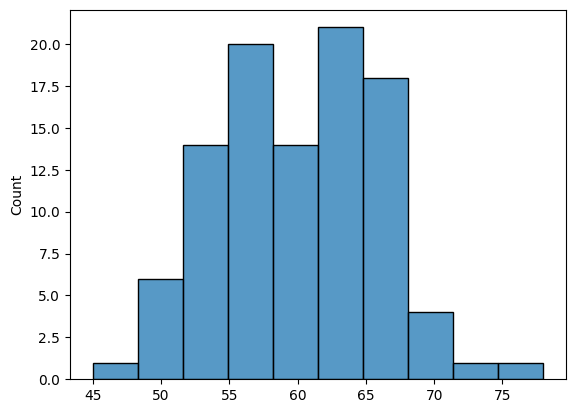

Spectrum id = 1933
Number of matched = 1
Size of MS/MS spectrum = 5


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.12it/s]


p-value = 0.92


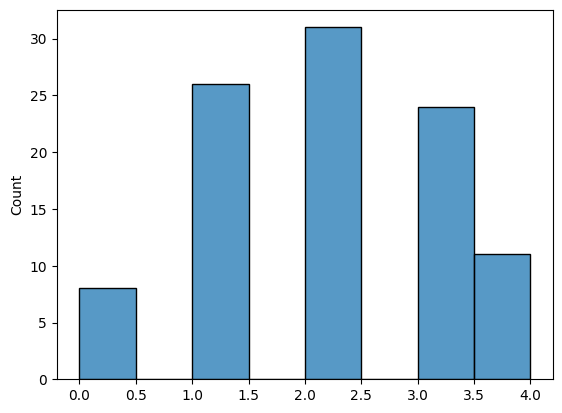

Spectrum id = 2344
Number of matched = 122
Size of MS/MS spectrum = 360


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:12<00:00,  7.93it/s]

p-value = 0.84


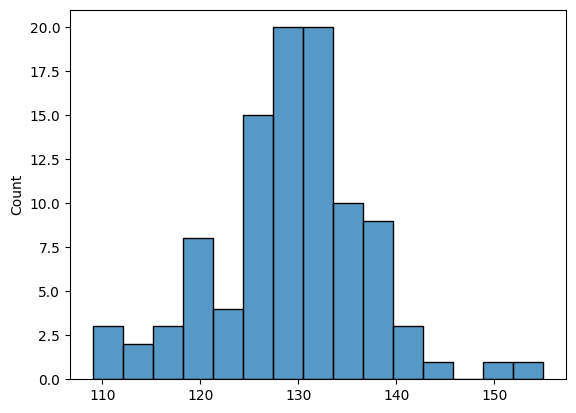

Spectrum id = 2386
Number of matched = 344
Size of MS/MS spectrum = 837


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:21<00:00,  4.72it/s]

p-value = 0.17


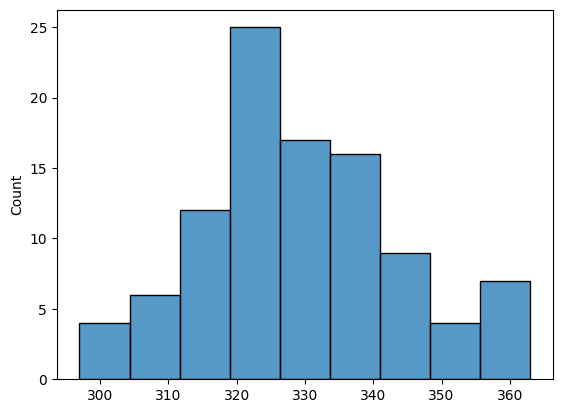

Spectrum id = 2515
Number of matched = 3649
Size of MS/MS spectrum = 9086


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:57<00:00,  1.78s/it]

p-value = 0.2


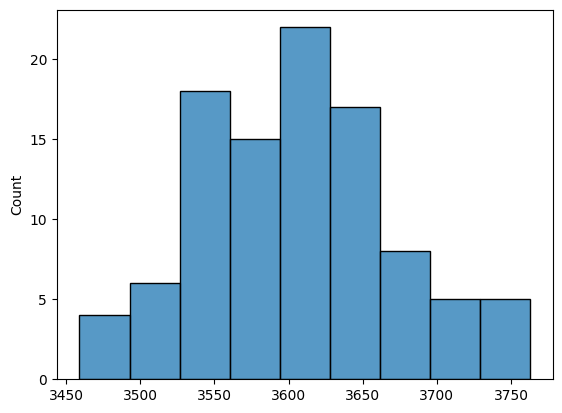

Spectrum id = 3365
Number of matched = 70
Size of MS/MS spectrum = 228


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:10<00:00,  9.21it/s]

p-value = 0.55


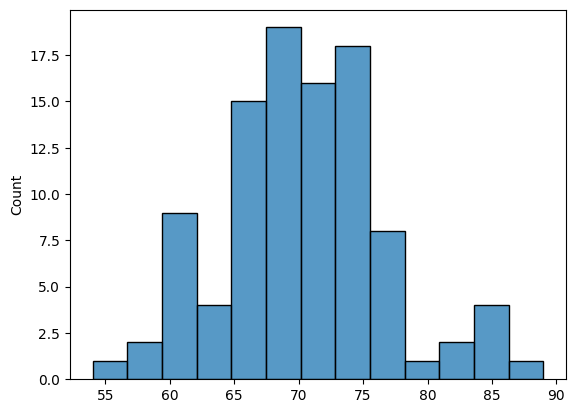

Spectrum id = 3533
Number of matched = 89
Size of MS/MS spectrum = 288


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:11<00:00,  8.43it/s]

p-value = 0.54


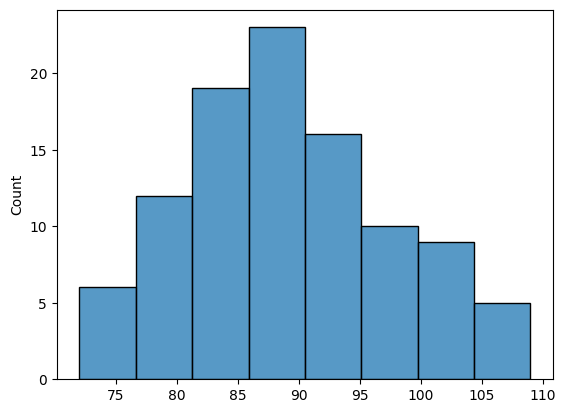

Spectrum id = 3620
Number of matched = 73
Size of MS/MS spectrum = 234


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:10<00:00,  9.32it/s]

p-value = 0.45


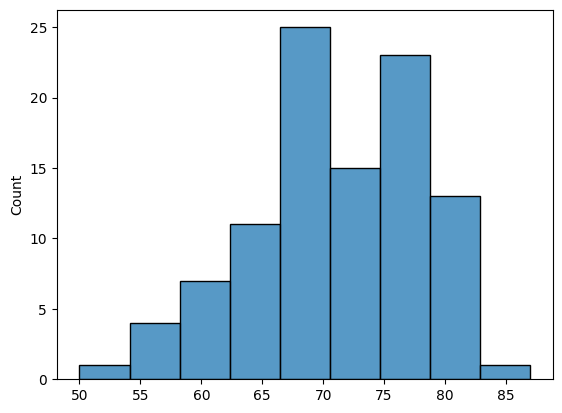

Spectrum id = 3808
Number of matched = 68
Size of MS/MS spectrum = 209


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:10<00:00,  9.59it/s]

p-value = 0.46


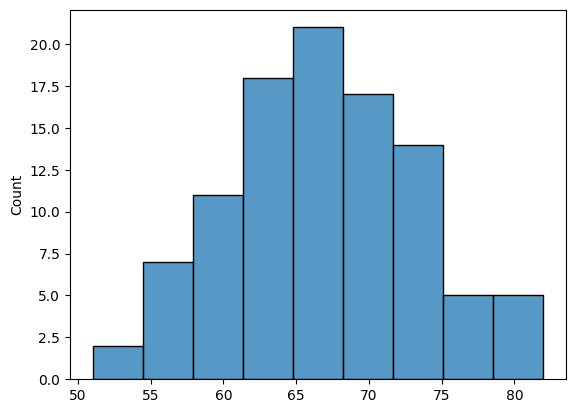

In [55]:
many_stats = []
for ind in range(len(matched)):
    print(f'Spectrum id = {matched[ind]["spectrum"]["num"]}')
    mz_array = np.array(matched[ind]['spectrum']['m/z array'])
    sequence = matched[ind]['sequence']['sequence']
    
    out_cnt_matched = get_cnt_annotated(mz_array, sequence)
    print(f'Number of matched = {out_cnt_matched}')
    print(f'Size of MS/MS spectrum = {len(mz_array)}')
          
    T = 100
    sample = []
    for _ in tqdm(range(T)):
        random_sequence = gen_random_protein(len(sequence))
        sample.append(get_cnt_annotated(mz_array, random_sequence))
    sample = np.array(sample)
          
    print(f'p-value = {(sample >= out_cnt_matched).mean()}')
    sns.histplot(sample)
    plt.show()
    
    many_stats.append({
        'matched_item': matched[ind],
        'out_cnt_matched': out_cnt_matched,
        'sample': sample,
        'p-value': (sample >= out_cnt_matched).mean(),
    })

## MsDeconv masses

In [56]:
def startswith(s, pr):
    return s[:len(pr)] == pr

def removeprefix(s, pr):
    return s[len(pr):]

In [57]:
def read_msalign(fileName):
    msalign_specs = []
    with open(fileName) as f:
        for line in f:
            line = line.strip()
            if line == '':
                continue
            elif line == 'BEGIN IONS':
                _id = None
                scans = None
                activation = None
                precursor_mz = None
                precursor_z = None
                precursor_m = None
                peaks = []
            elif startswith(line, 'ID='):
                _id = int(removeprefix(line, 'ID='))
            elif startswith(line, 'SCANS='):
                scans = int(removeprefix(line, 'SCANS='))
            elif startswith(line, 'ACTIVATION='):
                activation = removeprefix(line, 'ACTIVATION=')
            elif startswith(line, 'PRECURSOR_MZ='):
                precursor_mz = float(removeprefix(line, 'PRECURSOR_MZ='))
            elif startswith(line, 'PRECURSOR_CHARGE='):
                precursor_z = int(removeprefix(line, 'PRECURSOR_CHARGE='))
            elif startswith(line, 'PRECURSOR_MASS='):
                precursor_m = float(removeprefix(line, 'PRECURSOR_MASS='))
            elif line == 'END IONS':
                msalign_specs.append({
                    'num': scans,
                    'activation': activation,
                    'precursor_mz': precursor_mz,
                    'precursor_z': precursor_z,
                    'precursor_m': precursor_m,
                    'm_array': [p[0] for p in peaks],
                    'i_array': [p[1] for p in peaks],
                    'z_array': [p[2] for p in peaks],
                })
            elif len(line.split()) == 3:
                items = line.split()
                peaks.append((float(items[0]), float(items[1]), int(items[2])))
            else:
                raise Exception
    return msalign_specs

In [58]:
def match_items(items1, key1, items2, key2, err=10):
    def check(x, y):
        if abs(x - y) / max(x, y) <= err/1e6:
            return 0
        elif x < y:
            return -1
        else:
            return 1
    
    if key1 is None:
        key1 = lambda x: x
    elif isinstance(key1, str):
        key1 = lambda x, k=key1: x[k]
    
    if key2 is None:
        key2 = lambda x: x
    elif isinstance(key2, str):
        key2 = lambda x, k=key2: x[k]
    
    matched = []
    sorted_items1 = sorted(items1, key=key1)
    sorted_items2 = sorted(items2, key=key2)
    p2 = 0
    for p1 in range(len(sorted_items1)):
        while p2 < len(sorted_items2) and check(key2(sorted_items2[p2]), key1(sorted_items1[p1])) == -1:
            p2 += 1
        
        p22 = p2
        while p22 < len(sorted_items2) and check(key2(sorted_items2[p22]), key1(sorted_items1[p1])) == 0:
            matched.append({
                'item1': sorted_items1[p1],
                'item2': sorted_items2[p22],
            })
            p22 += 1
    
    return matched


def add_deconv_error(ions, max_deconv_err=0):
    result = []
    for ion in ions:
        result.append(ion)
        for e in range(-max_deconv_err, max_deconv_err + 1):
            if e == 0:
                continue
            new_ion = copy.deepcopy(ion)
            new_ion['name'] += f'-err=({e})'
            new_ion['mass_0'] += e
            result.append(new_ion)
    return result


def get_ions(sequence: str,
             prefix=False,
             suffix=False,
             middle=False,
             min_length=None,
             include_loose_molecules=True,
             max_deconv_err=0
            ):
    if min_length is None:
        min_length = 1
    
    ions = []
    ions.append({
        'name': f'full',
        'len': len(sequence),
        'sequence': sequence,
        'type': 'full',
        'mass_0': mass.calculate_mass(sequence=sequence),
    })
    if prefix:
        for i in range(1, len(sequence)):
            if i >= min_length:
                ions.append({
                    'name': f'b{i}',
                    'len': i,
                    'sequence': sequence[:i],
                    'type': 'b',
                    'mass_0': mass.calculate_mass(sequence=sequence[:i], ion_type='b', charge=0)
                })
    if suffix:
        for i in range(1, len(sequence)):
            if i >= min_length:
                ions.append({
                    'name': f'y{i}',
                    'len': i,
                    'sequence': sequence[-i:],
                    'type': 'y',
                    'mass_0': mass.calculate_mass(sequence=sequence[-i:], ion_type='y', charge=0)
                })
    if middle:
        for i in range(1, len(sequence) - 1):
            for j in range(i + 1, len(sequence)):
                if j - i >= min_length:
                    ions.append({
                        'name': f'm{i}_{j}',
                        'len': j-i,
                        'sequence': sequence[i:j],
                        'type': 'm',
                        'mass_0': mass.calculate_mass(sequence=sequence[i:j], ion_type='b', charge=0)
                    })
    if include_loose_molecules:
        ions = loose_molecule(ions)
    if max_deconv_err > 0:
        ions = add_deconv_error(ions, max_deconv_err=max_deconv_err)
    return ions

In [59]:
err = 10

def get_cnt_annotated_masses(m_array, sequence: str, ions=None):
    if ions is None:
        ions = get_ions(sequence, prefix=True, suffix=True)
    if not isinstance(m_array, np.ndarray):
        m_array = np.array(m_array)
    
    ion_masses_0 = np.array([ion['mass_0'] for ion in ions])

    return (
          ((m_array * (1-err/1e6))[None:] <= ion_masses_0[:,None])
        & (ion_masses_0[:,None] <= (m_array * (1+err/1e6))[None:])
    ).any(axis=0).sum()

In [60]:
msalign_specs = read_msalign('CAH_test_02_msdeconv.msalign')

In [61]:
msalign_specs = [x for x in msalign_specs if len(x['m_array']) >= 10]

In [62]:
len(msalign_specs)

646

In [63]:
for x in msalign_specs:
    if int(x['precursor_m']) in range(28900, 29100 + 1):
        temp = deepcopy(x)
        temp.pop('m_array')
        temp.pop('i_array')
        temp.pop('z_array')
        print(temp)
        print()

{'num': 2316, 'activation': 'HCD', 'precursor_mz': 1262.1660532024457, 'precursor_z': 23, 'precursor_m': 29006.65187565625}

{'num': 2322, 'activation': 'HCD', 'precursor_mz': 1075.3283152497106, 'precursor_z': 27, 'precursor_m': 29006.668059742187}

{'num': 2326, 'activation': 'HCD', 'precursor_mz': 1382.2288997406995, 'precursor_z': 21, 'precursor_m': 29005.654098554693}

{'num': 2327, 'activation': 'HCD', 'precursor_mz': 1612.4898483628472, 'precursor_z': 18, 'precursor_m': 29006.68630253125}

{'num': 2329, 'activation': 'HCD', 'precursor_mz': 1161.233462305625, 'precursor_z': 25, 'precursor_m': 29005.65465764062}

{'num': 2331, 'activation': 'HCD', 'precursor_mz': 1319.4913500987216, 'precursor_z': 22, 'precursor_m': 29006.649630171876}

{'num': 2332, 'activation': 'HCD', 'precursor_mz': 1451.2423283703124, 'precursor_z': 20, 'precursor_m': 29004.701047406248}

{'num': 2340, 'activation': 'HCD', 'precursor_mz': 1036.921766358259, 'precursor_z': 28, 'precursor_m': 29005.605730031253

### Compute the number of annotated masses

In [64]:
sequence = 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

msalign_result = []

for spec in tqdm(msalign_specs):
    m_array = np.array(spec['m_array'])
    cnt_annotated = get_cnt_annotated_masses(m_array, sequence)
#     print(cnt_annotated, cnt_annotated / len(mz_array) * 100)
#     print()
    msalign_result.append({
        'spectrum': spec,
        'm_size': len(m_array),
        'cnt_annotated': cnt_annotated,
        'frac_annotated': cnt_annotated / len(m_array) * 100,
        'sequence': sequence,
    })

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 646/646 [00:43<00:00, 14.88it/s]


In [65]:
msalign_specs_data = pd.DataFrame(msalign_result, index=[x['num'] for x in msalign_specs])

In [66]:
msalign_specs_data[(msalign_specs_data['frac_annotated'] >= 10) & (msalign_specs_data['cnt_annotated'] >= 10)]

,spectrum,m_size,cnt_annotated,frac_annotated,sequence
795,"{'num': 795, 'activation': 'HCD', 'precursor_m...",40,14,35.000000,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
822,"{'num': 822, 'activation': 'HCD', 'precursor_m...",28,10,35.714286,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
823,"{'num': 823, 'activation': 'HCD', 'precursor_m...",68,22,32.352941,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
839,"{'num': 839, 'activation': 'HCD', 'precursor_m...",69,30,43.478261,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
874,"{'num': 874, 'activation': 'HCD', 'precursor_m...",36,14,38.888889,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
...,...,...,...,...,...
2577,"{'num': 2577, 'activation': 'HCD', 'precursor_...",69,17,24.637681,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
2603,"{'num': 2603, 'activation': 'HCD', 'precursor_...",584,67,11.472603,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
2608,"{'num': 2608, 'activation': 'HCD', 'precursor_...",86,19,22.093023,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
2651,"{'num': 2651, 'activation': 'HCD', 'precursor_...",255,28,10.980392,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...


In [67]:
msalign_specs_data[(msalign_specs_data['frac_annotated'] >= 10) & (msalign_specs_data['cnt_annotated'] >= 10)].to_csv('aaa.csv')

### Look at specs with deconvoluted mass around 29006.68268464116

In [68]:
nums_to_check = []
for x in msalign_specs:
    if int(x['precursor_m']) in range(29000, 29010) and len(x['m_array']) >= 50:
        if len(x['m_array']) == 0:
            continue
        temp = deepcopy(x)
        temp.pop('m_array')
        temp.pop('i_array')
        temp.pop('z_array')
        print(temp)
        print(msalign_specs_data.loc[x['num'], :])
#         print(specs_data.loc[x['num'], :])
        print()
        nums_to_check.append(temp['num'])

{'num': 2316, 'activation': 'HCD', 'precursor_mz': 1262.1660532024457, 'precursor_z': 23, 'precursor_m': 29006.65187565625}
spectrum          {'num': 2316, 'activation': 'HCD', 'precursor_...
m_size                                                          131
cnt_annotated                                                    42
frac_annotated                                            32.061069
sequence          EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
Name: 2316, dtype: object

{'num': 2322, 'activation': 'HCD', 'precursor_mz': 1075.3283152497106, 'precursor_z': 27, 'precursor_m': 29006.668059742187}
spectrum          {'num': 2322, 'activation': 'HCD', 'precursor_...
m_size                                                          483
cnt_annotated                                                    98
frac_annotated                                            20.289855
sequence          EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
Name: 2322, dtype: object

{'num': 2326, 'ac

### Compare to previously found matches

In [69]:
specs_data.loc[2515, :]

spectrum          {'num': '2515', 'mz': 907.47, 'intensity': 210...
ms_size                                                        9086
cnt_annotated                                                  3649
frac_annotated                                            40.160687
sequence          EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
Name: 2515, dtype: object

In [70]:
set(table['num'].apply(lambda x: int(x))) & set(specs_data.index)

{573, 1933, 2344, 2386, 2515, 3365, 3533, 3620, 3808}

In [71]:
table

,num,mz,z,m,seq_len,seq_m,sequence
0,573,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
1,1933,1319.50415,22,29006.931227,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
2,2344,1036.96000,28,29006.676259,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
3,2386,784.97000,37,29006.620771,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
4,2515,907.47000,32,29006.807153,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
5,3365,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
6,3533,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
7,3620,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...
8,3808,936.71000,31,29006.784430,259,29006.682685,EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPL...


### Stat test

In [72]:
sequence

'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

In [73]:
def get_msalign_spec(num):
    for x in msalign_specs:
        if x['num'] == num:
            return x
    return None

In [74]:
dec_spec = get_msalign_spec(2316)

In [75]:
get_cnt_annotated_masses(dec_spec['m_array'], sequence)

42

In [76]:
nums_to_check

[2316, 2322, 2326, 2327, 2329, 2331, 2332, 2340, 2345, 2466]

Spectrum id = 839
Number of matched = 30
Size of m_array = 69


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.80it/s]

p-value = 0.0


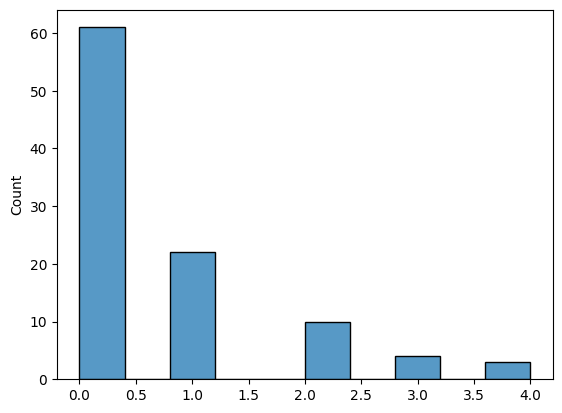

Spectrum id = 1074
Number of matched = 31
Size of m_array = 75


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.71it/s]

p-value = 0.0


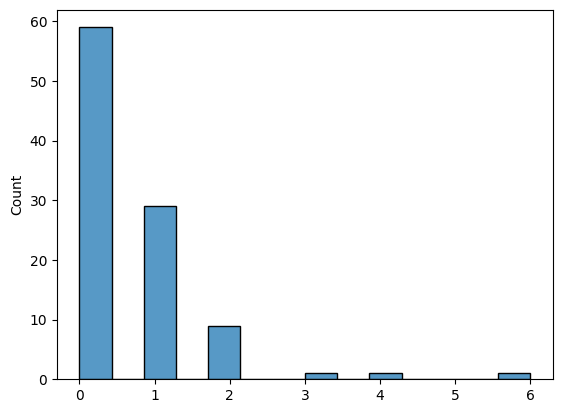

Spectrum id = 1288
Number of matched = 34
Size of m_array = 150


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.77it/s]

p-value = 0.0


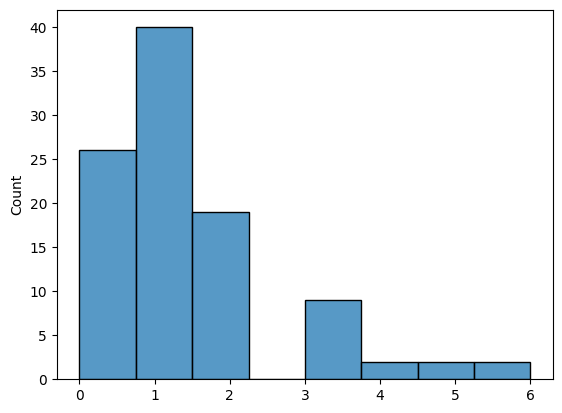

Spectrum id = 2309
Number of matched = 54
Size of m_array = 150


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.78it/s]

p-value = 0.0


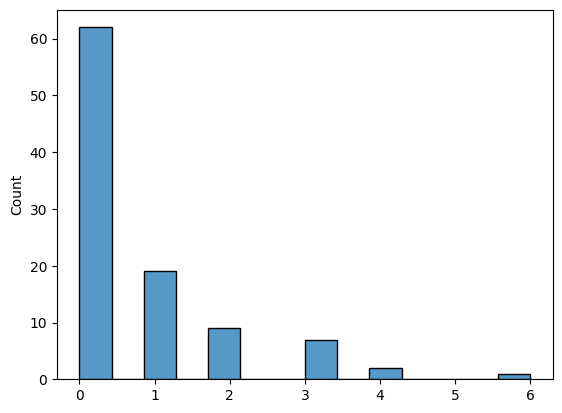

Spectrum id = 2314
Number of matched = 100
Size of m_array = 467


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.55it/s]

p-value = 0.0


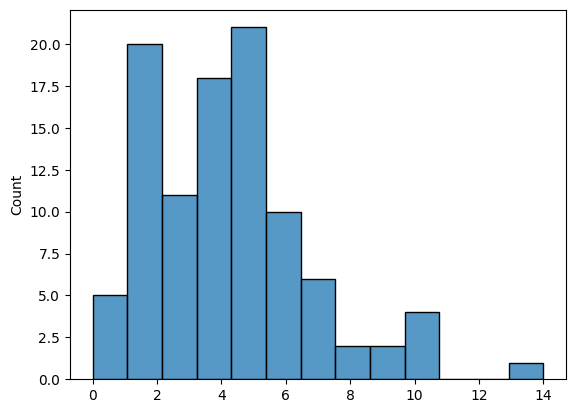

Spectrum id = 2408
Number of matched = 17
Size of m_array = 98


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.74it/s]

p-value = 0.0


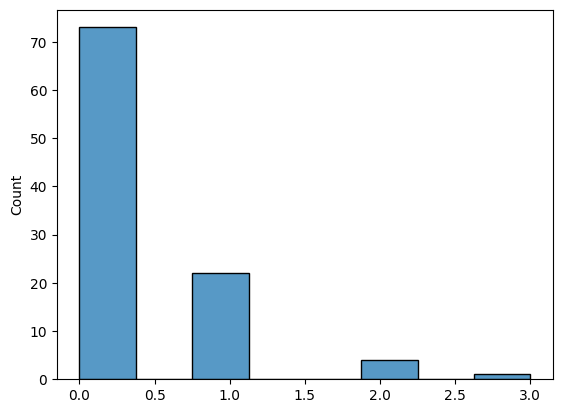

Spectrum id = 2479
Number of matched = 30
Size of m_array = 241


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.80it/s]

p-value = 0.0


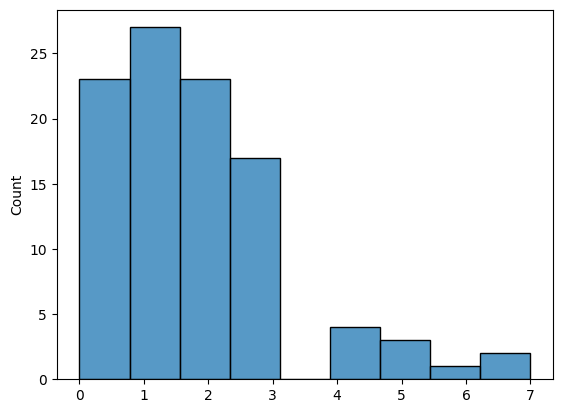

In [77]:
many_stats = []
# for num in [2316, 2322, 2326, 2327, 2329, 2331, 2332, 2340, 2342, 2345, 2350, 2358, 2466]:
for num in [839, 1074, 1288, 2309, 2314, 2408, 2479]:
    dec_spec = get_msalign_spec(num)
    print(f'Spectrum id = {num}')
    m_array = np.array(dec_spec['m_array'])
    
    our_cnt_matched = get_cnt_annotated_masses(m_array, sequence)
    print(f'Number of matched = {our_cnt_matched}')
    print(f'Size of m_array = {len(m_array)}')
          
    T = 100
    sample = []
    for _ in tqdm(range(T)):
        random_sequence = gen_random_protein(len(sequence))
        sample.append(get_cnt_annotated_masses(m_array, random_sequence))
    sample = np.array(sample)
          
    print(f'p-value = {(sample >= our_cnt_matched).mean()}')
    sns.histplot(sample)
    plt.show()
    
    many_stats.append({
        'matched_item': dec_spec,
        'out_cnt_matched': our_cnt_matched,
        'sample': sample,
        'ca_value': np.quantile(sample, 0.95),
        'p-value': (sample >= our_cnt_matched).mean(),
    })

In [78]:
many_stats[0]

{'matched_item': {'num': 839,
  'activation': 'HCD',
  'precursor_mz': 699.1701601627605,
  'precursor_z': 6,
  'precursor_m': 4188.977304976563,
  'm_array': [2792.267624265625,
   3331.5155265468748,
   2589.182183046875,
   3642.6636779062496,
   2561.187299,
   2589.1810361953126,
   2660.2182696406253,
   2476.0979455312495,
   3313.50420053125,
   2660.21905028125,
   1599.784091703125,
   2632.224411375,
   2775.245166328125,
   2379.045349042969,
   1528.746983328125,
   3331.517344785156,
   3527.6358578749996,
   4170.943620570313,
   3313.5071784375,
   661.3281108671874,
   2547.1382307343747,
   2094.4805847421876,
   1414.7047460000001,
   2231.977966230469,
   3642.664763722656,
   318.1903860371094,
   3870.773275046875,
   2379.0457024375,
   3403.5416425937497,
   3296.492226640625,
   2448.1003919375,
   3244.481006171875,
   1457.709872953125,
   3625.6437262578124,
   128.0953990751953,
   3626.6407176875,
   2757.236382265625,
   3400.5769387617183,
   433.2172710

In [79]:
for item in many_stats:
    num = item['matched_item']['num']
    dec_spec = get_msalign_spec(num)
    print(num, end = ' ')
    print(len(dec_spec['m_array']), end = ' ')
    print(item['out_cnt_matched'], end = ' ')
    print(item['ca_value'])

839 69 30 3.0
1074 75 31 2.0
1288 150 34 4.0
2309 150 54 3.0
2314 467 100 9.049999999999997
2408 98 17 1.0499999999999972
2479 241 30 5.0


### Look at b- and y- annotated ions distribution

Spectrum num=2316, size=131, matched=57, frac=0.4351145038167939


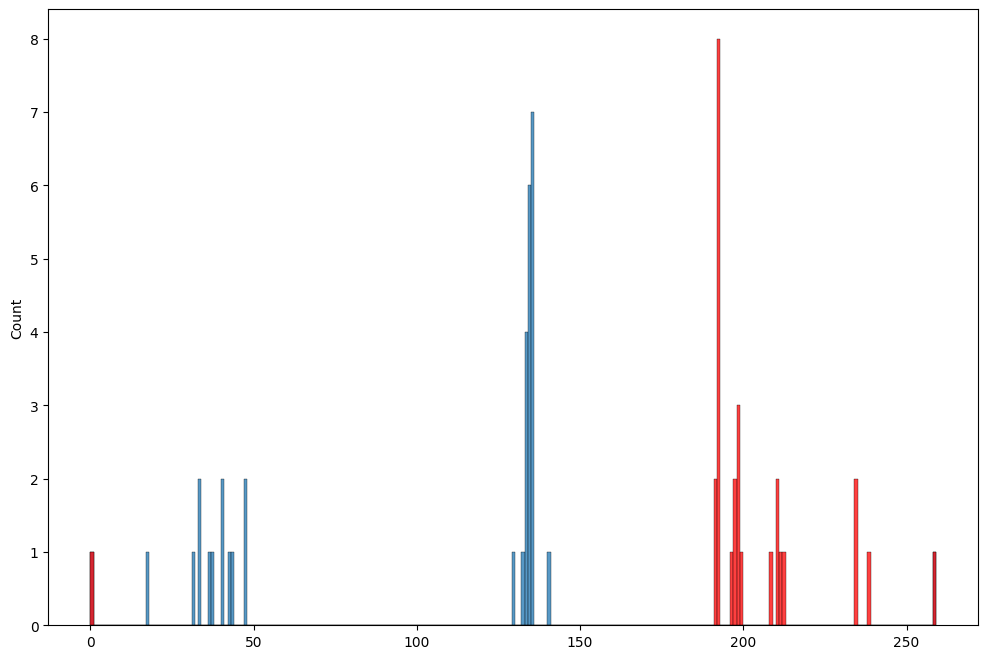

Spectrum num=2322, size=483, matched=138, frac=0.2857142857142857


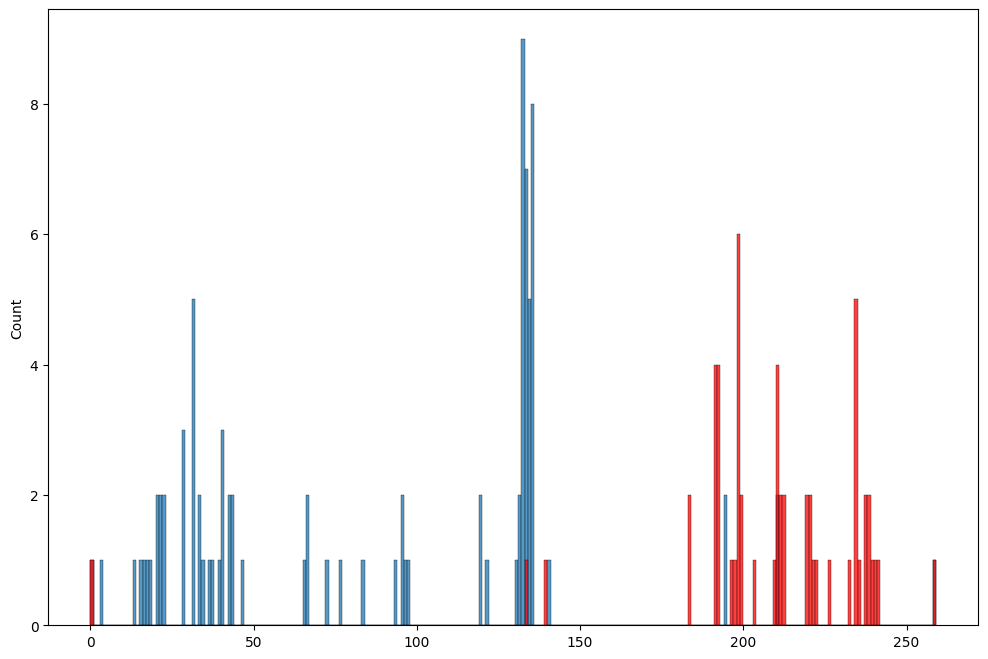

Spectrum num=2326, size=483, matched=154, frac=0.3188405797101449


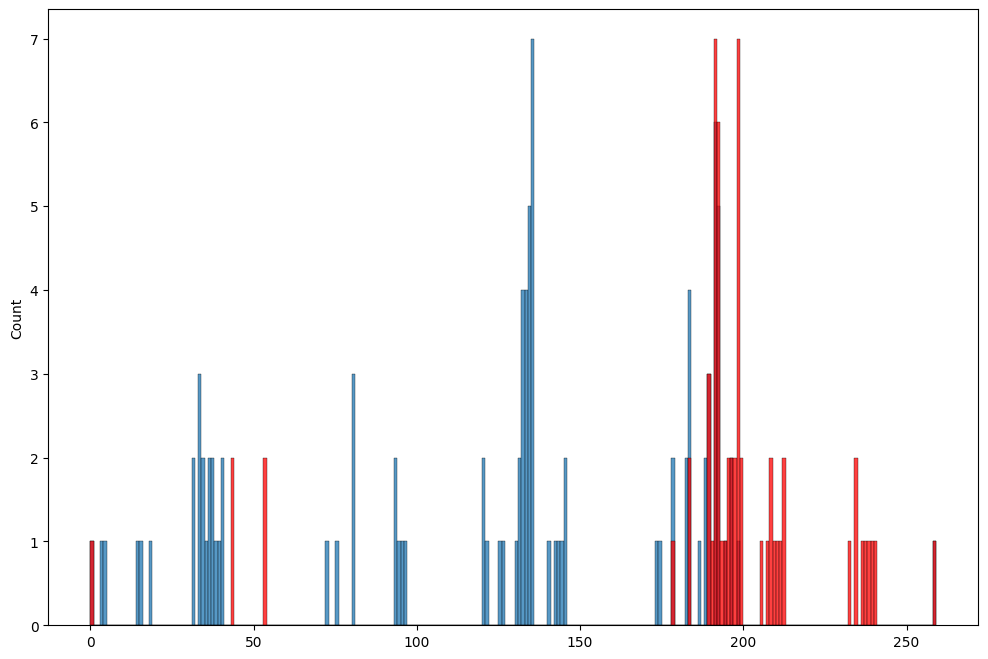

Spectrum num=2327, size=483, matched=147, frac=0.30434782608695654


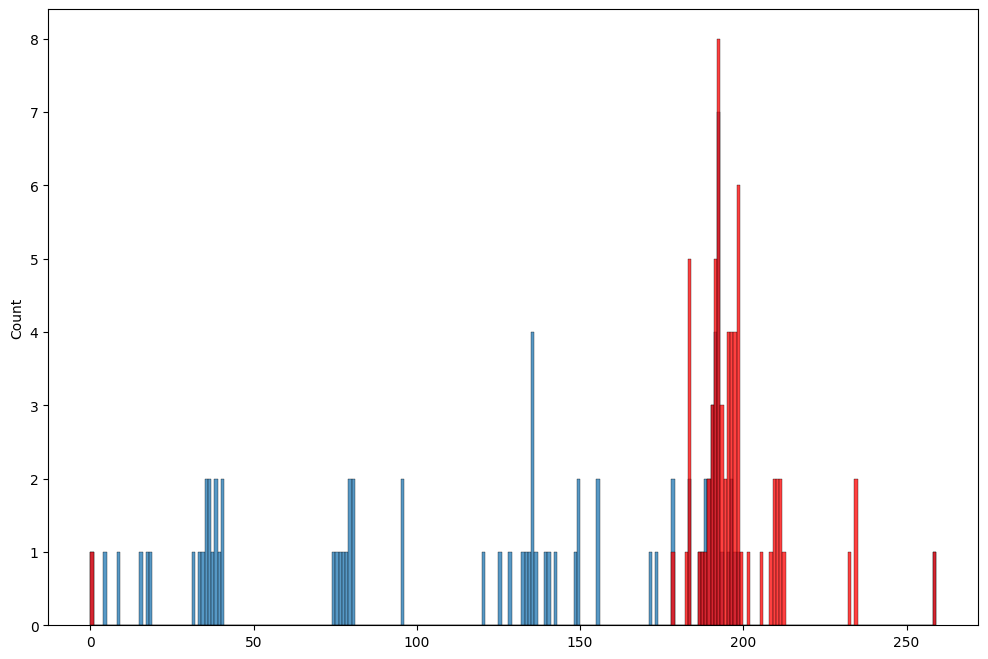

Spectrum num=2329, size=483, matched=122, frac=0.2525879917184265


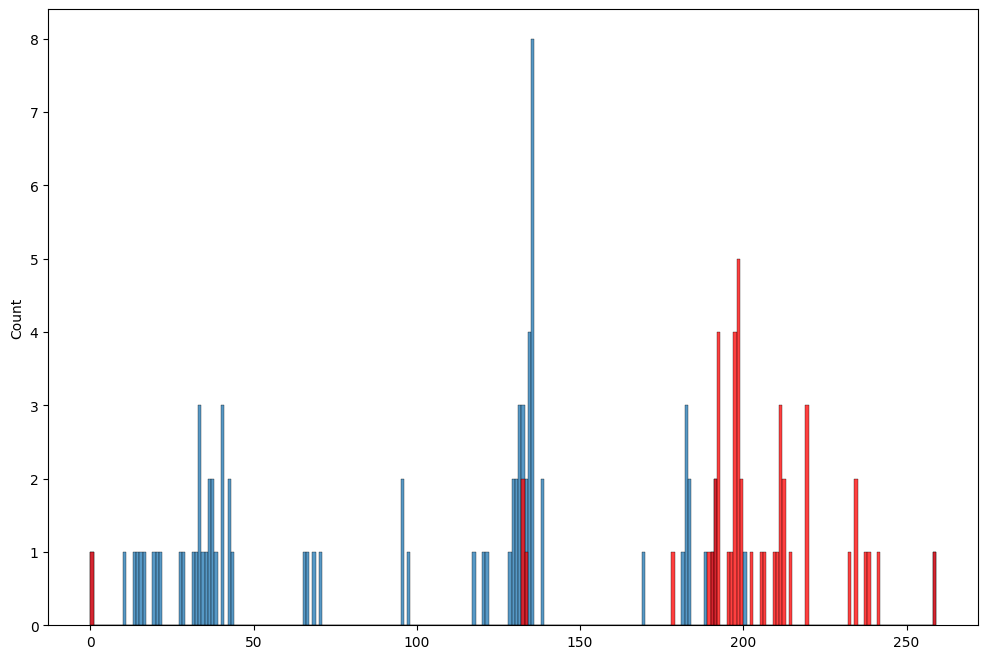

Spectrum num=2331, size=483, matched=153, frac=0.3167701863354037


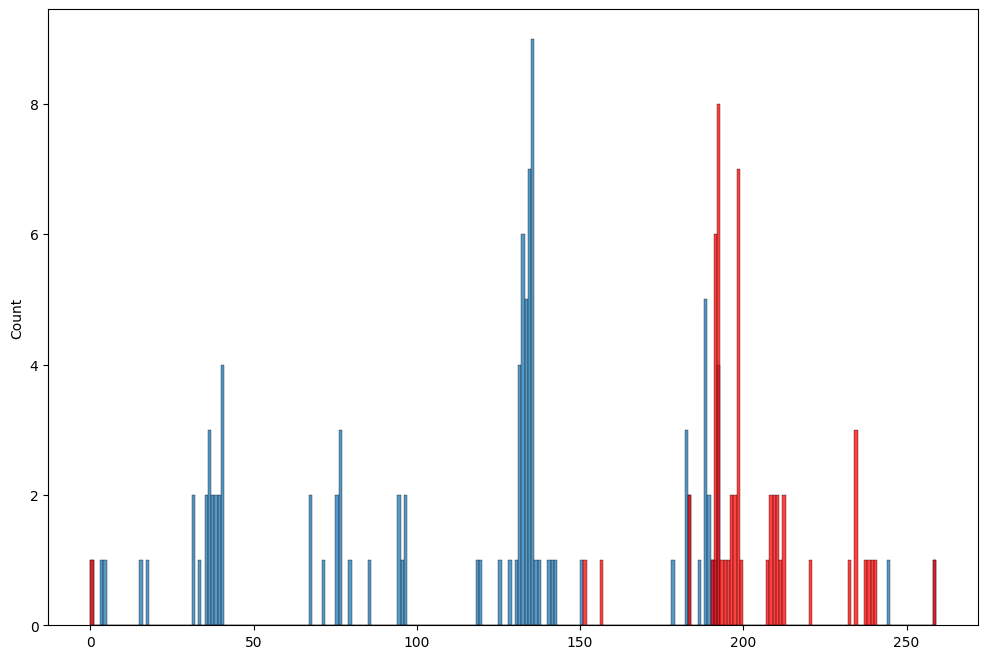

Spectrum num=2332, size=483, matched=146, frac=0.3022774327122153


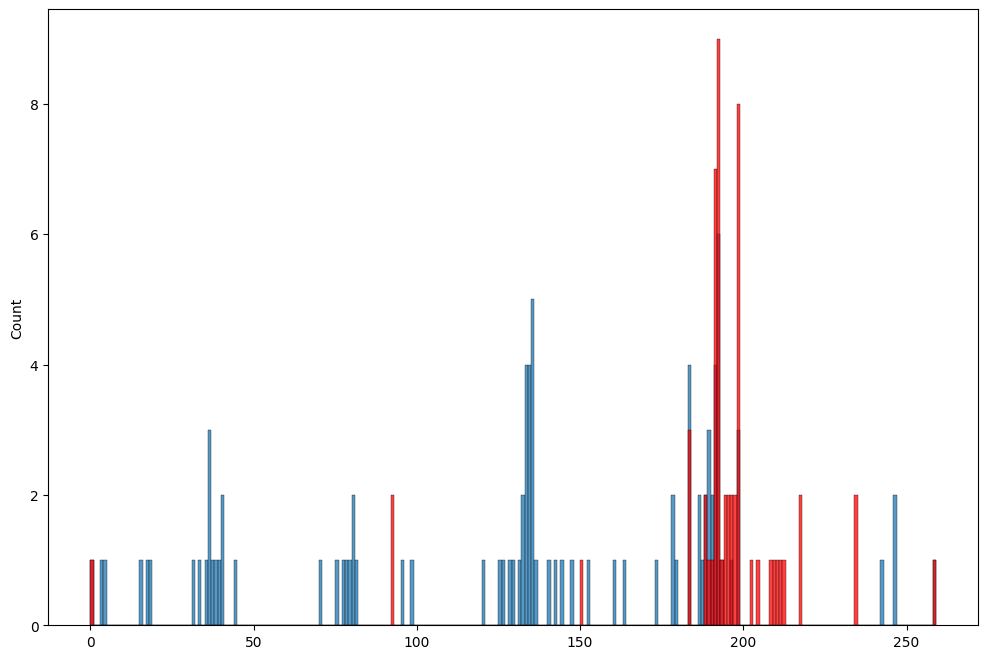

Spectrum num=2340, size=483, matched=140, frac=0.2898550724637681


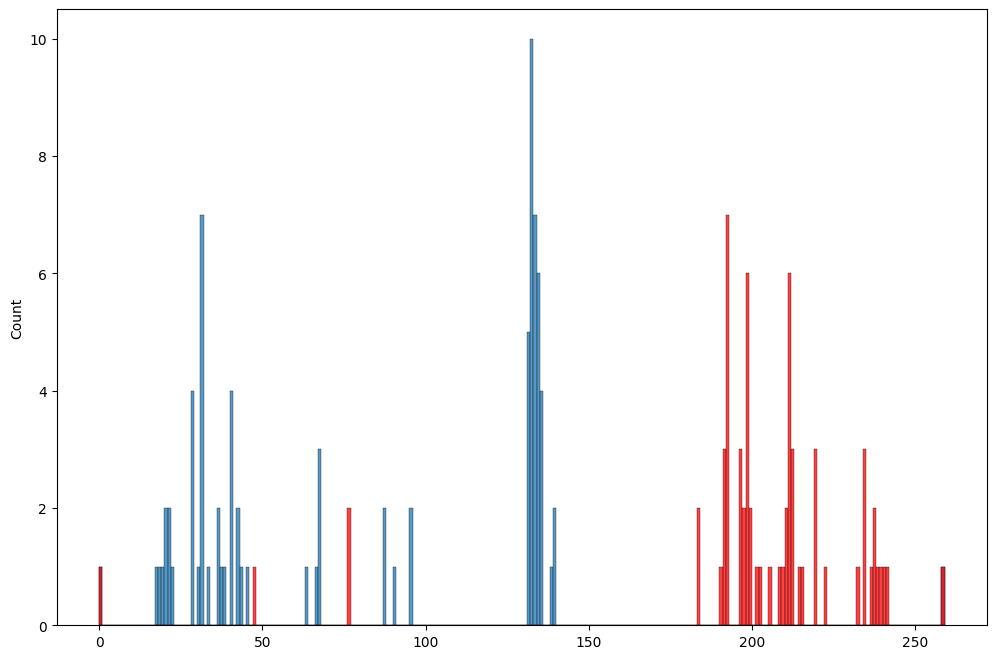

Spectrum num=2345, size=483, matched=174, frac=0.36024844720496896


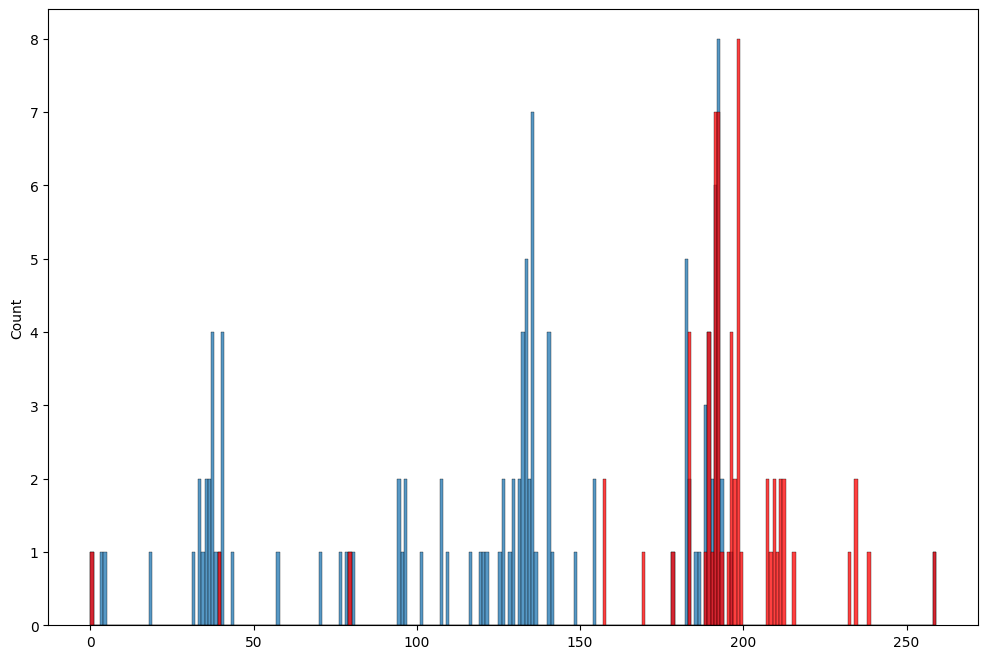

Spectrum num=2466, size=483, matched=146, frac=0.3022774327122153


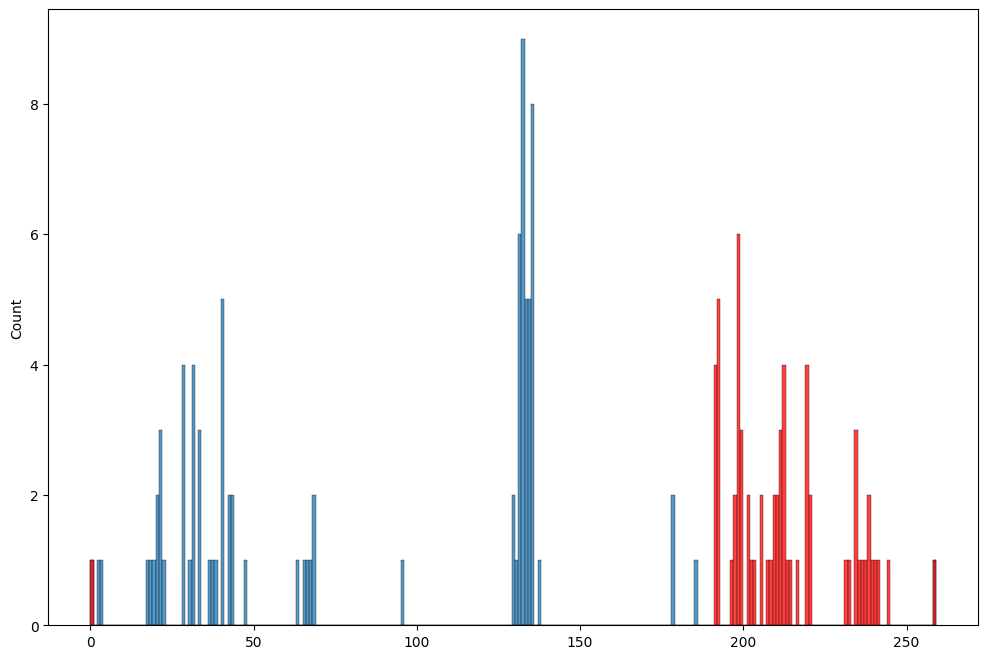

In [80]:
all_b_pos = []
all_y_pos = []

ions = get_ions(sequence,
                prefix=True,
                suffix=True,
                middle=False,
                min_length=1,
                include_loose_molecules=True,
                max_deconv_err=2
               )

for num in nums_to_check:
    item = get_msalign_spec(num)

    matched = match_items(ions, 'mass_0', item['m_array'], None, err=5)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    b_pos = [x['item1']['len'] for x in matched if x['item1']['type'] == 'b']
    y_pos = [len(sequence) - x['item1']['len'] for x in matched if x['item1']['type'] == 'y']
          
    all_b_pos.extend(b_pos)
    all_y_pos.extend(y_pos)

    plt.figure(figsize=(12, 8))
    sns.histplot(b_pos + [0, len(sequence)], bins=len(sequence))
    sns.histplot(y_pos + [0, len(sequence)], bins=len(sequence), color='r')
    plt.show()

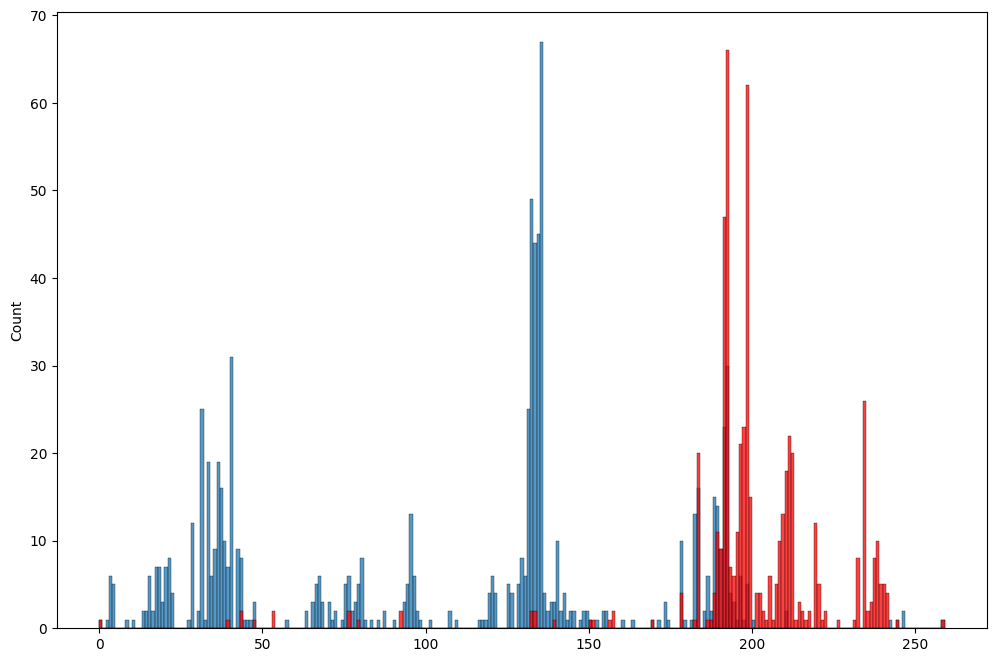

In [81]:
plt.figure(figsize=(12, 8))
sns.histplot(all_b_pos + [0, len(sequence)], bins=len(sequence))
sns.histplot(all_y_pos + [0, len(sequence)], bins=len(sequence), color='r')
plt.show()

In [82]:
def group_intervals(int_list, max_gap=0):
    if not int_list:
        return []

    sorted_list = sorted(int_list)
    intervals = []
    current_interval = (sorted_list[0], sorted_list[0])

    for i in range(1, len(sorted_list)):
        if sorted_list[i] <= sorted_list[i-1] + (max_gap + 1):
            current_interval = (current_interval[0], sorted_list[i])
        else:
            intervals.append(current_interval)
            current_interval = (sorted_list[i], sorted_list[i])

    intervals.append(current_interval)
    return intervals

In [83]:
set(all_b_pos)

{2,
 3,
 4,
 8,
 10,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 27,
 28,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 42,
 43,
 44,
 45,
 46,
 47,
 57,
 63,
 65,
 66,
 67,
 68,
 70,
 71,
 72,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 83,
 85,
 87,
 90,
 93,
 94,
 95,
 96,
 97,
 98,
 101,
 107,
 109,
 116,
 117,
 118,
 119,
 120,
 121,
 125,
 126,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 147,
 148,
 149,
 150,
 152,
 154,
 155,
 160,
 163,
 169,
 171,
 173,
 174,
 178,
 179,
 181,
 182,
 183,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 200,
 210,
 242,
 244,
 246}

In [84]:
group_intervals(all_b_pos, max_gap=1)

[(2, 4),
 (8, 10),
 (13, 22),
 (27, 47),
 (57, 57),
 (63, 87),
 (90, 90),
 (93, 98),
 (101, 101),
 (107, 109),
 (116, 121),
 (125, 155),
 (160, 160),
 (163, 163),
 (169, 174),
 (178, 200),
 (210, 210),
 (242, 246)]

In [85]:
from collections import Counter

In [86]:
counter = Counter(all_b_pos)
most_common_elements = counter.most_common(30)
most_common_elements

[(135, 67),
 (132, 49),
 (134, 45),
 (133, 44),
 (40, 31),
 (192, 30),
 (31, 25),
 (131, 25),
 (191, 23),
 (33, 19),
 (36, 19),
 (37, 16),
 (183, 16),
 (188, 15),
 (189, 14),
 (95, 13),
 (182, 13),
 (28, 12),
 (140, 10),
 (38, 10),
 (178, 10),
 (42, 9),
 (35, 9),
 (190, 9),
 (43, 8),
 (129, 8),
 (21, 8),
 (80, 8),
 (17, 7),
 (18, 7)]

In [87]:
for pos, cnt in most_common_elements:
    print(pos, cnt)
    print(sequence[pos-3:pos+3])

135 67
AQQPDG
132 49
GTAAQQ
134 45
AAQQPD
133 44
TAAQQP
40 31
VQDPAL
192 30
WTYPGS
31 25
PVDIDT
131 25
FGTAAQ
191 23
YWTYPG
33 19
DIDTKA
36 19
TKAVVQ
37 16
KAVVQD
183 16
SLLPNV
188 15
VLDYWT
189 14
LDYWTY
95 13
HFHWGS
182 13
GSLLPN
28 12
RQSPVD
140 10
GLAVVG
38 10
AVVQDP
178 10
NFDPGS
42 9
DPALKP
35 9
DTKAVV
190 9
DYWTYP
43 8
PALKPL
129 8
GDFGTA
21 8
FPIANG
80 8
LKDGPL
17 7
WHKDFP
18 7
HKDFPI


In [88]:
sequence

'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK'

In [89]:
for l, r in group_intervals(all_b_pos, max_gap=1):
    print(l, r)
    print(sequence[l-1:r+1])
    print()

2 4
HHWG

8 10
KHNG

13 22
EHWHKDFPIAN

27 47
QSPVDIDTKAVVQDPALKPLAL

57 57
RM

63 87
HSFNVEYDDSQDKAVLKDGPLTGTYR

90 90
VQ

93 98
HFHWGSS

101 101
DQ

107 109
TVDR

116 121
ELHLVHW

125 155
KYGDFGTAAQQPDGLAVVGVFLKVGDANPALQ

160 160
DA

163 163
DS

169 174
GKSTDFP

178 200
DPGSLLPNVLDYWTYPGSLTTPPL

210 210
LK

242 246
NWRPAQ



Spectrum num=794, size=82, matched=1, frac=0.012195121951219513


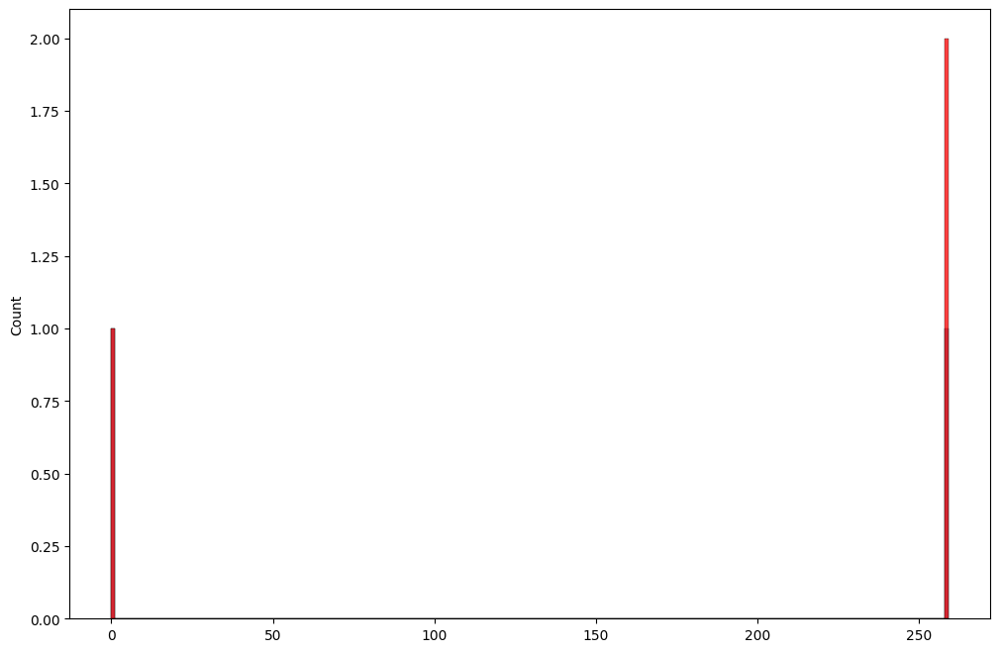

Spectrum num=796, size=62, matched=0, frac=0.0


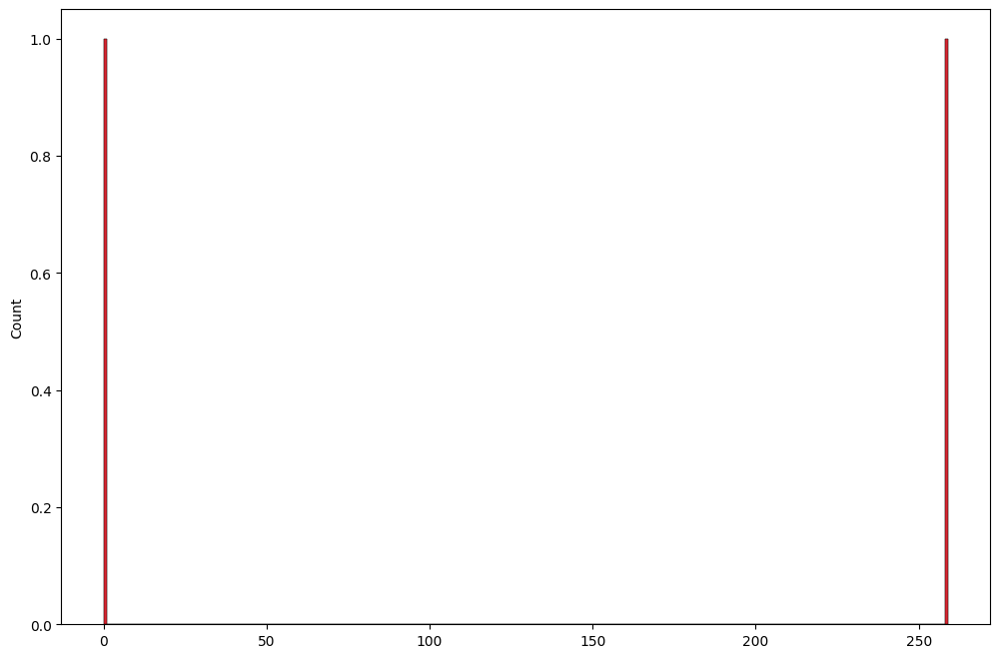

Spectrum num=797, size=82, matched=2, frac=0.024390243902439025


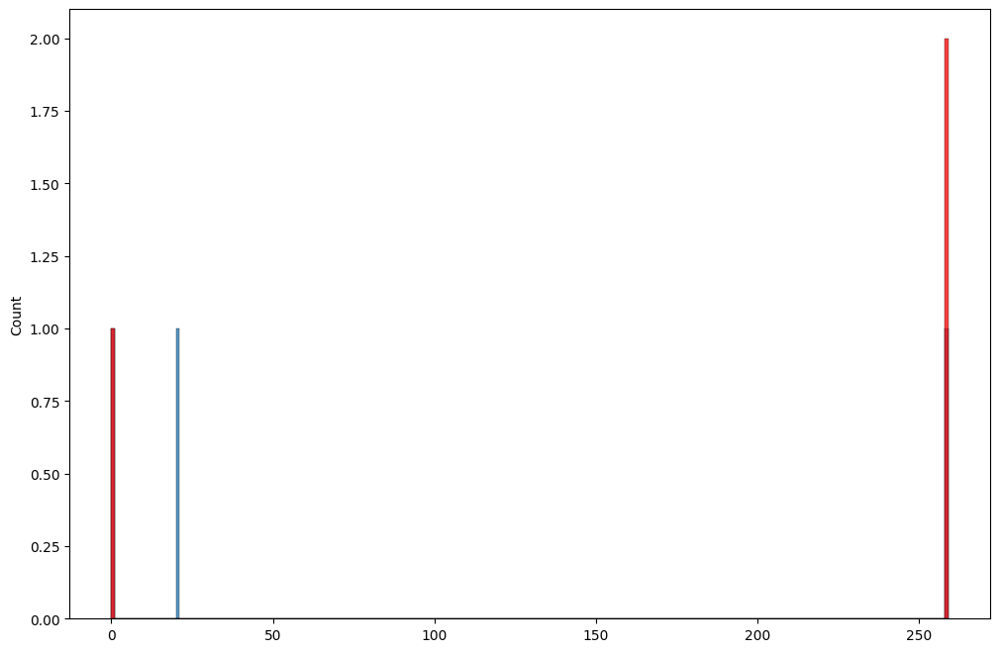

Spectrum num=821, size=64, matched=12, frac=0.1875


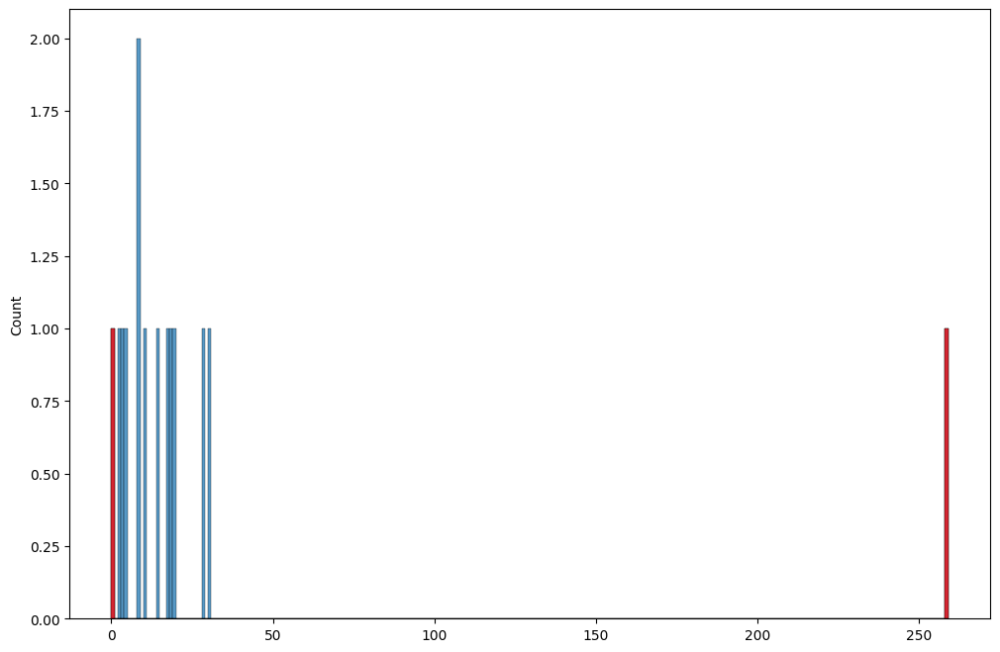

Spectrum num=823, size=68, matched=32, frac=0.47058823529411764


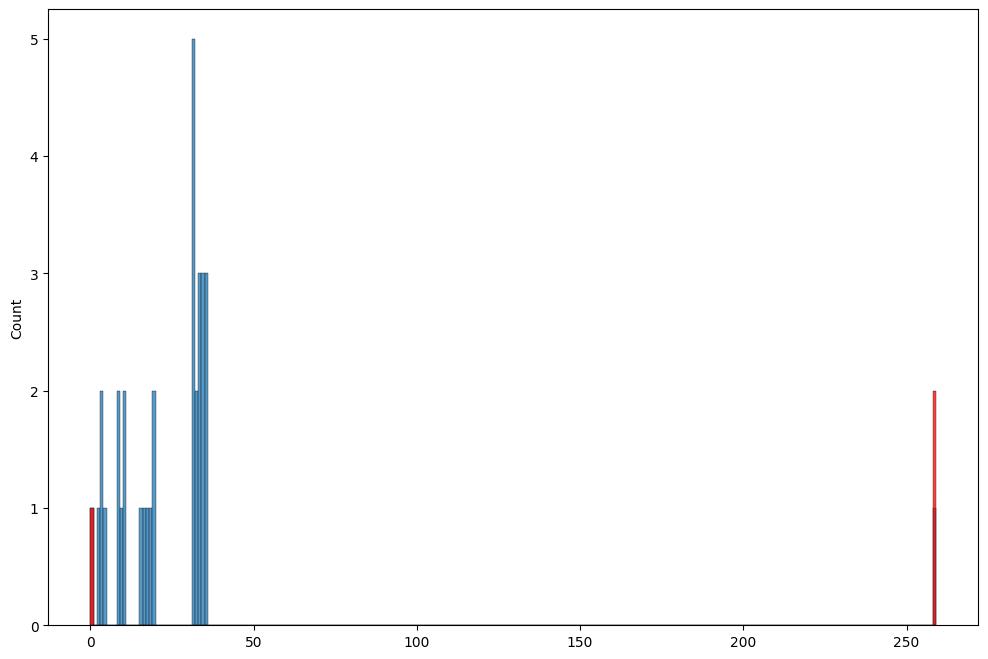

Spectrum num=839, size=69, matched=37, frac=0.5362318840579711


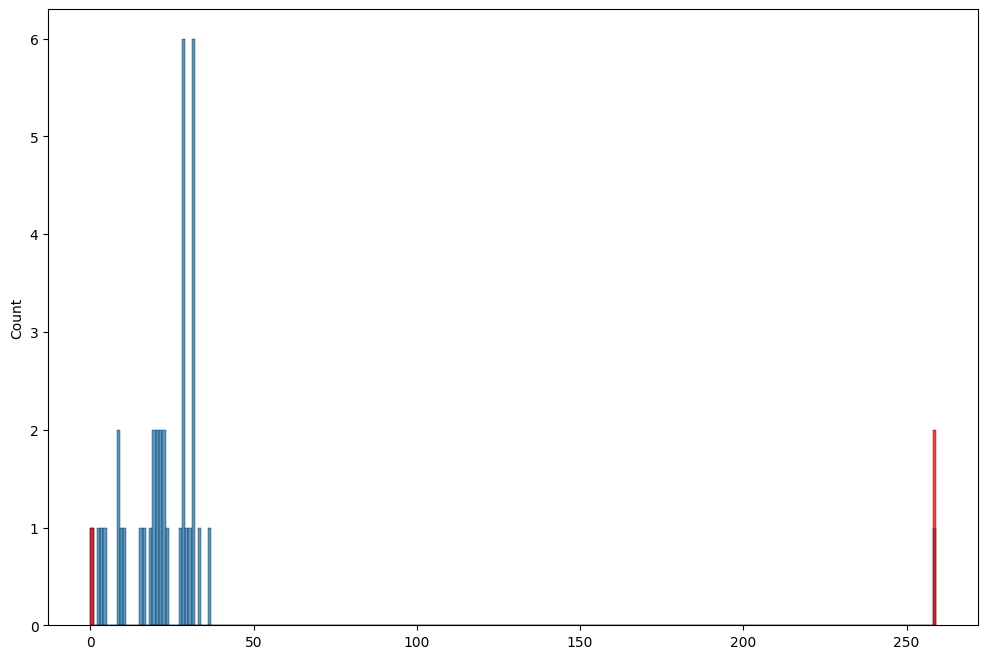

Spectrum num=875, size=69, matched=36, frac=0.5217391304347826


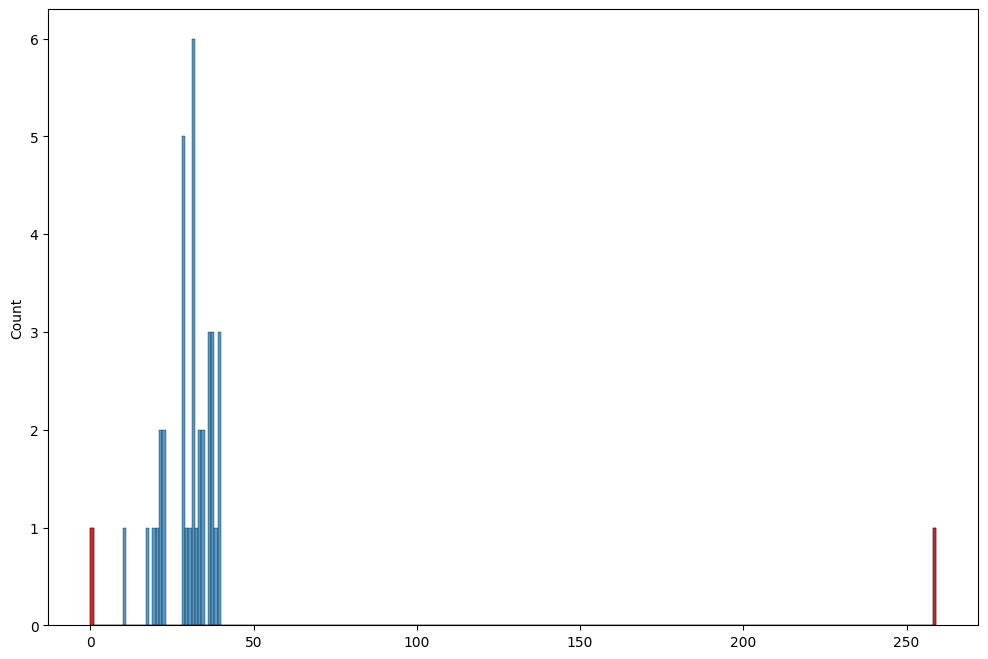

Spectrum num=879, size=77, matched=22, frac=0.2857142857142857


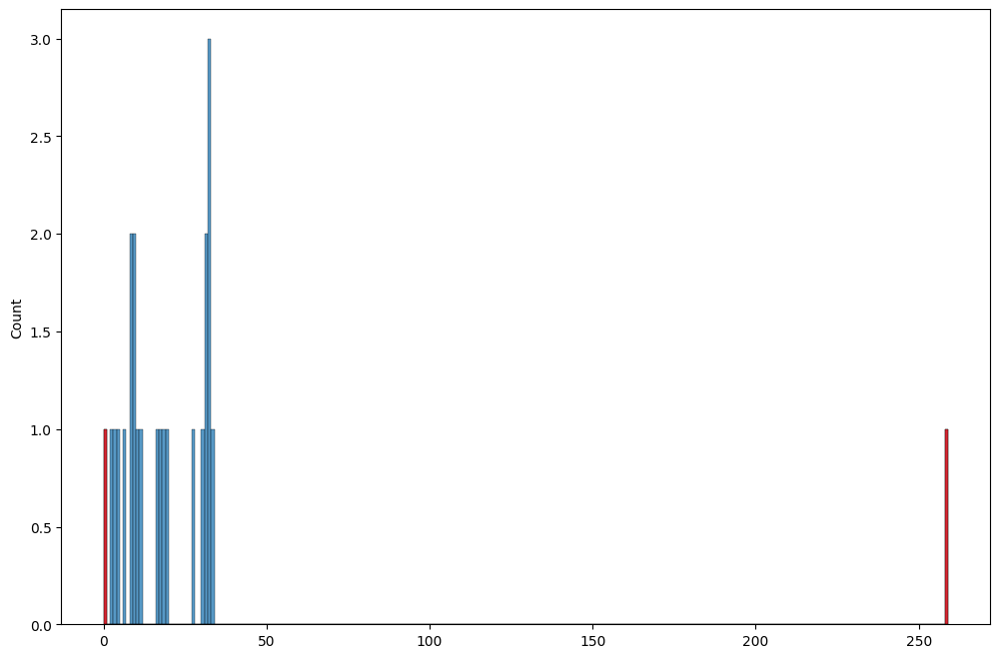

Spectrum num=911, size=63, matched=1, frac=0.015873015873015872


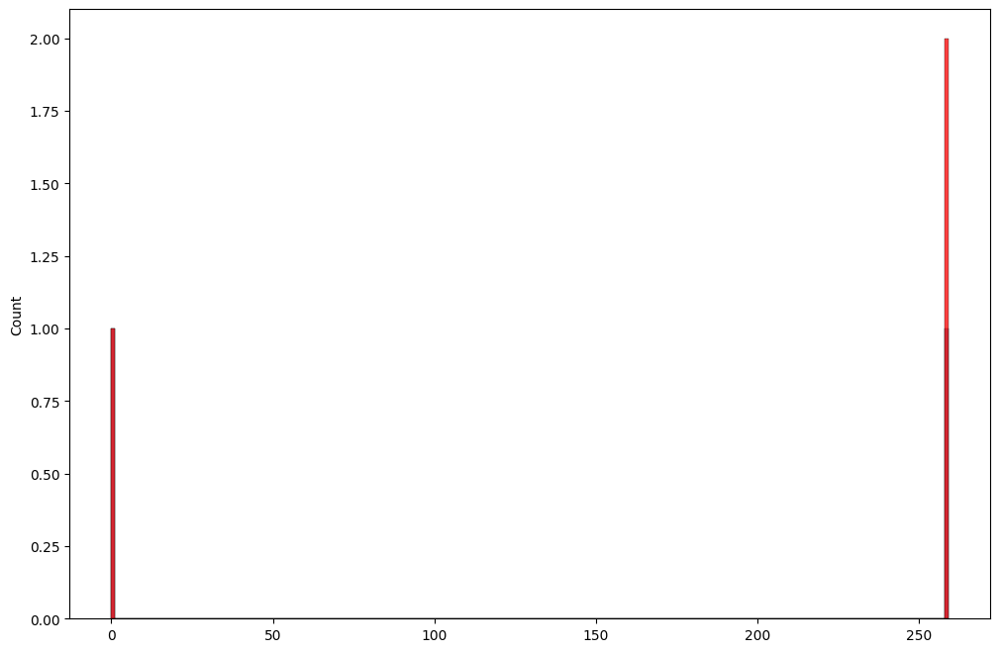

Spectrum num=915, size=63, matched=1, frac=0.015873015873015872


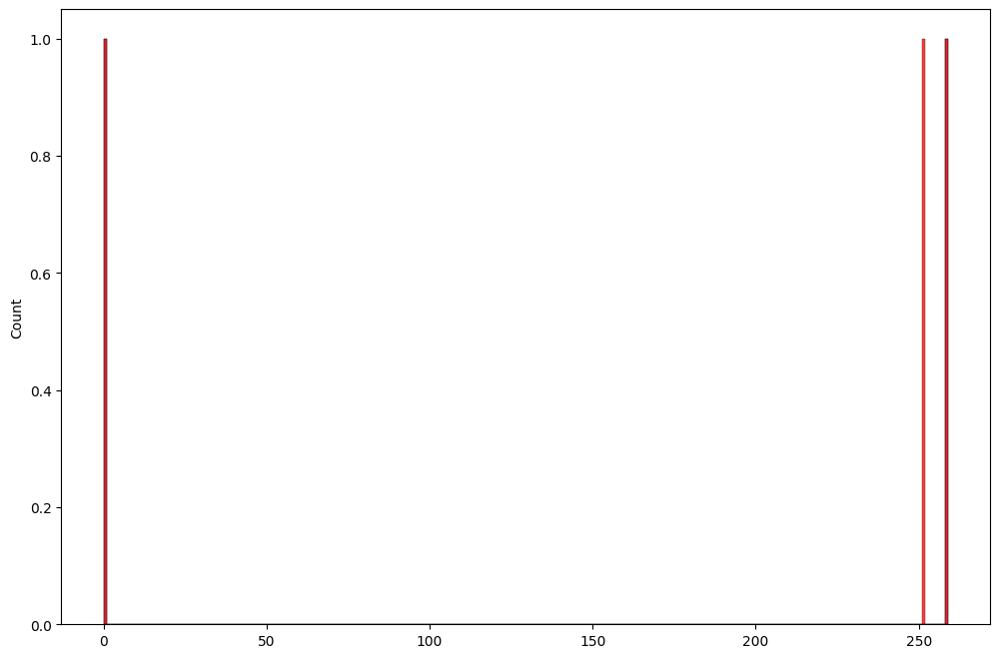

In [90]:
all_nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 50]

all_b_pos_all_nums = []
all_y_pos_all_nums = []

ions = get_ions(sequence,
                prefix=True,
                suffix=True,
                middle=False,
                min_length=1,
                include_loose_molecules=True,
                max_deconv_err=2
               )

for num in all_nums[:10]:
    item = get_msalign_spec(num)

    matched = match_items(ions, 'mass_0', item['m_array'], None, err=5)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    b_pos = [x['item1']['len'] for x in matched if x['item1']['type'] == 'b']
    y_pos = [len(sequence) - x['item1']['len'] for x in matched if x['item1']['type'] == 'y']
          
    all_b_pos_all_nums.extend(b_pos)
    all_y_pos_all_nums.extend(y_pos)

    plt.figure(figsize=(12, 8))
    sns.histplot(b_pos + [0, len(sequence)], bins=len(sequence))
    sns.histplot(y_pos + [0, len(sequence)], bins=len(sequence), color='r')
    plt.show()

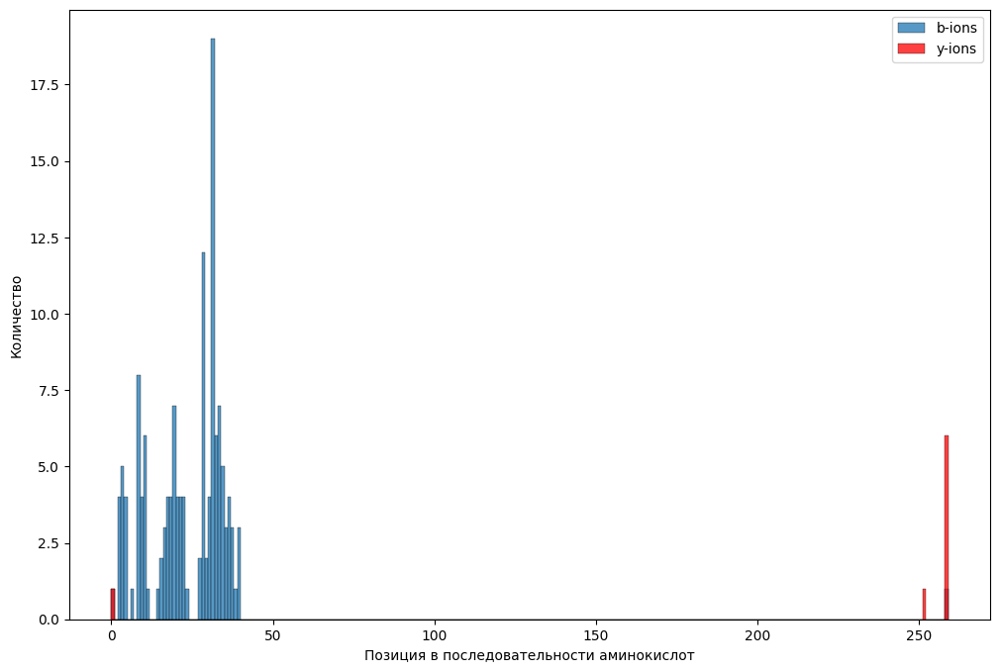

In [91]:
plt.figure(figsize=(12, 8))

sns.histplot(all_b_pos_all_nums + [0, len(sequence)], bins=len(sequence), label='b-ions')
sns.histplot(all_y_pos_all_nums + [0, len(sequence)], bins=len(sequence), color='r', label='y-ions')

plt.xlabel("Позиция в последовательности аминокислот")  # Set the x-axis label
plt.ylabel("Количество")  # Set the y-axis label
plt.legend()  # Show the legend

# plt.savefig('output_b_and_y_ions.png')  # Save the figure
plt.show()  # Show the figure

In [92]:
counter = Counter(all_b_pos_all_nums)
most_common_elements = counter.most_common(30)
most_common_elements

[(31, 19),
 (28, 12),
 (8, 8),
 (19, 7),
 (33, 7),
 (10, 6),
 (32, 6),
 (3, 5),
 (34, 5),
 (20, 4),
 (2, 4),
 (4, 4),
 (17, 4),
 (18, 4),
 (30, 4),
 (9, 4),
 (21, 4),
 (22, 4),
 (36, 4),
 (16, 3),
 (35, 3),
 (37, 3),
 (39, 3),
 (15, 2),
 (27, 2),
 (29, 2),
 (14, 1),
 (23, 1),
 (38, 1),
 (6, 1)]

In [151]:
for pos, cnt in most_common_elements:
    print(pos, cnt)
    print(sequence[pos-3:pos+3])

40 210
VQDPAL
31 200
PVDIDT
28 157
RQSPVD
33 111
DIDTKA
36 103
TKAVVQ
132 98
GTAAQQ
135 90
AQQPDG
133 86
TAAQQP
21 85
FPIANG
37 85
KAVVQD
42 79
DPALKP
131 78
FGTAAQ
134 71
AAQQPD
43 65
PALKPL
66 63
SFNVEY
38 62
AVVQDP
68 62
NVEYDD
20 61
DFPIAN
34 51
IDTKAV
17 46
WHKDFP
39 44
VVQDPA
22 42
PIANGE
30 40
SPVDID
18 38
HKDFPI
3 34
EHHWGY
192 34
WTYPGS
19 32
KDFPIA
67 32
FNVEYD
47 28
PLALVY
35 27
DTKAVV


In [153]:
group_intervals(all_b_pos_all_nums, max_gap=0)

[(2, 4),
 (6, 6),
 (8, 11),
 (13, 24),
 (26, 51),
 (53, 53),
 (55, 98),
 (100, 103),
 (105, 109),
 (112, 112),
 (114, 114),
 (116, 123),
 (125, 150),
 (152, 152),
 (154, 155),
 (157, 158),
 (160, 160),
 (162, 163),
 (168, 169),
 (171, 171),
 (173, 175),
 (178, 179),
 (181, 183),
 (185, 198),
 (200, 200),
 (210, 210),
 (217, 217),
 (242, 242),
 (244, 244),
 (246, 246)]

Spectrum num=2316, size=131, matched=13, frac=0.09923664122137404


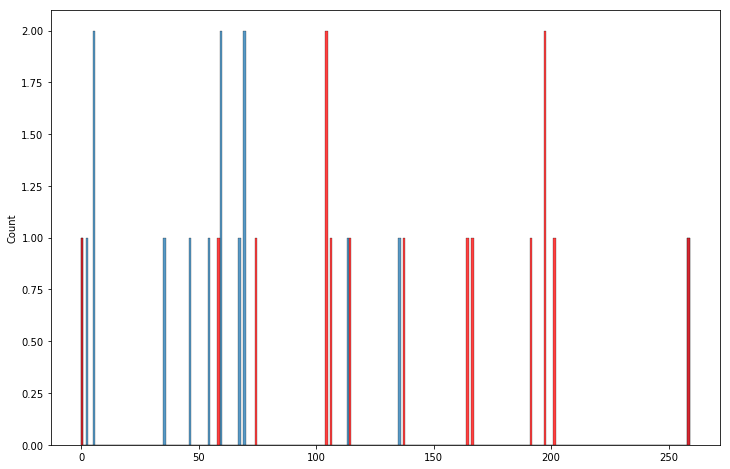

Spectrum num=2322, size=483, matched=81, frac=0.16770186335403728


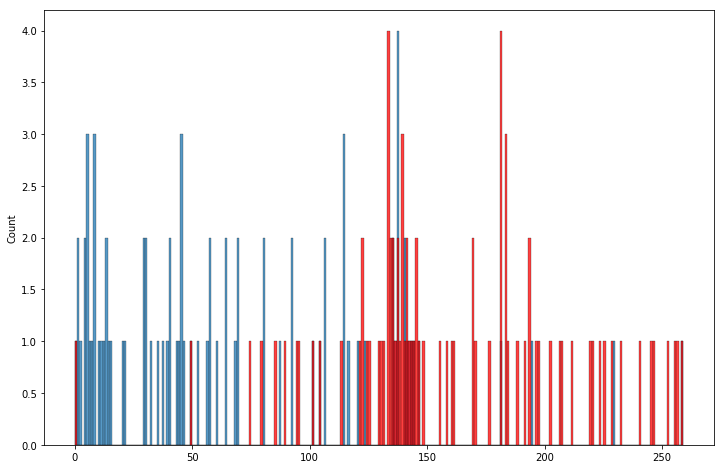

Spectrum num=2326, size=483, matched=86, frac=0.17805383022774326


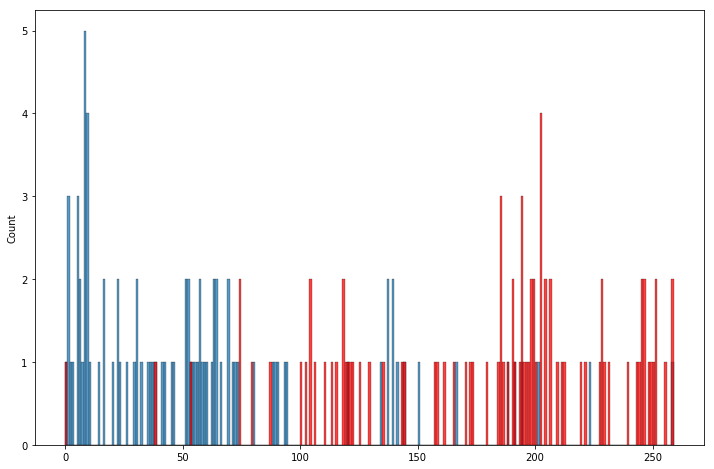

Spectrum num=2327, size=483, matched=70, frac=0.14492753623188406


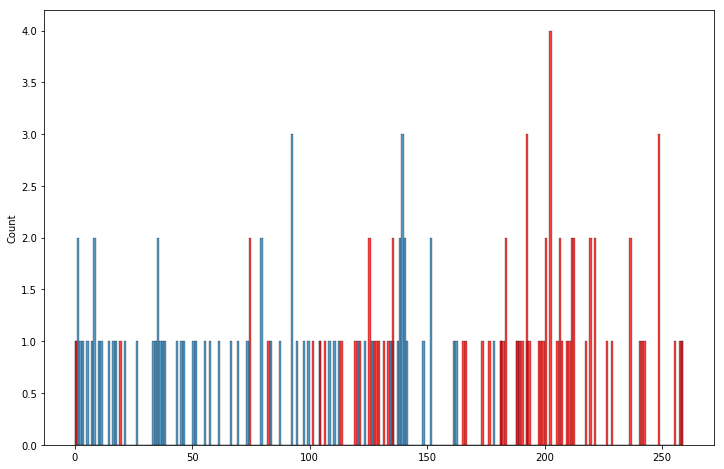

Spectrum num=2329, size=483, matched=83, frac=0.17184265010351968


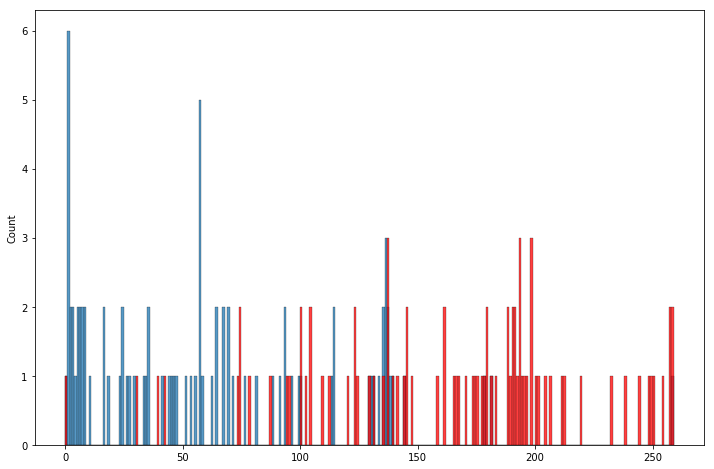

Spectrum num=2331, size=483, matched=90, frac=0.18633540372670807


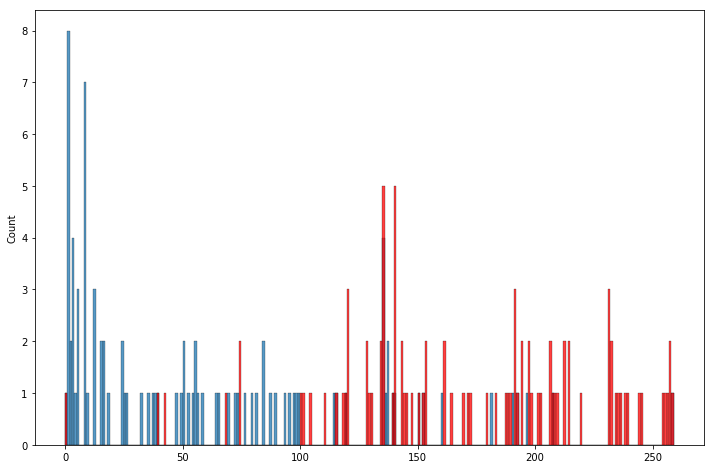

Spectrum num=2332, size=483, matched=79, frac=0.16356107660455488


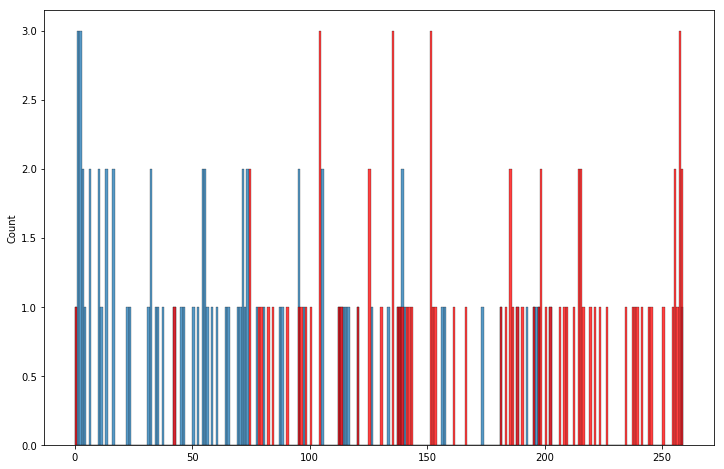

Spectrum num=2340, size=483, matched=85, frac=0.17598343685300208


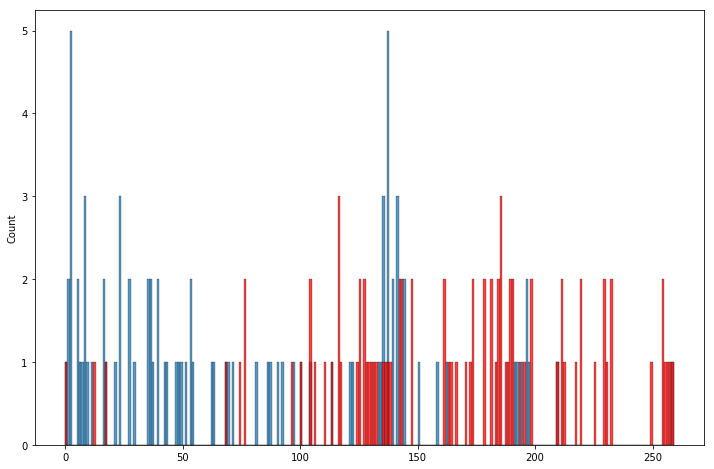

Spectrum num=2345, size=483, matched=81, frac=0.16770186335403728


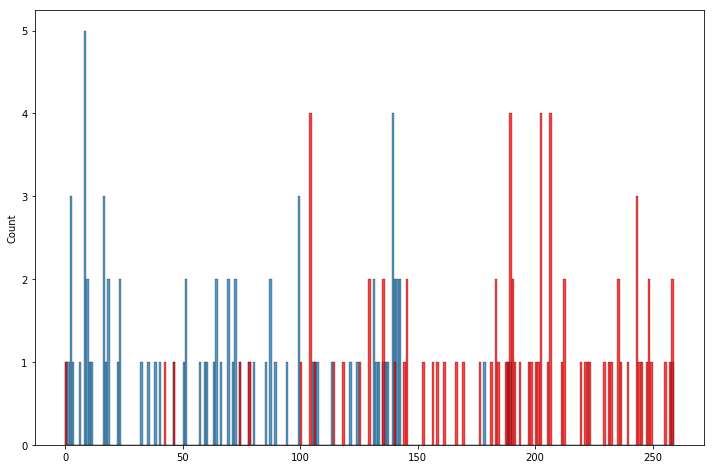

Spectrum num=2466, size=483, matched=97, frac=0.20082815734989648


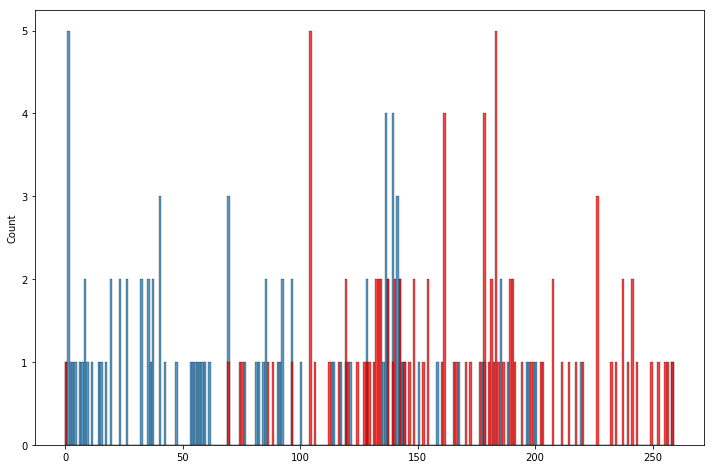

In [198]:
from random import randint


def filter_repeating_matches(matches):
    result = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            
            is_bad = False
            for match1 in matched:
                if (match1['item2'] == match['item2']) and (match1['item1'] != match['item1']):
                    is_bad = True
                    break
            if not is_bad:
                result.append(match)
        else:
            result.append(match)
    return result


nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 100]

all_l_pos = []
all_r_pos = []

# for _ in range(10):
#     num = nums[randint(0, len(nums) - 1)]

ions = get_ions(sequence,
                prefix=False,
                suffix=False,
                middle=True,
                min_length=10,
                include_loose_molecules=True,
                max_deconv_err=0
               )

for num in nums_to_check:
    item = get_msalign_spec(num)

    matched = match_items(ions, 'mass_0', item['m_array'], None, err=5)
    matched = filter_repeating_matches(matched)
#     if len(matched) / len(item["m_array"]) < 0.05:
#         continue
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    l_pos = []
    r_pos = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            l_pos.append(l)
            r_pos.append(r)
        
    all_l_pos.extend(l_pos)
    all_r_pos.extend(r_pos)
          
    plt.figure(figsize=(12, 8))
    sns.histplot(l_pos + [0, len(sequence)], bins=len(sequence))
    sns.histplot(r_pos + [0, len(sequence)], bins=len(sequence), color='r')
    plt.show()

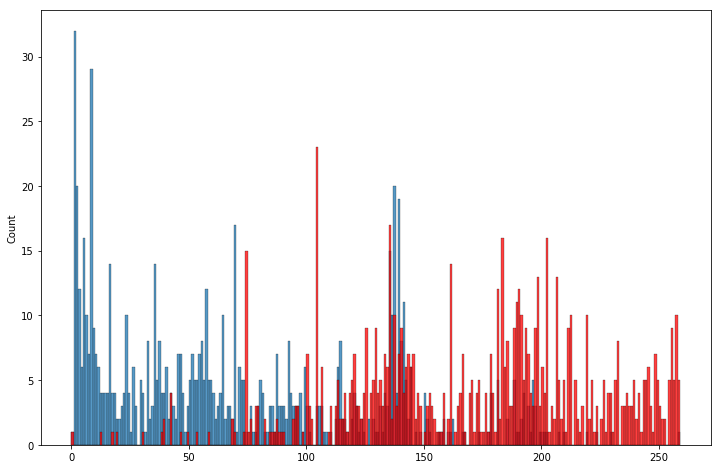

In [199]:
plt.figure(figsize=(12, 8))
sns.histplot(all_l_pos + [0, len(sequence)], bins=len(sequence))
sns.histplot(all_r_pos + [0, len(sequence)], bins=len(sequence), color='r')
plt.show()

Spectrum num=794, size=82, matched=26, frac=0.3170731707317073


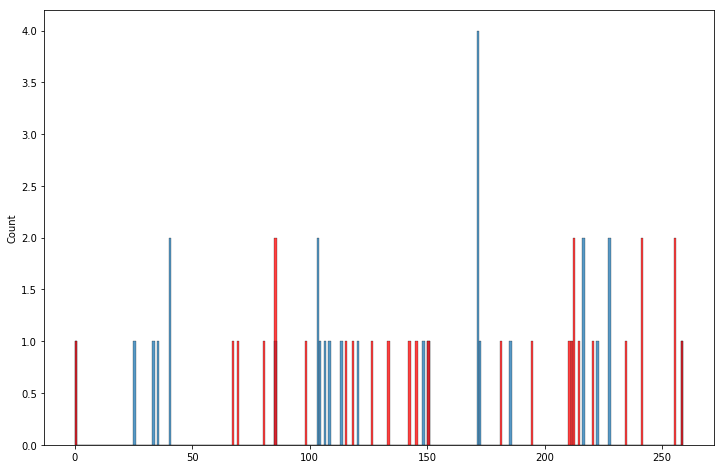

Spectrum num=796, size=62, matched=8, frac=0.12903225806451613


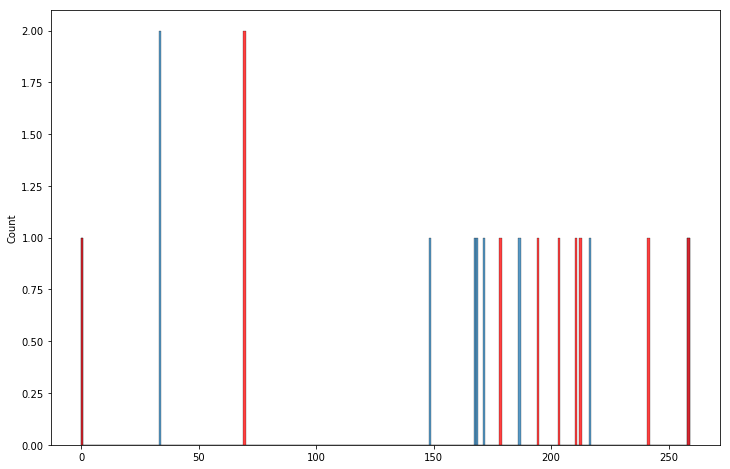

Spectrum num=797, size=82, matched=18, frac=0.21951219512195122


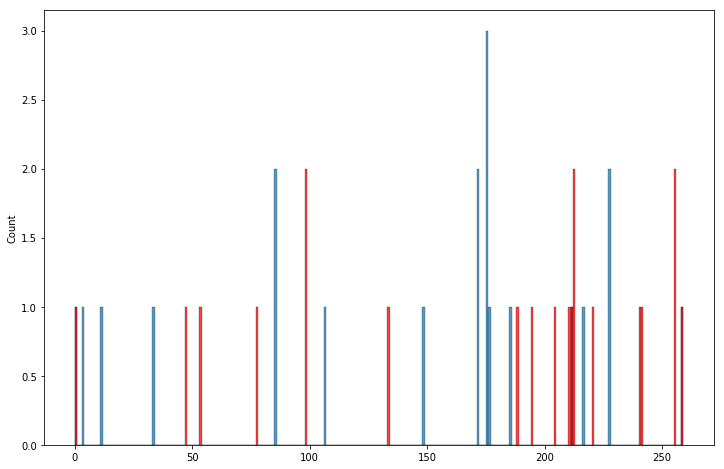

Spectrum num=821, size=64, matched=8, frac=0.125


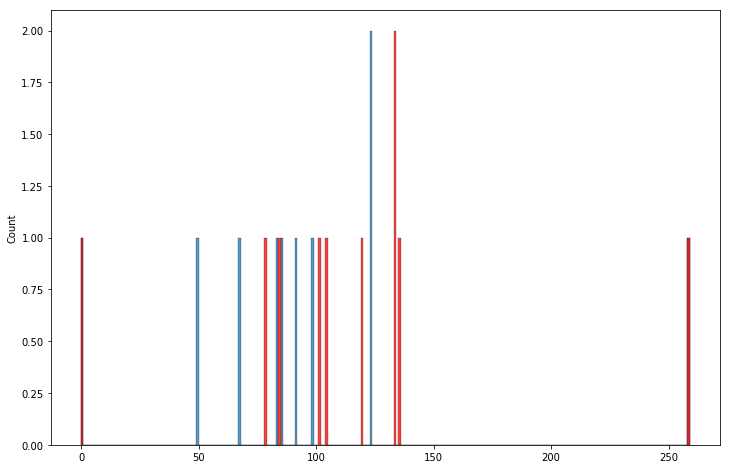

Spectrum num=823, size=68, matched=12, frac=0.17647058823529413


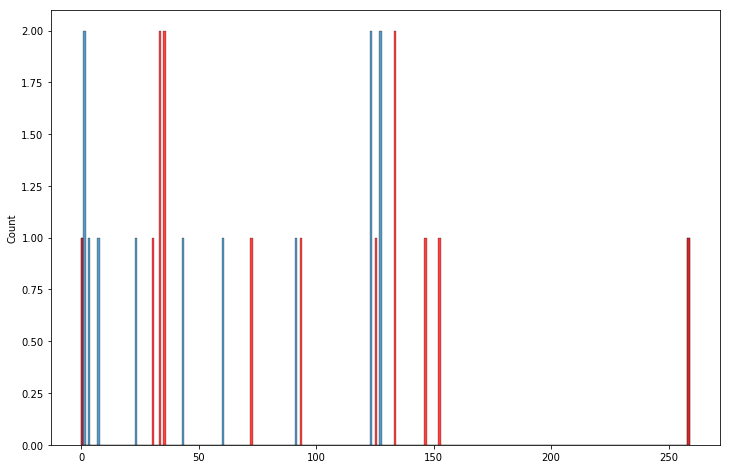

Spectrum num=839, size=69, matched=11, frac=0.15942028985507245


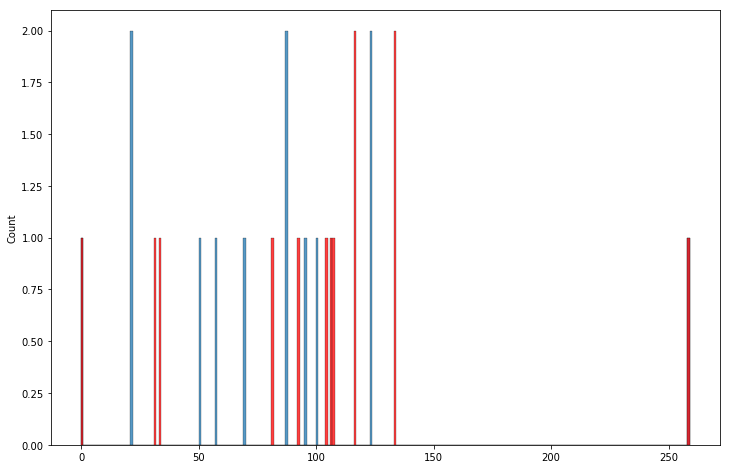

Spectrum num=875, size=69, matched=11, frac=0.15942028985507245


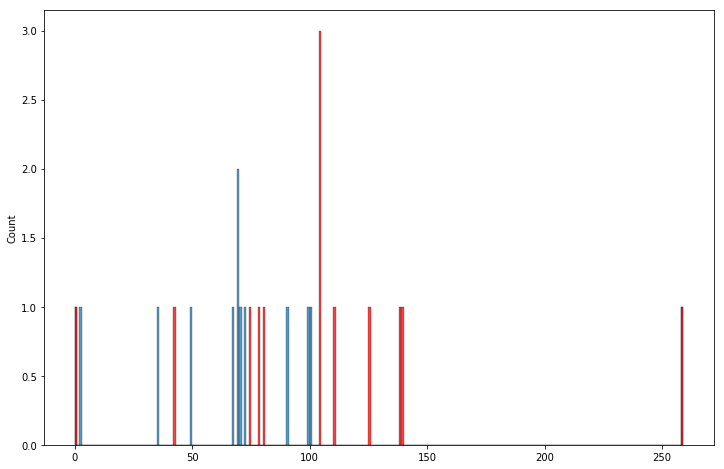

Spectrum num=879, size=77, matched=9, frac=0.11688311688311688


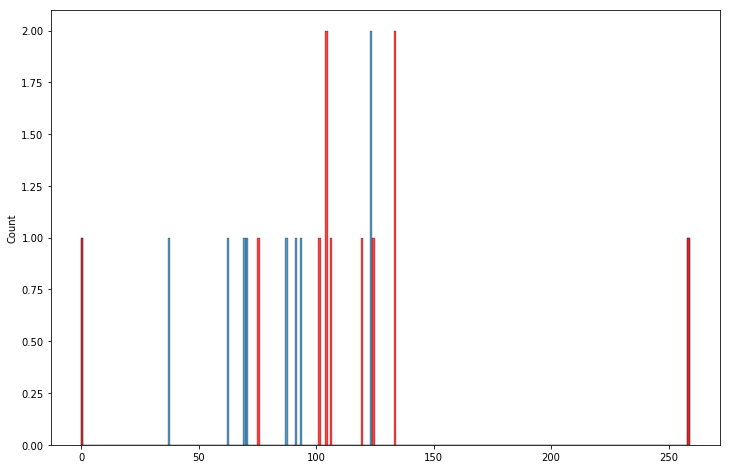

Spectrum num=911, size=63, matched=25, frac=0.3968253968253968


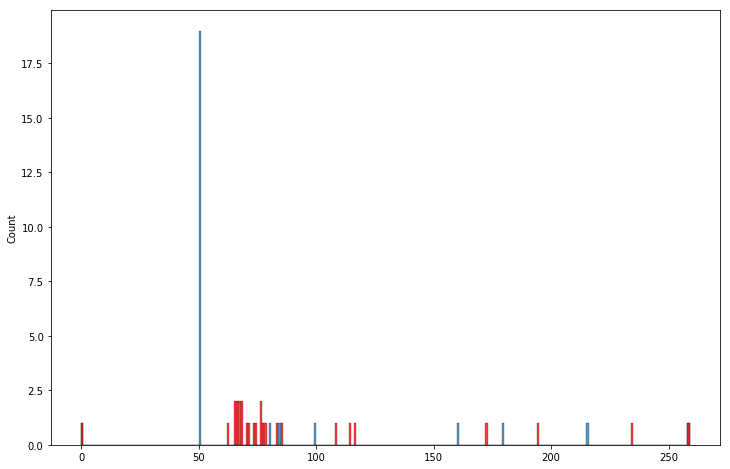

Spectrum num=915, size=63, matched=24, frac=0.38095238095238093


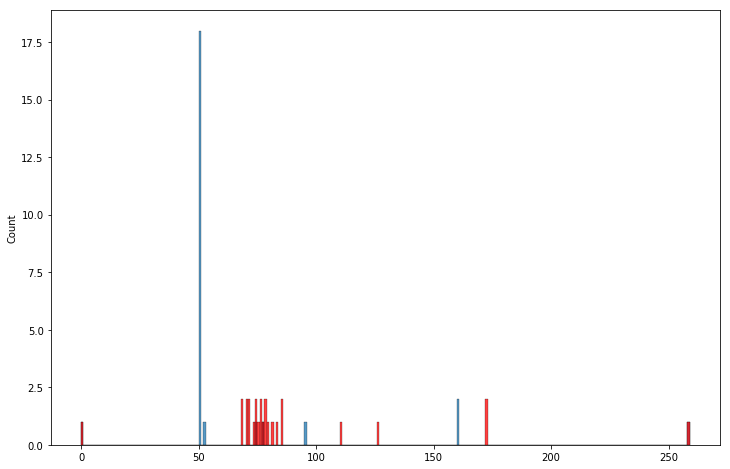

Spectrum num=943, size=65, matched=17, frac=0.26153846153846155


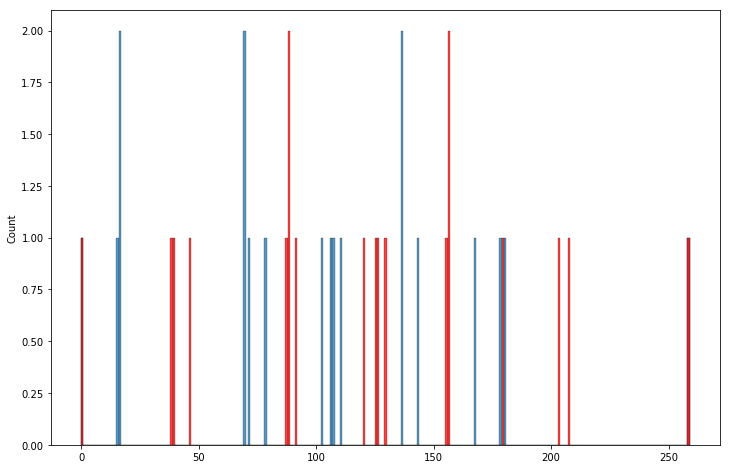

Spectrum num=948, size=53, matched=21, frac=0.39622641509433965


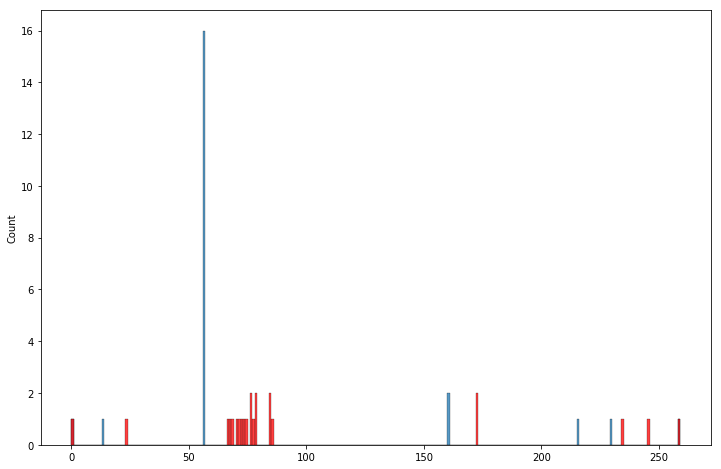

Spectrum num=995, size=50, matched=12, frac=0.24


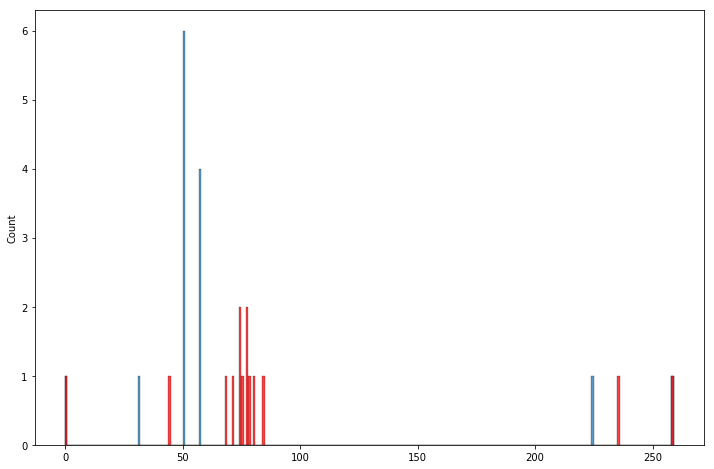

Spectrum num=1066, size=71, matched=23, frac=0.323943661971831


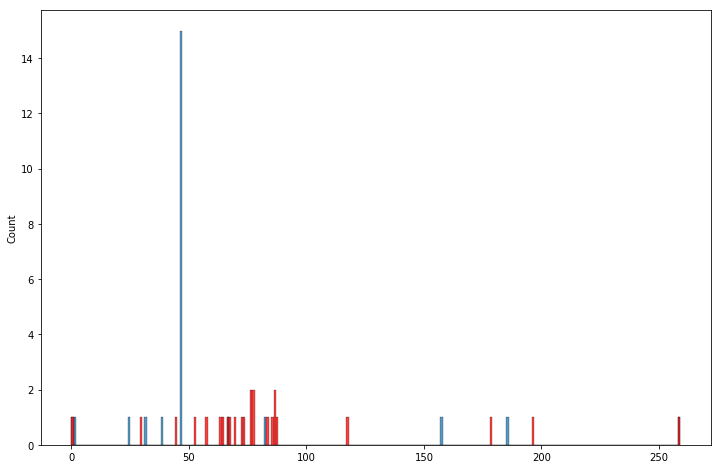

Spectrum num=1074, size=75, matched=18, frac=0.24


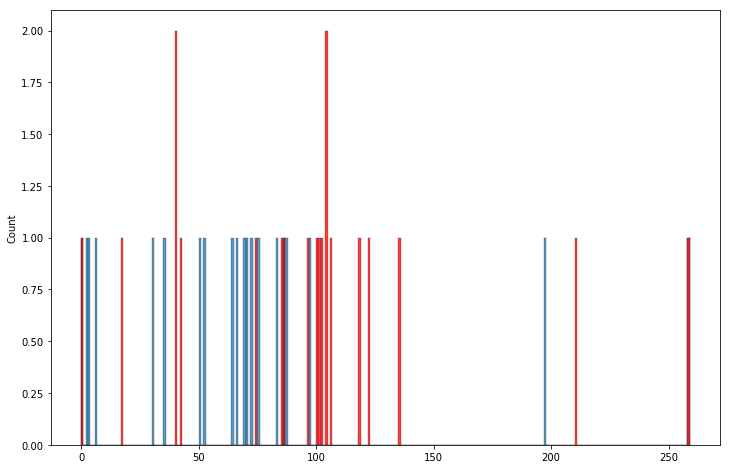

Spectrum num=1076, size=88, matched=13, frac=0.14772727272727273


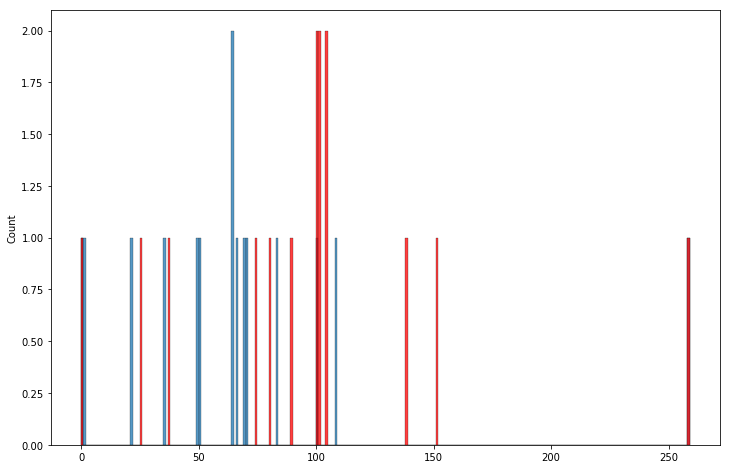

Spectrum num=1078, size=55, matched=21, frac=0.38181818181818183


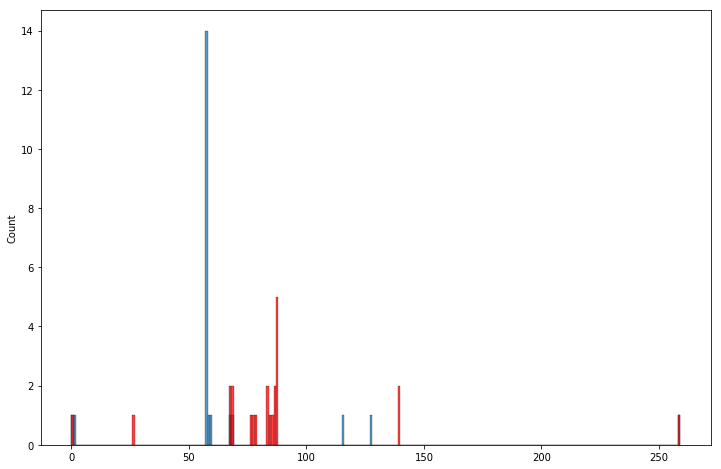

Spectrum num=1103, size=87, matched=18, frac=0.20689655172413793


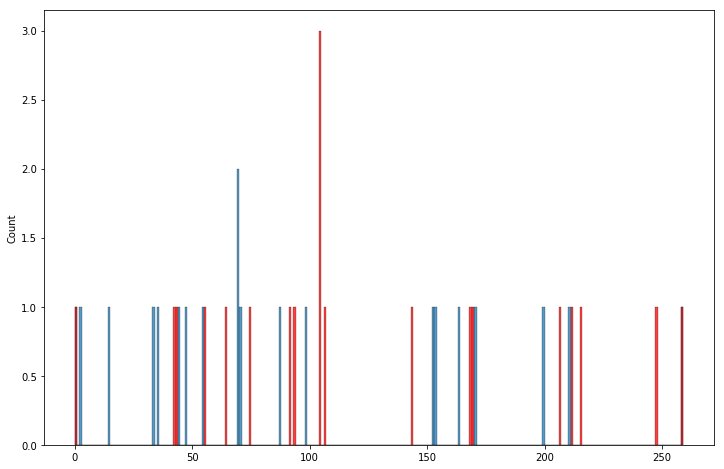

Spectrum num=1183, size=54, matched=21, frac=0.3888888888888889


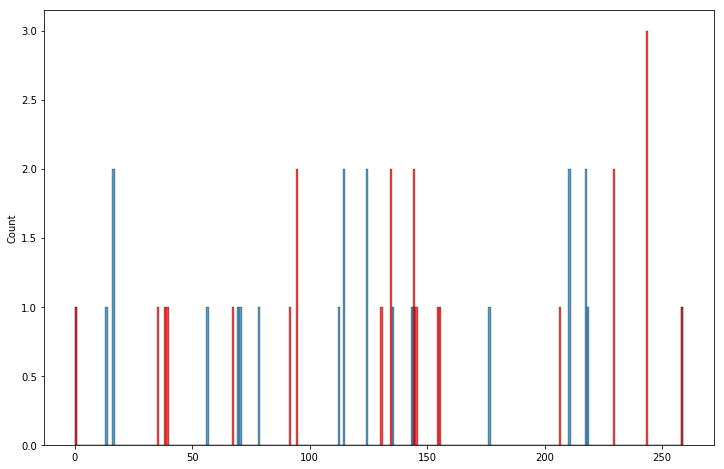

Spectrum num=1193, size=64, matched=2, frac=0.03125


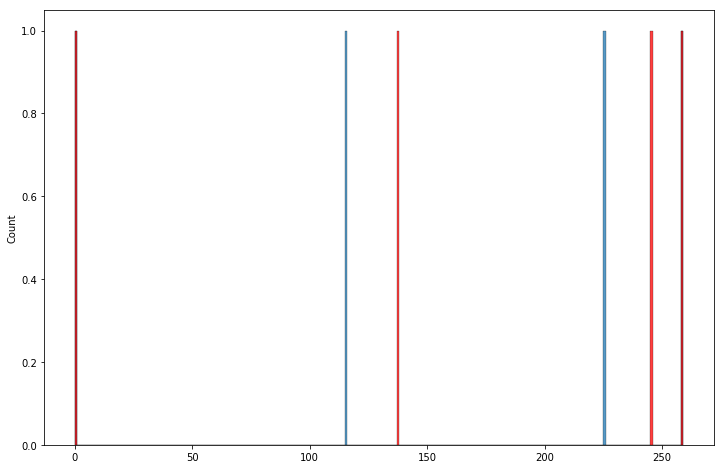

Spectrum num=1220, size=69, matched=14, frac=0.2028985507246377


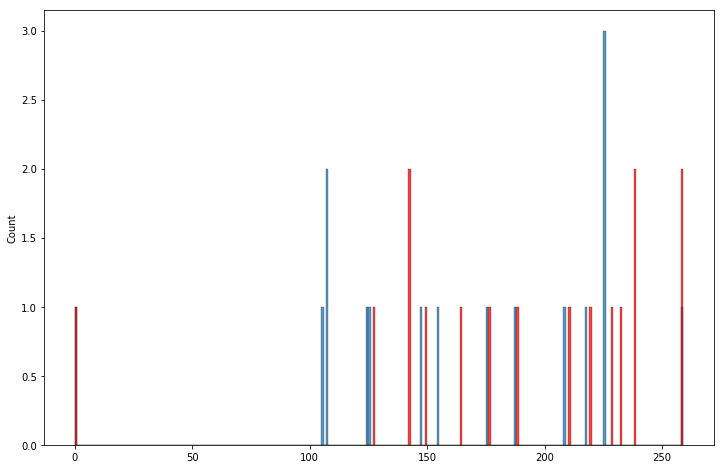

Spectrum num=1231, size=124, matched=19, frac=0.1532258064516129


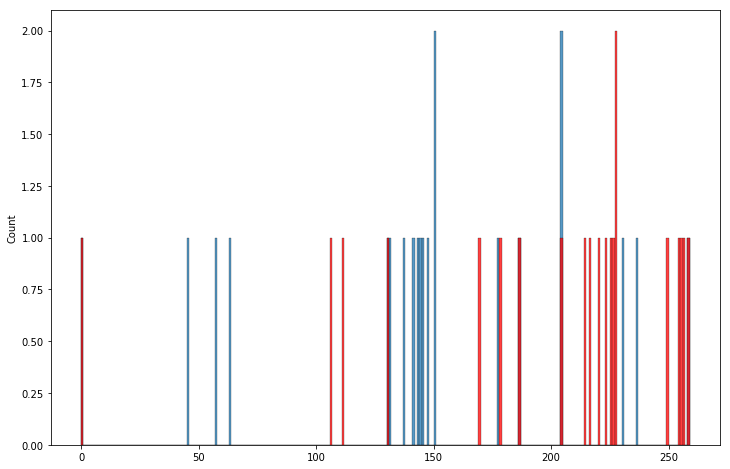

Spectrum num=1275, size=90, matched=13, frac=0.14444444444444443


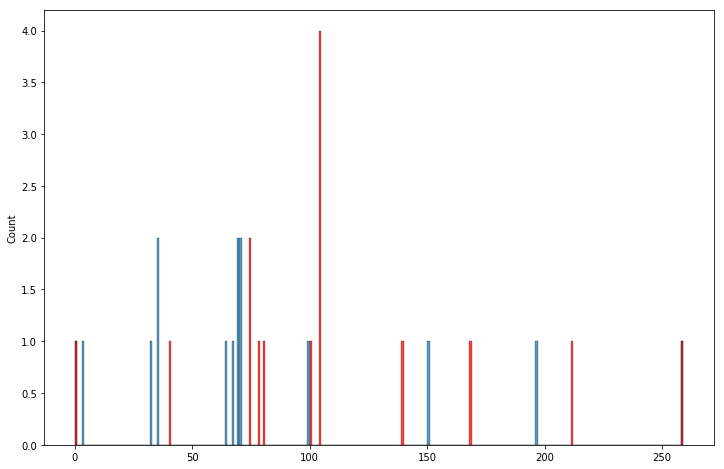

Spectrum num=1288, size=150, matched=40, frac=0.26666666666666666


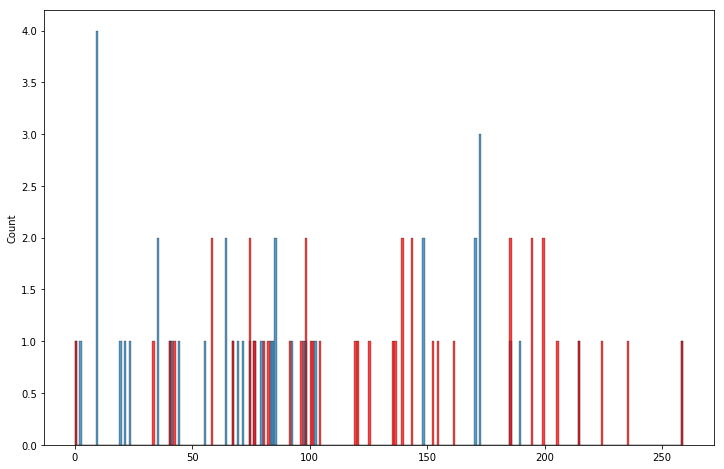

Spectrum num=1293, size=145, matched=38, frac=0.2620689655172414


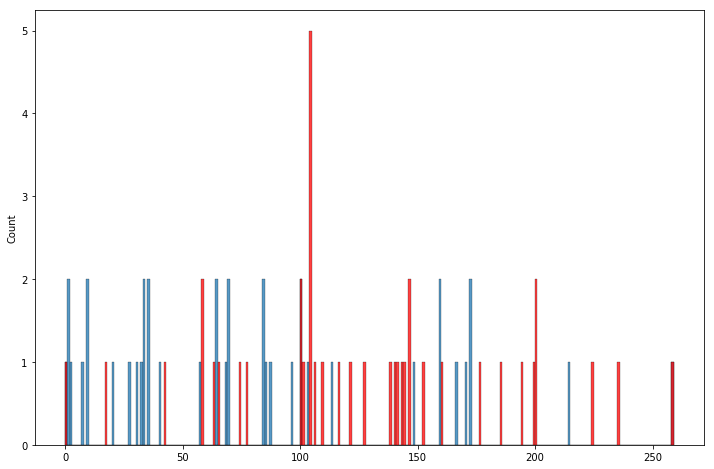

Spectrum num=1294, size=126, matched=32, frac=0.25396825396825395


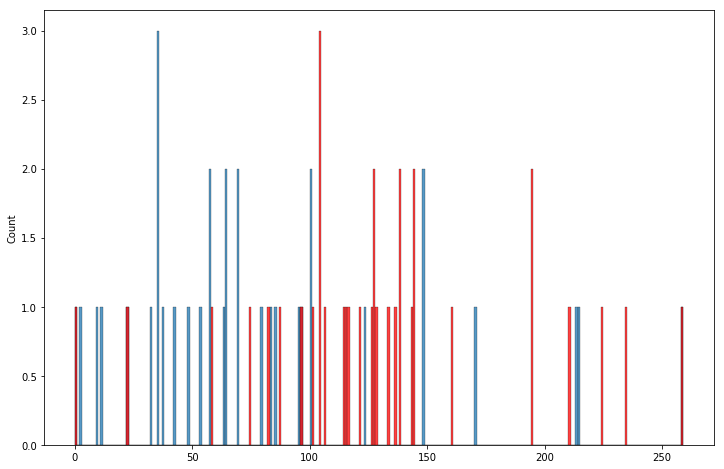

Spectrum num=1300, size=53, matched=11, frac=0.20754716981132076


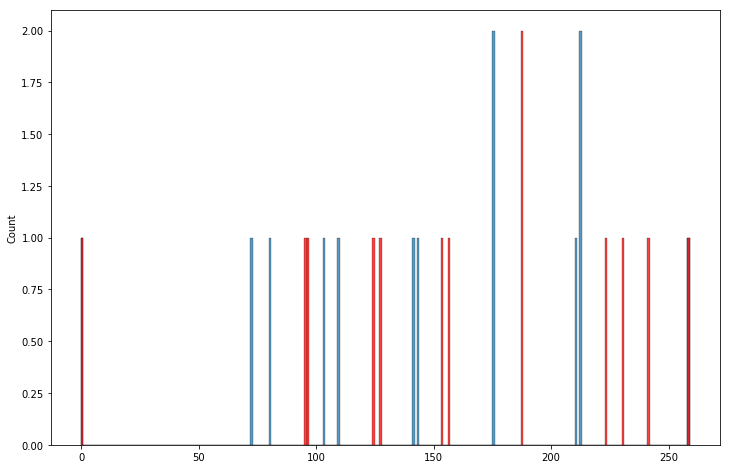

Spectrum num=1319, size=107, matched=24, frac=0.22429906542056074


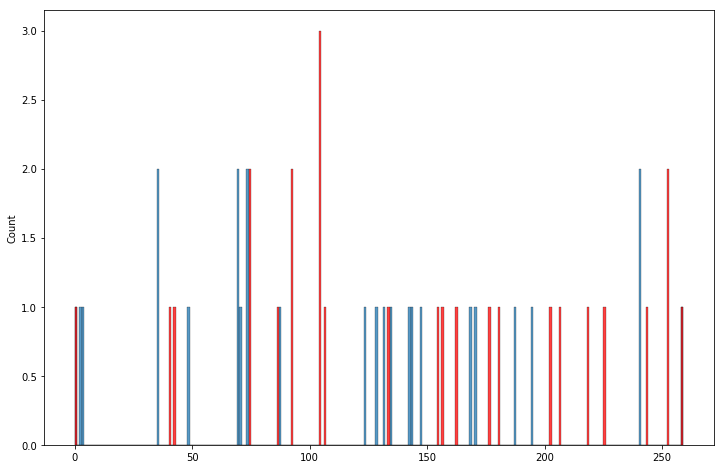

Spectrum num=1327, size=94, matched=16, frac=0.1702127659574468


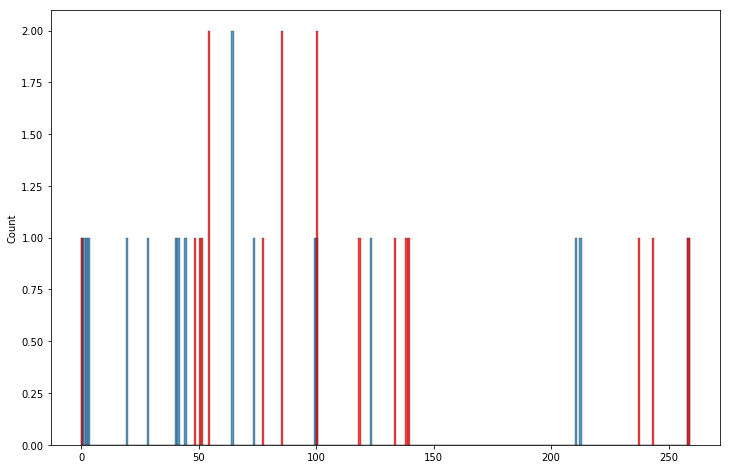

Spectrum num=1344, size=63, matched=11, frac=0.1746031746031746


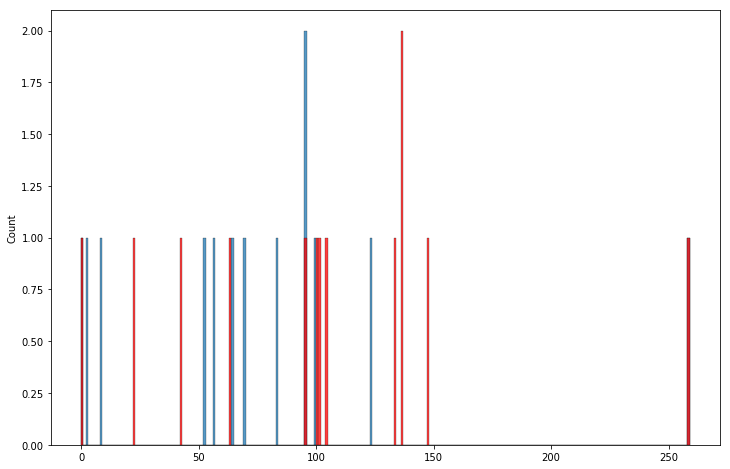

Spectrum num=1357, size=162, matched=28, frac=0.1728395061728395


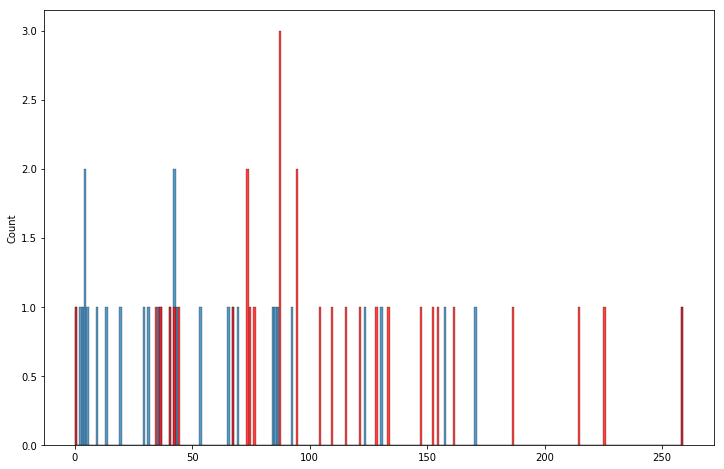

Spectrum num=1415, size=52, matched=9, frac=0.17307692307692307


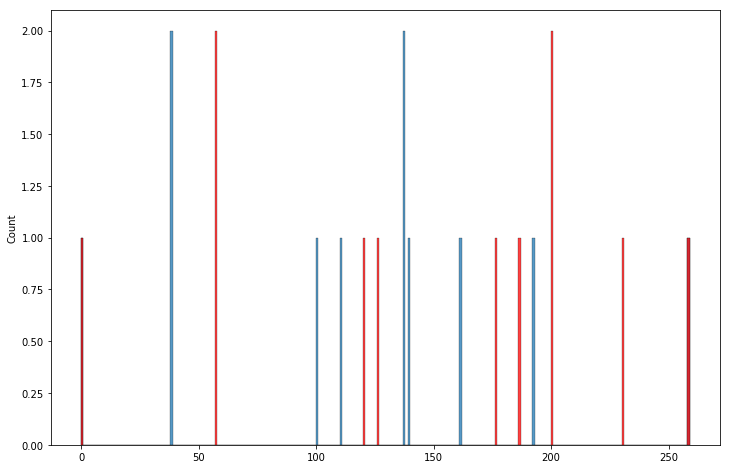

Spectrum num=1437, size=57, matched=13, frac=0.22807017543859648


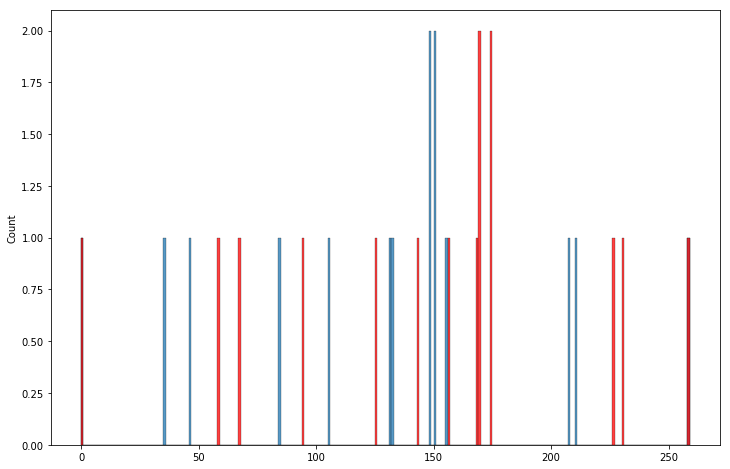

Spectrum num=1443, size=184, matched=53, frac=0.28804347826086957


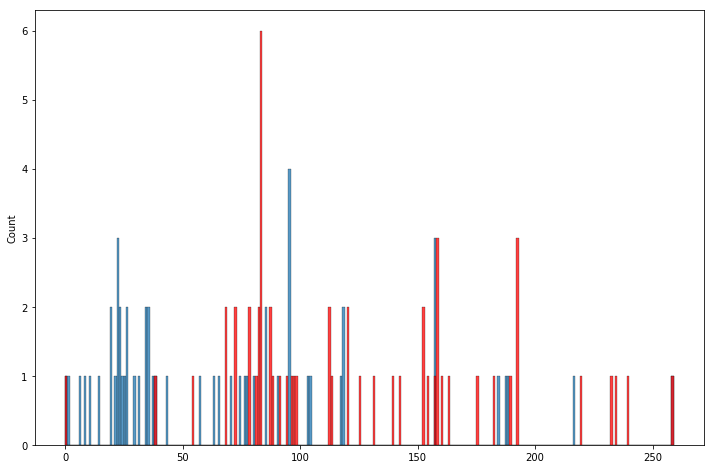

Spectrum num=1446, size=91, matched=14, frac=0.15384615384615385


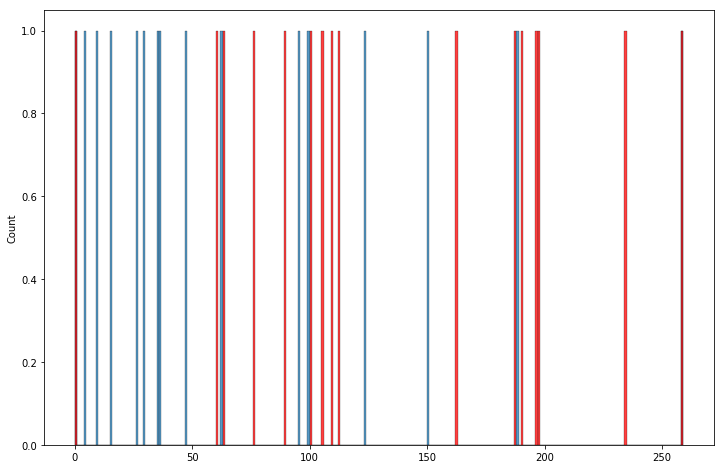

Spectrum num=1599, size=120, matched=35, frac=0.2916666666666667


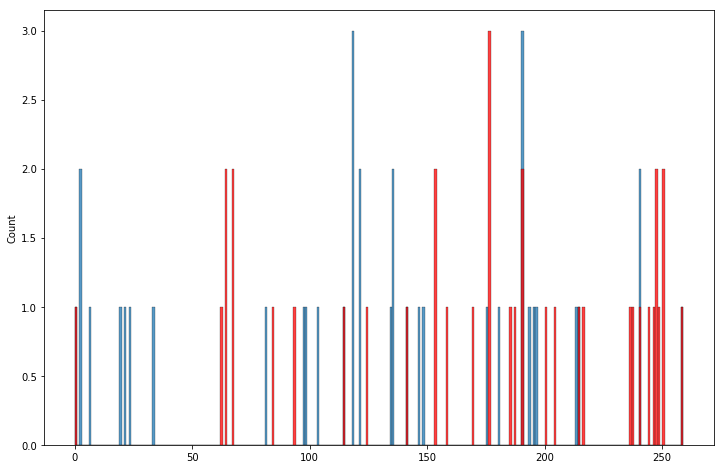

Spectrum num=1602, size=53, matched=11, frac=0.20754716981132076


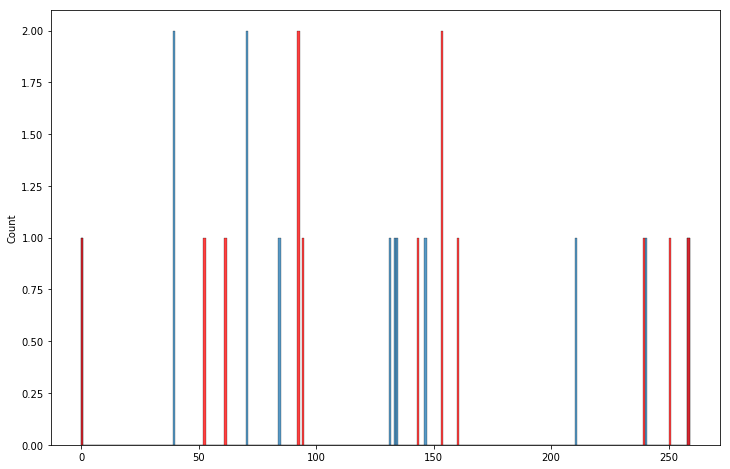

Spectrum num=1604, size=55, matched=9, frac=0.16363636363636364


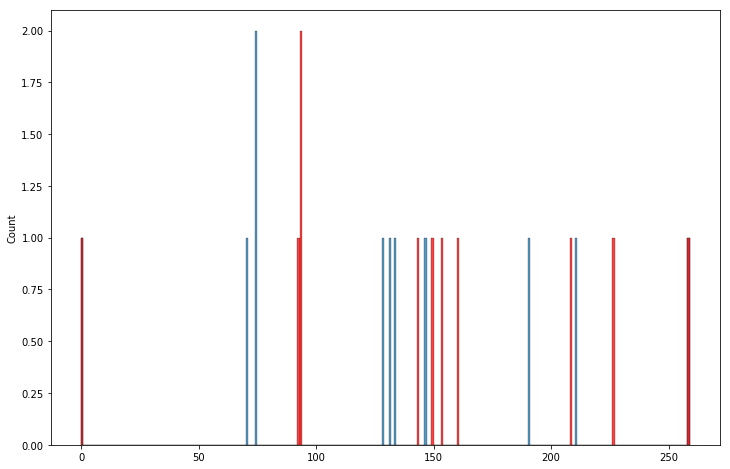

Spectrum num=1613, size=318, matched=75, frac=0.2358490566037736


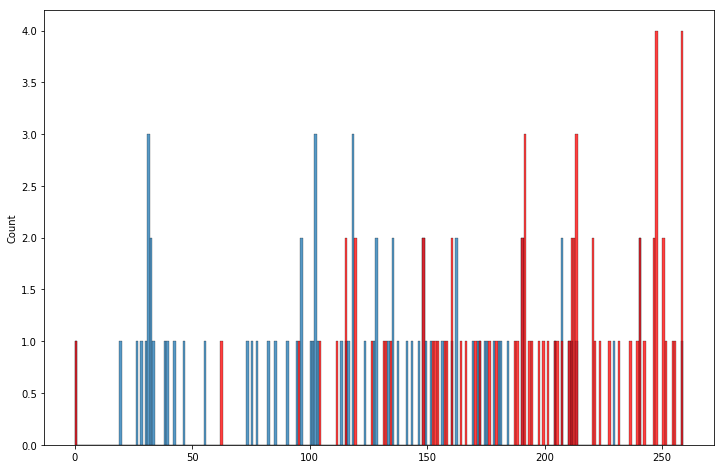

Spectrum num=1614, size=124, matched=25, frac=0.20161290322580644


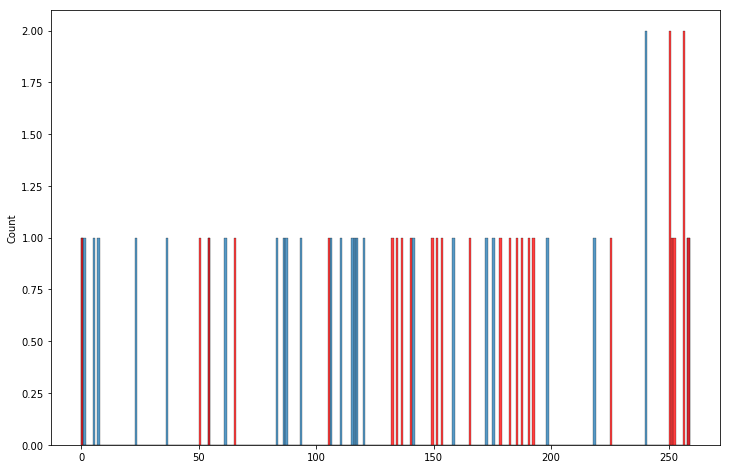

Spectrum num=1616, size=352, matched=84, frac=0.23863636363636365


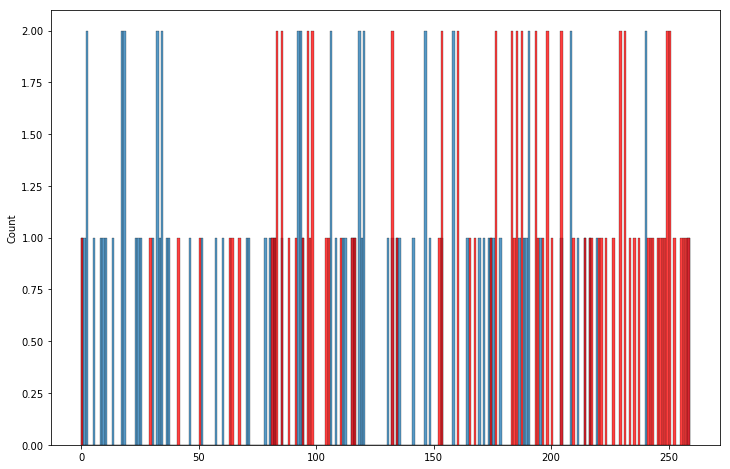

Spectrum num=1625, size=58, matched=11, frac=0.1896551724137931


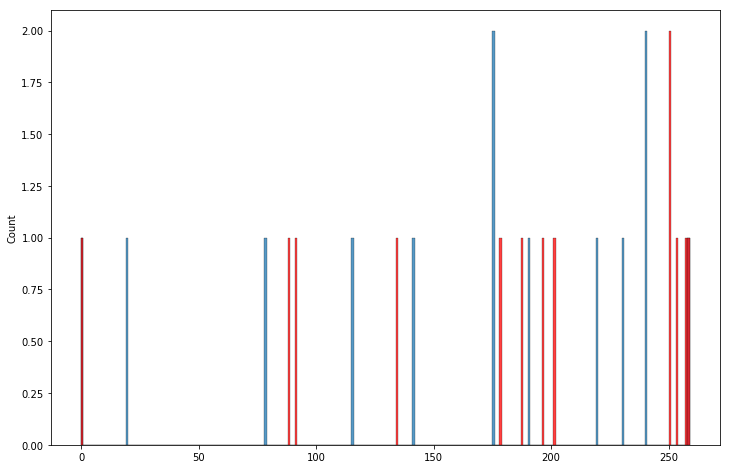

Spectrum num=1629, size=63, matched=12, frac=0.19047619047619047


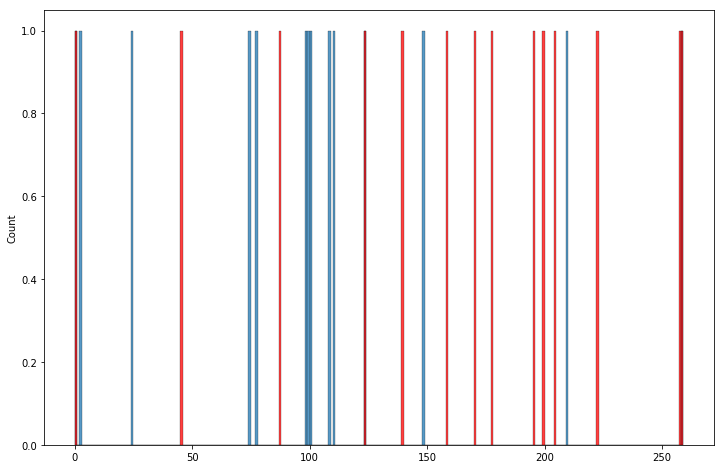

Spectrum num=1633, size=347, matched=90, frac=0.25936599423631124


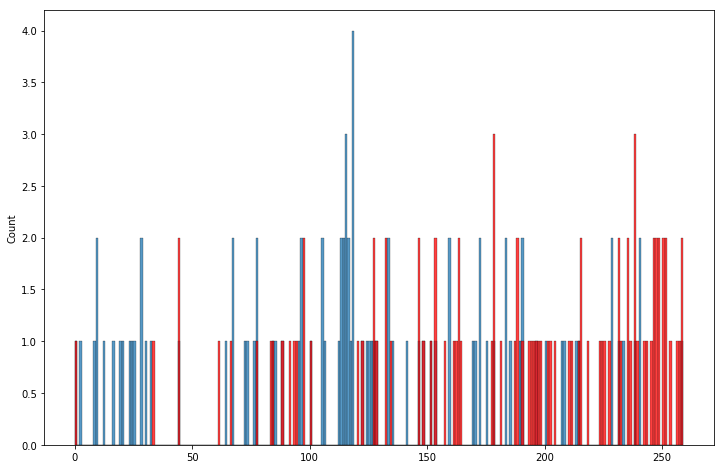

Spectrum num=1634, size=347, matched=90, frac=0.25936599423631124


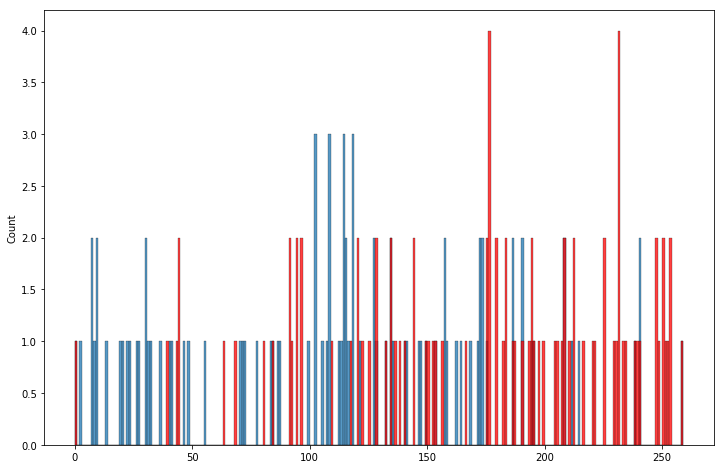

Spectrum num=1647, size=297, matched=77, frac=0.25925925925925924


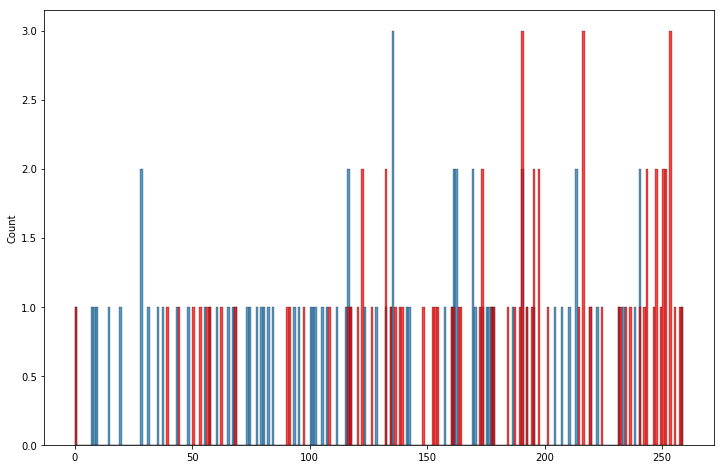

Spectrum num=1657, size=256, matched=53, frac=0.20703125


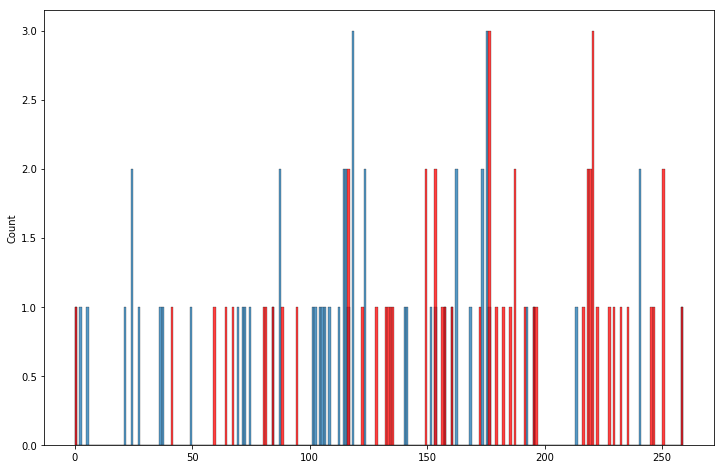

Spectrum num=1663, size=311, matched=58, frac=0.1864951768488746


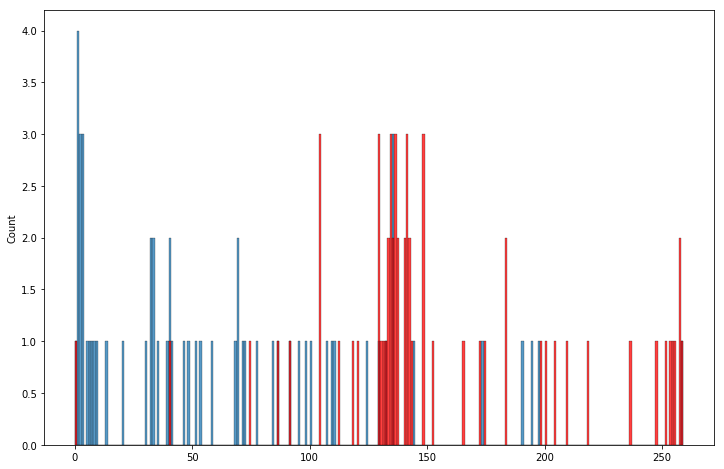

Spectrum num=1667, size=57, matched=13, frac=0.22807017543859648


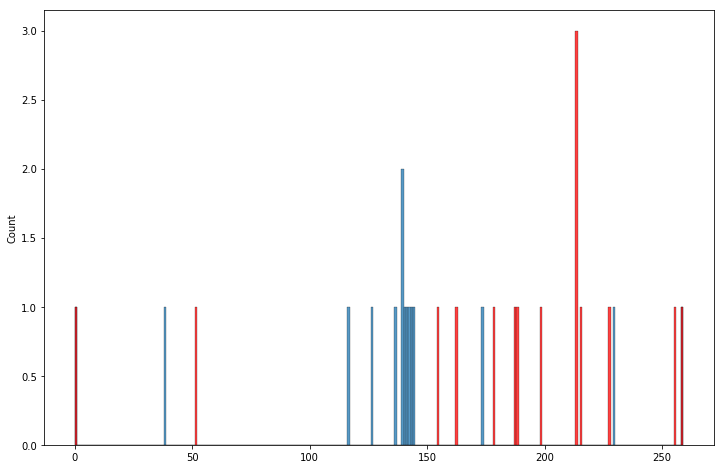

Spectrum num=1668, size=133, matched=28, frac=0.21052631578947367


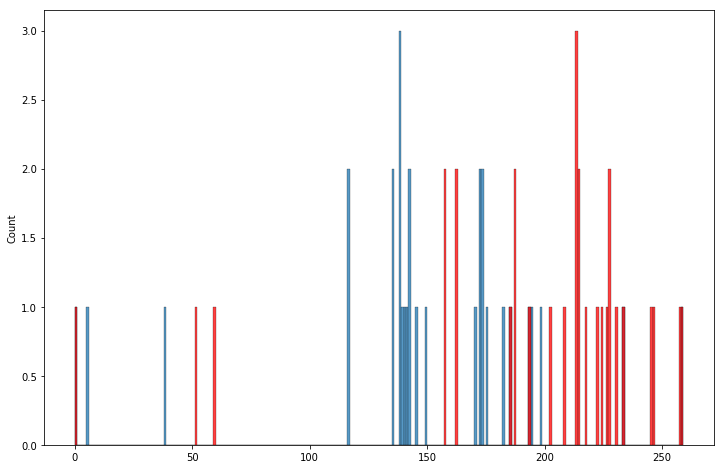

Spectrum num=1669, size=92, matched=18, frac=0.1956521739130435


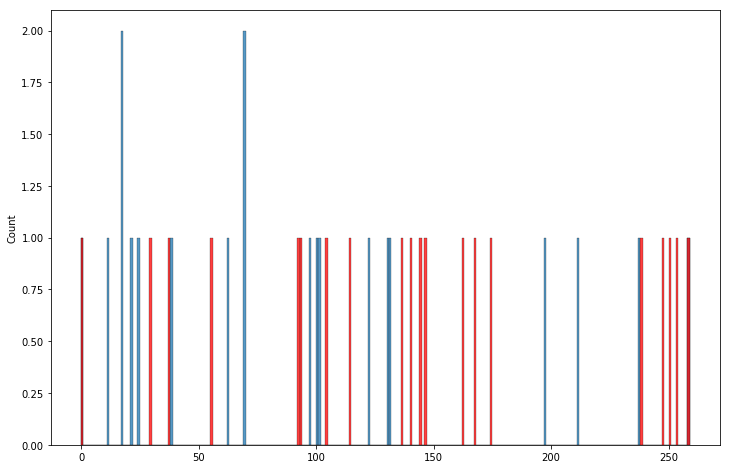

Spectrum num=1670, size=140, matched=25, frac=0.17857142857142858


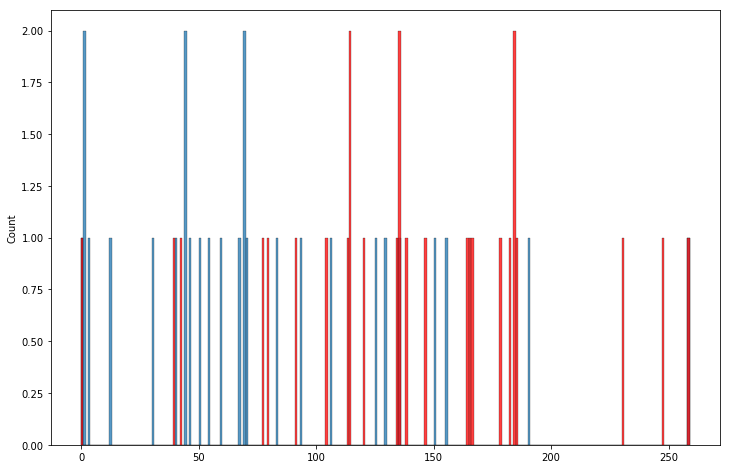

Spectrum num=1687, size=138, matched=32, frac=0.2318840579710145


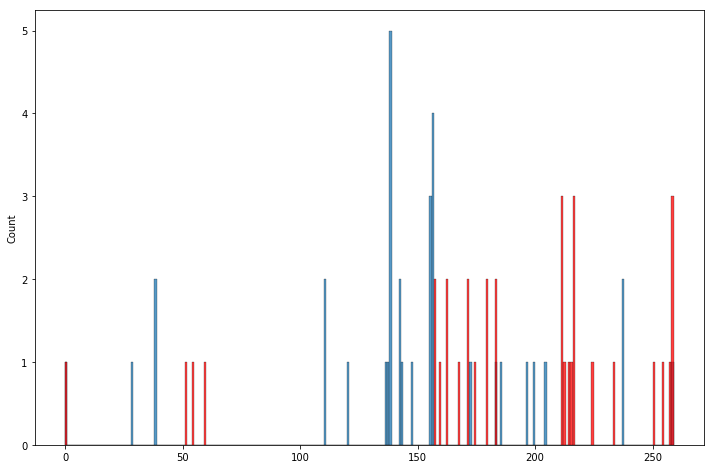

Spectrum num=1688, size=133, matched=28, frac=0.21052631578947367


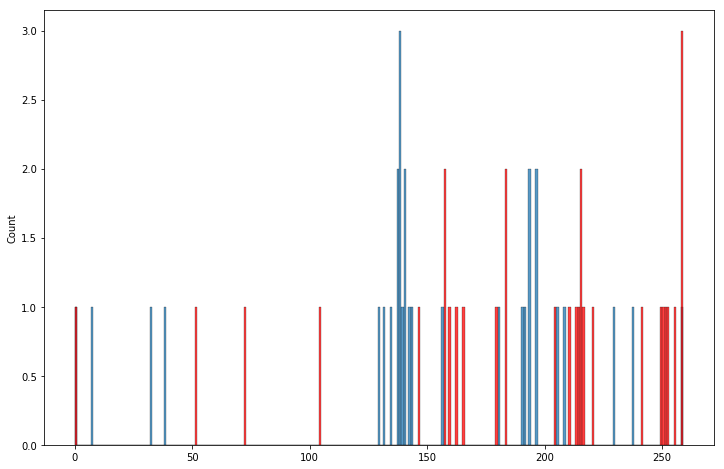

Spectrum num=1698, size=54, matched=9, frac=0.16666666666666666


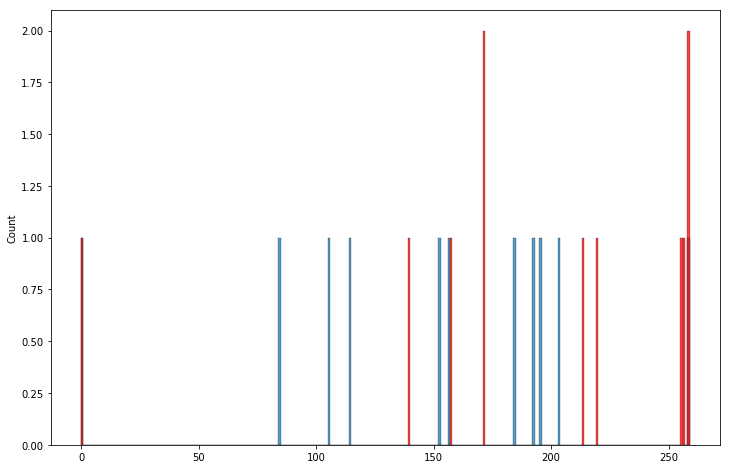

Spectrum num=1703, size=131, matched=20, frac=0.15267175572519084


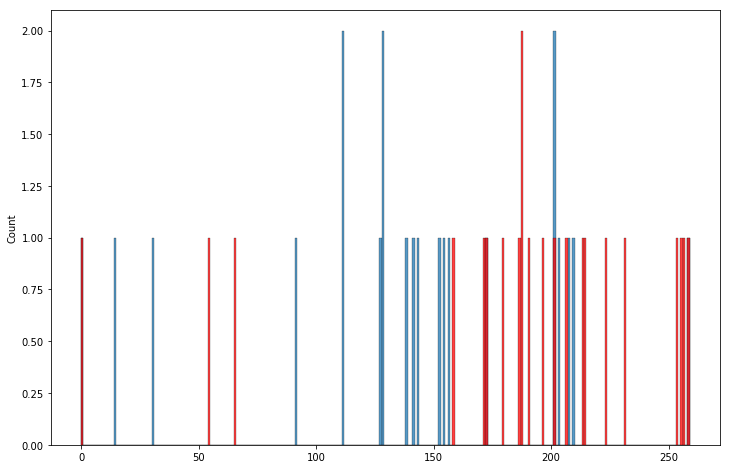

Spectrum num=1704, size=64, matched=8, frac=0.125


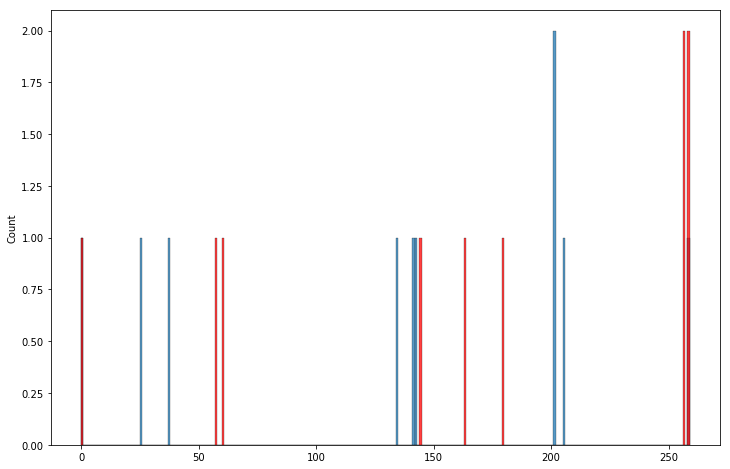

Spectrum num=1743, size=101, matched=16, frac=0.15841584158415842


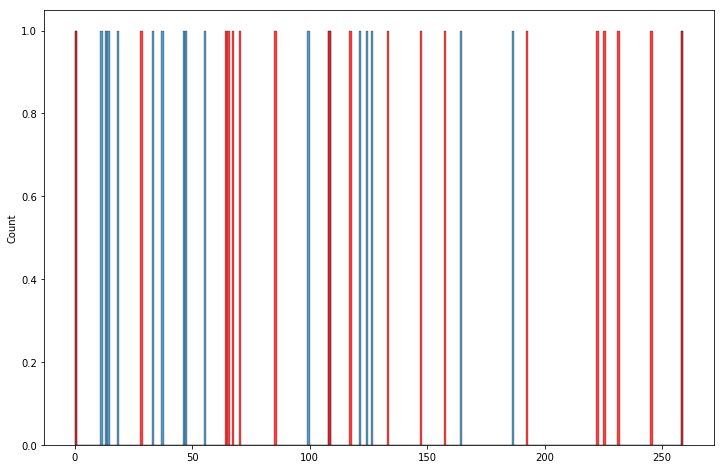

Spectrum num=1751, size=52, matched=13, frac=0.25


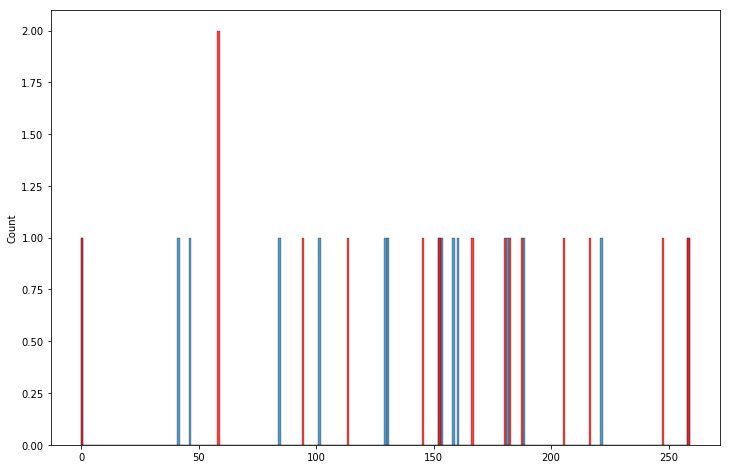

Spectrum num=1761, size=100, matched=18, frac=0.18


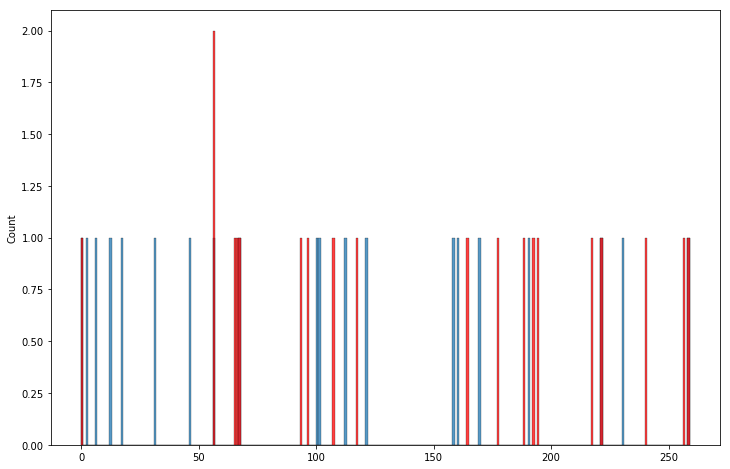

Spectrum num=1767, size=259, matched=37, frac=0.14285714285714285


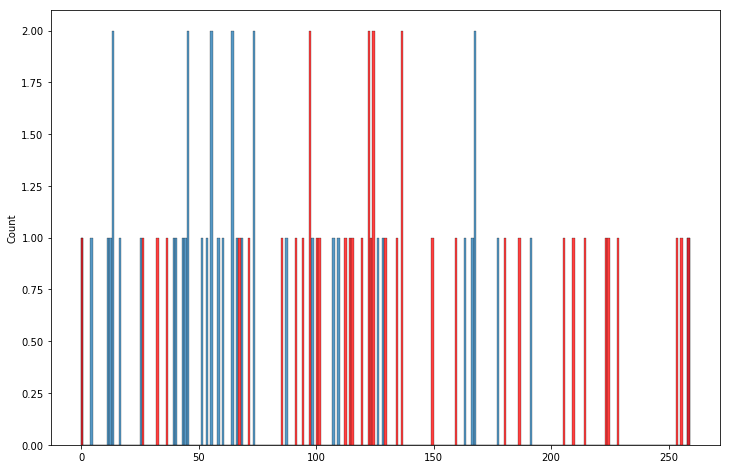

Spectrum num=1779, size=71, matched=16, frac=0.22535211267605634


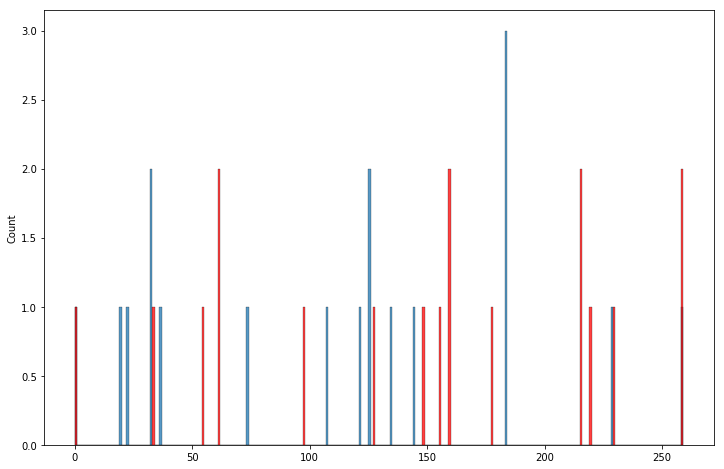

Spectrum num=1786, size=259, matched=63, frac=0.24324324324324326


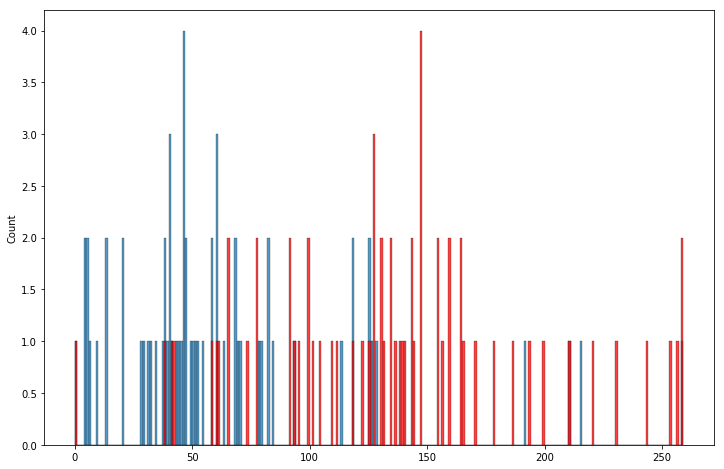

Spectrum num=1977, size=65, matched=9, frac=0.13846153846153847


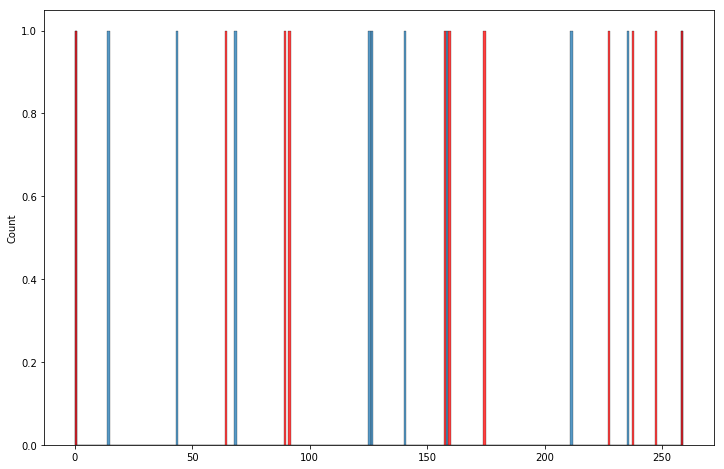

Spectrum num=2009, size=161, matched=20, frac=0.12422360248447205


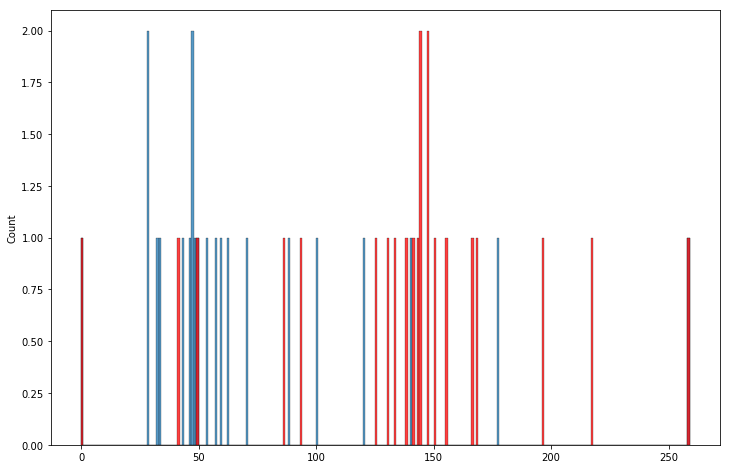

Spectrum num=2026, size=98, matched=9, frac=0.09183673469387756


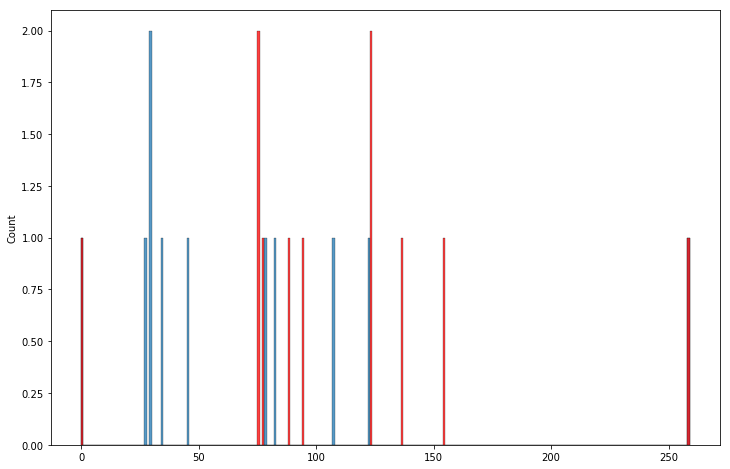

Spectrum num=2030, size=296, matched=76, frac=0.25675675675675674


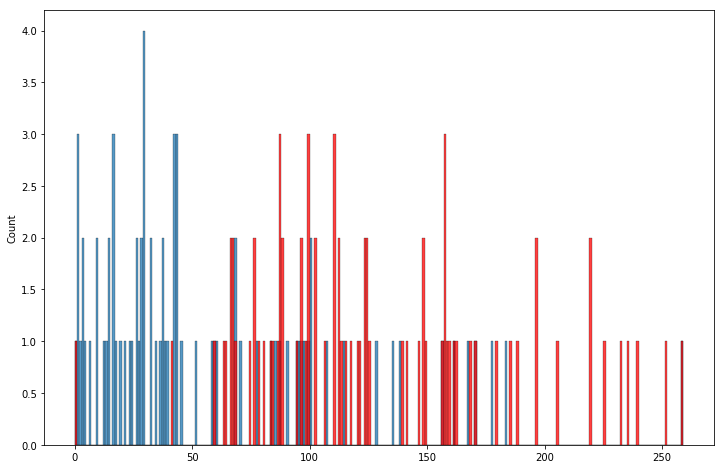

Spectrum num=2056, size=76, matched=17, frac=0.2236842105263158


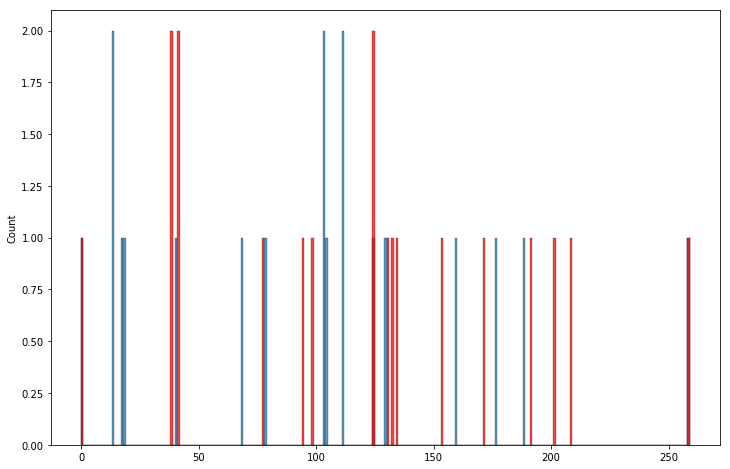

Spectrum num=2058, size=302, matched=59, frac=0.19536423841059603


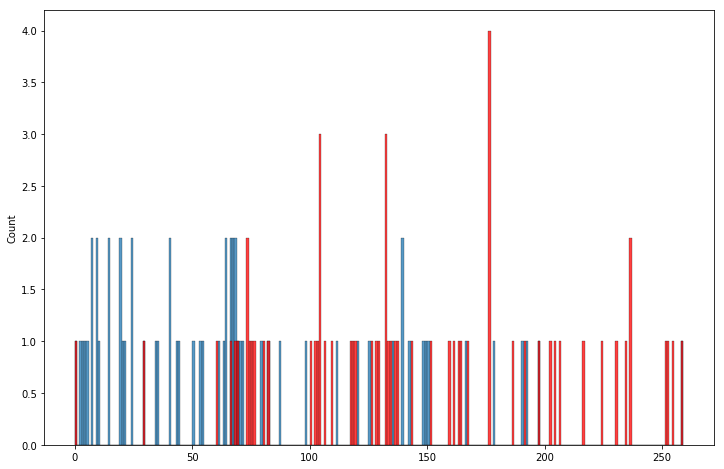

Spectrum num=2086, size=176, matched=32, frac=0.18181818181818182


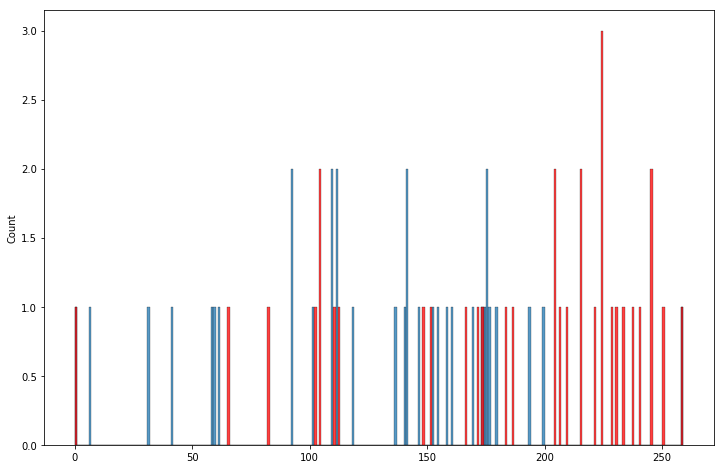

Spectrum num=2088, size=58, matched=6, frac=0.10344827586206896


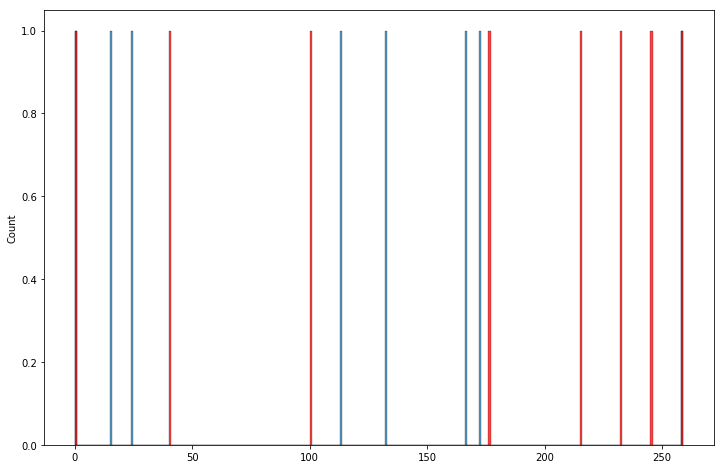

Spectrum num=2095, size=62, matched=9, frac=0.14516129032258066


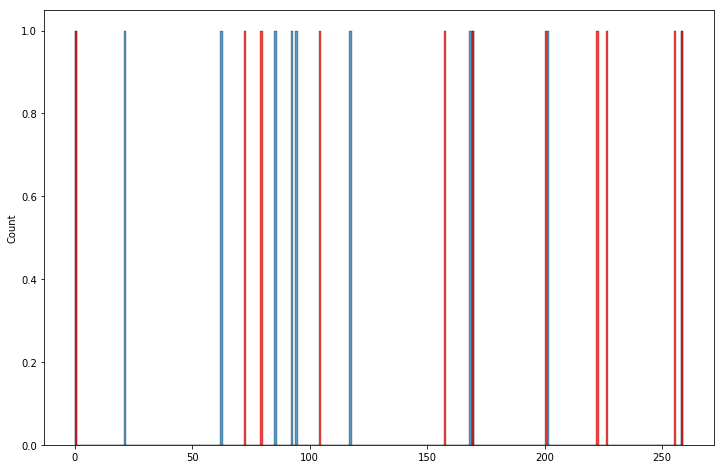

Spectrum num=2099, size=121, matched=32, frac=0.2644628099173554


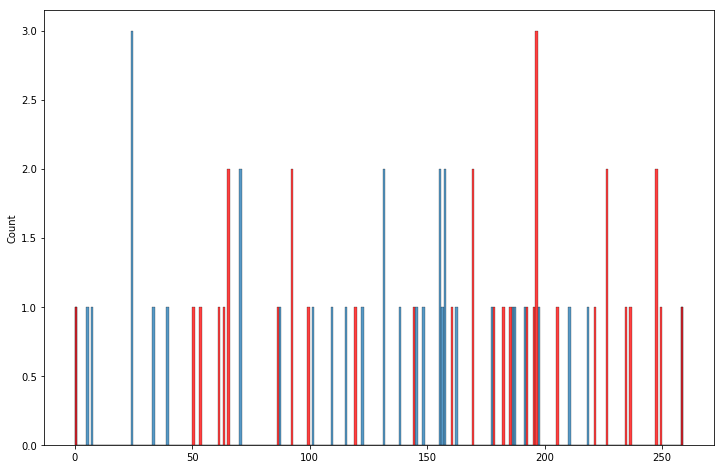

Spectrum num=2103, size=138, matched=19, frac=0.13768115942028986


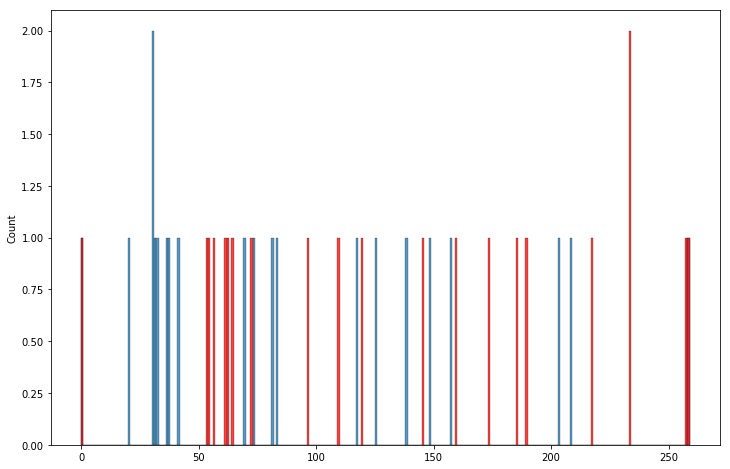

Spectrum num=2106, size=75, matched=19, frac=0.25333333333333335


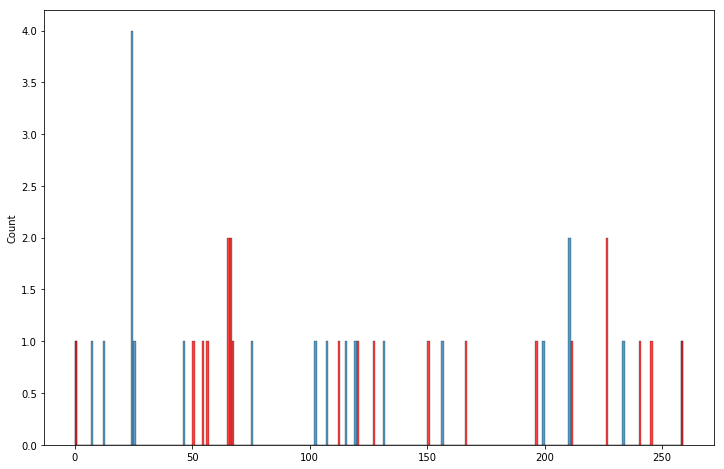

Spectrum num=2126, size=51, matched=8, frac=0.1568627450980392


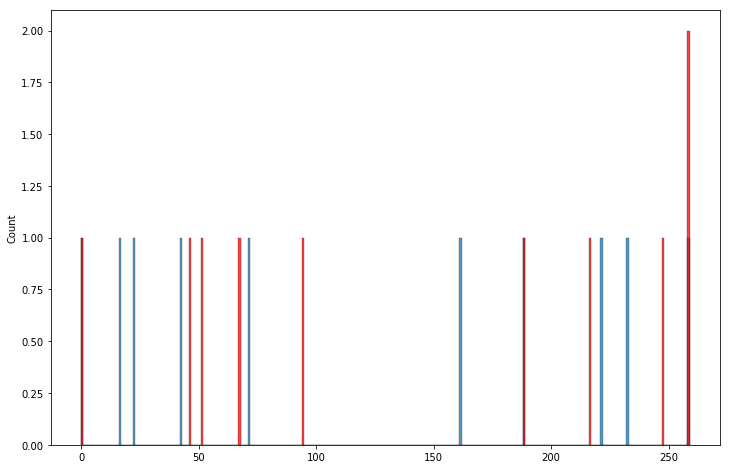

Spectrum num=2128, size=149, matched=24, frac=0.1610738255033557


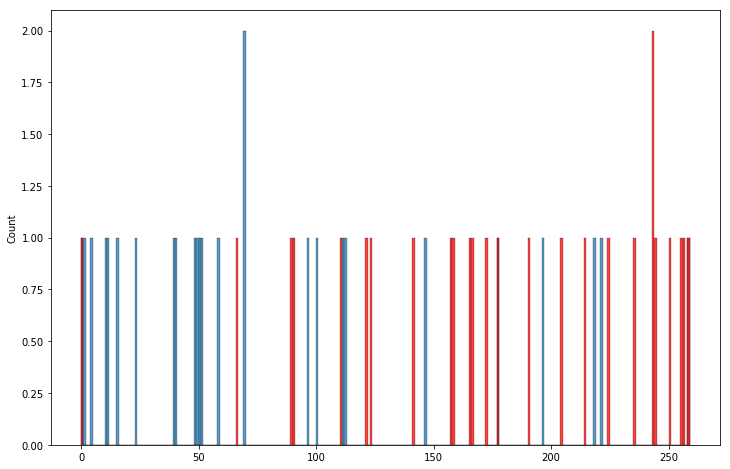

Spectrum num=2129, size=124, matched=25, frac=0.20161290322580644


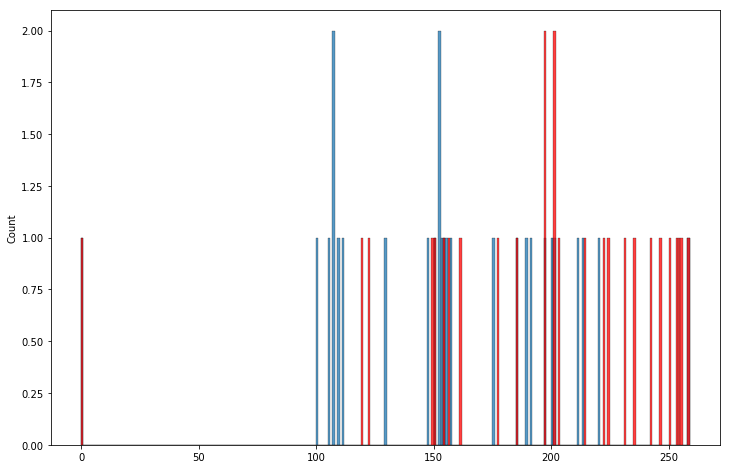

Spectrum num=2140, size=370, matched=68, frac=0.1837837837837838


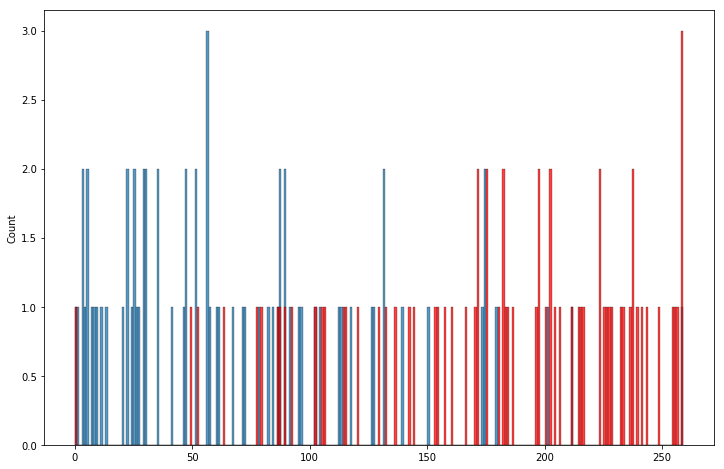

Spectrum num=2148, size=60, matched=10, frac=0.16666666666666666


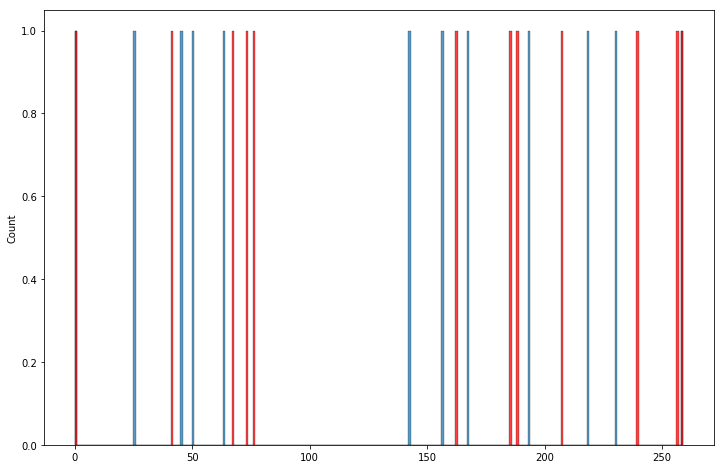

Spectrum num=2153, size=78, matched=13, frac=0.16666666666666666


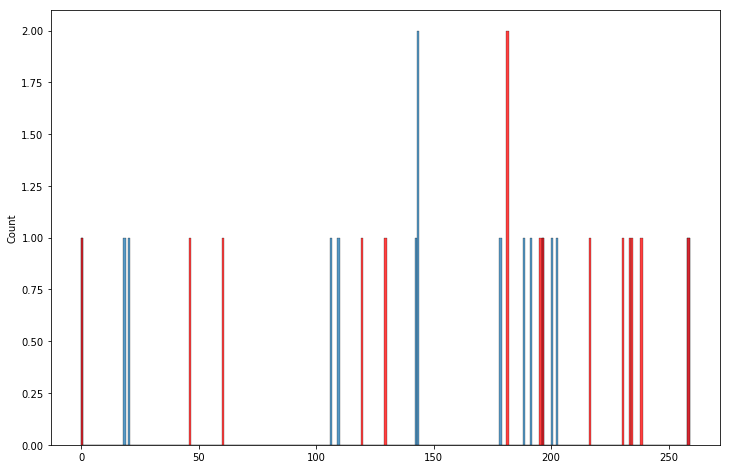

Spectrum num=2155, size=60, matched=5, frac=0.08333333333333333


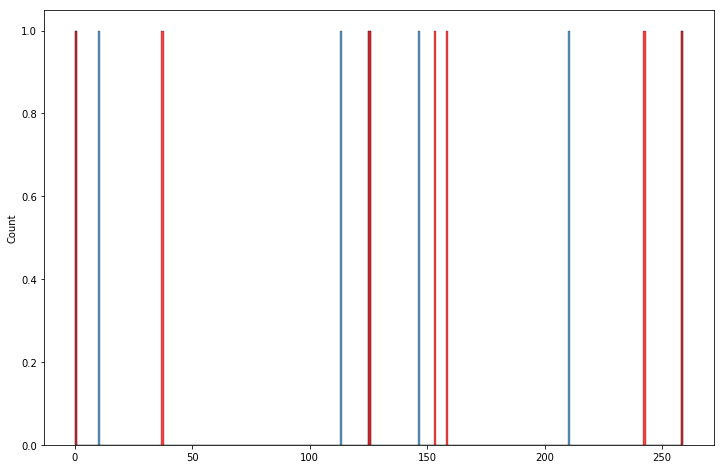

Spectrum num=2157, size=143, matched=26, frac=0.18181818181818182


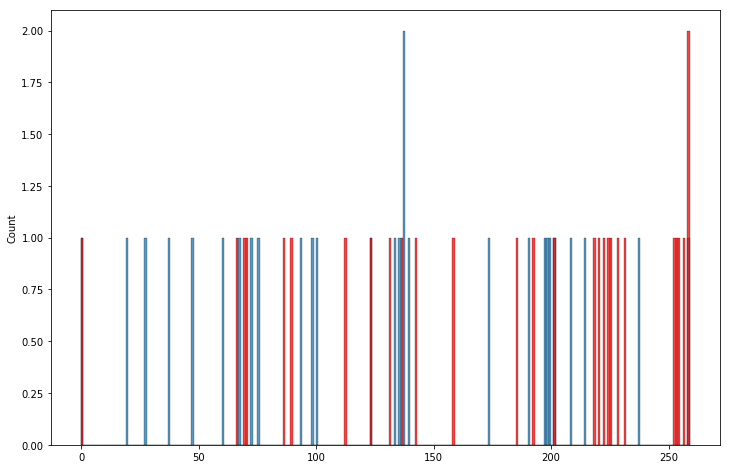

Spectrum num=2158, size=432, matched=69, frac=0.1597222222222222


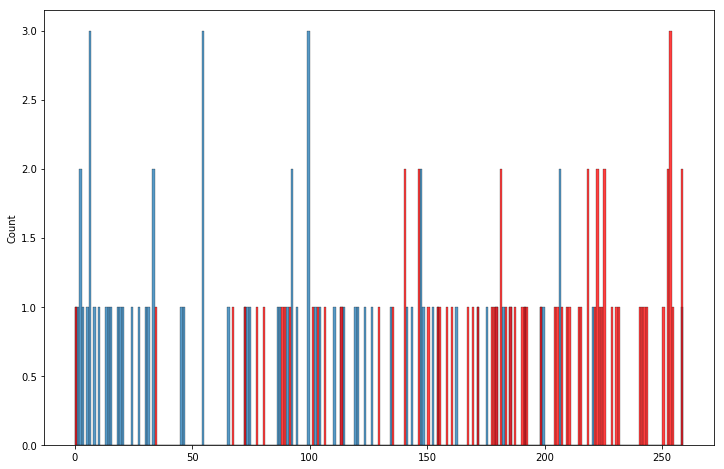

Spectrum num=2171, size=68, matched=11, frac=0.16176470588235295


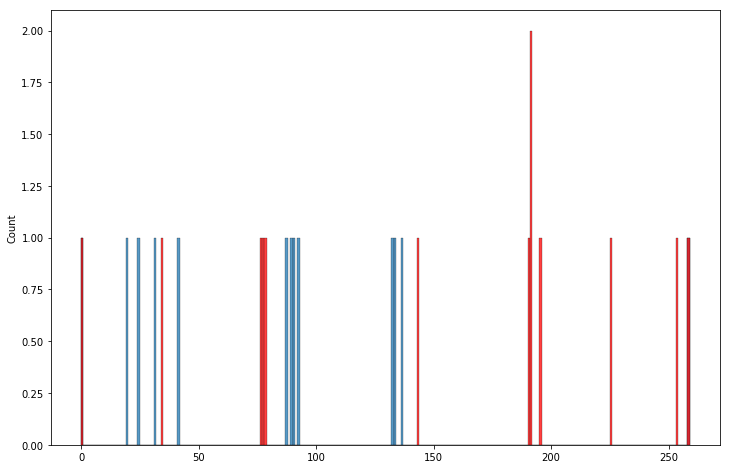

Spectrum num=2174, size=84, matched=11, frac=0.13095238095238096


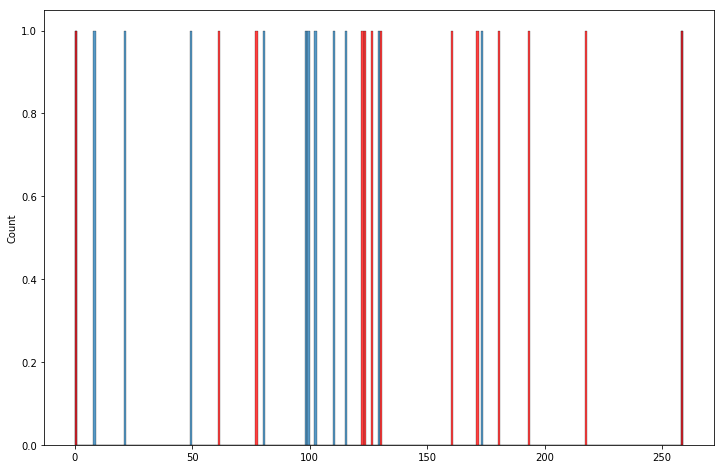

Spectrum num=2176, size=75, matched=6, frac=0.08


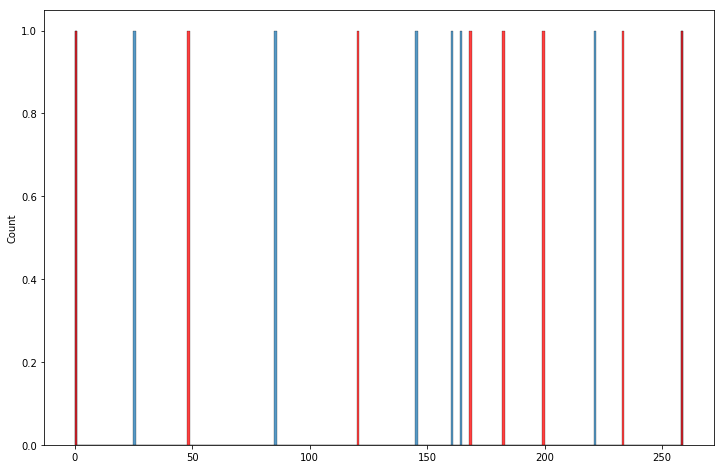

Spectrum num=2179, size=366, matched=81, frac=0.22131147540983606


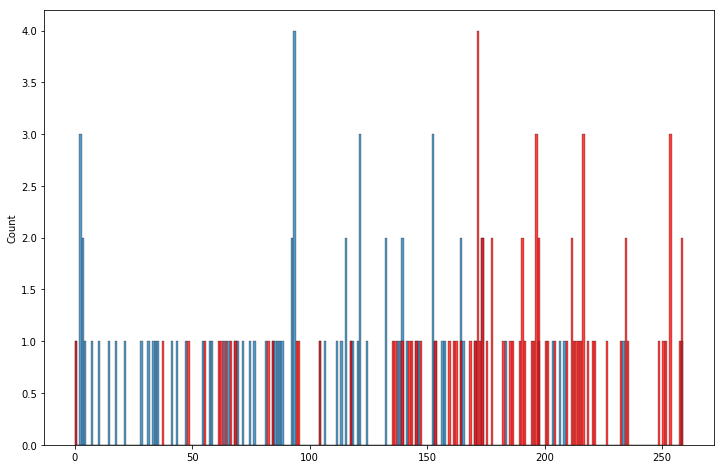

Spectrum num=2180, size=114, matched=17, frac=0.14912280701754385


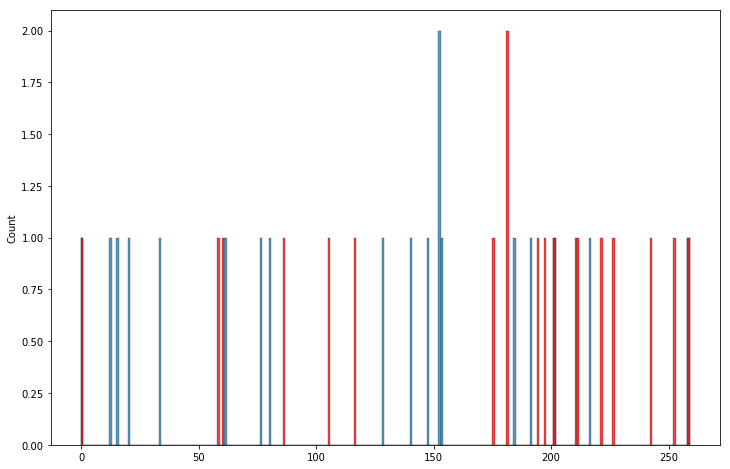

Spectrum num=2183, size=73, matched=4, frac=0.0547945205479452


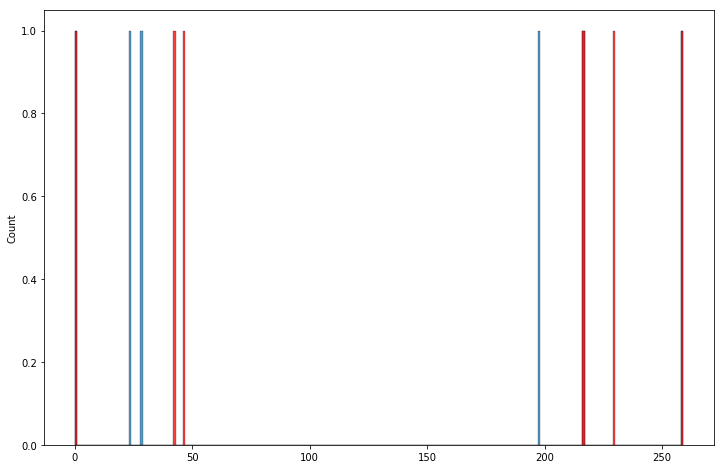

Spectrum num=2191, size=122, matched=16, frac=0.13114754098360656


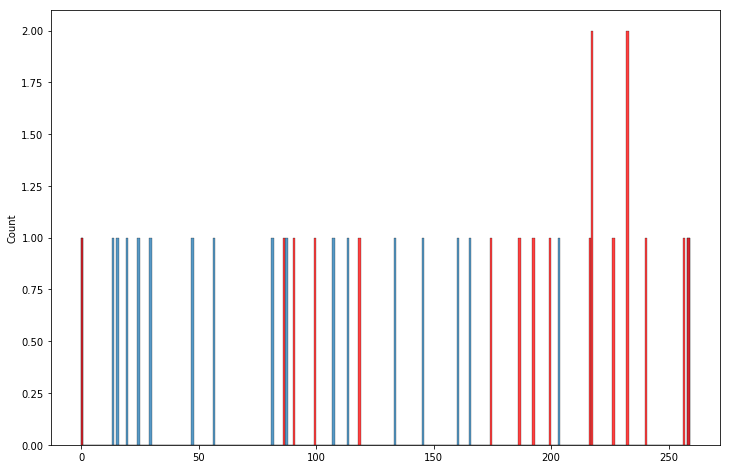

Spectrum num=2218, size=188, matched=40, frac=0.2127659574468085


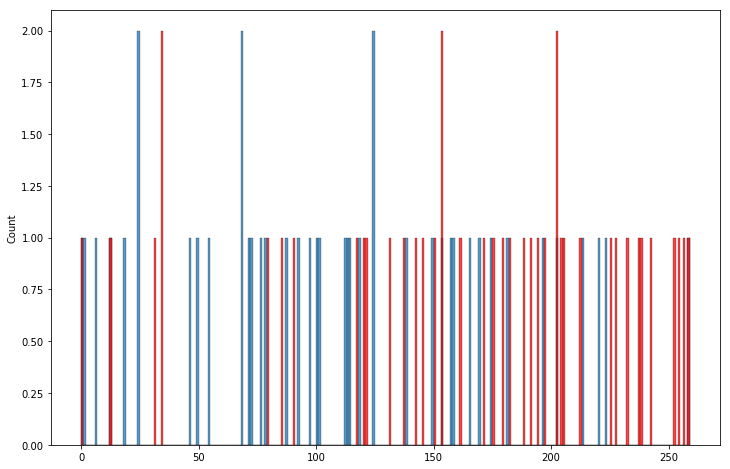

Spectrum num=2221, size=170, matched=21, frac=0.12352941176470589


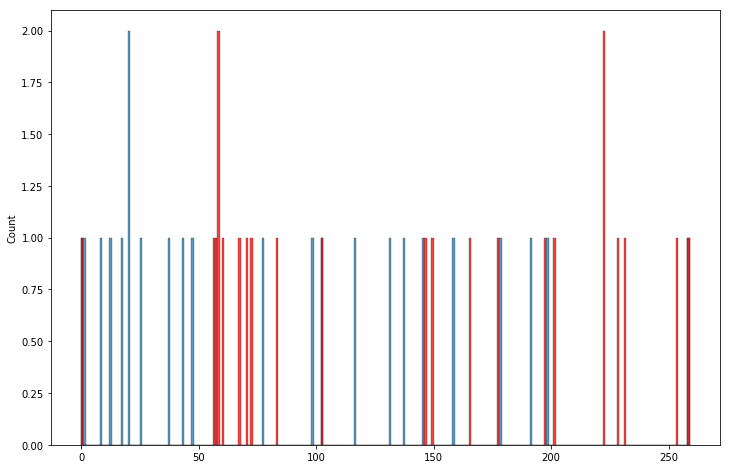

Spectrum num=2232, size=65, matched=4, frac=0.06153846153846154


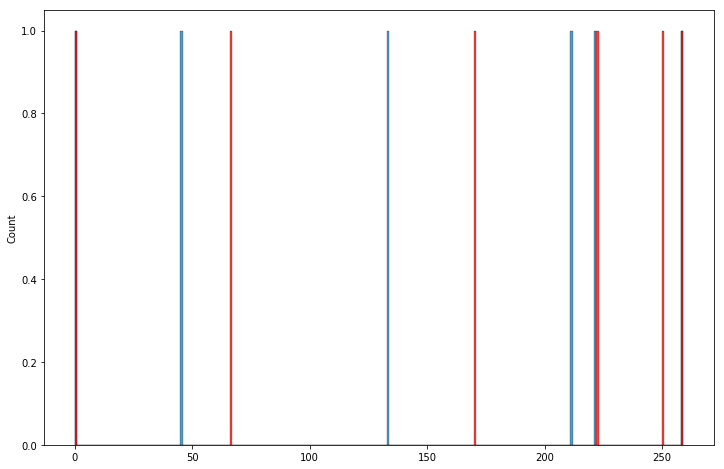

Spectrum num=2233, size=60, matched=6, frac=0.1


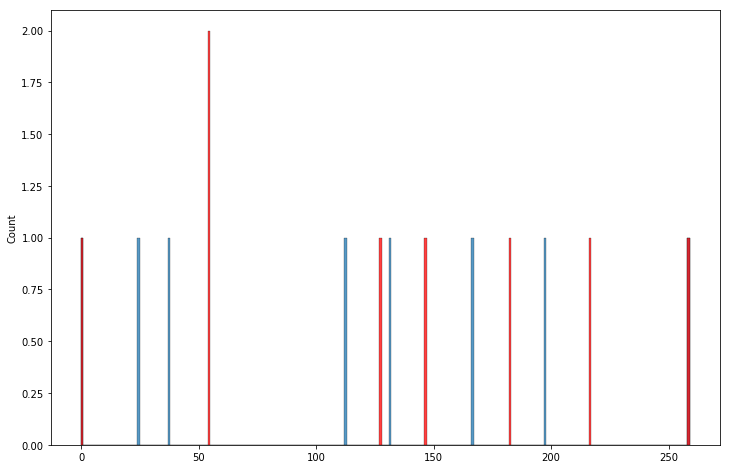

Spectrum num=2237, size=173, matched=27, frac=0.15606936416184972


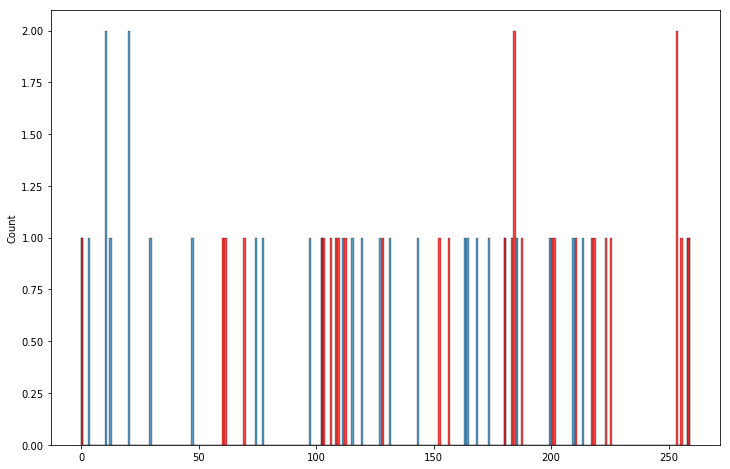

Spectrum num=2238, size=71, matched=12, frac=0.16901408450704225


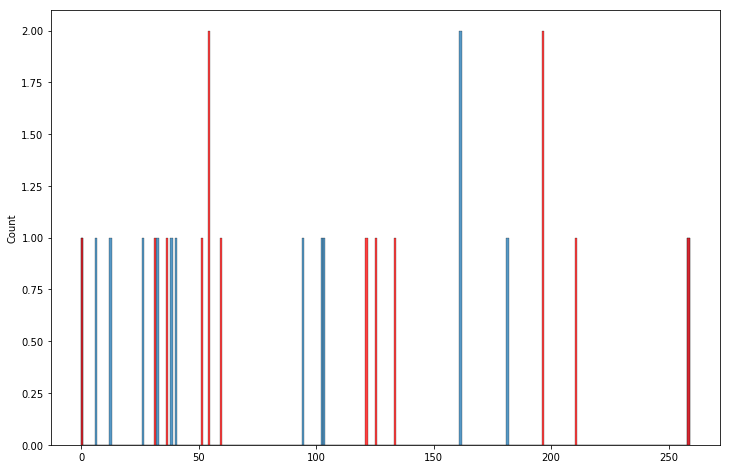

Spectrum num=2242, size=60, matched=5, frac=0.08333333333333333


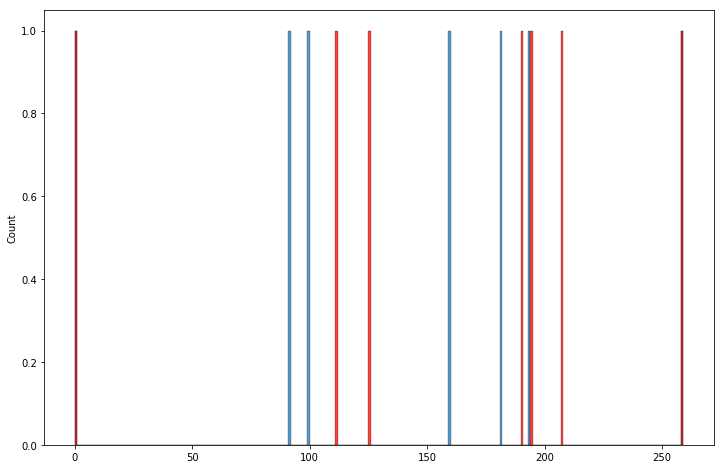

Spectrum num=2245, size=170, matched=36, frac=0.21176470588235294


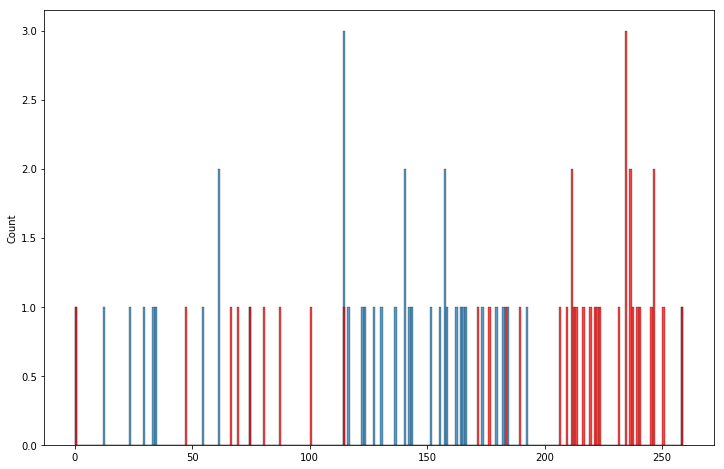

Spectrum num=2251, size=176, matched=45, frac=0.2556818181818182


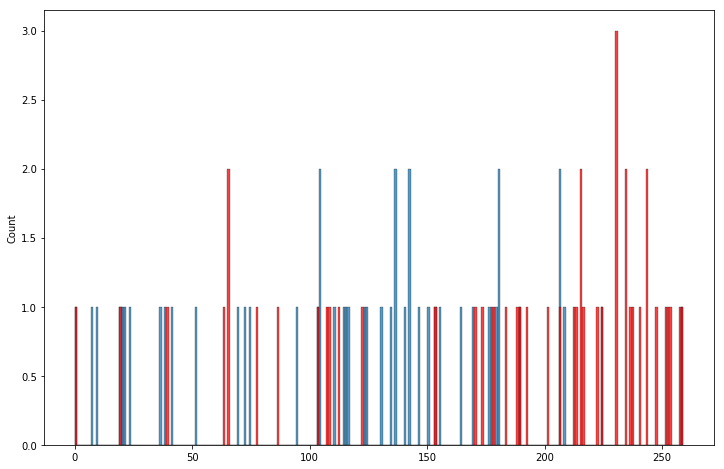

Spectrum num=2253, size=212, matched=34, frac=0.16037735849056603


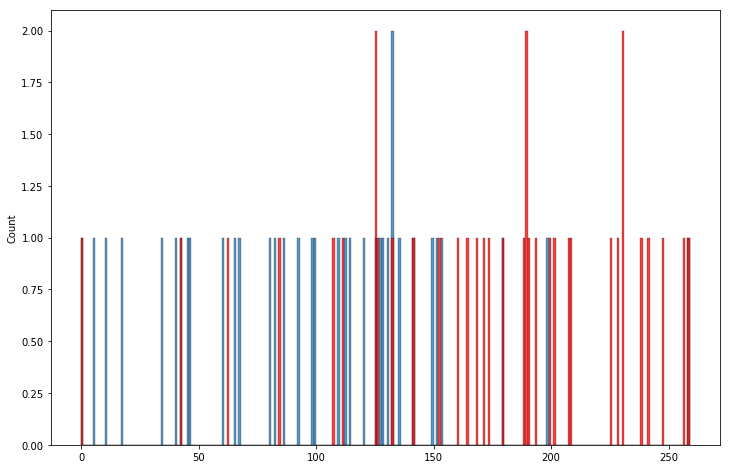

Spectrum num=2254, size=162, matched=18, frac=0.1111111111111111


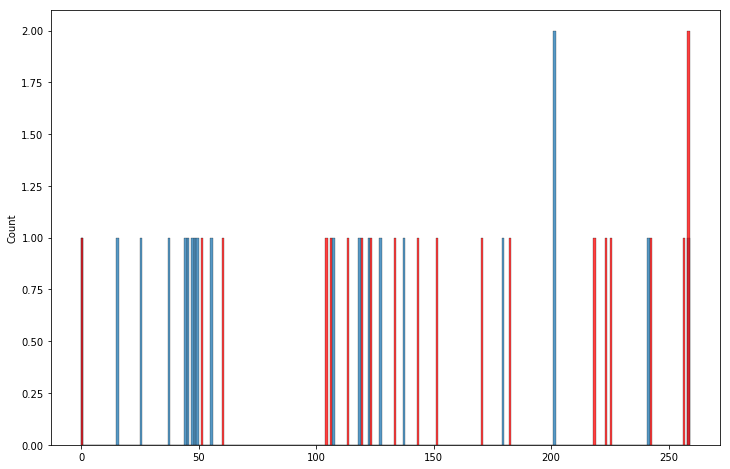

Spectrum num=2255, size=177, matched=49, frac=0.2768361581920904


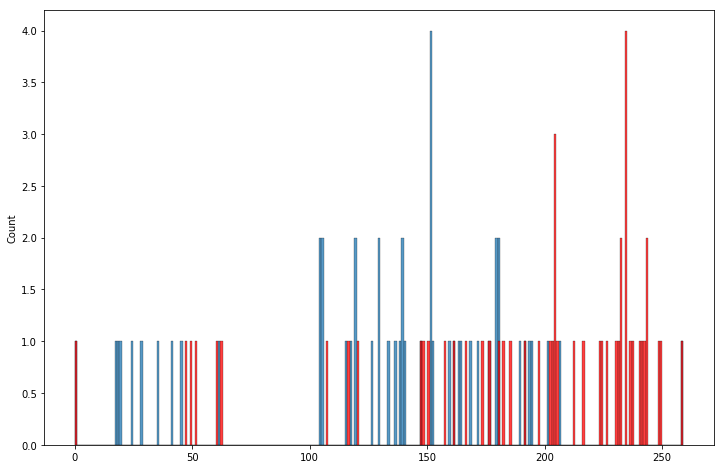

Spectrum num=2257, size=74, matched=17, frac=0.22972972972972974


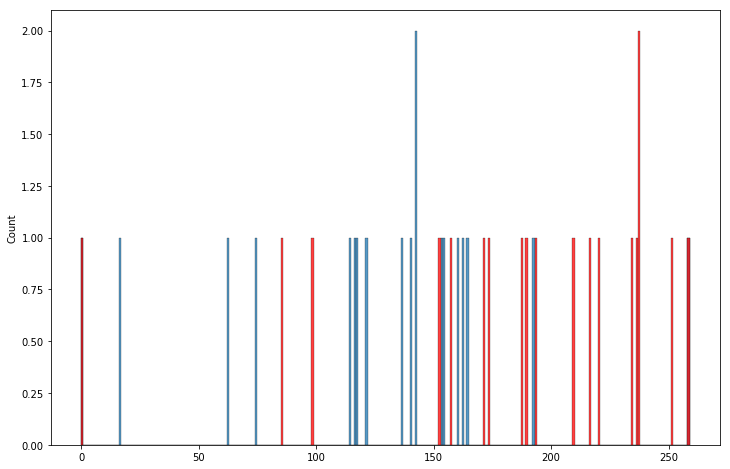

Spectrum num=2261, size=218, matched=30, frac=0.13761467889908258


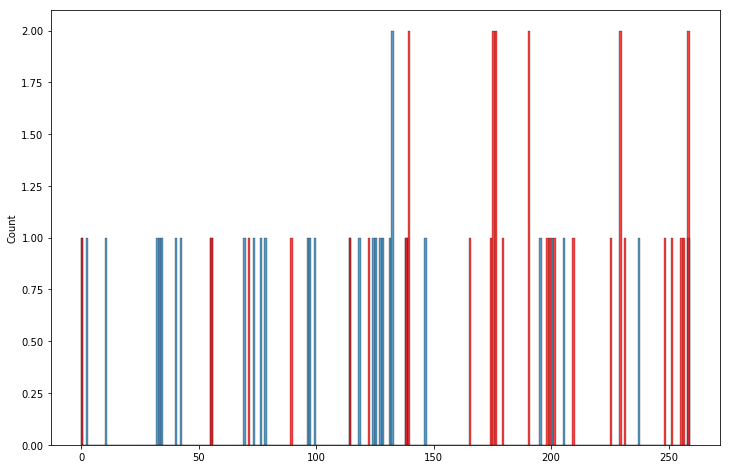

Spectrum num=2265, size=55, matched=7, frac=0.12727272727272726


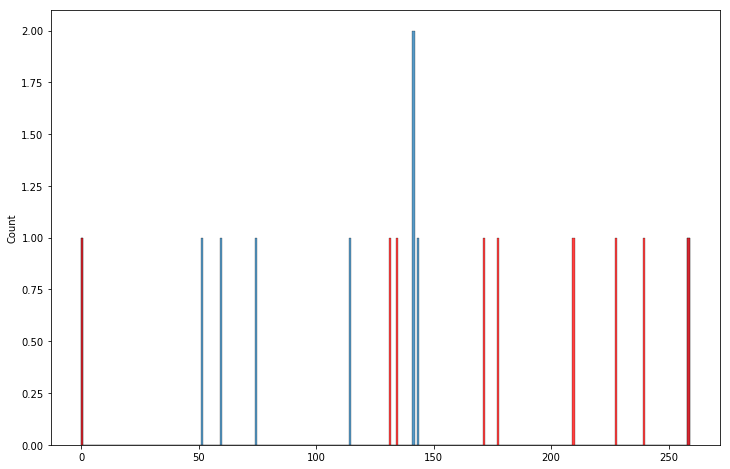

Spectrum num=2270, size=50, matched=9, frac=0.18


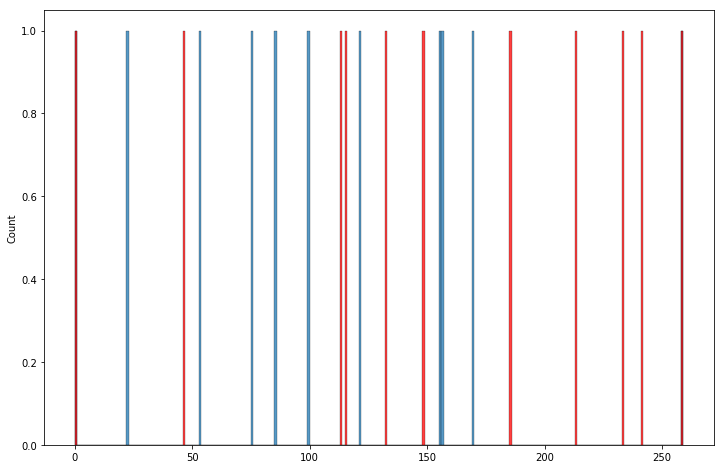

Spectrum num=2274, size=185, matched=34, frac=0.1837837837837838


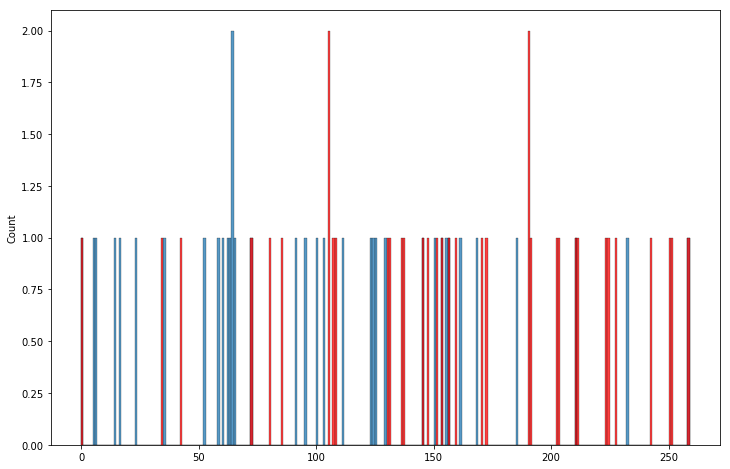

Spectrum num=2282, size=53, matched=10, frac=0.18867924528301888


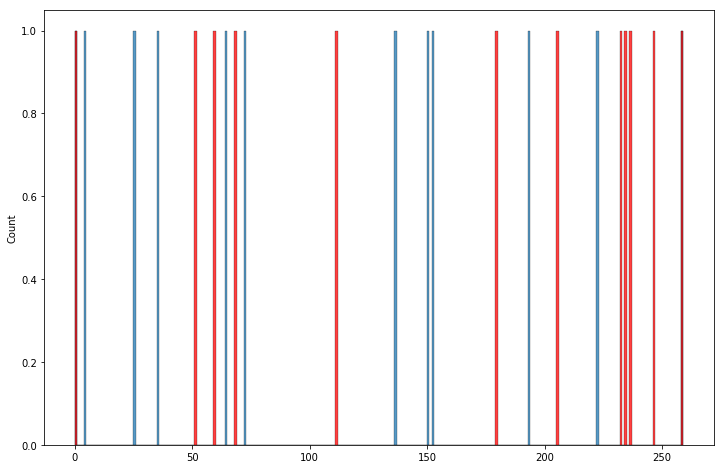

Spectrum num=2292, size=194, matched=24, frac=0.12371134020618557


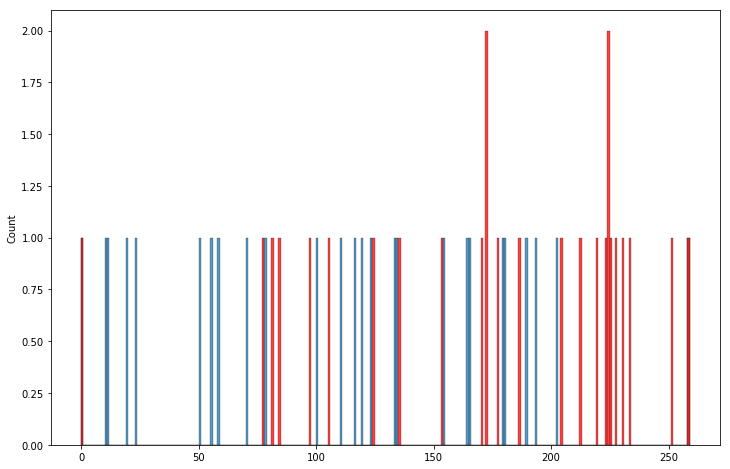

Spectrum num=2295, size=81, matched=8, frac=0.09876543209876543


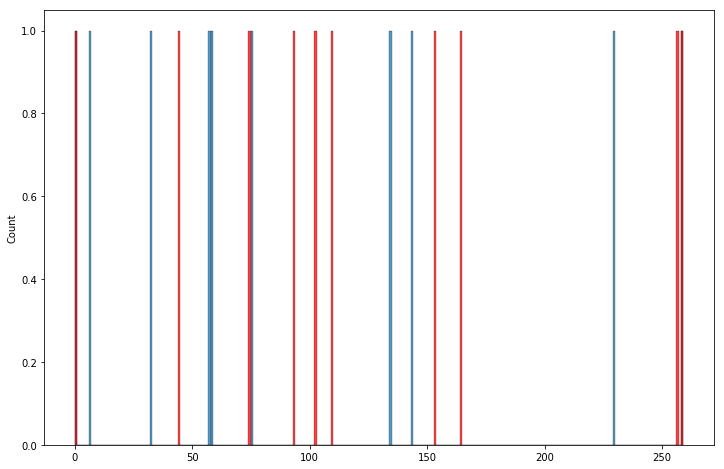

Spectrum num=2302, size=156, matched=23, frac=0.14743589743589744


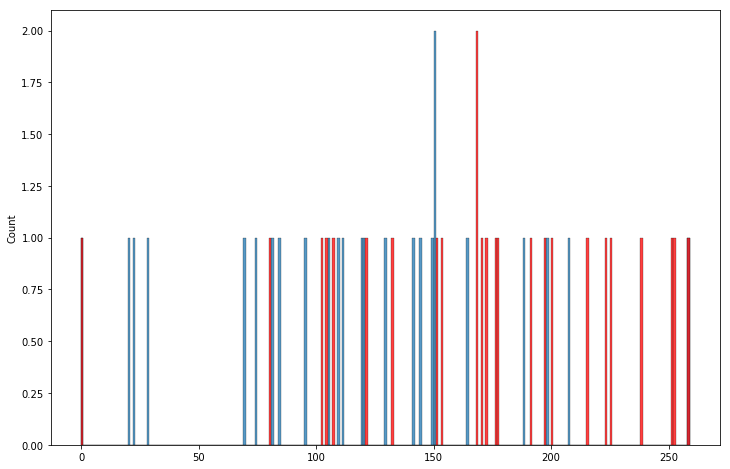

Spectrum num=2304, size=76, matched=7, frac=0.09210526315789473


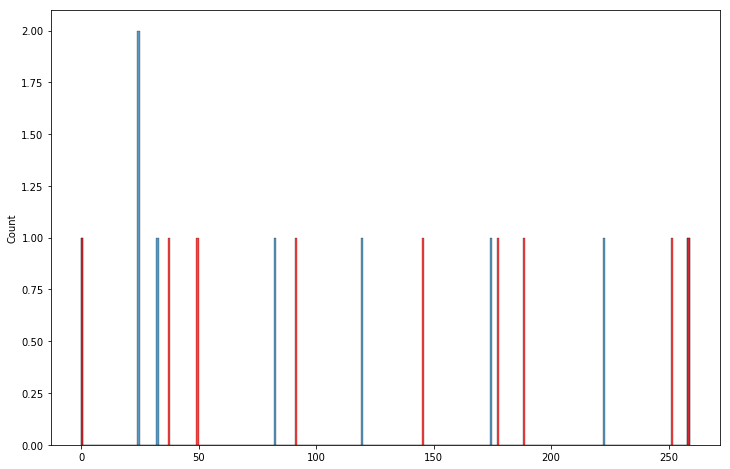

Spectrum num=2306, size=205, matched=37, frac=0.18048780487804877


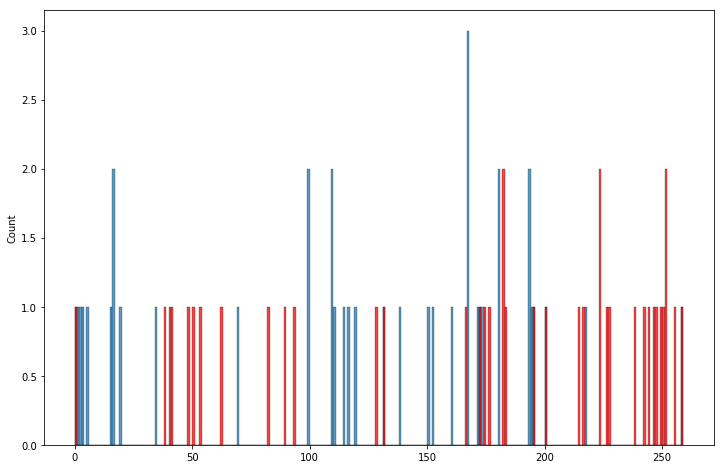

Spectrum num=2309, size=150, matched=33, frac=0.22


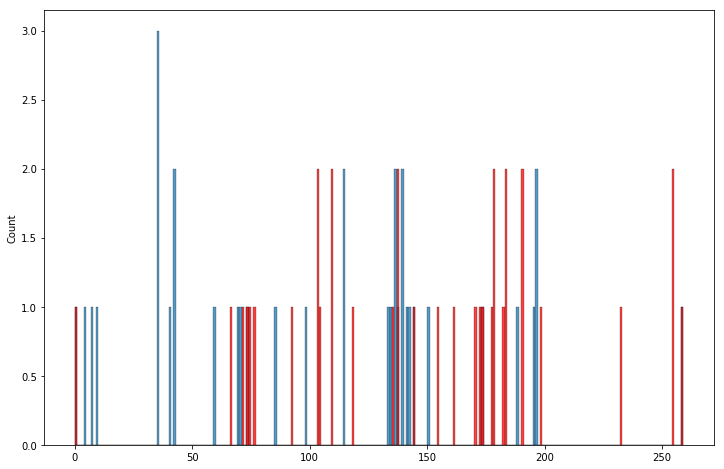

Spectrum num=2310, size=148, matched=19, frac=0.12837837837837837


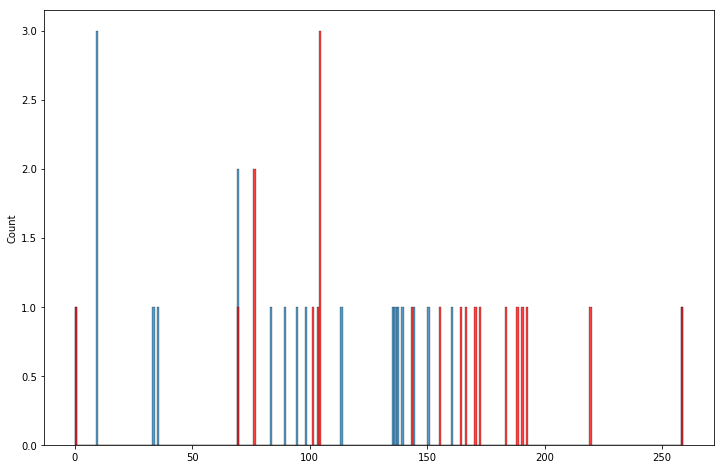

Spectrum num=2311, size=380, matched=69, frac=0.18157894736842106


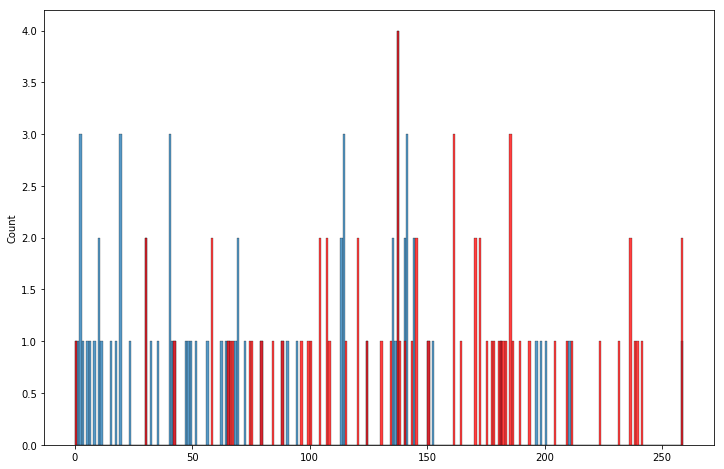

Spectrum num=2313, size=120, matched=16, frac=0.13333333333333333


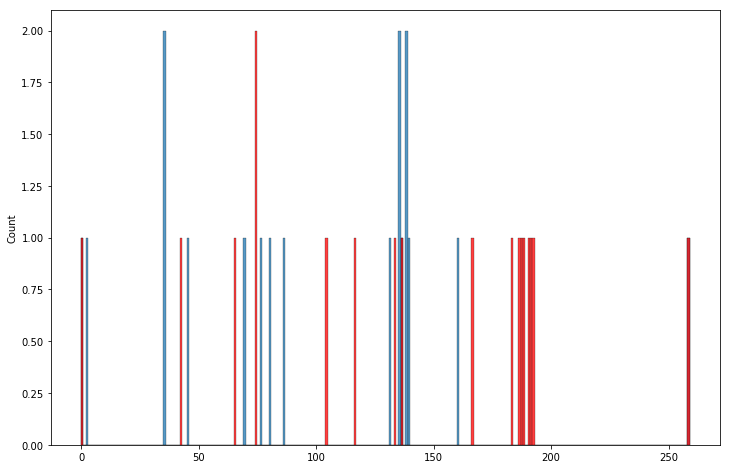

Spectrum num=2314, size=467, matched=93, frac=0.19914346895074947


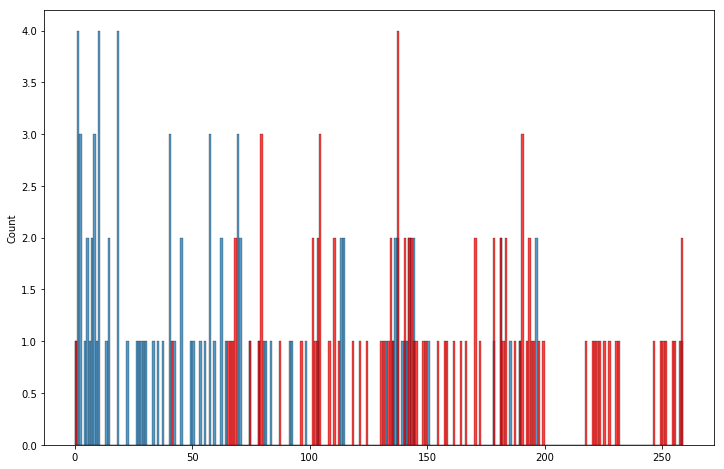

Spectrum num=2316, size=131, matched=13, frac=0.09923664122137404


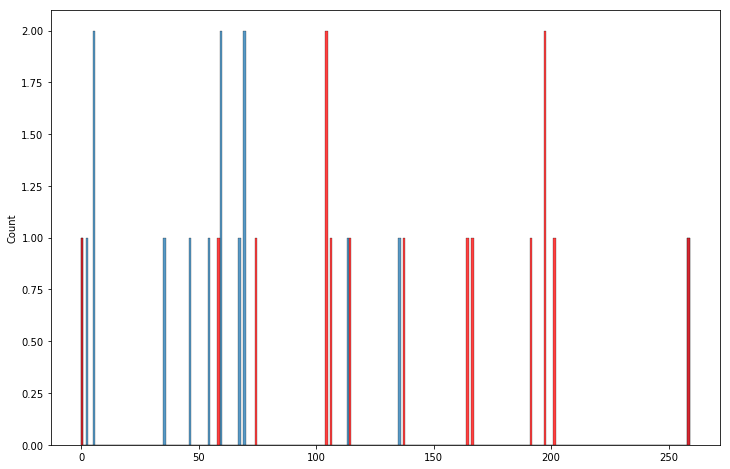

Spectrum num=2318, size=764, matched=145, frac=0.18979057591623036


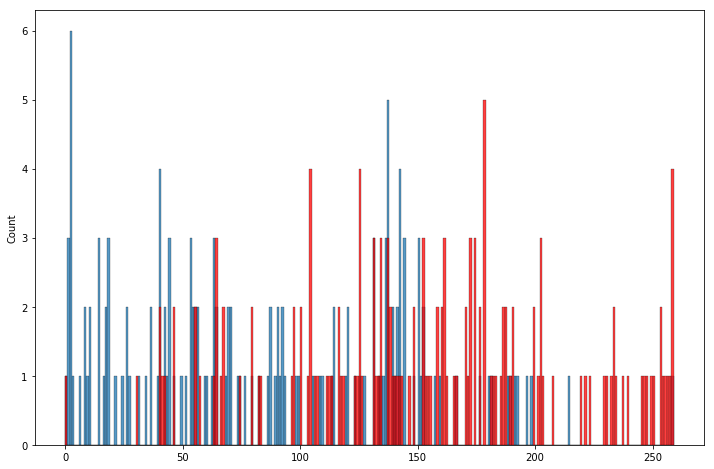

Spectrum num=2322, size=483, matched=81, frac=0.16770186335403728


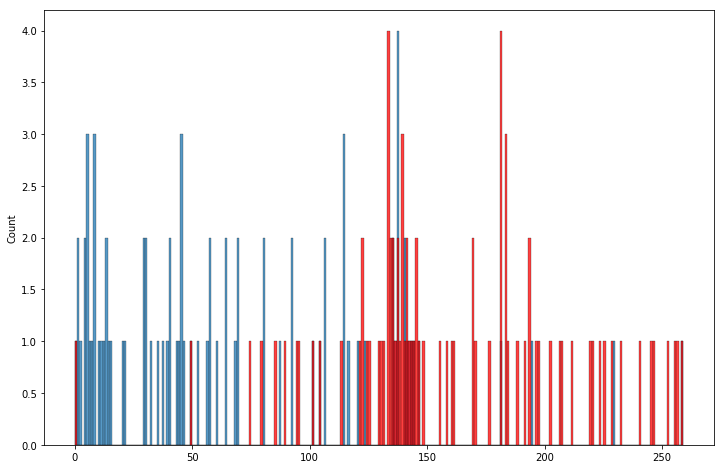

Spectrum num=2323, size=450, matched=90, frac=0.2


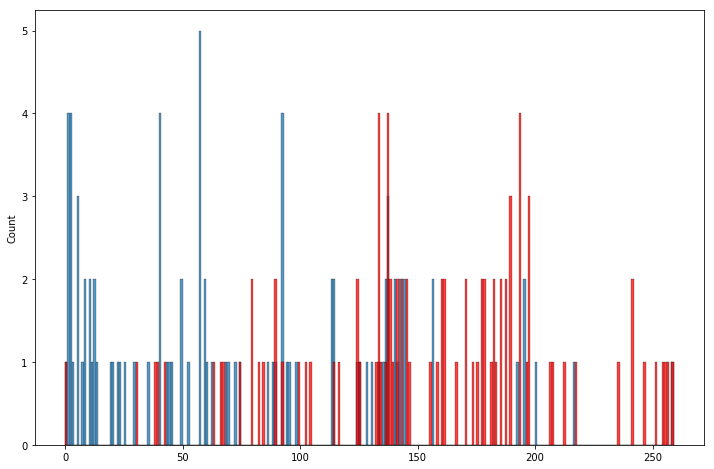

Spectrum num=2324, size=151, matched=28, frac=0.18543046357615894


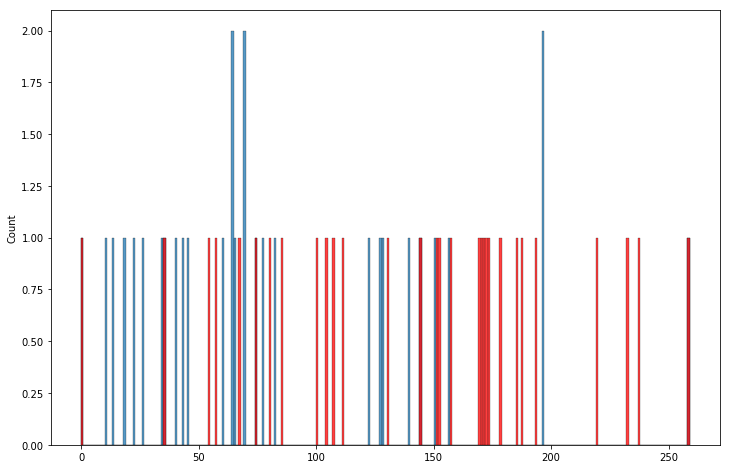

Spectrum num=2326, size=483, matched=86, frac=0.17805383022774326


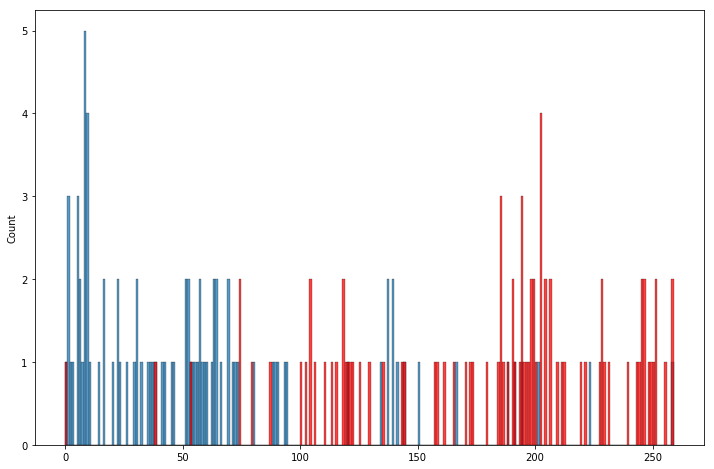

Spectrum num=2327, size=483, matched=70, frac=0.14492753623188406


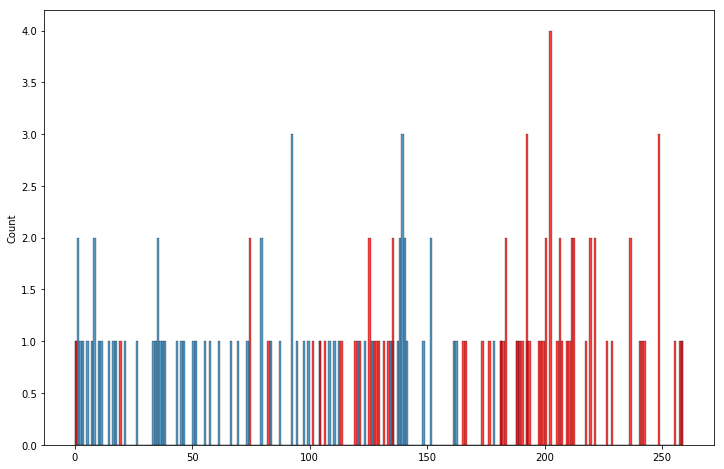

Spectrum num=2329, size=483, matched=83, frac=0.17184265010351968


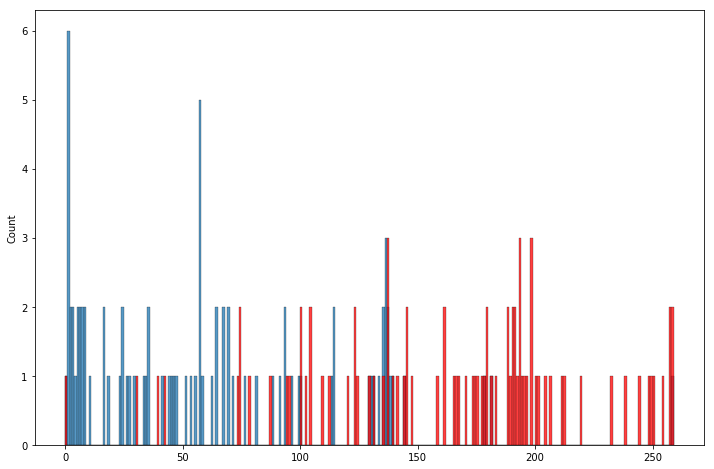

Spectrum num=2331, size=483, matched=90, frac=0.18633540372670807


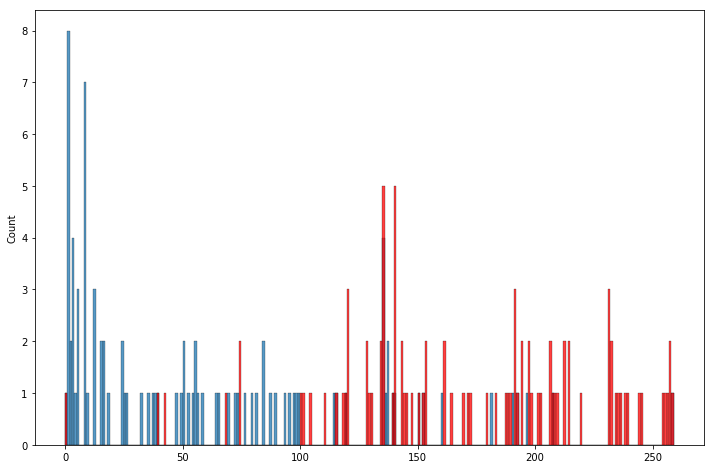

Spectrum num=2332, size=483, matched=79, frac=0.16356107660455488


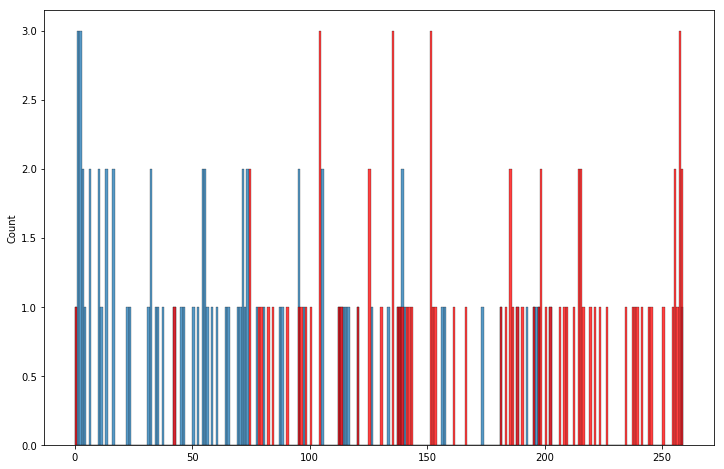

Spectrum num=2340, size=483, matched=85, frac=0.17598343685300208


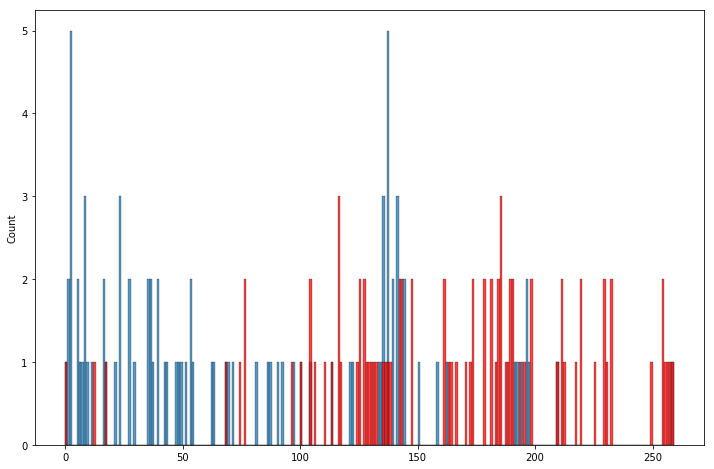

Spectrum num=2345, size=483, matched=81, frac=0.16770186335403728


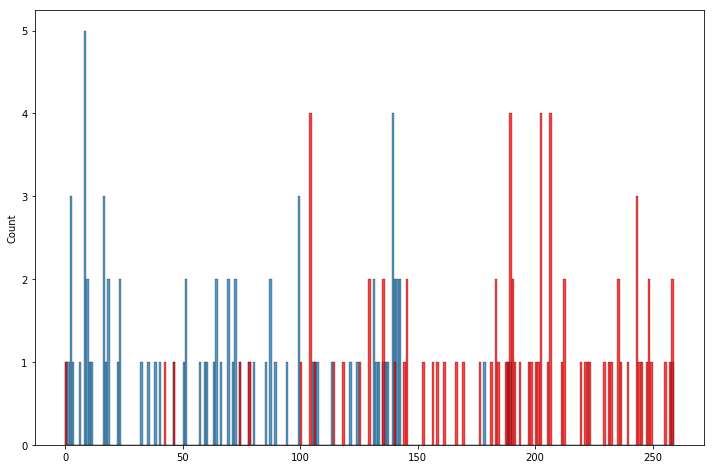

Spectrum num=2349, size=104, matched=11, frac=0.10576923076923077


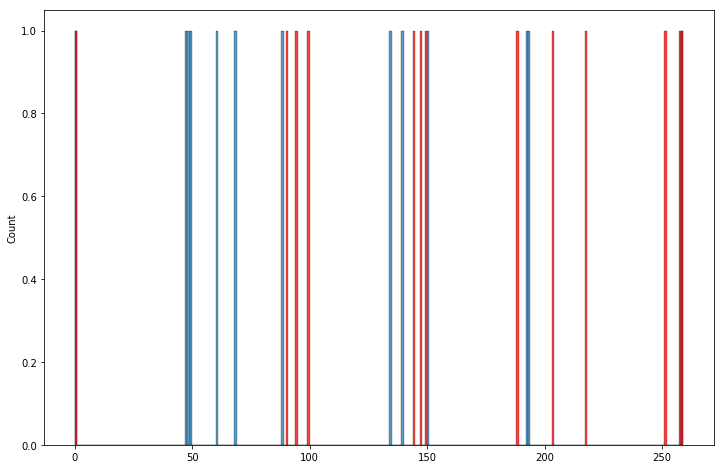

Spectrum num=2358, size=74, matched=6, frac=0.08108108108108109


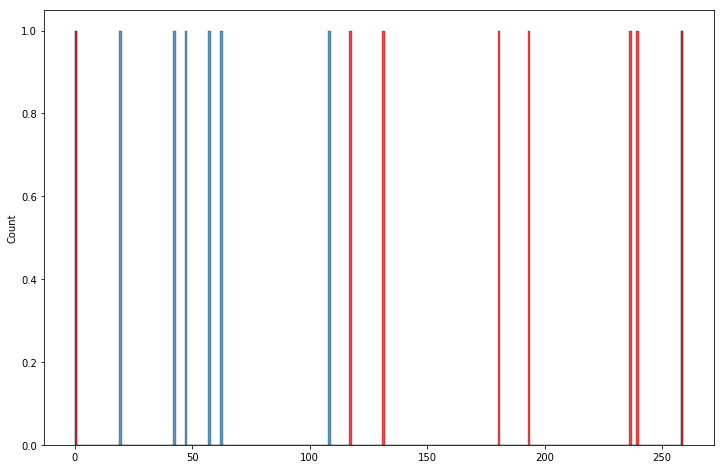

Spectrum num=2376, size=108, matched=12, frac=0.1111111111111111


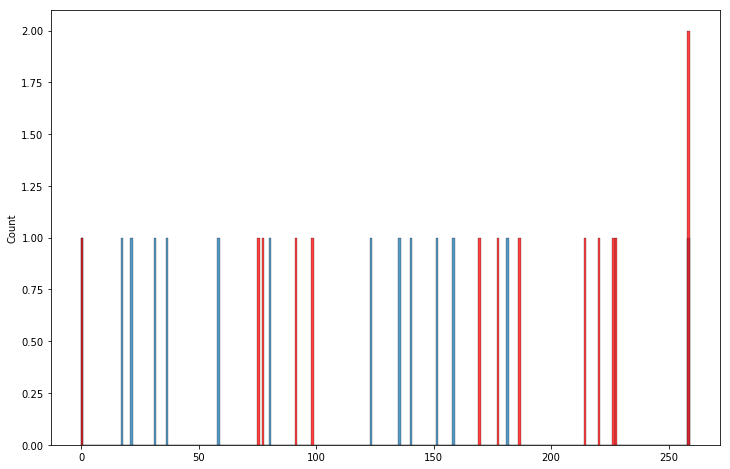

Spectrum num=2385, size=185, matched=30, frac=0.16216216216216217


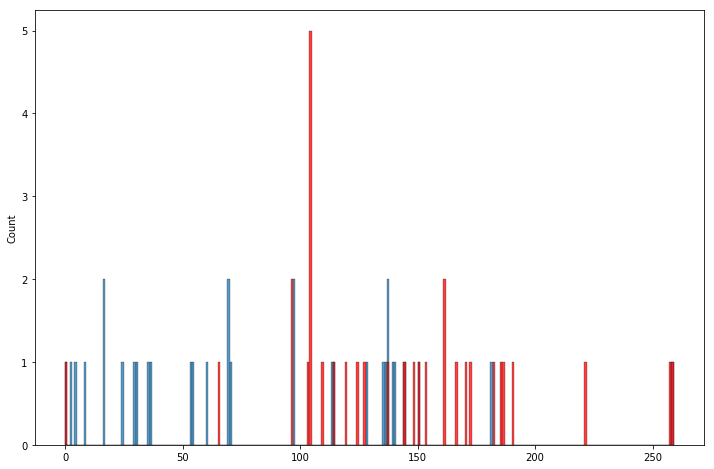

Spectrum num=2394, size=79, matched=9, frac=0.11392405063291139


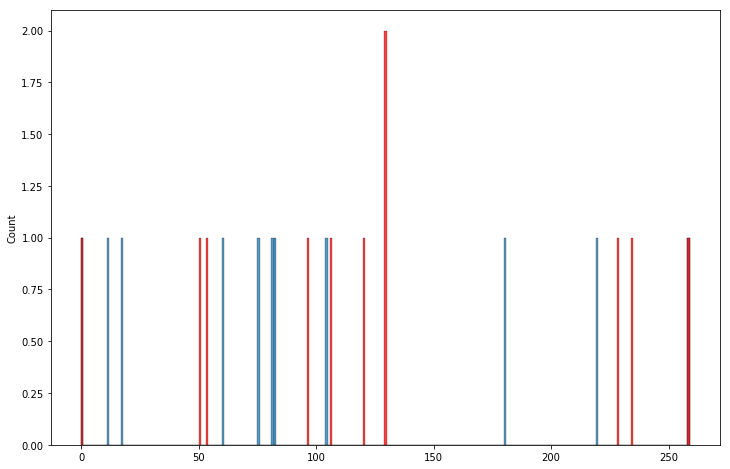

Spectrum num=2408, size=98, matched=17, frac=0.17346938775510204


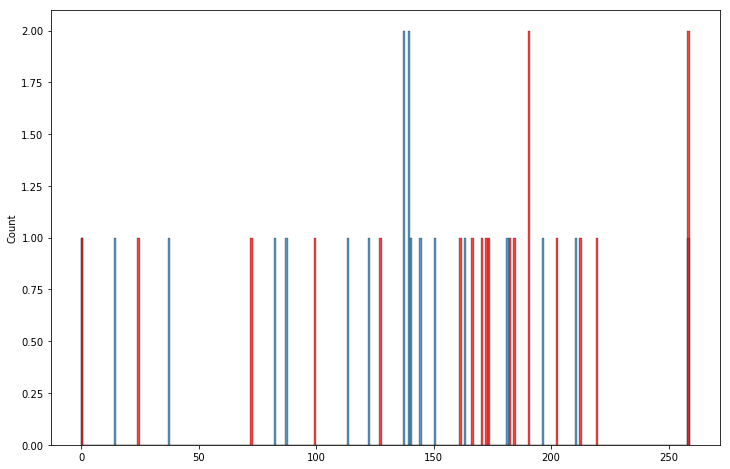

Spectrum num=2417, size=115, matched=24, frac=0.20869565217391303


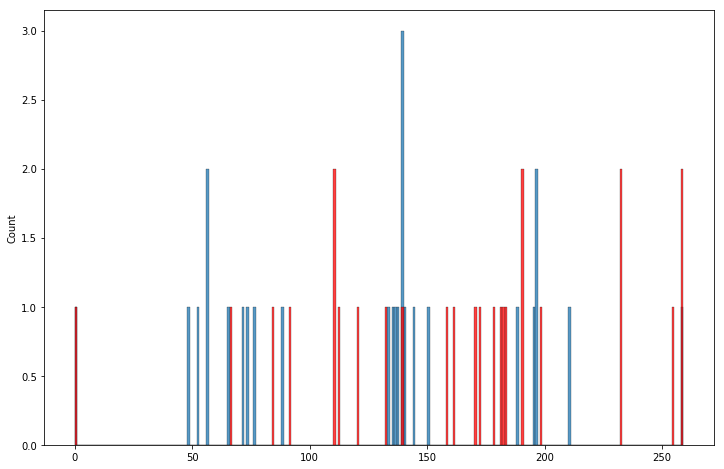

Spectrum num=2419, size=153, matched=34, frac=0.2222222222222222


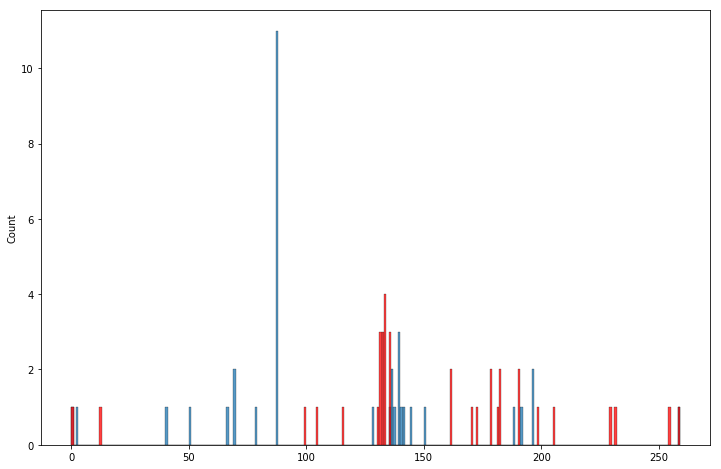

Spectrum num=2431, size=161, matched=35, frac=0.21739130434782608


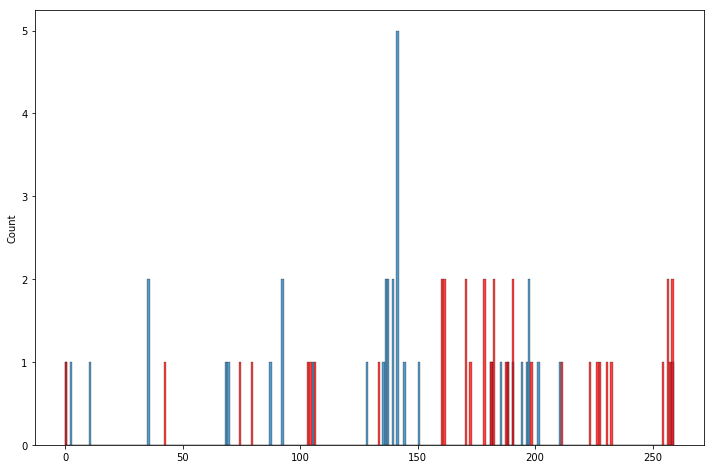

Spectrum num=2435, size=125, matched=19, frac=0.152


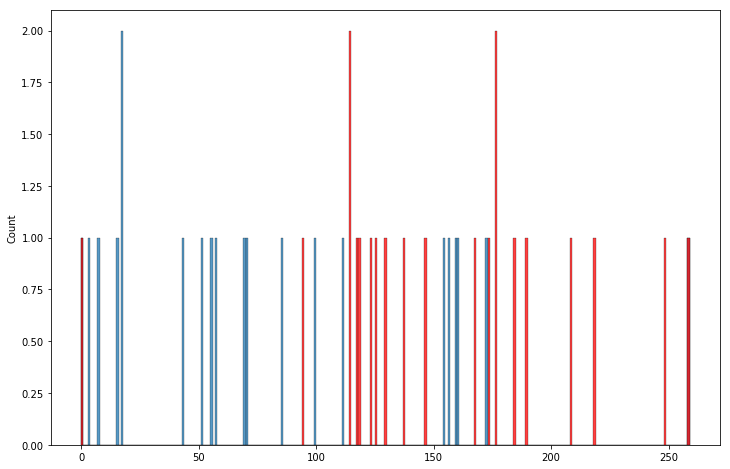

Spectrum num=2437, size=160, matched=39, frac=0.24375


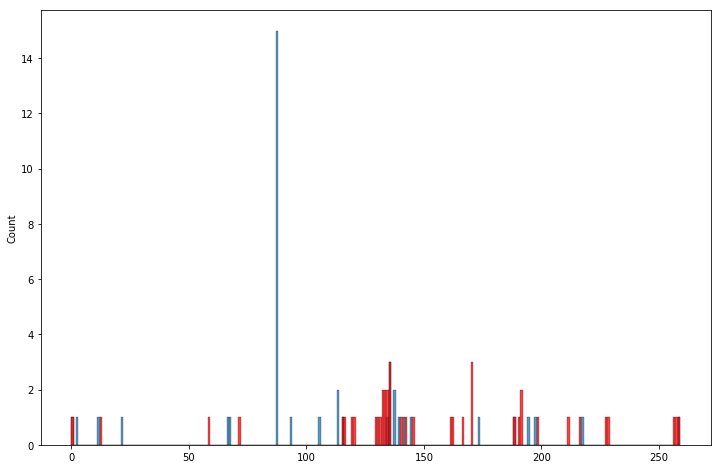

Spectrum num=2439, size=113, matched=26, frac=0.23008849557522124


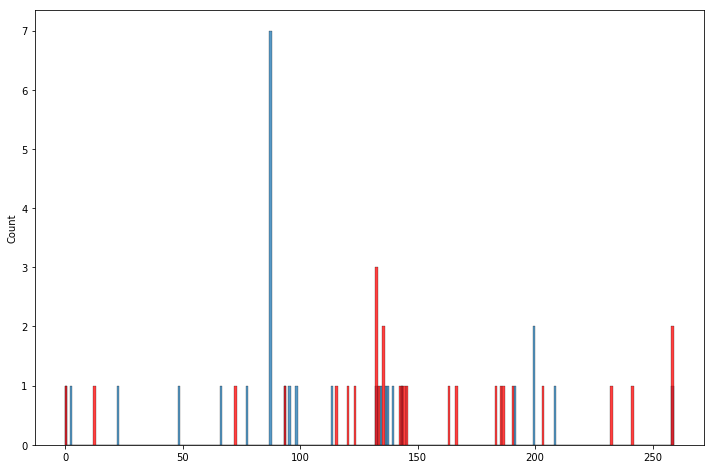

Spectrum num=2441, size=64, matched=6, frac=0.09375


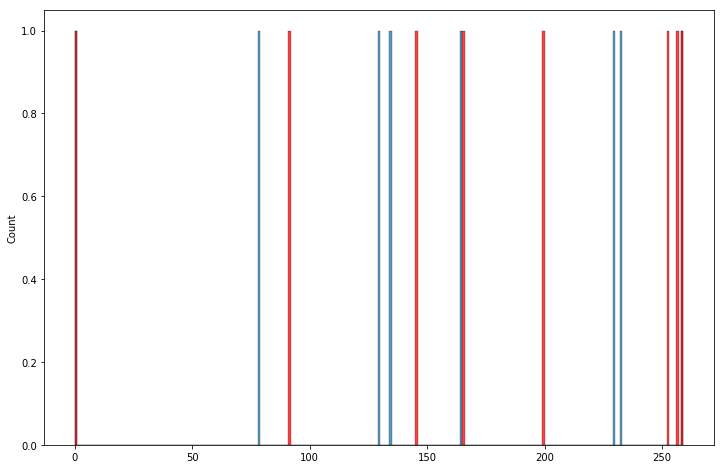

Spectrum num=2443, size=77, matched=14, frac=0.18181818181818182


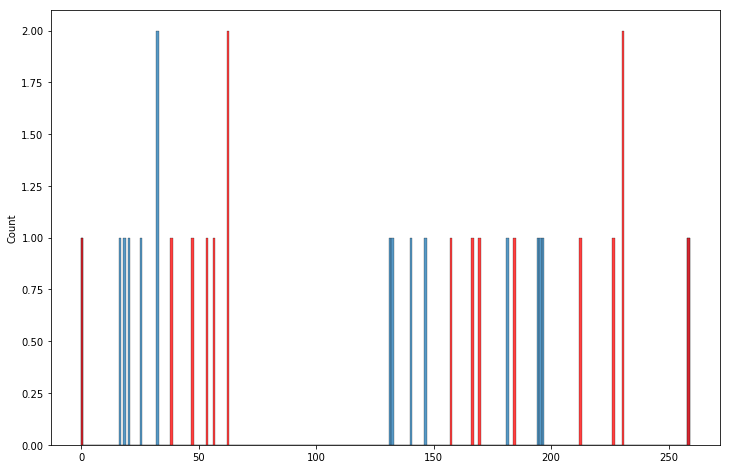

Spectrum num=2448, size=59, matched=11, frac=0.1864406779661017


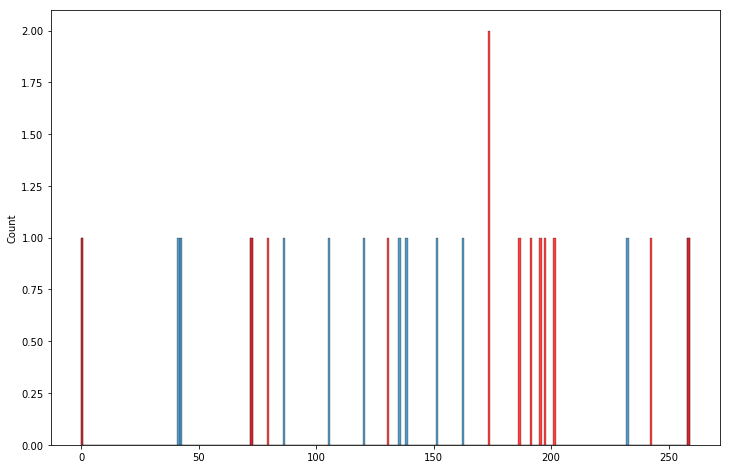

Spectrum num=2450, size=196, matched=41, frac=0.20918367346938777


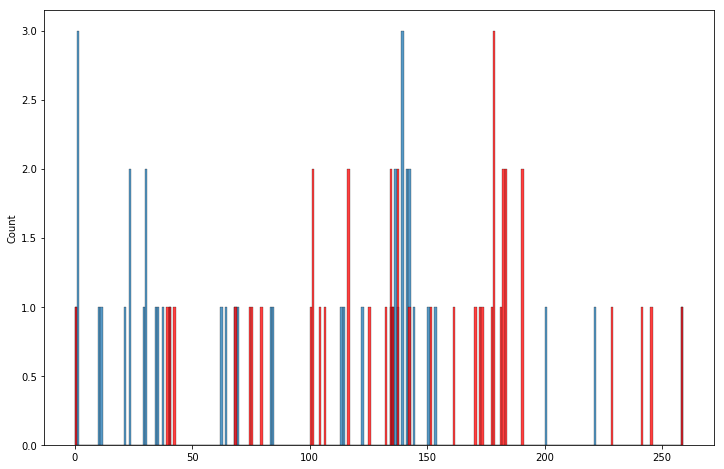

Spectrum num=2458, size=126, matched=18, frac=0.14285714285714285


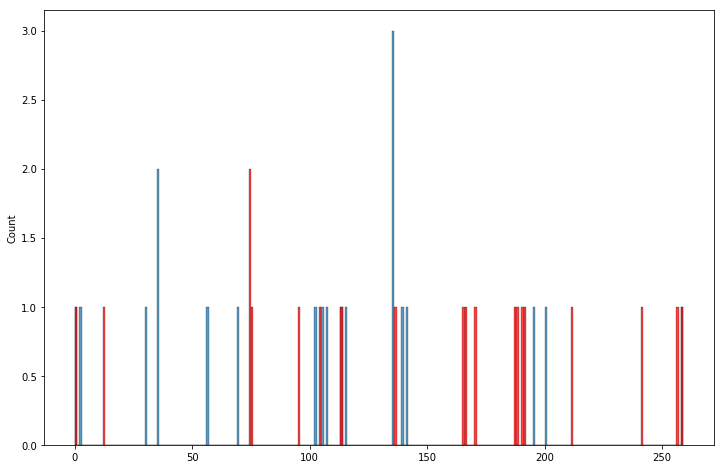

Spectrum num=2462, size=92, matched=18, frac=0.1956521739130435


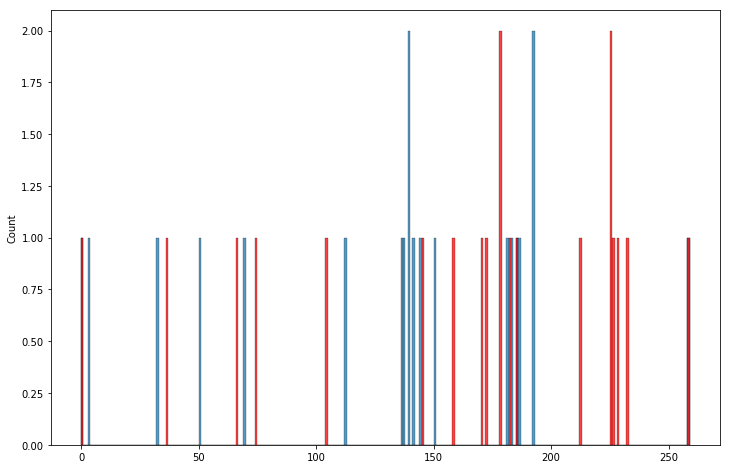

Spectrum num=2464, size=512, matched=87, frac=0.169921875


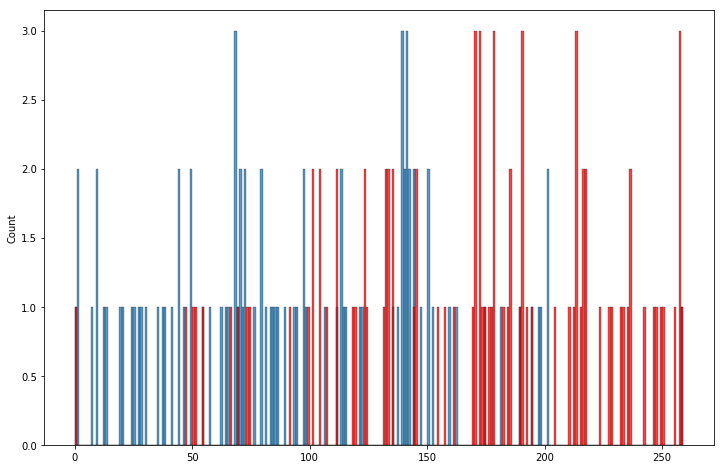

Spectrum num=2466, size=483, matched=97, frac=0.20082815734989648


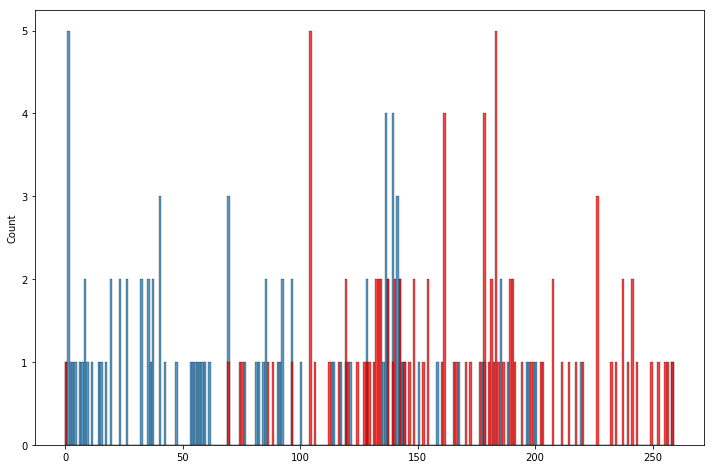

Spectrum num=2467, size=249, matched=57, frac=0.2289156626506024


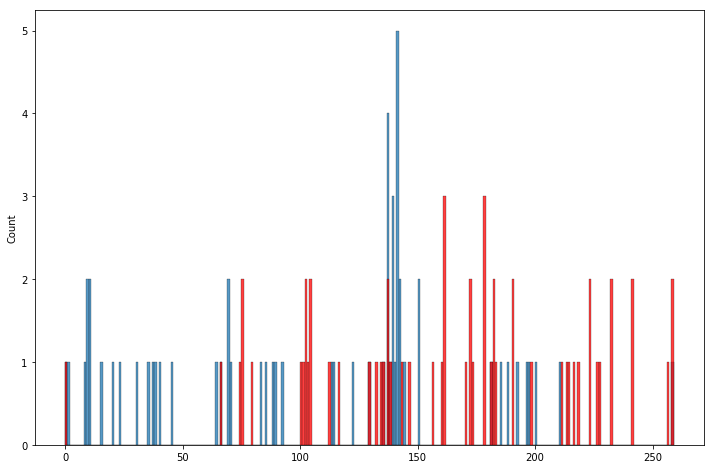

Spectrum num=2468, size=634, matched=101, frac=0.15930599369085174


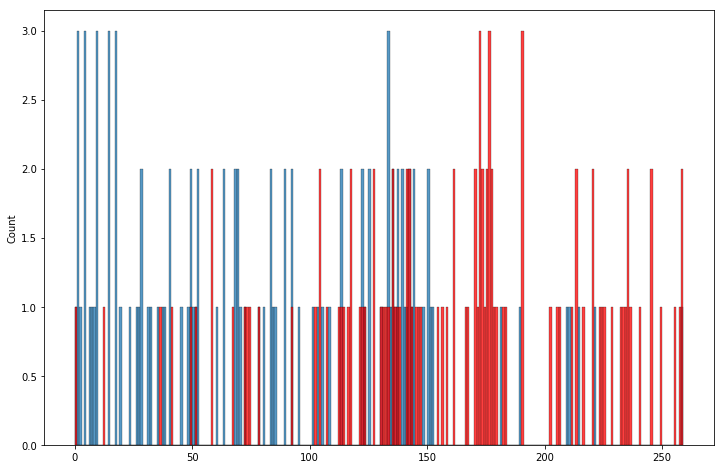

Spectrum num=2475, size=96, matched=14, frac=0.14583333333333334


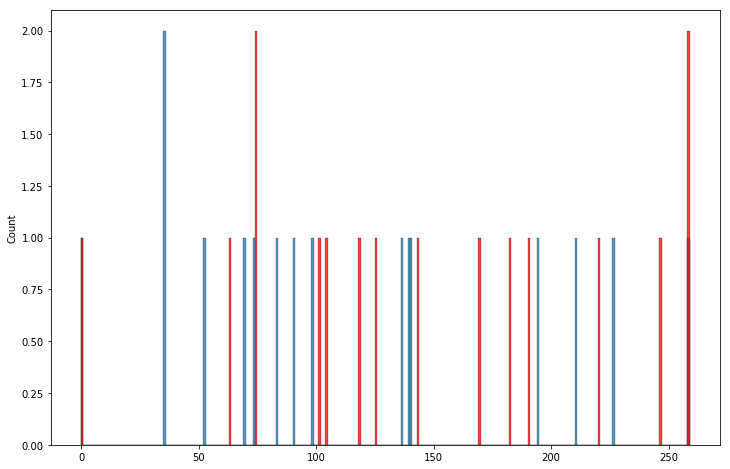

Spectrum num=2476, size=73, matched=16, frac=0.2191780821917808


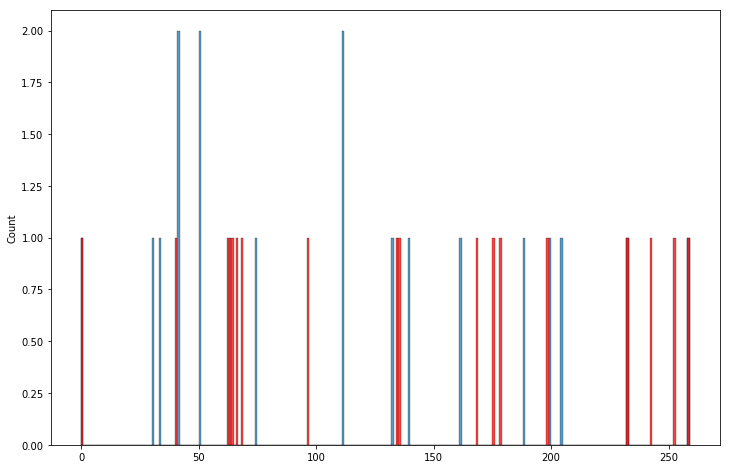

Spectrum num=2477, size=69, matched=4, frac=0.057971014492753624


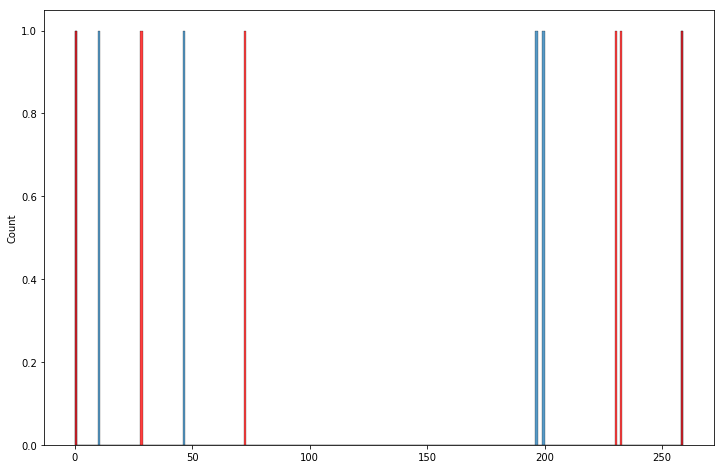

Spectrum num=2479, size=241, matched=40, frac=0.16597510373443983


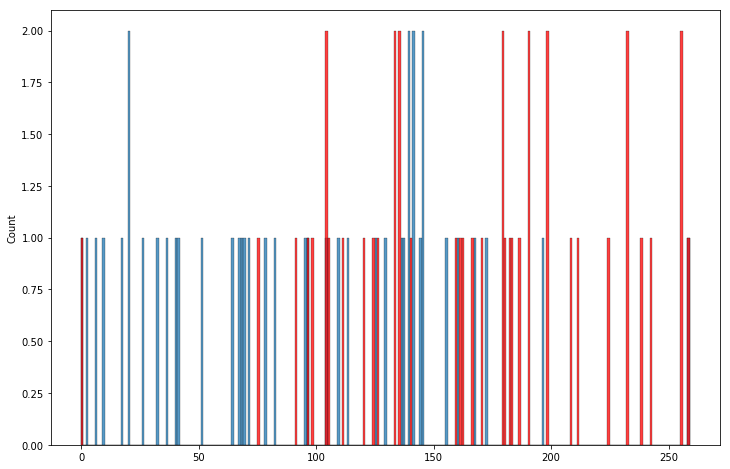

Spectrum num=2482, size=480, matched=79, frac=0.16458333333333333


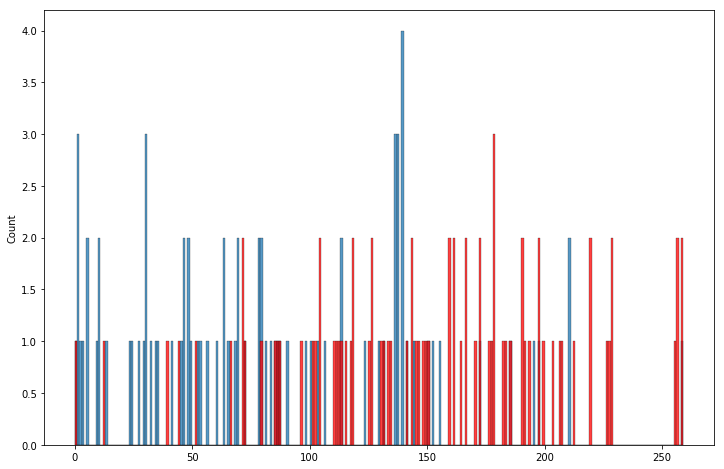

Spectrum num=2490, size=161, matched=23, frac=0.14285714285714285


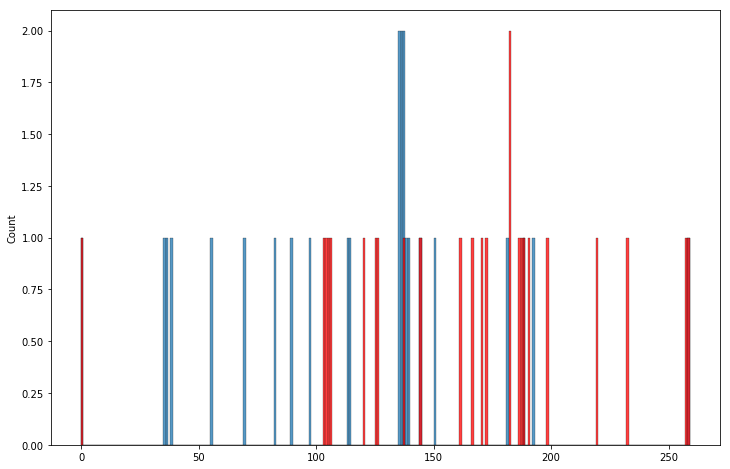

Spectrum num=2493, size=55, matched=6, frac=0.10909090909090909


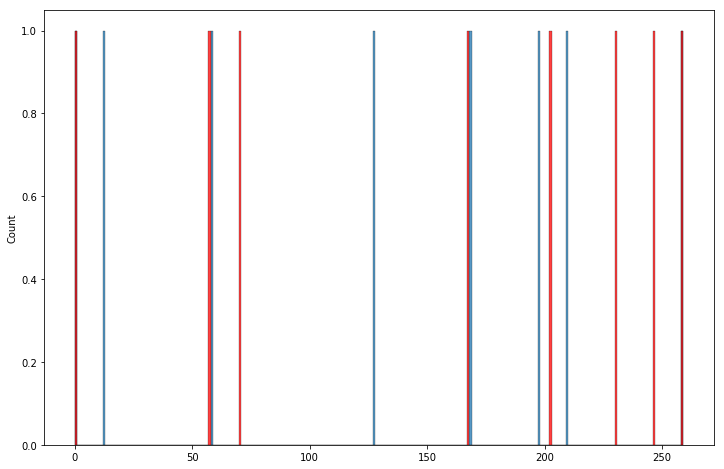

Spectrum num=2502, size=212, matched=43, frac=0.2028301886792453


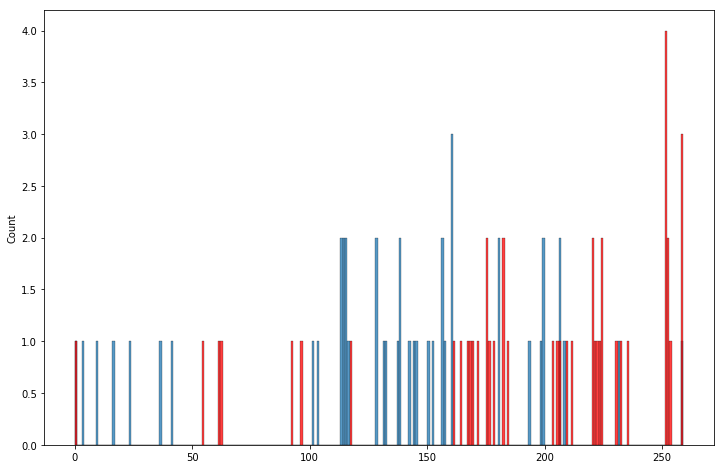

Spectrum num=2503, size=102, matched=16, frac=0.1568627450980392


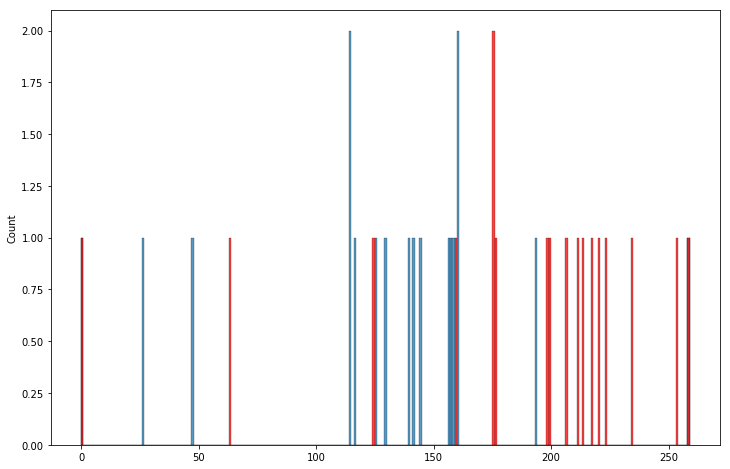

Spectrum num=2504, size=96, matched=12, frac=0.125


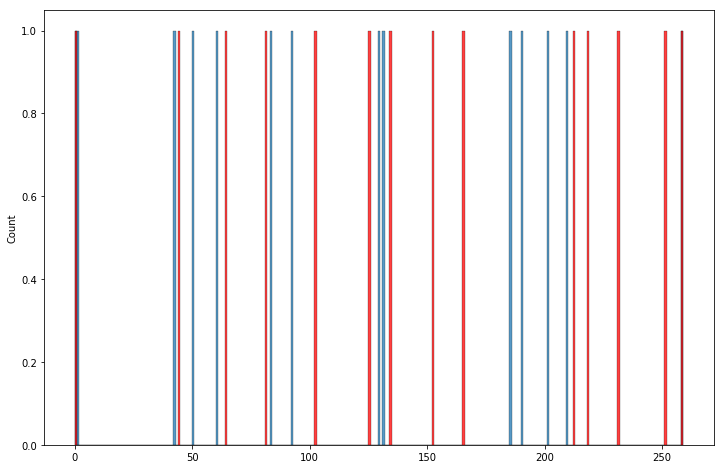

Spectrum num=2505, size=169, matched=29, frac=0.17159763313609466


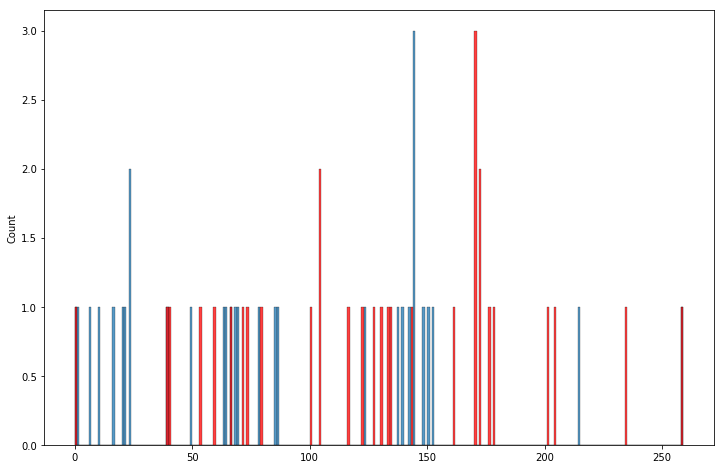

Spectrum num=2508, size=610, matched=111, frac=0.1819672131147541


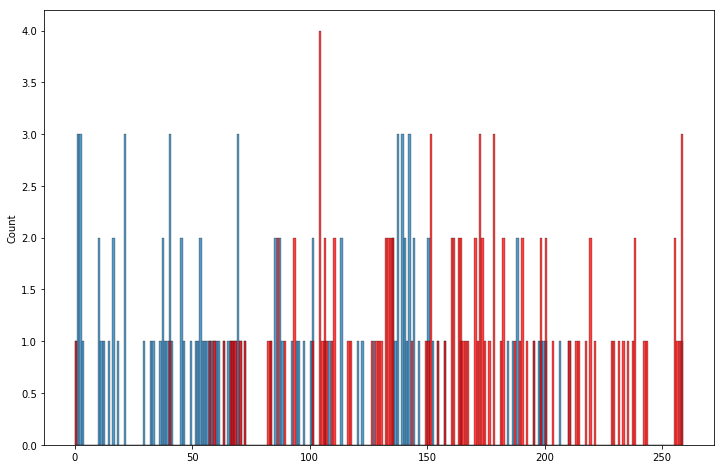

Spectrum num=2511, size=124, matched=13, frac=0.10483870967741936


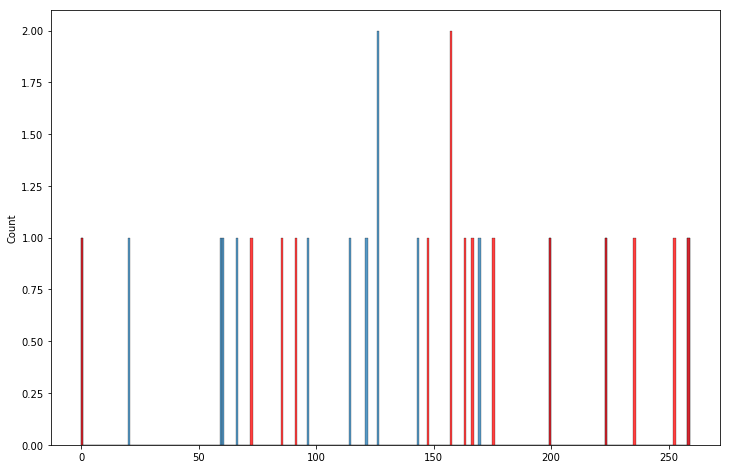

Spectrum num=2515, size=211, matched=50, frac=0.23696682464454977


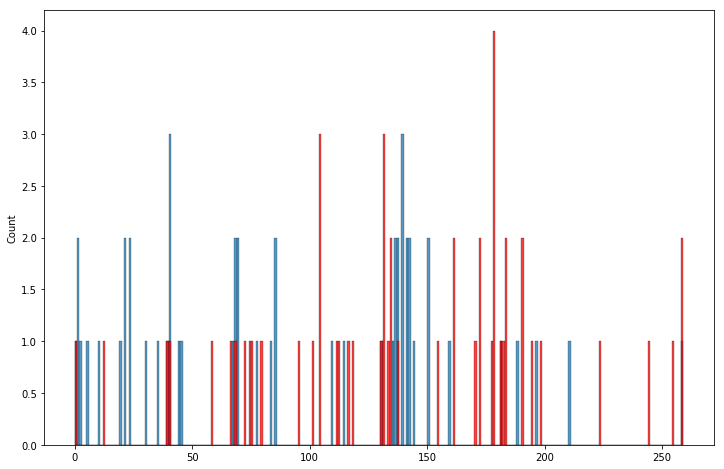

Spectrum num=2518, size=69, matched=8, frac=0.11594202898550725


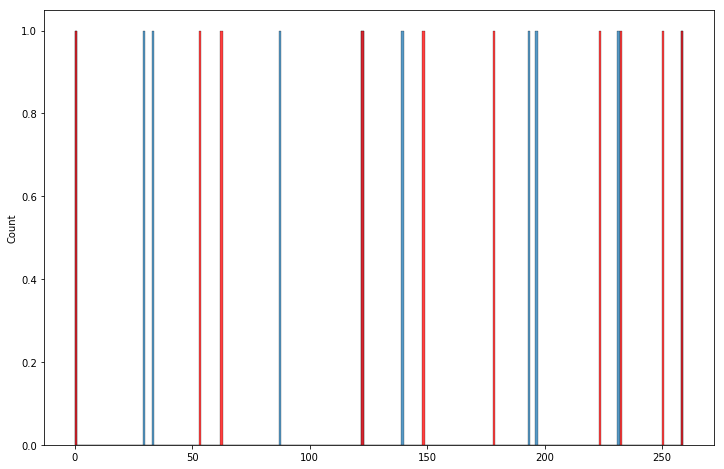

Spectrum num=2527, size=255, matched=57, frac=0.2235294117647059


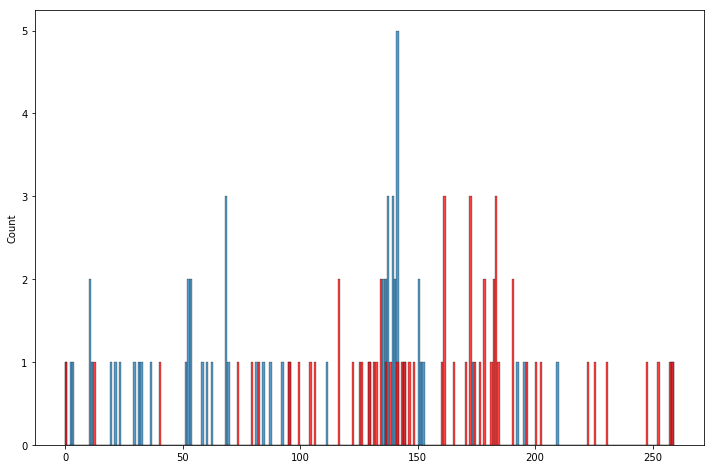

Spectrum num=2534, size=54, matched=3, frac=0.05555555555555555


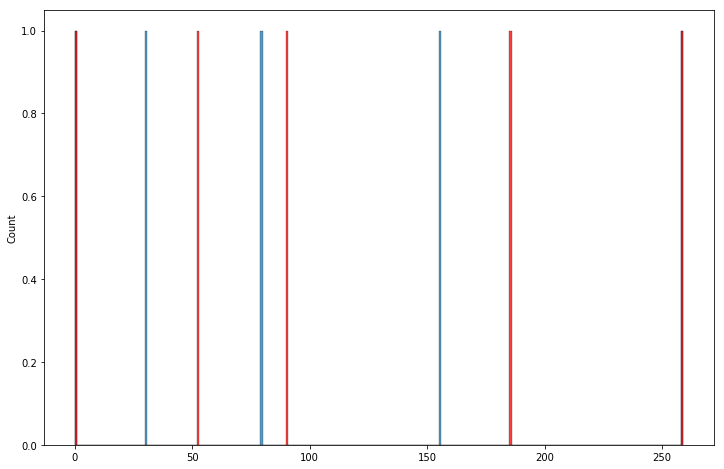

Spectrum num=2535, size=111, matched=13, frac=0.11711711711711711


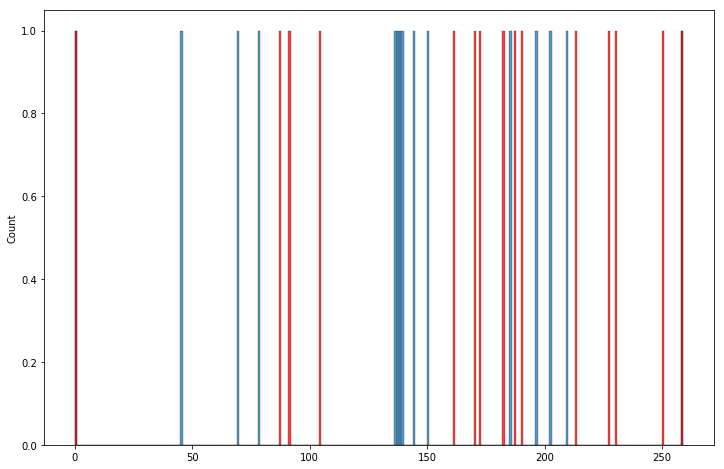

Spectrum num=2536, size=92, matched=23, frac=0.25


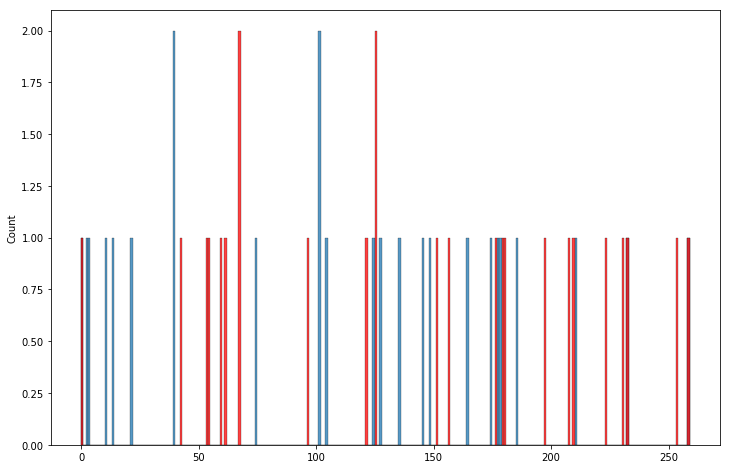

Spectrum num=2543, size=105, matched=15, frac=0.14285714285714285


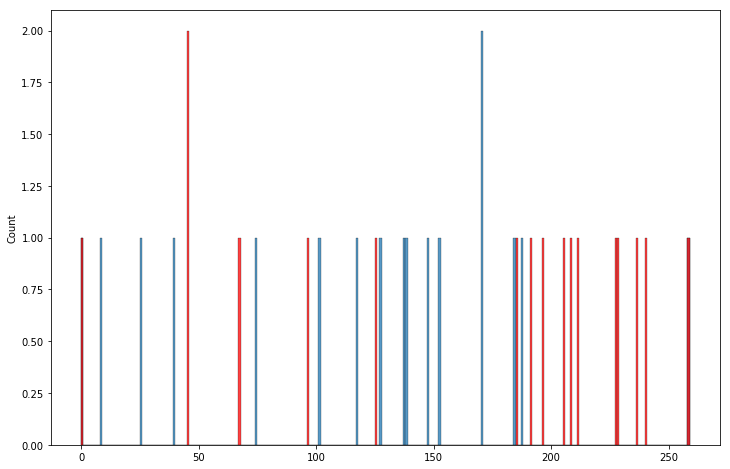

Spectrum num=2544, size=264, matched=63, frac=0.23863636363636365


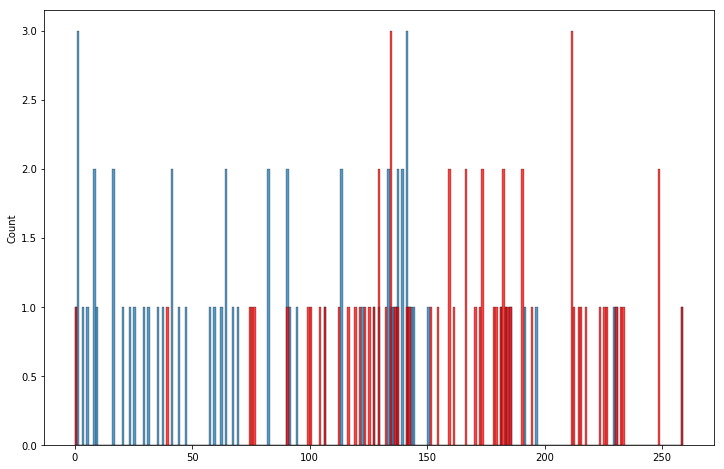

Spectrum num=2554, size=50, matched=6, frac=0.12


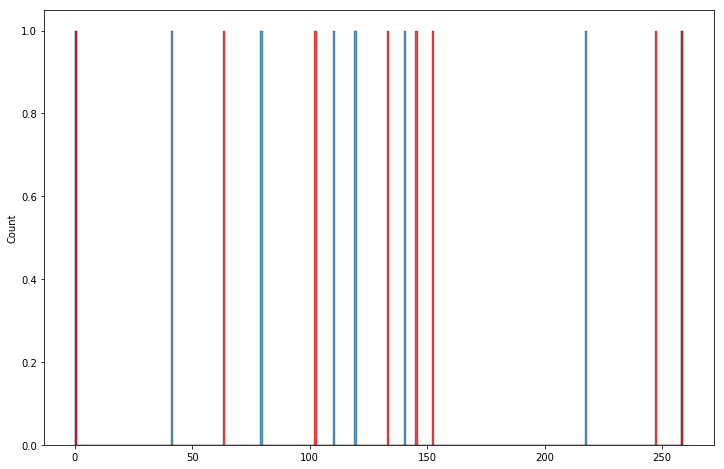

Spectrum num=2565, size=94, matched=12, frac=0.1276595744680851


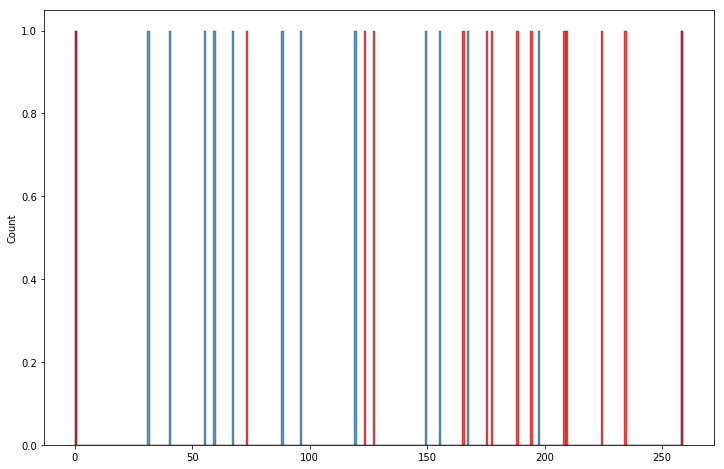

Spectrum num=2567, size=65, matched=7, frac=0.1076923076923077


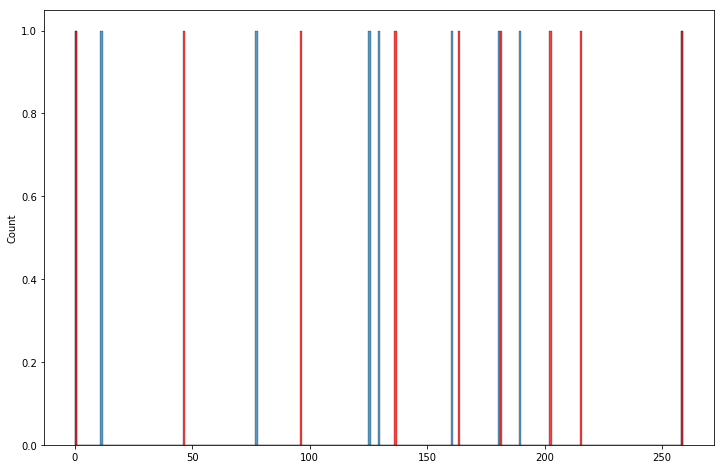

Spectrum num=2575, size=416, matched=71, frac=0.17067307692307693


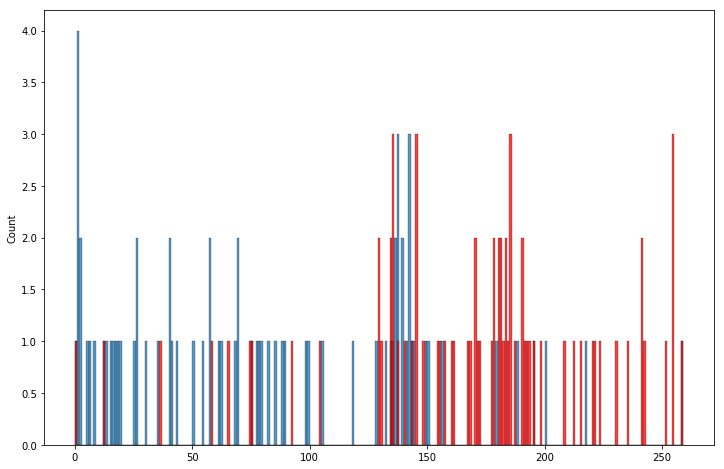

Spectrum num=2576, size=62, matched=5, frac=0.08064516129032258


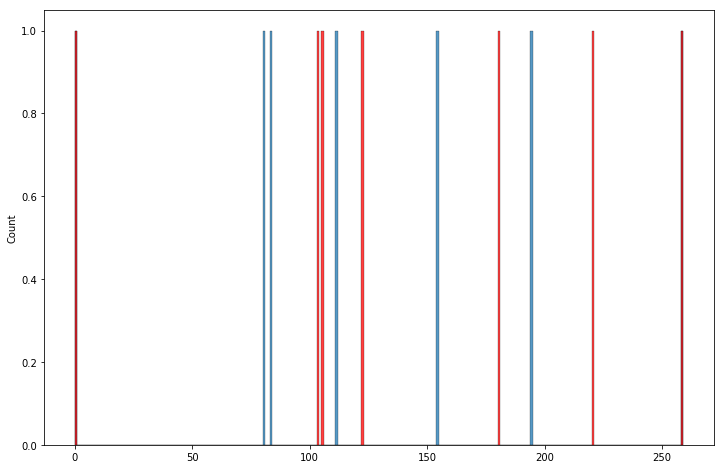

Spectrum num=2577, size=69, matched=13, frac=0.18840579710144928


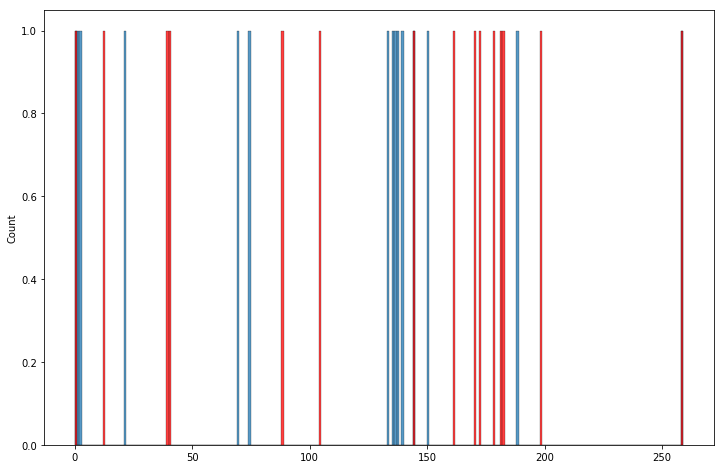

Spectrum num=2583, size=55, matched=6, frac=0.10909090909090909


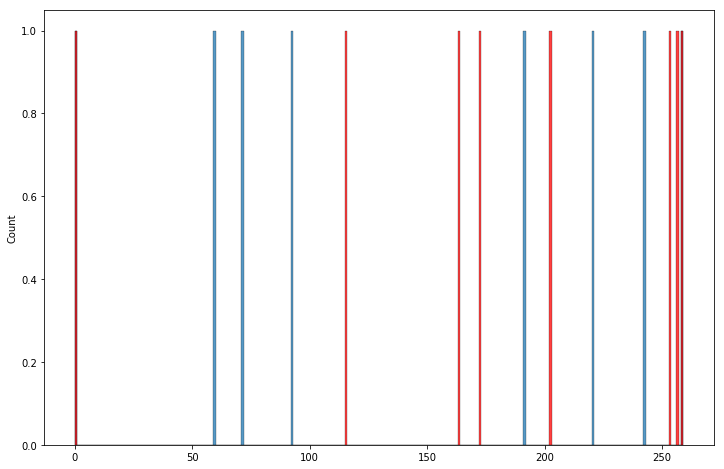

Spectrum num=2590, size=202, matched=38, frac=0.18811881188118812


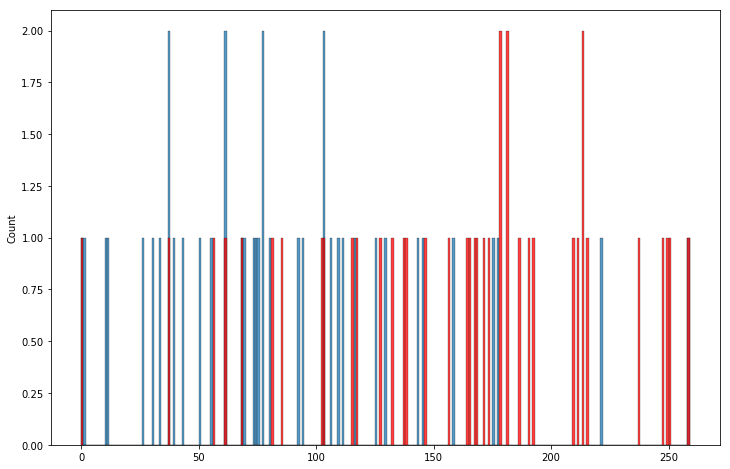

Spectrum num=2593, size=107, matched=20, frac=0.18691588785046728


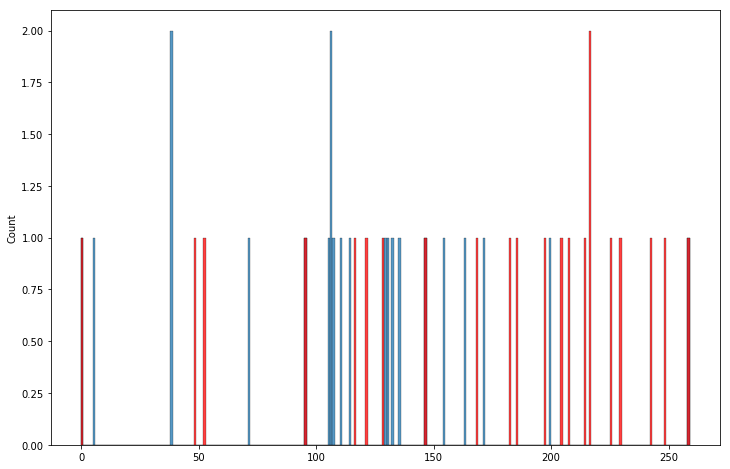

Spectrum num=2594, size=270, matched=63, frac=0.23333333333333334


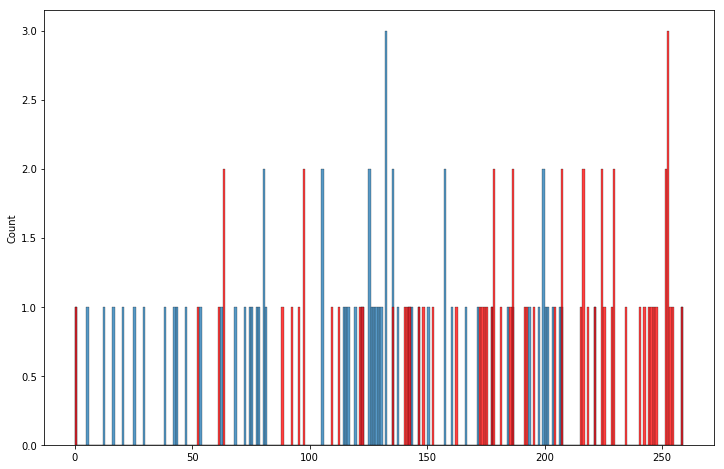

Spectrum num=2603, size=584, matched=102, frac=0.17465753424657535


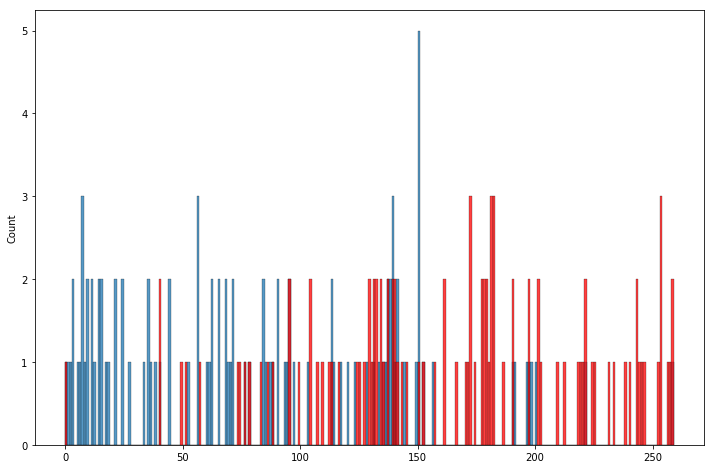

Spectrum num=2607, size=75, matched=1, frac=0.013333333333333334


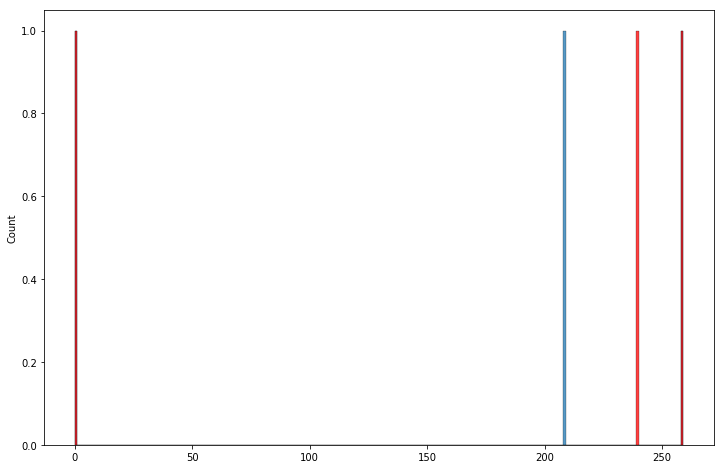

Spectrum num=2608, size=86, matched=12, frac=0.13953488372093023


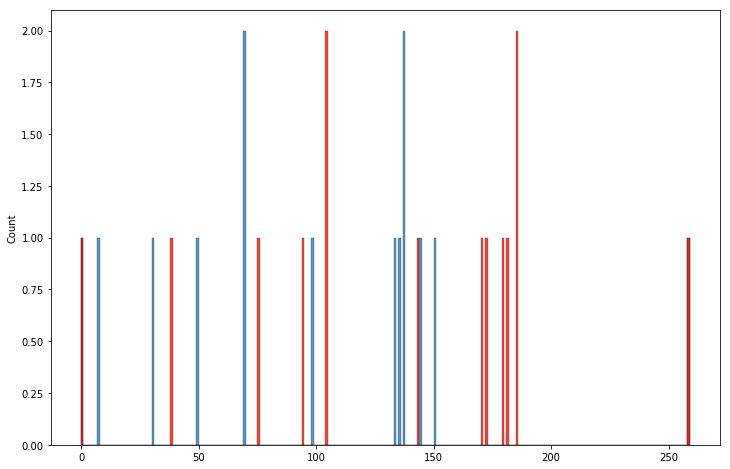

Spectrum num=2614, size=84, matched=10, frac=0.11904761904761904


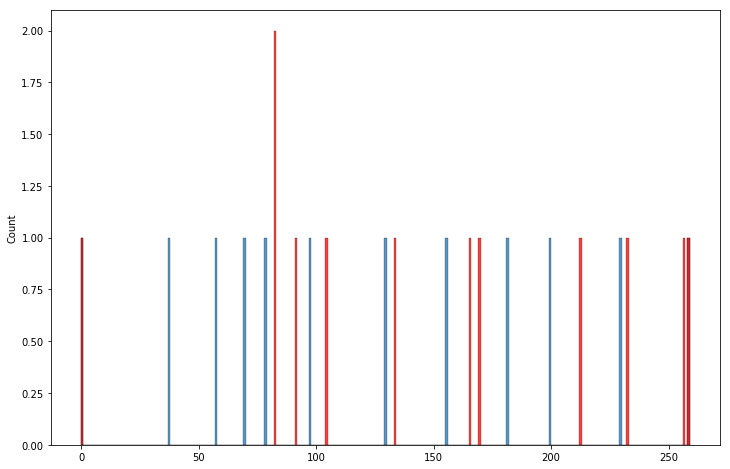

Spectrum num=2617, size=123, matched=20, frac=0.16260162601626016


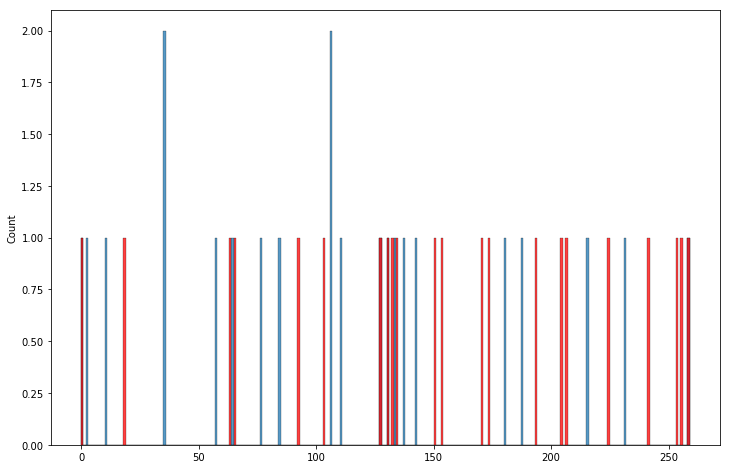

Spectrum num=2633, size=181, matched=27, frac=0.14917127071823205


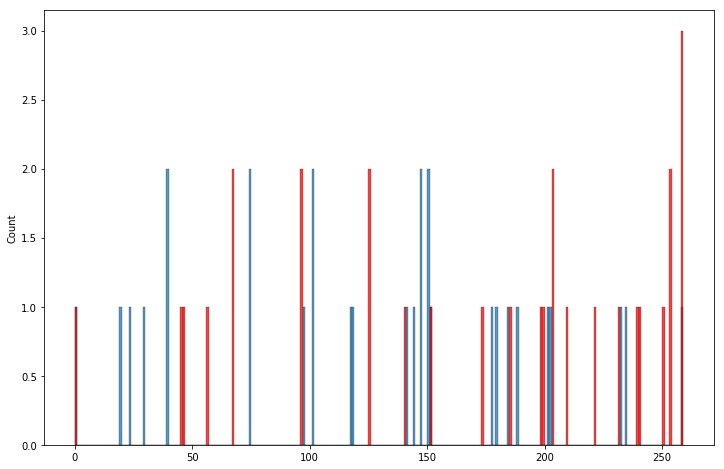

Spectrum num=2637, size=64, matched=9, frac=0.140625


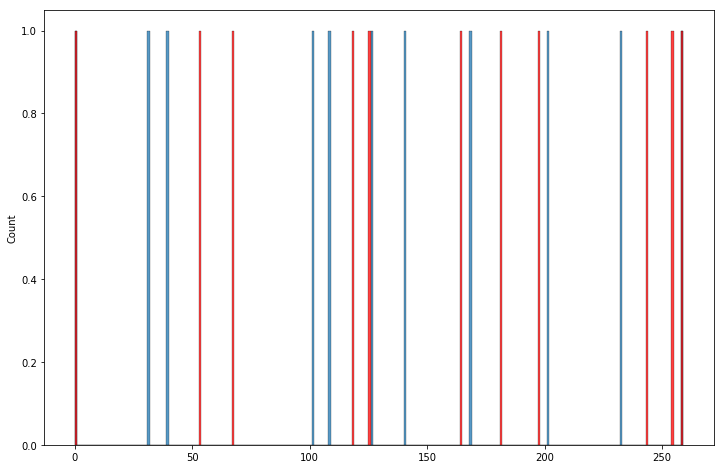

Spectrum num=2651, size=255, matched=45, frac=0.17647058823529413


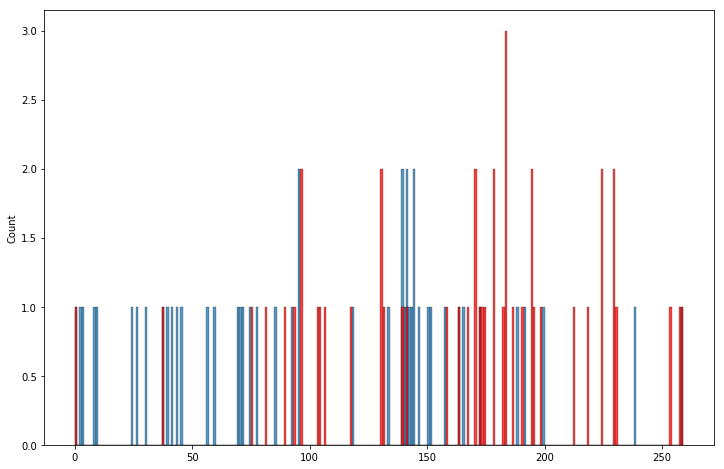

Spectrum num=2659, size=84, matched=12, frac=0.14285714285714285


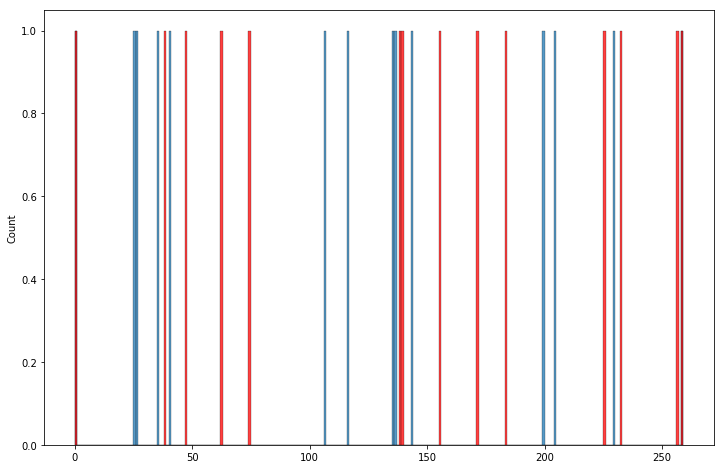

Spectrum num=2665, size=104, matched=12, frac=0.11538461538461539


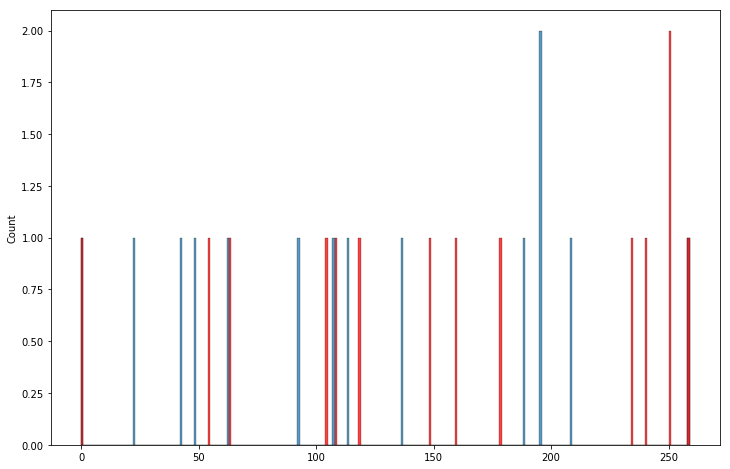

Spectrum num=2682, size=243, matched=51, frac=0.20987654320987653


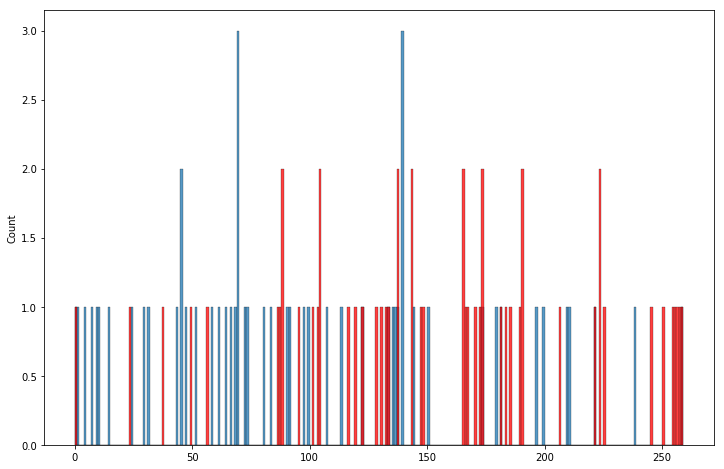

Spectrum num=2693, size=70, matched=10, frac=0.14285714285714285


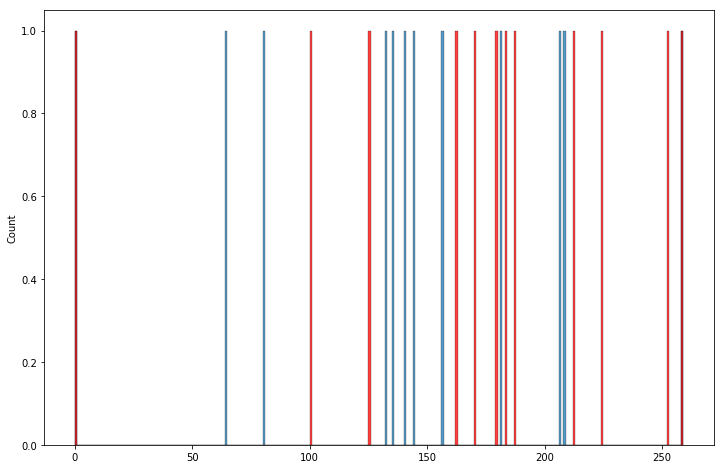

Spectrum num=2710, size=56, matched=3, frac=0.05357142857142857


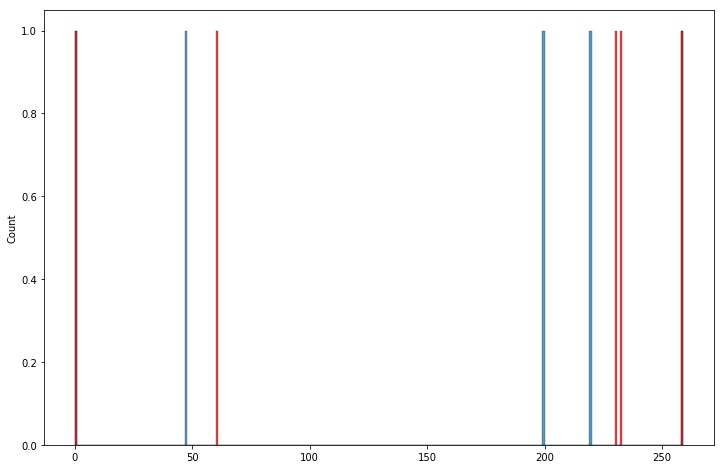

Spectrum num=2738, size=155, matched=19, frac=0.12258064516129032


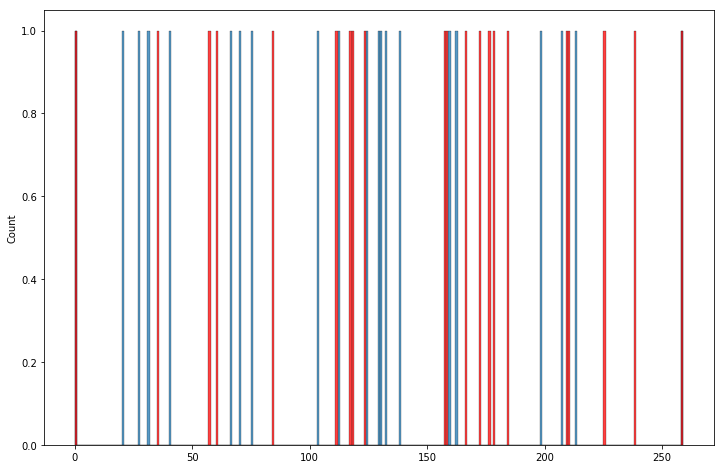

Spectrum num=2740, size=170, matched=18, frac=0.10588235294117647


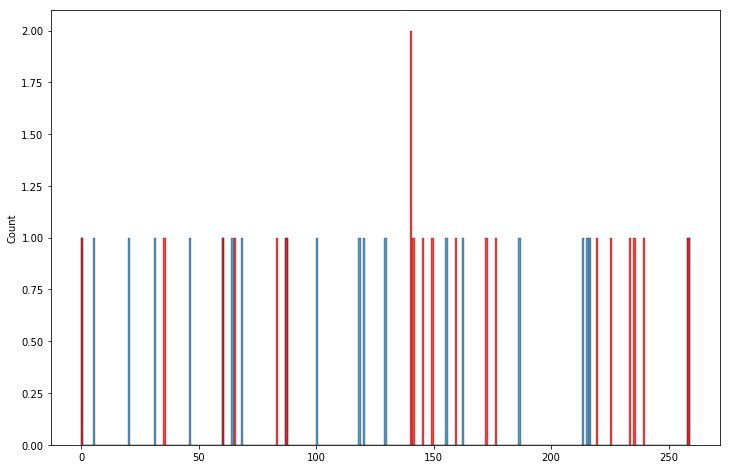

Spectrum num=2763, size=60, matched=6, frac=0.1


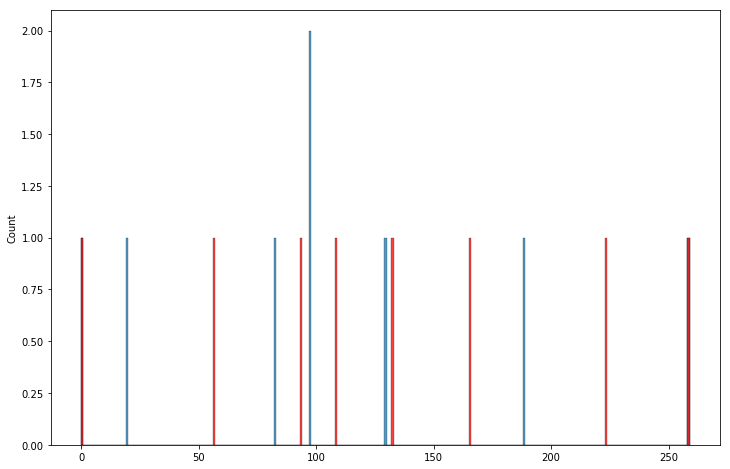

Spectrum num=2790, size=162, matched=17, frac=0.10493827160493827


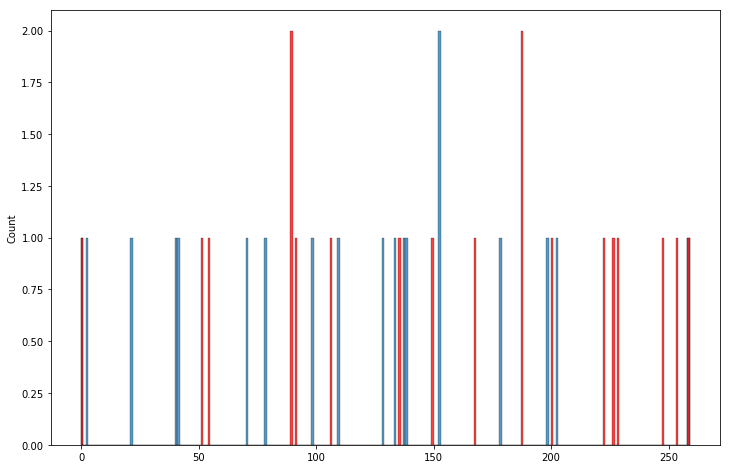

Spectrum num=2797, size=56, matched=4, frac=0.07142857142857142


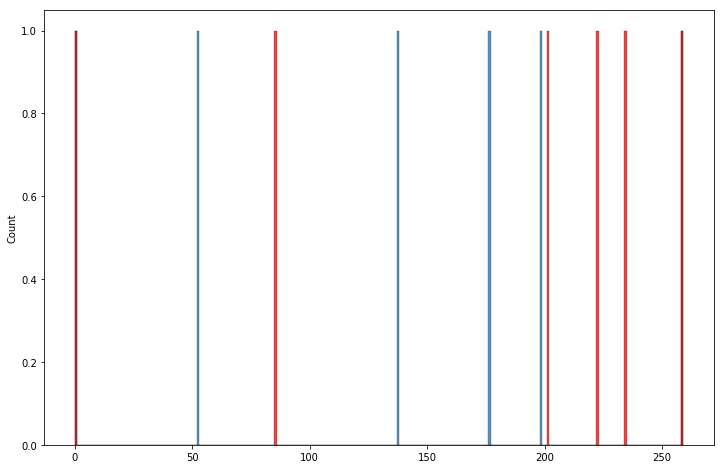

Spectrum num=2814, size=180, matched=27, frac=0.15


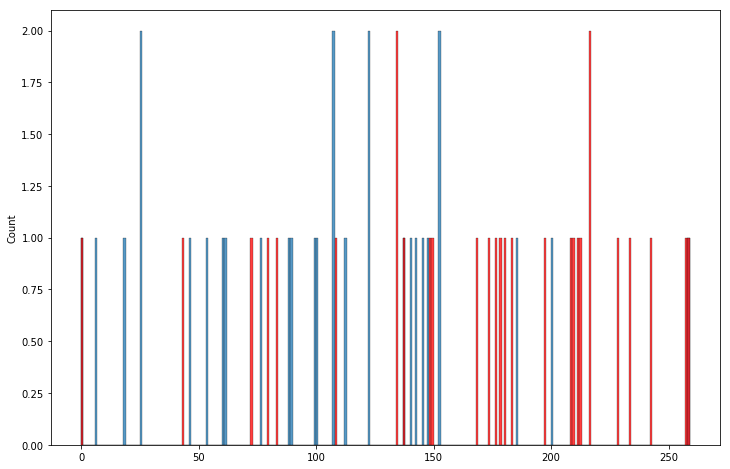

Spectrum num=2831, size=54, matched=6, frac=0.1111111111111111


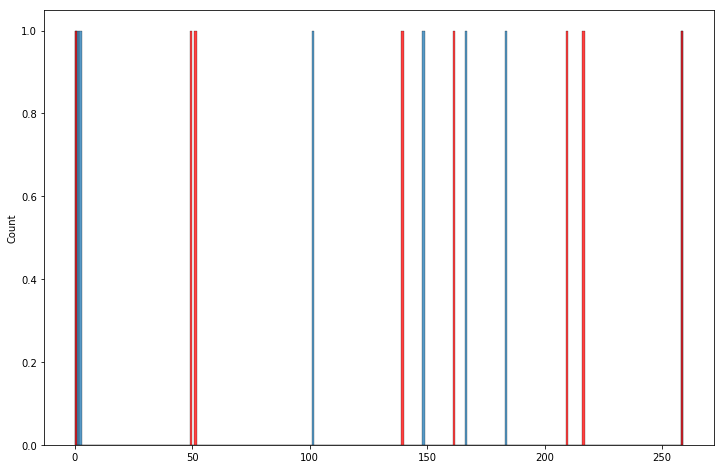

Spectrum num=2845, size=61, matched=12, frac=0.19672131147540983


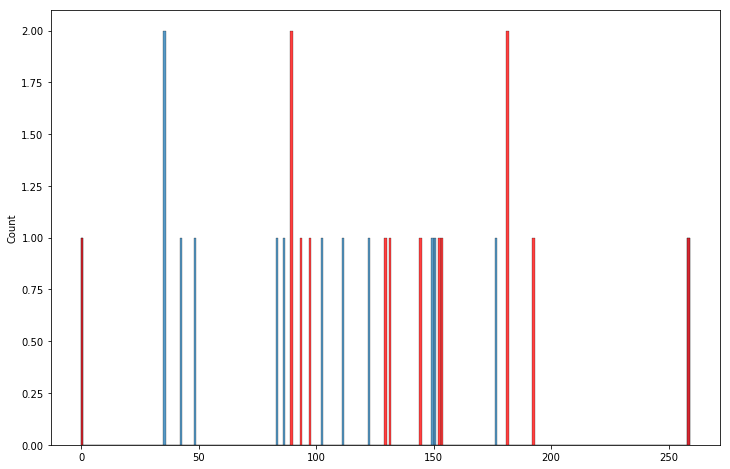

Spectrum num=2848, size=162, matched=43, frac=0.2654320987654321


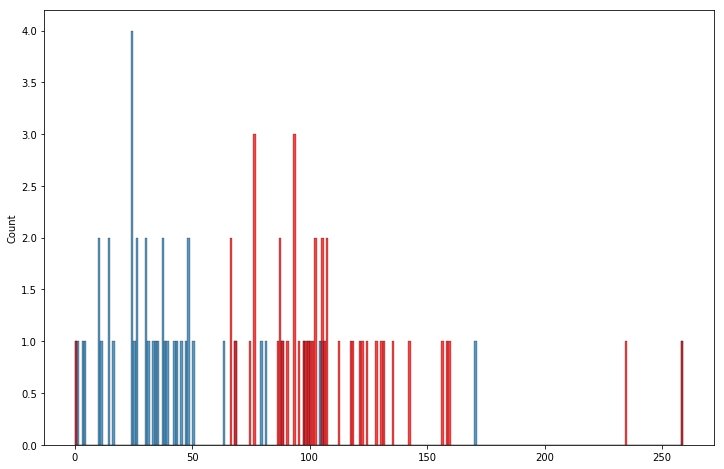

Spectrum num=2849, size=81, matched=17, frac=0.20987654320987653


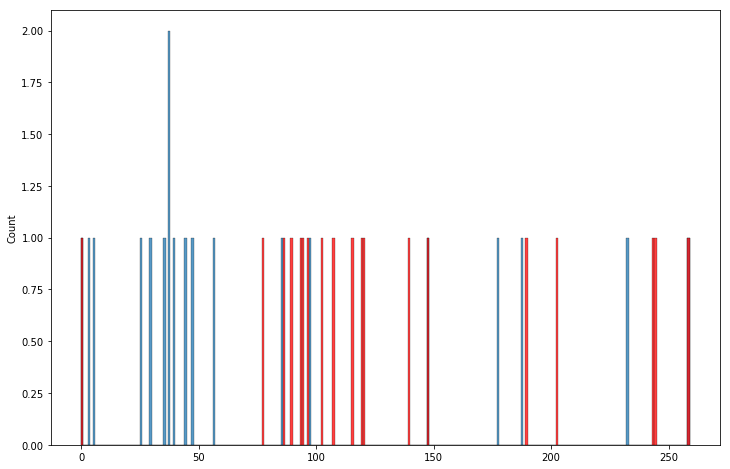

Spectrum num=2851, size=104, matched=28, frac=0.2692307692307692


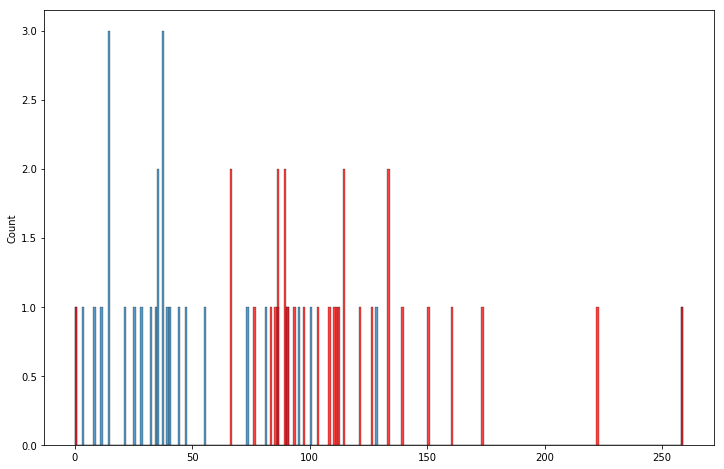

Spectrum num=2854, size=85, matched=12, frac=0.1411764705882353


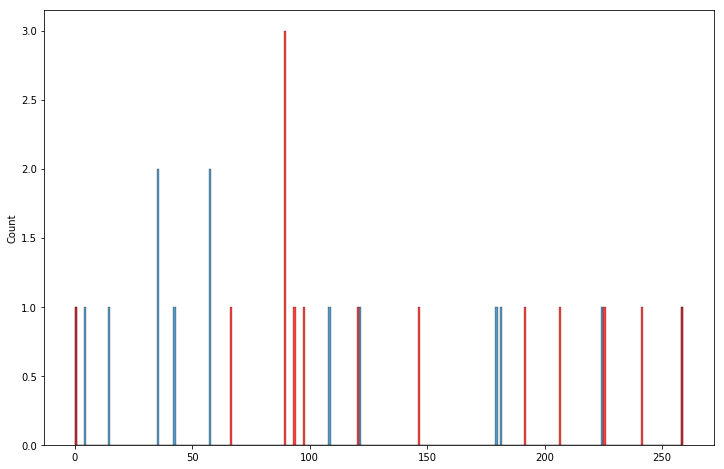

Spectrum num=2860, size=86, matched=12, frac=0.13953488372093023


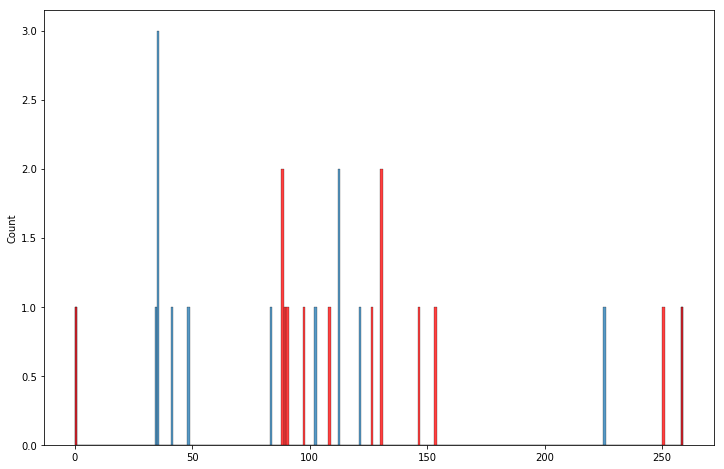

In [202]:
from random import randint


def filter_repeating_matches(matches):
    result = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            
            is_bad = False
            for match1 in matched:
                if (match1['item2'] == match['item2']) and (match1['item1'] != match['item1']):
                    is_bad = True
                    break
            if not is_bad:
                result.append(match)
        else:
            result.append(match)
    return result


all_nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 50]

all_l_pos_all_nums = []
all_r_pos_all_nums = []

# for _ in range(10):
#     num = nums[randint(0, len(nums) - 1)]

ions = get_ions(sequence,
                prefix=False,
                suffix=False,
                middle=True,
                min_length=10,
                include_loose_molecules=True,
                max_deconv_err=0
               )

for num in all_nums:
    item = get_msalign_spec(num)

    matched = match_items(ions, 'mass_0', item['m_array'], None, err=5)
    matched = filter_repeating_matches(matched)
#     if len(matched) / len(item["m_array"]) < 0.05:
#         continue
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    l_pos = []
    r_pos = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            l_pos.append(l)
            r_pos.append(r)
        
    all_l_pos_all_nums.extend(l_pos)
    all_r_pos_all_nums.extend(r_pos)
          
    plt.figure(figsize=(12, 8))
    sns.histplot(l_pos + [0, len(sequence)], bins=len(sequence))
    sns.histplot(r_pos + [0, len(sequence)], bins=len(sequence), color='r')
    plt.show()

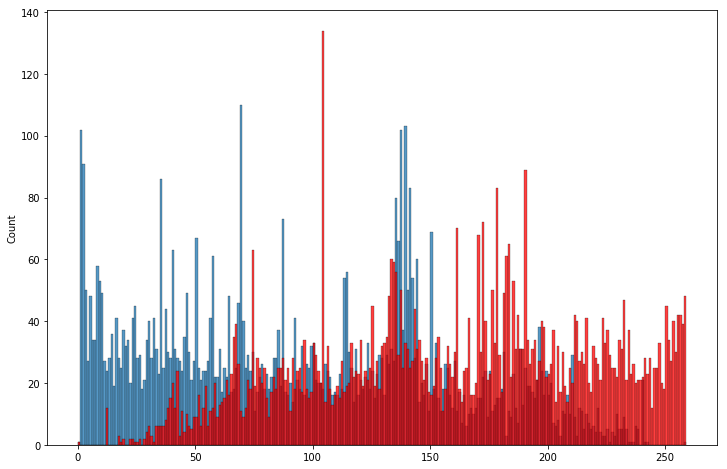

In [203]:
plt.figure(figsize=(12, 8))
sns.histplot(all_l_pos_all_nums + [0, len(sequence)], bins=len(sequence))
sns.histplot(all_r_pos_all_nums + [0, len(sequence)], bins=len(sequence), color='r')
plt.show()

In [400]:
interesting_nums = [821, 823, 839, 875, 879, 911, 915, 948, 995, 1066, 1074, 1076, 1078, 1103, 1220, 1275, 1288, 1293, 1294, 1319, 1327, 1344, 1357, 1443, 1633, 1663, 1667, 1668, 1670, 1687, 1688, 2058, 2086, 2129, 2254, 2255, 2274, 2302, 2309, 2310, 2311, 2313, 2314, 2316, 2318, 2322, 2323, 2324, 2326, 2327, 2329, 2331, 2332, 2340, 2345, 2385, 2408, 2417, 2419, 2431, 2437, 2439, 2450, 2458, 2462, 2464, 2466, 2467, 2468, 2475, 2479, 2482, 2490, 2502, 2505, 2508, 2515, 2527, 2535, 2544, 2575, 2577, 2603, 2608, 2614, 2651, 2682, 2693, 2848, 2849, 2851]

Spectrum num=821, size=64, matched=12, frac=0.1875
Spectrum num=821, size=64, matched=8, frac=0.125


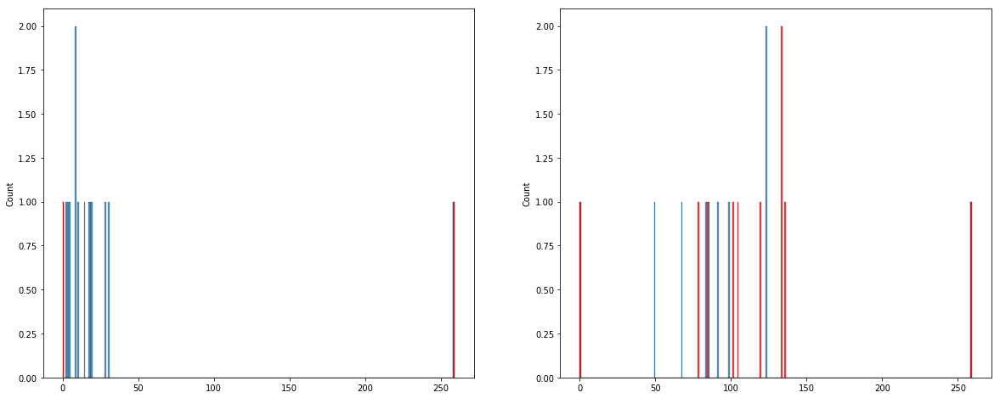

<Figure size 864x576 with 0 Axes>

Spectrum num=823, size=68, matched=32, frac=0.47058823529411764
Spectrum num=823, size=68, matched=12, frac=0.17647058823529413


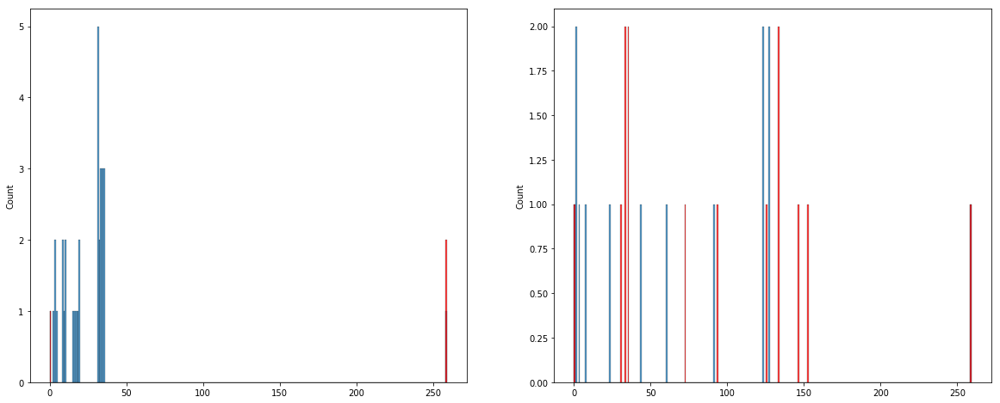

<Figure size 864x576 with 0 Axes>

Spectrum num=839, size=69, matched=37, frac=0.5362318840579711
Spectrum num=839, size=69, matched=11, frac=0.15942028985507245


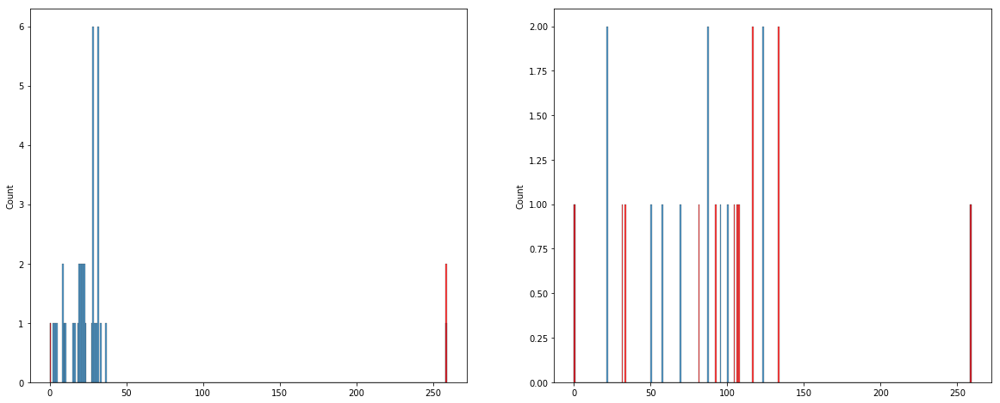

<Figure size 864x576 with 0 Axes>

Spectrum num=875, size=69, matched=36, frac=0.5217391304347826
Spectrum num=875, size=69, matched=11, frac=0.15942028985507245


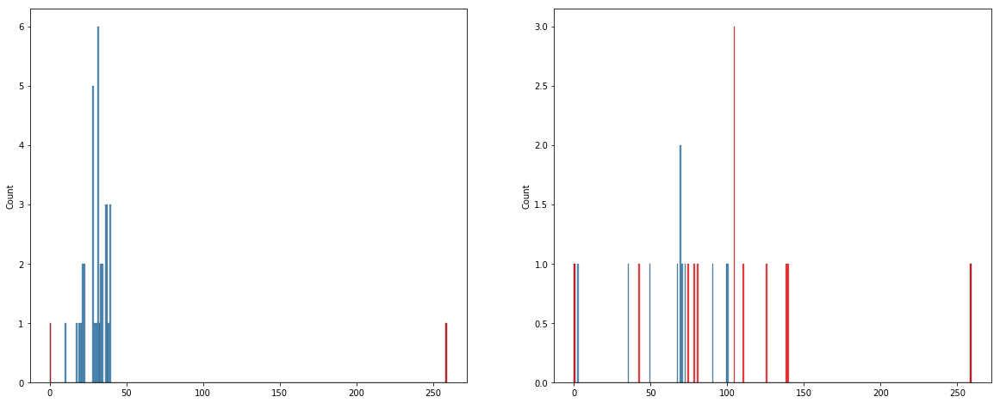

<Figure size 864x576 with 0 Axes>

Spectrum num=879, size=77, matched=22, frac=0.2857142857142857
Spectrum num=879, size=77, matched=9, frac=0.11688311688311688


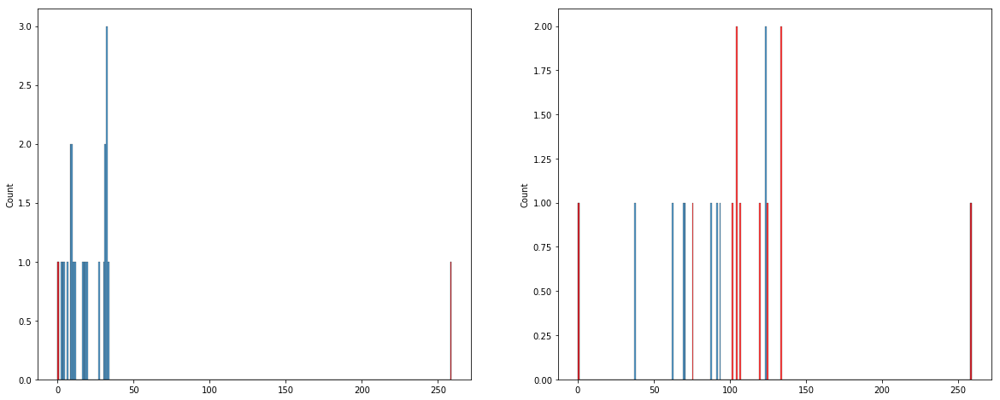

<Figure size 864x576 with 0 Axes>

Spectrum num=911, size=63, matched=1, frac=0.015873015873015872
Spectrum num=911, size=63, matched=25, frac=0.3968253968253968


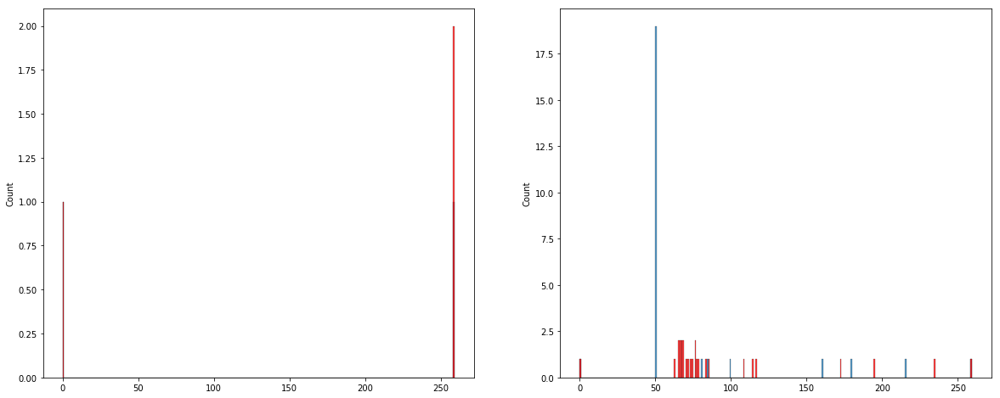

<Figure size 864x576 with 0 Axes>

Spectrum num=915, size=63, matched=1, frac=0.015873015873015872
Spectrum num=915, size=63, matched=24, frac=0.38095238095238093


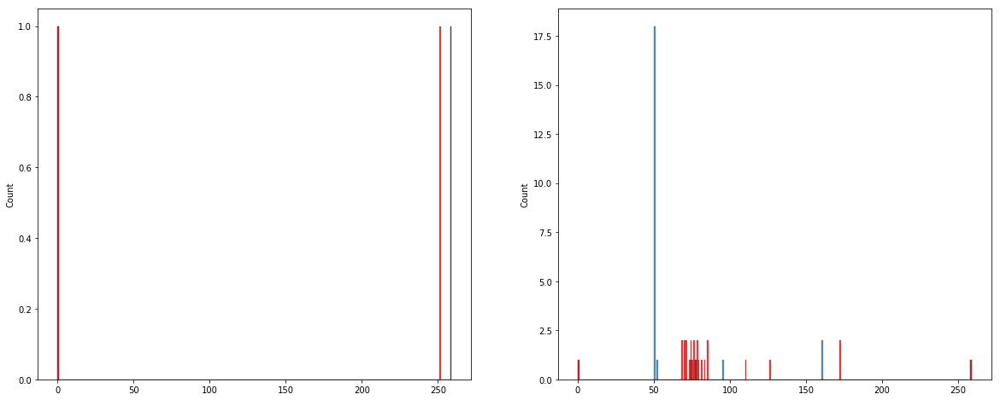

<Figure size 864x576 with 0 Axes>

Spectrum num=948, size=53, matched=0, frac=0.0
Spectrum num=948, size=53, matched=21, frac=0.39622641509433965


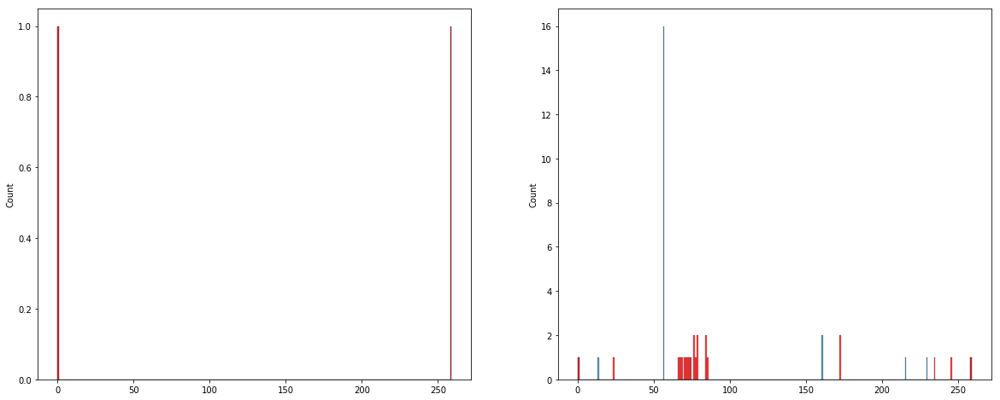

<Figure size 864x576 with 0 Axes>

Spectrum num=995, size=50, matched=1, frac=0.02
Spectrum num=995, size=50, matched=12, frac=0.24


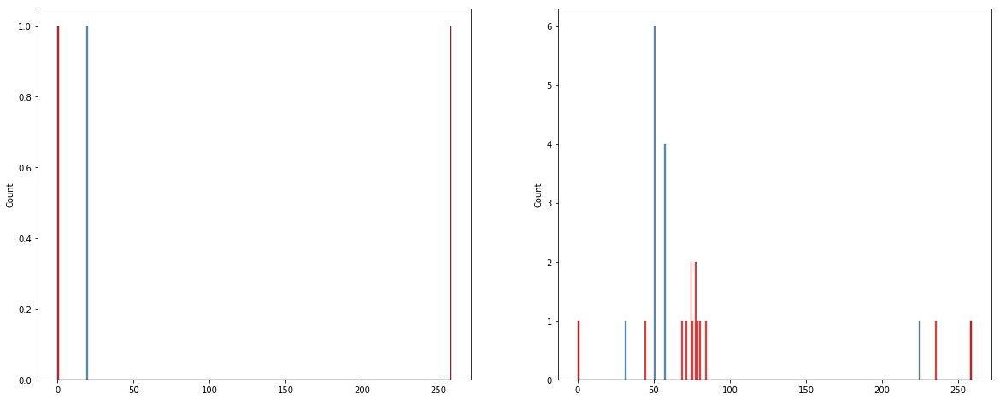

<Figure size 864x576 with 0 Axes>

Spectrum num=1066, size=71, matched=3, frac=0.04225352112676056
Spectrum num=1066, size=71, matched=23, frac=0.323943661971831


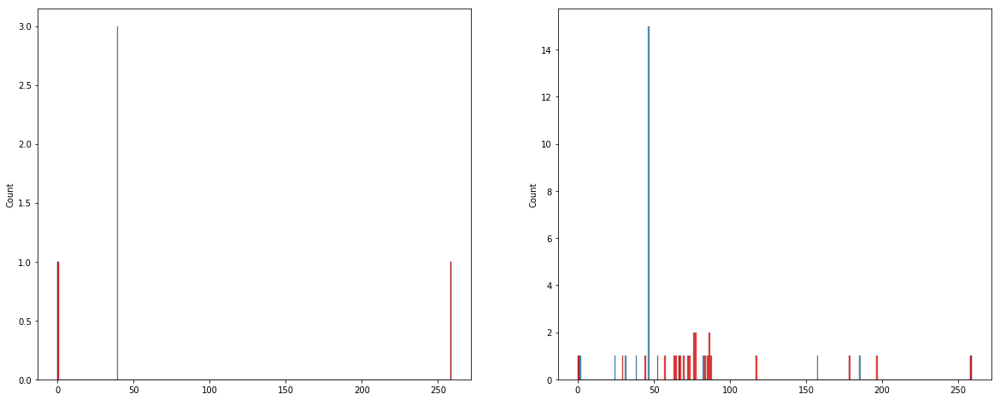

<Figure size 864x576 with 0 Axes>

Spectrum num=1074, size=75, matched=44, frac=0.5866666666666667
Spectrum num=1074, size=75, matched=18, frac=0.24


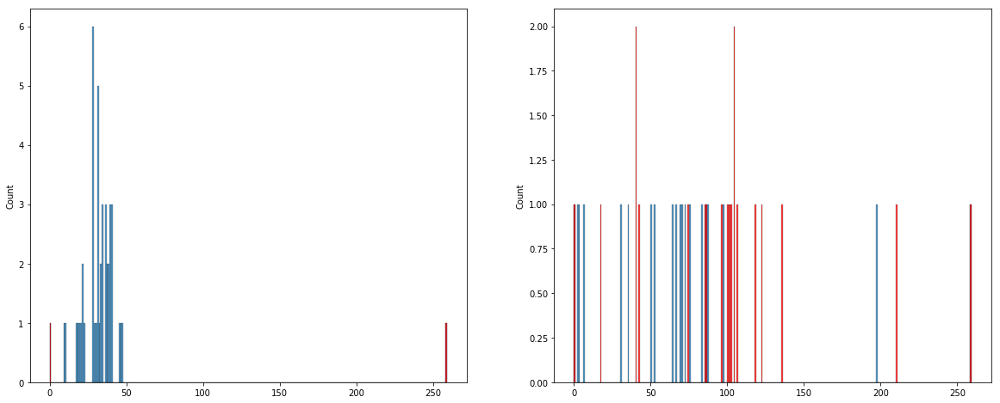

<Figure size 864x576 with 0 Axes>

Spectrum num=1076, size=88, matched=57, frac=0.6477272727272727
Spectrum num=1076, size=88, matched=13, frac=0.14772727272727273


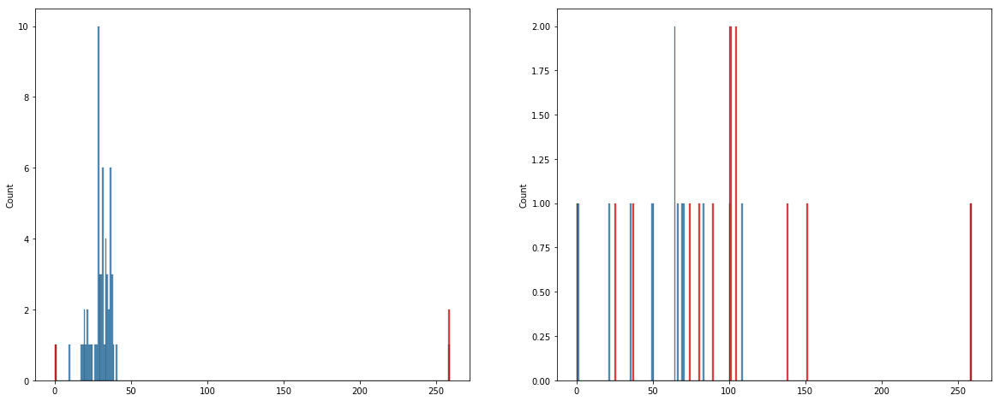

<Figure size 864x576 with 0 Axes>

Spectrum num=1078, size=55, matched=3, frac=0.05454545454545454
Spectrum num=1078, size=55, matched=21, frac=0.38181818181818183


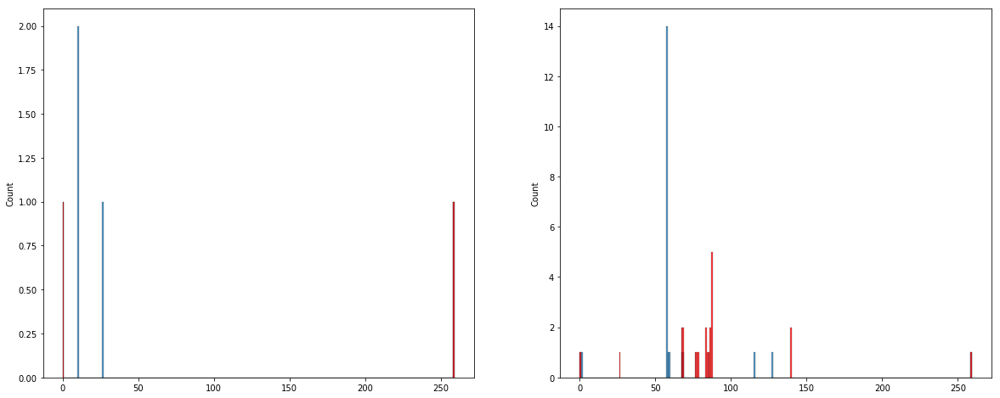

<Figure size 864x576 with 0 Axes>

Spectrum num=1103, size=87, matched=47, frac=0.5402298850574713
Spectrum num=1103, size=87, matched=18, frac=0.20689655172413793


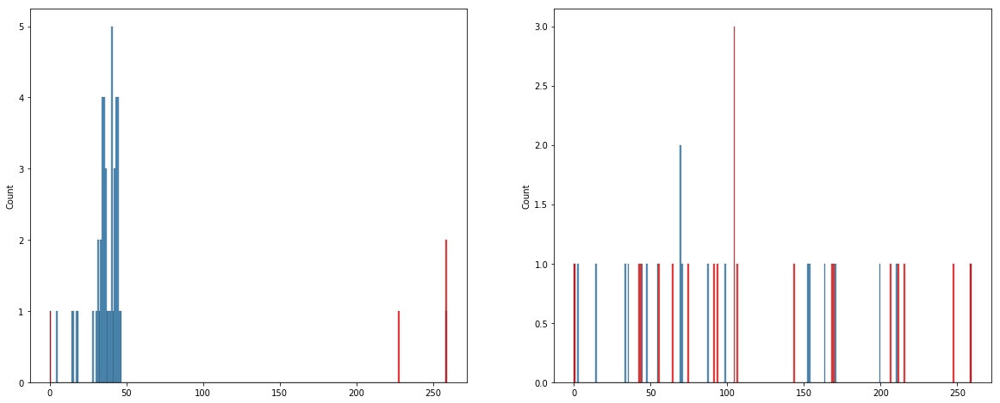

<Figure size 864x576 with 0 Axes>

Spectrum num=1220, size=69, matched=0, frac=0.0
Spectrum num=1220, size=69, matched=14, frac=0.2028985507246377


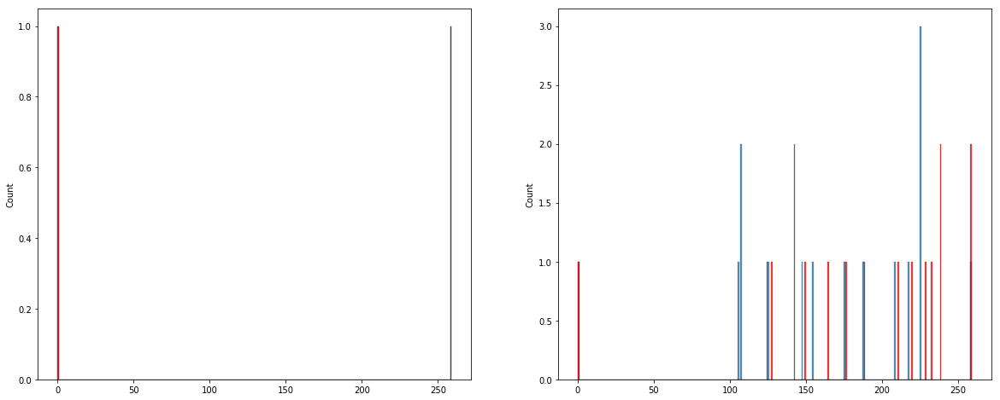

<Figure size 864x576 with 0 Axes>

Spectrum num=1275, size=90, matched=56, frac=0.6222222222222222
Spectrum num=1275, size=90, matched=13, frac=0.14444444444444443


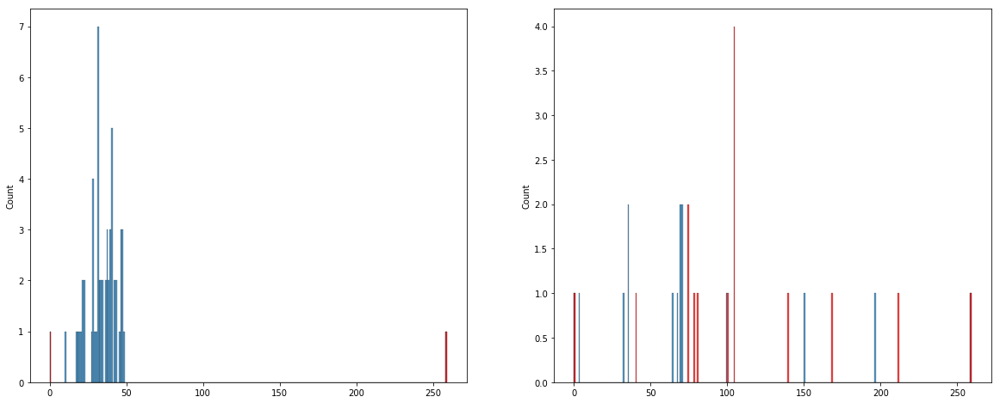

<Figure size 864x576 with 0 Axes>

Spectrum num=1288, size=150, matched=64, frac=0.4266666666666667
Spectrum num=1288, size=150, matched=40, frac=0.26666666666666666


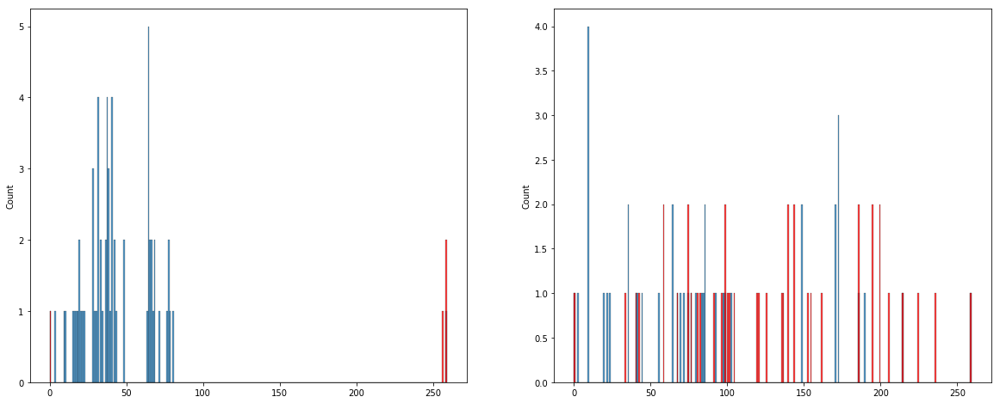

<Figure size 864x576 with 0 Axes>

Spectrum num=1293, size=145, matched=60, frac=0.41379310344827586
Spectrum num=1293, size=145, matched=38, frac=0.2620689655172414


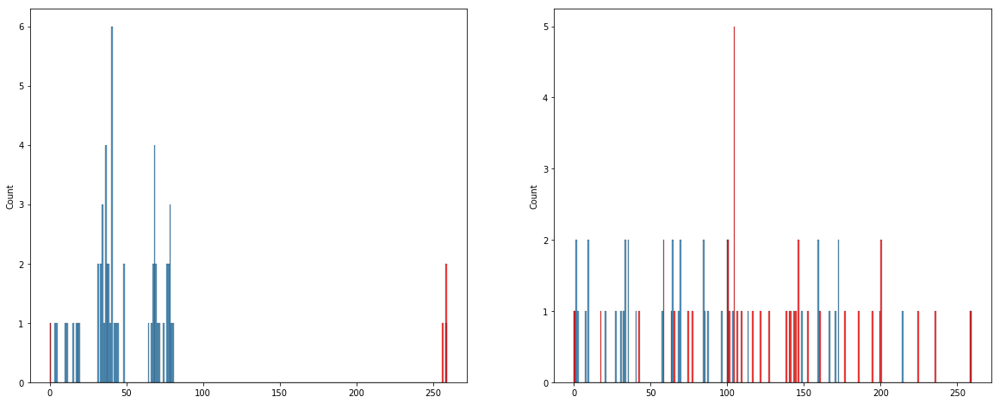

<Figure size 864x576 with 0 Axes>

Spectrum num=1294, size=126, matched=43, frac=0.3412698412698413
Spectrum num=1294, size=126, matched=32, frac=0.25396825396825395


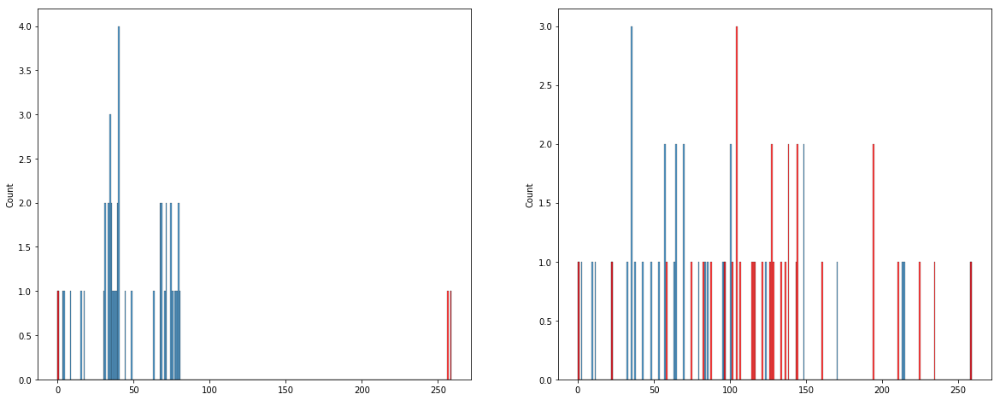

<Figure size 864x576 with 0 Axes>

Spectrum num=1319, size=107, matched=49, frac=0.45794392523364486
Spectrum num=1319, size=107, matched=24, frac=0.22429906542056074


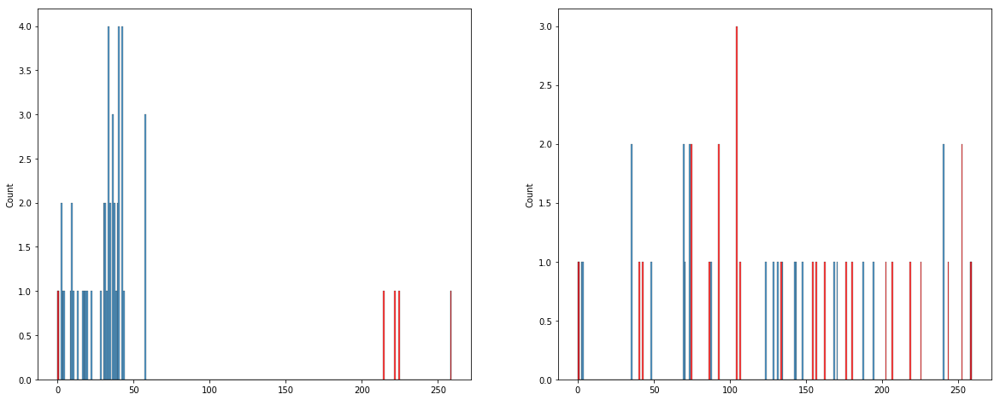

<Figure size 864x576 with 0 Axes>

Spectrum num=1327, size=94, matched=55, frac=0.5851063829787234
Spectrum num=1327, size=94, matched=16, frac=0.1702127659574468


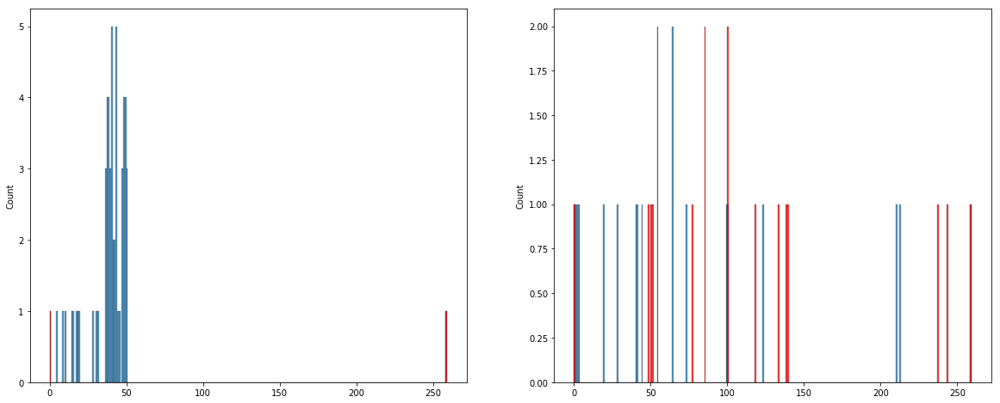

<Figure size 864x576 with 0 Axes>

Spectrum num=1344, size=63, matched=38, frac=0.6031746031746031
Spectrum num=1344, size=63, matched=11, frac=0.1746031746031746


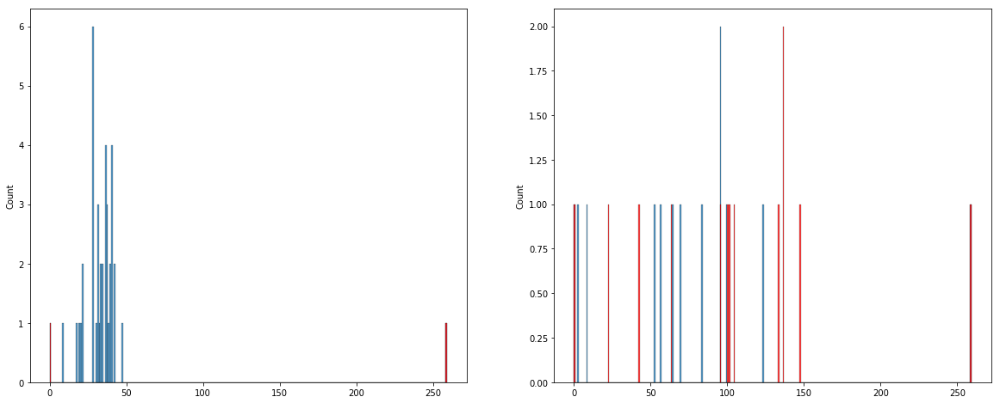

<Figure size 864x576 with 0 Axes>

Spectrum num=1357, size=162, matched=52, frac=0.32098765432098764
Spectrum num=1357, size=162, matched=28, frac=0.1728395061728395


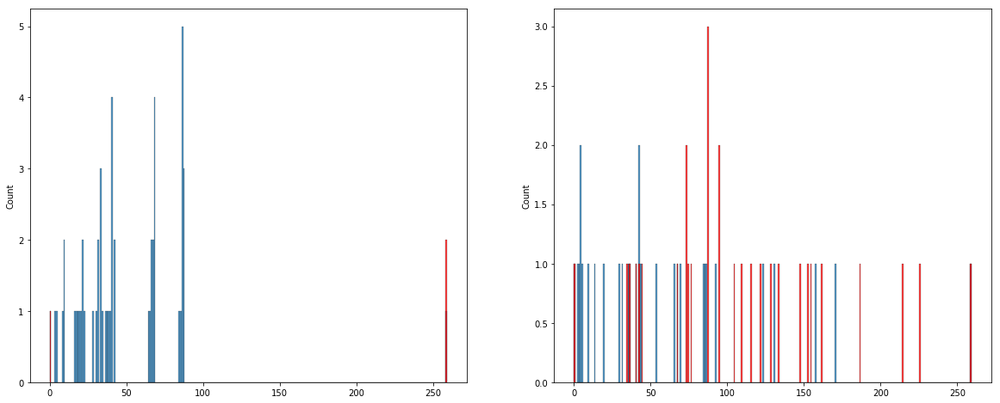

<Figure size 864x576 with 0 Axes>

Spectrum num=1443, size=184, matched=4, frac=0.021739130434782608
Spectrum num=1443, size=184, matched=53, frac=0.28804347826086957


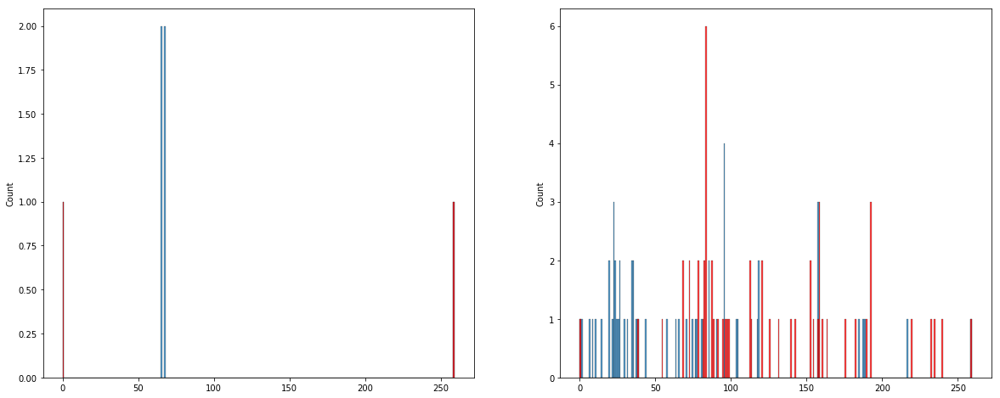

<Figure size 864x576 with 0 Axes>

Spectrum num=1633, size=347, matched=5, frac=0.01440922190201729
Spectrum num=1633, size=347, matched=90, frac=0.25936599423631124


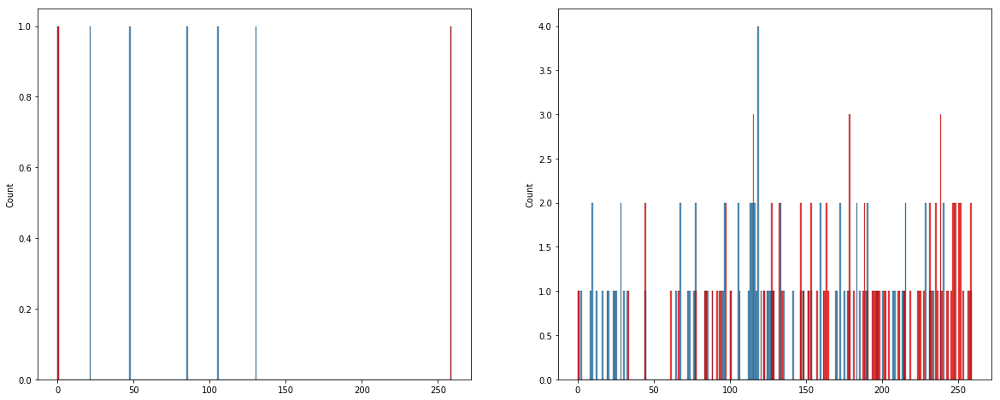

<Figure size 864x576 with 0 Axes>

Spectrum num=1663, size=311, matched=89, frac=0.2861736334405145
Spectrum num=1663, size=311, matched=58, frac=0.1864951768488746


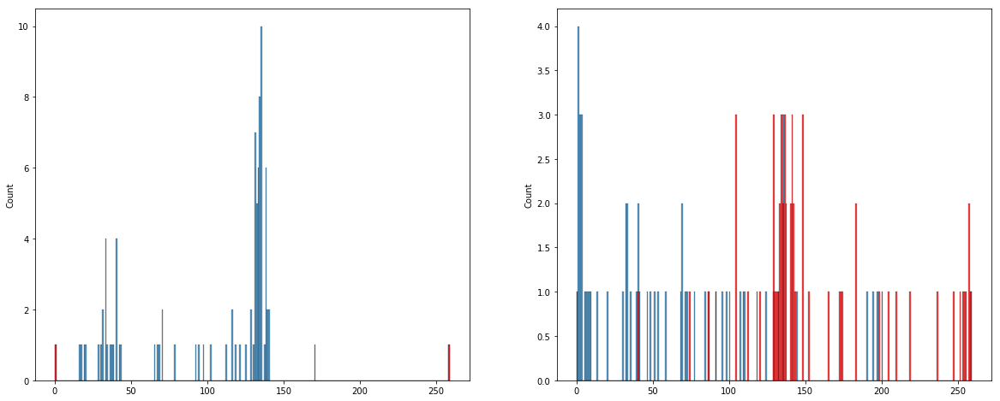

<Figure size 864x576 with 0 Axes>

Spectrum num=1667, size=57, matched=1, frac=0.017543859649122806
Spectrum num=1667, size=57, matched=13, frac=0.22807017543859648


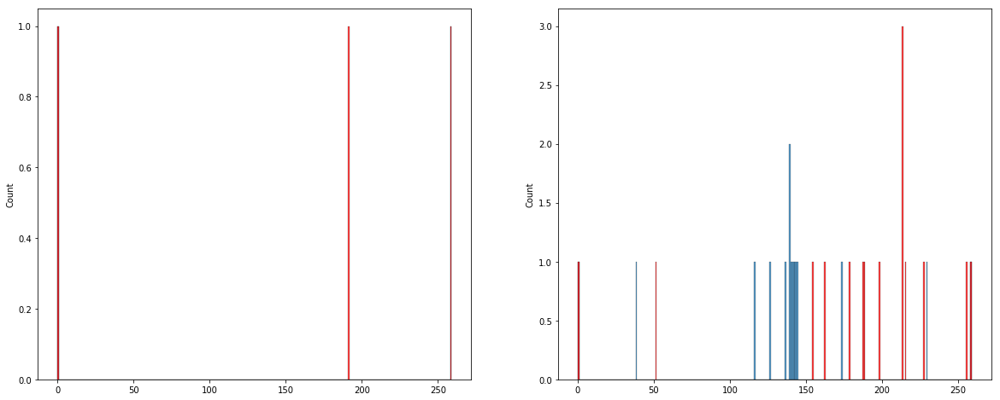

<Figure size 864x576 with 0 Axes>

Spectrum num=1668, size=133, matched=3, frac=0.022556390977443608
Spectrum num=1668, size=133, matched=28, frac=0.21052631578947367


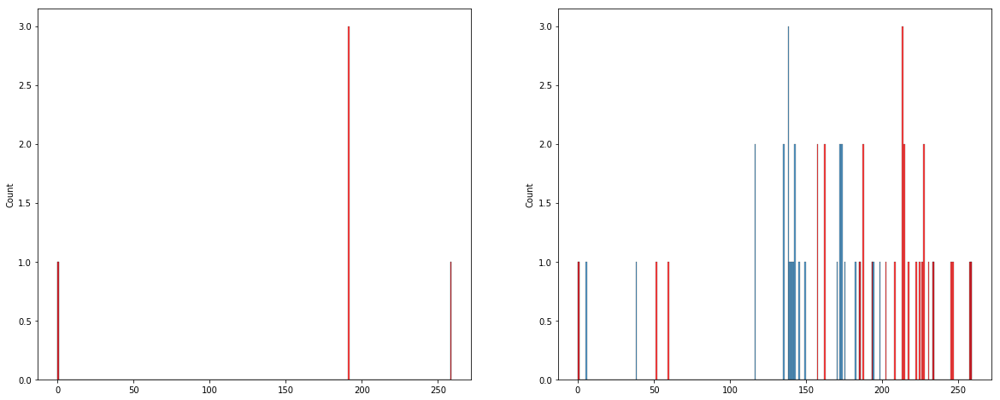

<Figure size 864x576 with 0 Axes>

Spectrum num=1670, size=140, matched=16, frac=0.11428571428571428
Spectrum num=1670, size=140, matched=25, frac=0.17857142857142858


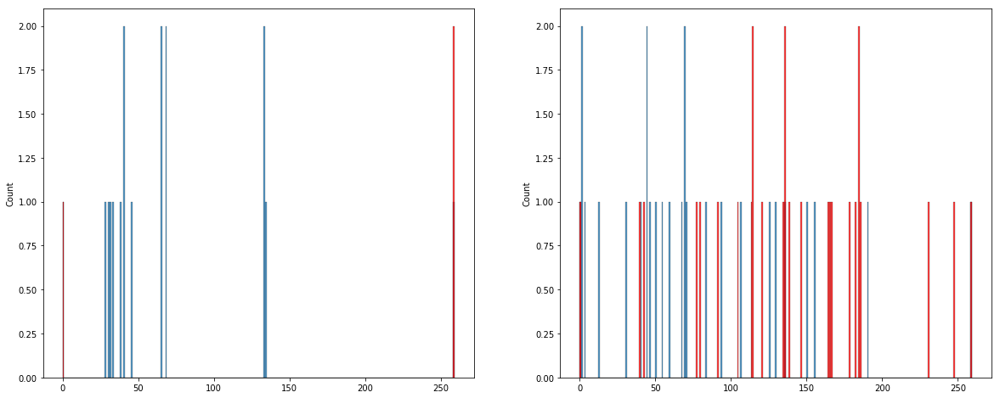

<Figure size 864x576 with 0 Axes>

Spectrum num=1687, size=138, matched=7, frac=0.050724637681159424
Spectrum num=1687, size=138, matched=32, frac=0.2318840579710145


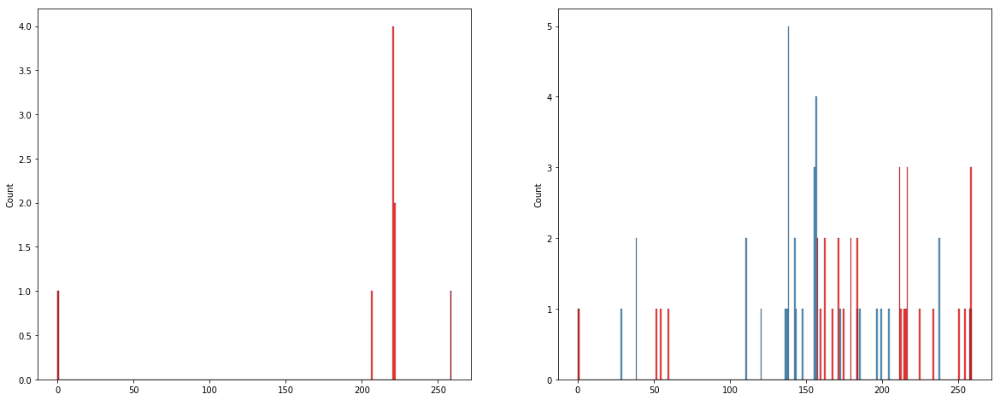

<Figure size 864x576 with 0 Axes>

Spectrum num=1688, size=133, matched=7, frac=0.05263157894736842
Spectrum num=1688, size=133, matched=28, frac=0.21052631578947367


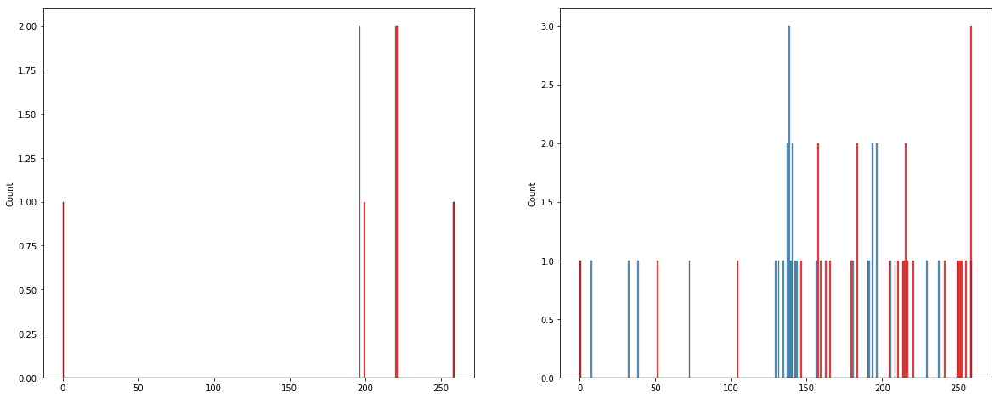

<Figure size 864x576 with 0 Axes>

Spectrum num=2058, size=302, matched=58, frac=0.19205298013245034
Spectrum num=2058, size=302, matched=59, frac=0.19536423841059603


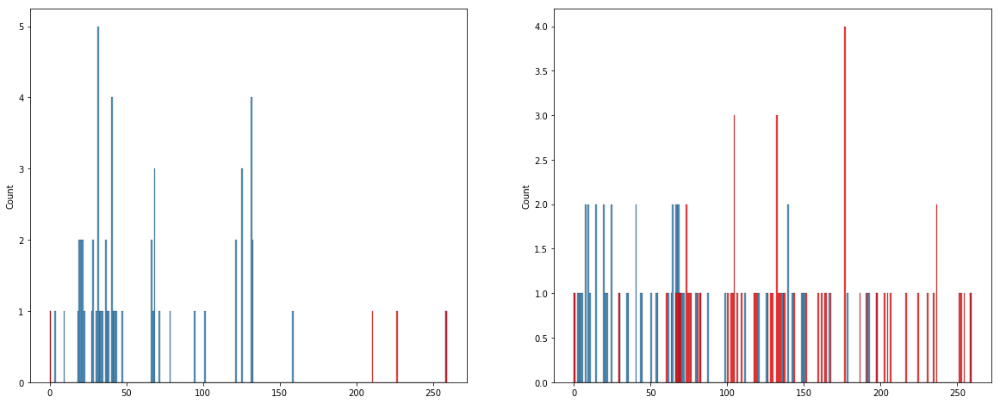

<Figure size 864x576 with 0 Axes>

Spectrum num=2086, size=176, matched=10, frac=0.056818181818181816
Spectrum num=2086, size=176, matched=32, frac=0.18181818181818182


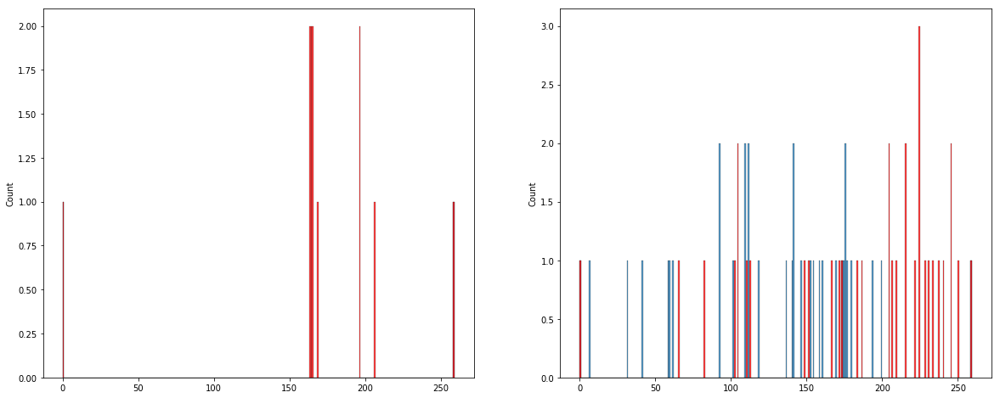

<Figure size 864x576 with 0 Axes>

Spectrum num=2129, size=124, matched=10, frac=0.08064516129032258
Spectrum num=2129, size=124, matched=25, frac=0.20161290322580644


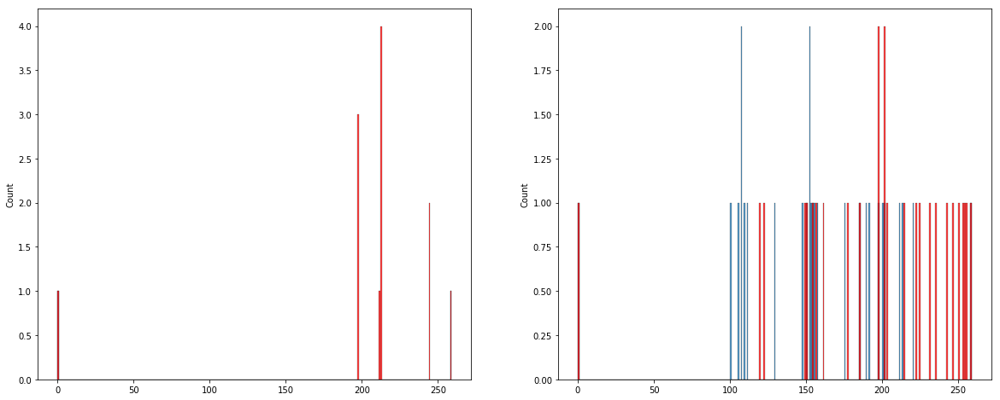

<Figure size 864x576 with 0 Axes>

Spectrum num=2254, size=162, matched=4, frac=0.024691358024691357
Spectrum num=2254, size=162, matched=18, frac=0.1111111111111111


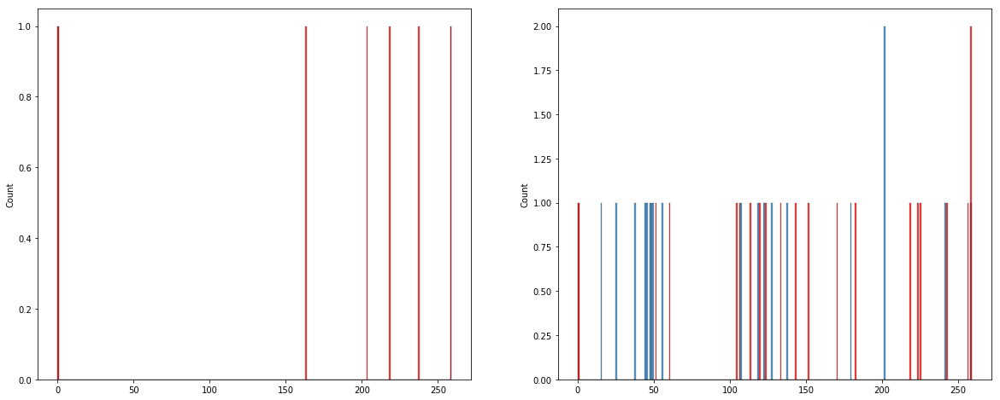

<Figure size 864x576 with 0 Axes>

Spectrum num=2255, size=177, matched=9, frac=0.05084745762711865
Spectrum num=2255, size=177, matched=49, frac=0.2768361581920904


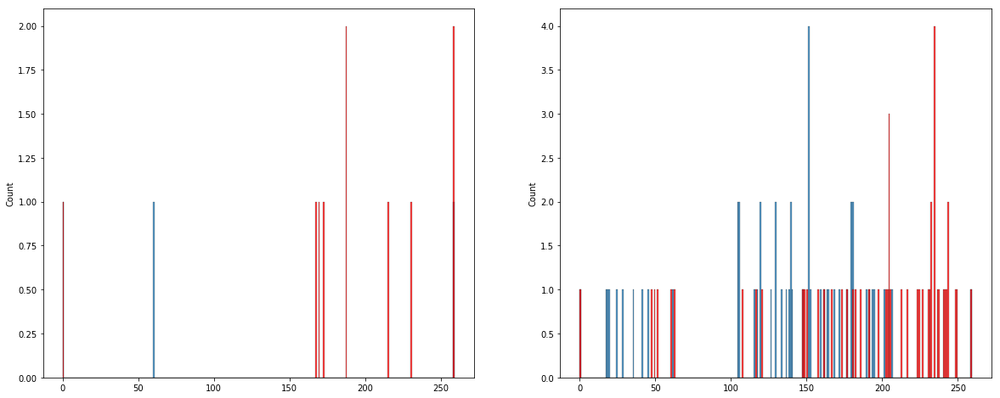

<Figure size 864x576 with 0 Axes>

Spectrum num=2274, size=185, matched=15, frac=0.08108108108108109
Spectrum num=2274, size=185, matched=34, frac=0.1837837837837838


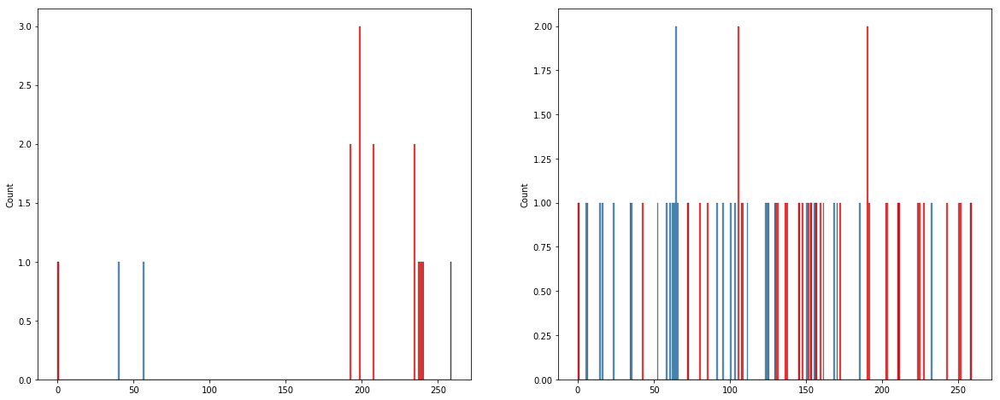

<Figure size 864x576 with 0 Axes>

Spectrum num=2302, size=156, matched=15, frac=0.09615384615384616
Spectrum num=2302, size=156, matched=23, frac=0.14743589743589744


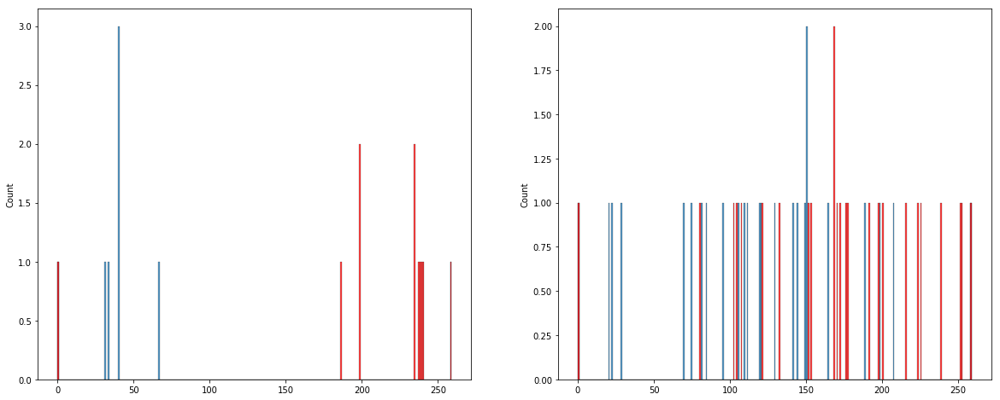

<Figure size 864x576 with 0 Axes>

Spectrum num=2309, size=150, matched=74, frac=0.49333333333333335
Spectrum num=2309, size=150, matched=33, frac=0.22


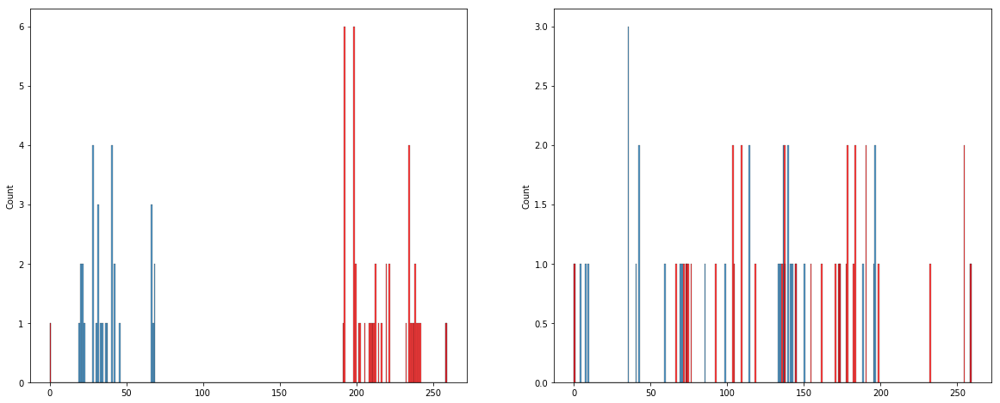

<Figure size 864x576 with 0 Axes>

Spectrum num=2310, size=148, matched=48, frac=0.32432432432432434
Spectrum num=2310, size=148, matched=19, frac=0.12837837837837837


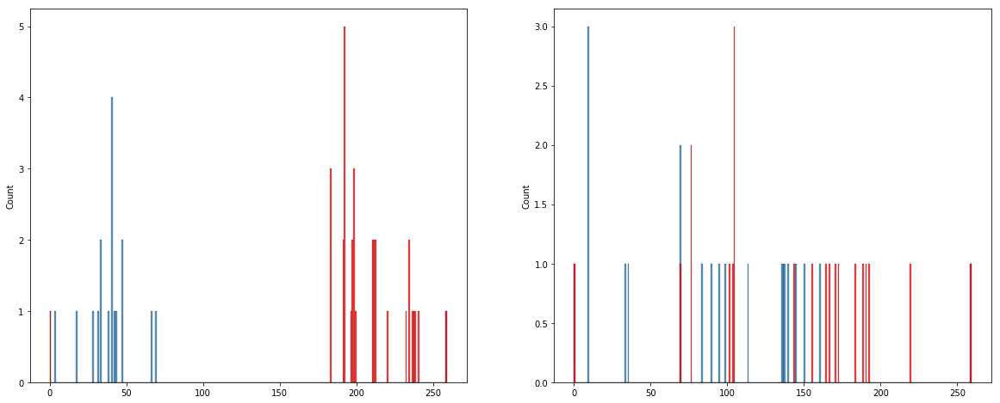

<Figure size 864x576 with 0 Axes>

Spectrum num=2311, size=380, matched=111, frac=0.29210526315789476
Spectrum num=2311, size=380, matched=69, frac=0.18157894736842106


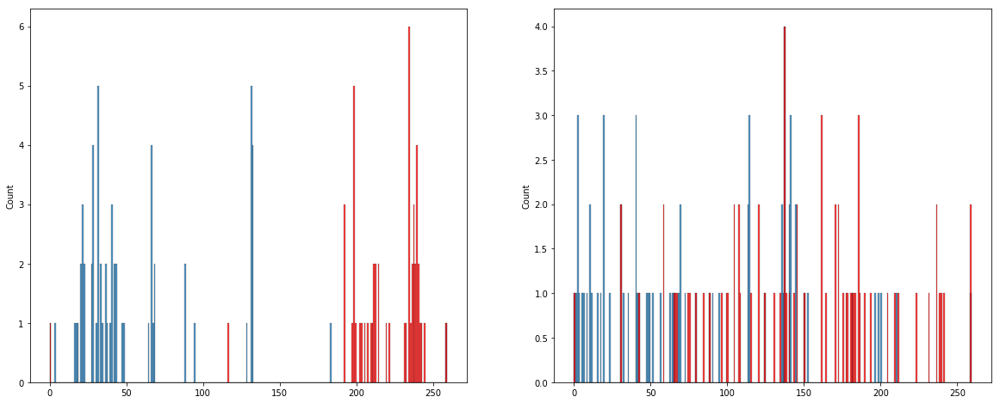

<Figure size 864x576 with 0 Axes>

Spectrum num=2313, size=120, matched=48, frac=0.4
Spectrum num=2313, size=120, matched=16, frac=0.13333333333333333


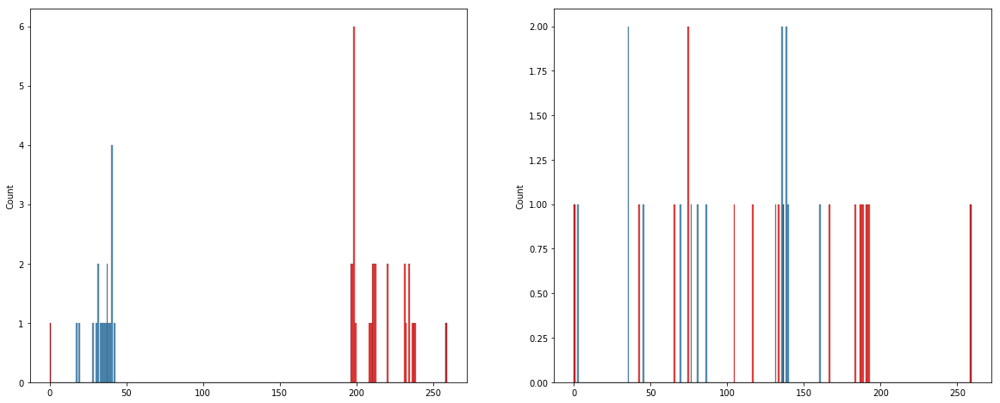

<Figure size 864x576 with 0 Axes>

Spectrum num=2314, size=467, matched=145, frac=0.31049250535331907
Spectrum num=2314, size=467, matched=93, frac=0.19914346895074947


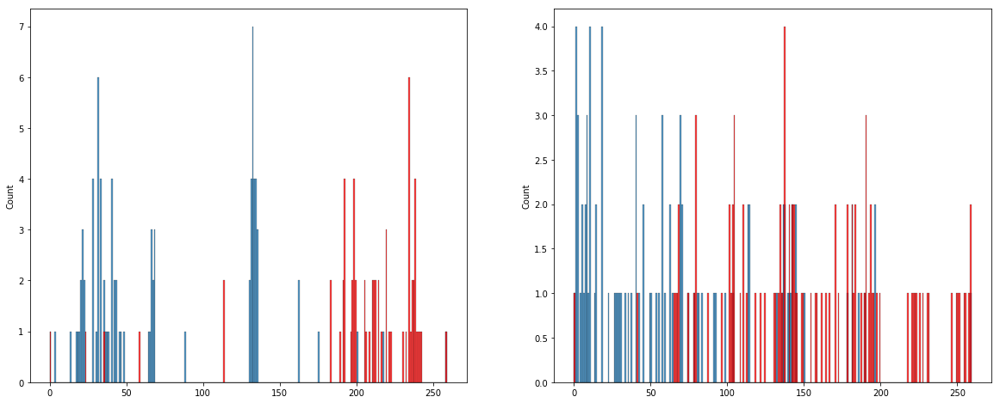

<Figure size 864x576 with 0 Axes>

Spectrum num=2316, size=131, matched=57, frac=0.4351145038167939
Spectrum num=2316, size=131, matched=13, frac=0.09923664122137404


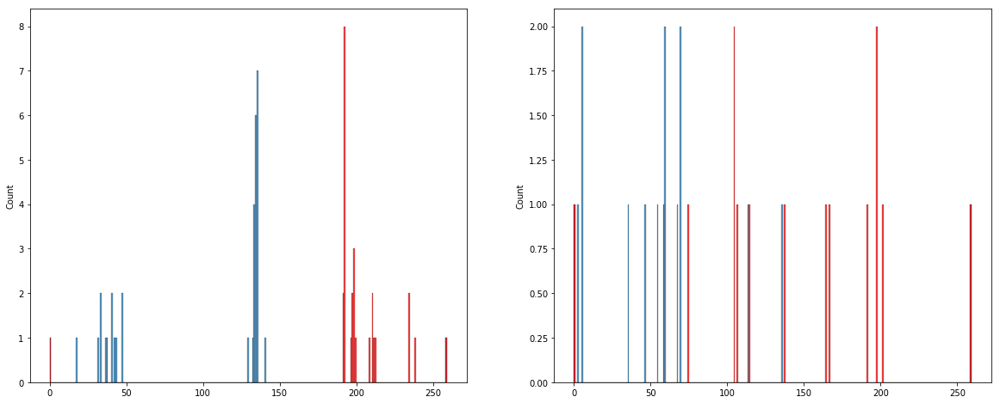

<Figure size 864x576 with 0 Axes>

Spectrum num=2318, size=764, matched=147, frac=0.19240837696335078
Spectrum num=2318, size=764, matched=145, frac=0.18979057591623036


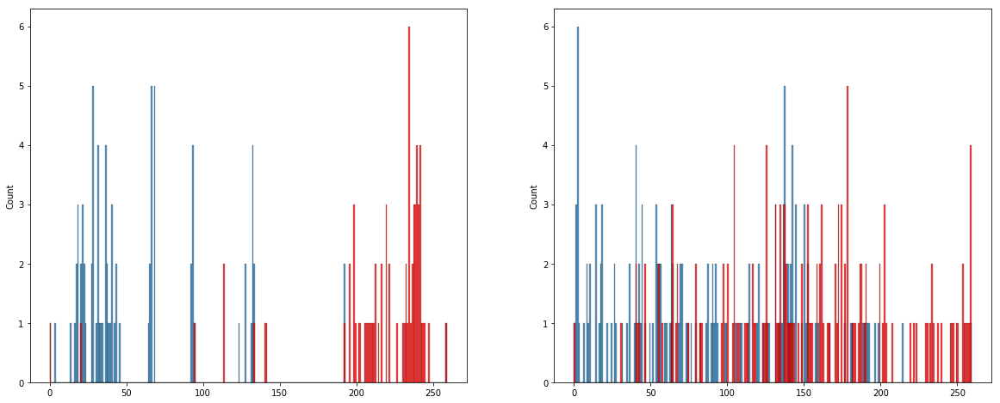

<Figure size 864x576 with 0 Axes>

Spectrum num=2322, size=483, matched=138, frac=0.2857142857142857
Spectrum num=2322, size=483, matched=81, frac=0.16770186335403728


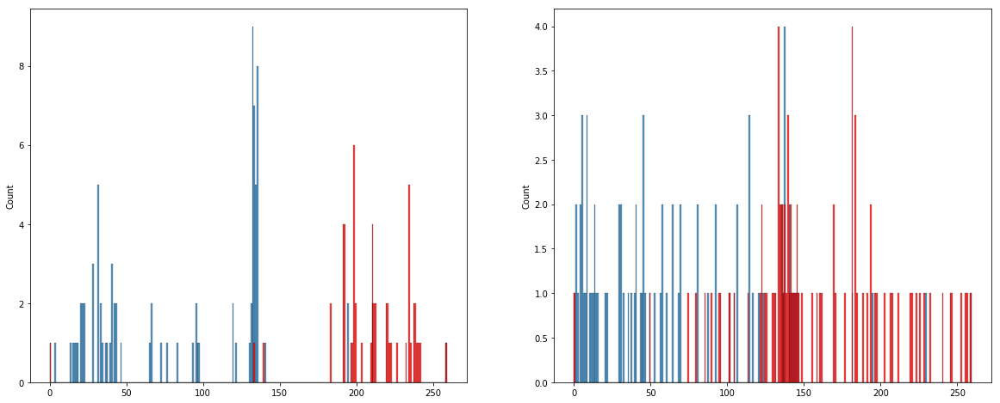

<Figure size 864x576 with 0 Axes>

Spectrum num=2323, size=450, matched=144, frac=0.32
Spectrum num=2323, size=450, matched=90, frac=0.2


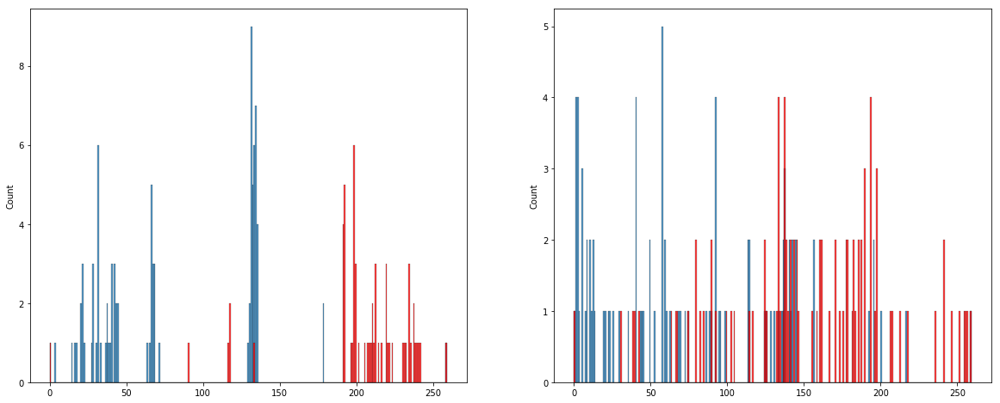

<Figure size 864x576 with 0 Axes>

Spectrum num=2324, size=151, matched=40, frac=0.26490066225165565
Spectrum num=2324, size=151, matched=28, frac=0.18543046357615894


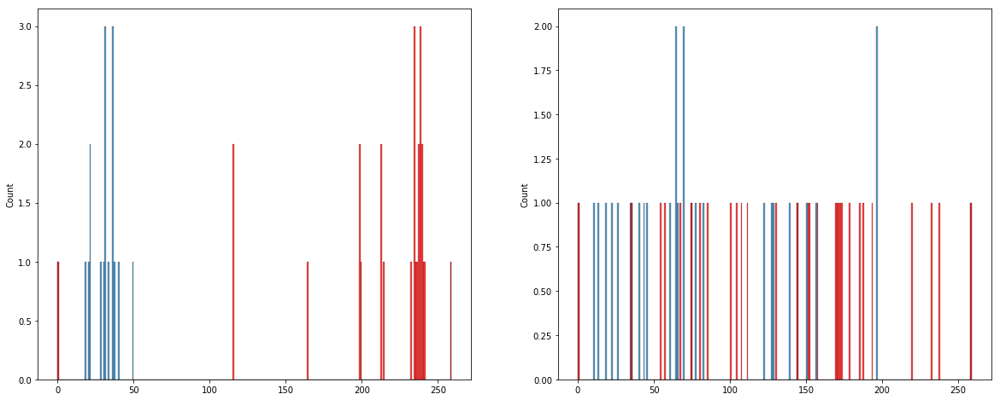

<Figure size 864x576 with 0 Axes>

Spectrum num=2326, size=483, matched=154, frac=0.3188405797101449
Spectrum num=2326, size=483, matched=86, frac=0.17805383022774326


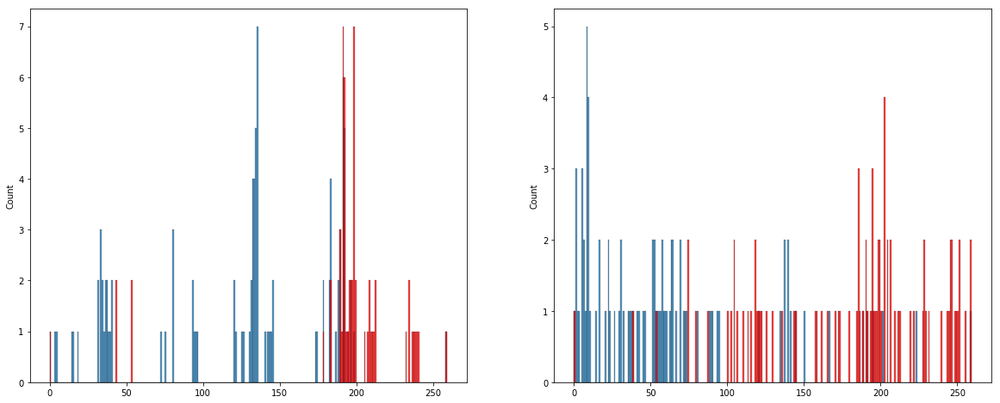

<Figure size 864x576 with 0 Axes>

Spectrum num=2327, size=483, matched=147, frac=0.30434782608695654
Spectrum num=2327, size=483, matched=70, frac=0.14492753623188406


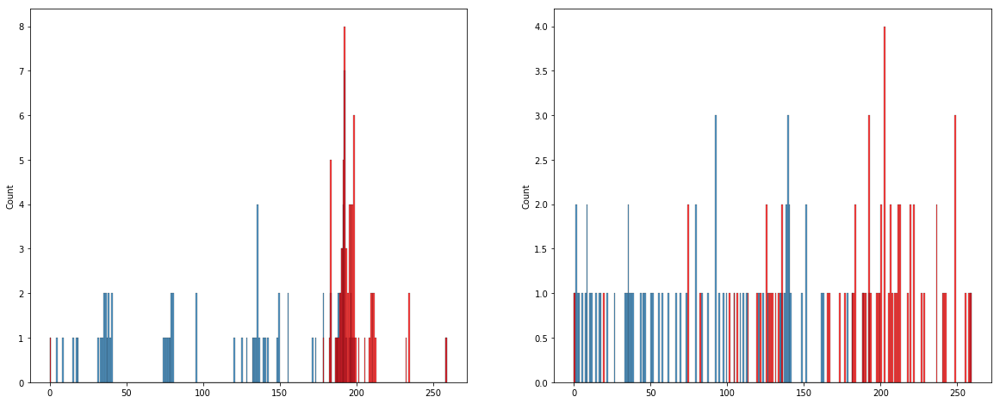

<Figure size 864x576 with 0 Axes>

Spectrum num=2329, size=483, matched=122, frac=0.2525879917184265
Spectrum num=2329, size=483, matched=83, frac=0.17184265010351968


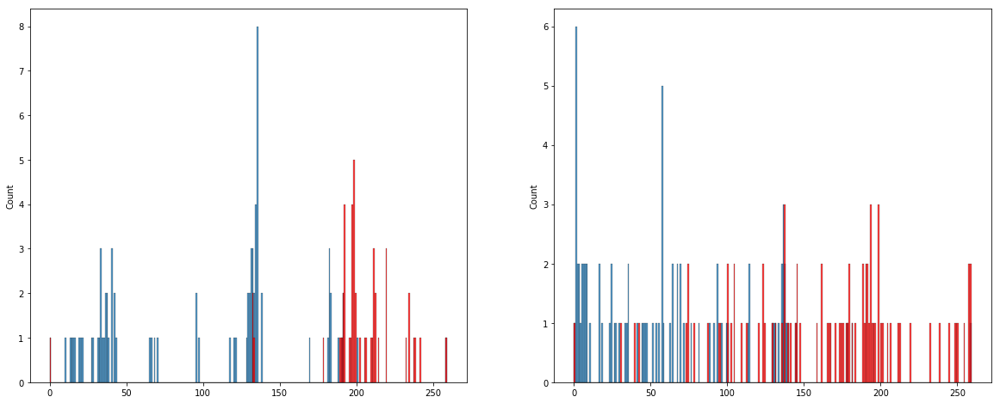

<Figure size 864x576 with 0 Axes>

Spectrum num=2331, size=483, matched=153, frac=0.3167701863354037
Spectrum num=2331, size=483, matched=90, frac=0.18633540372670807


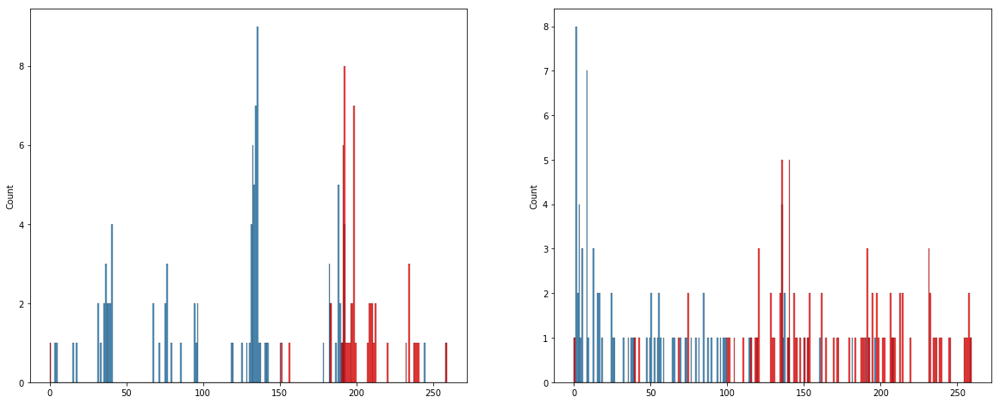

<Figure size 864x576 with 0 Axes>

Spectrum num=2332, size=483, matched=146, frac=0.3022774327122153
Spectrum num=2332, size=483, matched=79, frac=0.16356107660455488


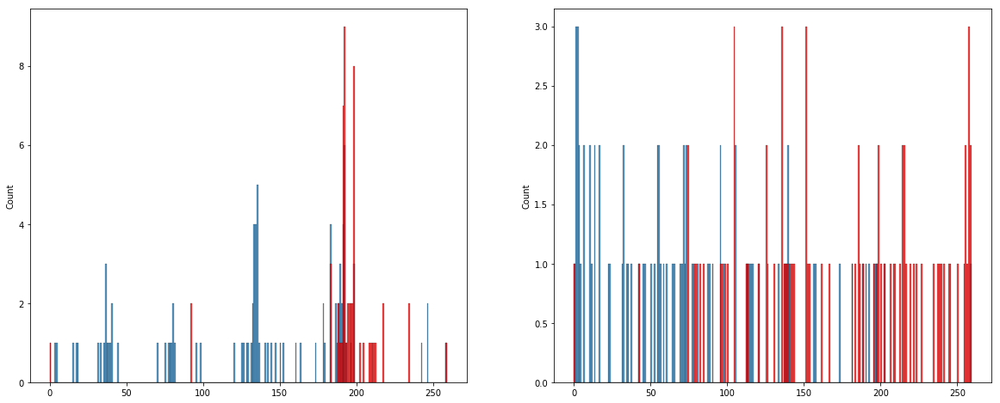

<Figure size 864x576 with 0 Axes>

Spectrum num=2340, size=483, matched=140, frac=0.2898550724637681
Spectrum num=2340, size=483, matched=85, frac=0.17598343685300208


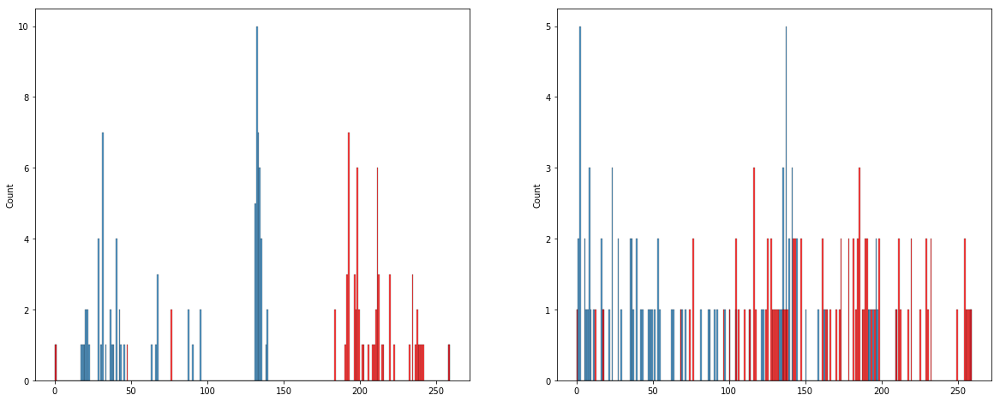

<Figure size 864x576 with 0 Axes>

Spectrum num=2345, size=483, matched=174, frac=0.36024844720496896
Spectrum num=2345, size=483, matched=81, frac=0.16770186335403728


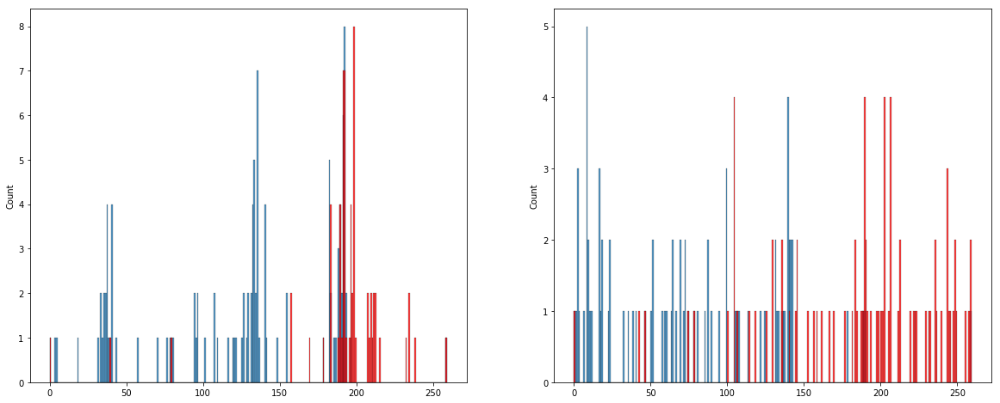

<Figure size 864x576 with 0 Axes>

Spectrum num=2385, size=185, matched=84, frac=0.4540540540540541
Spectrum num=2385, size=185, matched=30, frac=0.16216216216216217


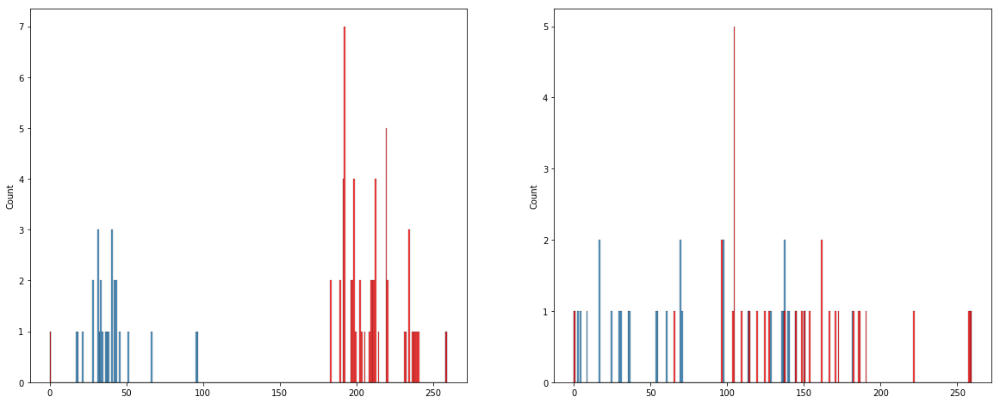

<Figure size 864x576 with 0 Axes>

Spectrum num=2408, size=98, matched=20, frac=0.20408163265306123
Spectrum num=2408, size=98, matched=17, frac=0.17346938775510204


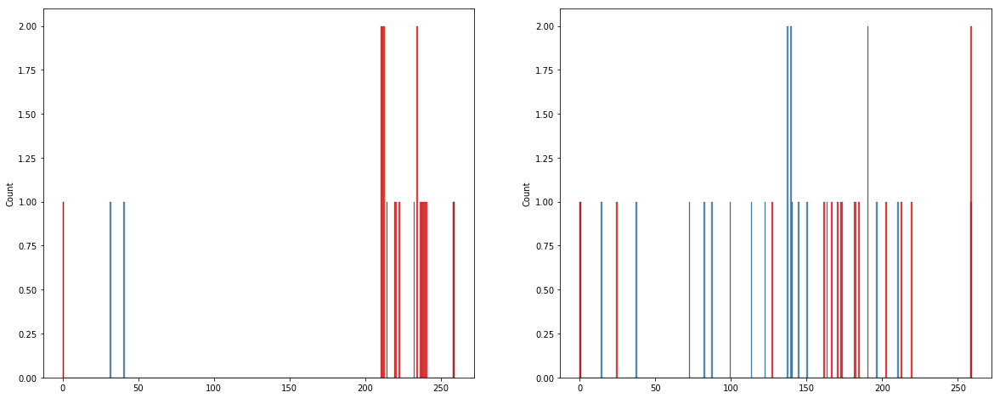

<Figure size 864x576 with 0 Axes>

Spectrum num=2417, size=115, matched=32, frac=0.2782608695652174
Spectrum num=2417, size=115, matched=24, frac=0.20869565217391303


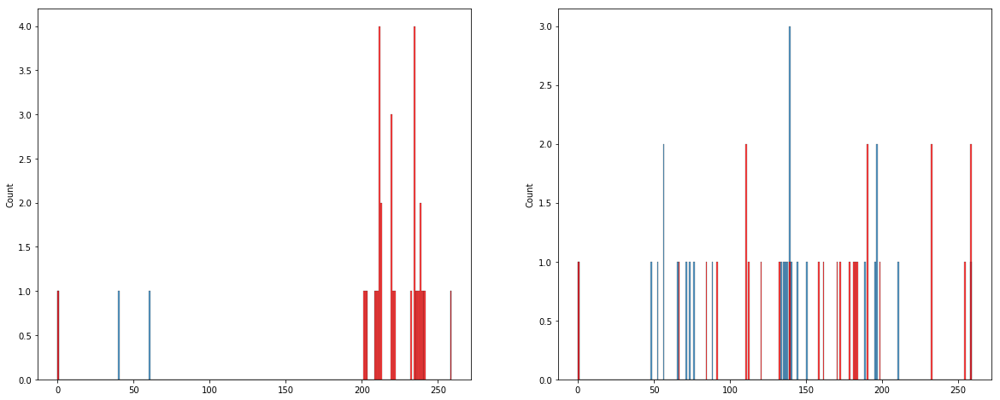

<Figure size 864x576 with 0 Axes>

Spectrum num=2419, size=153, matched=42, frac=0.27450980392156865
Spectrum num=2419, size=153, matched=34, frac=0.2222222222222222


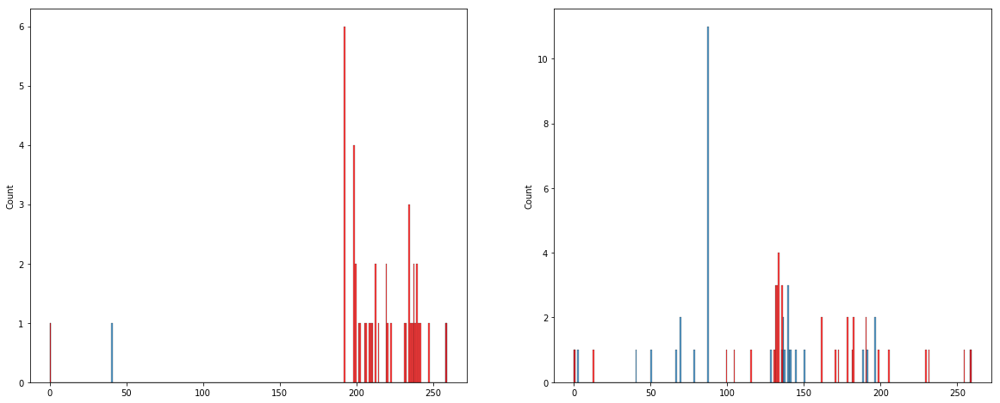

<Figure size 864x576 with 0 Axes>

Spectrum num=2431, size=161, matched=83, frac=0.515527950310559
Spectrum num=2431, size=161, matched=35, frac=0.21739130434782608


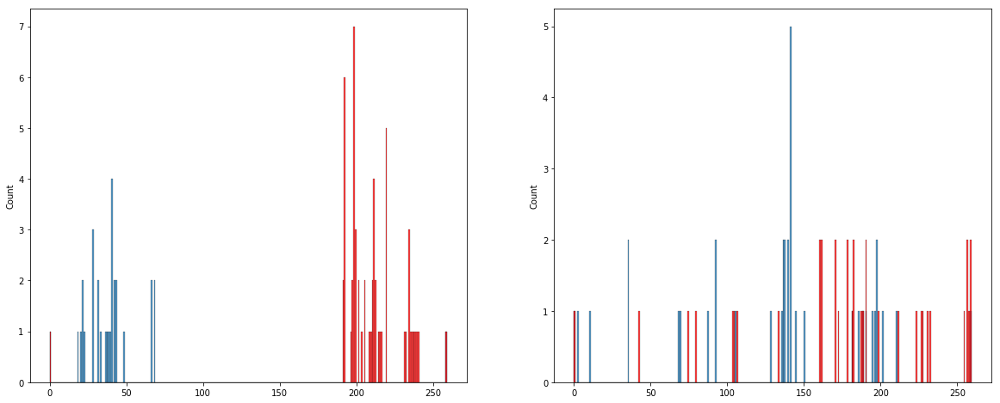

<Figure size 864x576 with 0 Axes>

Spectrum num=2437, size=160, matched=48, frac=0.3
Spectrum num=2437, size=160, matched=39, frac=0.24375


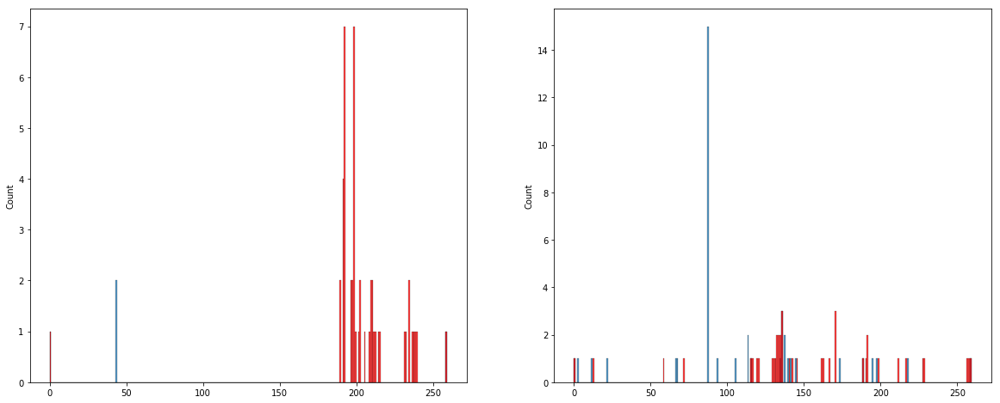

<Figure size 864x576 with 0 Axes>

Spectrum num=2439, size=113, matched=19, frac=0.168141592920354
Spectrum num=2439, size=113, matched=26, frac=0.23008849557522124


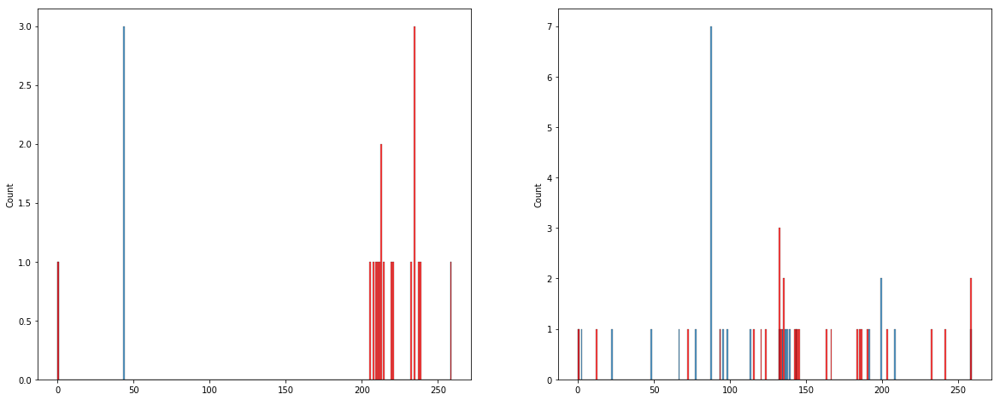

<Figure size 864x576 with 0 Axes>

Spectrum num=2450, size=196, matched=93, frac=0.4744897959183674
Spectrum num=2450, size=196, matched=41, frac=0.20918367346938777


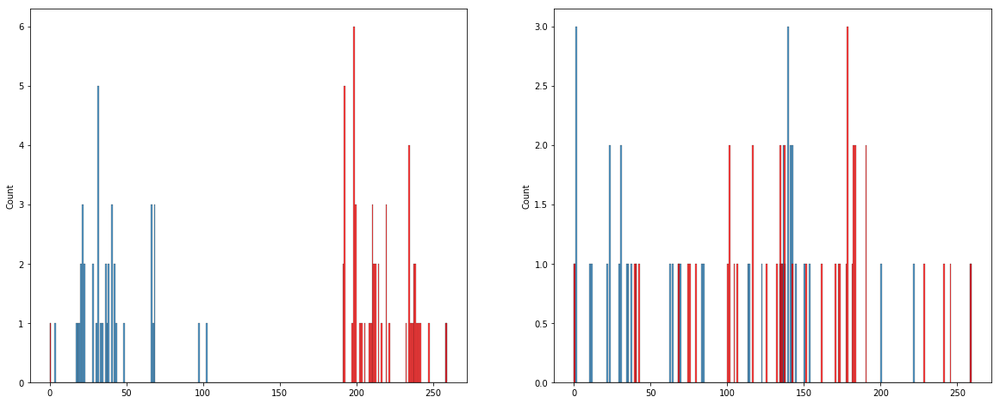

<Figure size 864x576 with 0 Axes>

Spectrum num=2458, size=126, matched=47, frac=0.373015873015873
Spectrum num=2458, size=126, matched=18, frac=0.14285714285714285


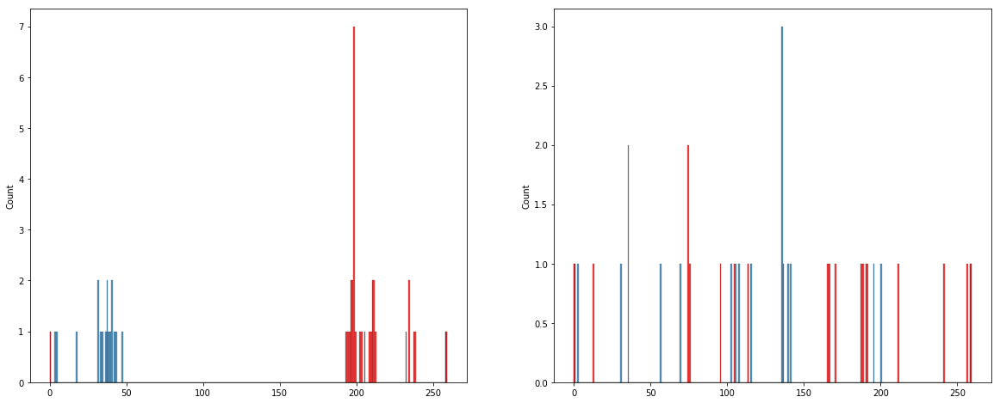

<Figure size 864x576 with 0 Axes>

Spectrum num=2462, size=92, matched=16, frac=0.17391304347826086
Spectrum num=2462, size=92, matched=18, frac=0.1956521739130435


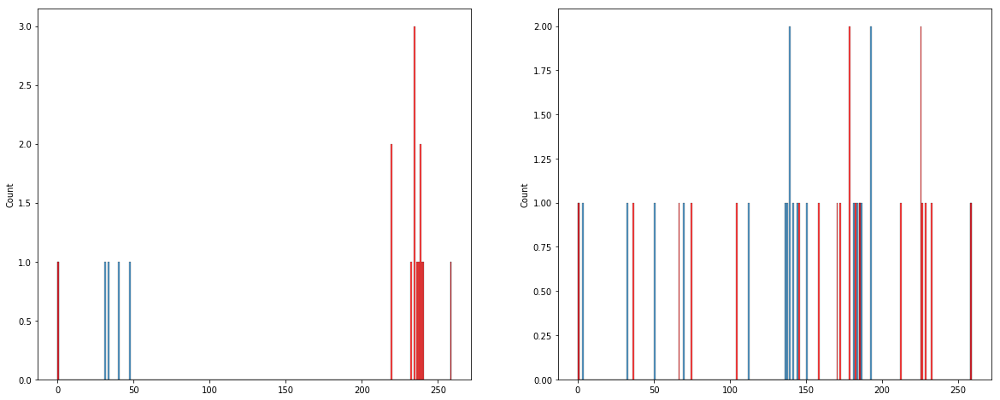

<Figure size 864x576 with 0 Axes>

Spectrum num=2464, size=512, matched=111, frac=0.216796875
Spectrum num=2464, size=512, matched=87, frac=0.169921875


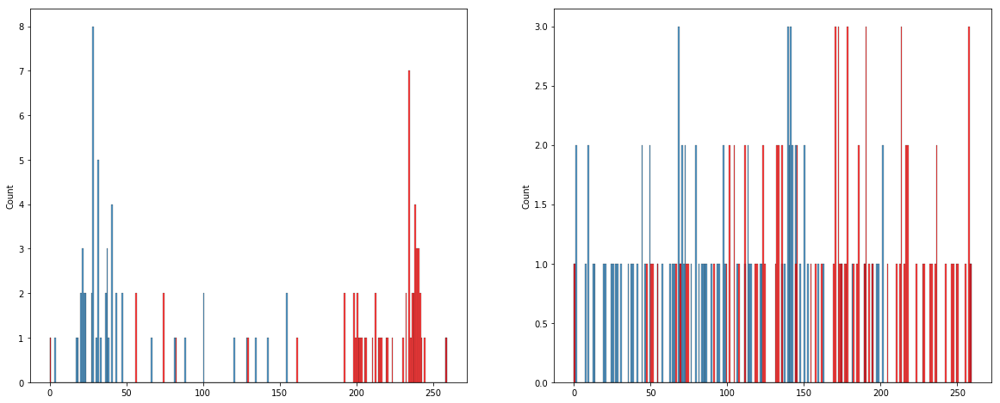

<Figure size 864x576 with 0 Axes>

Spectrum num=2466, size=483, matched=146, frac=0.3022774327122153
Spectrum num=2466, size=483, matched=97, frac=0.20082815734989648


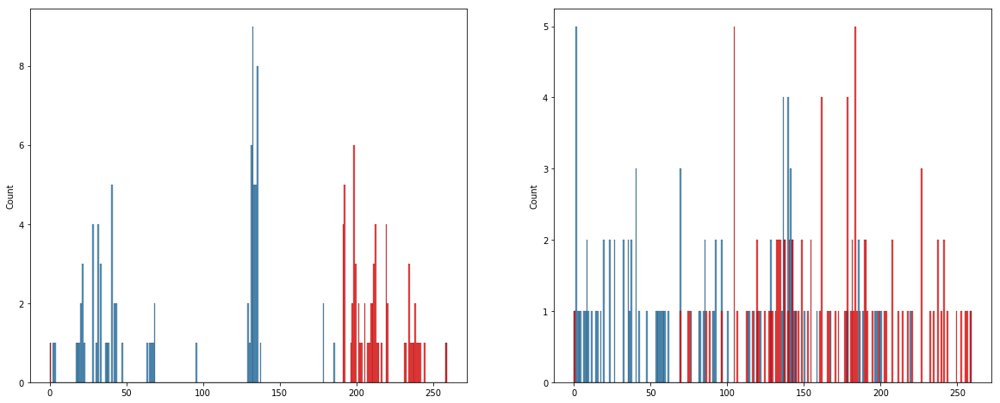

<Figure size 864x576 with 0 Axes>

Spectrum num=2467, size=249, matched=105, frac=0.42168674698795183
Spectrum num=2467, size=249, matched=57, frac=0.2289156626506024


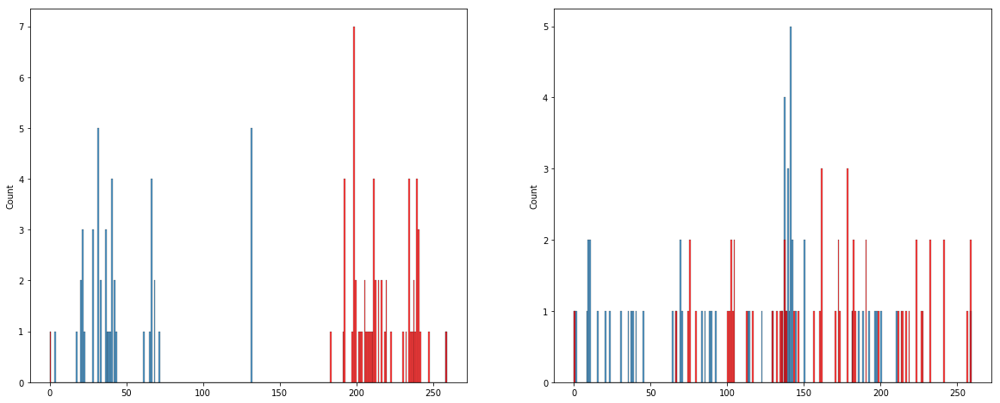

<Figure size 864x576 with 0 Axes>

Spectrum num=2468, size=634, matched=137, frac=0.21608832807570977
Spectrum num=2468, size=634, matched=101, frac=0.15930599369085174


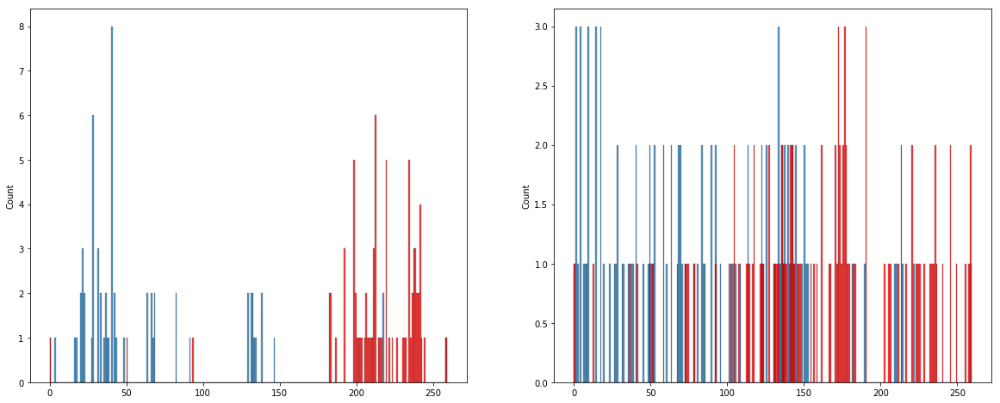

<Figure size 864x576 with 0 Axes>

Spectrum num=2475, size=96, matched=32, frac=0.3333333333333333
Spectrum num=2475, size=96, matched=14, frac=0.14583333333333334


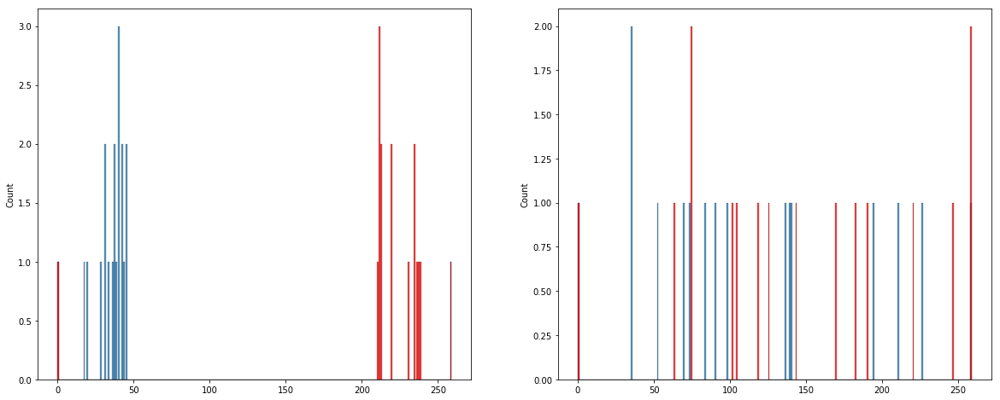

<Figure size 864x576 with 0 Axes>

Spectrum num=2479, size=241, matched=52, frac=0.2157676348547718
Spectrum num=2479, size=241, matched=40, frac=0.16597510373443983


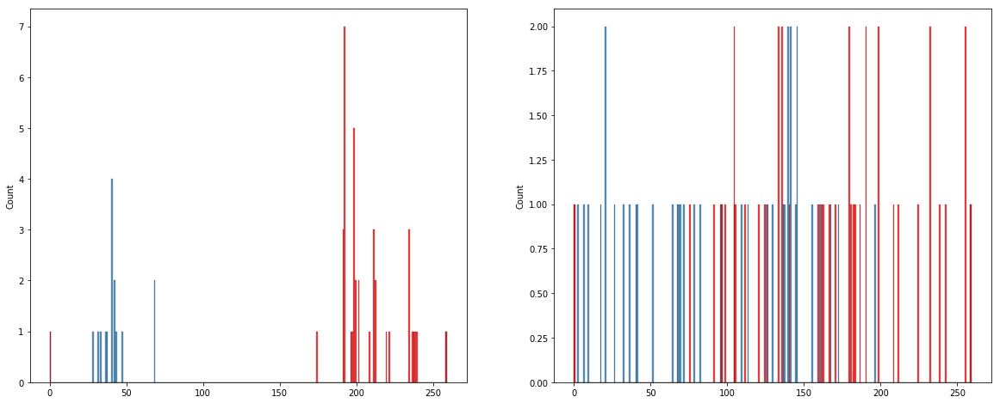

<Figure size 864x576 with 0 Axes>

Spectrum num=2482, size=480, matched=100, frac=0.20833333333333334
Spectrum num=2482, size=480, matched=79, frac=0.16458333333333333


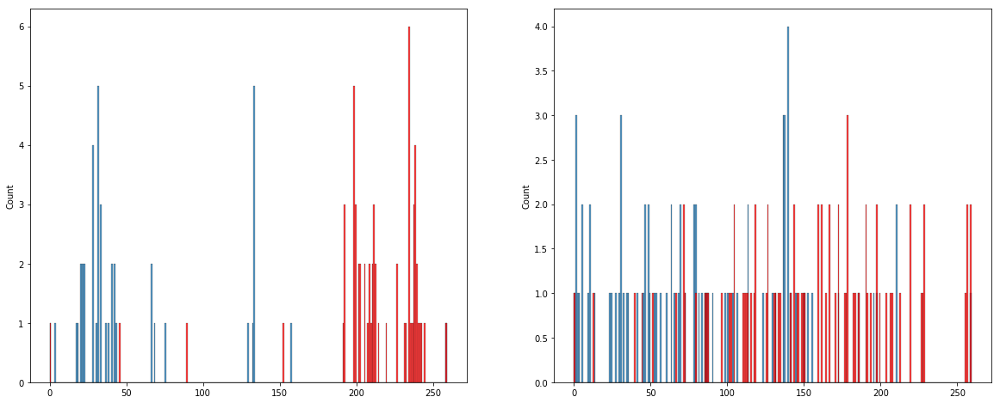

<Figure size 864x576 with 0 Axes>

Spectrum num=2490, size=161, matched=75, frac=0.4658385093167702
Spectrum num=2490, size=161, matched=23, frac=0.14285714285714285


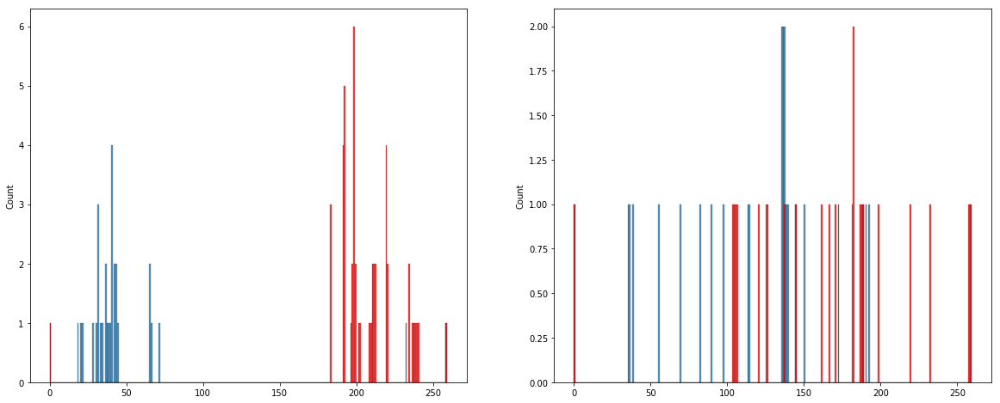

<Figure size 864x576 with 0 Axes>

Spectrum num=2502, size=212, matched=6, frac=0.02830188679245283
Spectrum num=2502, size=212, matched=43, frac=0.2028301886792453


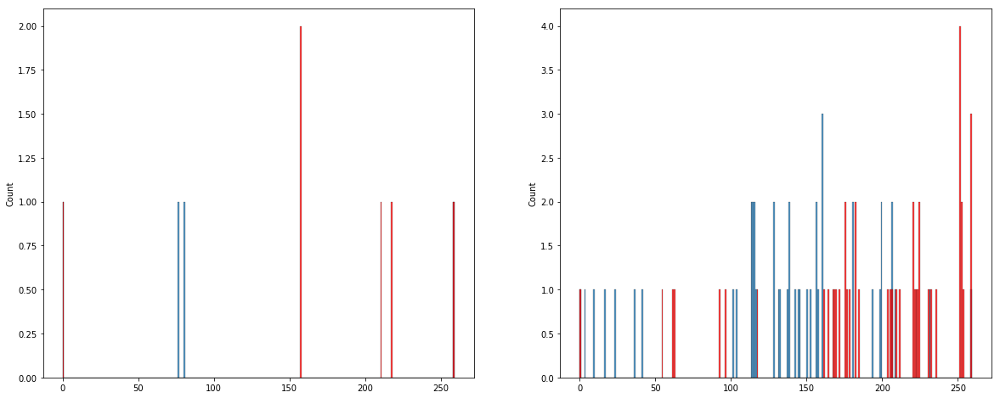

<Figure size 864x576 with 0 Axes>

Spectrum num=2505, size=169, matched=66, frac=0.3905325443786982
Spectrum num=2505, size=169, matched=29, frac=0.17159763313609466


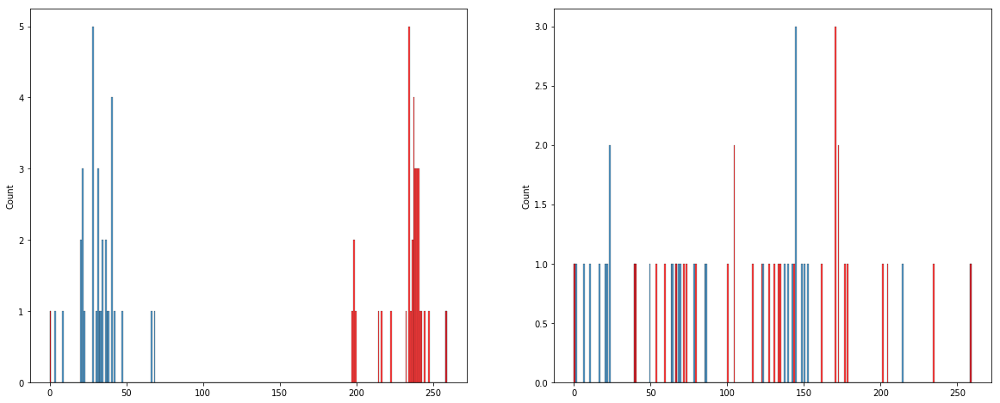

<Figure size 864x576 with 0 Axes>

Spectrum num=2508, size=610, matched=126, frac=0.20655737704918034
Spectrum num=2508, size=610, matched=111, frac=0.1819672131147541


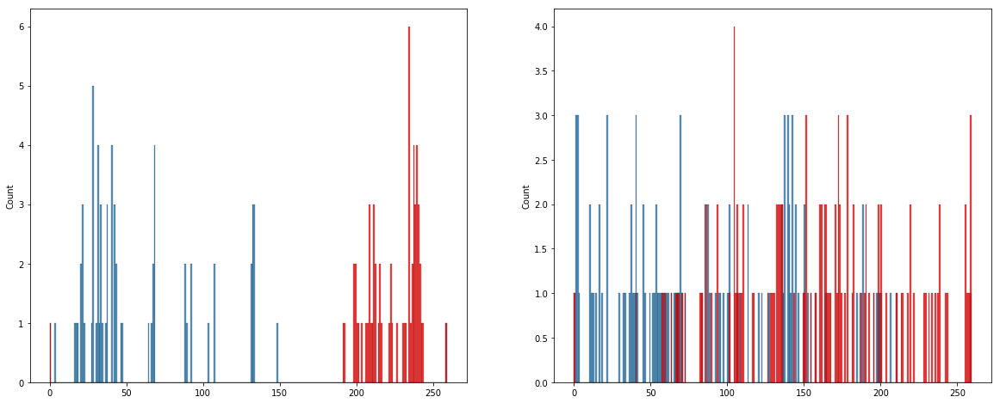

<Figure size 864x576 with 0 Axes>

Spectrum num=2515, size=211, matched=97, frac=0.4597156398104265
Spectrum num=2515, size=211, matched=50, frac=0.23696682464454977


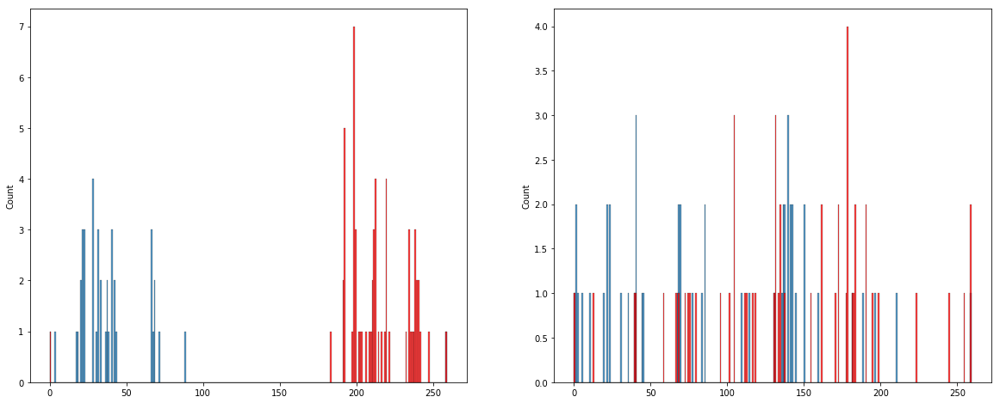

<Figure size 864x576 with 0 Axes>

Spectrum num=2527, size=255, matched=89, frac=0.34901960784313724
Spectrum num=2527, size=255, matched=57, frac=0.2235294117647059


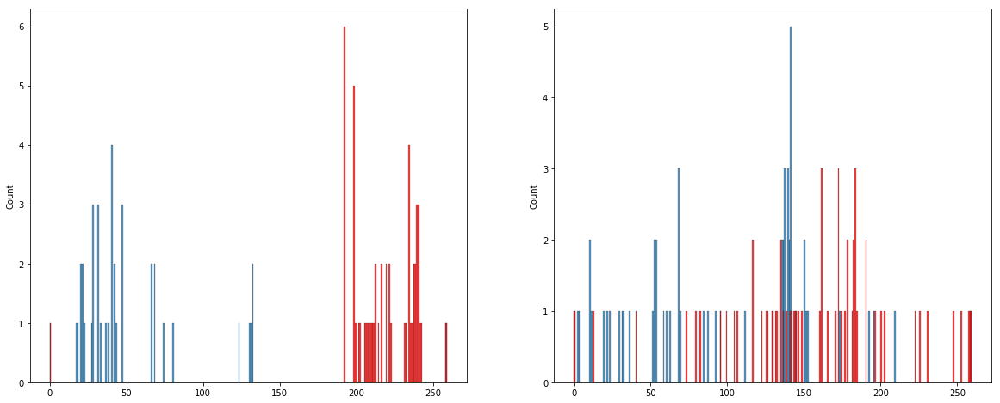

<Figure size 864x576 with 0 Axes>

Spectrum num=2535, size=111, matched=41, frac=0.36936936936936937
Spectrum num=2535, size=111, matched=13, frac=0.11711711711711711


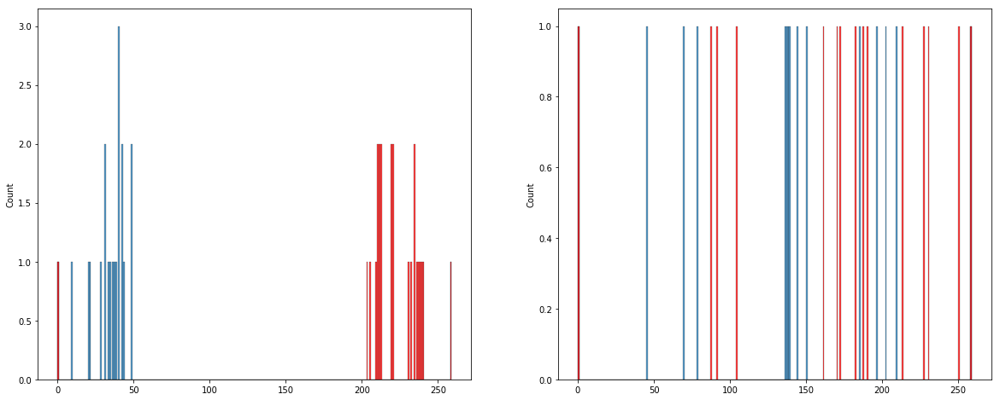

<Figure size 864x576 with 0 Axes>

Spectrum num=2544, size=264, matched=99, frac=0.375
Spectrum num=2544, size=264, matched=63, frac=0.23863636363636365


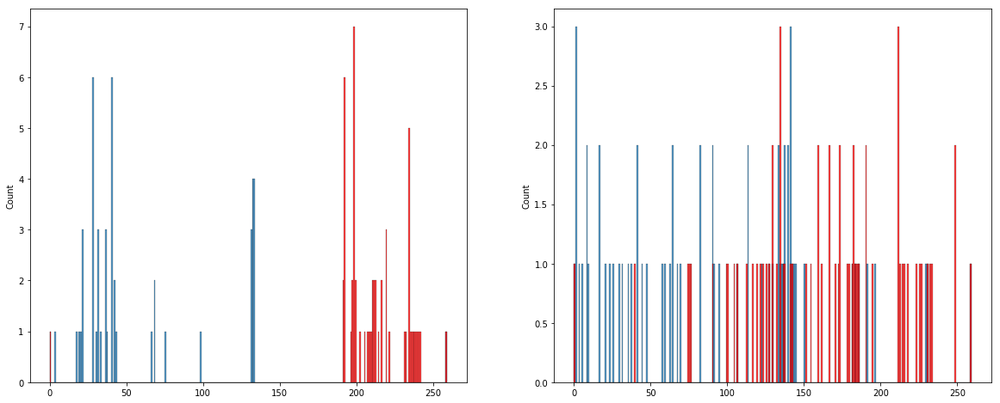

<Figure size 864x576 with 0 Axes>

Spectrum num=2575, size=416, matched=140, frac=0.33653846153846156
Spectrum num=2575, size=416, matched=71, frac=0.17067307692307693


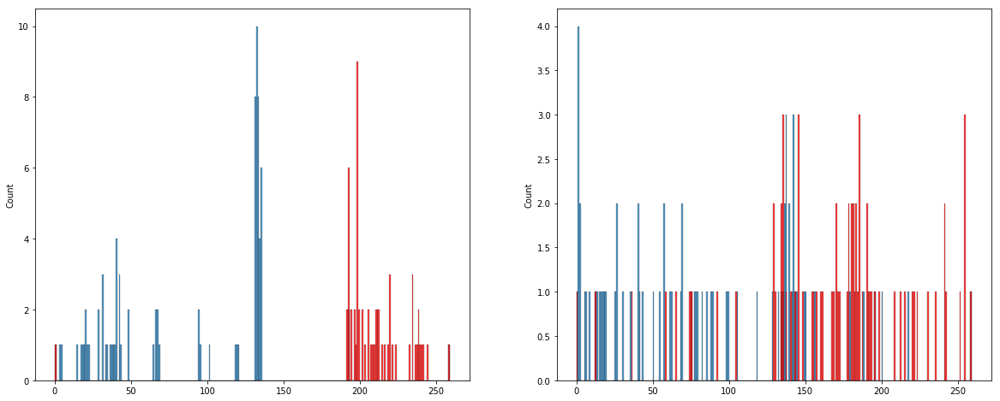

<Figure size 864x576 with 0 Axes>

Spectrum num=2577, size=69, matched=24, frac=0.34782608695652173
Spectrum num=2577, size=69, matched=13, frac=0.18840579710144928


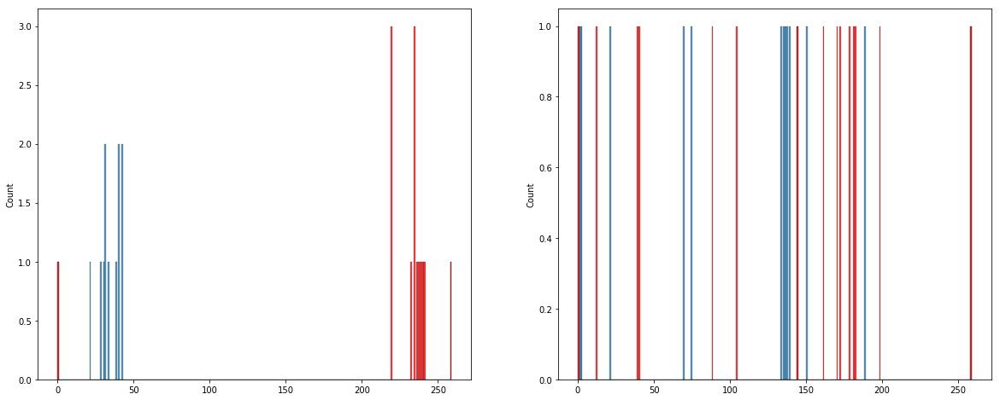

<Figure size 864x576 with 0 Axes>

Spectrum num=2603, size=584, matched=114, frac=0.1952054794520548
Spectrum num=2603, size=584, matched=102, frac=0.17465753424657535


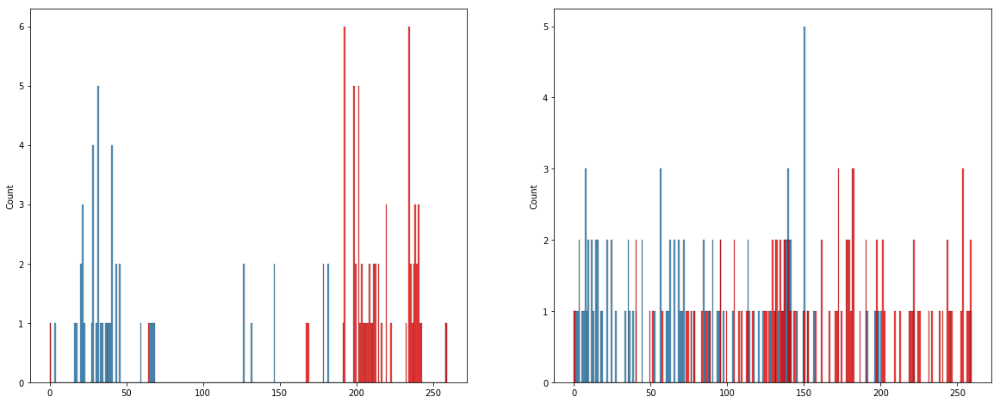

<Figure size 864x576 with 0 Axes>

Spectrum num=2608, size=86, matched=26, frac=0.3023255813953488
Spectrum num=2608, size=86, matched=12, frac=0.13953488372093023


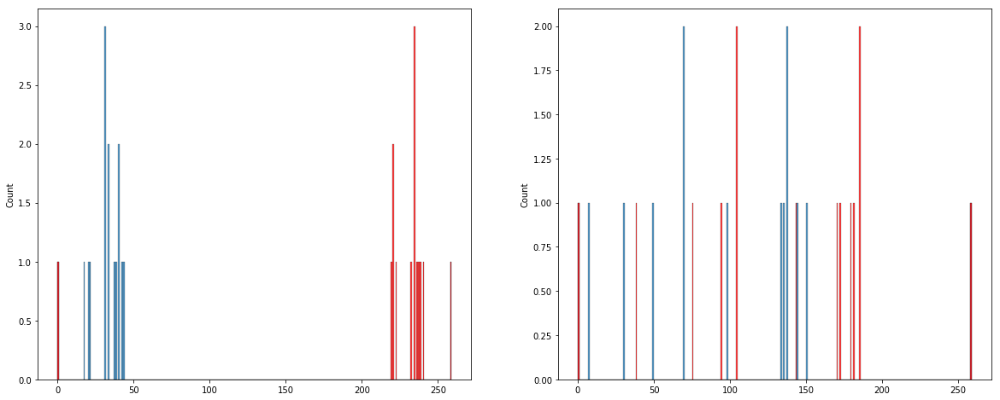

<Figure size 864x576 with 0 Axes>

Spectrum num=2614, size=84, matched=9, frac=0.10714285714285714
Spectrum num=2614, size=84, matched=10, frac=0.11904761904761904


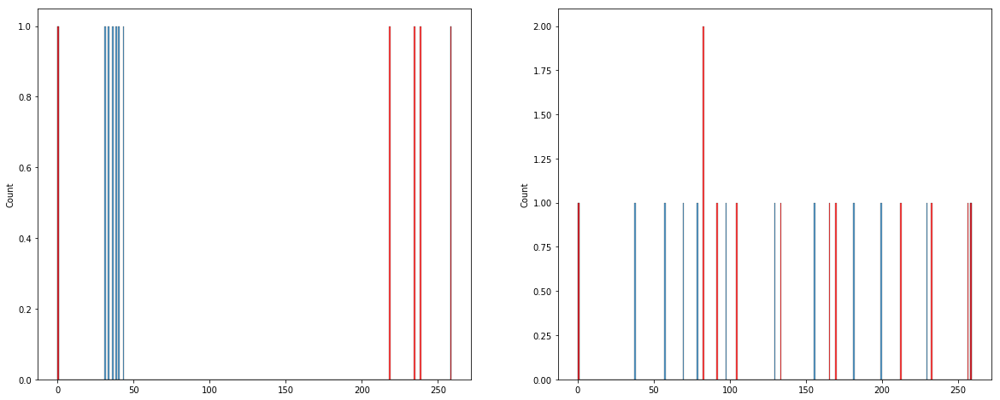

<Figure size 864x576 with 0 Axes>

Spectrum num=2651, size=255, matched=33, frac=0.12941176470588237
Spectrum num=2651, size=255, matched=45, frac=0.17647058823529413


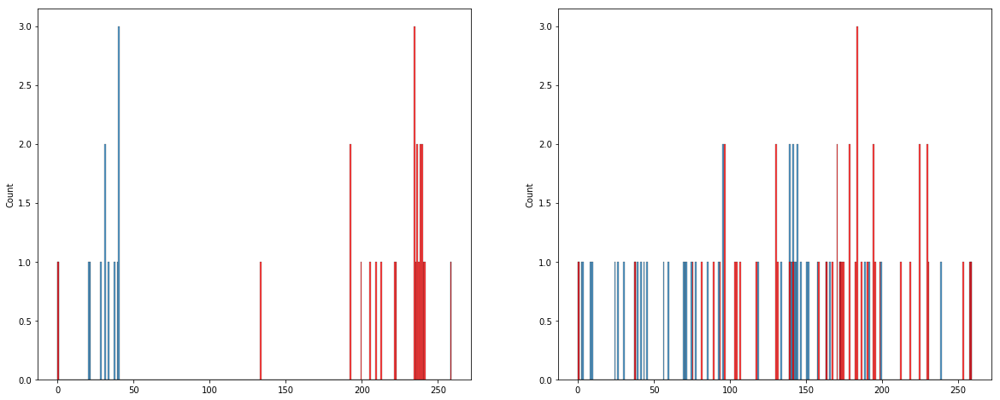

<Figure size 864x576 with 0 Axes>

Spectrum num=2682, size=243, matched=65, frac=0.2674897119341564
Spectrum num=2682, size=243, matched=51, frac=0.20987654320987653


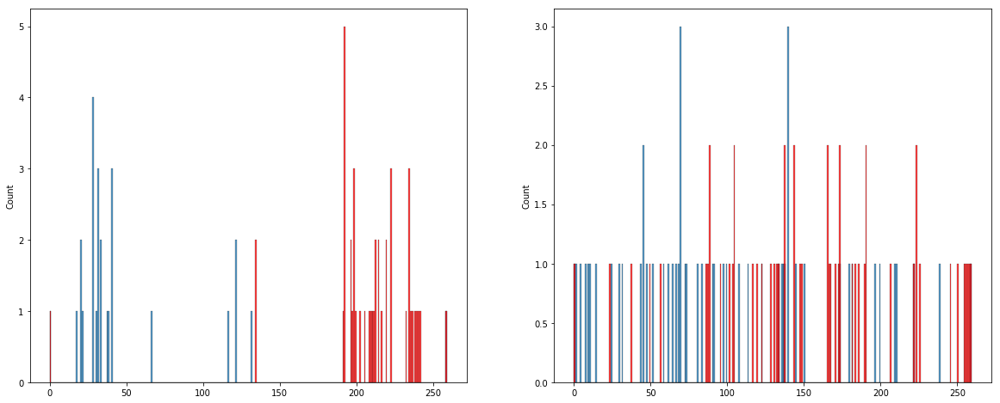

<Figure size 864x576 with 0 Axes>

Spectrum num=2693, size=70, matched=19, frac=0.2714285714285714
Spectrum num=2693, size=70, matched=10, frac=0.14285714285714285


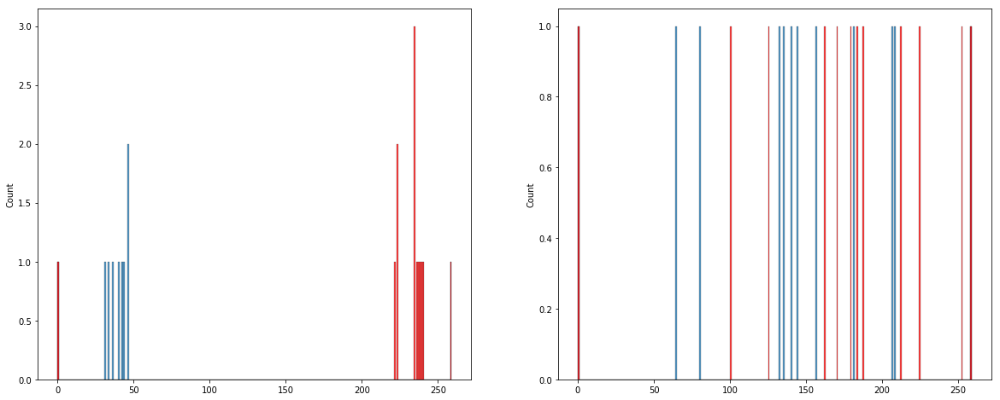

<Figure size 864x576 with 0 Axes>

Spectrum num=2848, size=162, matched=4, frac=0.024691358024691357
Spectrum num=2848, size=162, matched=43, frac=0.2654320987654321


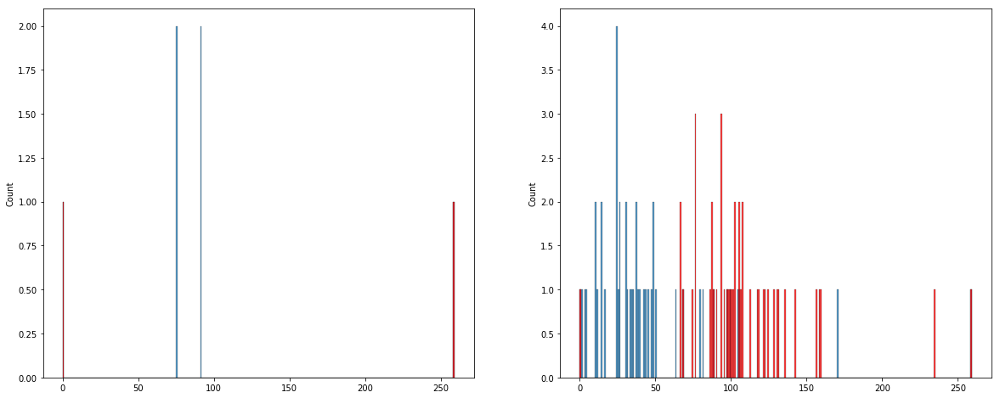

<Figure size 864x576 with 0 Axes>

Spectrum num=2849, size=81, matched=4, frac=0.04938271604938271
Spectrum num=2849, size=81, matched=17, frac=0.20987654320987653


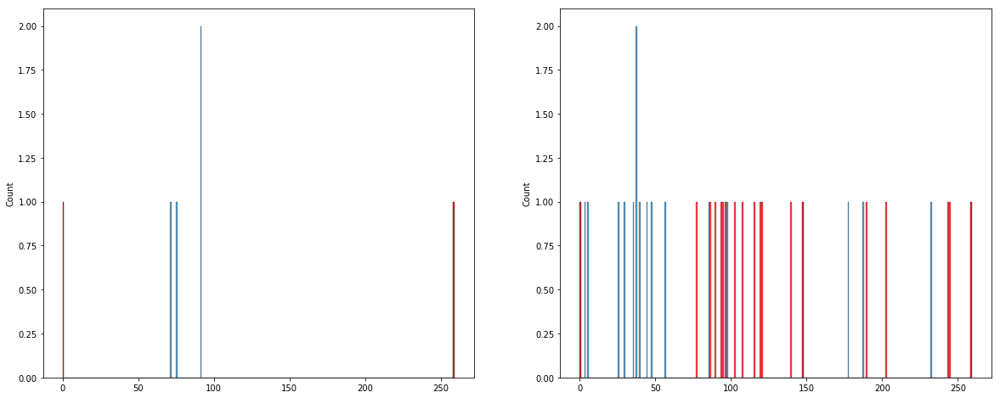

<Figure size 864x576 with 0 Axes>

Spectrum num=2851, size=104, matched=3, frac=0.028846153846153848
Spectrum num=2851, size=104, matched=28, frac=0.2692307692307692


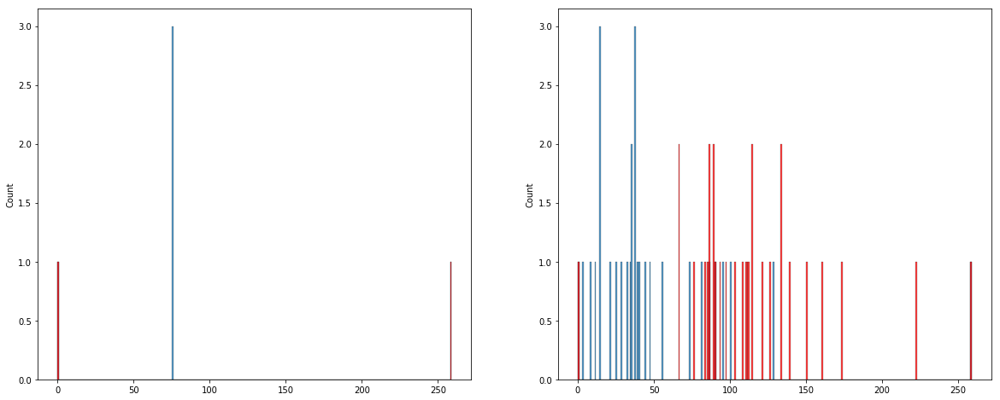

<Figure size 864x576 with 0 Axes>

In [218]:
from random import randint


def filter_repeating_matches(matches):
    result = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            
            is_bad = False
            for match1 in matched:
                if (match1['item2'] == match['item2']) and (match1['item1'] != match['item1']):
                    is_bad = True
                    break
            if not is_bad:
                result.append(match)
        else:
            result.append(match)
    return result


# all_nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 50]

ions_pr_su = get_ions(sequence,
                prefix=True,
                suffix=True,
                middle=False,
                min_length=1,
                include_loose_molecules=True,
                max_deconv_err=2
               )

ions_middle = get_ions(sequence,
                prefix=False,
                suffix=False,
                middle=True,
                min_length=10,
                include_loose_molecules=True,
                max_deconv_err=0
               )

for num in interesting_nums:
    item = get_msalign_spec(num)
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))
    
    matched = match_items(ions_pr_su, 'mass_0', item['m_array'], None, err=5)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    b_pos = [x['item1']['len'] for x in matched if x['item1']['type'] == 'b']
    y_pos = [len(sequence) - x['item1']['len'] for x in matched if x['item1']['type'] == 'y']
          
    plt.figure(figsize=(12, 8))
    sns.histplot(b_pos + [0, len(sequence)], bins=len(sequence), ax=axs[0])
    sns.histplot(y_pos + [0, len(sequence)], bins=len(sequence), color='r', ax=axs[0])

    matched = match_items(ions_middle, 'mass_0', item['m_array'], None, err=5)
    matched = filter_repeating_matches(matched)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    l_pos = []
    r_pos = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            l_pos.append(l)
            r_pos.append(r)
              
    sns.histplot(l_pos + [0, len(sequence)], bins=len(sequence), ax=axs[1])
    sns.histplot(r_pos + [0, len(sequence)], bins=len(sequence), color='r', ax=axs[1])
    plt.show()

In [279]:
ions = get_ions(
    sequence,
#     gen_random_protein(len(sequence)),
    prefix=True,
    suffix=True,
    middle=False,
    min_length=None,
    include_loose_molecules=False,
    max_deconv_err=0
)

In [280]:
nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 100]

In [383]:
num = 2309

In [384]:
# ??? Почему не находится с 1670 ???

In [385]:
item = get_msalign_spec(num)

In [386]:
m_array = item['m_array']

In [387]:
from copy import deepcopy

def add_ids_to_masses(m_array):
    result = []
    for _id, m in enumerate(m_array):
        if isinstance(m, float) or isinstance(m, int):
            result.append({
                'id': _id,
                'm': m,
            })
        else:
            m = deepcopy(m)
            m['id'] = _id
            result.append(m)
    return result

In [388]:
m_array = add_ids_to_masses(m_array)

In [389]:
modifications = {
    0: 0,
    +H2O: 0.1,
    -H2O: 0.1,
    +NH3: 0.1,
    -NH3: 0.1,
    +1  : 0.2,
    -1  : 0.2
}

In [390]:
def create_potential_pairs(m_array, ions):
    result = []
    for m in m_array:
        for ion in ions:
            for mod in modifications:
                start_pos = ion['mass_0'] - m['m'] + mod
                if start_pos >= -0.01:
                    result.append({
                        'potential_start': start_pos,
                        'score': 1 - modifications[mod],
                        'mod': mod,
                        'ion': ion,
                        'mass': m,
                    })
    return result

In [391]:
def group_by_ion_name(real_list):
    result = {}
    for item in real_list:
        first_char = item['ion']['name'][0]
        if first_char == 'f':
            first_char = 'b'
        if first_char not in result:
            result[first_char] = []
        result[first_char].append(item)
    return [result[k] for k in result][::]

def group_segments(real_list, tol, k='potential_start'):
    if not real_list:
        return []

    segments = []
    
    real_lists = group_by_ion_name(real_list)
    for real_list in real_lists:
#         print('aaa')
#     for real_list in [real_list]:
        sorted_list = sorted(real_list, key=lambda x: x[k])
        segments.append([sorted_list[0]])

        for i in range(1, len(sorted_list)):
            if sorted_list[i][k] - sorted_list[i-1][k] <= tol:
                segments[-1].append(sorted_list[i])
            else:
                segments.append([sorted_list[i]])
    
    return segments

In [392]:
len(m_array)

150

In [393]:
def get_cnt_diff_ions(matches):
    return len(set(item['ion']['name'] for item in matches))

def get_mean_score(matches):
    return sum(item['score'] for item in matches) / len(matches)

In [394]:
def generate_all_ladders(m_array, ions):
    m_array = deepcopy(m_array)

    all_segments = []

    while True:
        poss_pairs = create_potential_pairs(m_array, ions)
        poss_pairs.sort(key=lambda x: x['potential_start'])
        segments = group_segments(poss_pairs, 4e-3)
        segments = sorted(segments, key=lambda x: (get_cnt_diff_ions(x), get_mean_score(x)), reverse=True)

        segment = segments[0]
        if get_cnt_diff_ions(segment) < 5:
            break

        all_segments.append(segment)
        used_mass_ids = set(item['mass']['id'] for item in segment)
        print(used_mass_ids)

        m_array = [item for item in m_array if item['id'] not in used_mass_ids]
    
    return all_segments

In [395]:
all_segments = generate_all_ladders(m_array, ions)

{128, 1, 2, 131, 3, 5, 6, 7, 8, 10, 11, 12, 13, 142, 14, 18, 20, 25, 28, 32, 34, 39, 47, 53, 74, 80, 107, 108, 110, 119}
{0, 4, 135, 136, 9, 141, 16, 24, 27, 29, 37, 40, 41, 42, 49, 55, 56, 61, 63, 66, 69, 92, 100, 117, 126}
{64, 129, 65, 26, 134, 137, 48, 51, 115, 118, 122, 59, 94, 127}
{98, 36, 105, 76, 146, 84}


In [325]:
def generate_breakpoints_for_b_ions(sequence):
    result = [0.0]
    for i in range(1, len(sequence)):
        result.append(mass.calculate_mass(sequence=sequence[:i], ion_type='b', charge=0))
    return result


def generate_breakpoints_for_y_ions(sequence):
    result = [0.0]
    for i in range(1, len(sequence)):
        result.append(mass.calculate_mass(sequence=sequence[-i:], ion_type='y', charge=0))
    return result


def locate_element_in_array(elem, array):
    j = 0
    for i, x in enumerate(array):
        if abs(elem - x) < abs(elem - array[j]):
            j = i
    return j

In [324]:
locate_element_in_array(0.2, [-1, 0.0, 0.5, 1.3])

1

In [331]:
np.mean([1, 2, 3])

2.0

In [332]:
b_breakpoints = generate_breakpoints_for_b_ions(sequence)
y_breakpoints = generate_breakpoints_for_y_ions(sequence)

def locate_ladder(ladder):
    center_of_ladder = np.mean([item['potential_start'] for item in ladder])
    type_of_ladder = {'b': 'b', 'y': 'y', 'f': 'b'}[ladder[0]['ion']['type']]
    if type_of_ladder == 'b':
        start_pos = locate_element_in_array(center_of_ladder, b_breakpoints)
        
        result = []
        for item in ladder:
            result.append((start_pos, item['ion']['len']))
        return result
    
    elif type_of_ladder == 'y':
        end_pos = locate_element_in_array(center_of_ladder, y_breakpoints)
        
        result = []
        for item in ladder:
            result.append((len(sequence) - item['ion']['len'], len(sequence) - end_pos))
        return result

In [380]:
import itertools

def draw_all_ladders(ladders):
    
    colors = itertools.cycle(['blue', 'red', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow'])
            
    for ladder, color in zip(ladders, colors):
#         plt.figure(figsize=(12, 8))
        plt.vlines([0, len(sequence)], 0, [0, 0], colors='black', linewidth=1, alpha=1)
    
        segments = locate_ladder(ladder)
        
        left_ends = set(x[0] for x in segments)
        right_ends = set(x[1] for x in segments)
        
        if len(left_ends) == 1:
            plt.vlines([list(left_ends)[0]], 0, [2], colors=color, linewidth=2, alpha=1)
            plt.vlines(list(right_ends), 0, 1, colors=color, linewidth=1, alpha=1)
        elif len(right_ends) == 1:
            plt.vlines([list(right_ends)[0]], 0, [2], colors=color, linewidth=2, alpha=1)
            plt.vlines(list(left_ends), 0, 1, colors=color, linewidth=1, alpha=1)
        else:
            raise Exception    
        plt.show()

In [398]:
all_segments[1]

[{'potential_start': 17.991871822243343,
  'score': 0.9,
  'mod': 18.0105646837,
  'ion': {'name': 'b66',
   'len': 66,
   'sequence': 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFN',
   'type': 'b',
   'mass_0': 7435.6411907362},
  'mass': {'id': 27, 'm': 7435.6598835976565}},
 {'potential_start': 17.995648140540585,
  'score': 0.9,
  'mod': 18.0105646837,
  'ion': {'name': 'b40',
   'len': 40,
   'sequence': 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQD',
   'type': 'b',
   'mass_0': 4612.18093951934},
  'mass': {'id': 66, 'm': 4612.1958560625}},
 {'potential_start': 17.996355646764183,
  'score': 0.9,
  'mod': 17.02654910101,
  'ion': {'name': 'b68',
   'len': 68,
   'sequence': 'EHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVE',
   'type': 'b',
   'mass_0': 7663.752197737161},
  'mass': {'id': 56, 'm': 7662.7823911914065}},
 {'potential_start': 17.99816232986989,
  'score': 0.9,
  'mod': 18.0105646837,
  'ion': {'name': 'b31',
   'len': 31,
   '

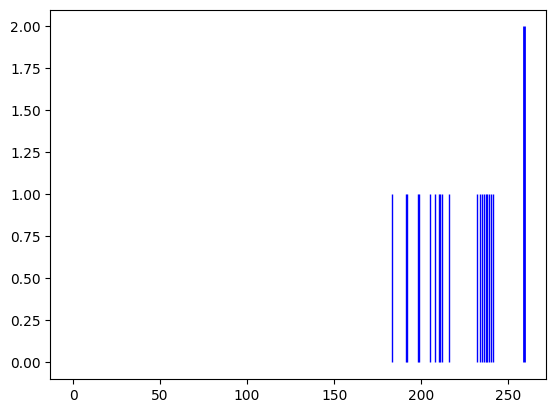

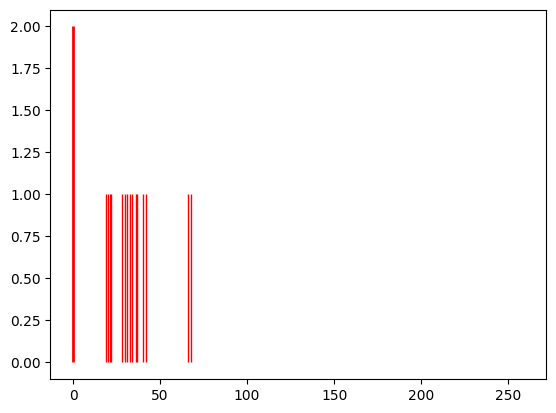

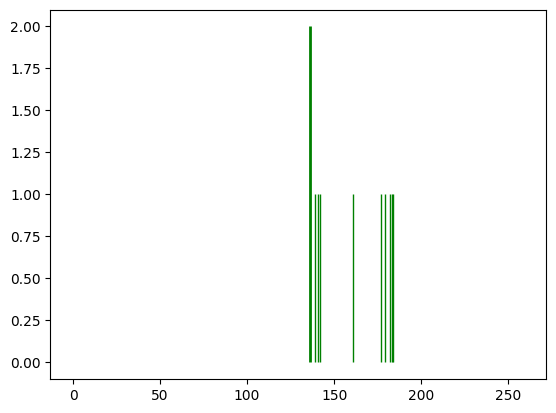

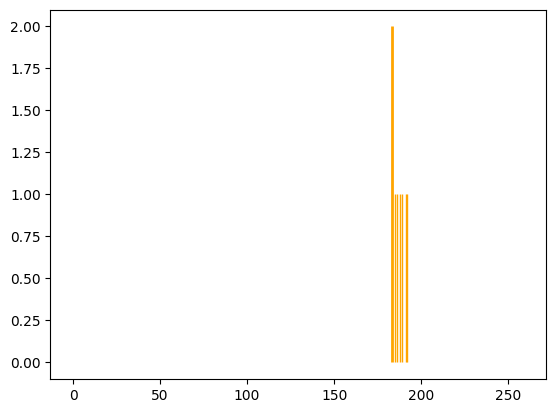

In [396]:
draw_all_ladders(all_segments)

Spectrum num=821, size=64, matched=12, frac=0.1875
Spectrum num=821, size=64, matched=8, frac=0.125


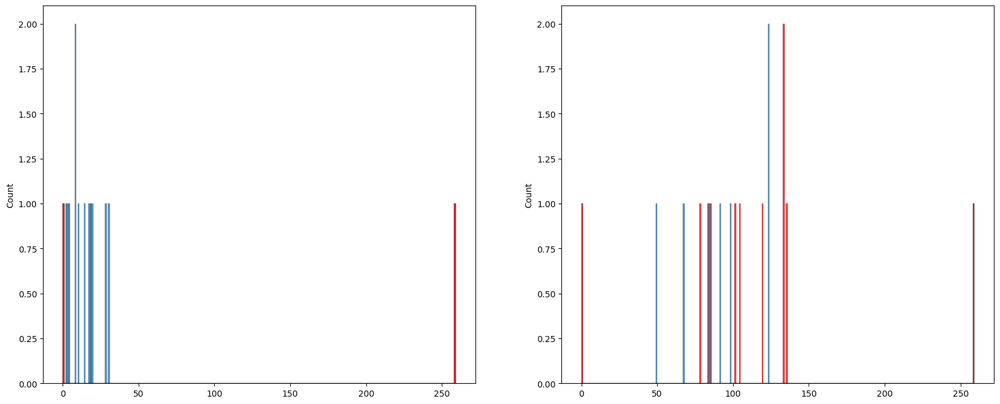

<Figure size 1200x800 with 0 Axes>

{33, 34, 4, 38, 40, 8, 49, 50, 20, 24, 26, 31}


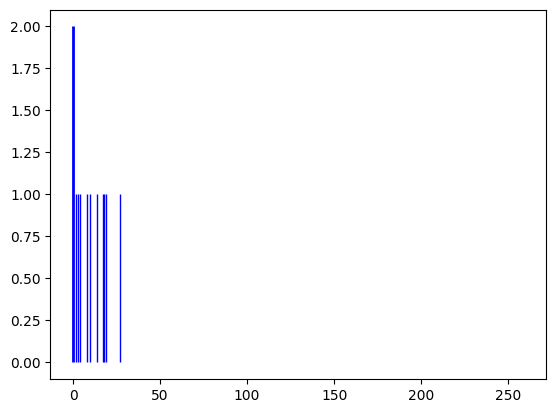

Spectrum num=823, size=68, matched=32, frac=0.47058823529411764
Spectrum num=823, size=68, matched=12, frac=0.17647058823529413


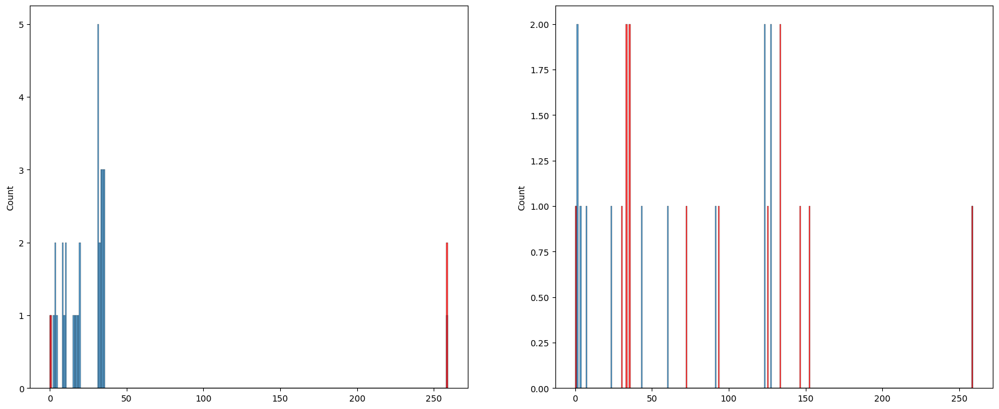

<Figure size 1200x800 with 0 Axes>

{4, 5, 7, 8, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 25, 26, 29, 30, 31, 34, 37, 38, 47, 53, 54, 55, 57, 60}
{1, 2, 3, 9, 12, 21, 23, 28, 32, 35, 36, 39, 40, 41, 42, 43, 44, 46, 48, 50, 51, 58, 63}


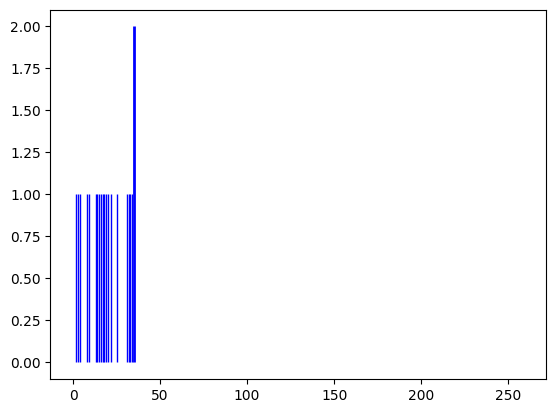

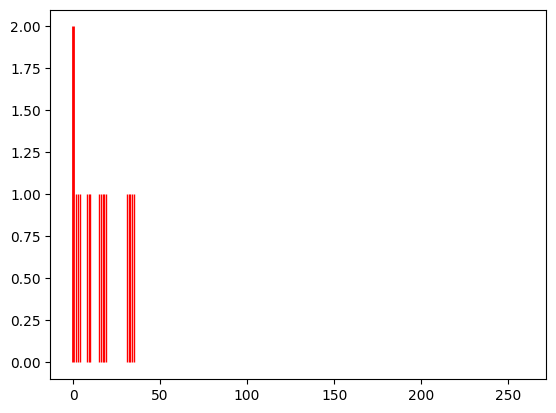

Spectrum num=839, size=69, matched=37, frac=0.5362318840579711
Spectrum num=839, size=69, matched=11, frac=0.15942028985507245


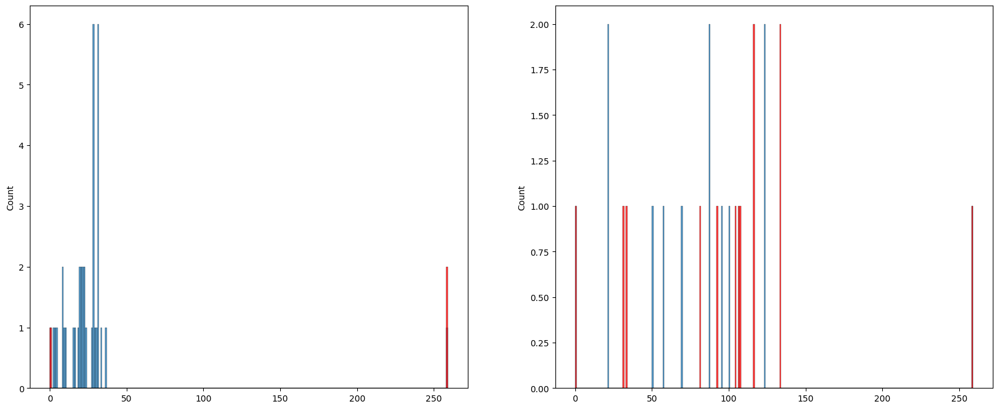

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 5, 6, 7, 8, 9, 13, 15, 16, 18, 23, 24, 26, 27, 31, 33, 36, 41, 43, 45, 46, 50, 51, 52, 53, 58, 59, 63}
{64, 38, 10, 14, 19, 54, 22, 25}
{4, 37, 40, 42, 11, 30}
{32, 34, 47, 60, 61, 62}


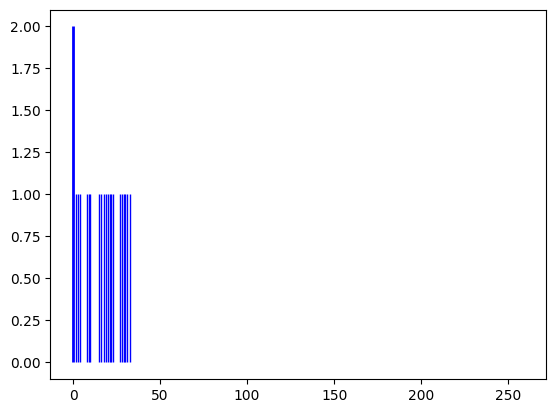

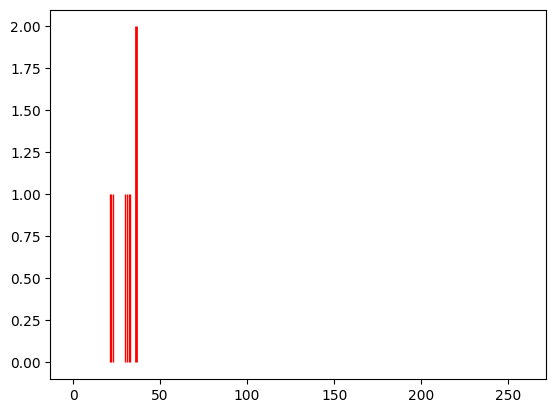

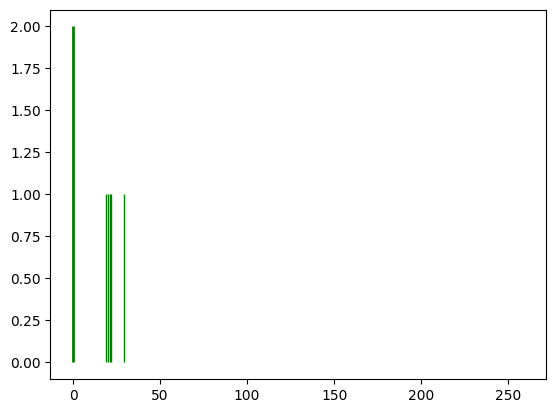

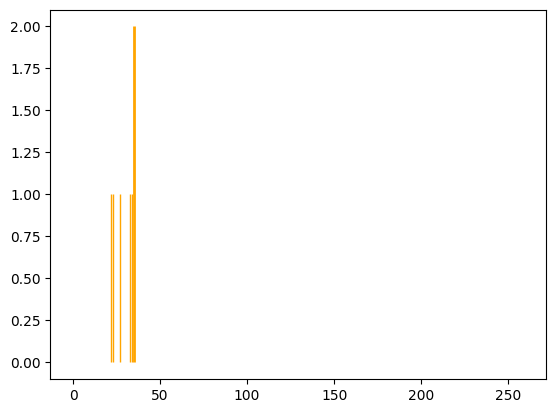

Spectrum num=875, size=69, matched=36, frac=0.5217391304347826
Spectrum num=875, size=69, matched=11, frac=0.15942028985507245


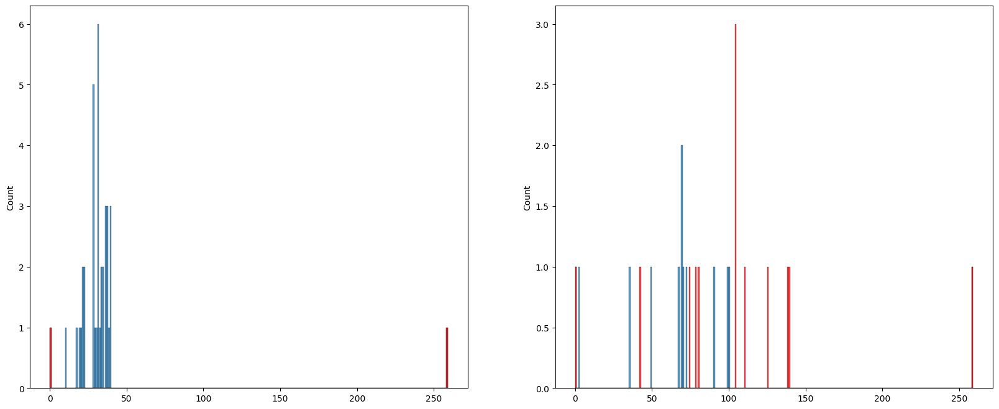

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 5, 6, 7, 8, 11, 13, 14, 17, 18, 19, 22, 23, 25, 26, 27, 30, 34, 36, 38, 42, 51, 54}
{33, 4, 68, 15, 55}
{32, 37, 40, 44, 50, 21, 24, 57}


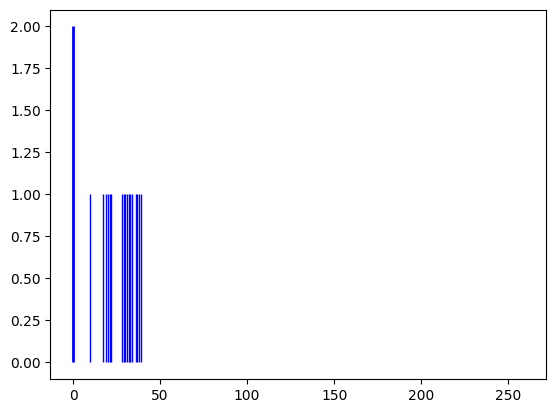

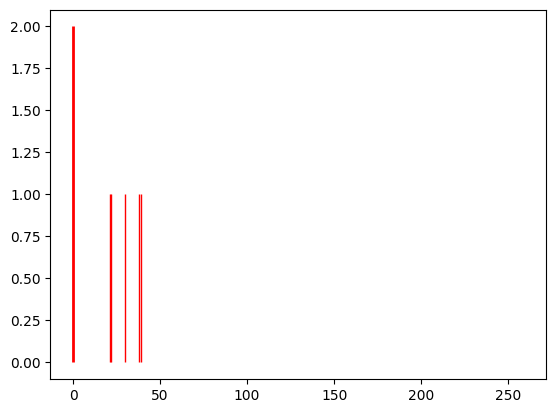

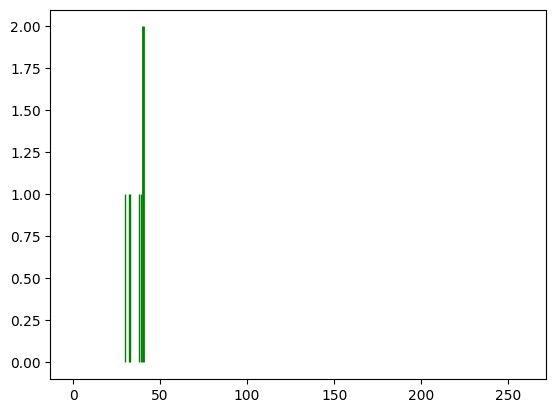

Spectrum num=879, size=77, matched=22, frac=0.2857142857142857
Spectrum num=879, size=77, matched=9, frac=0.11688311688311688


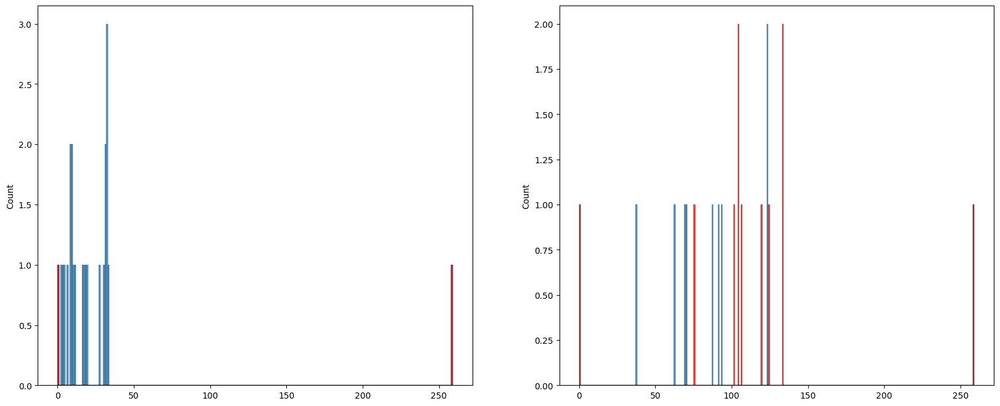

<Figure size 1200x800 with 0 Axes>

{16, 17, 20, 25, 27, 31, 32, 33, 34, 42, 46, 48, 53, 58, 59, 60, 63, 64, 71, 74}
{68, 69, 19, 57, 61, 62}
{0, 8, 40, 76, 13, 15, 49}


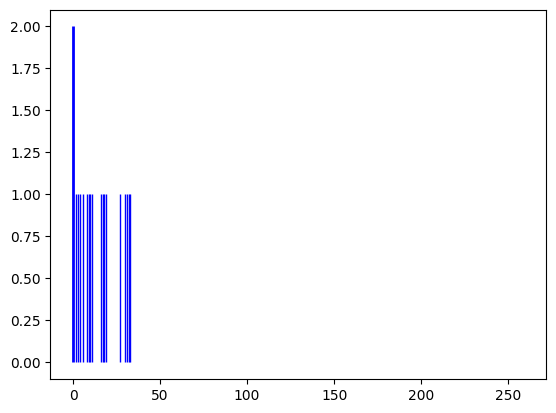

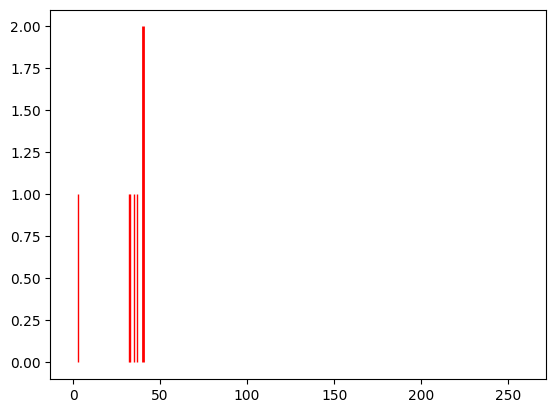

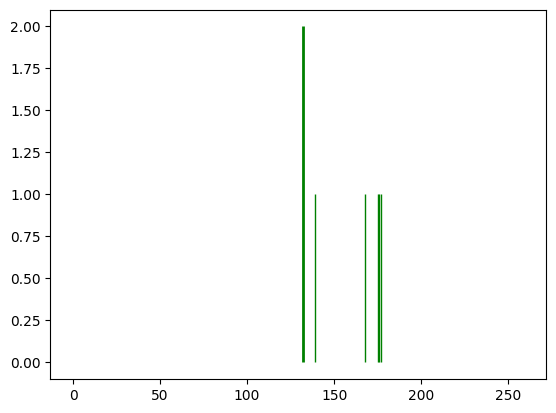

Spectrum num=911, size=63, matched=1, frac=0.015873015873015872
Spectrum num=911, size=63, matched=25, frac=0.3968253968253968


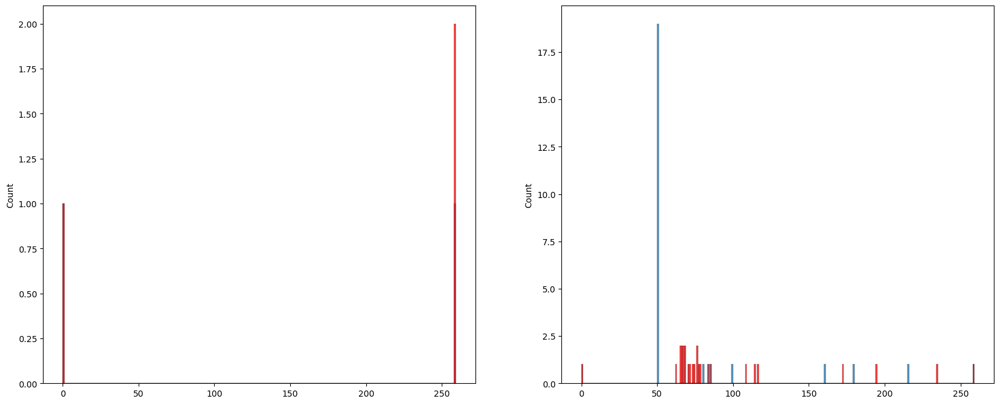

<Figure size 1200x800 with 0 Axes>

{1, 4, 5, 6, 15, 24, 25, 26, 32, 33, 38, 40, 41, 45, 49, 51, 55, 57, 60, 62}
{3, 7, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 37, 42, 43, 46, 48, 50, 53, 58}


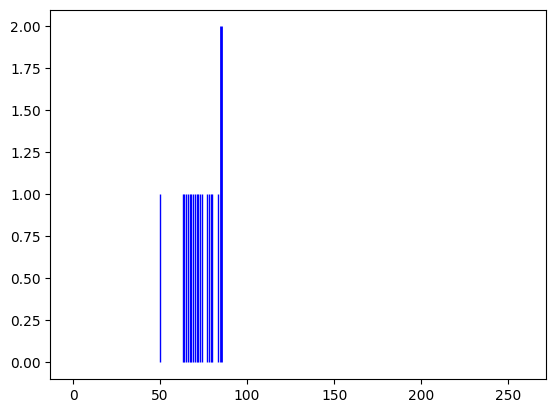

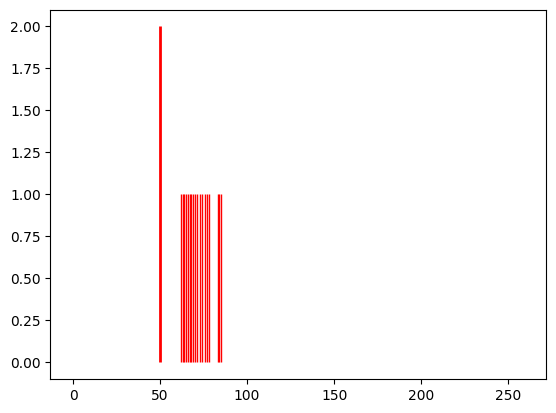

Spectrum num=915, size=63, matched=1, frac=0.015873015873015872
Spectrum num=915, size=63, matched=24, frac=0.38095238095238093


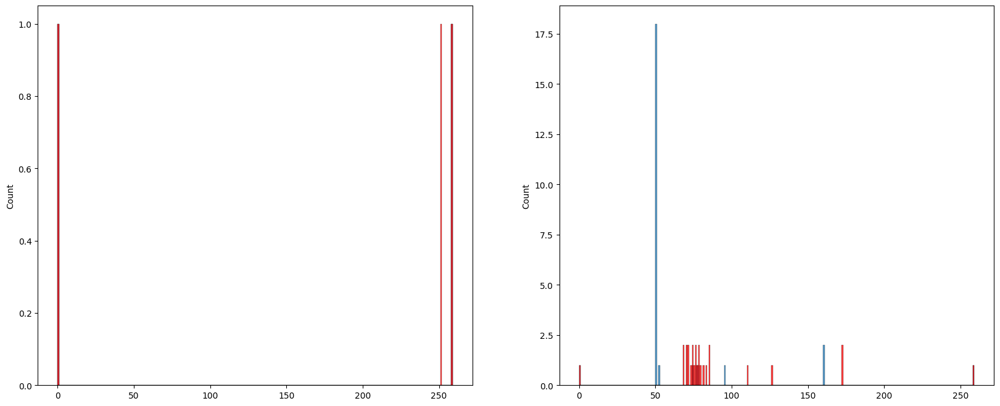

<Figure size 1200x800 with 0 Axes>

{2, 3, 4, 5, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 24, 27, 29, 30, 31, 32, 34, 35, 36, 39, 40, 43, 45, 47, 49}
{33, 37, 6, 41, 44, 12, 46, 48, 50, 19, 20, 21, 22, 55, 25, 26, 28, 57}


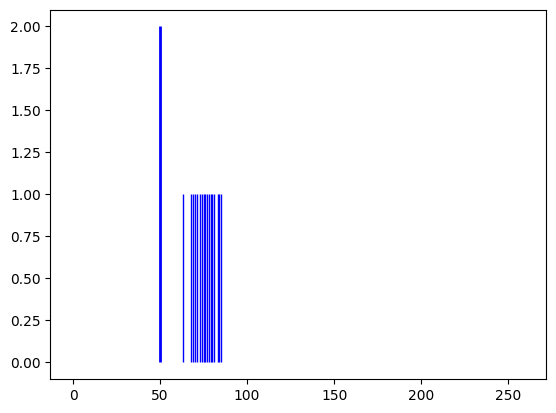

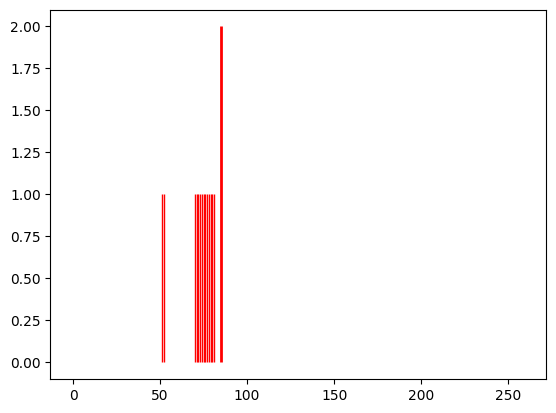

Spectrum num=948, size=53, matched=0, frac=0.0
Spectrum num=948, size=53, matched=21, frac=0.39622641509433965


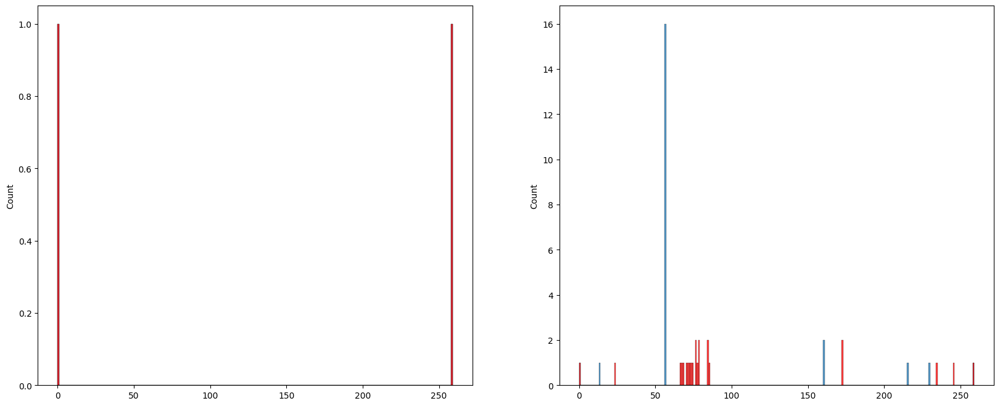

<Figure size 1200x800 with 0 Axes>

{0, 1, 4, 6, 8, 11, 12, 13, 14, 15, 18, 19, 20, 22, 23, 26, 28, 29, 31, 32, 36, 37, 38, 40, 41}
{34, 3, 5, 7, 9, 42, 10, 44, 47, 48, 17, 49, 52, 24, 27, 30}
{35, 39, 45, 46, 16, 25}


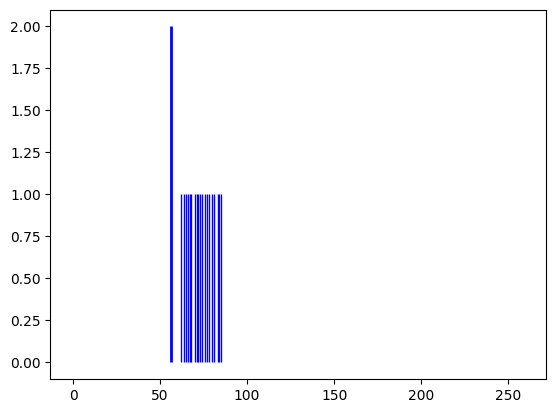

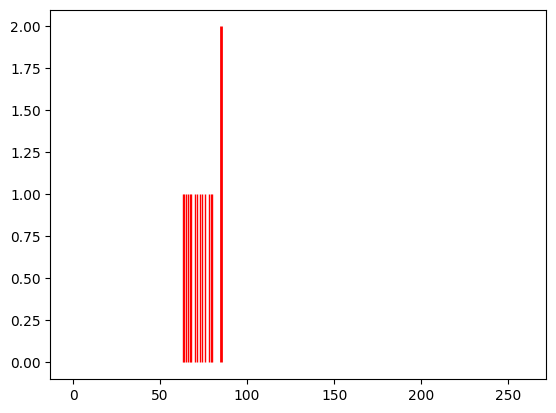

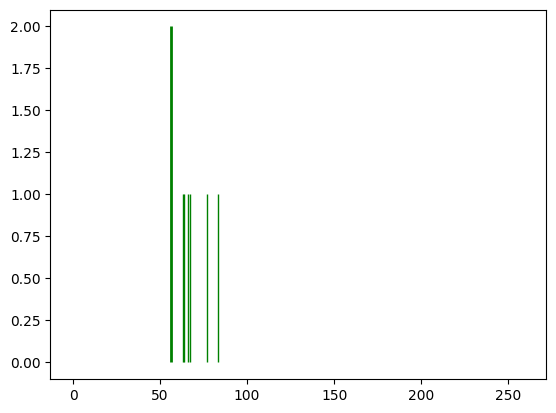

Spectrum num=995, size=50, matched=1, frac=0.02
Spectrum num=995, size=50, matched=12, frac=0.24


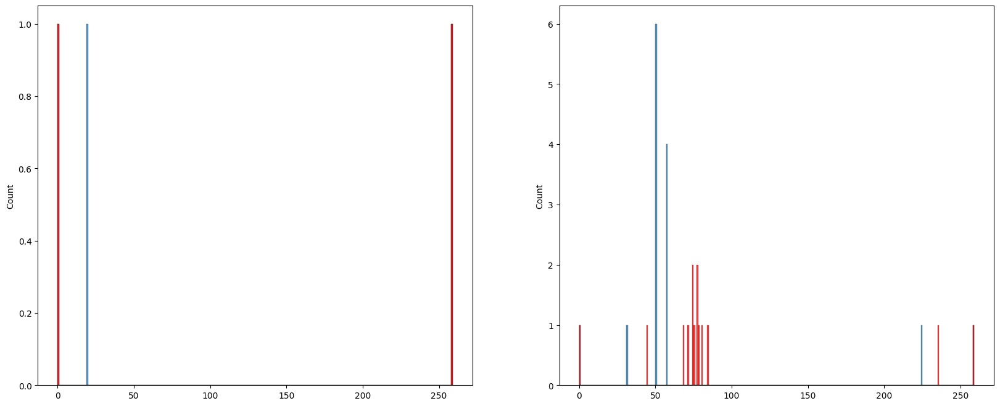

<Figure size 1200x800 with 0 Axes>

{1, 35, 38, 6, 40, 42, 43, 13, 19, 27, 31}
{34, 8, 41, 17, 18, 20, 21, 23}
{2, 36, 5, 4, 7, 10, 22, 29}
{32, 3, 11, 44, 12, 24, 30}


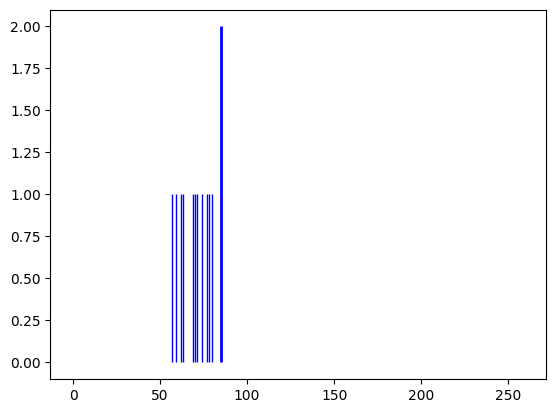

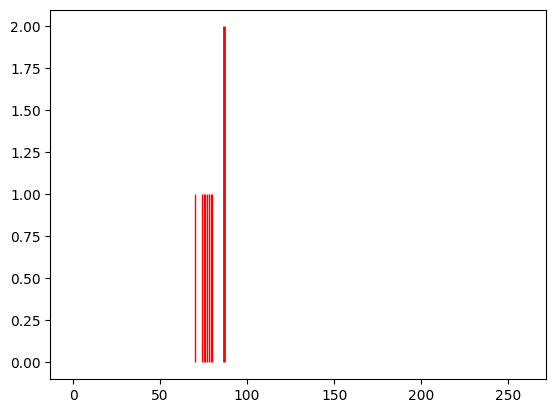

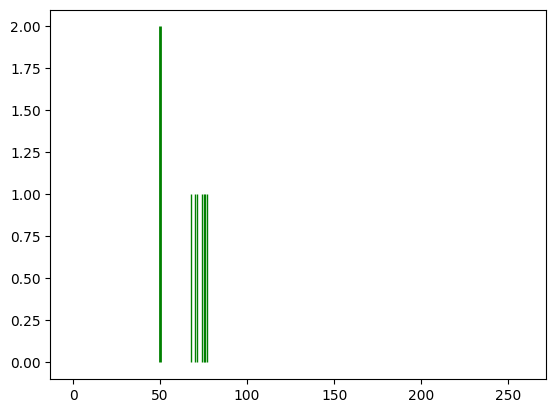

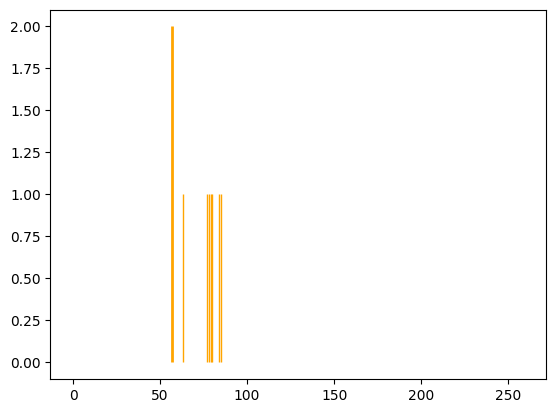

Spectrum num=1066, size=71, matched=3, frac=0.04225352112676056
Spectrum num=1066, size=71, matched=23, frac=0.323943661971831


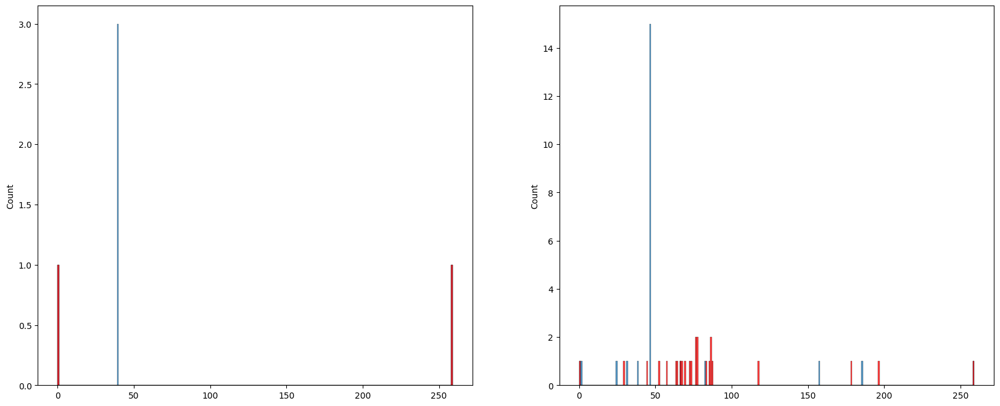

<Figure size 1200x800 with 0 Axes>

{0, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 17, 18, 19, 20, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 44, 45, 46, 47, 50, 54, 57}
{64, 1, 34, 35, 36, 40, 8, 10, 43, 15, 52, 21, 53, 56, 24, 61, 62, 63}


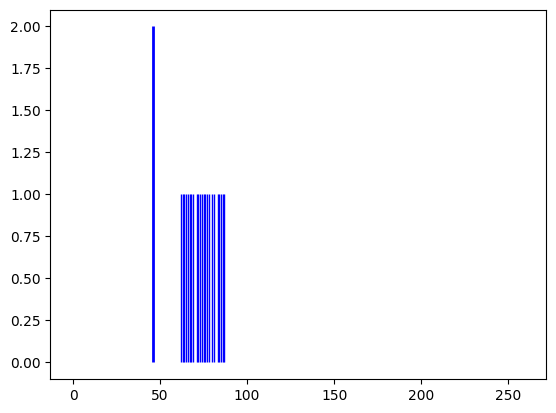

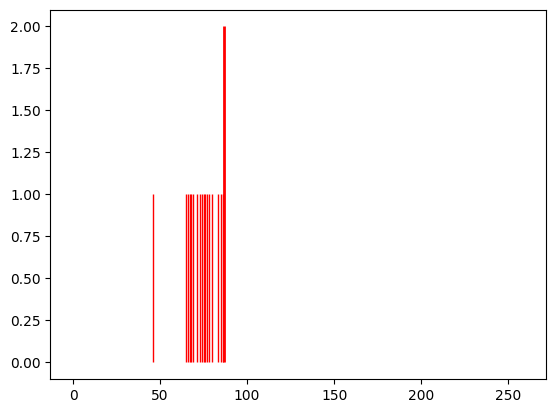

Spectrum num=1074, size=75, matched=44, frac=0.5866666666666667
Spectrum num=1074, size=75, matched=18, frac=0.24


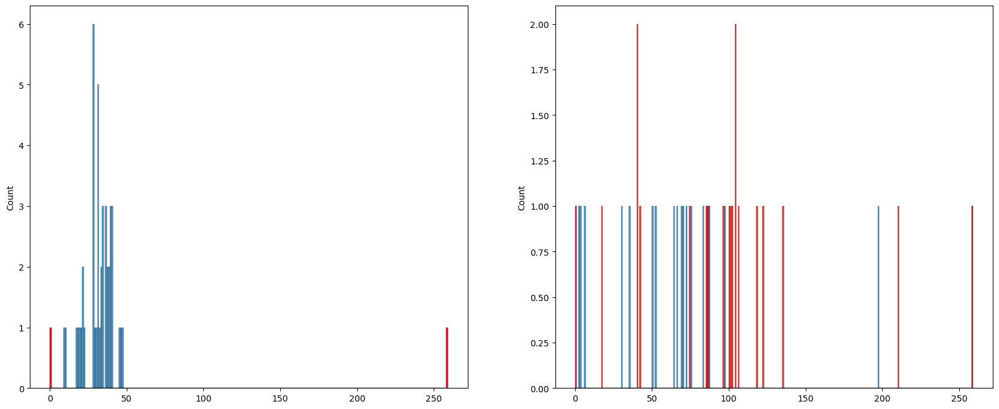

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 6, 7, 8, 9, 10, 11, 12, 13, 17, 18, 19, 20, 21, 22, 28, 29, 30, 31, 33, 34, 35, 37, 42, 43, 44, 45, 49, 54, 55, 60, 67, 72}
{64, 2, 36, 5, 39, 40, 41, 14, 16, 48, 51, 23, 25}
{47, 56, 24, 26, 62}
{32, 38, 15, 58, 59}


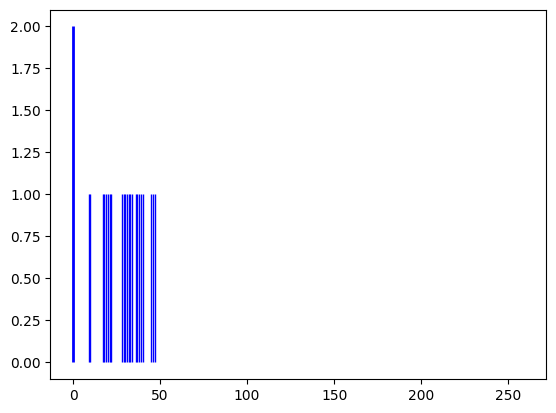

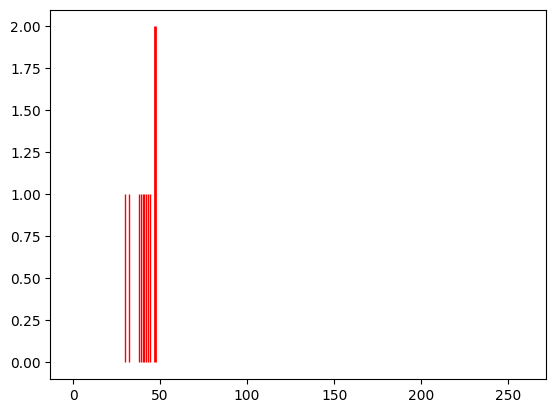

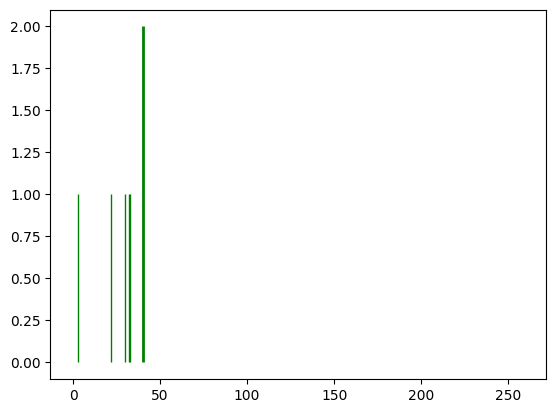

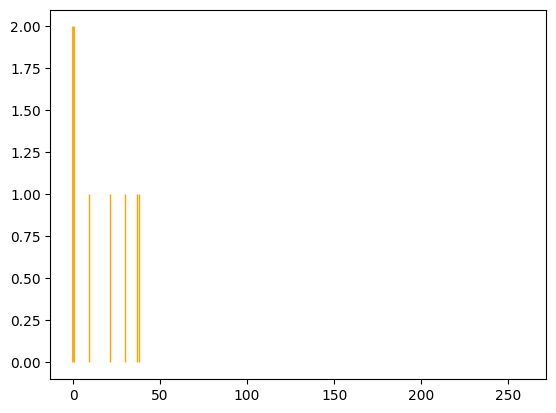

Spectrum num=1076, size=88, matched=57, frac=0.6477272727272727
Spectrum num=1076, size=88, matched=13, frac=0.14772727272727273


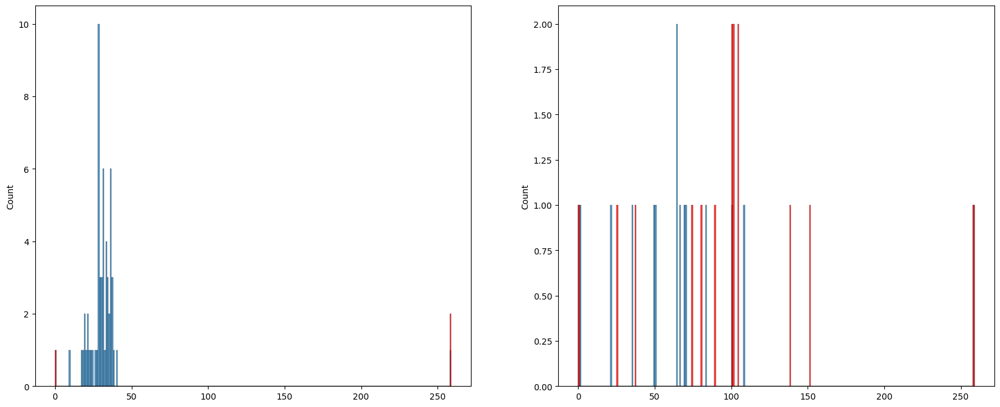

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 6, 8, 9, 10, 11, 12, 13, 16, 18, 20, 22, 24, 25, 26, 28, 29, 30, 31, 34, 35, 37, 39, 41, 47, 51, 52, 58, 59, 60, 63, 67, 70, 74, 78, 81, 84}
{38, 71, 73, 50, 54, 55, 27}
{32, 3, 7, 40, 44, 14, 15, 23}


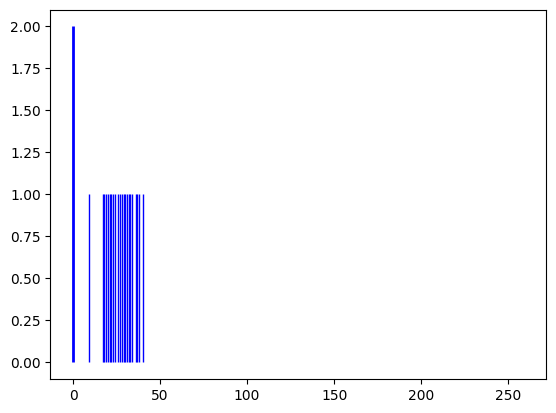

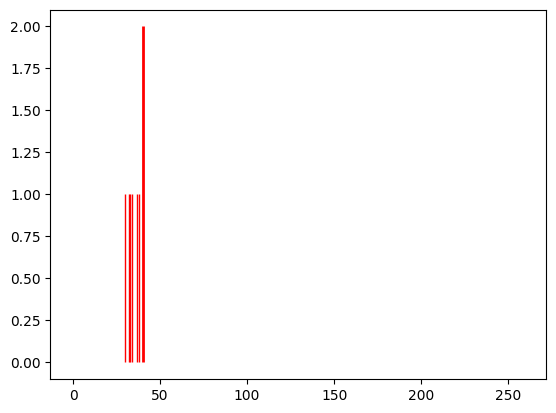

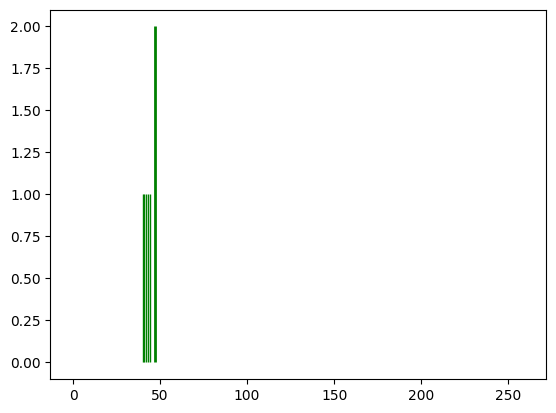

Spectrum num=1078, size=55, matched=3, frac=0.05454545454545454
Spectrum num=1078, size=55, matched=21, frac=0.38181818181818183


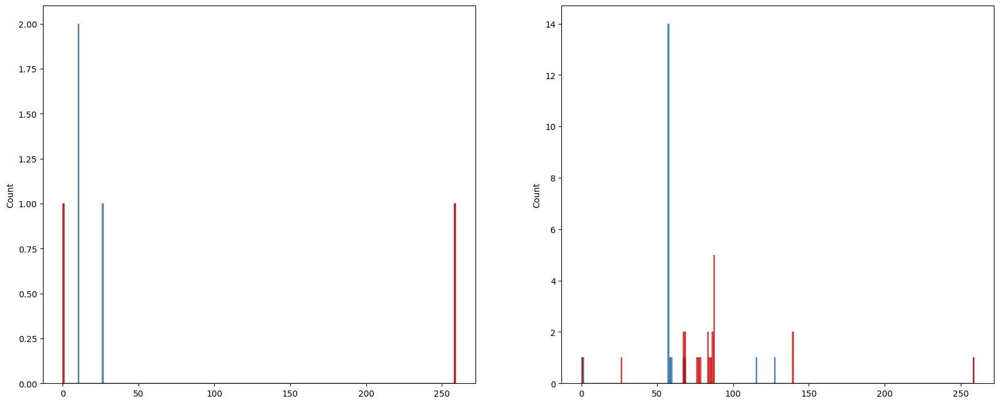

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 4, 6, 8, 10, 15, 17, 21, 23, 26, 27, 30, 33, 34, 38, 40, 41, 42, 43, 44, 47, 51, 52}
{32, 5, 7, 11, 12, 13, 14, 16, 18, 19, 20, 22, 24, 25, 28, 29}
{36, 9, 49, 53, 31}


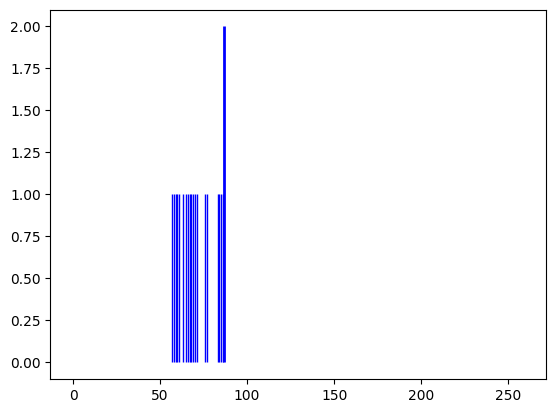

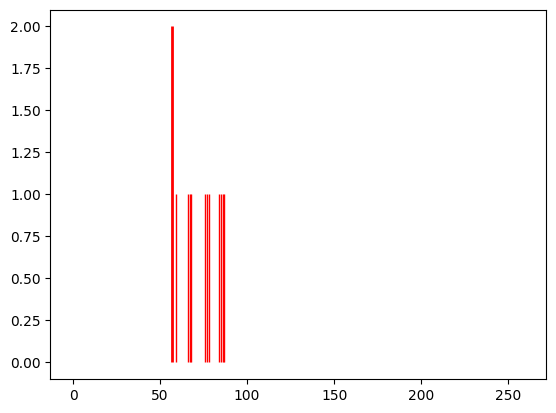

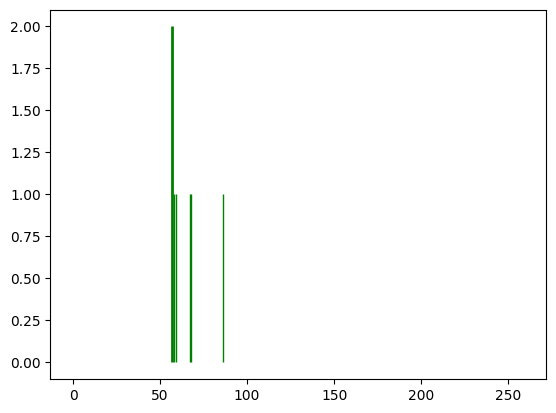

Spectrum num=1103, size=87, matched=47, frac=0.5402298850574713
Spectrum num=1103, size=87, matched=18, frac=0.20689655172413793


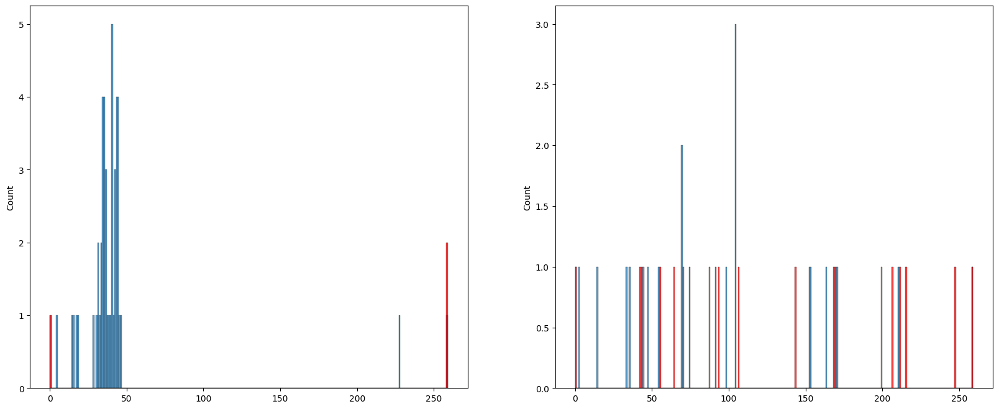

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 5, 6, 8, 10, 11, 12, 14, 16, 18, 23, 24, 26, 30, 35, 36, 37, 39, 41, 42, 43, 48, 49, 50, 51, 53, 54, 61, 65, 67, 69, 73, 74}
{13, 15, 17, 20, 22, 25, 28, 29, 31, 32, 33, 34, 40, 47, 55, 59, 62, 63, 70, 75, 77}
{46, 79, 81, 19, 60}


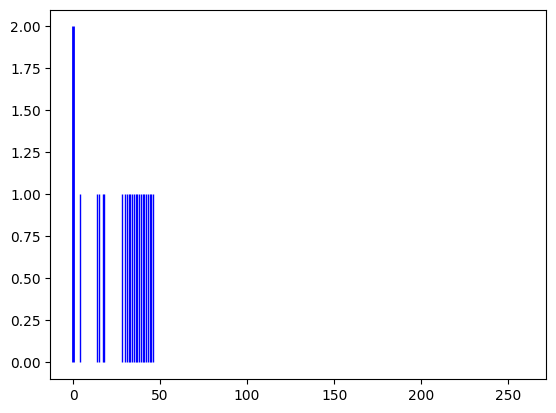

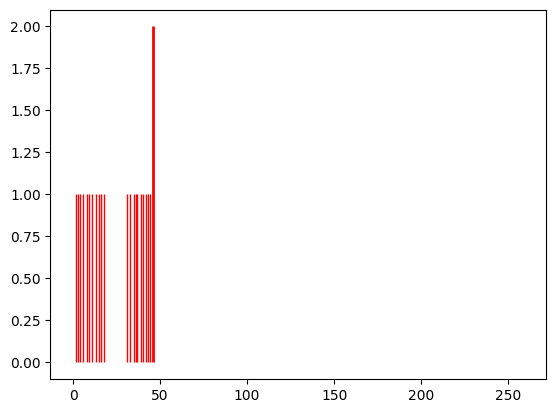

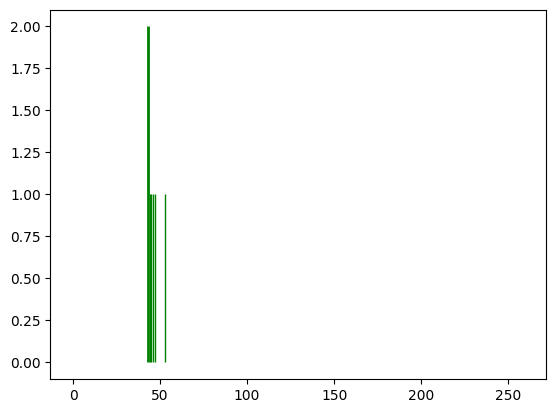

Spectrum num=1220, size=69, matched=0, frac=0.0
Spectrum num=1220, size=69, matched=14, frac=0.2028985507246377


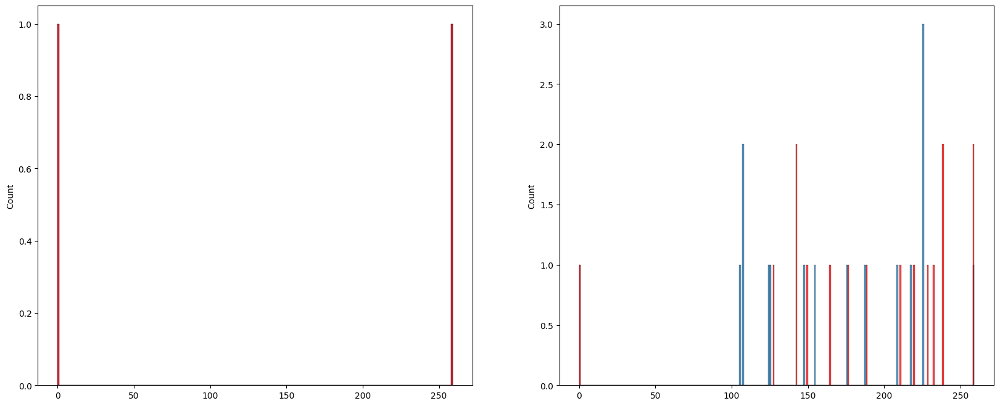

<Figure size 1200x800 with 0 Axes>

{32, 5, 38, 7, 8, 12, 46, 19, 52, 53, 21, 57}
{37, 9, 42, 17, 22, 55}
{66, 68, 16, 24, 30}
{34, 67, 43, 49, 18}


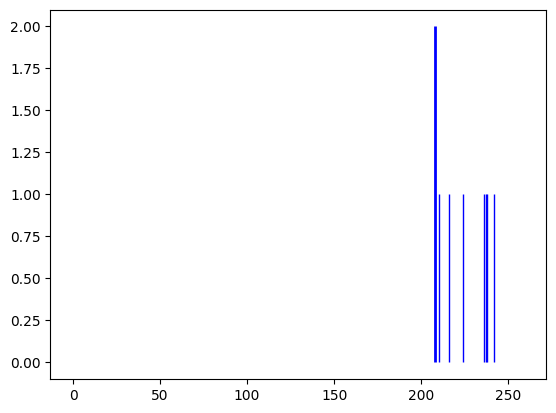

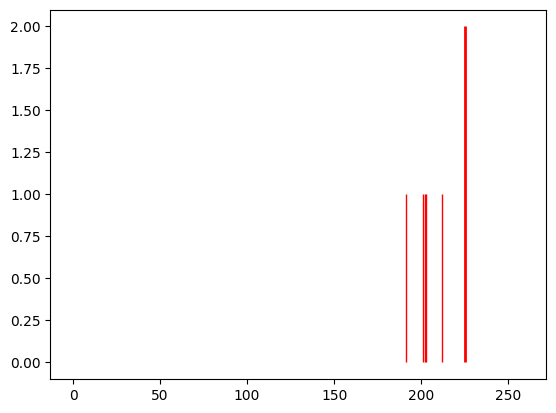

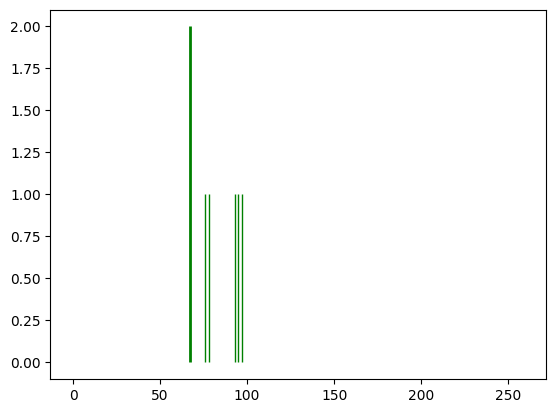

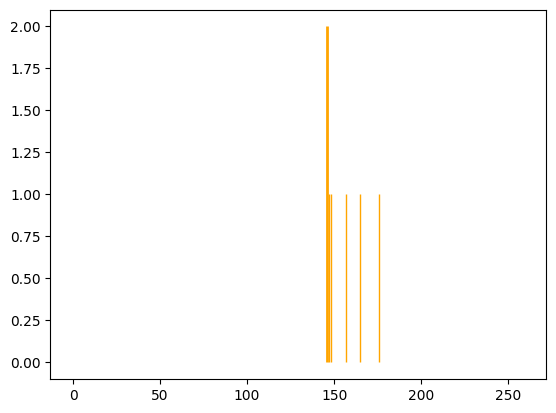

Spectrum num=1275, size=90, matched=56, frac=0.6222222222222222
Spectrum num=1275, size=90, matched=13, frac=0.14444444444444443


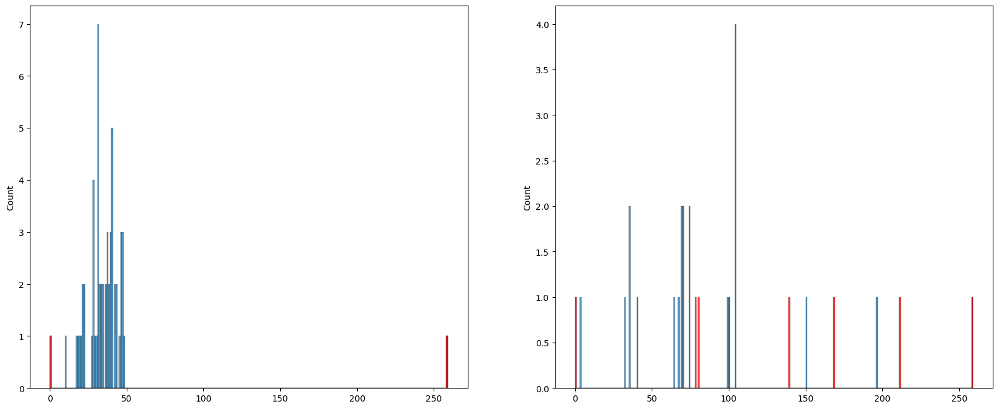

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 16, 17, 18, 21, 22, 23, 25, 26, 27, 28, 33, 34, 36, 38, 39, 54, 60, 61, 62, 63, 64, 65, 66, 67, 73, 77, 79, 84}
{32, 2, 69, 37, 41, 74, 75, 10, 48, 20, 53, 87, 57}
{35, 58, 40, 8, 42, 19, 24, 56, 29, 30}
{44, 76, 81, 49, 82, 31}


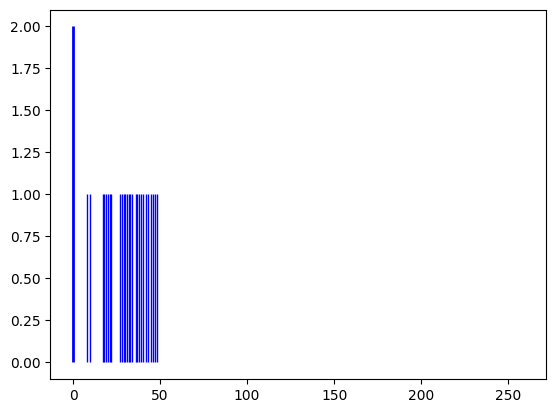

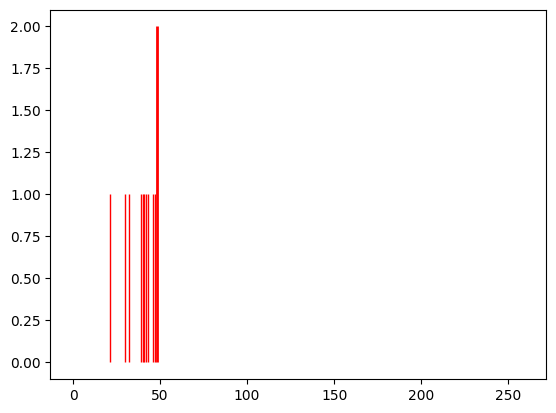

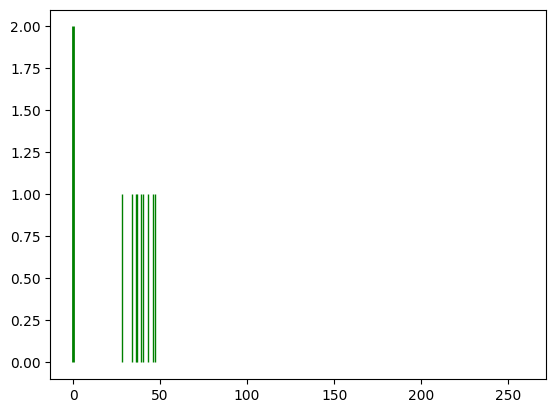

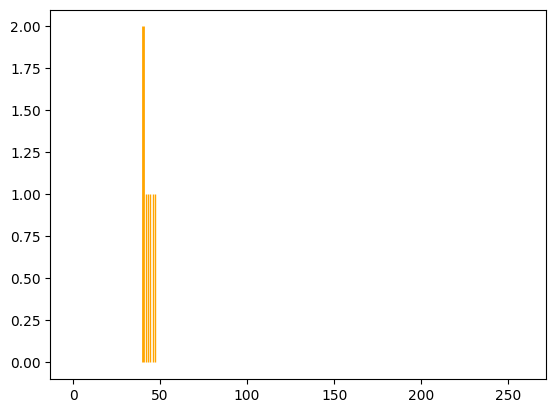

Spectrum num=1288, size=150, matched=64, frac=0.4266666666666667
Spectrum num=1288, size=150, matched=40, frac=0.26666666666666666


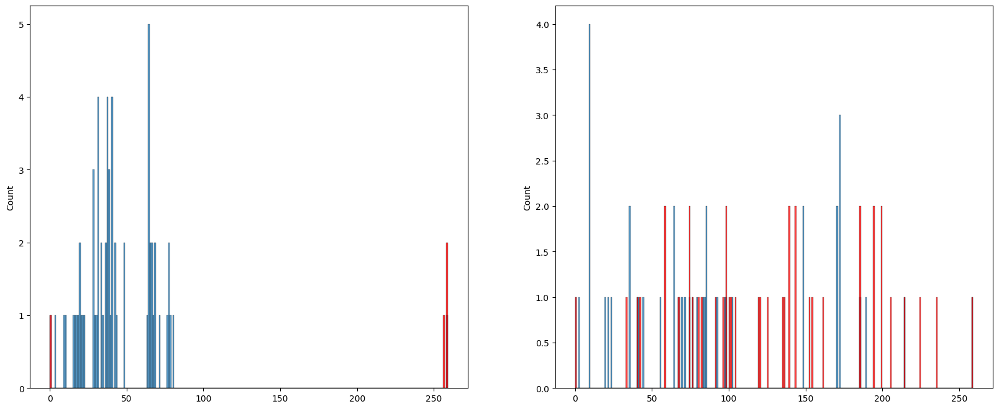

<Figure size 1200x800 with 0 Axes>

{0, 132, 5, 6, 9, 138, 10, 145, 17, 18, 21, 29, 30, 33, 34, 37, 39, 41, 43, 44, 49, 51, 52, 53, 57, 59, 60, 63, 71, 80, 81, 82, 85, 89, 92, 95, 97, 101, 108, 114}
{1, 2, 4, 135, 11, 140, 13, 16, 146, 23, 26, 27, 32, 35, 36, 38, 40, 45, 46, 48, 58, 61, 62, 66, 69, 72, 73, 75, 88, 90, 91, 93, 99, 104, 123}
{65, 3, 100, 8, 76, 19, 22, 56, 31}
{68, 142, 50, 149, 118, 54}


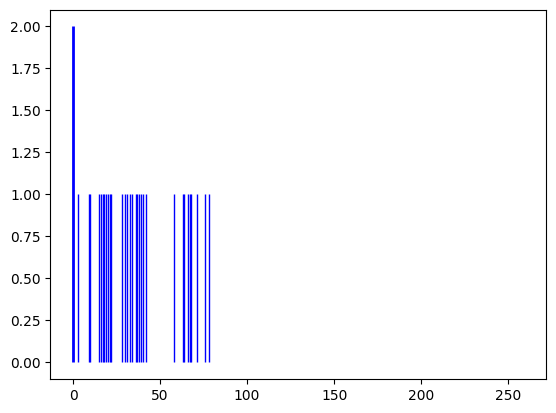

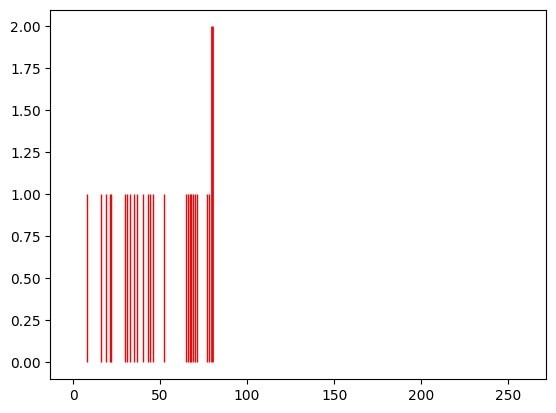

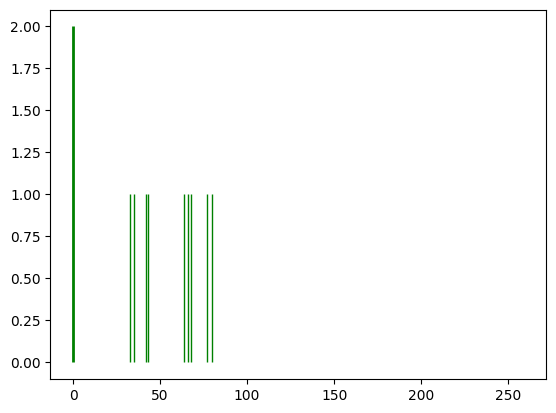

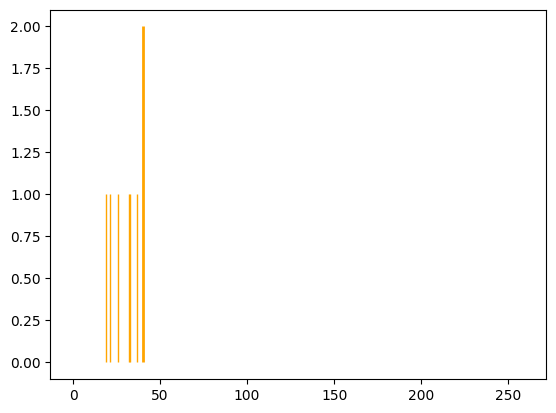

Spectrum num=1293, size=145, matched=60, frac=0.41379310344827586
Spectrum num=1293, size=145, matched=38, frac=0.2620689655172414


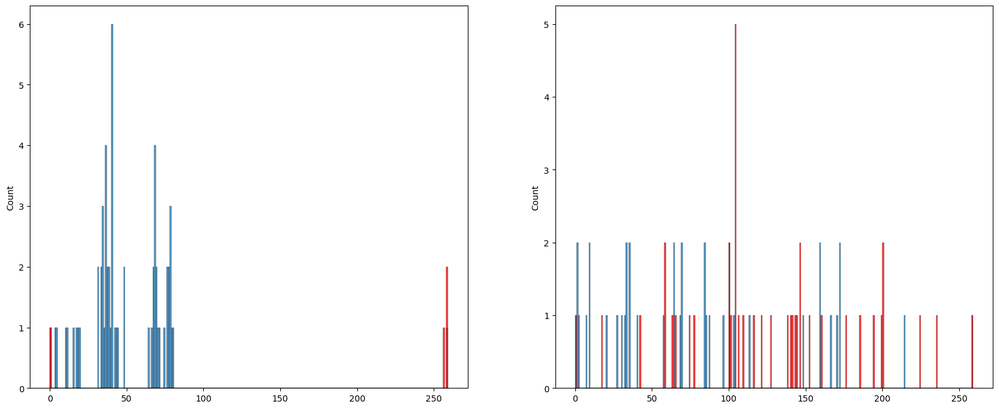

<Figure size 1200x800 with 0 Axes>

{2, 7, 136, 138, 10, 140, 13, 11, 18, 20, 21, 22, 23, 26, 27, 30, 31, 32, 34, 42, 44, 45, 47, 48, 49, 53, 54, 60, 64, 65, 71, 73, 77, 78, 91, 94, 98, 100, 103, 105, 109, 111, 116, 122, 124}
{0, 3, 5, 8, 137, 9, 14, 15, 17, 24, 28, 29, 33, 35, 37, 38, 40, 41, 46, 51, 52, 55, 57, 58, 59, 61, 62, 69, 74, 83, 84, 85, 88, 89, 93, 95, 101, 107, 110, 112, 117, 119, 125}


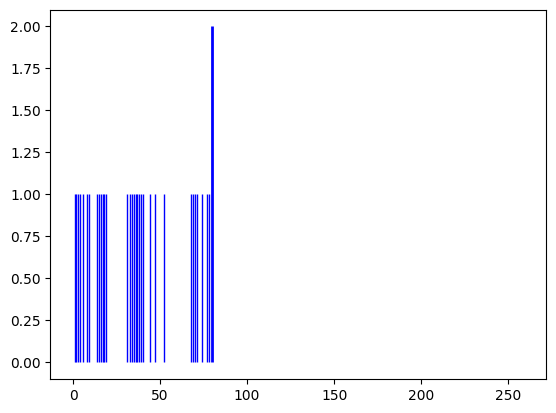

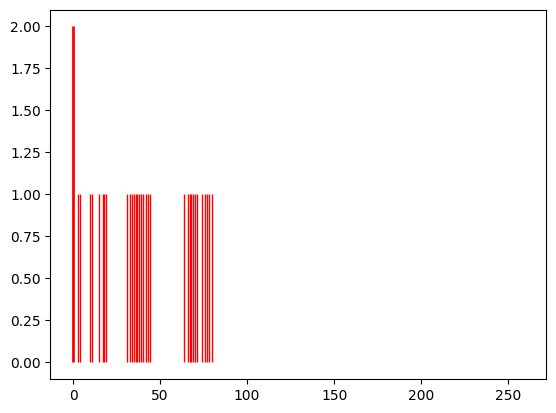

Spectrum num=1294, size=126, matched=43, frac=0.3412698412698413
Spectrum num=1294, size=126, matched=32, frac=0.25396825396825395


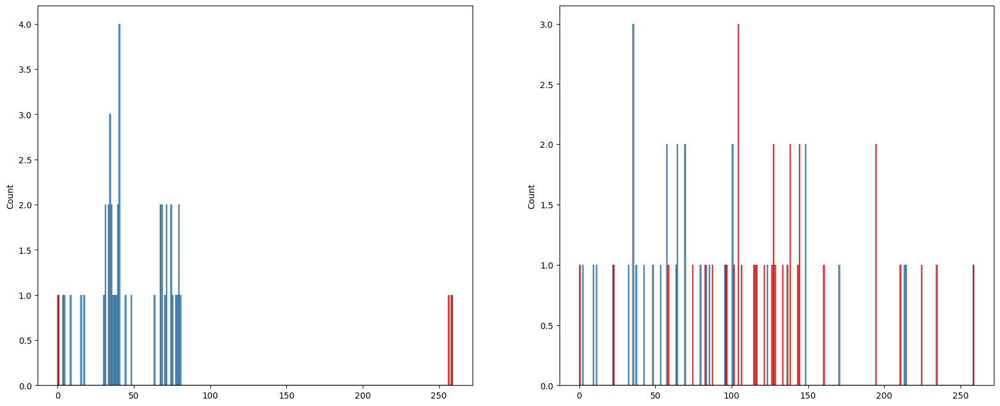

<Figure size 1200x800 with 0 Axes>

{3, 4, 10, 13, 16, 17, 23, 29, 30, 31, 32, 33, 35, 38, 40, 41, 50, 53, 55, 59, 66, 69, 70, 86, 98, 110, 115}
{5, 11, 14, 15, 18, 19, 20, 21, 26, 27, 36, 43, 44, 45, 46, 47, 60, 72, 87, 88, 93, 111, 117}


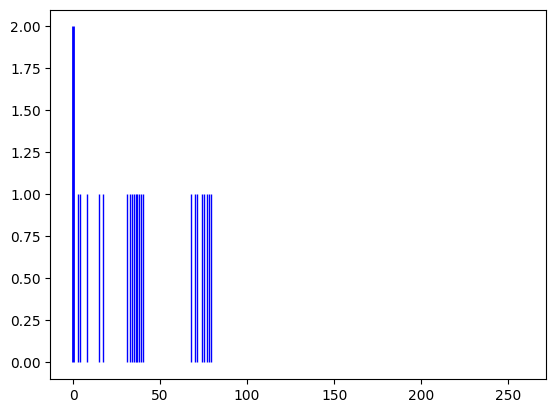

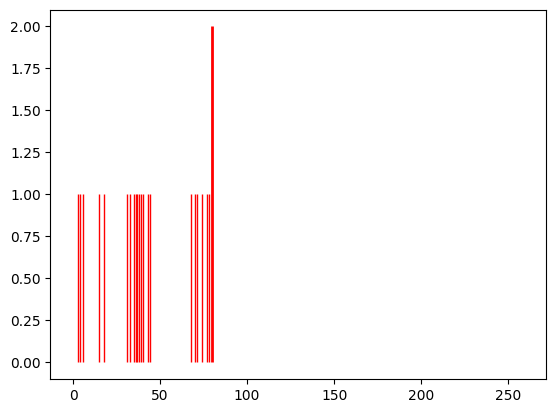

Spectrum num=1319, size=107, matched=49, frac=0.45794392523364486
Spectrum num=1319, size=107, matched=24, frac=0.22429906542056074


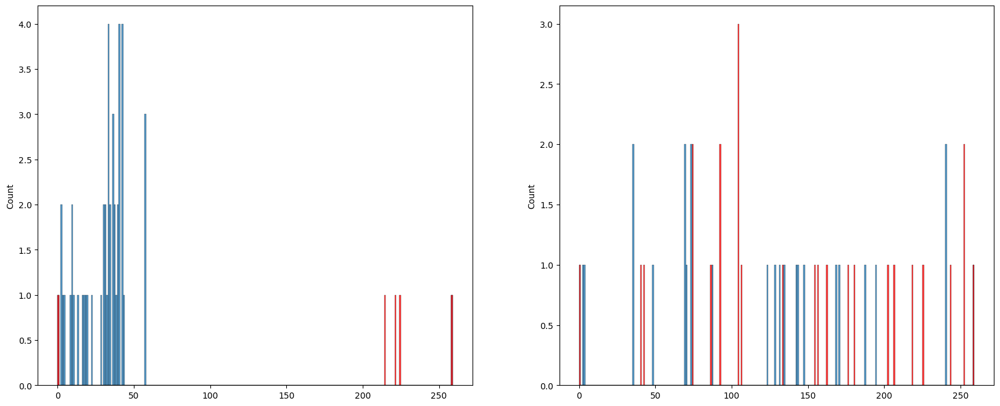

<Figure size 1200x800 with 0 Axes>

{2, 6, 8, 9, 11, 12, 13, 14, 16, 18, 19, 23, 24, 26, 27, 30, 31, 35, 36, 37, 39, 45, 49, 51, 53, 54, 63, 65, 67, 71, 72, 77, 86, 92, 93, 98, 99, 104}
{1, 3, 4, 5, 15, 17, 20, 21, 22, 25, 29, 32, 33, 38, 41, 43, 44, 46, 50, 52, 56, 57, 64, 66, 68, 69, 70, 75, 76, 78, 83, 84, 88, 91, 95}
{103, 40, 47, 81, 55, 87, 58, 60}


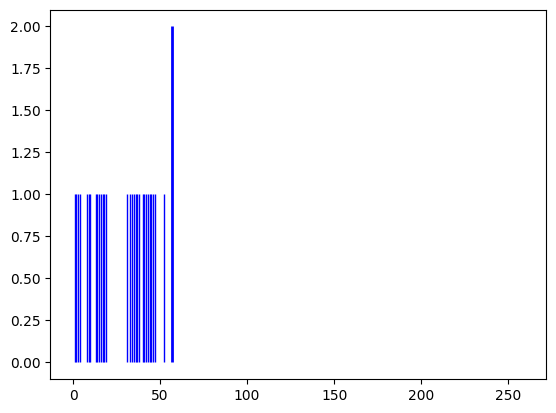

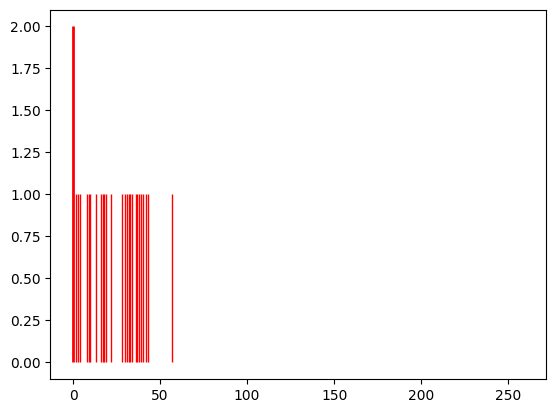

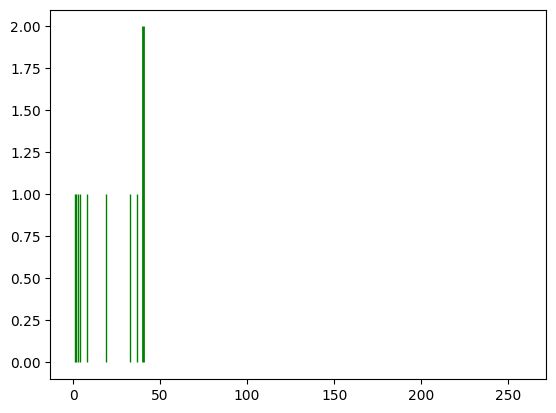

Spectrum num=1327, size=94, matched=55, frac=0.5851063829787234
Spectrum num=1327, size=94, matched=16, frac=0.1702127659574468


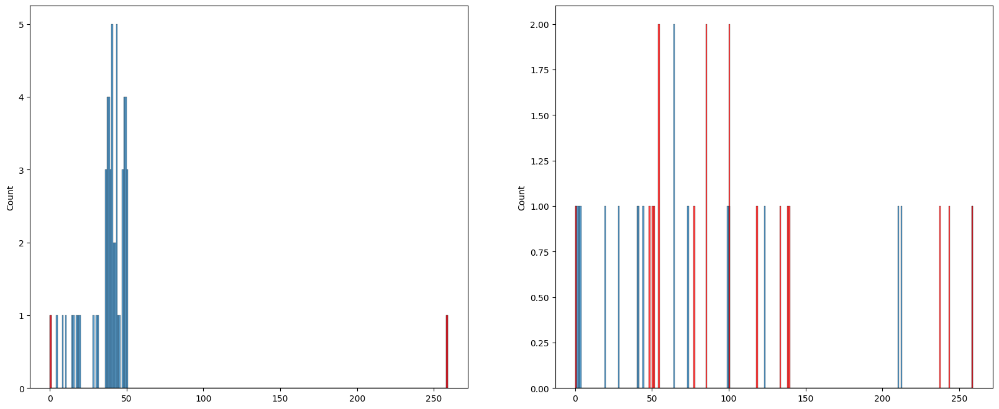

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 4, 6, 7, 8, 10, 12, 13, 15, 17, 19, 20, 21, 22, 23, 24, 25, 26, 39, 49, 62, 63, 67, 71, 74, 76, 83}
{32, 36, 41, 50, 51, 18, 27, 92, 61}
{68, 45, 79, 57, 58}


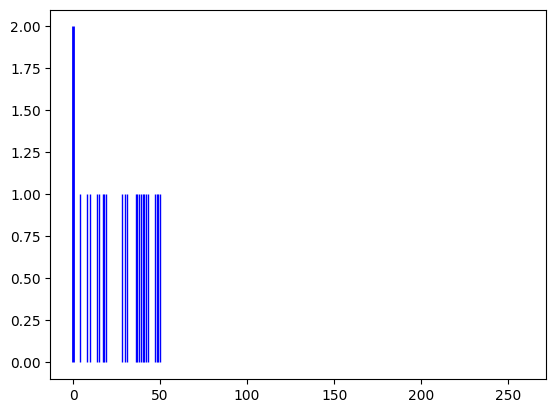

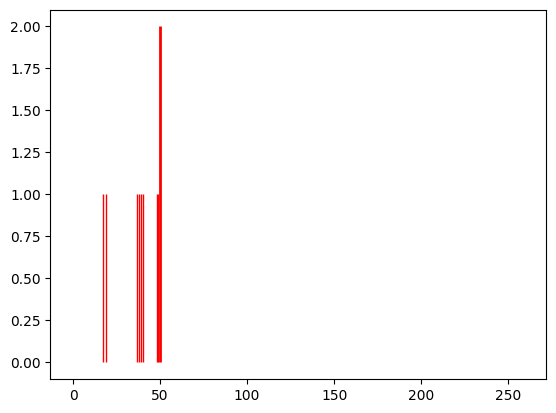

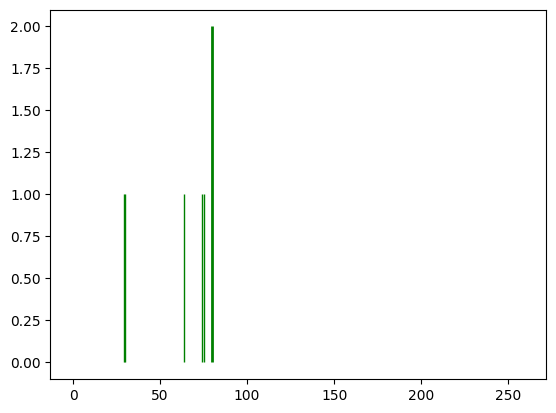

Spectrum num=1344, size=63, matched=38, frac=0.6031746031746031
Spectrum num=1344, size=63, matched=11, frac=0.1746031746031746


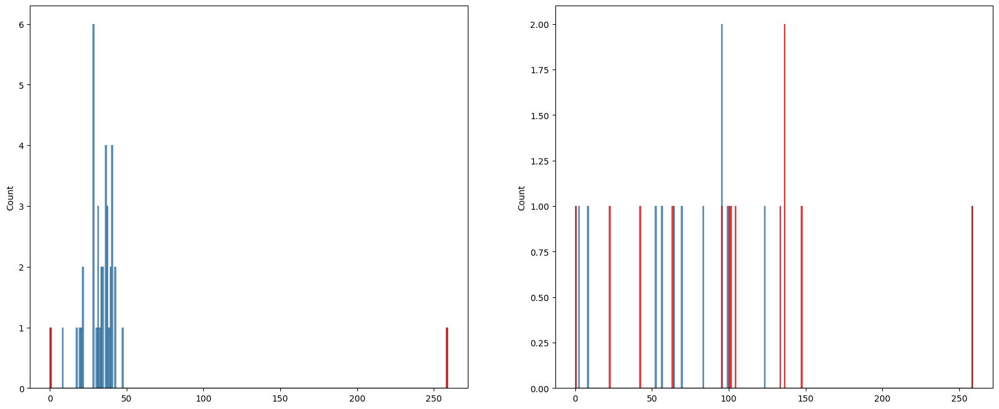

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 20, 21, 24, 25, 26, 27, 28, 30, 31, 34, 36, 38, 45, 55}
{3, 43, 17, 52, 22, 23, 61}


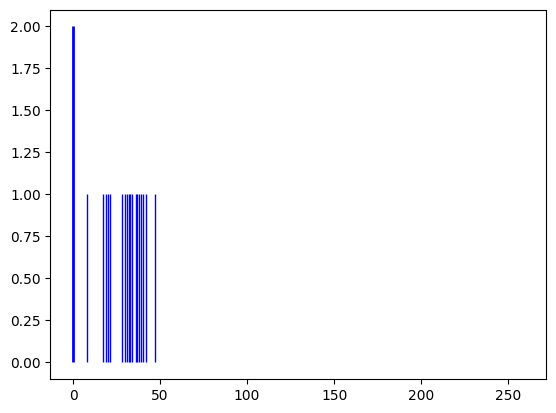

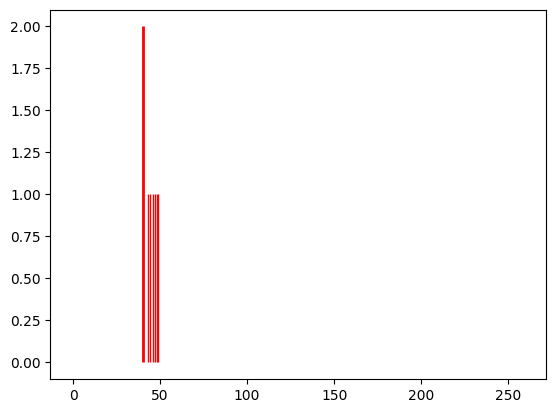

Spectrum num=1357, size=162, matched=52, frac=0.32098765432098764
Spectrum num=1357, size=162, matched=28, frac=0.1728395061728395


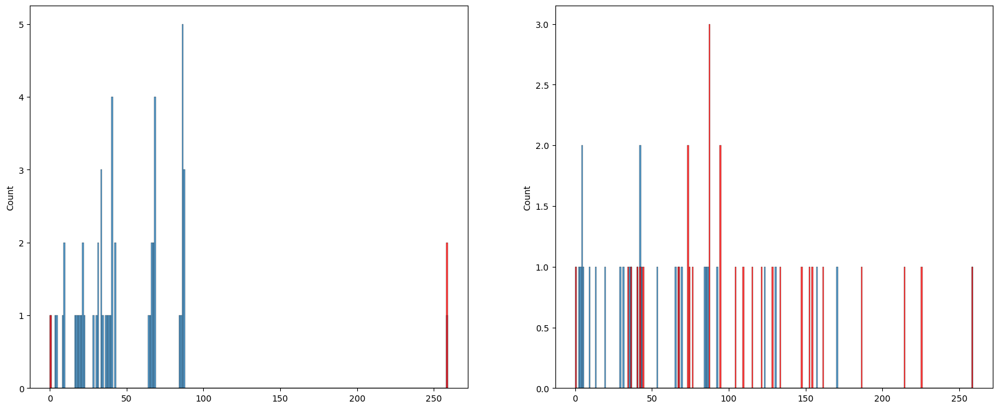

<Figure size 1200x800 with 0 Axes>

{0, 129, 2, 4, 5, 10, 14, 17, 146, 19, 151, 24, 25, 28, 35, 36, 42, 44, 53, 54, 55, 59, 62, 64, 69, 74, 77, 85, 88, 92, 97, 109}
{6, 8, 11, 12, 15, 145, 18, 152, 26, 29, 32, 34, 41, 46, 52, 67, 75, 83, 87, 91, 115, 125}
{160, 110, 48, 56, 30}
{7, 140, 13, 79, 16}
{3, 102, 82, 20, 149}


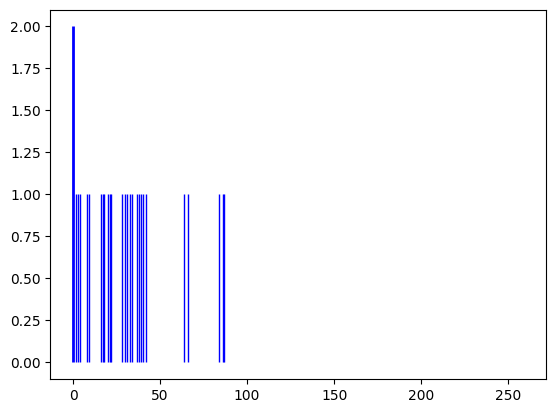

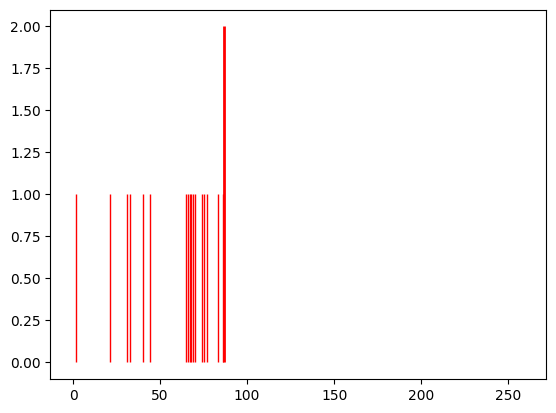

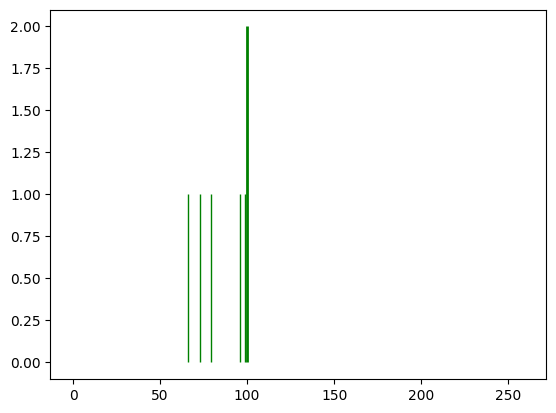

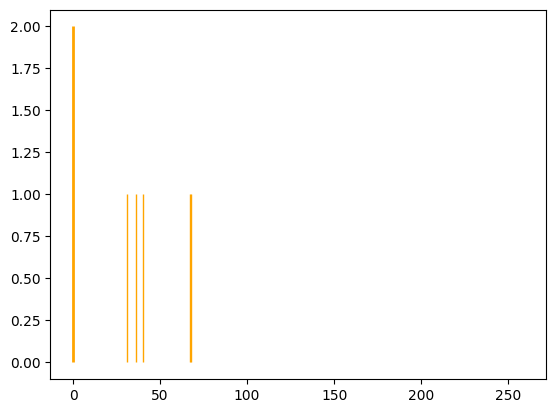

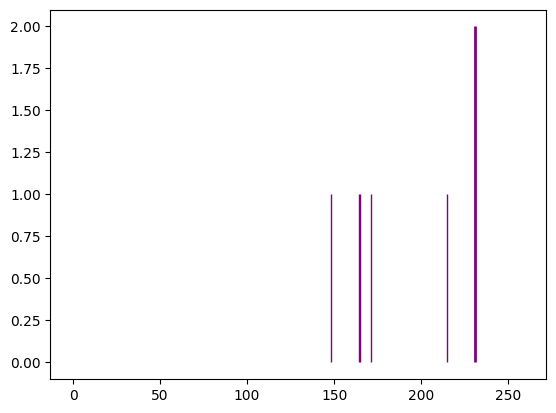

Spectrum num=1443, size=184, matched=4, frac=0.021739130434782608
Spectrum num=1443, size=184, matched=53, frac=0.28804347826086957


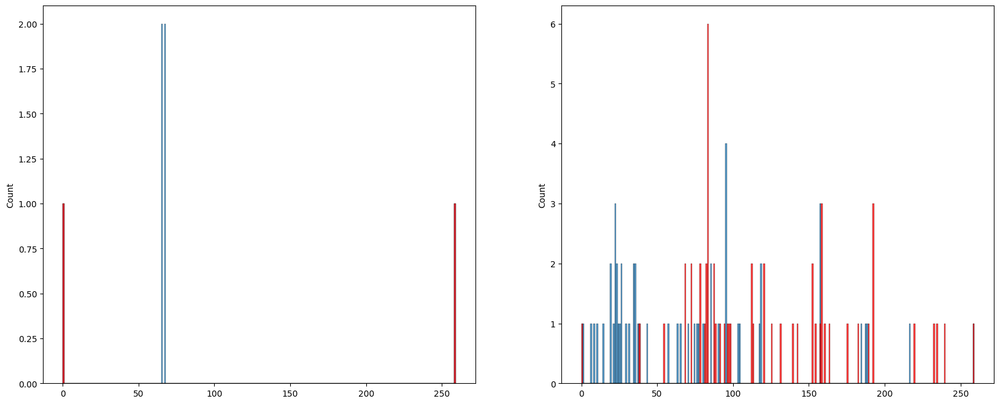

<Figure size 1200x800 with 0 Axes>

{71, 74, 43, 78, 114, 51, 54, 151}
{1, 66, 99, 68, 5, 130, 39, 137, 109, 82, 84, 124, 61}
{65, 69, 7, 172, 13, 142, 149, 92}
{0, 2, 34, 70, 9, 73, 16, 17, 146, 19, 182, 86, 25}
{98, 171, 11, 144, 81, 29, 118, 119, 157}
{161, 35, 135, 52, 120, 94, 27, 30}
{129, 79, 83, 53, 181}
{67, 41, 21, 23, 152, 121}
{132, 72, 105, 14, 48, 18, 126}
{128, 33, 40, 75, 76, 55, 28}


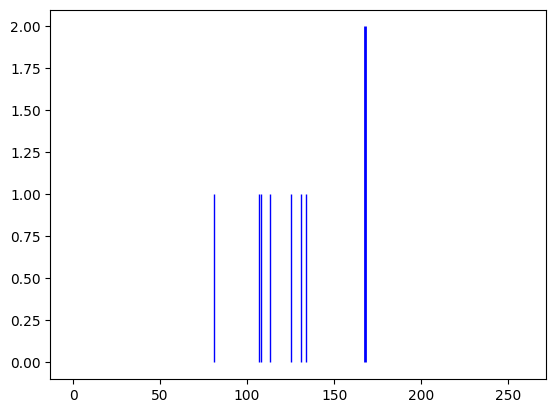

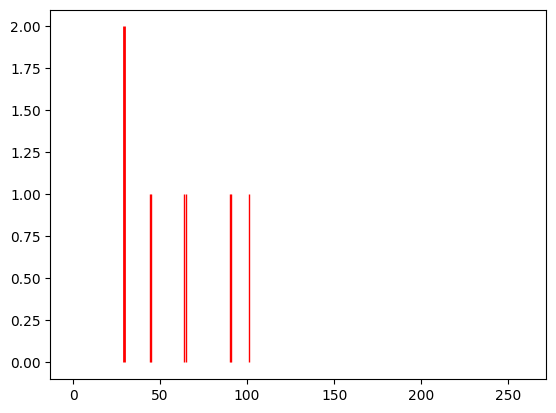

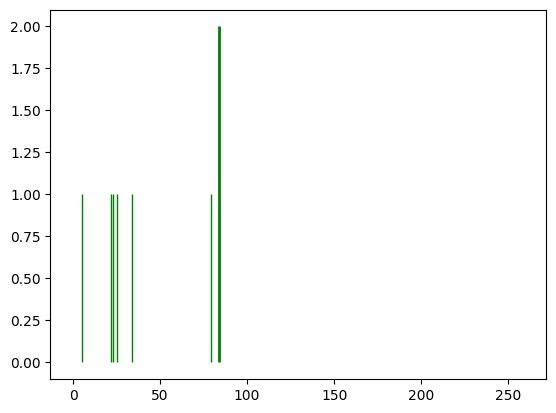

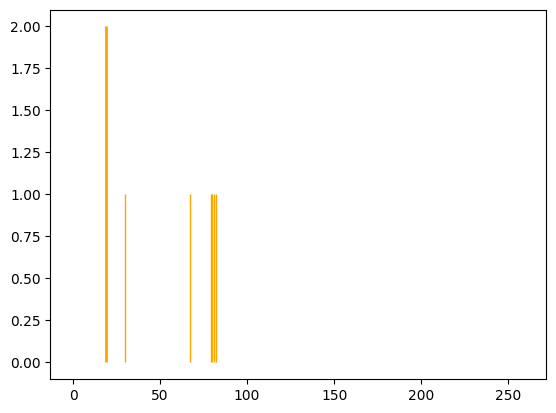

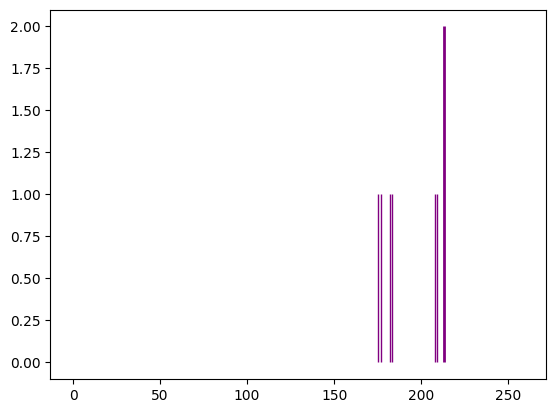

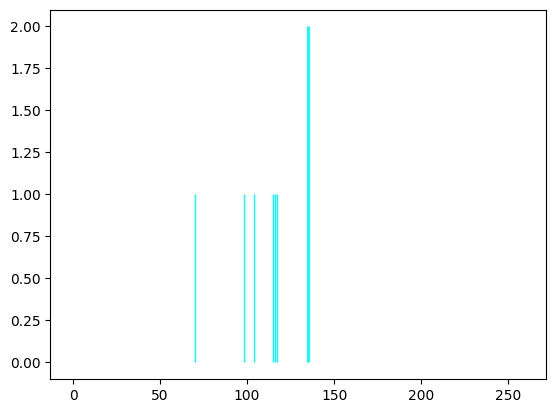

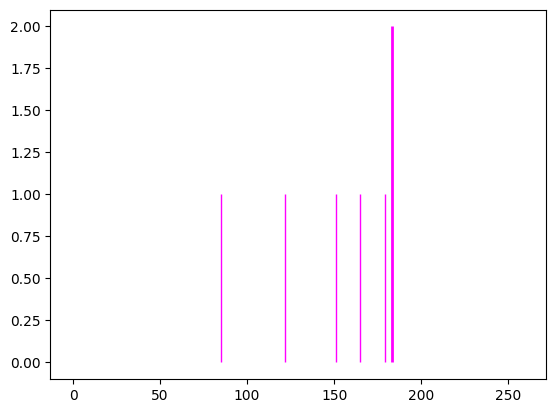

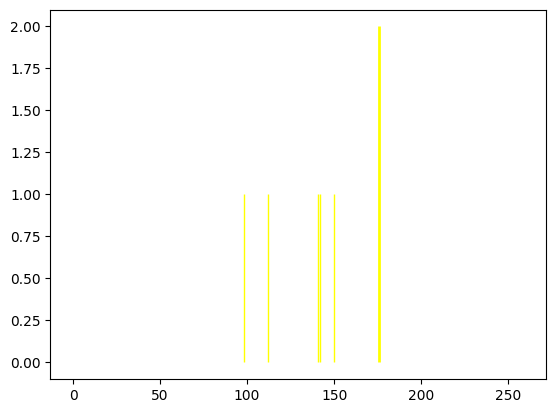

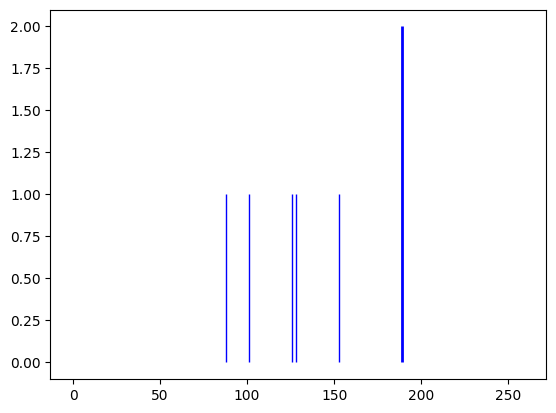

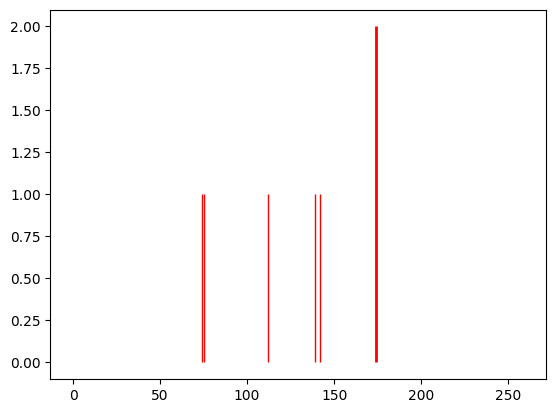

Spectrum num=1633, size=347, matched=5, frac=0.01440922190201729
Spectrum num=1633, size=347, matched=90, frac=0.25936599423631124


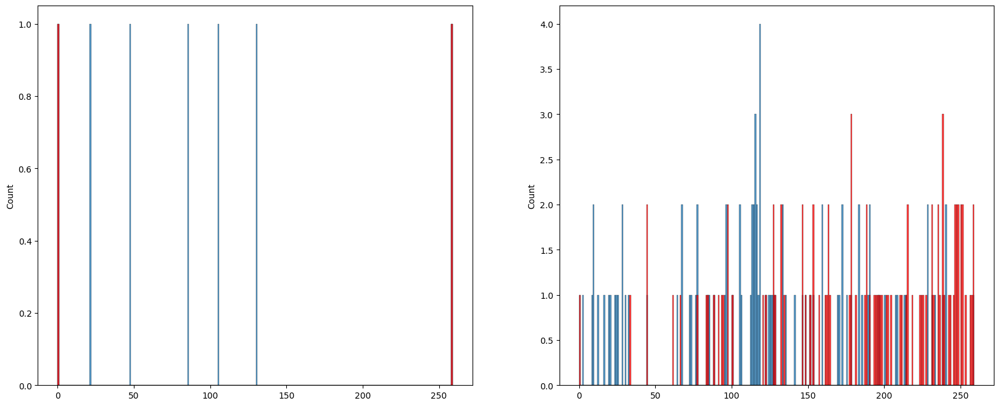

<Figure size 1200x800 with 0 Axes>

{257, 292, 6, 102, 9, 16, 81, 148, 214, 249, 58}
{0, 2, 67, 262, 168, 137, 106, 205, 274, 250, 155, 188}
{98, 195, 197, 230, 39, 103, 108, 179, 283, 157}
{162, 42, 203, 29, 245, 279, 154, 317, 189}
{294, 107, 47, 272, 20, 23, 314}
{128, 65, 76, 110, 79, 186, 187}
{129, 231, 105, 116, 308, 54, 215, 24}
{131, 219, 143, 113, 216, 27, 28}
{73, 170, 206, 305, 146, 84, 285}
{167, 7, 301, 271, 336, 153, 31}
{32, 226, 35, 69, 13, 19, 151, 56, 61}
{326, 202, 43, 275, 344, 94}
{75, 235, 114, 278, 247, 312}
{163, 68, 261, 15, 21, 93}
{71, 201, 172, 117, 286}
{248, 236, 53, 119, 280}
{288, 258, 164, 5, 12, 86}
{37, 41, 10, 239, 83, 60}
{259, 204, 78, 25, 252}
{225, 136, 139, 237, 223}
{3, 295, 8, 91, 63}
{161, 122, 174, 89, 282}
{160, 192, 309, 85, 124}
{224, 64, 227, 80, 57}
{36, 101, 177, 49, 218}


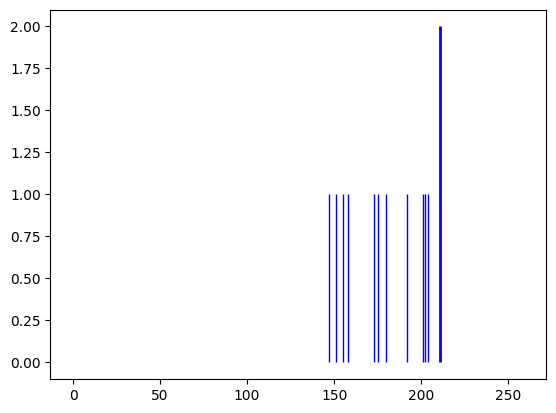

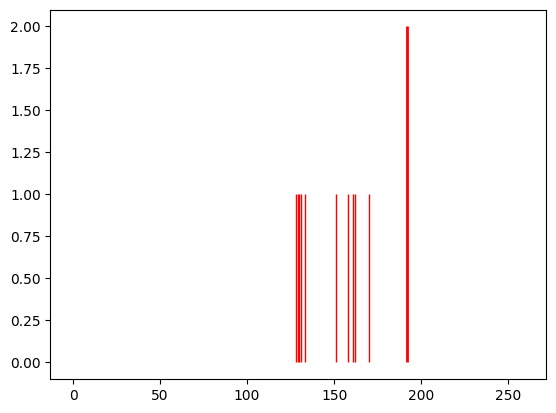

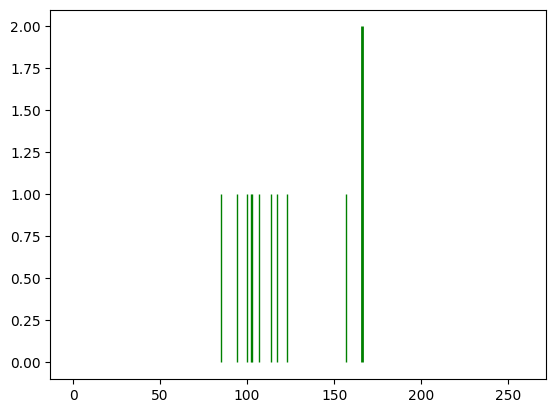

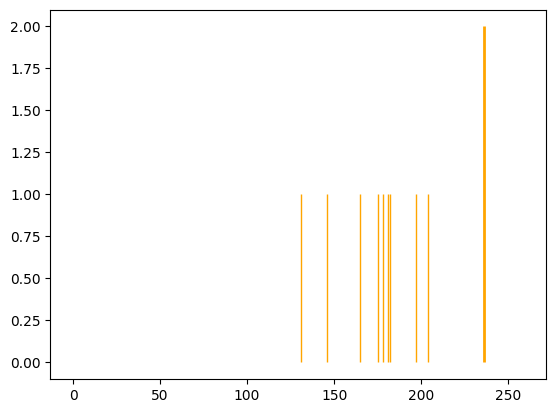

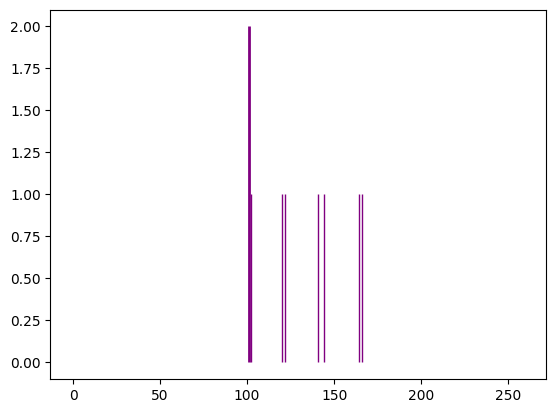

...

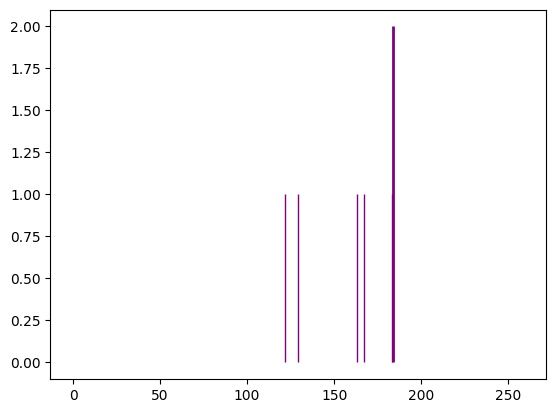

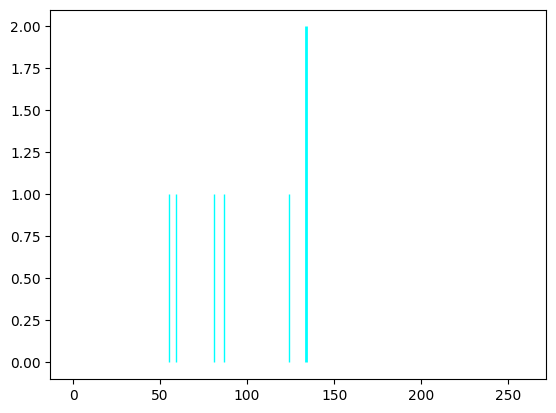

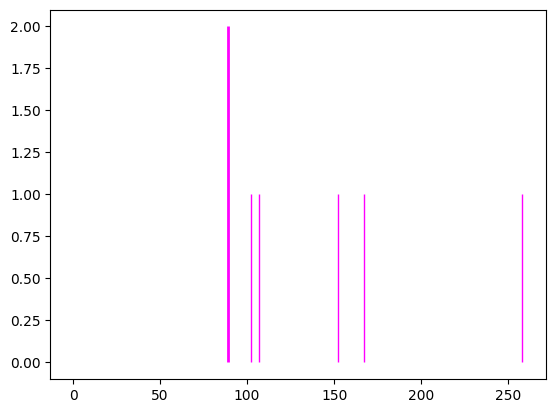

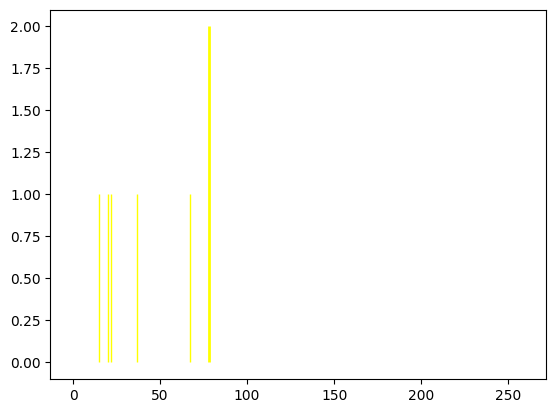

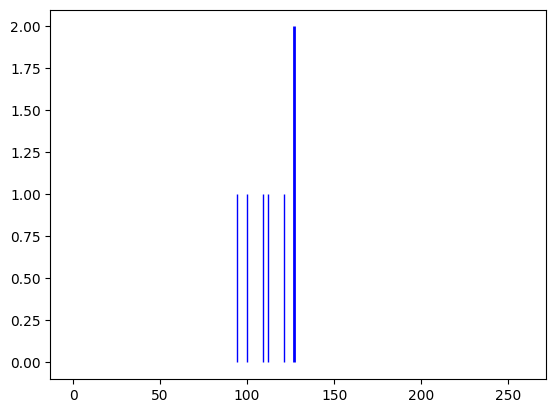

Spectrum num=1663, size=311, matched=89, frac=0.2861736334405145
Spectrum num=1663, size=311, matched=58, frac=0.1864951768488746


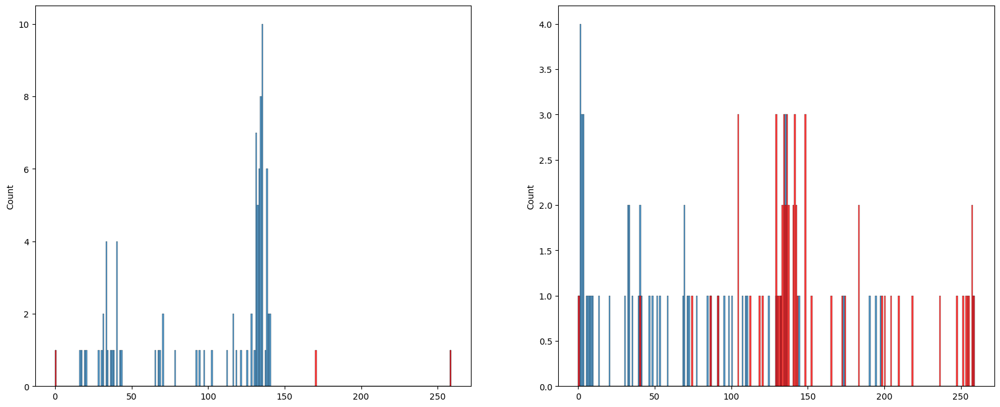

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 4, 130, 6, 7, 8, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, 150, 23, 24, 154, 27, 284, 31, 36, 44, 301, 181, 55, 56, 185, 65, 201, 80, 218, 93, 226, 102, 232, 104, 111, 241, 114, 244, 116, 118, 122, 124}
{37, 75, 174, 48, 49, 52, 279, 25, 59, 60}
{33, 67, 164, 165, 99, 231, 140, 214, 251}
{166, 42, 19, 91, 222, 95}
{292, 197, 70, 205, 77, 50}
{160, 261, 146, 212, 87, 28}
{35, 39, 204, 272, 57}
{101, 106, 175, 90, 61}
{224, 196, 263, 169, 137, 276}
{38, 40, 82, 119, 285}
{170, 113, 86, 280, 26}
{9, 46, 15, 239, 255}
{129, 217, 105, 85, 89}
{103, 268, 269, 173, 189}


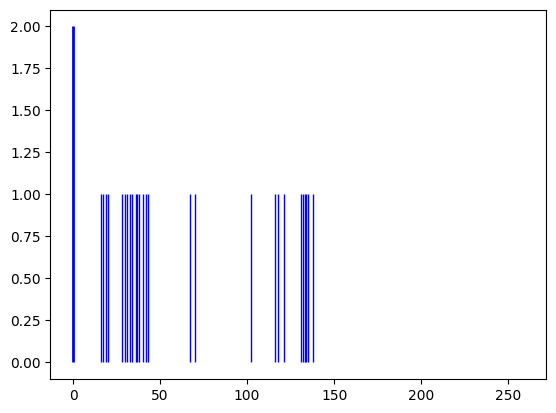

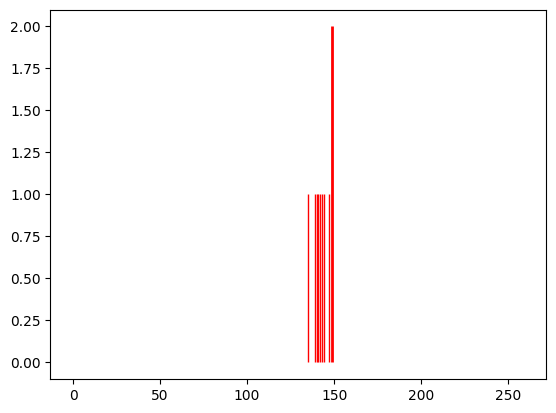

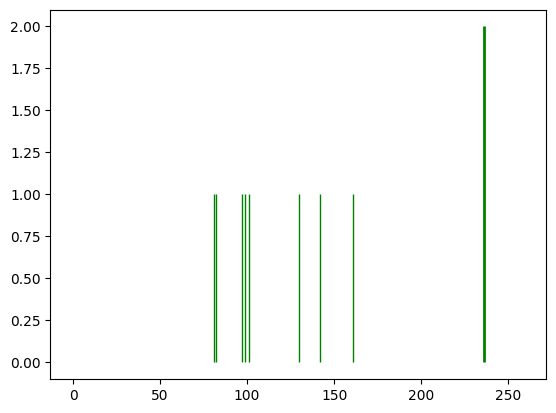

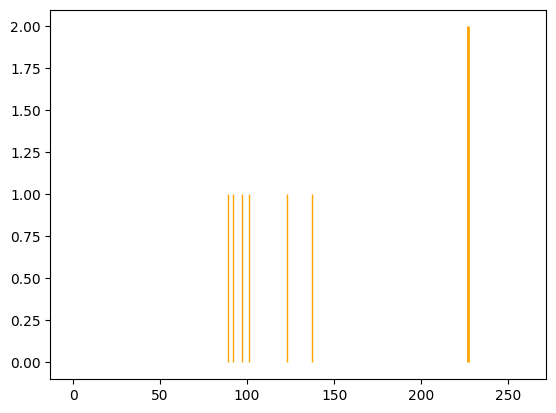

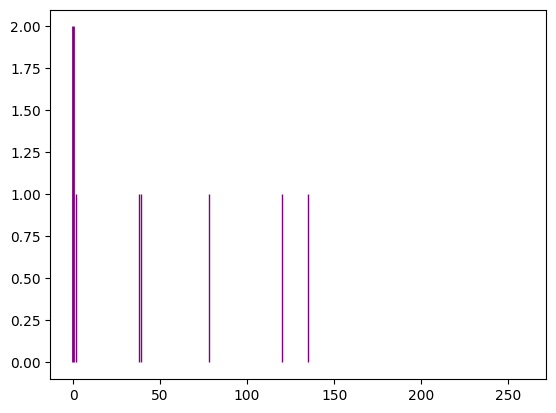

...

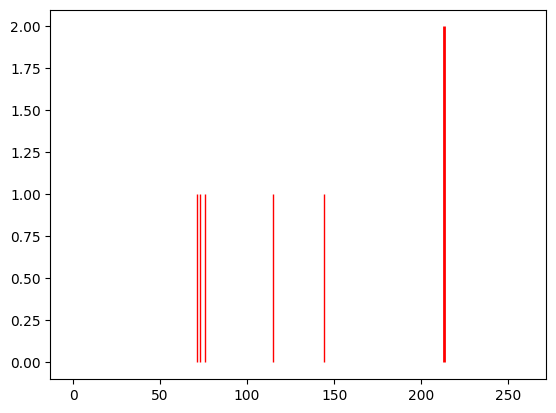

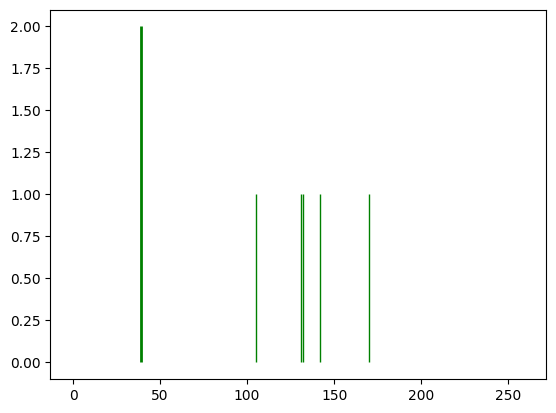

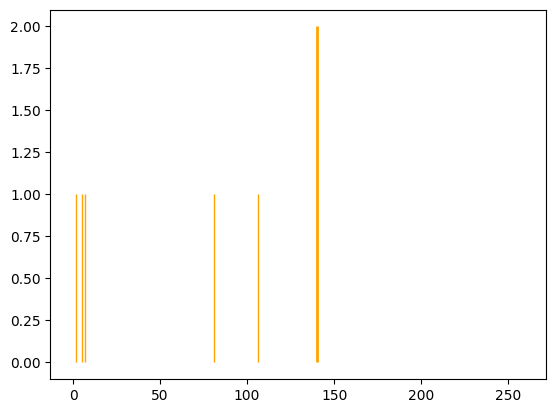

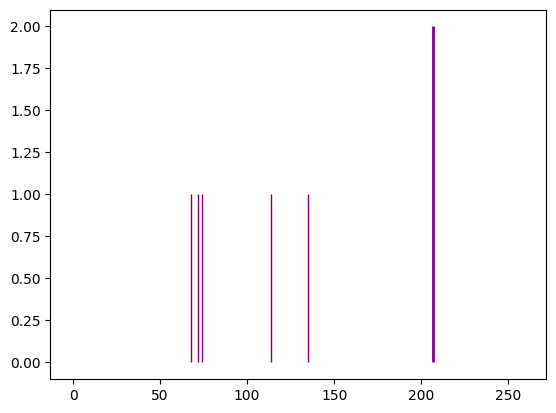

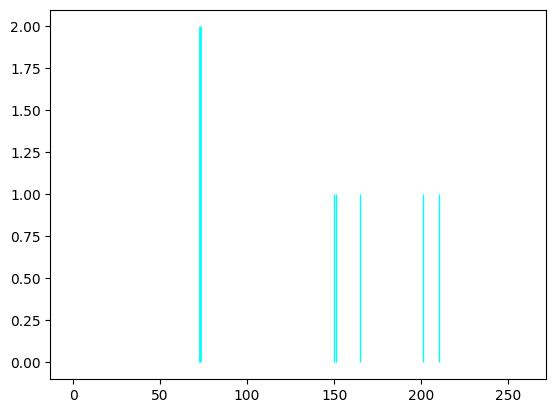

Spectrum num=1667, size=57, matched=1, frac=0.017543859649122806
Spectrum num=1667, size=57, matched=13, frac=0.22807017543859648


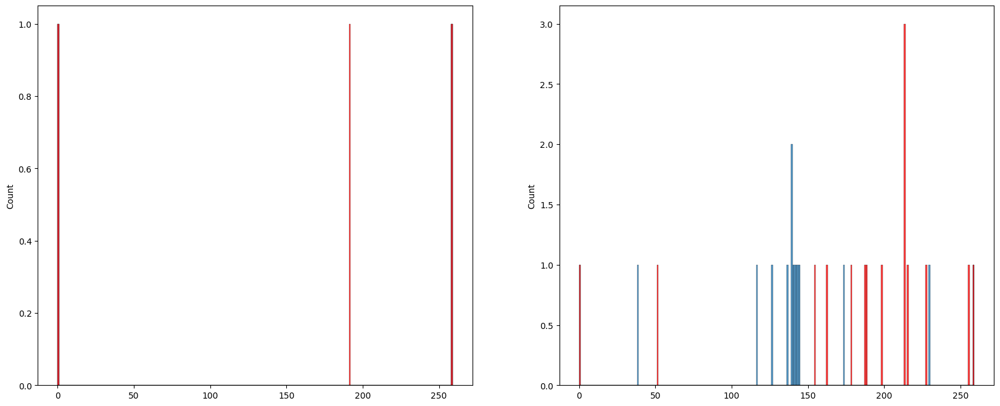

<Figure size 1200x800 with 0 Axes>

{2, 42, 43, 18, 19, 30}


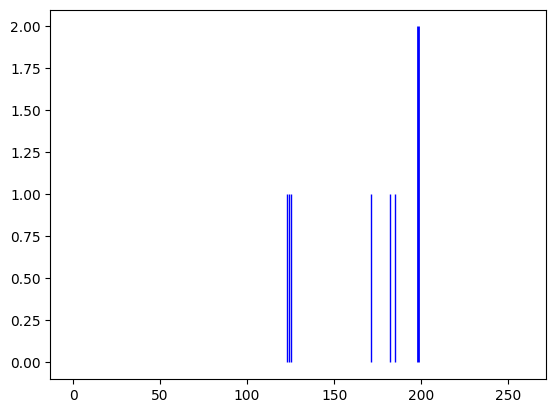

Spectrum num=1668, size=133, matched=3, frac=0.022556390977443608
Spectrum num=1668, size=133, matched=28, frac=0.21052631578947367


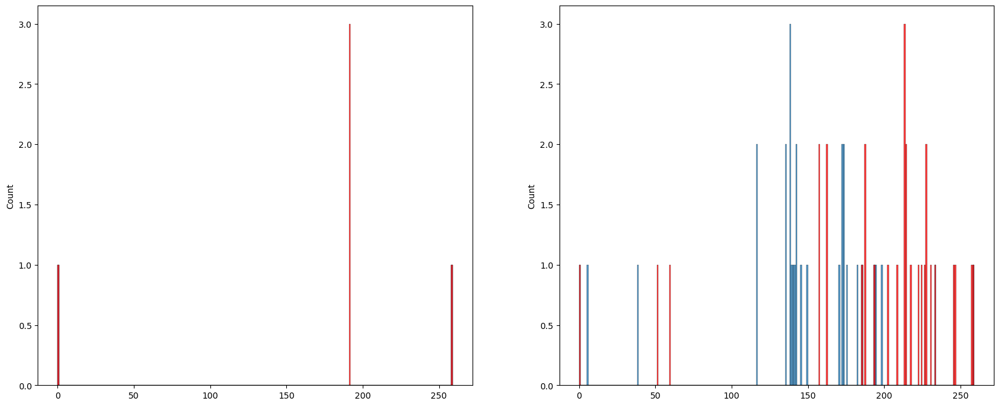

<Figure size 1200x800 with 0 Axes>

{97, 100, 101, 36, 40, 12, 78, 16, 50, 28}
{3, 5, 106, 15, 81, 57}
{65, 41, 53, 59, 124, 61, 31}
{0, 1, 8, 9, 10, 44, 14, 47, 82, 20, 86, 24}
{72, 13, 45, 52, 54, 94}
{33, 131, 39, 104, 60, 92}
{89, 80, 17, 121, 25}
{34, 7, 105, 77, 111, 123}
{132, 70, 102, 75, 26}


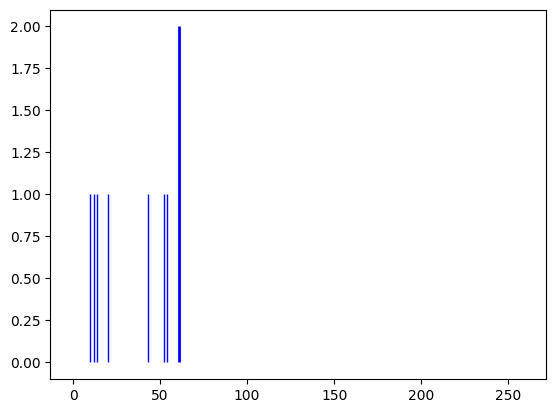

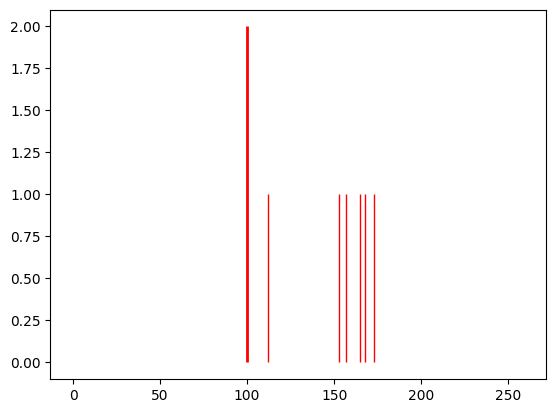

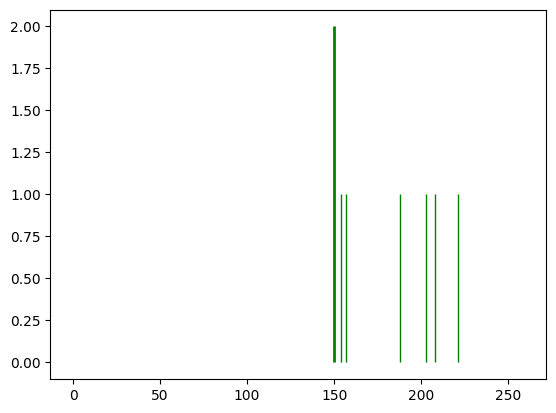

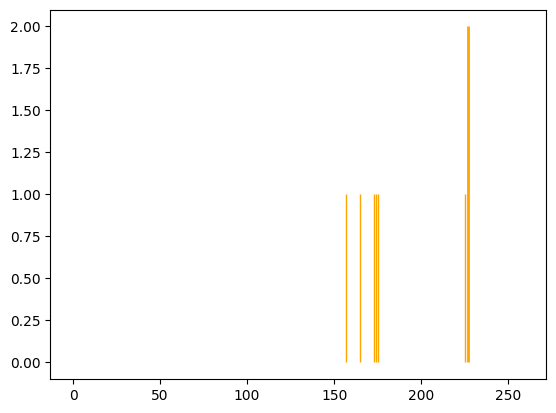

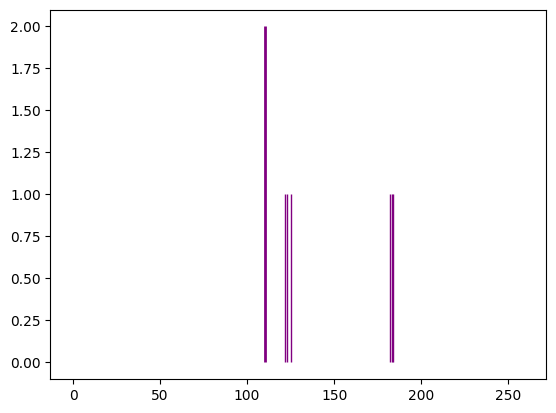

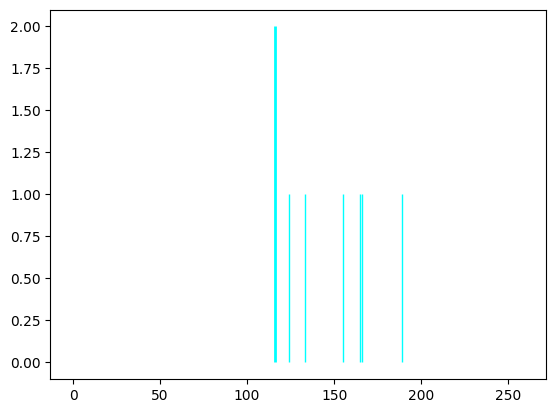

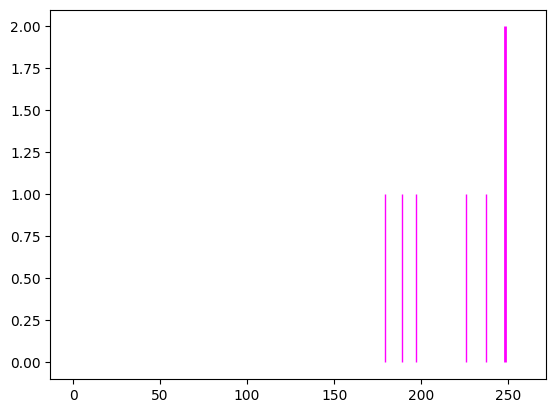

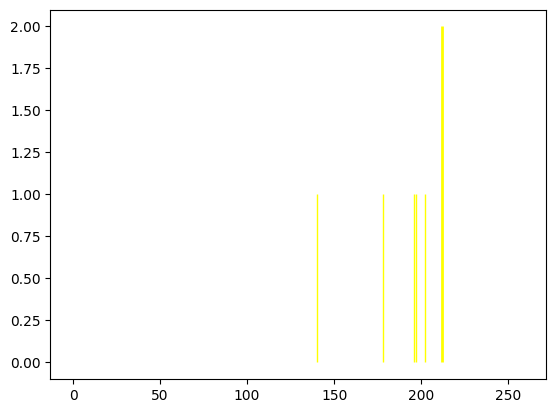

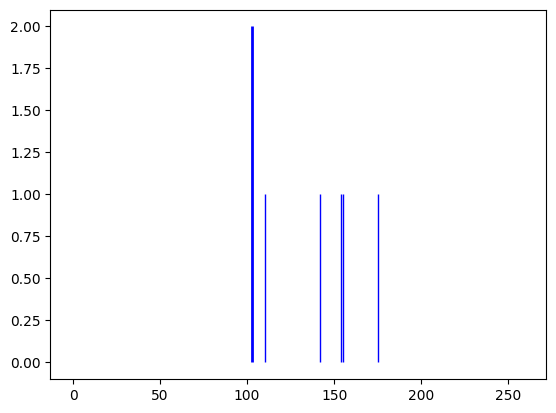

Spectrum num=1670, size=140, matched=16, frac=0.11428571428571428
Spectrum num=1670, size=140, matched=25, frac=0.17857142857142858


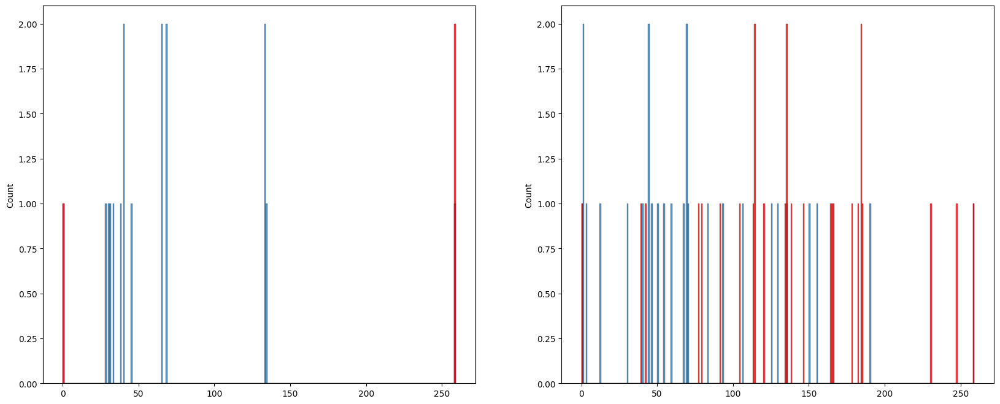

<Figure size 1200x800 with 0 Axes>

{9, 109, 14, 81, 21}


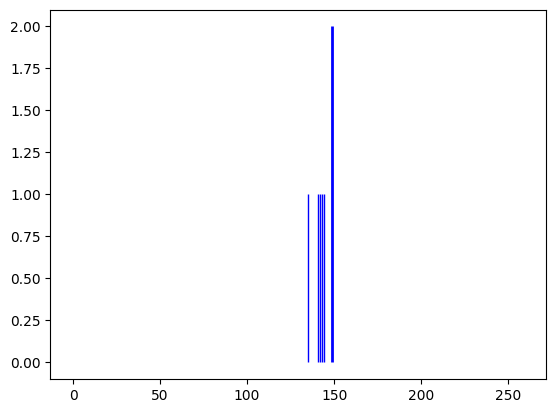

Spectrum num=1687, size=138, matched=7, frac=0.050724637681159424
Spectrum num=1687, size=138, matched=32, frac=0.2318840579710145


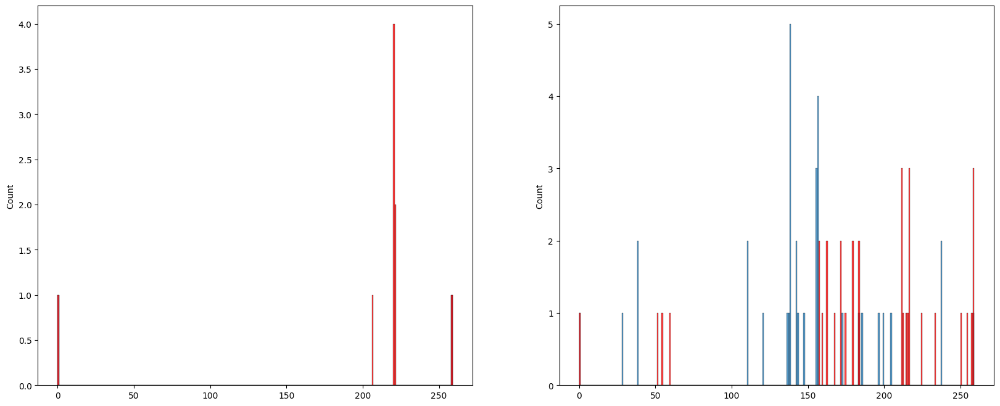

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 5, 6, 74, 107, 13, 14, 16, 18, 53, 60, 61}
{129, 2, 98, 71, 10, 15, 50, 116, 118, 87, 126, 31}
{43, 77, 51, 83, 55, 123, 30, 95}
{66, 99, 131, 7, 104, 39, 19, 122}
{97, 37, 8, 47, 26, 27, 124}
{65, 33, 101, 82, 56, 89}
{136, 106, 46, 90, 59}
{130, 9, 44, 119, 54, 22, 121}
{79, 20, 52, 88, 94, 127}


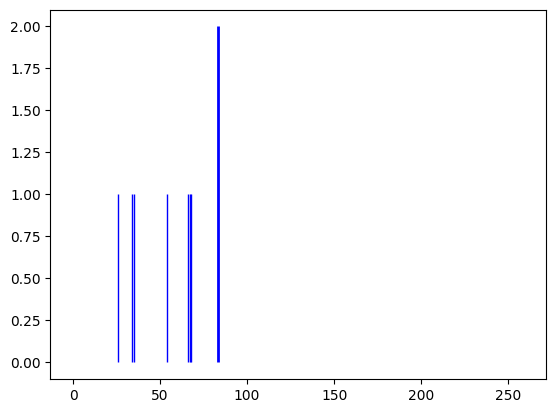

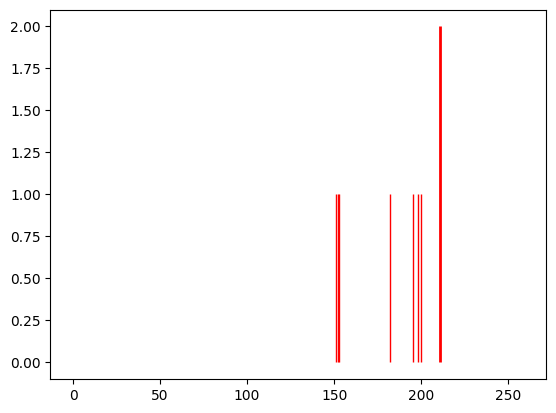

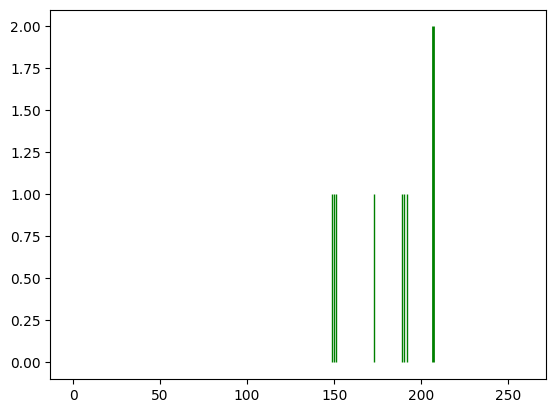

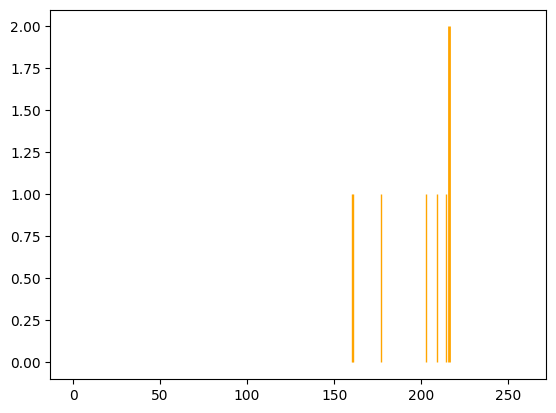

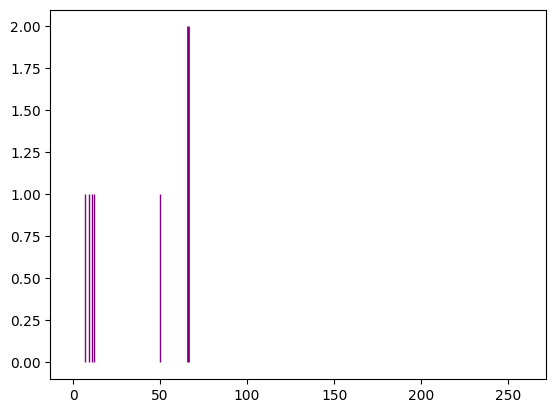

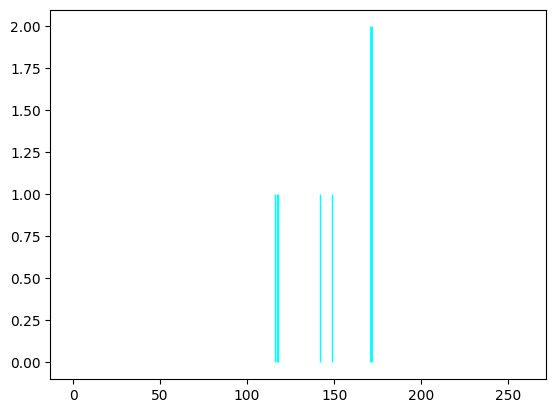

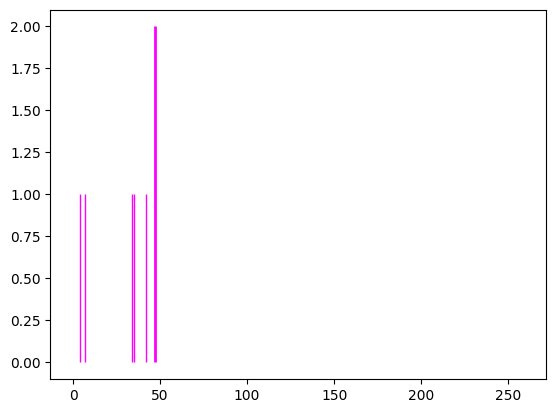

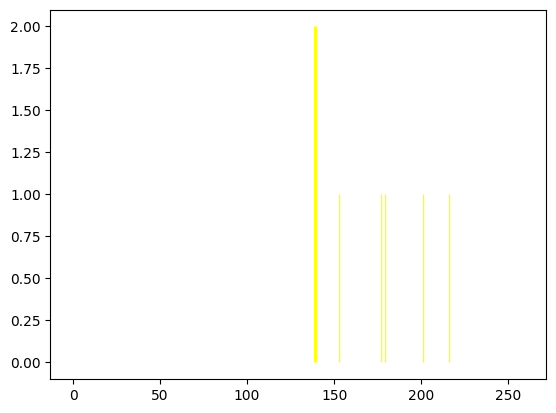

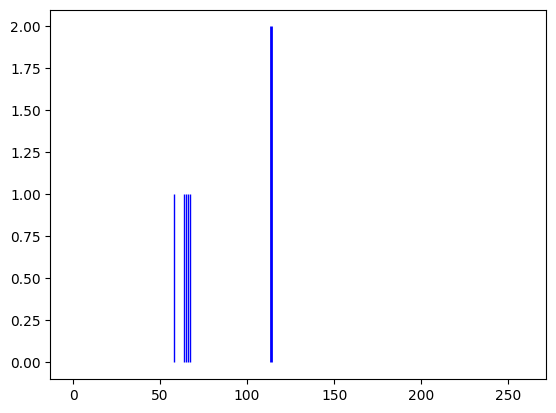

Spectrum num=1688, size=133, matched=7, frac=0.05263157894736842
Spectrum num=1688, size=133, matched=28, frac=0.21052631578947367


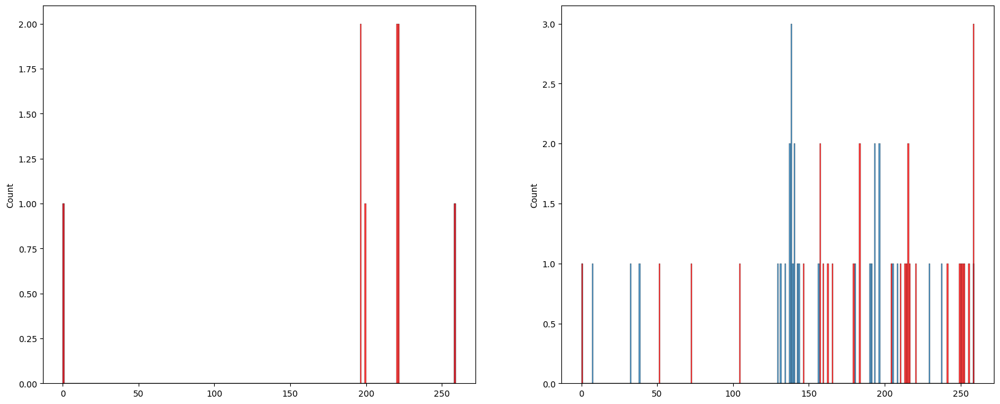

<Figure size 1200x800 with 0 Axes>

{33, 70, 8, 74, 16, 51, 116, 120, 25, 26, 88}
{1, 34, 67, 5, 104, 50, 117}
{0, 66, 68, 20, 62, 28, 94}
{32, 4, 72, 9, 41, 52, 22, 55}
{64, 131, 42, 115, 57, 58, 92}
{77, 110, 18, 86, 56, 30}
{43, 75, 44, 24, 27}
{102, 59, 113, 82, 49, 91}


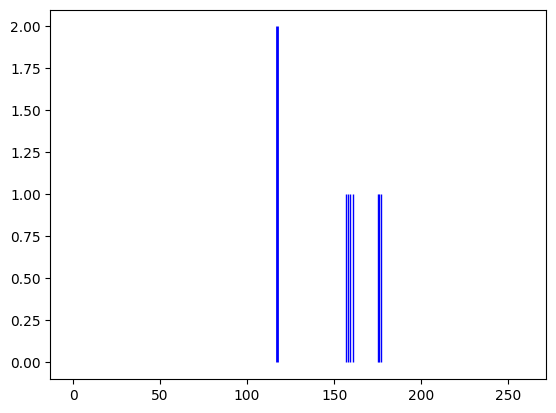

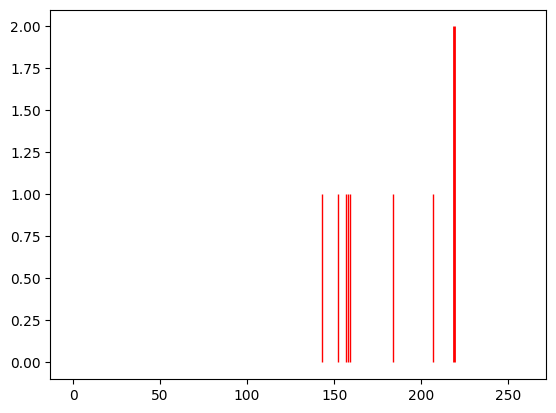

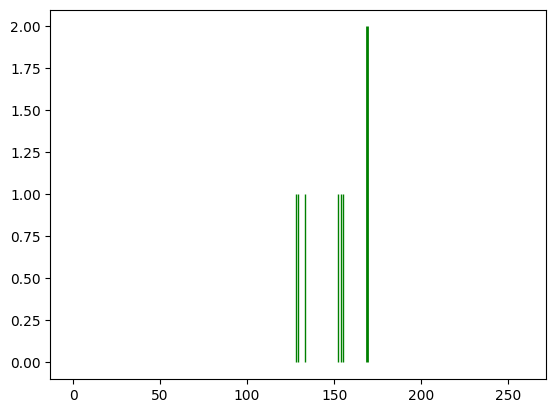

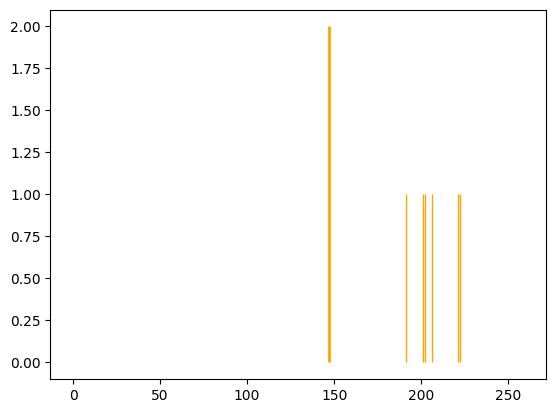

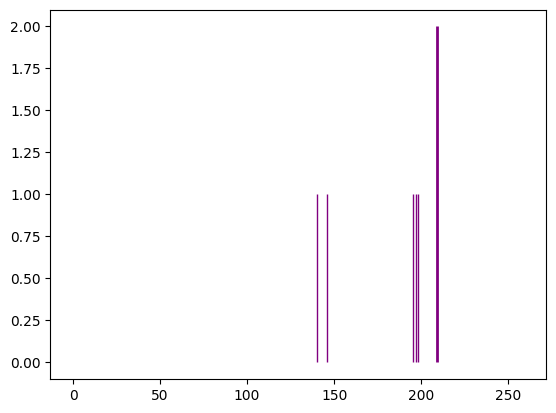

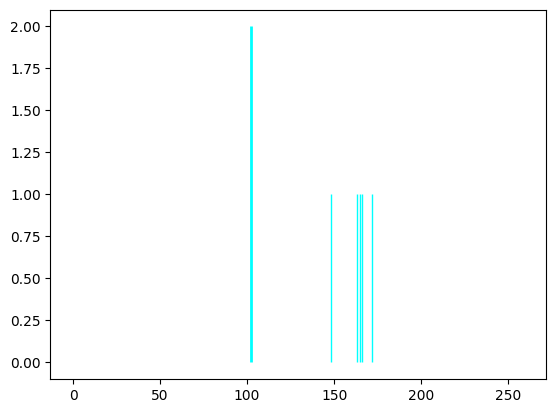

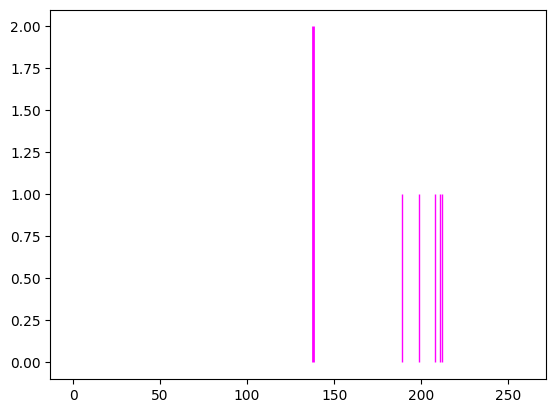

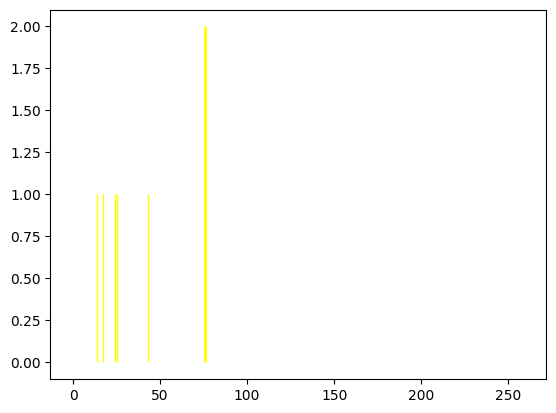

Spectrum num=2058, size=302, matched=58, frac=0.19205298013245034
Spectrum num=2058, size=302, matched=59, frac=0.19536423841059603


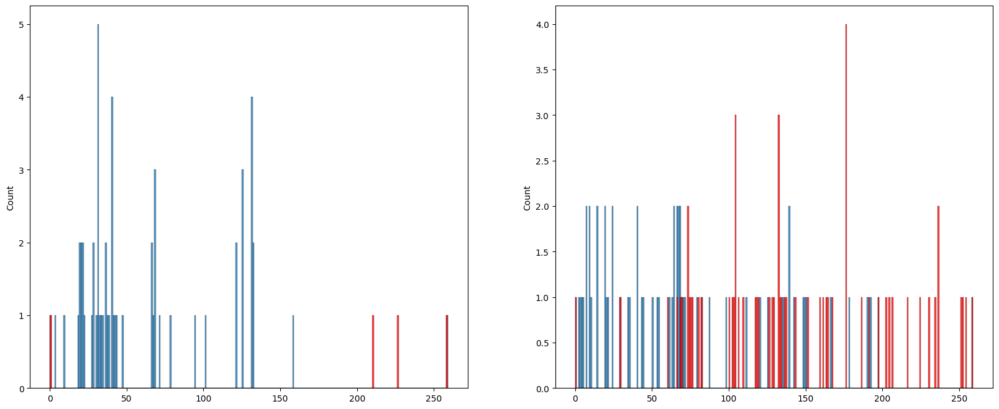

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 4, 8, 9, 265, 13, 20, 21, 22, 26, 27, 29, 31, 32, 39, 42, 299, 45, 48, 49, 53, 55, 64, 195, 68, 71, 79, 210, 88, 91, 93, 96, 99, 101, 233, 237, 247}
{129, 2, 33, 164, 37, 6, 10, 44, 300, 113, 19, 149, 185, 59}
{35, 69, 267, 76, 269, 174, 54, 283, 95}
{102, 205, 16, 241, 286}
{301, 270, 277, 279, 250}
{66, 98, 263, 105, 143}
{227, 137, 112, 24, 159}
{34, 194, 41, 82, 63}
{173, 274, 281, 253, 191}
{74, 183, 248, 122, 220}
{162, 163, 234, 61, 190}


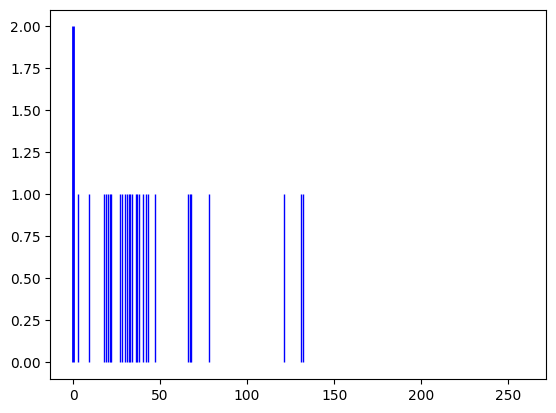

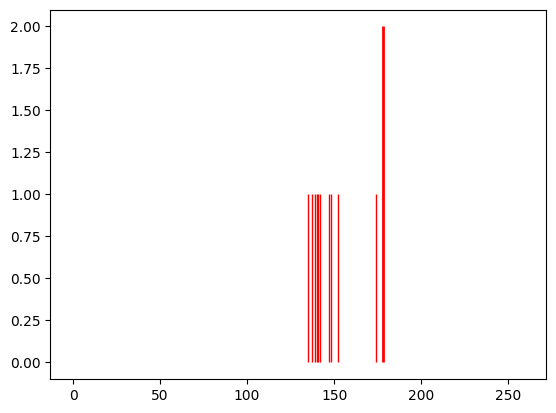

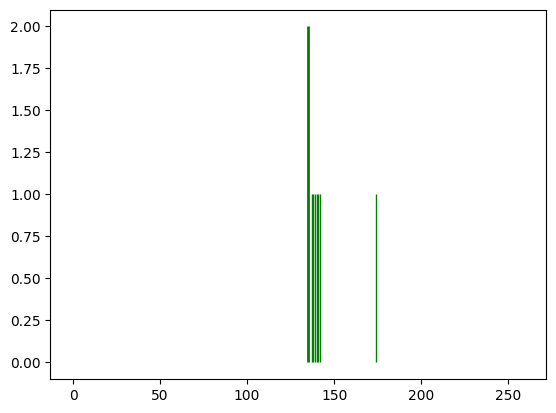

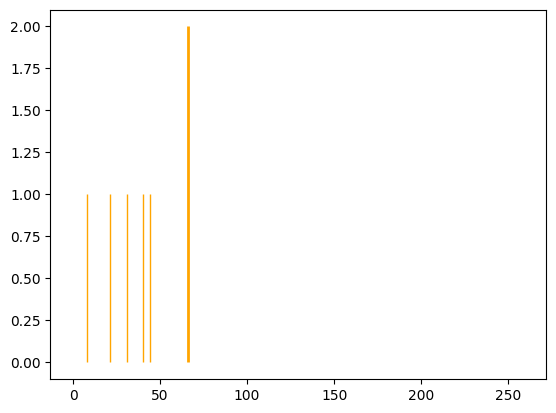

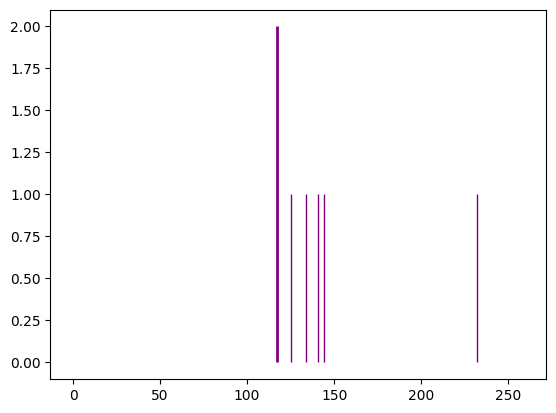

...

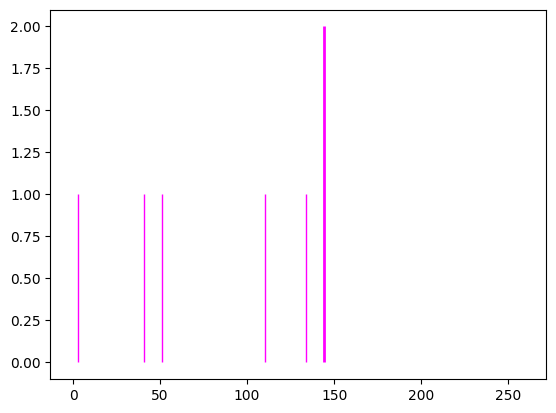

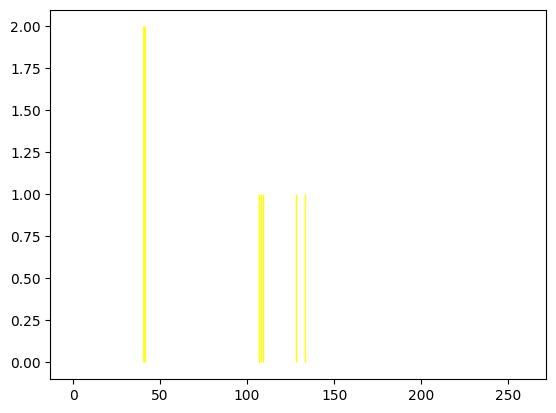

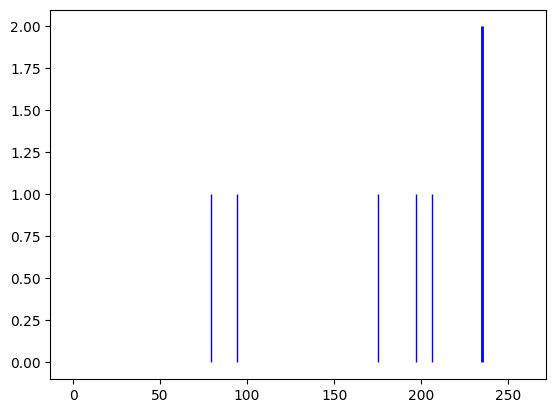

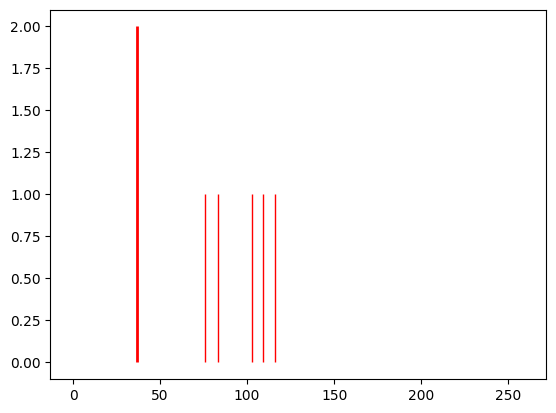

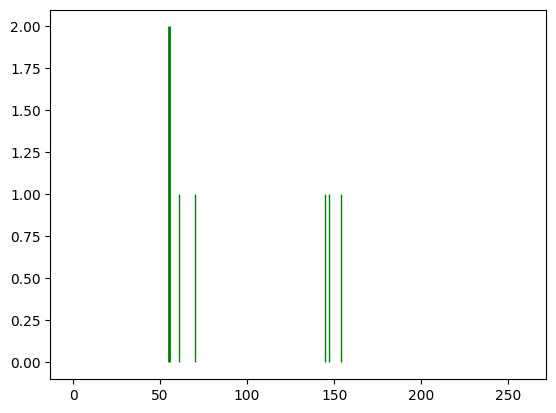

Spectrum num=2086, size=176, matched=10, frac=0.056818181818181816
Spectrum num=2086, size=176, matched=32, frac=0.18181818181818182


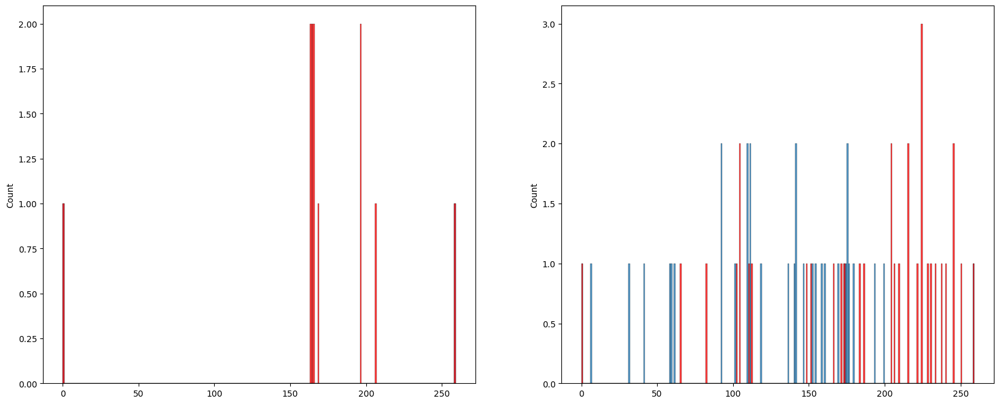

<Figure size 1200x800 with 0 Axes>

{67, 5, 133, 175, 51, 24, 25}
{65, 72, 27, 45, 20, 91}
{110, 48, 115, 85, 56}
{4, 40, 148, 149, 62}
{32, 2, 71, 146, 22}
{66, 106, 173, 86, 58}
{165, 10, 171, 52, 121}
{38, 7, 8, 11, 76}


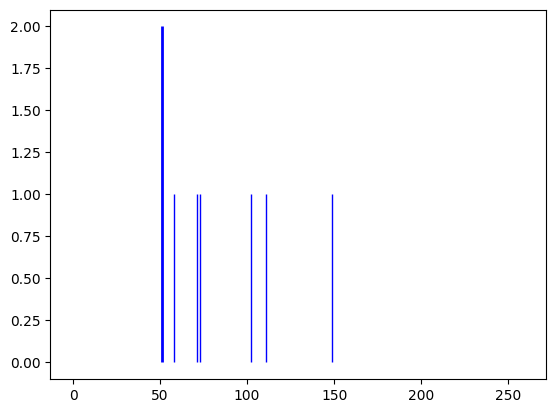

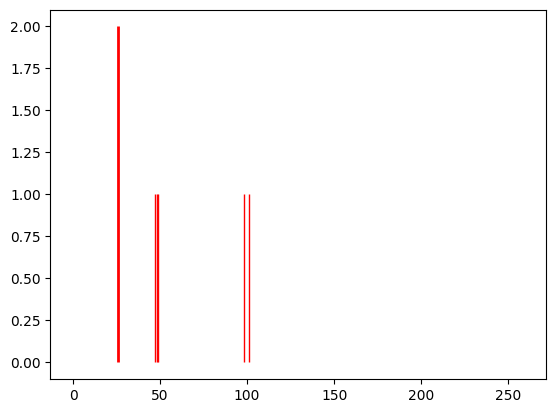

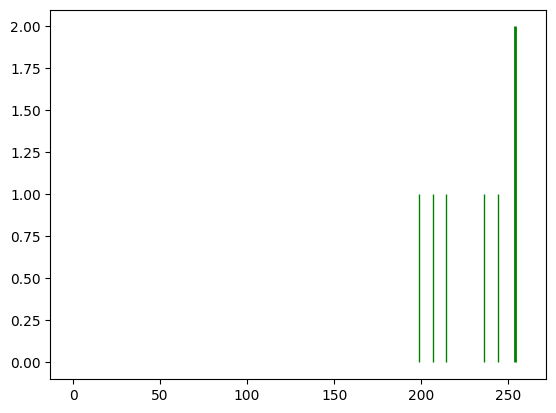

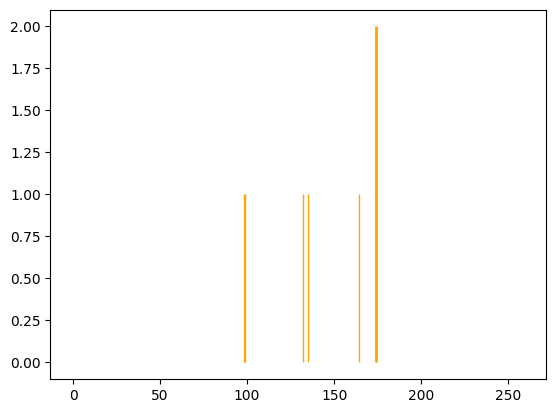

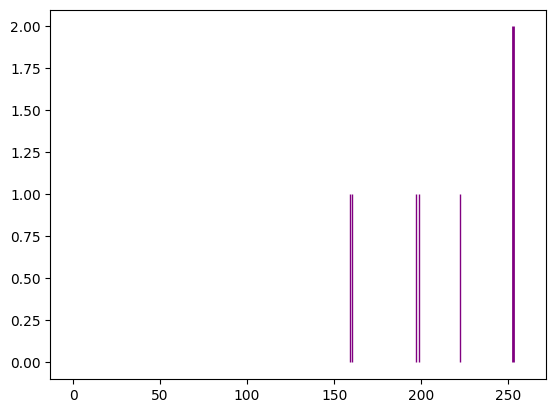

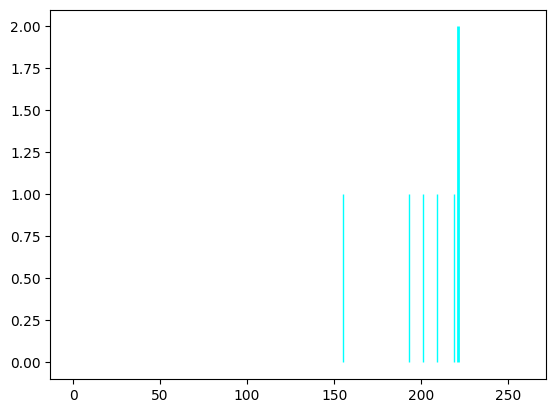

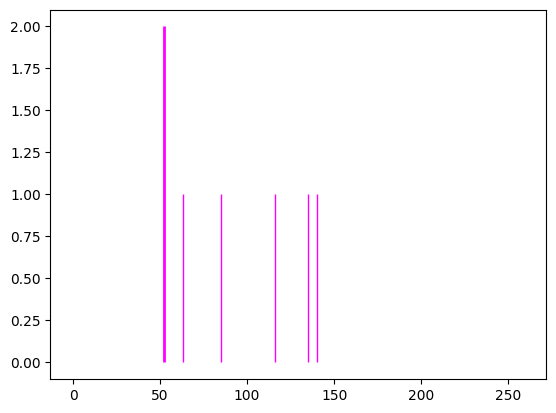

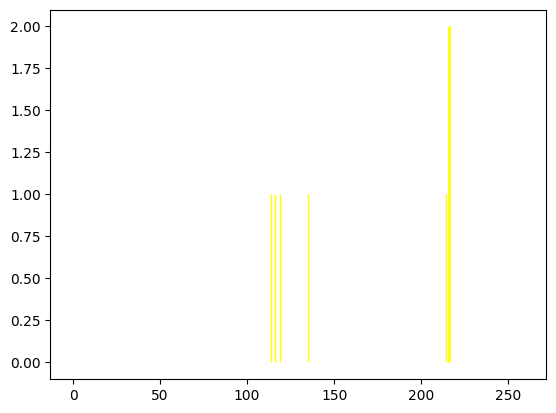

Spectrum num=2129, size=124, matched=10, frac=0.08064516129032258
Spectrum num=2129, size=124, matched=25, frac=0.20161290322580644


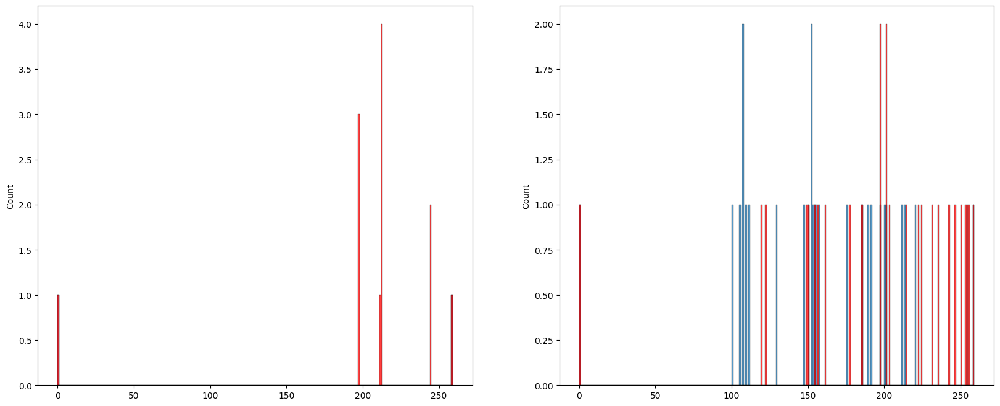

<Figure size 1200x800 with 0 Axes>

{1, 44, 110, 79, 17, 18, 49, 53, 85, 27, 93}
{67, 68, 38, 11, 46, 19, 83, 21, 22, 28, 63}
{97, 101, 40, 42, 12, 78, 80, 117, 59}
{65, 66, 34, 9, 74, 86, 56}
{0, 3, 4, 70, 8, 14, 122}
{2, 6, 103, 15, 55, 88}
{99, 36, 102, 72, 75, 16, 52}
{35, 7, 105, 112, 51, 57, 95}


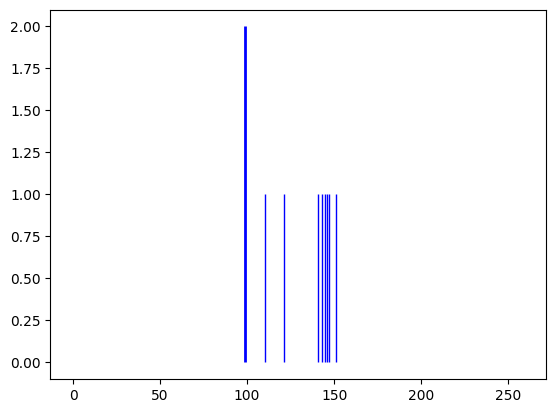

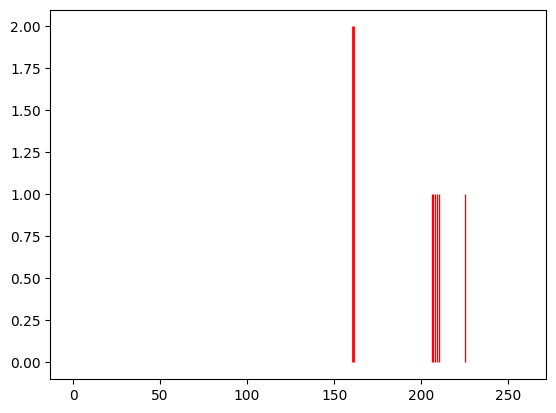

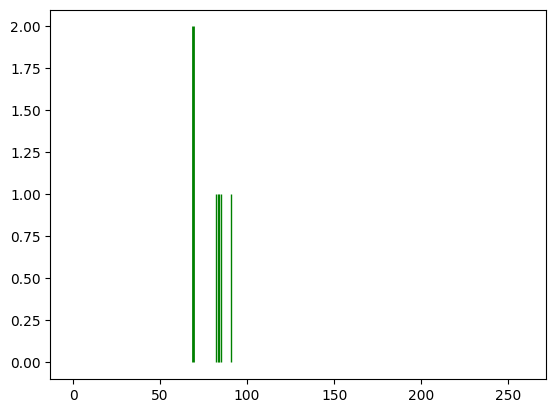

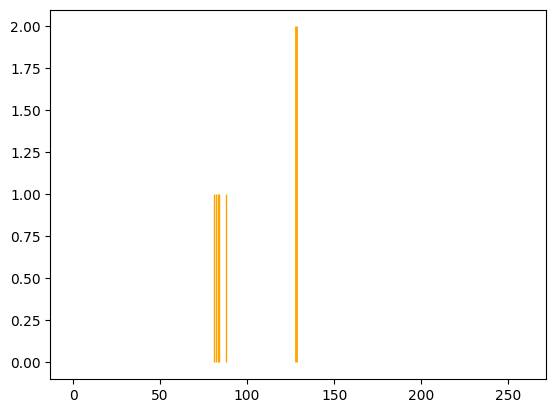

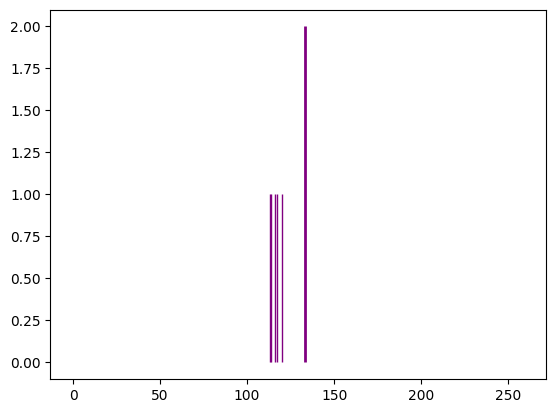

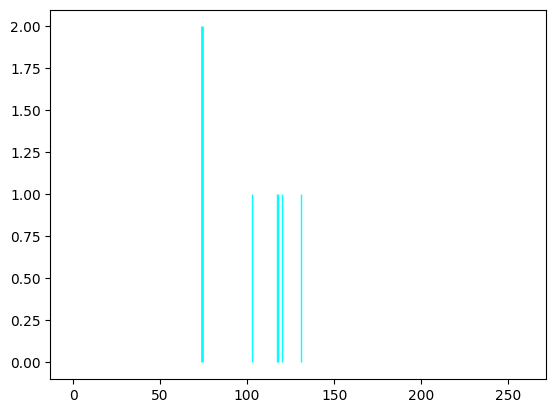

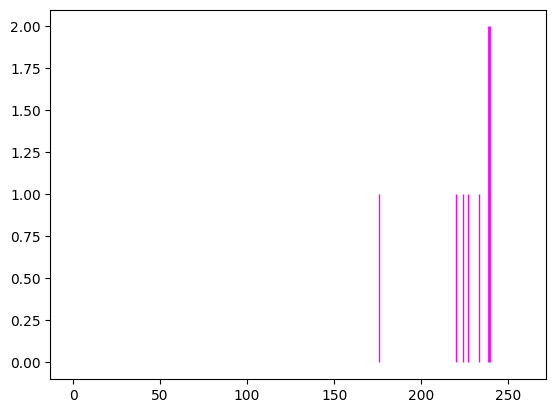

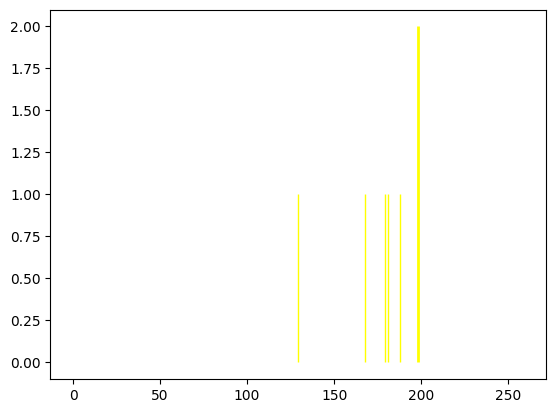

Spectrum num=2254, size=162, matched=4, frac=0.024691358024691357
Spectrum num=2254, size=162, matched=18, frac=0.1111111111111111


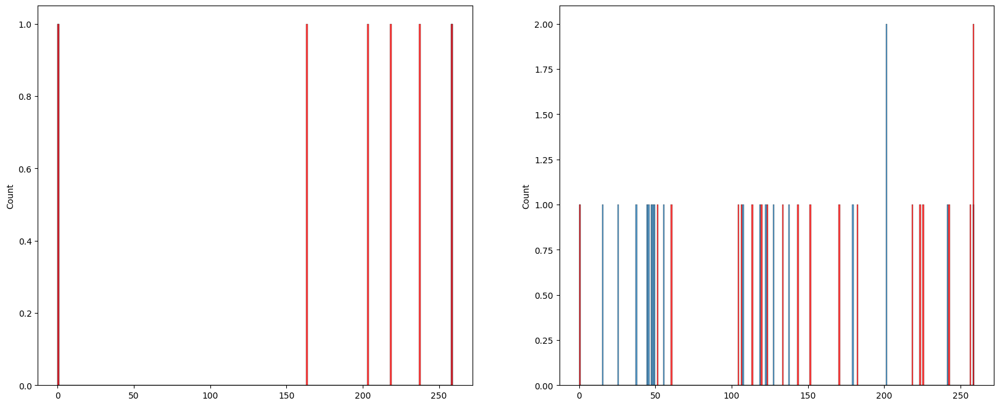

<Figure size 1200x800 with 0 Axes>

{34, 37, 136, 41, 51}


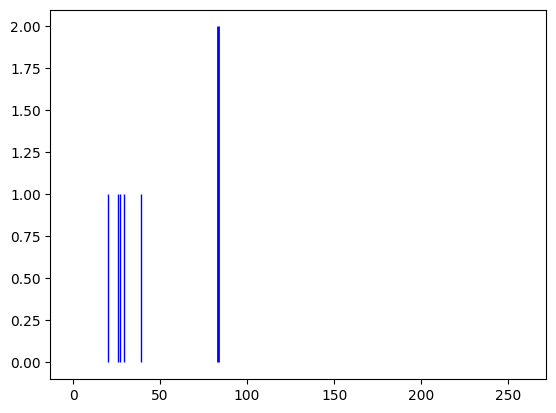

Spectrum num=2255, size=177, matched=9, frac=0.05084745762711865
Spectrum num=2255, size=177, matched=49, frac=0.2768361581920904


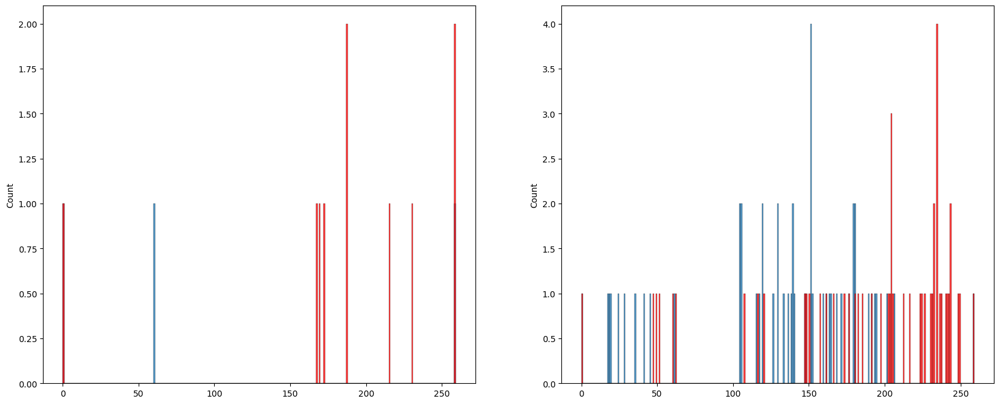

<Figure size 1200x800 with 0 Axes>

{35, 134, 43, 139, 117, 155, 157, 62}
{3, 4, 6, 173, 89, 58, 91}
{65, 69, 103, 10, 76, 55, 122}
{9, 169, 83, 20, 25, 125}
{99, 38, 74, 47, 17, 61}
{72, 40, 18, 116, 88, 27}
{128, 66, 106, 77, 21}
{2, 98, 135, 42, 23}
{73, 110, 142, 30, 94}


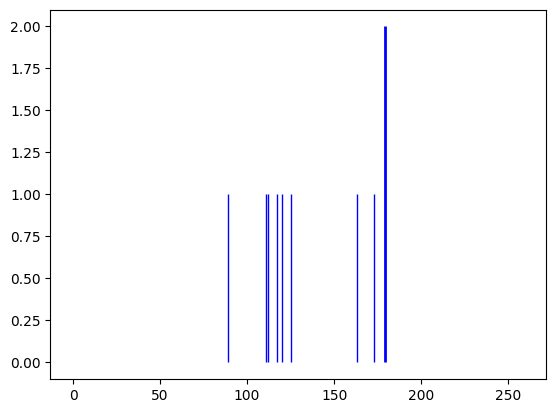

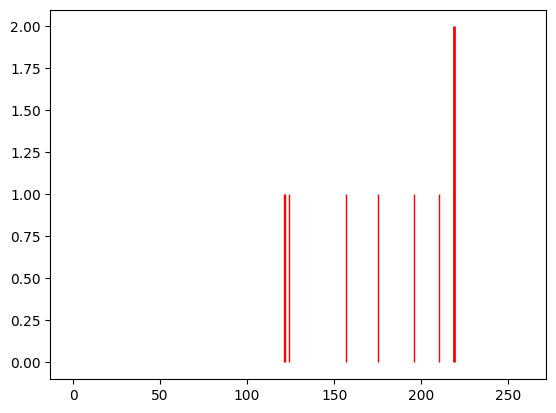

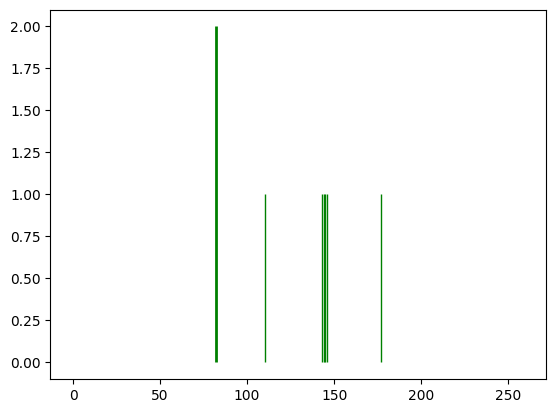

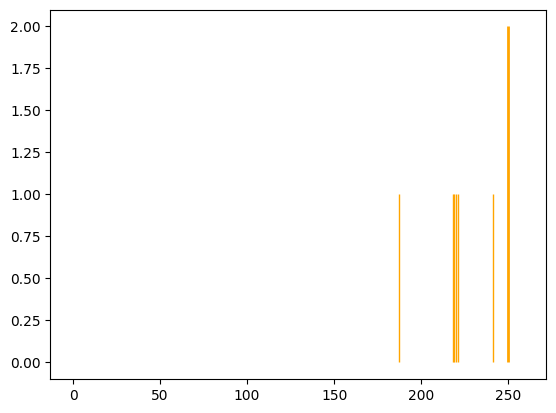

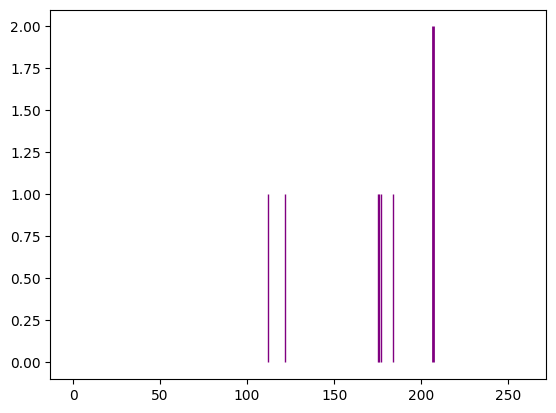

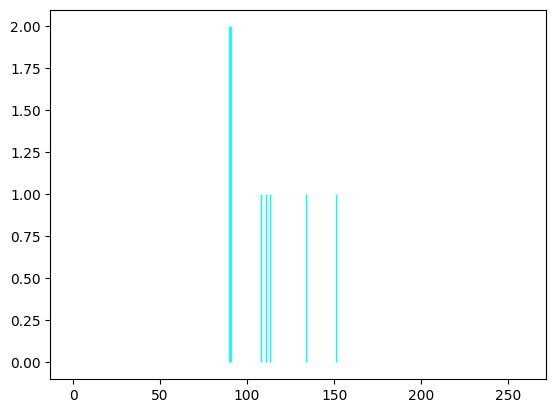

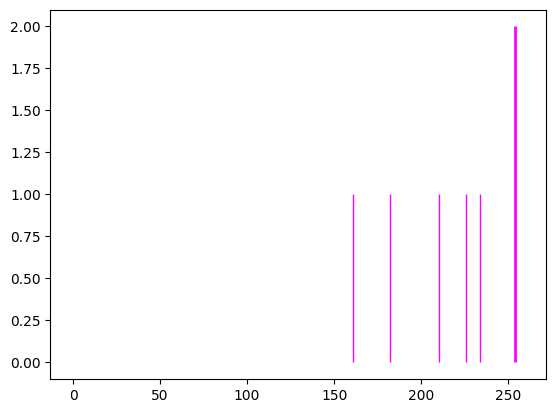

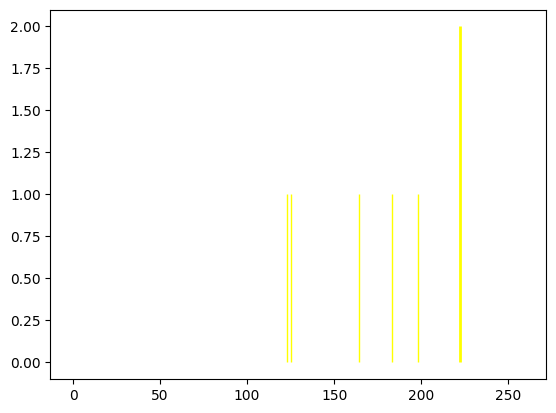

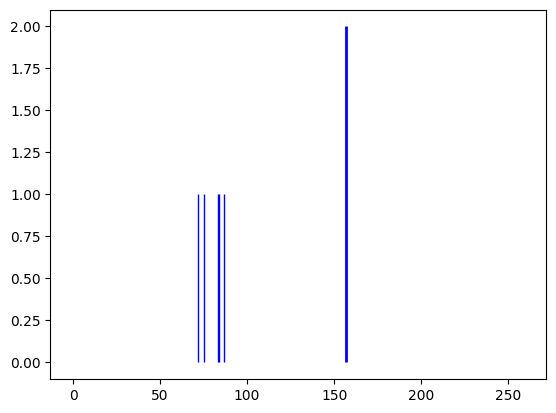

Spectrum num=2274, size=185, matched=15, frac=0.08108108108108109
Spectrum num=2274, size=185, matched=34, frac=0.1837837837837838


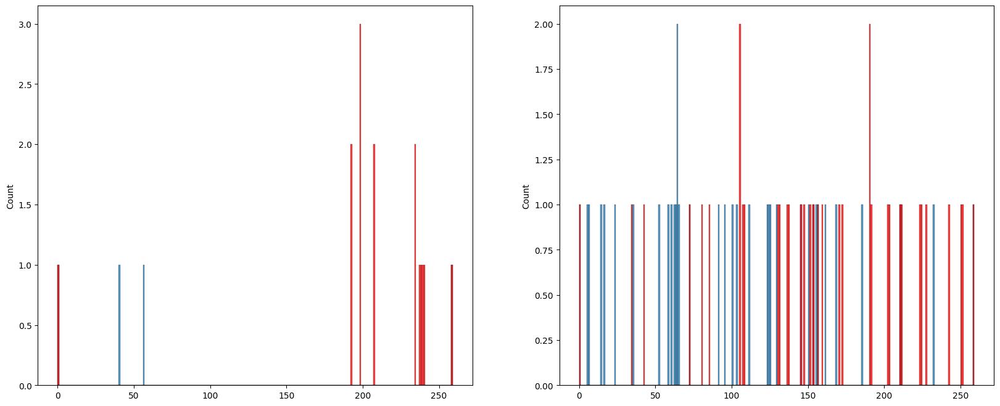

<Figure size 1200x800 with 0 Axes>

{163, 5, 46, 146, 23, 30}
{1, 3, 167, 9, 18}
{4, 71, 51, 84, 183}


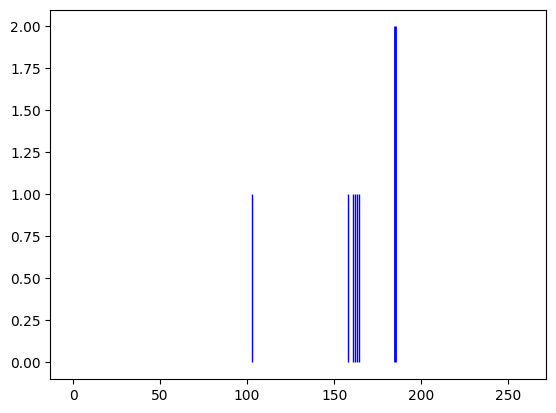

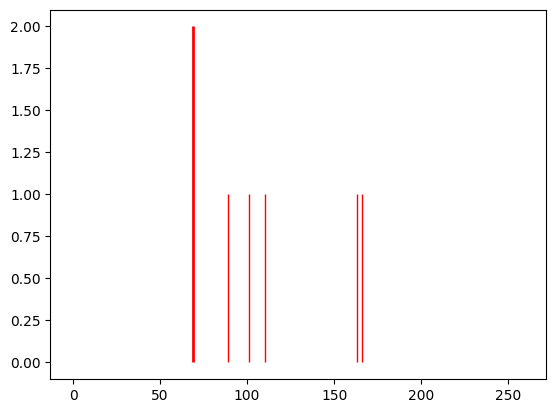

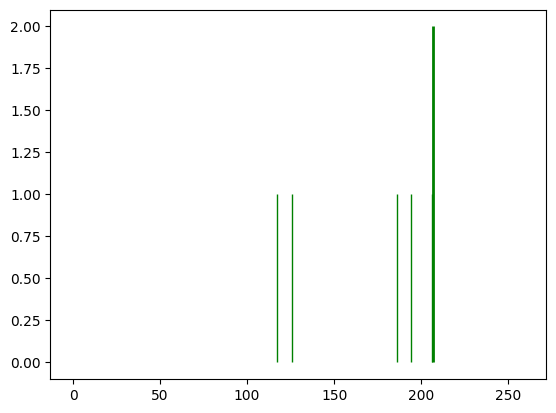

Spectrum num=2302, size=156, matched=15, frac=0.09615384615384616
Spectrum num=2302, size=156, matched=23, frac=0.14743589743589744


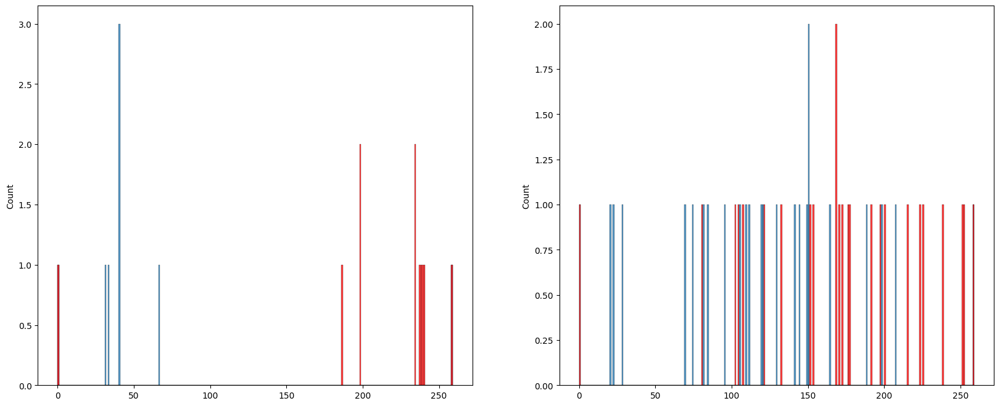

<Figure size 1200x800 with 0 Axes>

{34, 40, 10, 16, 50}


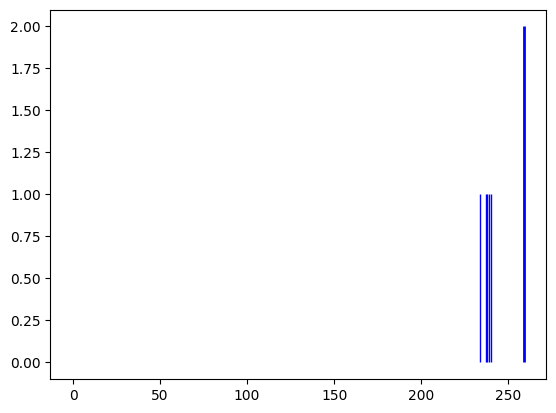

Spectrum num=2309, size=150, matched=74, frac=0.49333333333333335
Spectrum num=2309, size=150, matched=33, frac=0.22


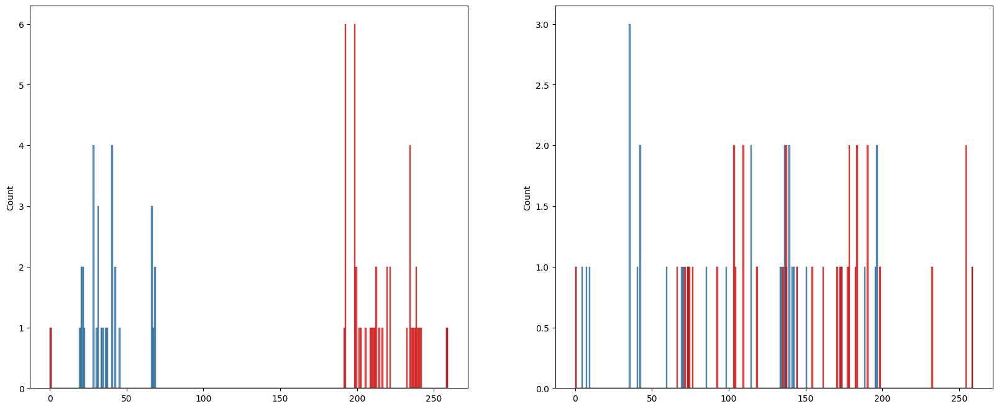

<Figure size 1200x800 with 0 Axes>

{128, 1, 2, 131, 3, 5, 6, 7, 8, 10, 11, 12, 13, 142, 14, 18, 20, 25, 28, 32, 34, 39, 47, 53, 74, 80, 107, 108, 110, 119}
{0, 4, 135, 136, 9, 141, 16, 24, 27, 29, 37, 40, 41, 42, 49, 55, 56, 61, 63, 66, 69, 92, 100, 117, 126}
{64, 129, 65, 26, 134, 137, 48, 51, 115, 118, 122, 59, 94, 127}
{98, 36, 105, 76, 146, 84}


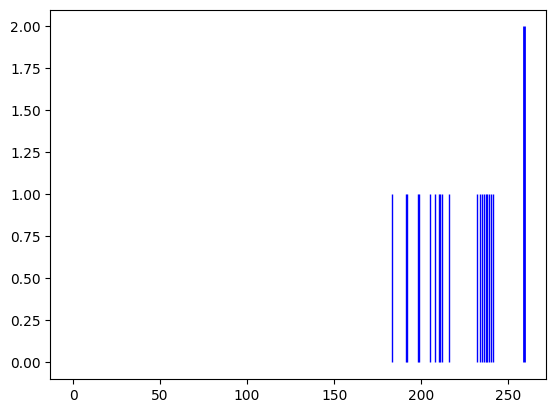

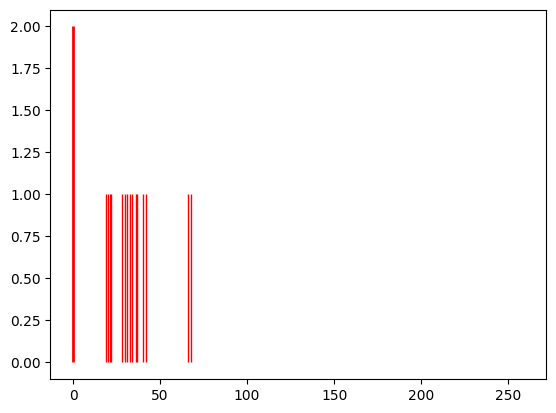

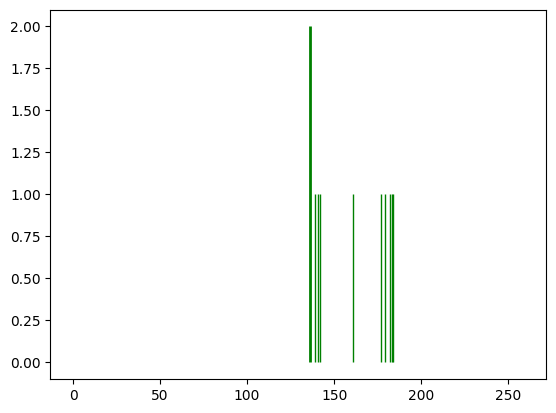

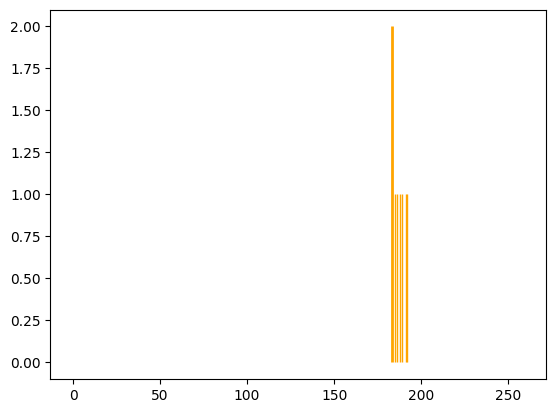

Spectrum num=2310, size=148, matched=48, frac=0.32432432432432434
Spectrum num=2310, size=148, matched=19, frac=0.12837837837837837


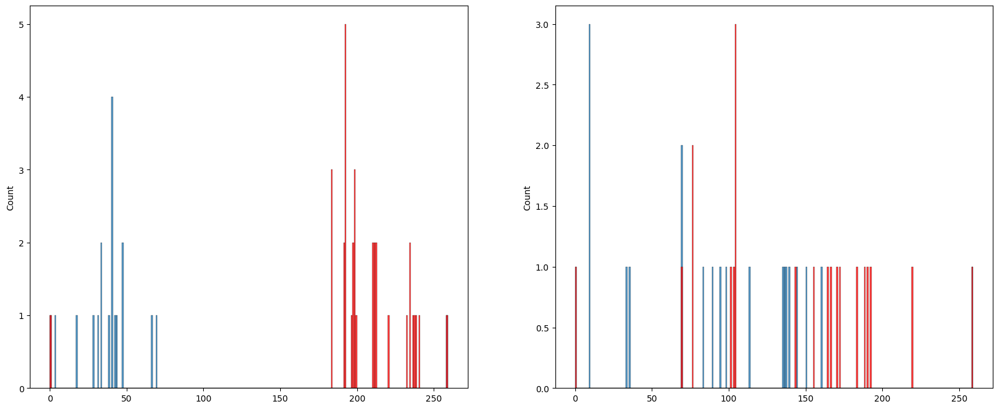

<Figure size 1200x800 with 0 Axes>

{65, 1, 101, 7, 11, 12, 108, 143, 115, 52, 54, 93, 62}
{0, 2, 3, 4, 39, 9, 46, 15, 56, 58, 59, 92, 31}
{35, 37, 38, 73, 18, 30, 24, 88, 94}
{33, 135, 104, 141, 144, 123, 125}
{8, 42, 140, 14, 145, 82, 51, 116, 21, 89, 29}
{96, 97, 136, 110, 113}


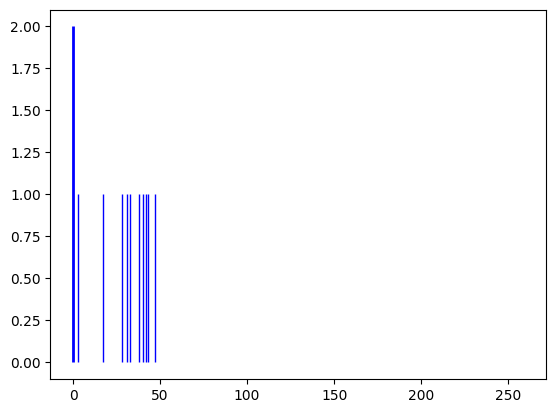

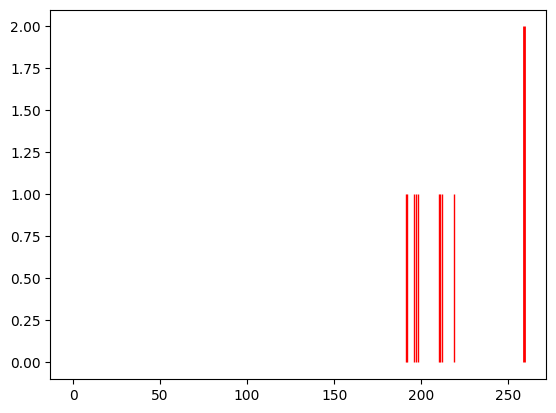

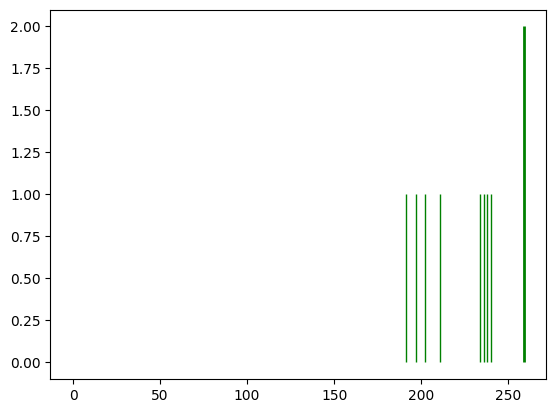

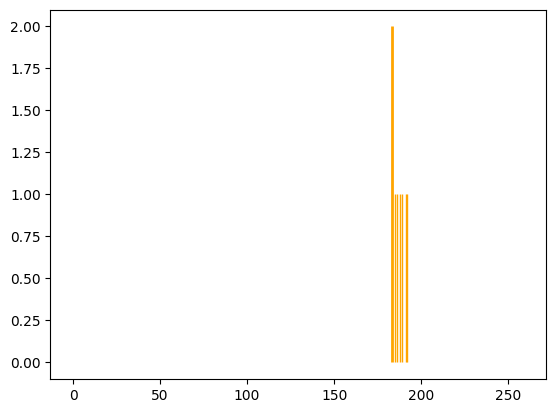

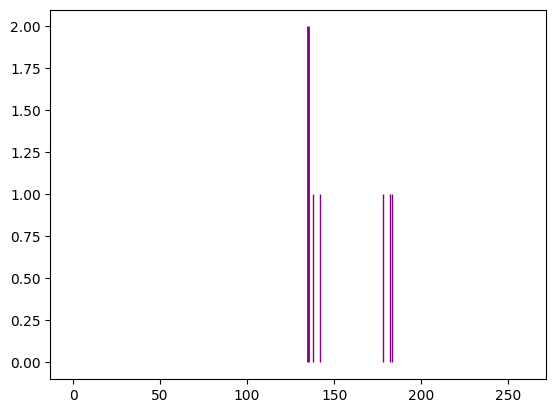

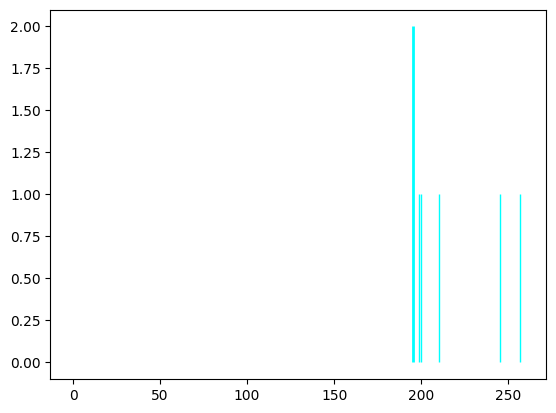

Spectrum num=2311, size=380, matched=111, frac=0.29210526315789476
Spectrum num=2311, size=380, matched=69, frac=0.18157894736842106


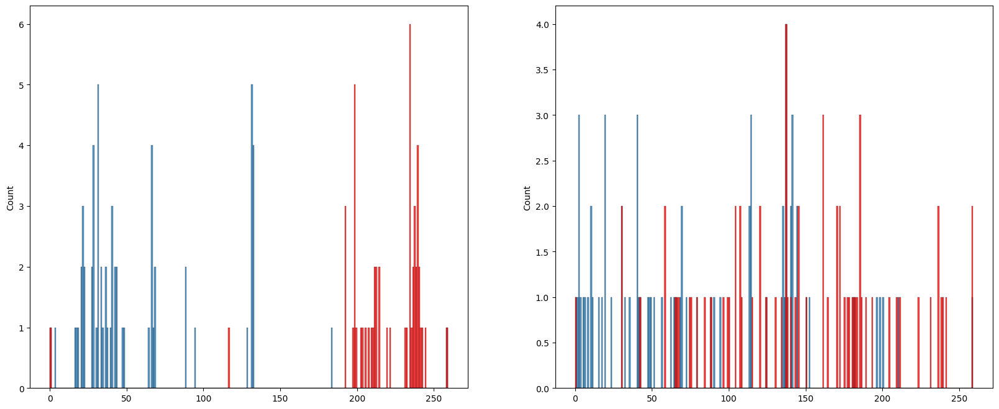

<Figure size 1200x800 with 0 Axes>

{1, 258, 2, 3, 5, 4, 7, 8, 137, 9, 139, 12, 13, 10, 18, 20, 149, 277, 24, 281, 30, 31, 35, 36, 164, 167, 168, 41, 298, 171, 51, 318, 63, 64, 193, 192, 325, 214, 89, 218, 94, 98, 100, 108, 238, 253}
{256, 0, 262, 6, 134, 11, 141, 15, 19, 25, 27, 158, 288, 32, 33, 37, 40, 46, 175, 48, 49, 50, 54, 182, 186, 187, 60, 321, 66, 70, 72, 74, 332, 79, 210, 83, 84, 85, 217, 232, 241}
{230, 135, 105, 143, 145, 309, 57, 62}
{161, 169, 45, 206, 112, 247, 28}
{131, 228, 200, 43, 81, 308, 117, 90}
{68, 14, 78, 16, 245, 348, 155, 124}
{165, 326, 359, 293, 142, 152}
{34, 204, 275, 372, 279}
{294, 329, 274, 53, 121, 29}
{352, 330, 176, 150, 87, 378}
{136, 266, 80, 311, 316}
{322, 22, 249, 58, 379}
{183, 216, 153, 283, 61}
{132, 260, 336, 23, 122, 123}
{239, 113, 211, 116, 184}
{229, 234, 138, 109, 314}
{231, 361, 88, 346, 220}


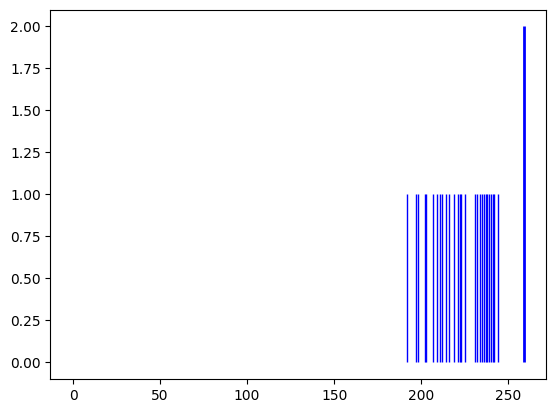

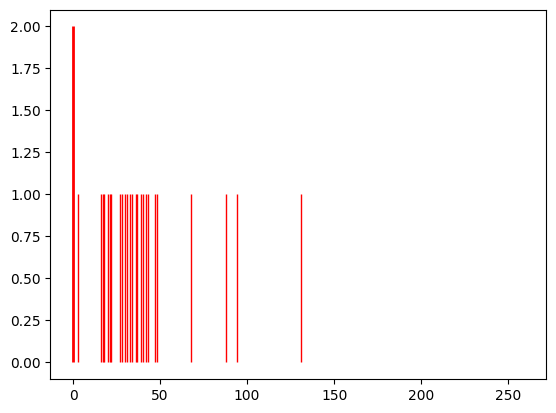

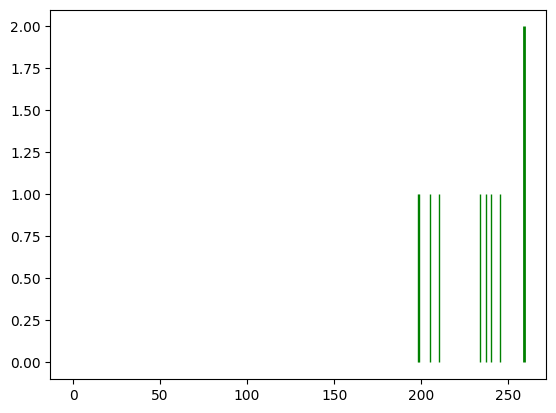

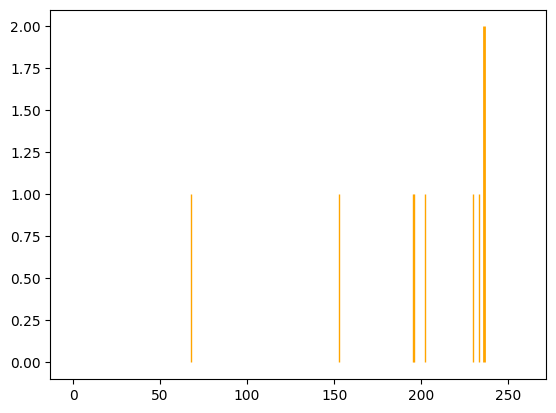

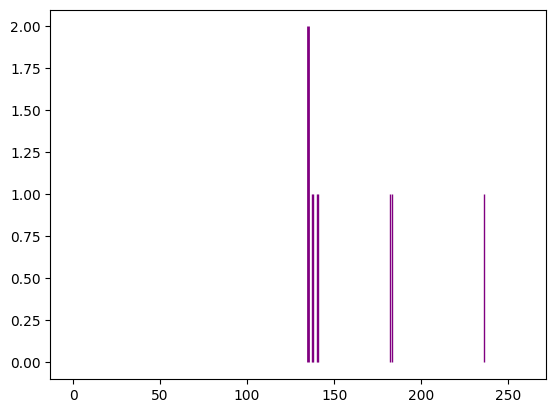

...

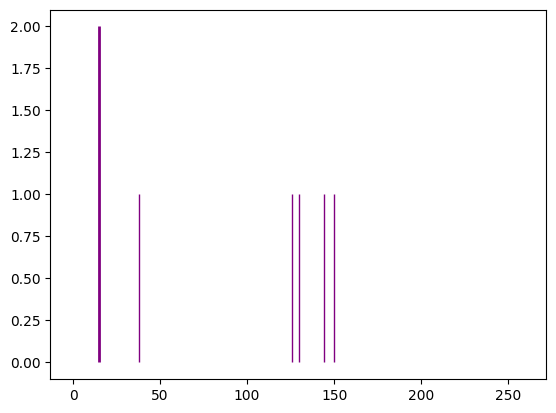

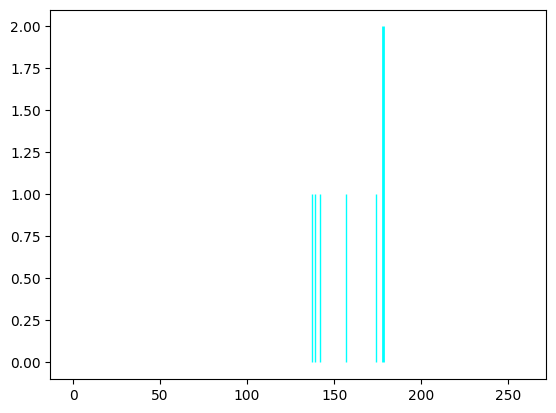

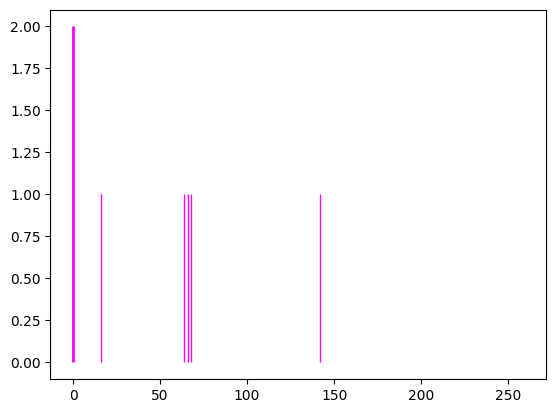

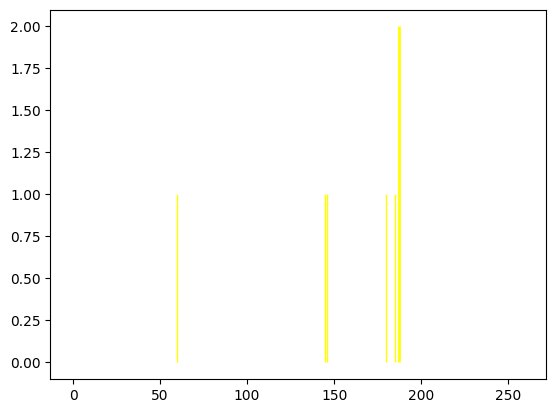

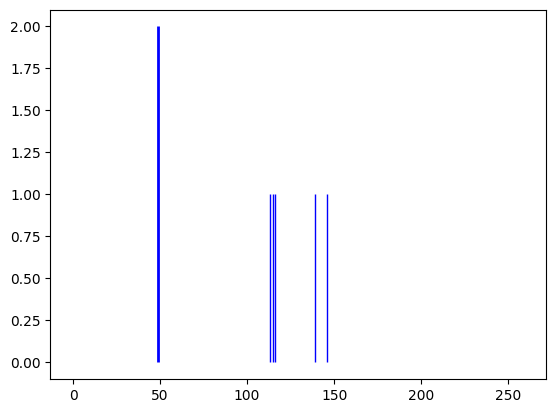

Spectrum num=2313, size=120, matched=48, frac=0.4
Spectrum num=2313, size=120, matched=16, frac=0.13333333333333333


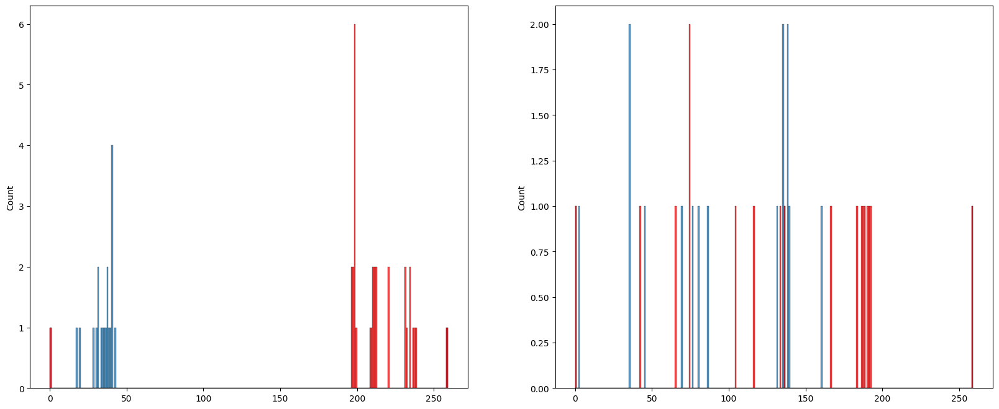

<Figure size 1200x800 with 0 Axes>

{97, 2, 3, 38, 7, 74, 11, 44, 76, 85, 54, 57, 90, 31, 95}
{0, 1, 34, 6, 10, 12, 14, 46, 48, 17, 18, 51, 20, 23, 25}
{66, 67, 69, 39, 115, 53, 119}
{102, 107, 108, 75, 110, 112, 114, 29}
{19, 30, 21, 22, 55, 94}
{103, 40, 49, 27, 63}


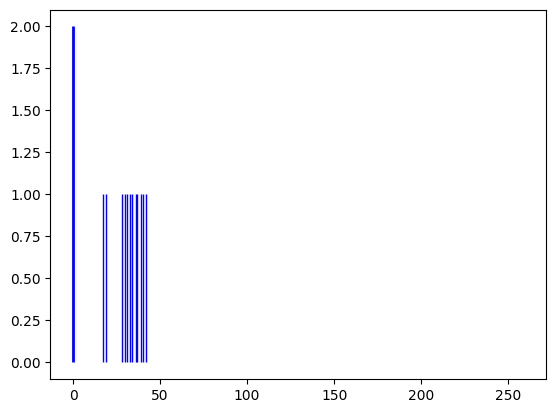

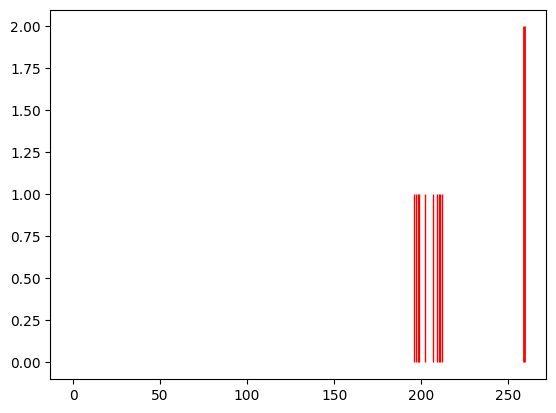

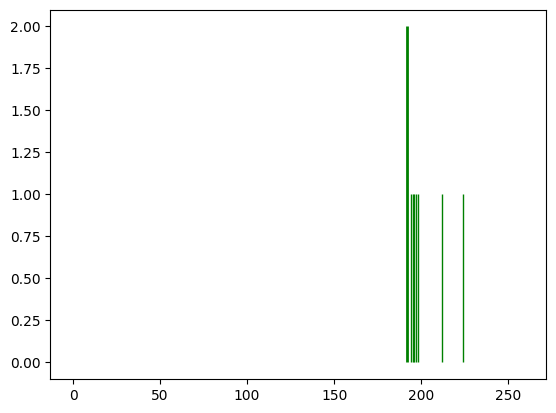

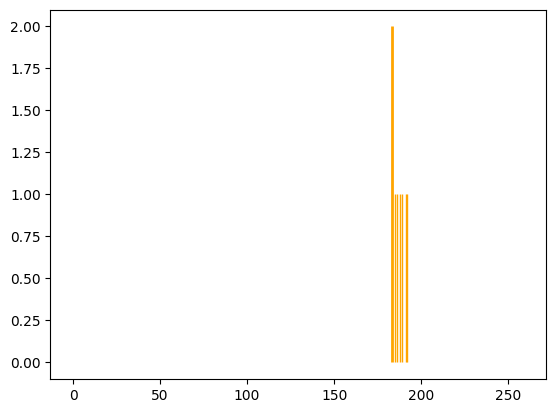

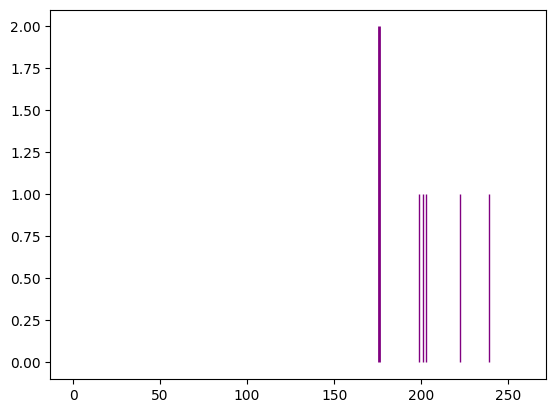

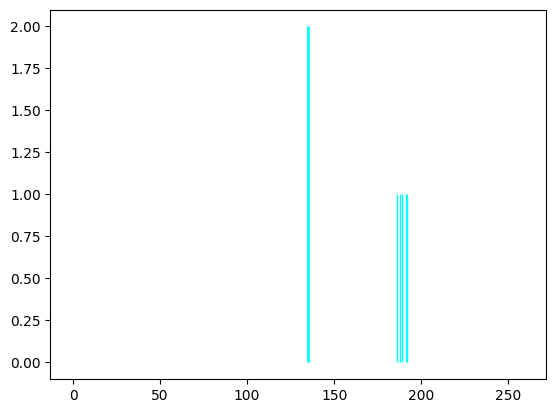

Spectrum num=2314, size=467, matched=145, frac=0.31049250535331907
Spectrum num=2314, size=467, matched=93, frac=0.19914346895074947


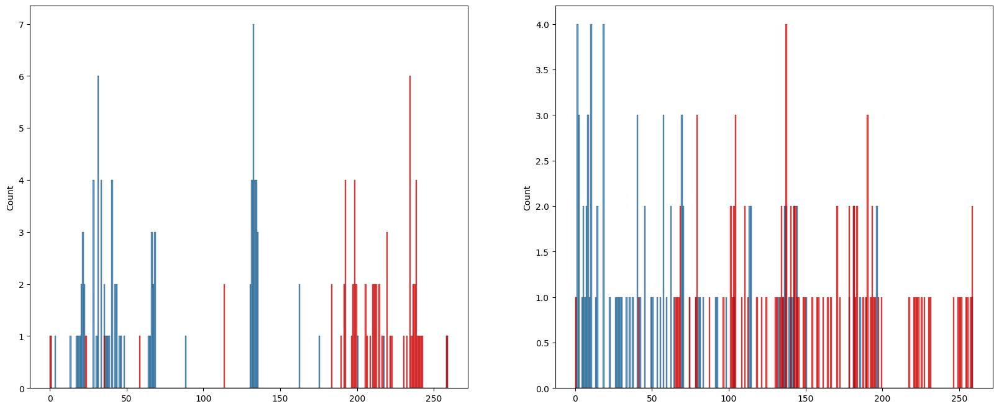

<Figure size 1200x800 with 0 Axes>

{0, 388, 7, 8, 139, 20, 25, 410, 28, 30, 287, 34, 37, 168, 40, 298, 46, 176, 434, 52, 55, 183, 57, 59, 63, 320, 450, 68, 198, 77, 83, 86, 91, 223, 96, 365, 109, 239, 251, 114, 254, 250, 379, 253, 126}
{128, 1, 258, 3, 2, 5, 6, 4, 9, 137, 11, 12, 13, 10, 15, 272, 14, 19, 405, 21, 153, 32, 33, 289, 291, 36, 171, 48, 304, 54, 56, 60, 190, 65, 196, 206, 90, 348, 104, 108, 238, 367, 112, 374, 119, 120, 127}
{166, 169, 42, 75, 43, 111, 208, 347, 92, 222}
{225, 102, 360, 41, 16, 53, 87}
{67, 103, 136, 173, 45, 79, 244}
{97, 261, 73, 74, 44, 80, 50, 408, 26, 27, 124, 62}
{164, 297, 268, 207, 144, 191}
{161, 227, 390, 233, 170, 398}
{433, 403, 182, 58, 156, 31}
{64, 226, 465, 51, 314}
{38, 424, 18, 23, 121}
{66, 70, 331, 270, 280}
{353, 420, 155, 316, 29}
{318, 453, 229, 425, 382}
{98, 296, 363, 459, 78, 189}
{200, 47, 432, 61, 319}
{323, 332, 142, 334, 188}
{163, 452, 373, 22, 215, 184}
{448, 359, 106, 146, 186, 125}


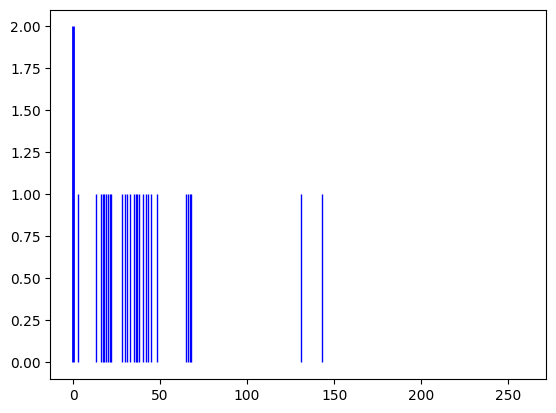

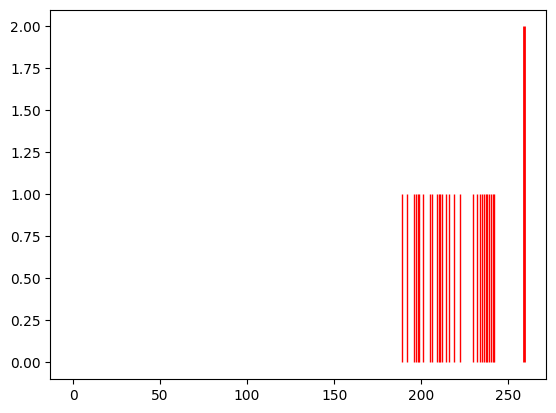

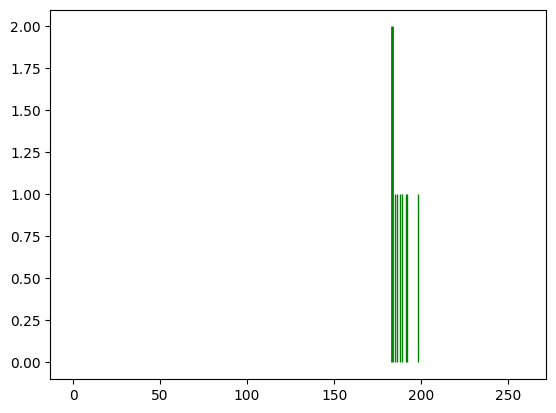

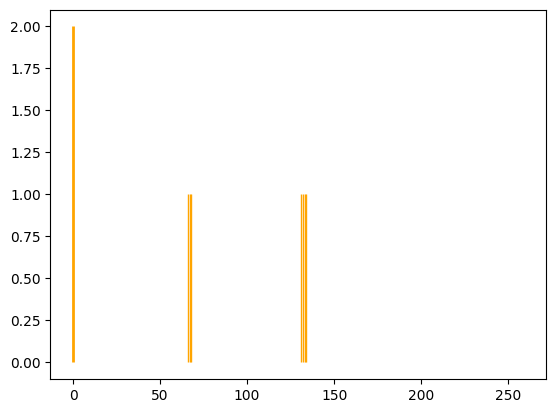

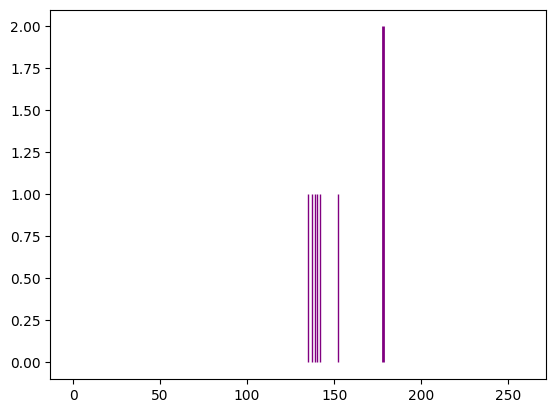

...

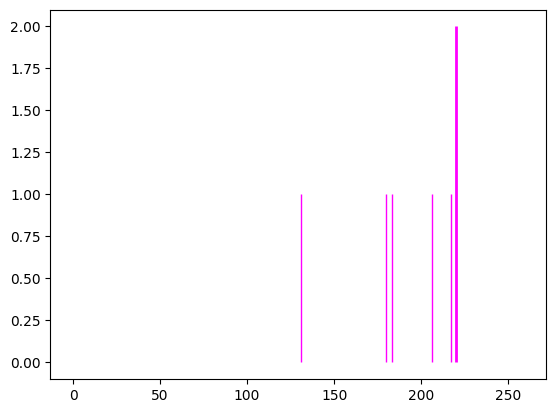

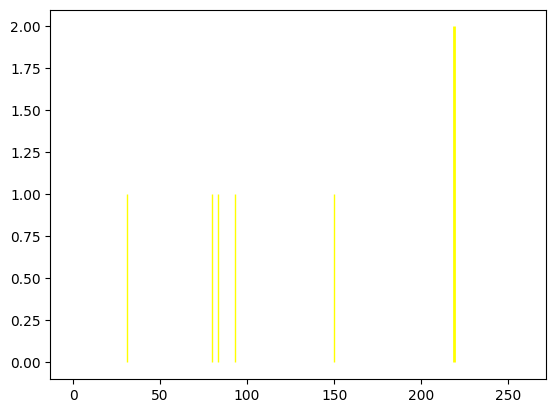

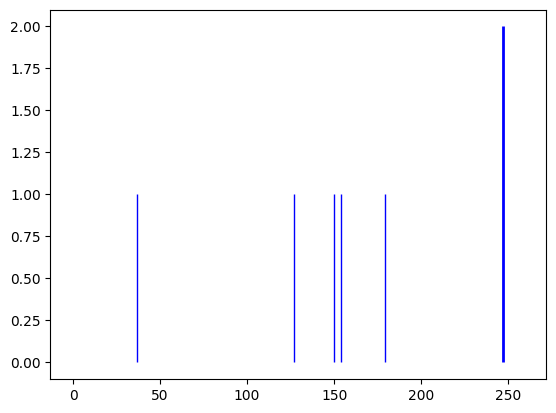

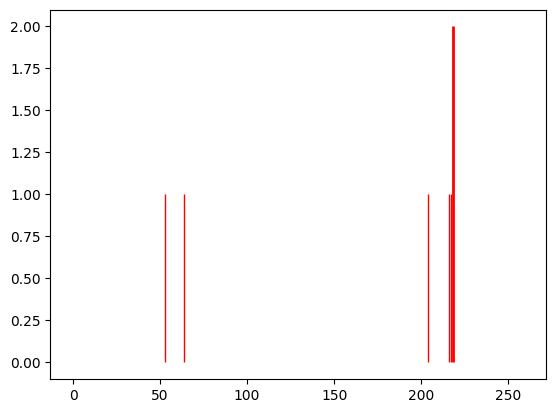

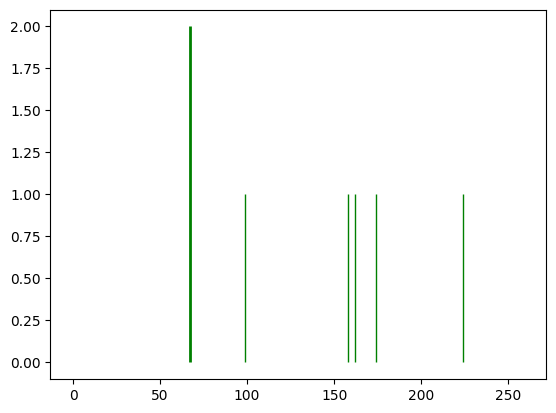

Spectrum num=2316, size=131, matched=57, frac=0.4351145038167939
Spectrum num=2316, size=131, matched=13, frac=0.09923664122137404


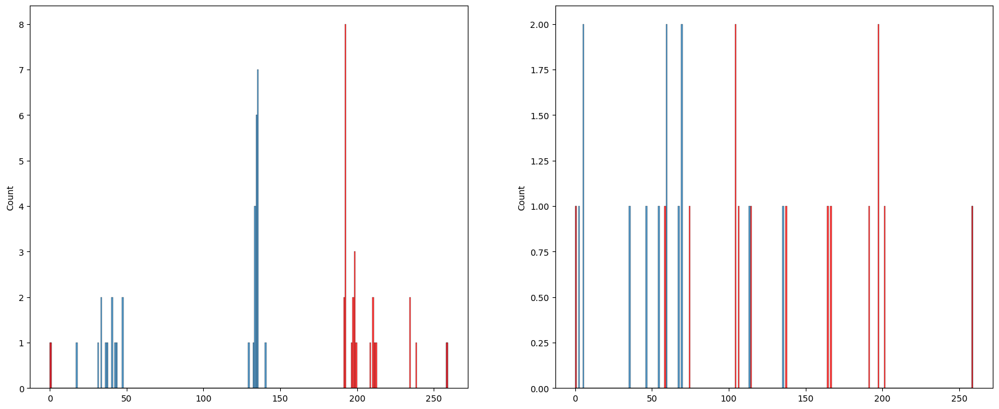

<Figure size 1200x800 with 0 Axes>

{67, 36, 7, 39, 104, 10, 108, 12, 46, 50, 52, 54, 86, 29}
{1, 3, 4, 8, 9, 16, 17, 19, 24, 25, 27, 30, 33, 34, 35, 37, 41, 47, 53, 74, 77, 83, 84, 87}
{65, 44, 81, 18, 121, 93}


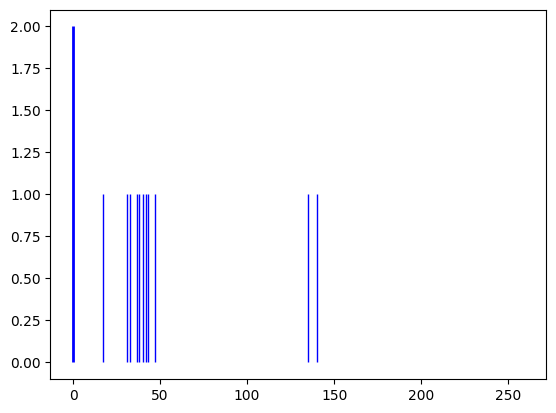

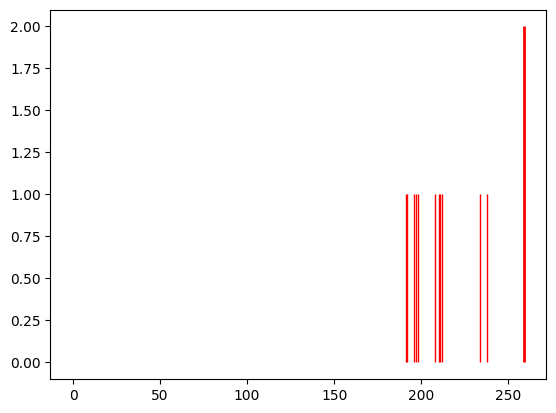

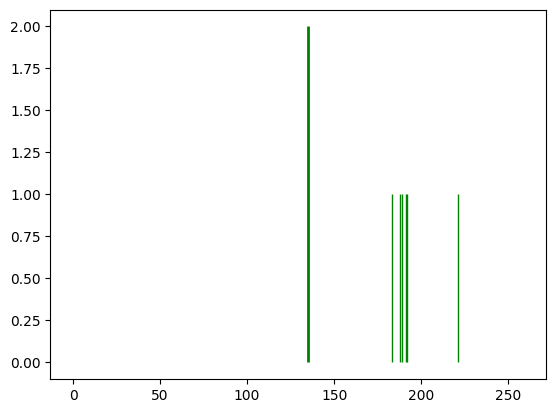

Spectrum num=2318, size=764, matched=147, frac=0.19240837696335078
Spectrum num=2318, size=764, matched=145, frac=0.18979057591623036


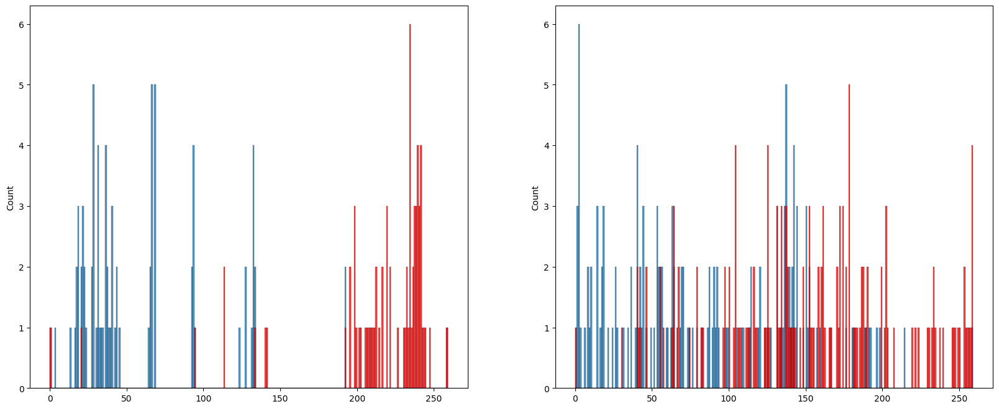

<Figure size 1200x800 with 0 Axes>

{128, 1, 2, 131, 255, 4, 6, 263, 264, 8, 7, 11, 5, 134, 15, 3, 147, 21, 23, 24, 25, 31, 40, 169, 47, 50, 307, 62, 63, 453, 78, 79, 210, 86, 347, 100, 103, 361, 233, 110, 381, 125, 127}
{0, 136, 9, 650, 10, 269, 17, 19, 20, 149, 22, 278, 28, 29, 670, 32, 34, 292, 38, 167, 681, 42, 43, 46, 174, 48, 51, 311, 439, 57, 56, 440, 188, 66, 69, 200, 202, 333, 209, 82, 83, 469, 598, 343, 90, 93, 107, 620, 623, 368, 250, 635}
{64, 577, 483, 35, 70, 199, 489, 59, 187, 13, 184, 254, 760, 27, 605, 30, 543}
{288, 65, 322, 516, 599, 519, 142, 80, 18, 178, 54, 151, 313, 346, 219, 574}
{385, 33, 450, 68, 706, 391, 392, 203, 532, 731}
{130, 195, 36, 112, 305, 181, 316, 285}
{99, 356, 41, 81, 597, 246, 341, 156}
{420, 229, 552, 746, 77, 14, 143, 159}
{257, 12, 109, 334, 282, 124, 383}
{737, 741, 619, 652, 590, 691, 600}
{163, 515, 135, 714, 538, 118, 186}
{609, 67, 74, 331, 75, 115, 437, 53, 60}
{295, 424, 686, 111, 497, 274, 639}
{224, 708, 680, 751, 695, 728, 447}
{491, 685, 500, 310, 150, 669, 158}
{96

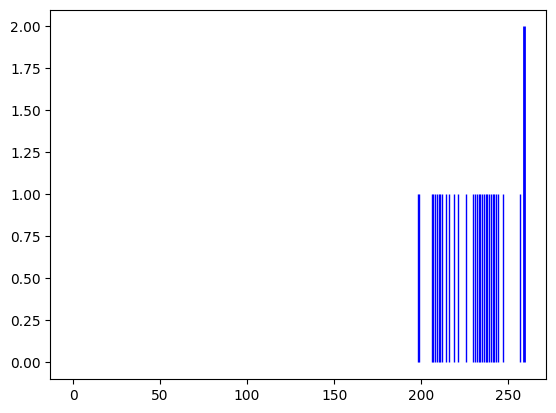

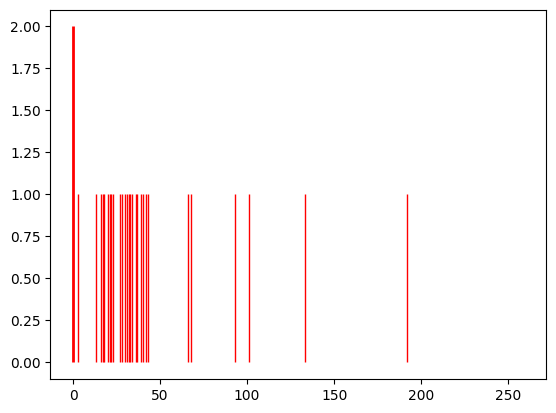

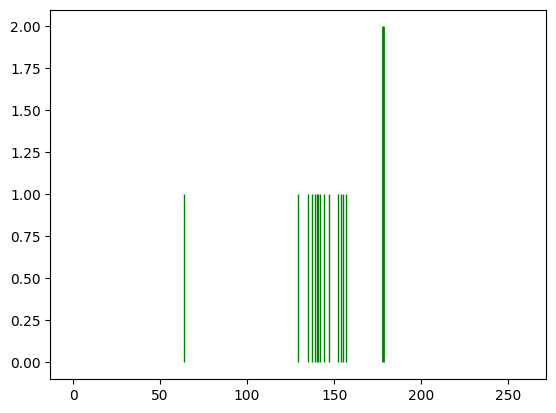

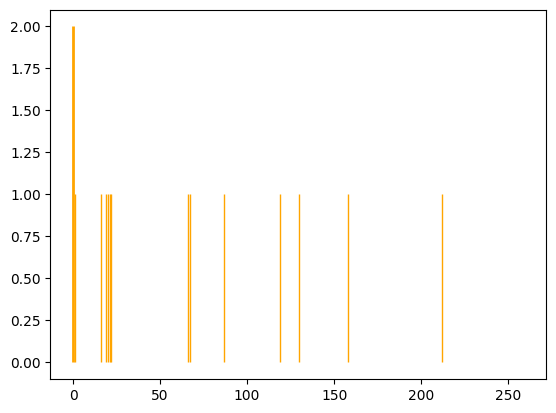

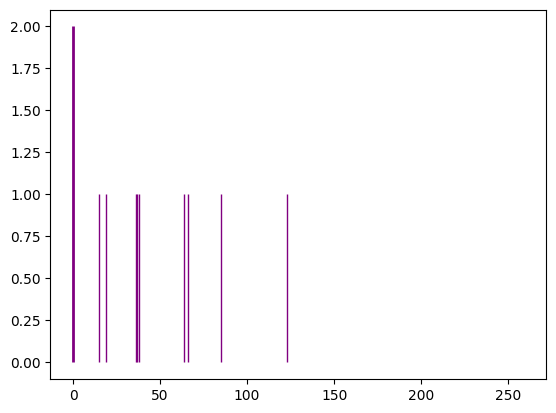

...

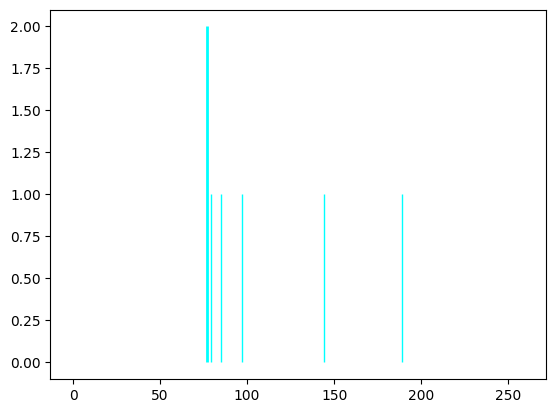

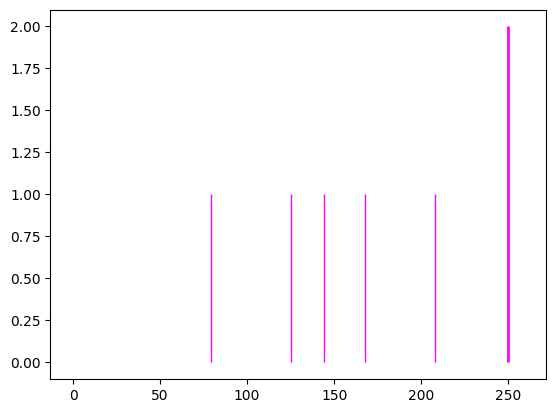

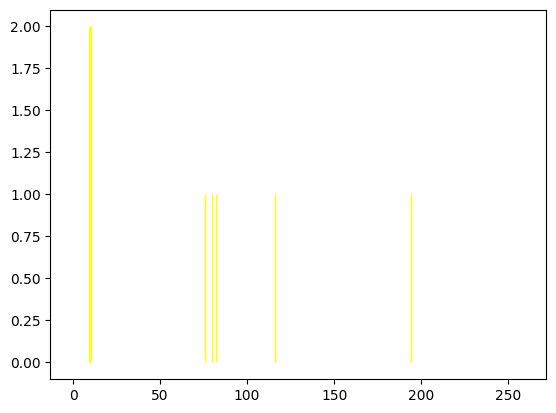

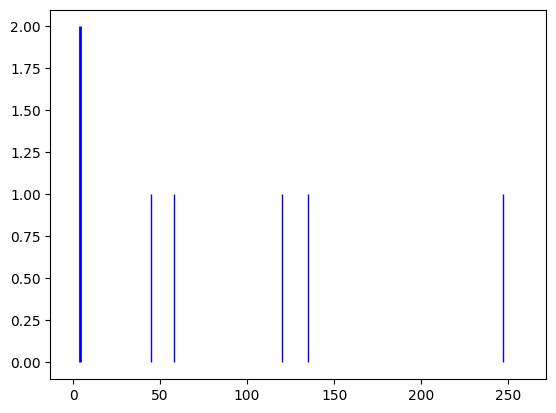

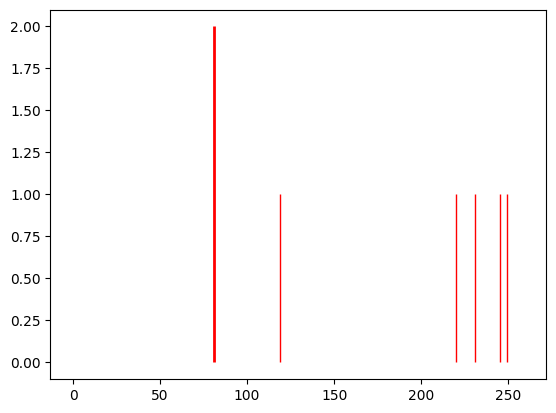

Spectrum num=2322, size=483, matched=138, frac=0.2857142857142857
Spectrum num=2322, size=483, matched=81, frac=0.16770186335403728


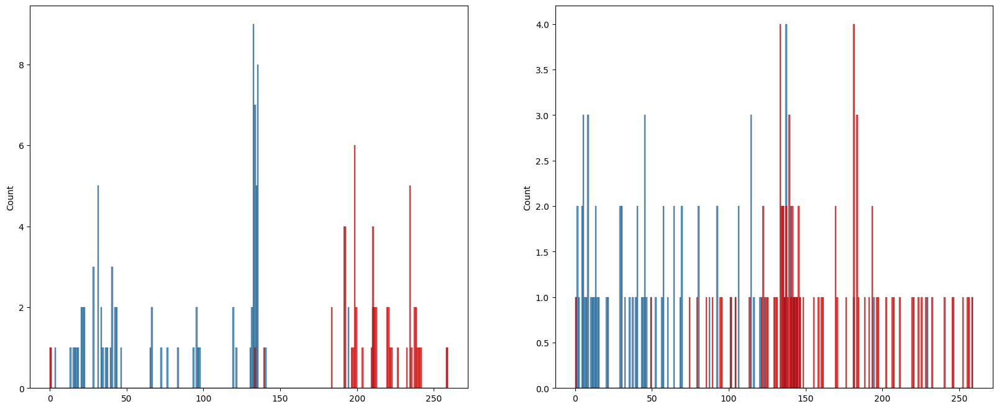

<Figure size 1200x800 with 0 Axes>

{130, 3, 8, 136, 139, 269, 142, 16, 19, 20, 22, 154, 27, 157, 413, 415, 418, 162, 34, 294, 426, 430, 51, 52, 53, 439, 57, 447, 194, 69, 326, 73, 332, 80, 81, 82, 214, 87, 342, 223, 99, 101, 103, 365, 368, 242, 114, 244, 118, 121, 379, 124, 127}
{0, 1, 2, 4, 5, 392, 9, 145, 23, 28, 29, 33, 163, 165, 43, 429, 46, 49, 50, 58, 65, 67, 68, 207, 234, 107, 111, 249, 253}
{64, 225, 227, 38, 423, 473, 79, 47, 239, 156, 147, 83, 24, 89, 26, 220, 125}
{66, 100, 134, 70, 393, 137, 59, 75, 13, 45, 18, 85, 406, 21, 120, 411}
{482, 427, 333, 463, 304, 208, 178, 271, 150}
{416, 193, 35, 198, 200, 238, 404, 313, 30}
{257, 166, 276, 181, 55, 184, 153, 314, 123, 158}
{32, 196, 36, 6, 7, 11, 12, 44, 14, 15, 17, 86, 119}
{262, 454, 241, 151, 56, 478}
{331, 140, 175, 115, 275, 287}
{192, 74, 204, 435, 218, 60}
{354, 40, 425, 338, 340, 94, 159}
{386, 235, 462, 78, 116, 252}
{105, 397, 301, 311, 284, 62}
{424, 296, 171, 122, 414}
{135, 461, 339, 277, 279}
{264, 41, 201, 243, 444}
{260, 39, 359, 71, 263}
{448,

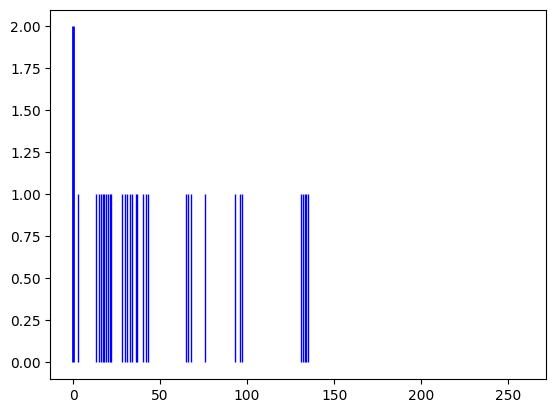

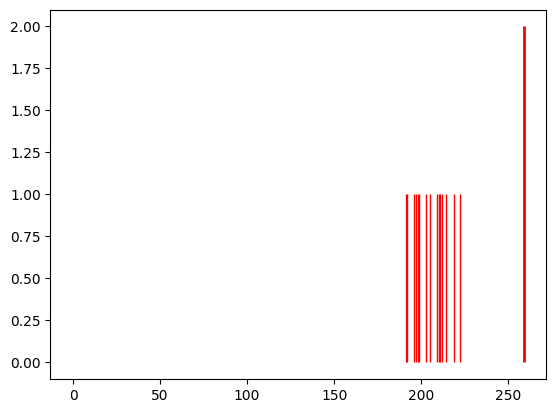

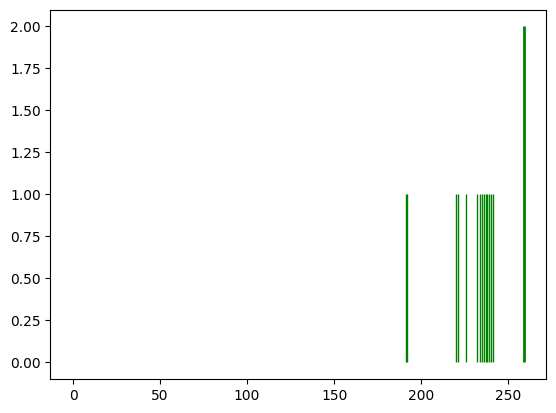

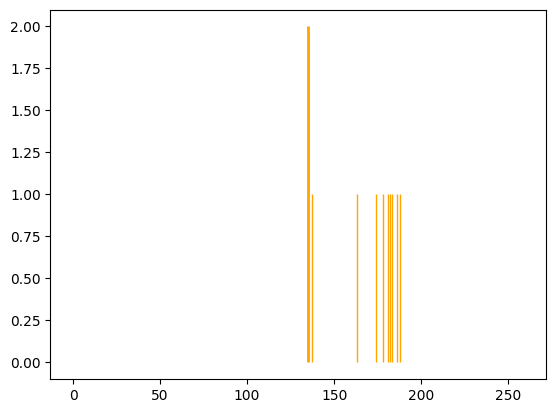

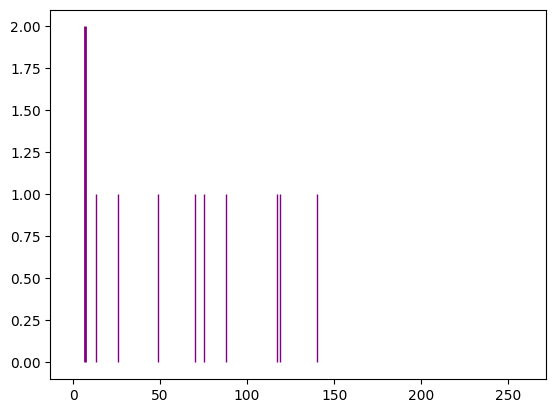

...

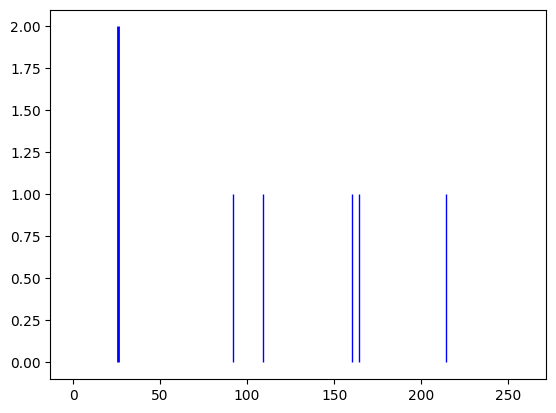

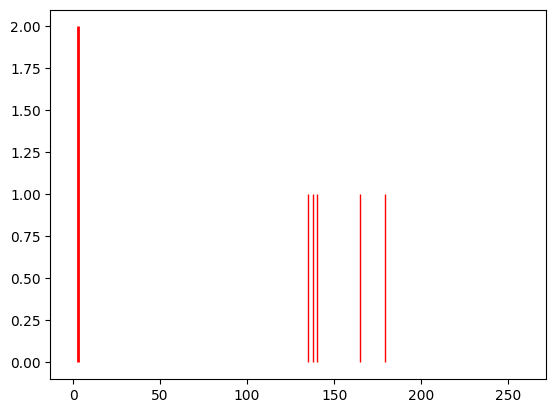

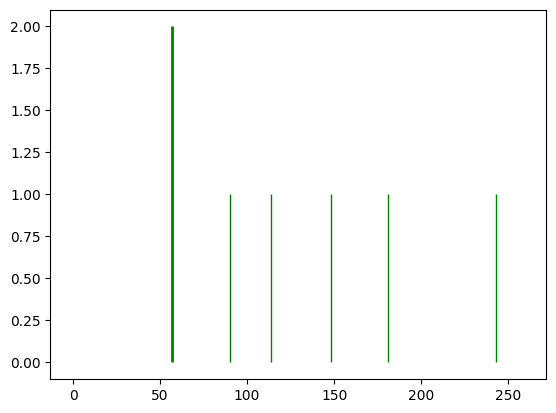

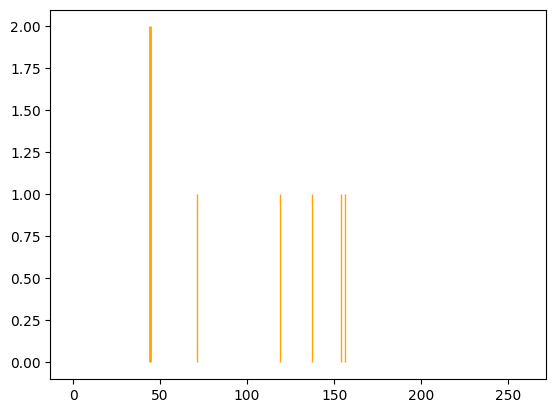

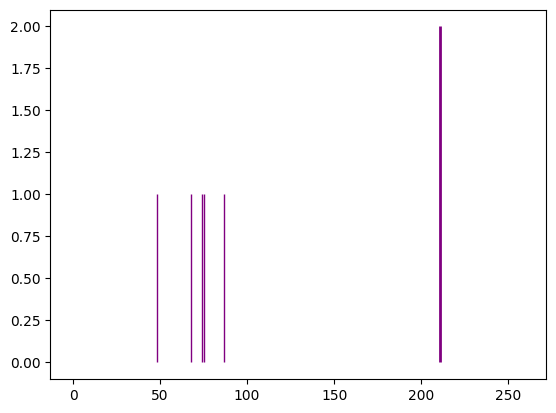

Spectrum num=2323, size=450, matched=144, frac=0.32
Spectrum num=2323, size=450, matched=90, frac=0.2


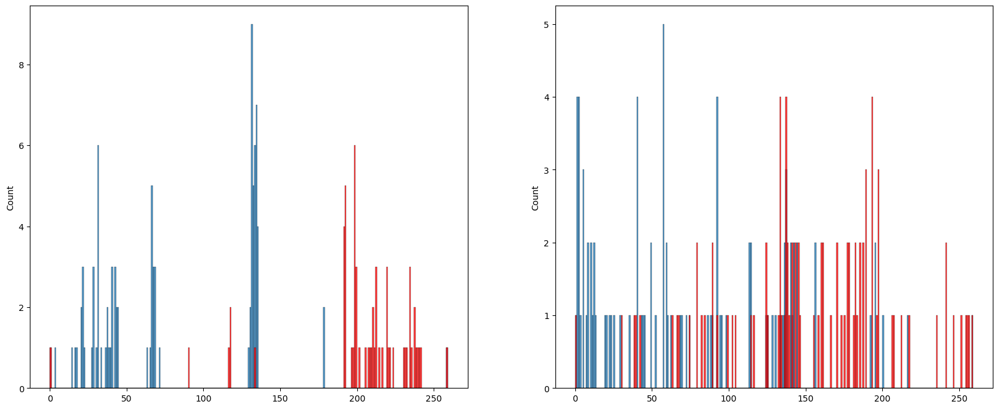

<Figure size 1200x800 with 0 Axes>

{1, 130, 131, 129, 261, 8, 138, 140, 19, 151, 25, 153, 27, 29, 157, 33, 162, 39, 168, 425, 298, 43, 175, 304, 49, 48, 53, 438, 183, 55, 57, 309, 189, 195, 68, 74, 205, 78, 341, 86, 88, 89, 120, 350, 95, 99, 230, 104, 109, 239, 113, 117, 376, 378, 255}
{0, 2, 259, 4, 5, 3, 7, 6, 9, 10, 11, 267, 16, 18, 274, 21, 22, 23, 281, 31, 160, 161, 35, 167, 45, 178, 50, 184, 56, 59, 66, 203, 77, 79, 82, 212, 347, 91, 220, 96, 101, 359, 235, 245, 252, 381, 383}
{36, 38, 105, 362, 204, 173, 141, 237, 80}
{128, 134, 295, 103, 166, 200, 75, 214, 249}
{258, 356, 262, 363, 369, 20, 380}
{32, 388, 13, 111, 209, 115, 87, 316, 63}
{64, 73, 335, 306, 84, 61}
{98, 100, 229, 231, 44, 12, 305, 52, 85}
{65, 421, 81, 152, 90, 92}
{408, 360, 439, 24, 127}
{417, 70, 364, 429, 26}
{324, 329, 170, 277, 282}
{67, 37, 135, 240, 222}
{41, 395, 366, 15, 119, 344}
{353, 69, 47, 279, 122}
{227, 390, 307, 284, 351}
{194, 302, 432, 123, 188}
{354, 322, 102, 42, 269, 17}
{28, 348, 187, 124, 318}


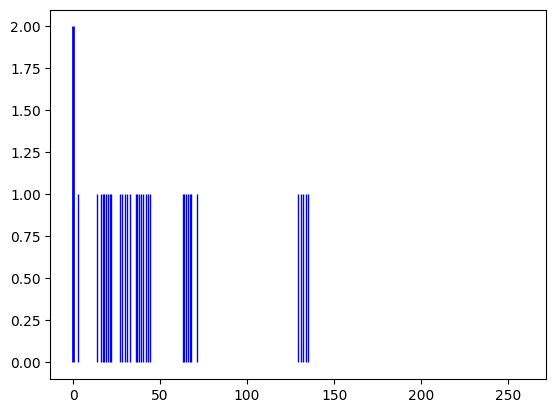

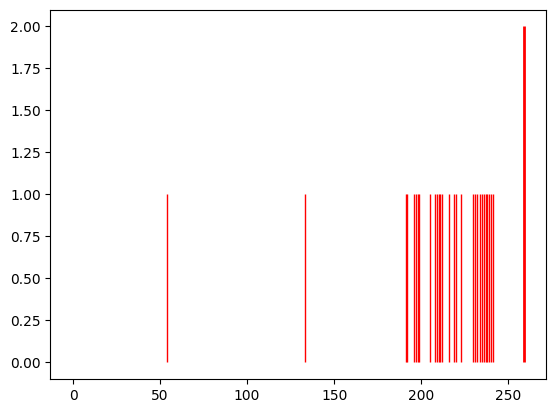

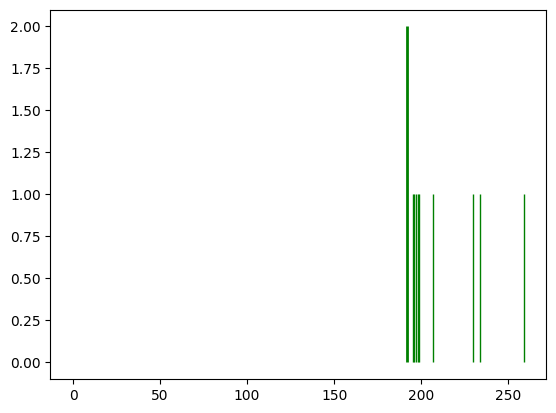

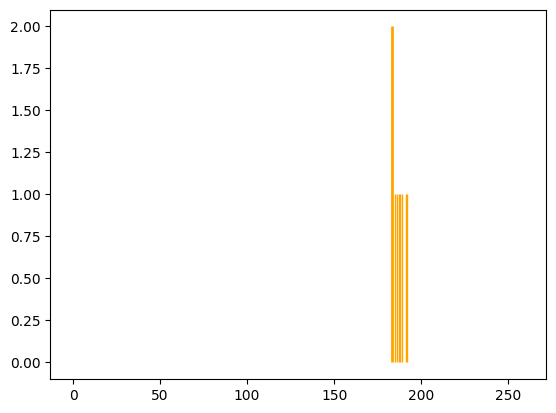

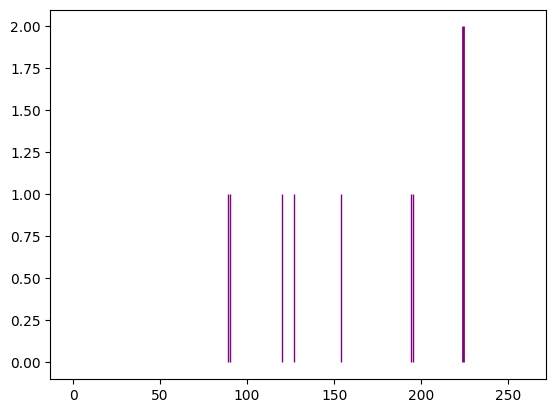

...

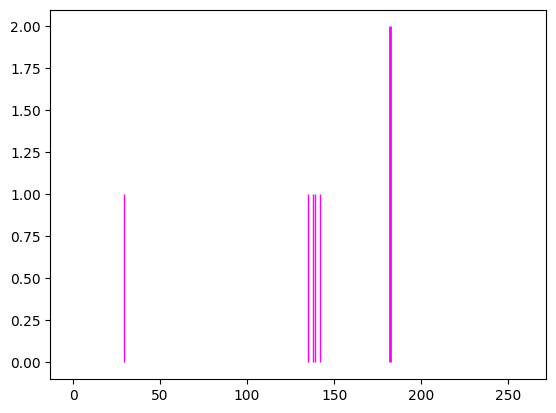

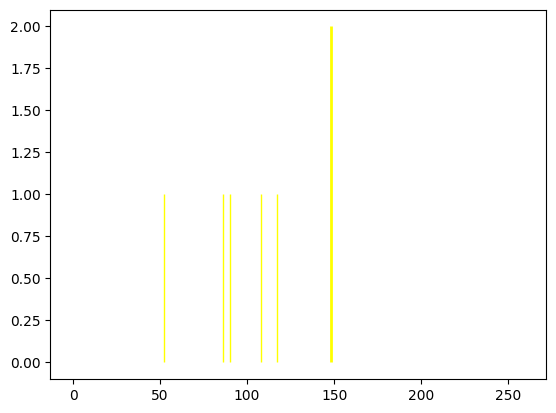

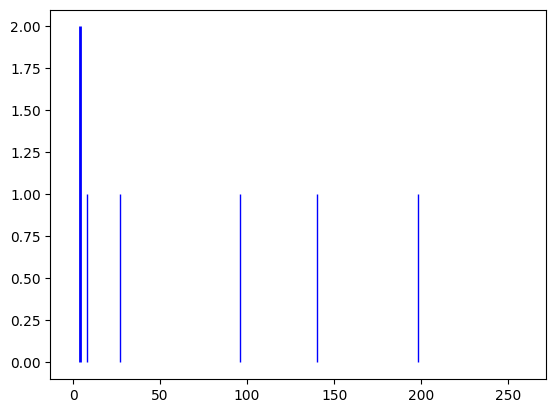

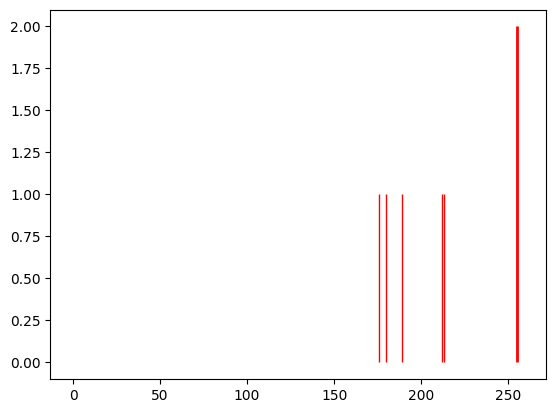

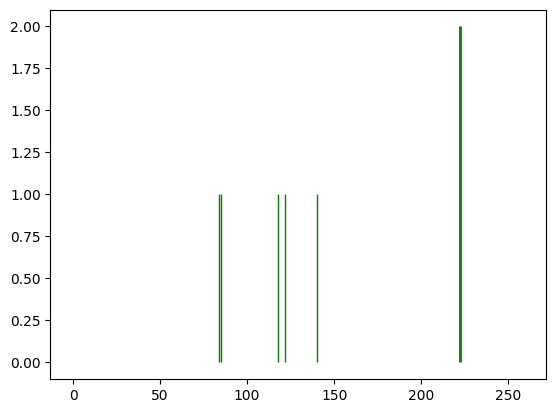

Spectrum num=2324, size=151, matched=40, frac=0.26490066225165565
Spectrum num=2324, size=151, matched=28, frac=0.18543046357615894


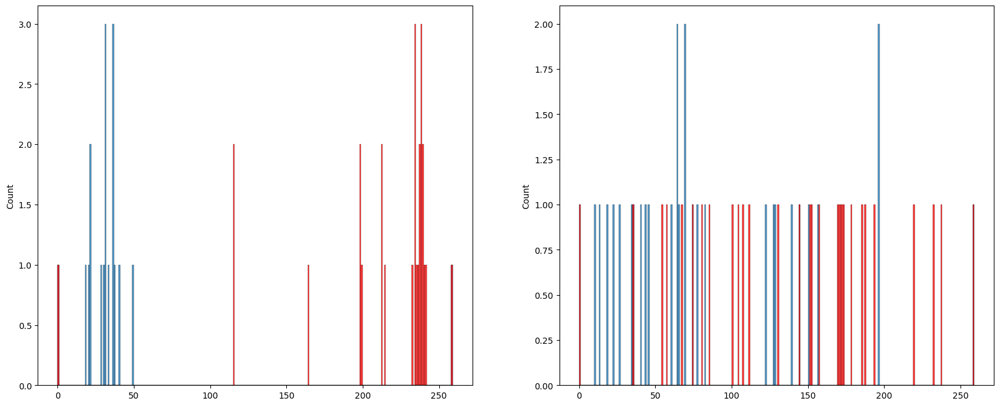

<Figure size 1200x800 with 0 Axes>

{1, 2, 35, 4, 3, 6, 5, 8, 10, 42, 11, 46, 16, 18, 20, 21, 22, 28}
{0, 34, 36, 101, 68, 132, 7, 9, 13, 55, 60, 29, 31}
{141, 81, 122, 59, 93}


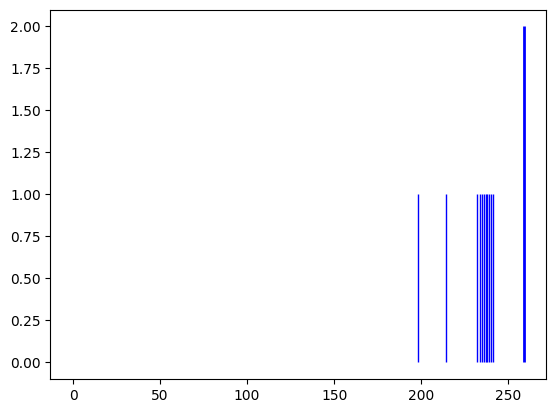

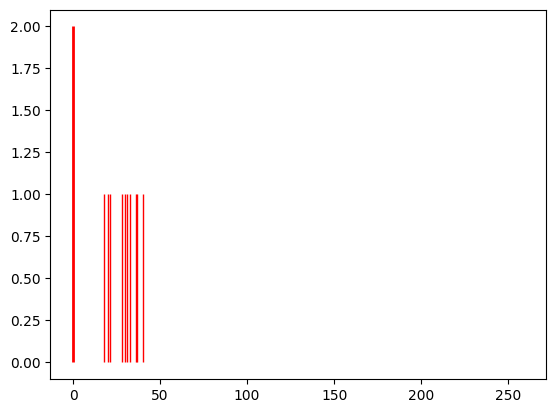

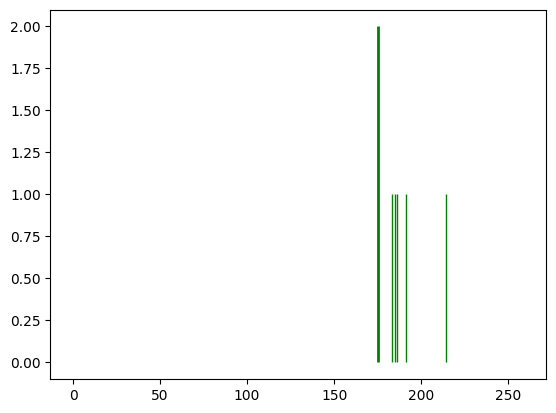

Spectrum num=2326, size=483, matched=154, frac=0.3188405797101449
Spectrum num=2326, size=483, matched=86, frac=0.17805383022774326


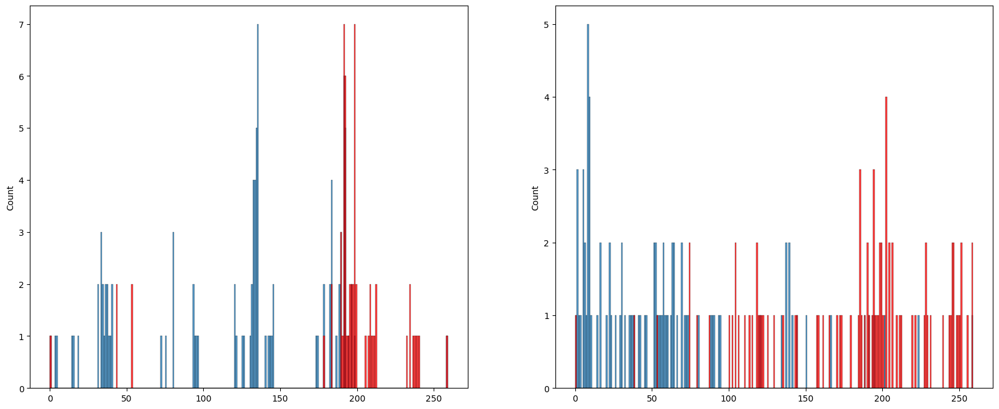

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 130, 5, 257, 255, 8, 10, 140, 14, 15, 271, 19, 407, 26, 156, 286, 158, 287, 36, 40, 44, 45, 47, 48, 178, 52, 53, 311, 192, 194, 67, 71, 213, 91, 357, 101, 111, 240, 115, 245, 376, 125, 127}
{260, 17, 23, 413, 288, 289, 419, 37, 38, 39, 51, 436, 180, 439, 440, 61, 62, 63, 193, 197, 326, 331, 218, 93, 350, 98, 230, 232, 117}
{0, 4, 6, 7, 134, 9, 265, 11, 12, 13, 18, 148, 21, 25, 27, 28, 29, 30, 31, 32, 33, 161, 35, 42, 43, 301, 46, 50, 64, 65, 66, 68, 78, 335, 80, 465, 82, 83, 89, 482, 360, 112, 370, 118, 123}
{224, 132, 293, 136, 106, 236, 114, 210, 284, 415}
{225, 234, 155, 77, 151, 281, 154, 219, 159}
{290, 291, 263, 73, 458, 373, 253}
{323, 424, 243, 280, 346, 60}
{163, 327, 425, 427, 237, 143}
{34, 16, 24, 57, 283, 380}
{297, 299, 462, 309, 183, 409}
{320, 328, 300, 460, 209, 190}
{463, 244, 119, 250, 187}
{385, 267, 276, 55, 222}
{481, 70, 142, 211, 150}
{166, 139, 396, 367, 239}
{235, 272, 435, 343, 414}
{321, 198, 423, 59, 315}
{428, 270, 302, 56, 383}


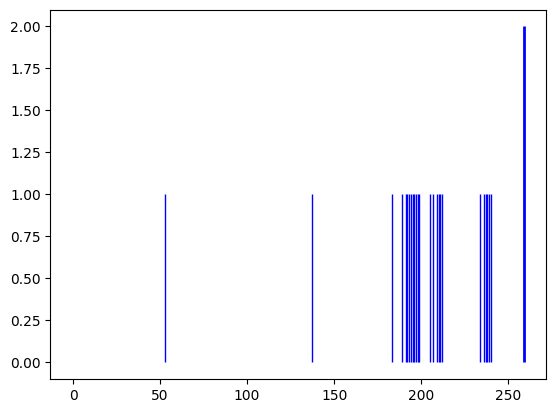

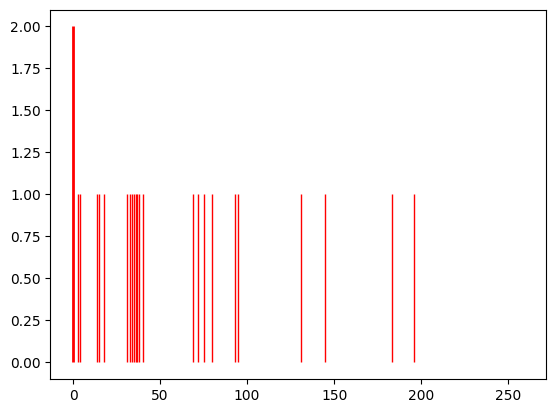

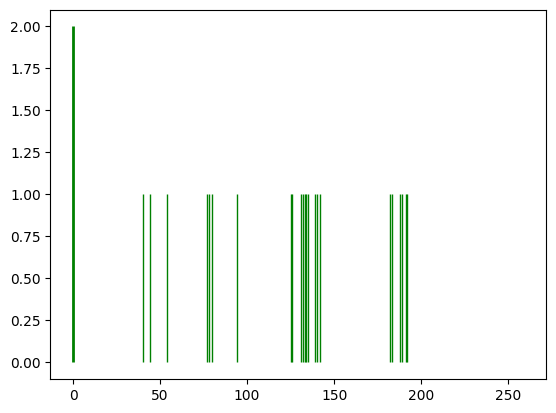

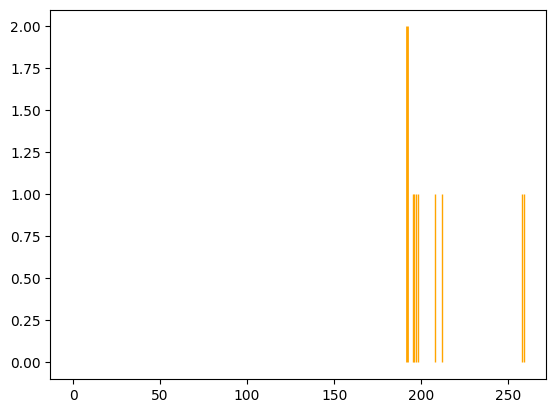

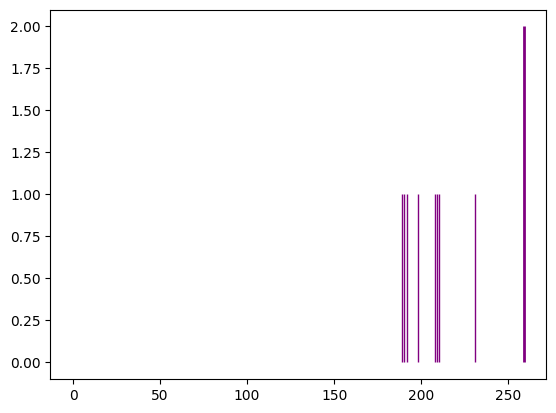

...

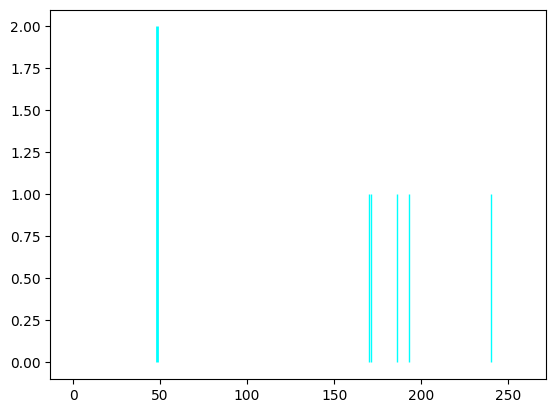

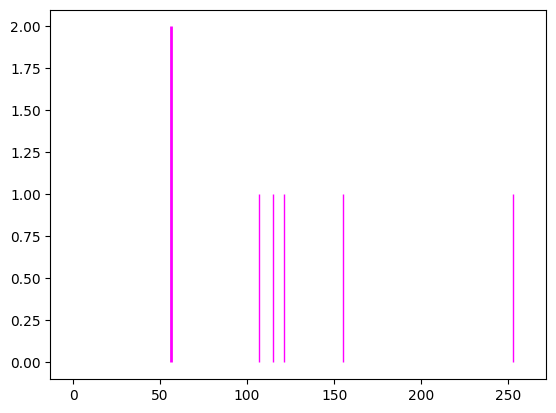

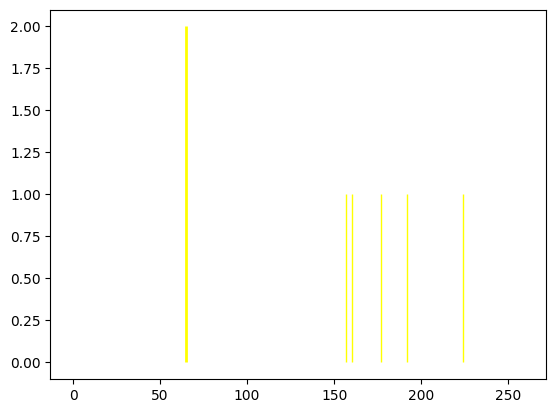

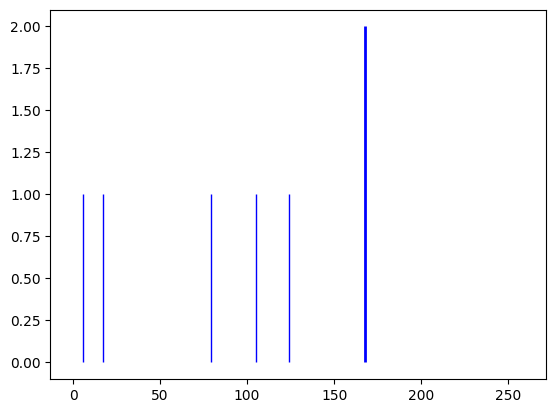

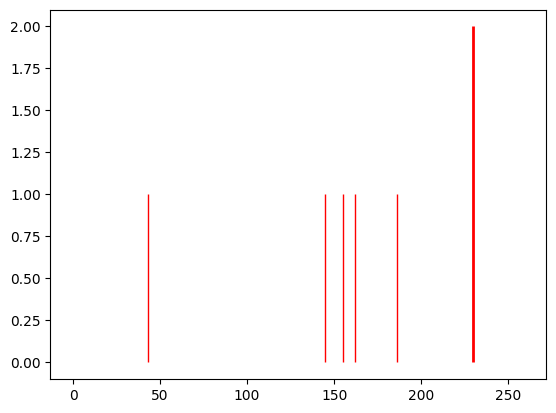

Spectrum num=2327, size=483, matched=147, frac=0.30434782608695654
Spectrum num=2327, size=483, matched=70, frac=0.14492753623188406


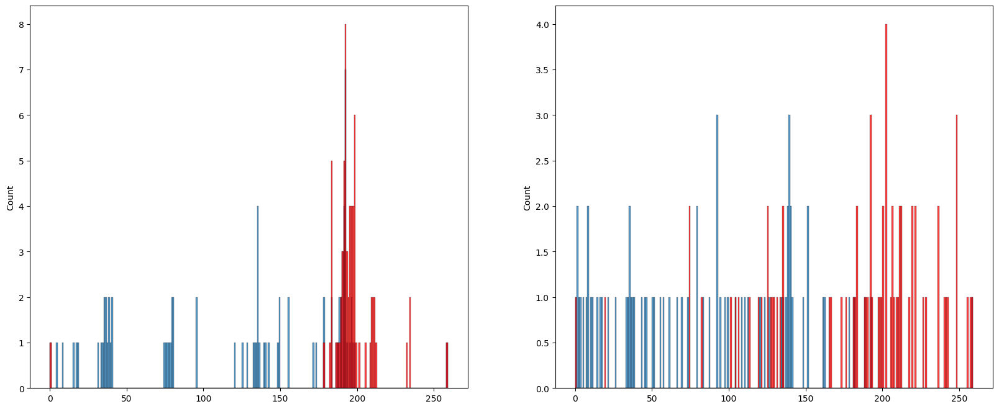

<Figure size 1200x800 with 0 Axes>

{128, 130, 259, 134, 137, 274, 26, 155, 156, 162, 36, 168, 49, 179, 312, 60, 190, 66, 77, 78, 81, 212, 86, 87, 92, 224, 97, 98, 103, 109, 111, 240, 114, 117, 120, 122, 253}
{0, 1, 4, 7, 11, 12, 14, 20, 277, 23, 24, 25, 28, 29, 32, 33, 34, 161, 38, 39, 42, 171, 177, 180, 54, 56, 187, 59, 191, 193, 80, 217, 89, 94, 99, 105, 236, 237, 110, 250, 123}
{64, 68, 69, 102, 391, 158, 74, 398, 79, 144, 113, 17, 83, 84, 402, 315, 350}
{65, 2, 37, 70, 6, 101, 8, 10, 108, 13, 15, 47, 52, 53, 21, 218, 27, 61}
{197, 133, 233, 139, 76, 239, 112, 178, 244, 215, 345, 282}
{298, 395, 428, 364, 115, 383}
{196, 301, 304, 308, 186, 284}
{3, 48, 18, 373, 157, 30}
{40, 106, 44, 116, 85, 63}
{480, 194, 294, 57, 414}
{258, 163, 355, 461, 273}
{67, 424, 148, 55, 281}
{200, 426, 138, 299, 154}
{291, 359, 238, 464, 382}
{357, 9, 265, 306, 437}
{288, 452, 268, 174, 153}


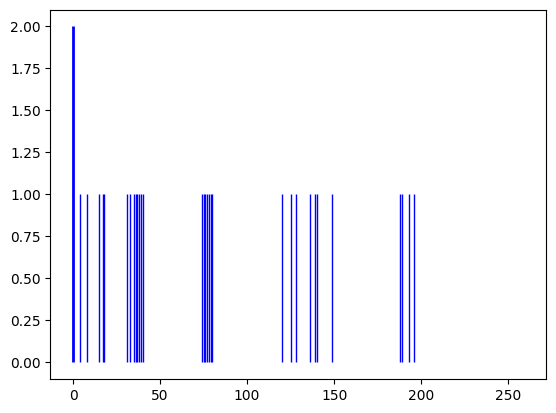

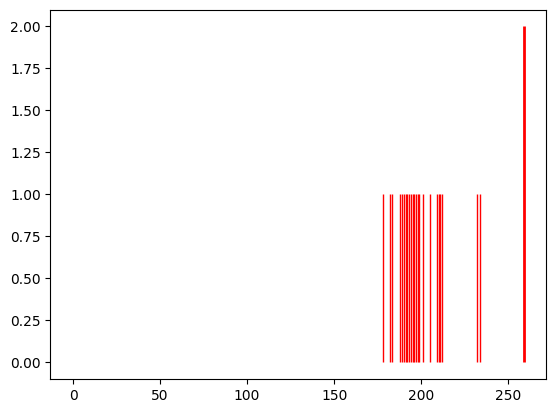

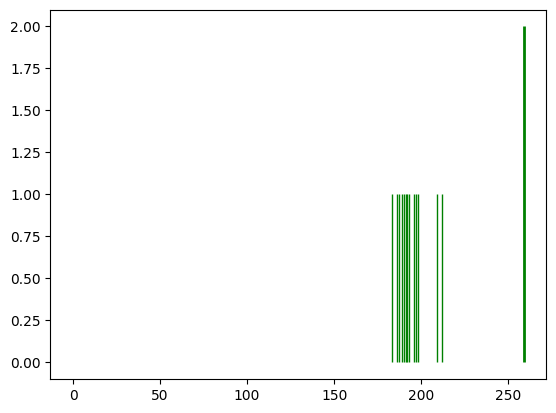

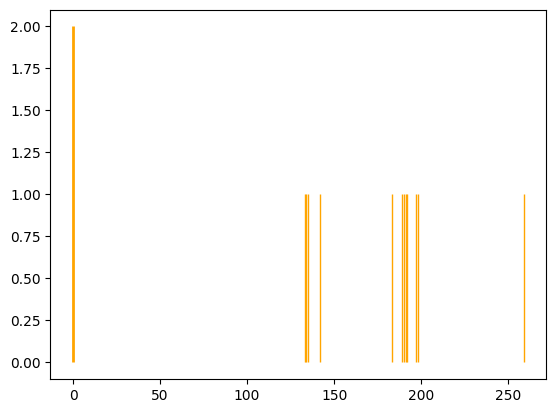

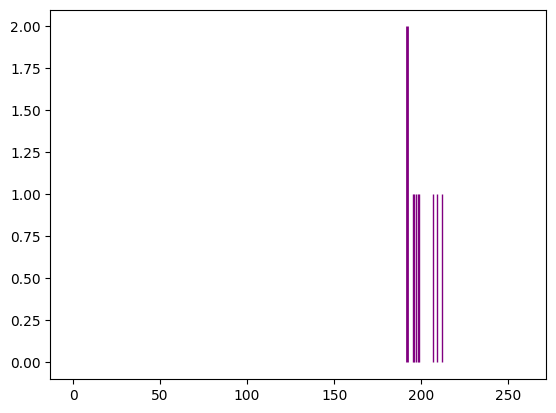

...

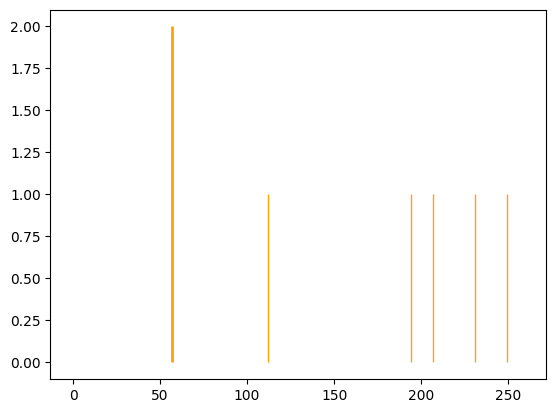

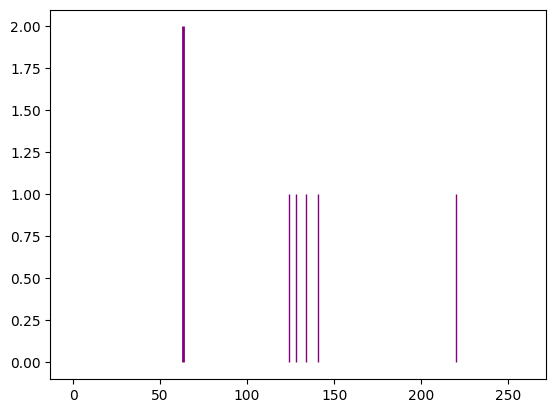

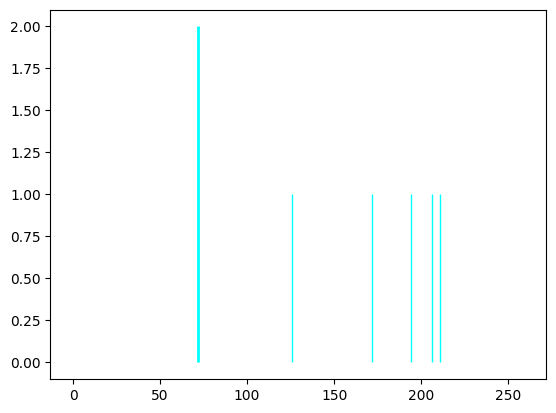

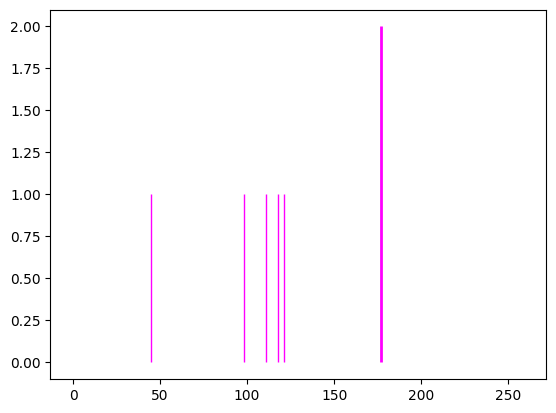

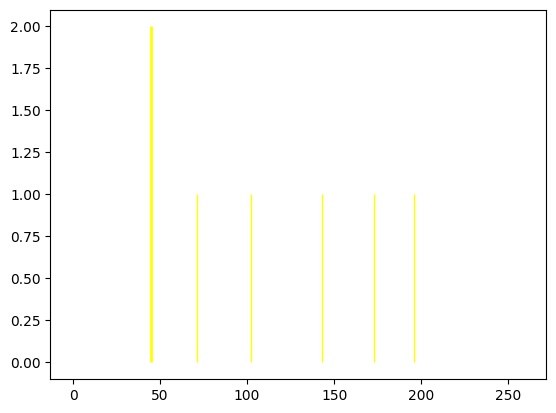

Spectrum num=2329, size=483, matched=122, frac=0.2525879917184265
Spectrum num=2329, size=483, matched=83, frac=0.17184265010351968


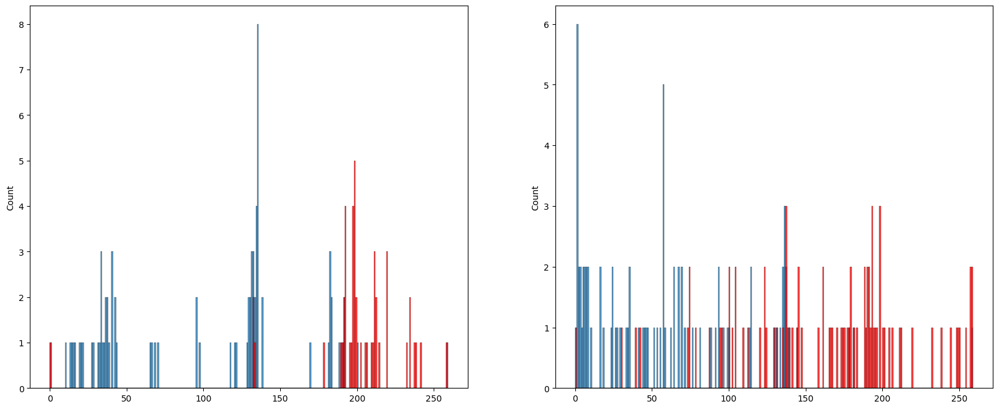

<Figure size 1200x800 with 0 Axes>

{257, 4, 139, 142, 143, 17, 18, 19, 279, 282, 411, 155, 285, 158, 287, 419, 421, 169, 180, 53, 182, 436, 318, 65, 66, 72, 200, 202, 77, 464, 340, 344, 477, 351, 480, 358, 106, 107, 108, 236, 373, 374, 120, 249}
{0, 1, 130, 5, 6, 10, 396, 141, 13, 271, 20, 404, 22, 407, 151, 25, 281, 410, 30, 31, 32, 33, 35, 36, 166, 39, 40, 42, 44, 45, 301, 47, 50, 310, 64, 449, 320, 195, 452, 75, 205, 82, 83, 215, 472, 345, 88, 87, 92, 96, 100, 233, 240, 241, 122}
{97, 196, 101, 7, 8, 267, 123, 187, 15, 16, 51, 89, 27, 127}
{99, 41, 43, 12, 429, 14, 219, 80, 465, 210, 284, 150, 184, 58, 379, 316, 152, 94}
{2, 422, 73, 11, 177, 178, 21, 28, 191}
{225, 227, 165, 331, 332, 237, 335, 208, 186, 60}
{261, 391, 138, 299, 176, 372, 23, 24}
{153, 9, 367, 112, 113, 185, 62}
{292, 231, 364, 430, 437, 214}
{234, 175, 179, 308, 90, 61}
{224, 70, 298, 309, 85, 255}
{161, 81, 473, 157, 415}
{98, 67, 423, 398, 239}
{264, 86, 183, 29, 63}
{353, 393, 425, 79, 278}
{129, 163, 103, 463, 126}
{333, 338, 52, 54, 439}
{3, 2

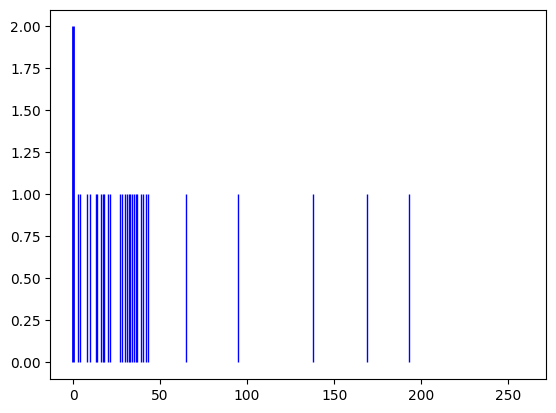

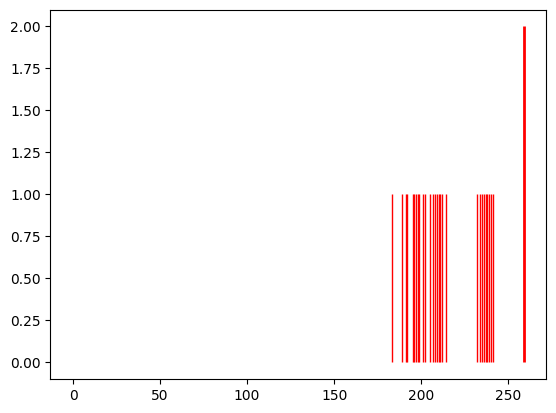

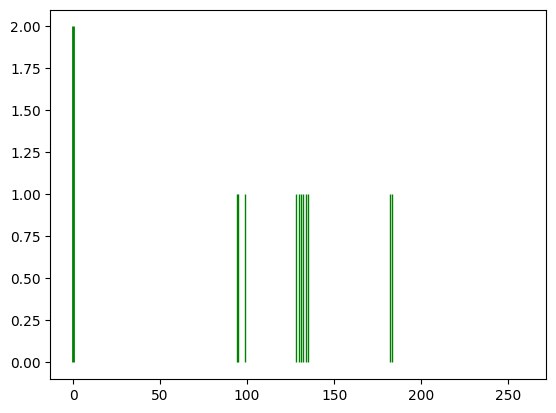

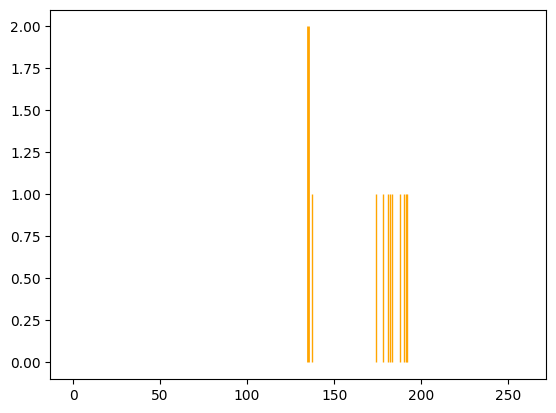

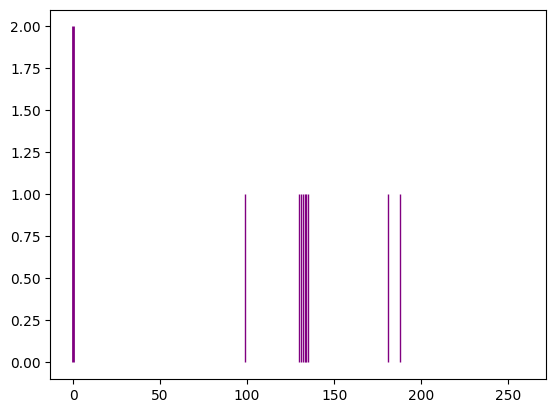

...

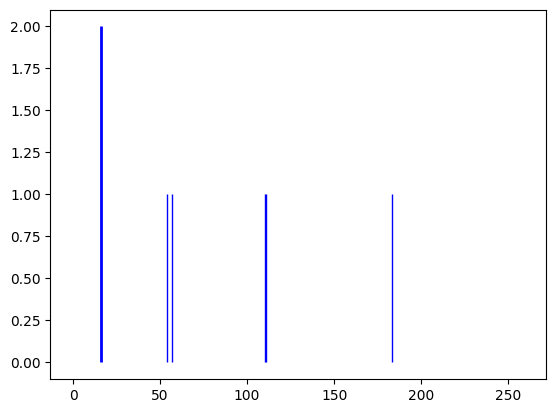

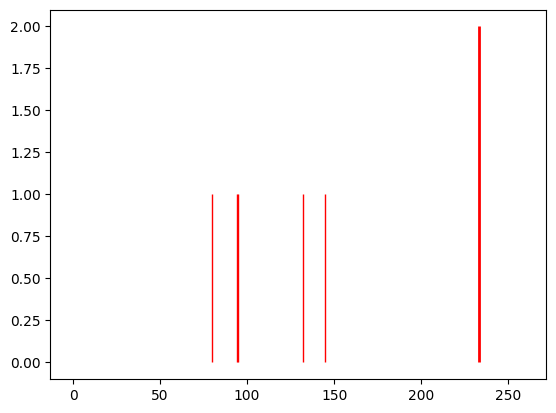

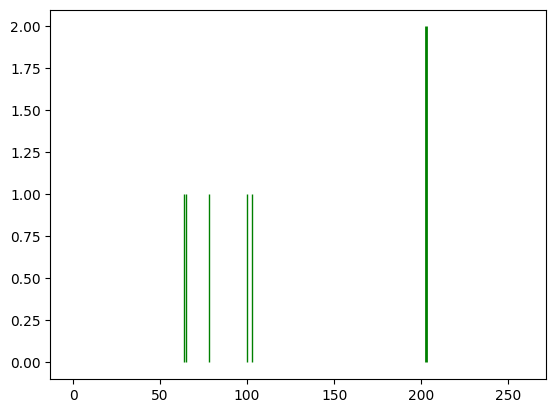

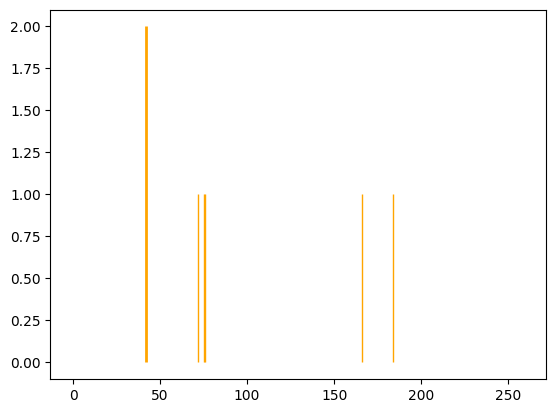

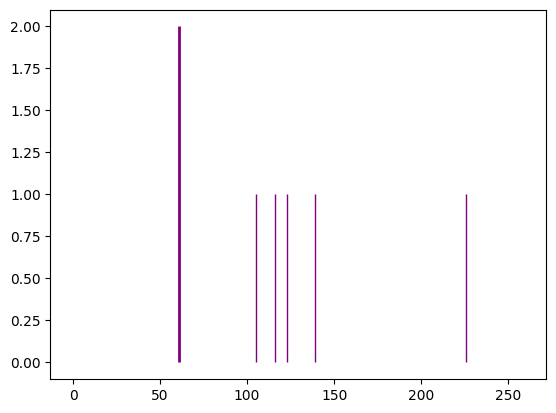

Spectrum num=2331, size=483, matched=153, frac=0.3167701863354037
Spectrum num=2331, size=483, matched=90, frac=0.18633540372670807


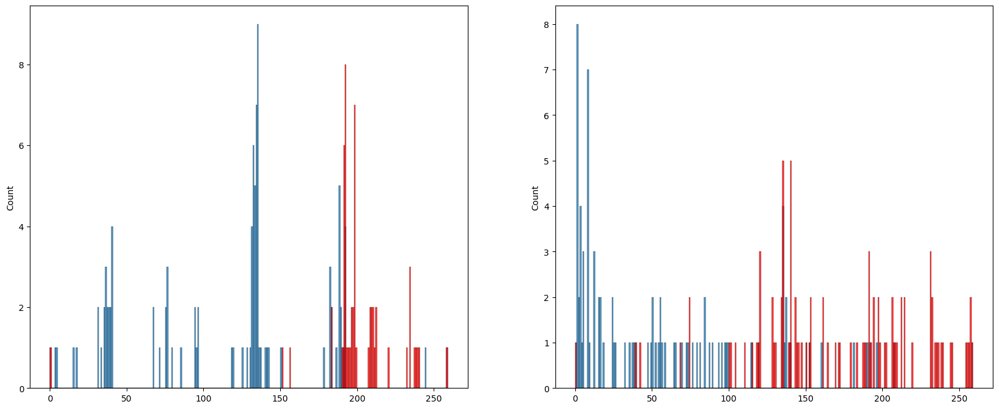

<Figure size 1200x800 with 0 Axes>

{259, 133, 264, 9, 267, 404, 278, 23, 287, 288, 36, 421, 295, 40, 436, 181, 438, 59, 61, 62, 79, 340, 87, 347, 93, 95, 482, 229, 122}
{0, 3, 4, 5, 7, 11, 12, 268, 21, 22, 29, 414, 31, 162, 174, 52, 194, 70, 200, 73, 78, 208, 339, 88, 91, 120, 94, 96, 99, 235, 108, 117, 248, 126}
{1, 2, 132, 262, 6, 8, 13, 14, 15, 16, 144, 17, 19, 20, 147, 141, 24, 25, 38, 42, 172, 47, 50, 54, 55, 67, 71, 466, 85}
{224, 427, 396, 80, 401, 242, 311, 280, 313, 187, 127}
{64, 297, 75, 49, 82, 338, 27, 124}
{192, 418, 364, 430, 148, 377, 218}
{128, 373, 118, 410, 219, 255}
{293, 165, 234, 76, 238, 217}
{32, 101, 137, 460, 210, 28}
{34, 357, 230, 143, 336, 477}
{386, 131, 134, 326, 72, 286}
{35, 307, 212, 245, 180, 58, 125, 30}
{384, 44, 173, 182, 56}
{416, 100, 232, 335, 213}
{197, 111, 240, 51, 351}
{331, 53, 86, 155, 60}
{448, 423, 236, 18, 346}
{294, 392, 369, 151, 221}
{66, 323, 425, 43, 113, 154}
{452, 102, 170, 206, 444}


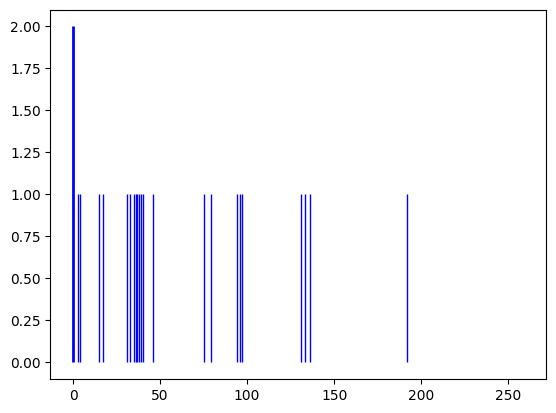

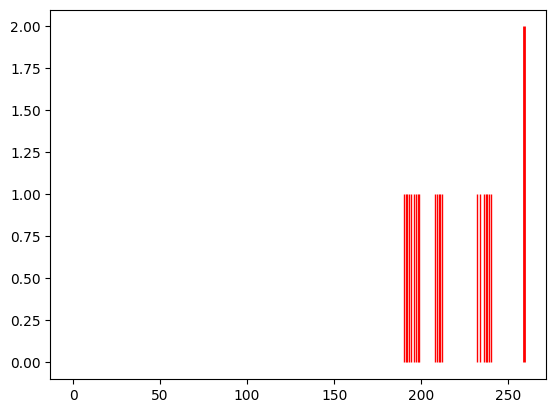

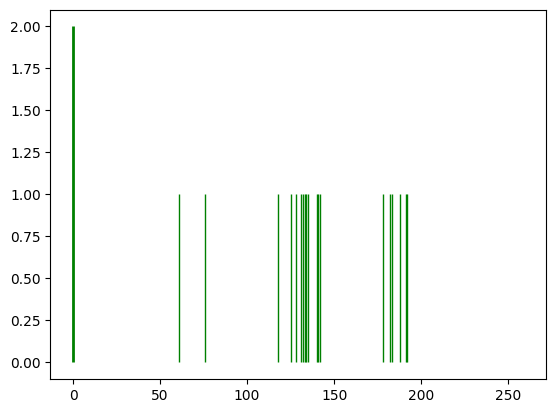

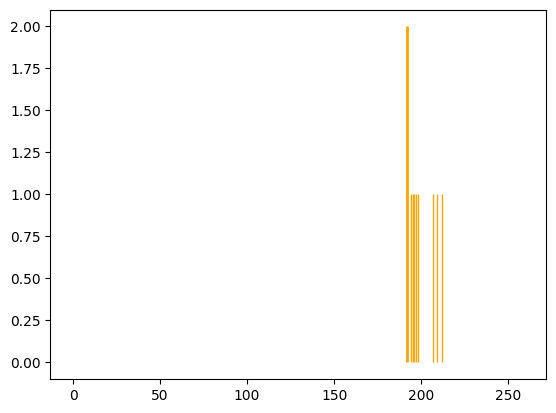

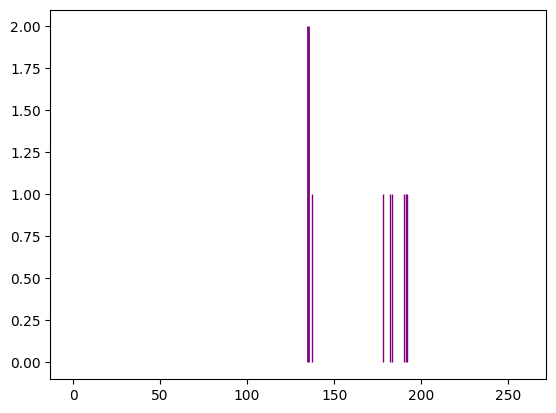

...

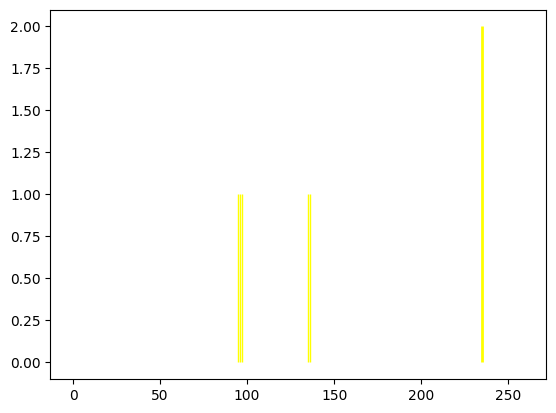

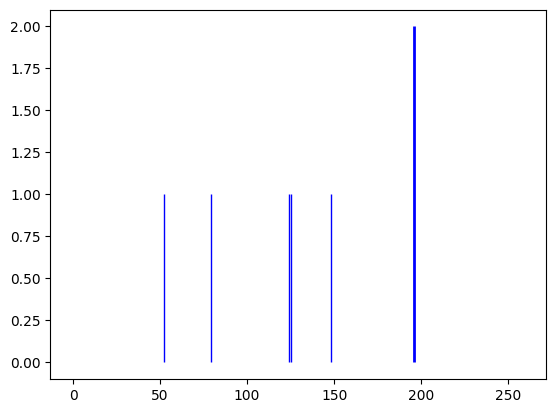

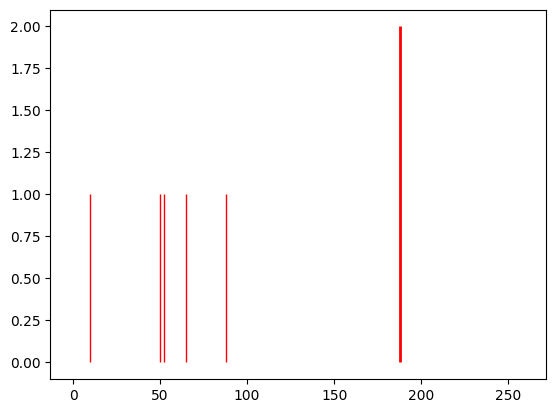

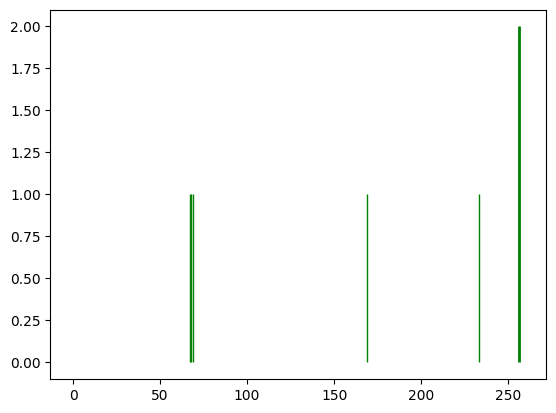

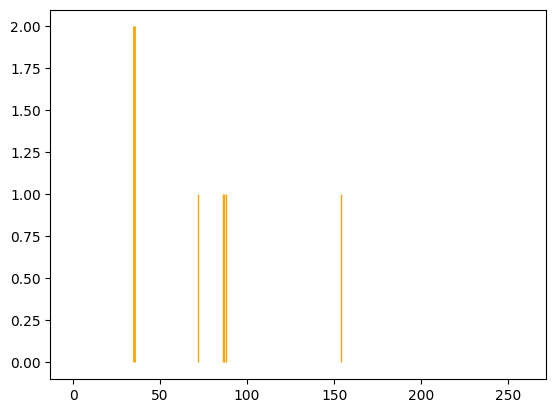

Spectrum num=2332, size=483, matched=146, frac=0.3022774327122153
Spectrum num=2332, size=483, matched=79, frac=0.16356107660455488


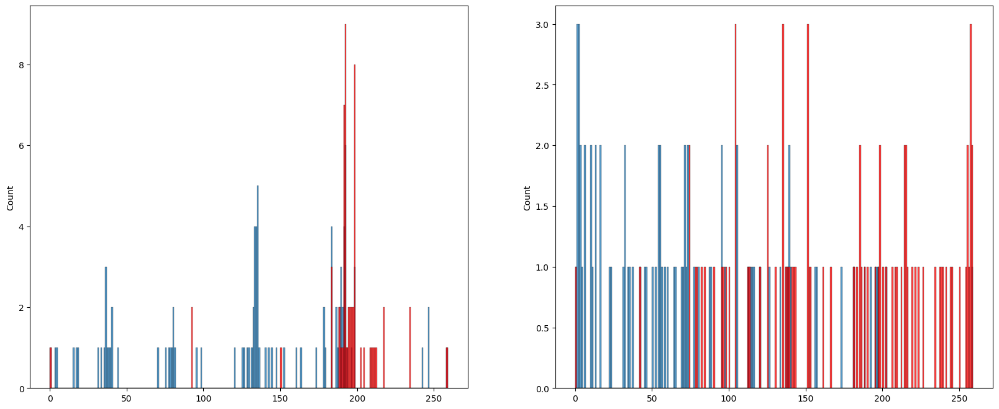

<Figure size 1200x800 with 0 Axes>

{2, 3, 130, 5, 388, 8, 139, 15, 271, 17, 143, 19, 21, 26, 282, 28, 29, 31, 35, 294, 167, 43, 300, 308, 54, 55, 65, 67, 68, 69, 70, 71, 200, 73, 76, 86, 87, 88, 89, 93, 94, 357, 358, 111, 112, 381}
{0, 1, 4, 134, 11, 12, 18, 22, 286, 161, 34, 38, 45, 48, 178, 56, 58, 66, 202, 78, 83, 84, 217, 92, 228, 113, 123}
{36, 292, 455, 104, 74, 10, 14, 366, 20, 62}
{320, 359, 107, 434, 402, 406, 376, 156}
{193, 105, 241, 242, 274, 280, 284}
{256, 133, 201, 438, 214, 223}
{257, 227, 230, 393, 114, 243}
{135, 41, 203, 49, 118, 222}
{192, 163, 199, 171, 302, 218}
{423, 360, 330, 336, 211}
{225, 293, 404, 380, 414}
{389, 390, 103, 267, 339}
{428, 247, 216, 220, 415}
{232, 458, 42, 110, 303, 115, 23}
{384, 229, 13, 144, 306}
{168, 169, 369, 116, 473}
{426, 364, 268, 180, 316}
{452, 391, 234, 399, 85}
{265, 427, 213, 437, 126}
{149, 439, 59, 63, 447}
{99, 39, 170, 344, 157}
{37, 237, 335, 122, 27}
{7, 44, 80, 25, 475}
{194, 395, 183, 379, 412}


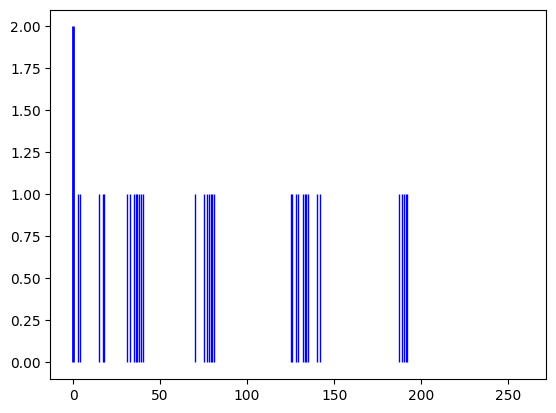

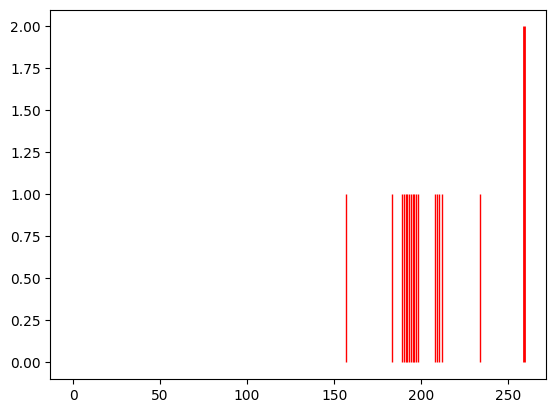

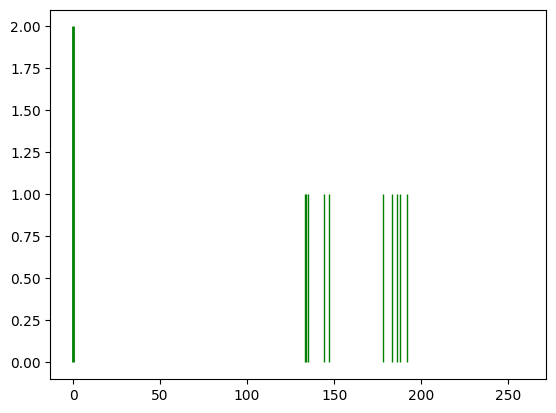

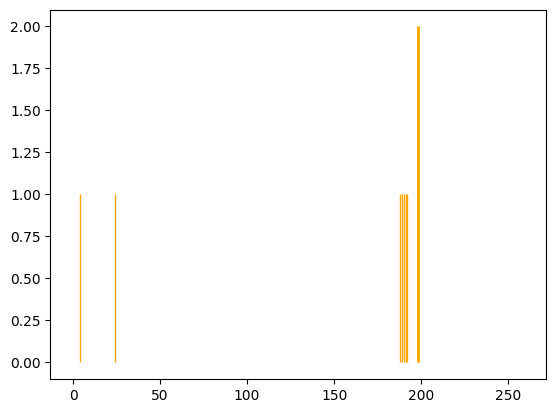

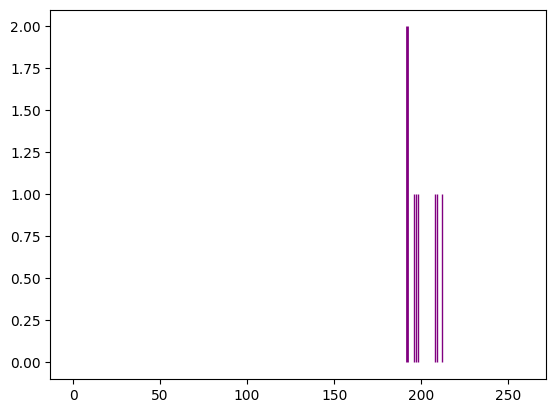

...

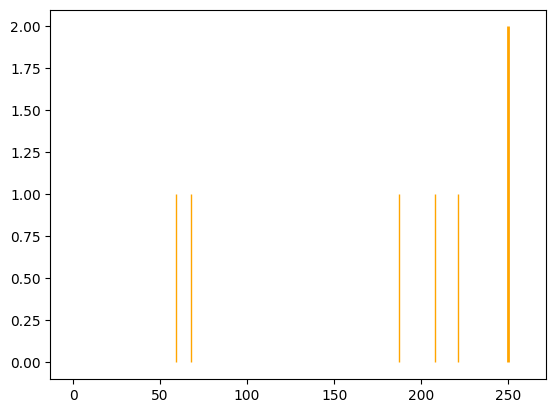

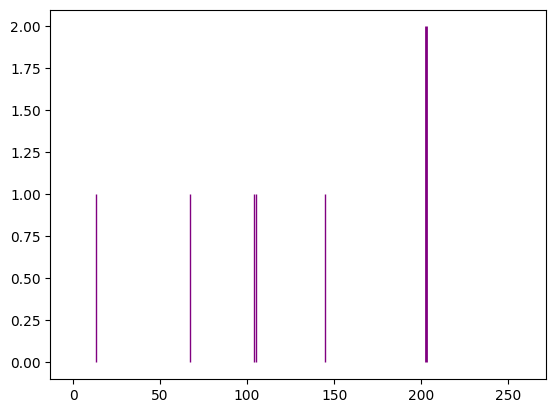

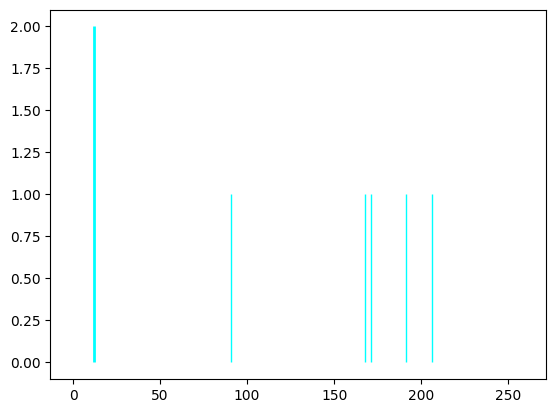

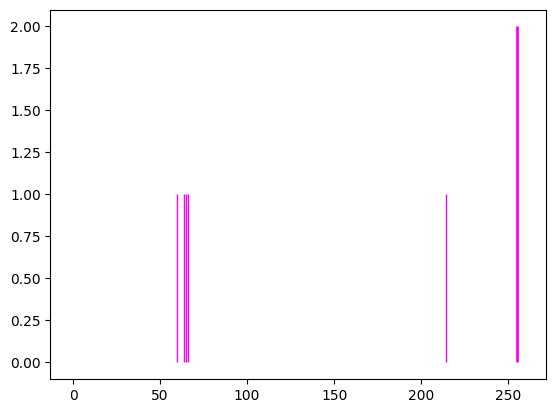

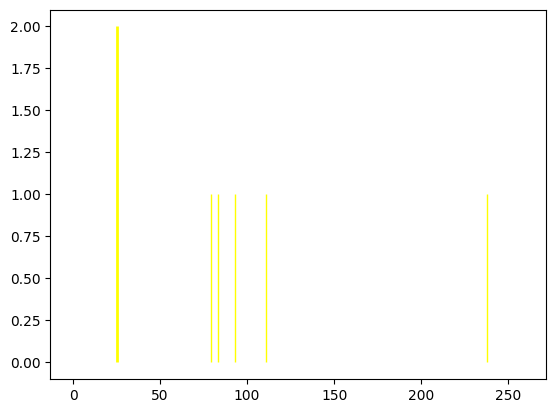

Spectrum num=2340, size=483, matched=140, frac=0.2898550724637681
Spectrum num=2340, size=483, matched=85, frac=0.17598343685300208


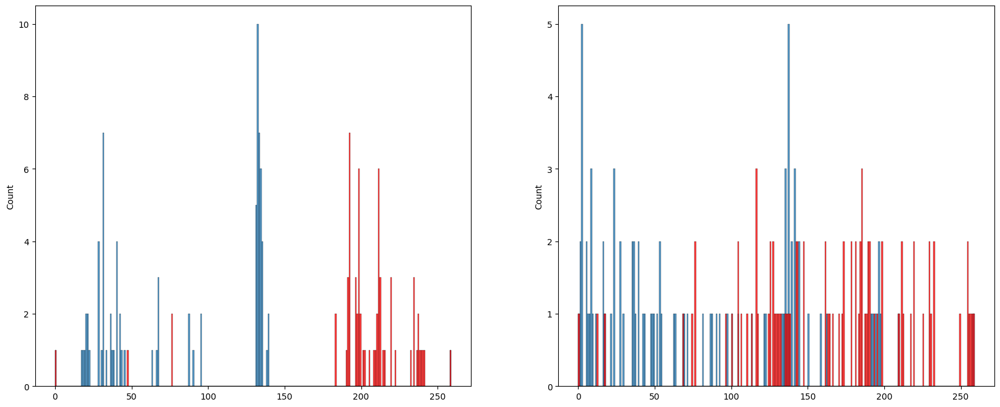

<Figure size 1200x800 with 0 Axes>

{130, 3, 7, 9, 12, 141, 398, 142, 270, 15, 18, 404, 21, 22, 150, 24, 284, 29, 32, 421, 166, 39, 40, 431, 439, 58, 315, 68, 69, 199, 75, 333, 212, 344, 475, 94, 223, 357, 102, 231, 248}
{0, 385, 2, 1, 4, 5, 6, 10, 13, 16, 20, 25, 26, 31, 288, 35, 37, 425, 42, 45, 46, 52, 59, 66, 322, 73, 88, 217, 218, 95, 96, 104, 251, 123}
{8, 393, 11, 272, 17, 280, 34, 420, 36, 173, 55, 62, 63, 74, 80, 90, 106, 113, 369, 119, 255}
{170, 429, 271, 144, 147, 86, 187, 92}
{192, 197, 262, 328, 43, 204, 302, 183}
{64, 133, 296, 298, 91, 285}
{97, 295, 426, 44, 110, 50}
{384, 196, 370, 277, 152, 189}
{98, 423, 203, 306, 84, 85}
{289, 481, 237, 112, 115, 347}
{65, 101, 462, 54, 247}
{228, 146, 405, 182, 415}
{99, 355, 71, 138, 434, 121}
{266, 175, 111, 348, 157}
{140, 174, 49, 154, 124, 254}
{256, 465, 313, 316, 191}
{363, 53, 346, 125, 286}
{332, 109, 145, 407, 349}
{132, 422, 136, 366, 181, 89}
{454, 464, 470, 215, 443}
{353, 227, 134, 234, 268}
{388, 394, 76, 30, 127}


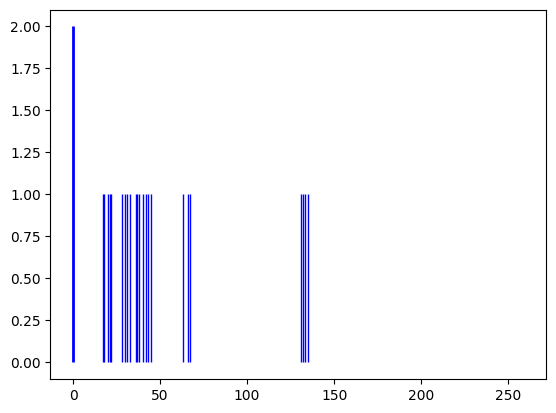

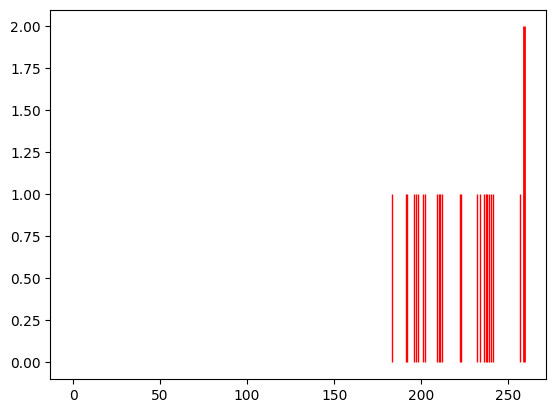

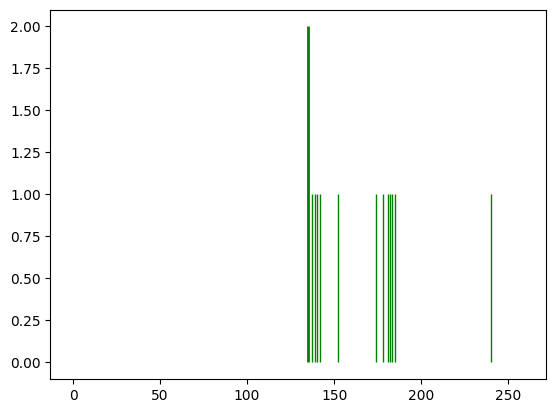

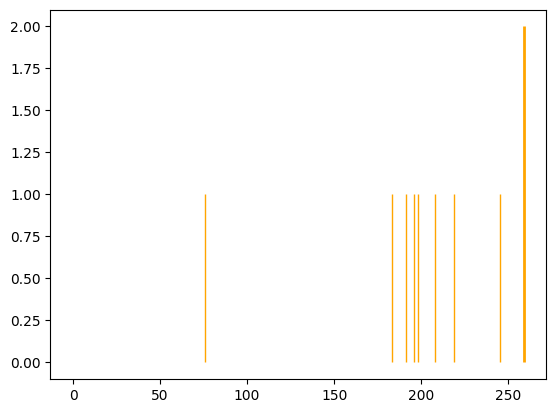

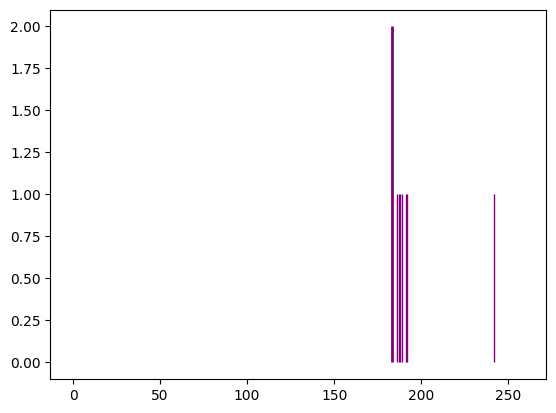

...

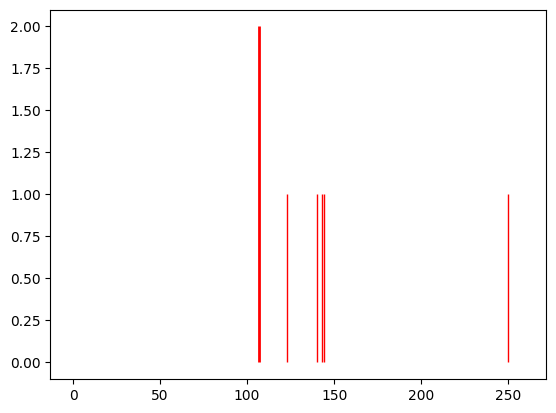

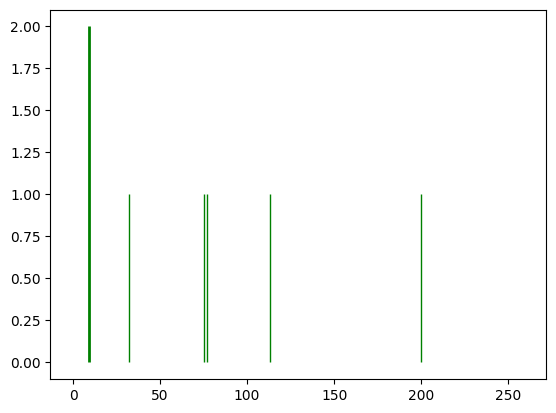

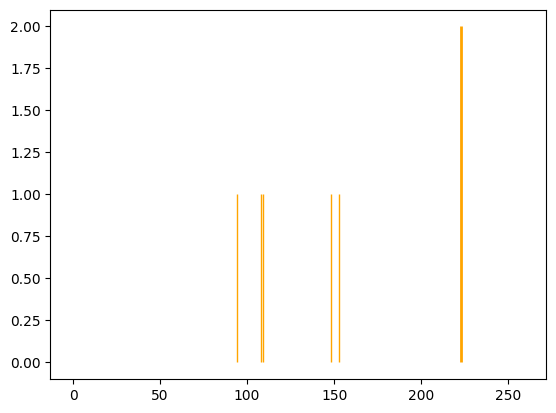

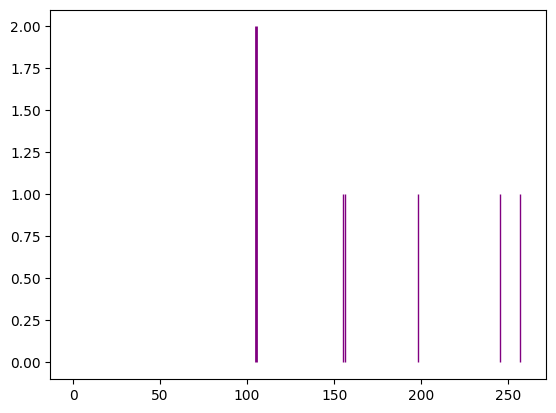

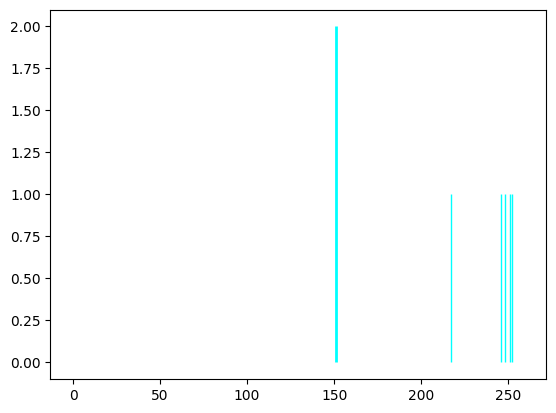

Spectrum num=2345, size=483, matched=174, frac=0.36024844720496896
Spectrum num=2345, size=483, matched=81, frac=0.16770186335403728


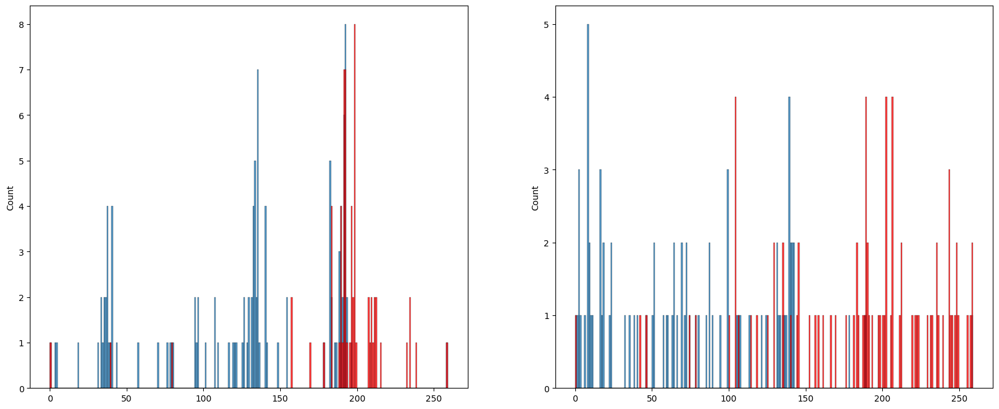

<Figure size 1200x800 with 0 Axes>

{258, 267, 15, 16, 405, 278, 154, 39, 41, 44, 46, 47, 304, 306, 184, 59, 67, 73, 74, 87, 91, 221, 226, 358, 107, 111, 243, 118, 382}
{1, 2, 259, 4, 8, 12, 14, 143, 18, 19, 277, 21, 153, 29, 30, 31, 159, 292, 300, 45, 52, 55, 322, 66, 199, 72, 201, 75, 80, 85, 92, 95, 109, 374}
{32, 65, 34, 36, 5, 6, 38, 146, 20, 62, 90, 28, 126}
{224, 71, 10, 79, 51, 183, 26, 223}
{193, 355, 104, 363, 463, 433, 122, 286}
{162, 227, 102, 40, 202, 434, 84, 349, 94, 63}
{325, 77, 175, 272, 115, 182, 152, 318}
{288, 260, 69, 105, 244, 61}
{388, 473, 270, 83, 249, 284, 445}
{7, 205, 23, 117, 22, 215, 24}
{384, 11, 112, 468, 248, 123}
{33, 449, 137, 208, 381, 446}
{450, 386, 145, 113, 212}
{452, 454, 329, 457, 238, 279, 414}
{482, 387, 298, 17, 120}
{232, 299, 427, 241, 442}
{134, 359, 432, 82, 27}
{290, 271, 144, 156, 413}
{210, 213, 406, 121, 60}
{103, 136, 464, 176, 371}
{207, 50, 341, 25, 447}


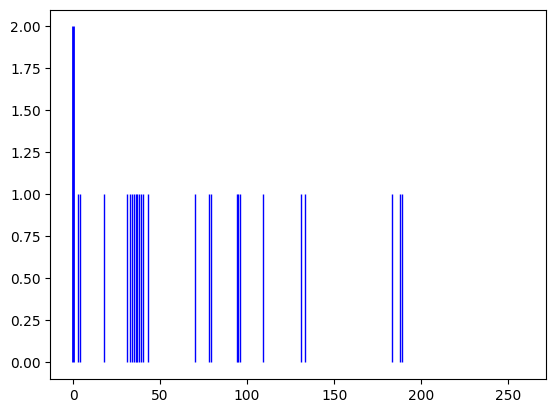

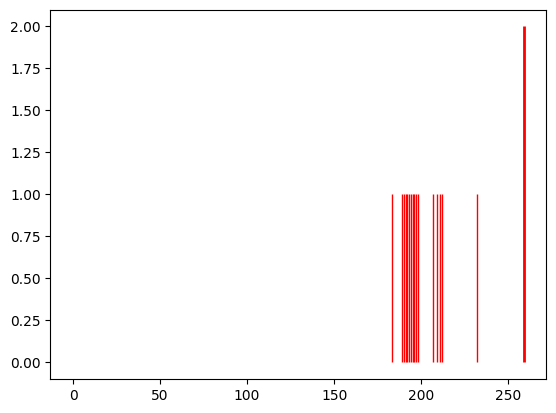

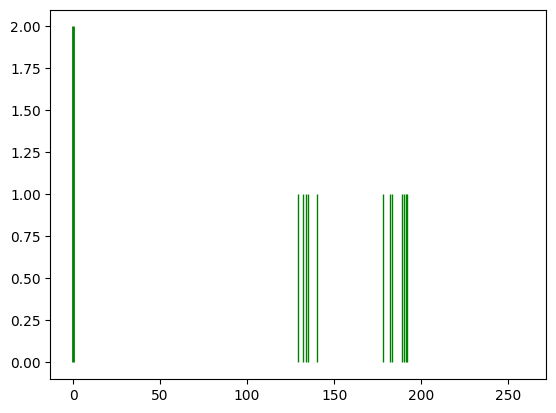

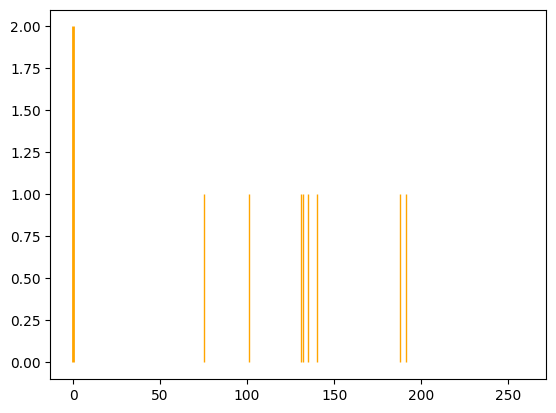

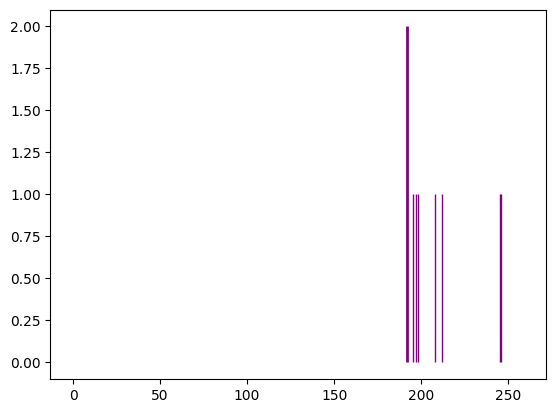

...

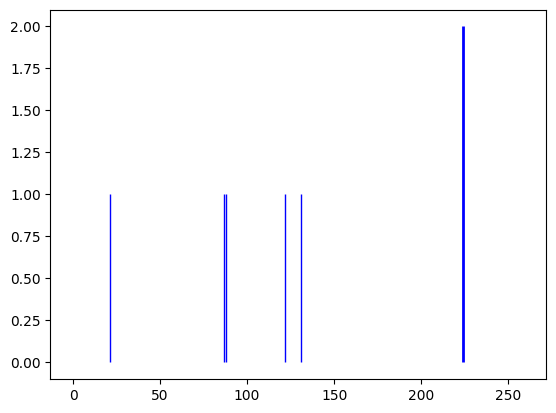

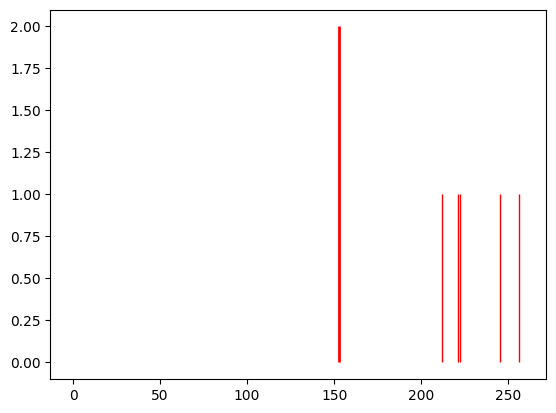

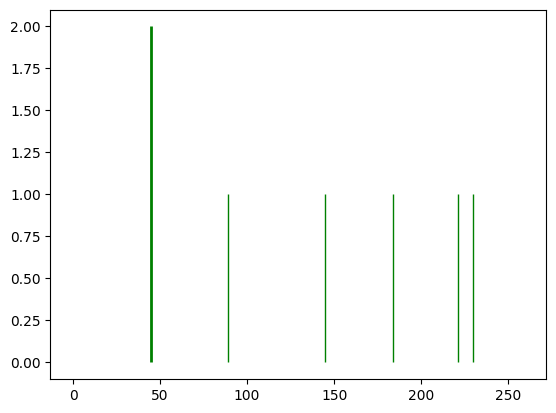

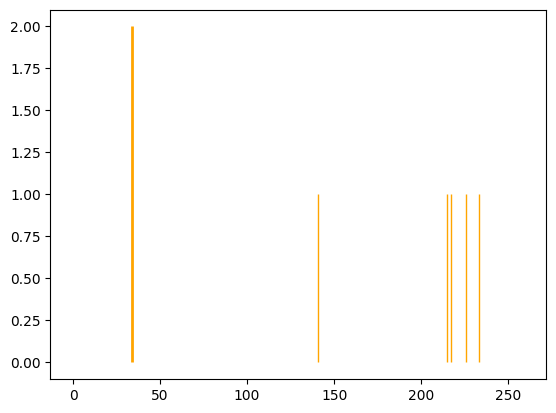

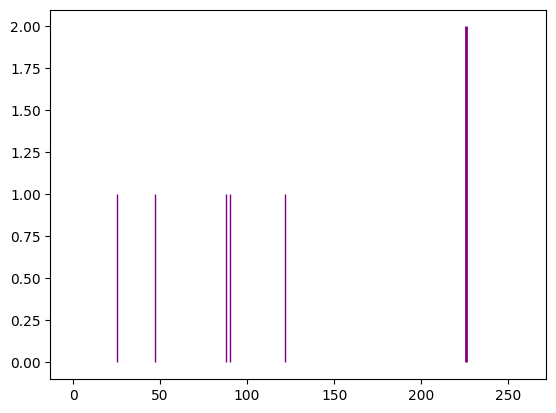

Spectrum num=2385, size=185, matched=84, frac=0.4540540540540541
Spectrum num=2385, size=185, matched=30, frac=0.16216216216216217


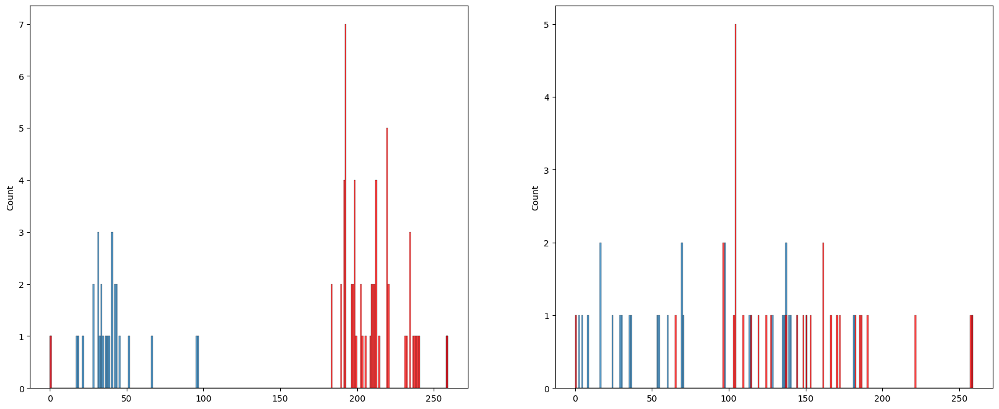

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 133, 6, 7, 8, 137, 140, 14, 15, 16, 18, 19, 148, 21, 22, 23, 25, 26, 28, 161, 39, 40, 41, 169, 47, 56, 59, 60, 71, 72, 74, 75, 76, 88, 90, 102, 104, 109, 116}
{32, 97, 3, 101, 166, 136, 9, 12, 45, 13, 44, 146, 51, 84, 52, 119, 151}
{130, 66, 5, 103, 11, 80, 17, 63, 24, 57, 122, 124, 93, 184, 95}
{164, 38, 48, 62, 92, 94}
{96, 175, 144, 177, 114, 182, 91, 30}


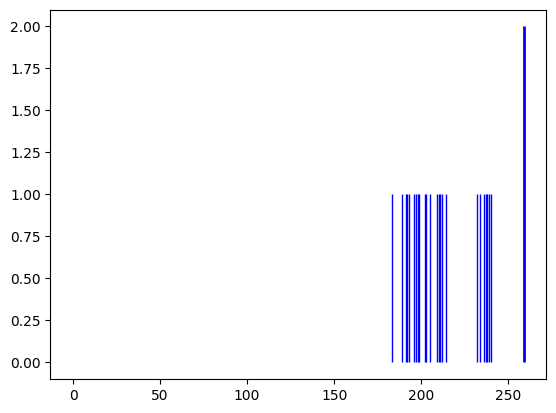

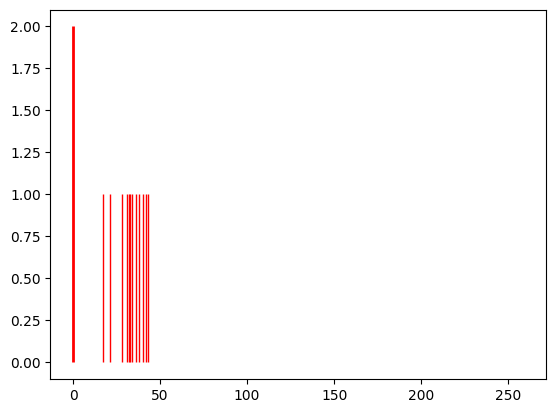

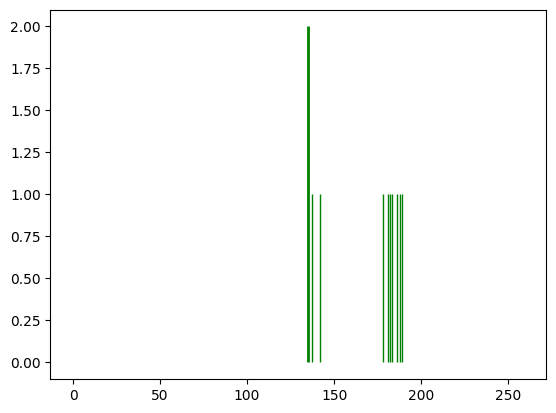

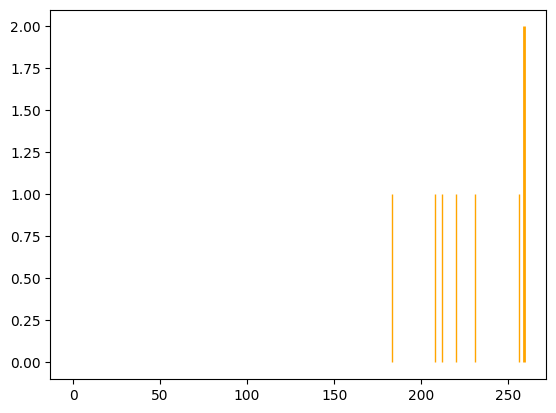

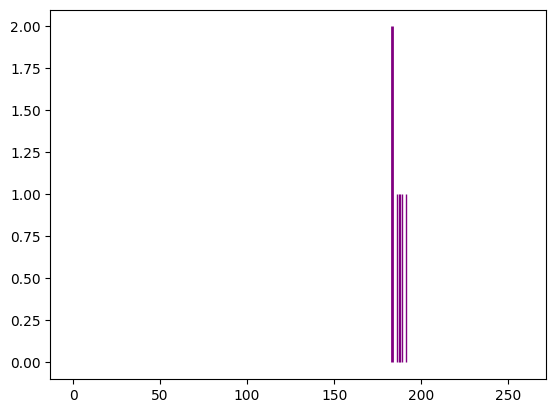

Spectrum num=2408, size=98, matched=20, frac=0.20408163265306123
Spectrum num=2408, size=98, matched=17, frac=0.17346938775510204


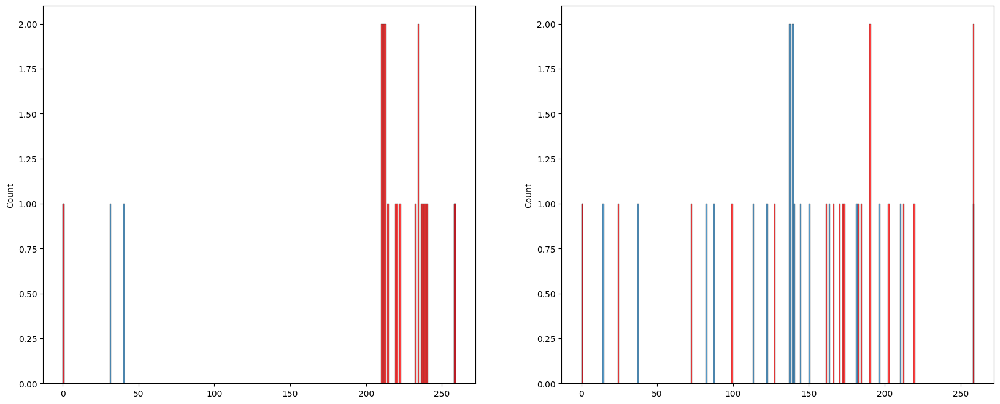

<Figure size 1200x800 with 0 Axes>

{0, 33, 5, 6, 7, 8, 11, 12, 14, 16, 17, 22, 23, 28}


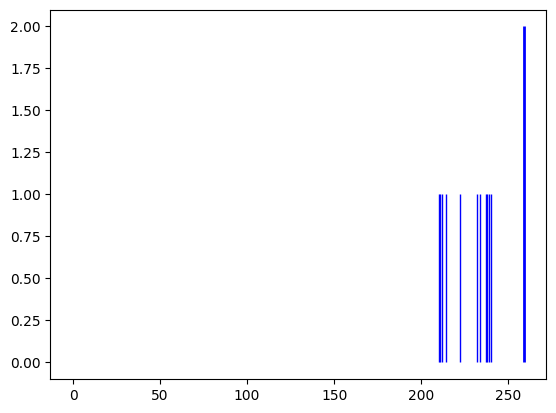

Spectrum num=2417, size=115, matched=32, frac=0.2782608695652174
Spectrum num=2417, size=115, matched=24, frac=0.20869565217391303


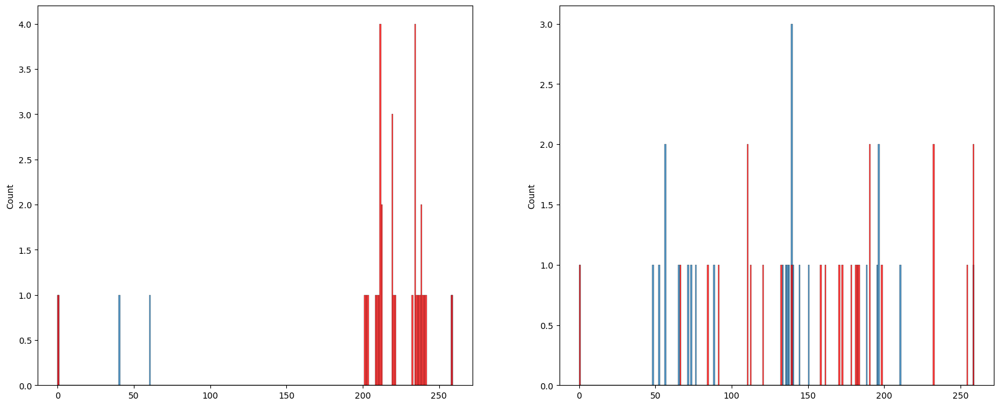

<Figure size 1200x800 with 0 Axes>

{0, 2, 3, 4, 5, 7, 9, 12, 13, 14, 19, 30, 35, 36, 39, 46, 51, 62, 72, 75, 76, 80, 102}
{34, 100, 8, 40, 10, 41, 11, 109, 17, 113, 85, 54, 22, 57, 26, 31, 29, 63}
{65, 98, 20, 56, 60}
{74, 43, 45, 53, 55}
{64, 69, 108, 25, 93}


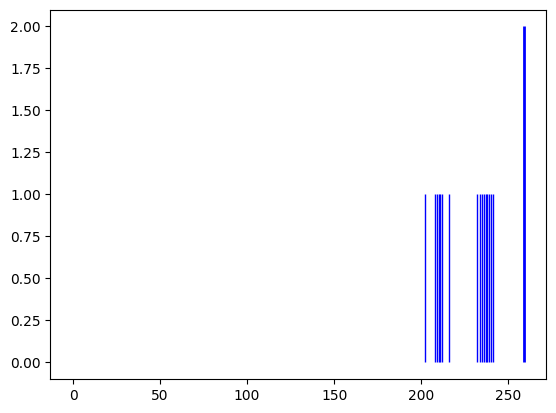

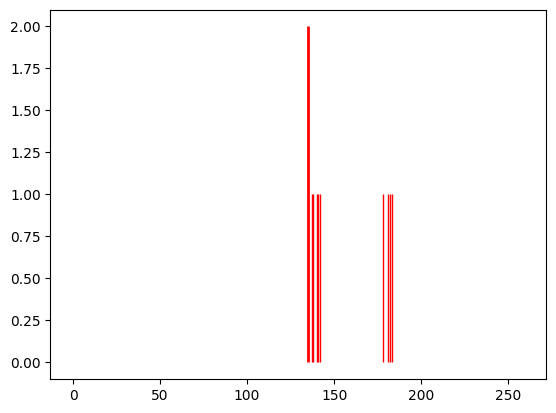

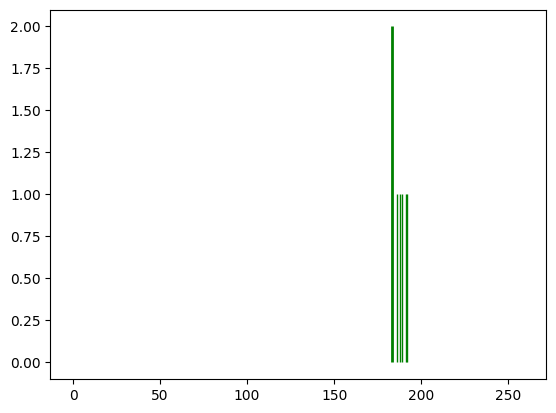

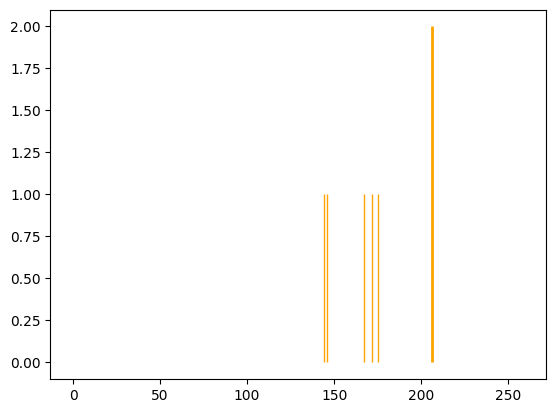

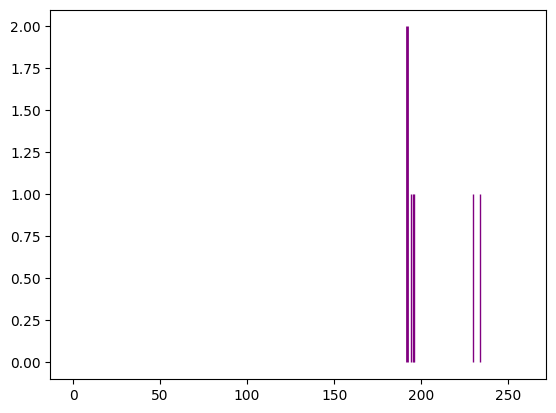

Spectrum num=2419, size=153, matched=42, frac=0.27450980392156865
Spectrum num=2419, size=153, matched=34, frac=0.2222222222222222


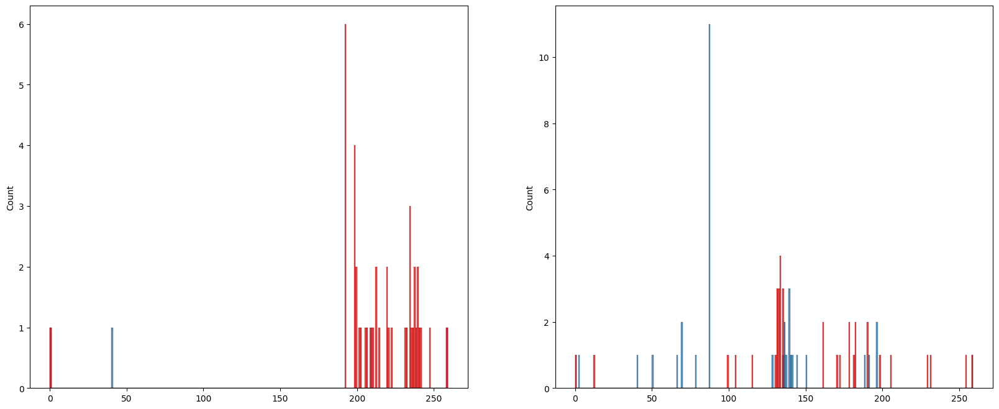

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 4, 5, 6, 9, 10, 16, 146, 20, 22, 23, 36, 37, 47, 53, 60, 61, 63, 67, 78, 107, 108, 109, 113, 118, 125}
{65, 71, 72, 41, 75, 44, 141, 46, 144, 49, 147, 117, 149, 62, 57, 28, 152, 94}
{38, 135, 8, 105, 138, 11, 12, 13, 18, 86, 24, 89, 58, 27}
{121, 48, 114, 116, 150, 25}
{99, 136, 142, 145, 82, 52, 148, 126}
{32, 43, 112, 50, 119, 59}


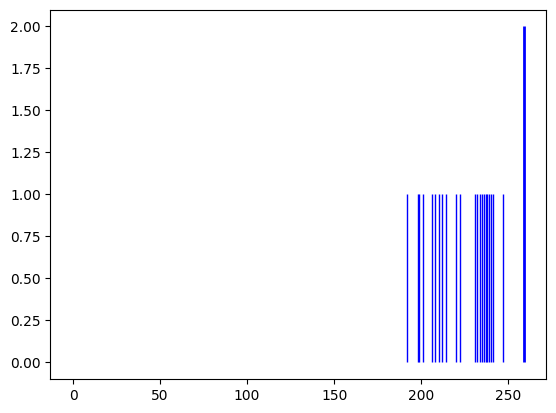

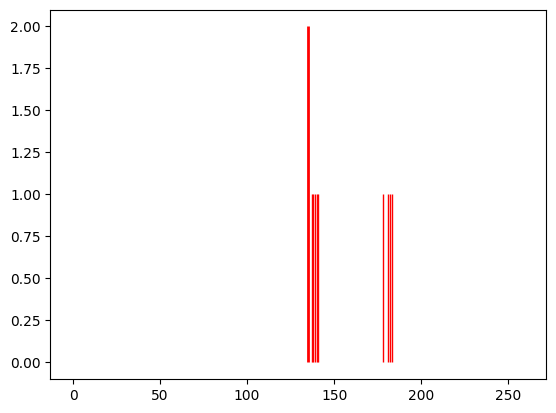

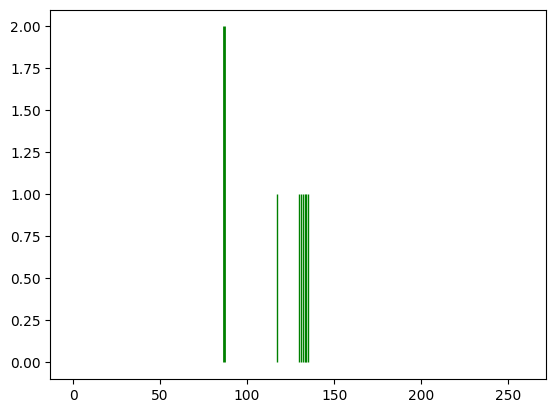

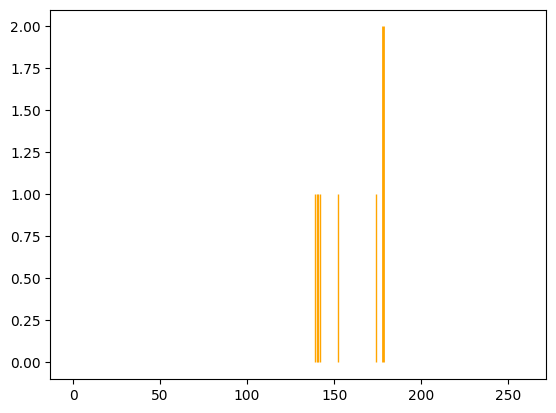

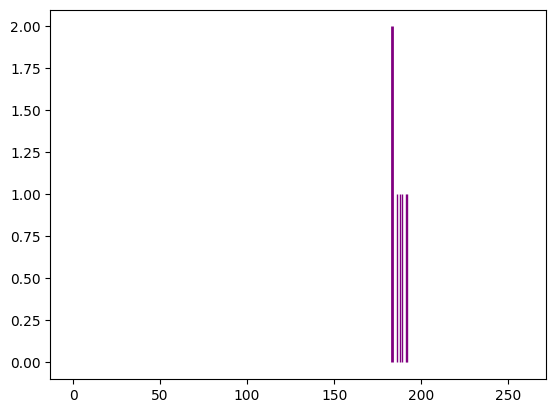

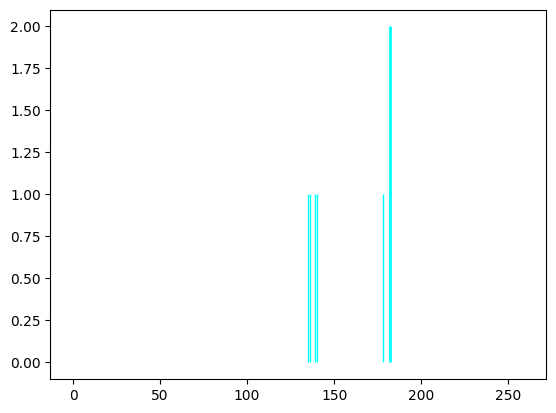

Spectrum num=2431, size=161, matched=83, frac=0.515527950310559
Spectrum num=2431, size=161, matched=35, frac=0.21739130434782608


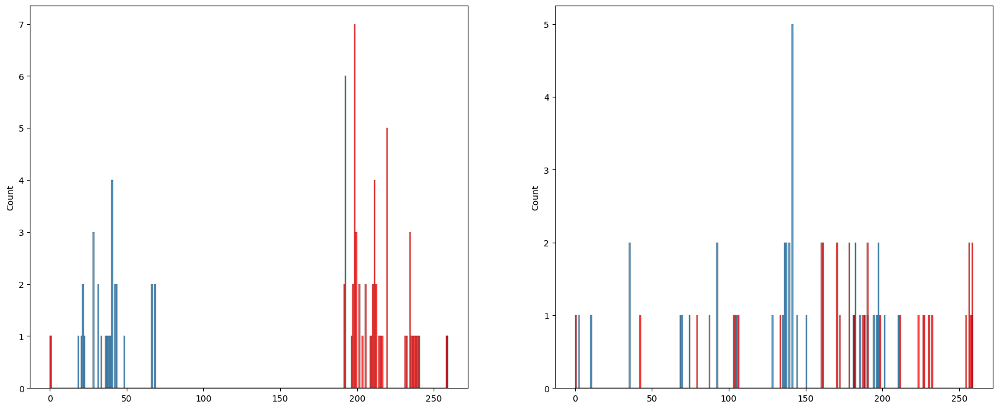

<Figure size 1200x800 with 0 Axes>

{0, 2, 3, 4, 6, 7, 9, 10, 11, 139, 143, 16, 144, 18, 19, 20, 21, 22, 23, 17, 26, 28, 29, 30, 31, 32, 39, 41, 44, 56, 60, 63, 69, 74, 75, 97, 110, 121, 122, 123}
{1, 131, 8, 12, 15, 147, 35, 40, 49, 59, 61, 67, 80, 84, 85, 90, 94, 103, 106, 107, 109, 125}
{33, 153, 68, 72, 13, 46, 14, 45, 116, 52, 53, 87, 24, 25, 148, 27, 93}
{101, 42, 115, 149, 151, 88, 154, 156, 157}
{37, 71, 136, 108, 48}


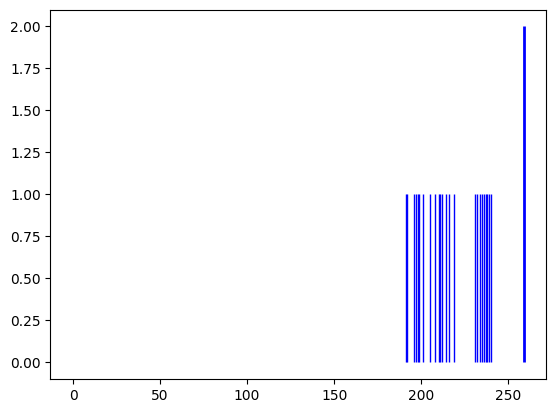

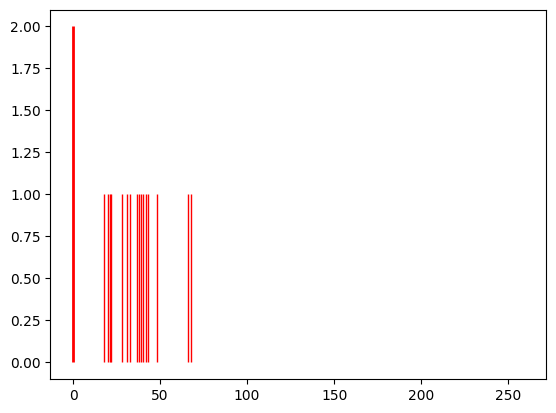

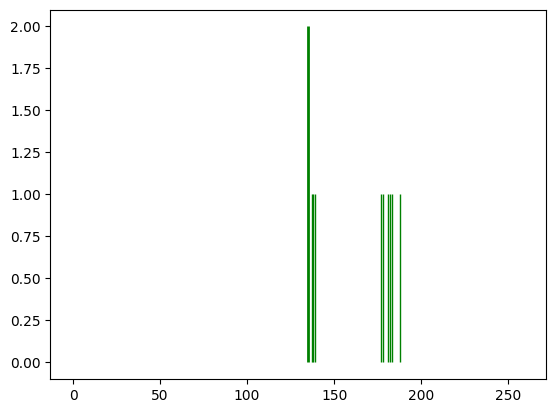

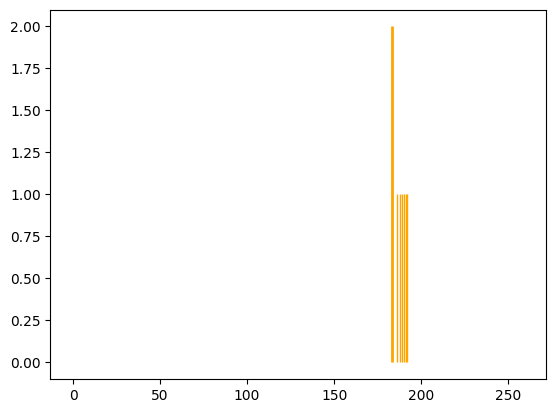

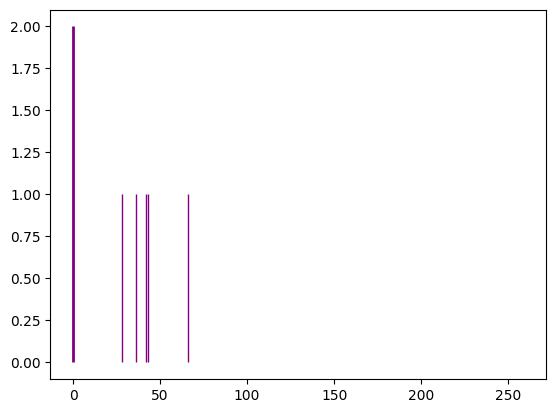

Spectrum num=2437, size=160, matched=48, frac=0.3
Spectrum num=2437, size=160, matched=39, frac=0.24375


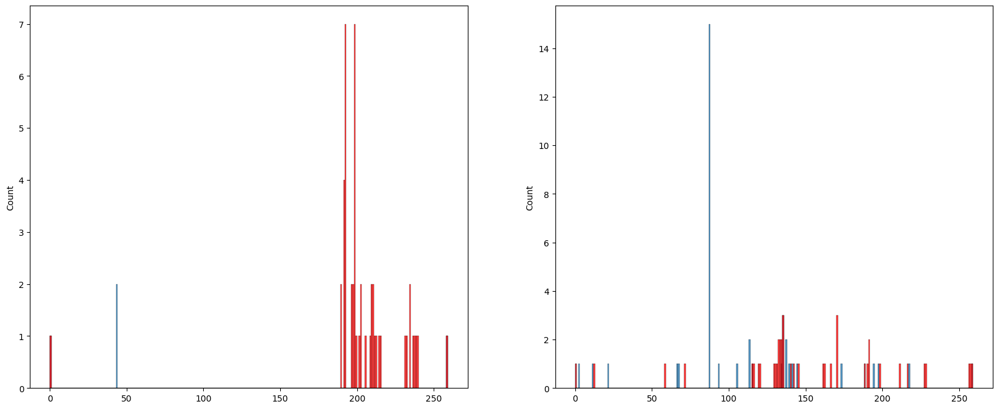

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 5, 7, 9, 10, 137, 12, 15, 18, 19, 20, 21, 24, 25, 35, 36, 42, 54, 55, 60, 62, 64, 66, 69, 72, 80, 83, 84, 86, 94, 95, 101, 104, 112, 125}
{4, 6, 139, 13, 14, 16, 17, 23, 27, 29, 31, 37, 45, 51, 52, 53, 58, 65, 67, 73, 79, 93, 99, 110, 111, 116, 127}
{34, 90, 38, 71, 41, 11, 44, 77, 50, 85, 26, 28}
{68, 138, 109, 78, 117, 152, 154, 155, 157, 126}


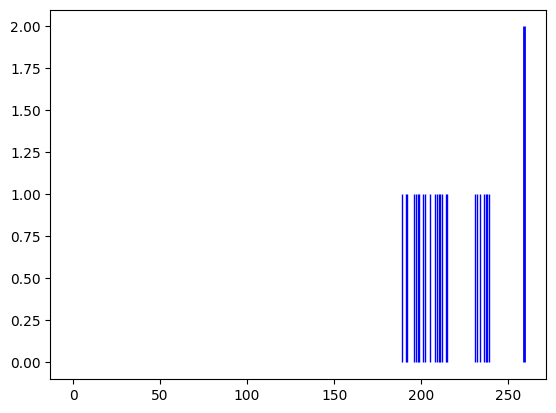

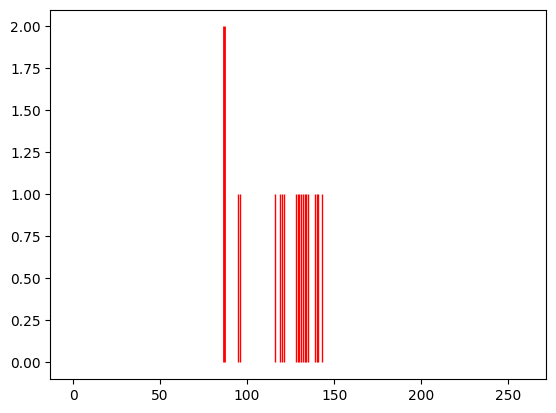

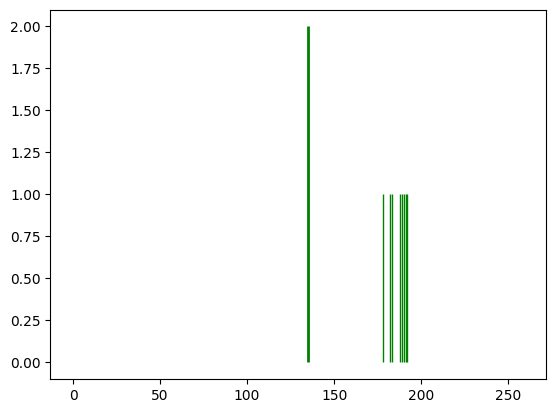

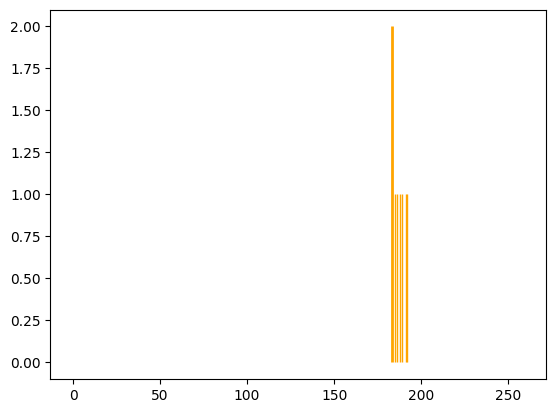

Spectrum num=2439, size=113, matched=19, frac=0.168141592920354
Spectrum num=2439, size=113, matched=26, frac=0.23008849557522124


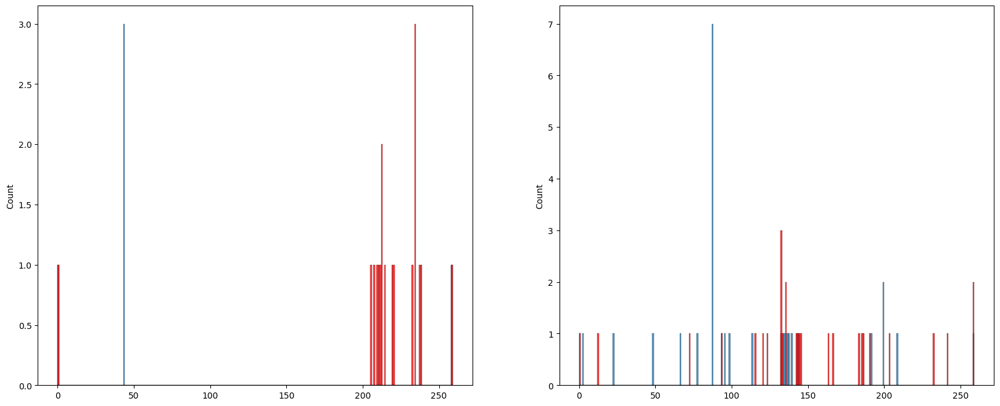

<Figure size 1200x800 with 0 Axes>

{0, 1, 3, 7, 8, 9, 11, 12, 20, 24, 29, 30, 32, 44, 45, 60, 68, 91, 95}
{66, 100, 13, 49, 18, 51, 26}
{35, 36, 71, 22, 54}


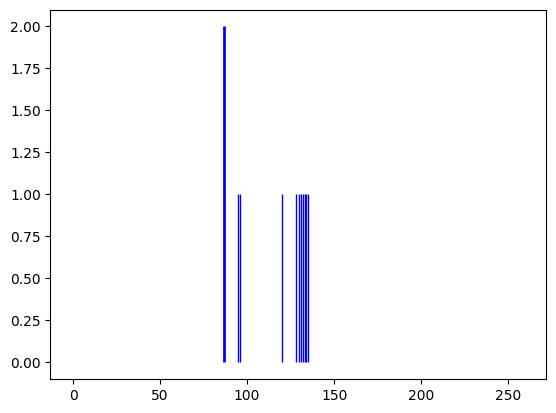

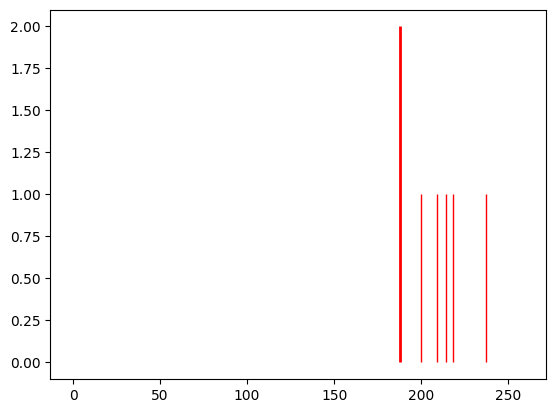

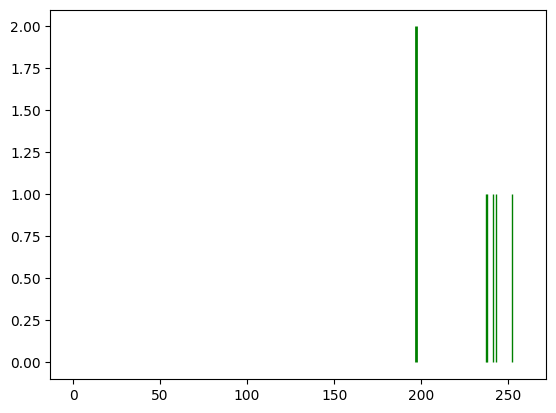

Spectrum num=2450, size=196, matched=93, frac=0.4744897959183674
Spectrum num=2450, size=196, matched=41, frac=0.20918367346938777


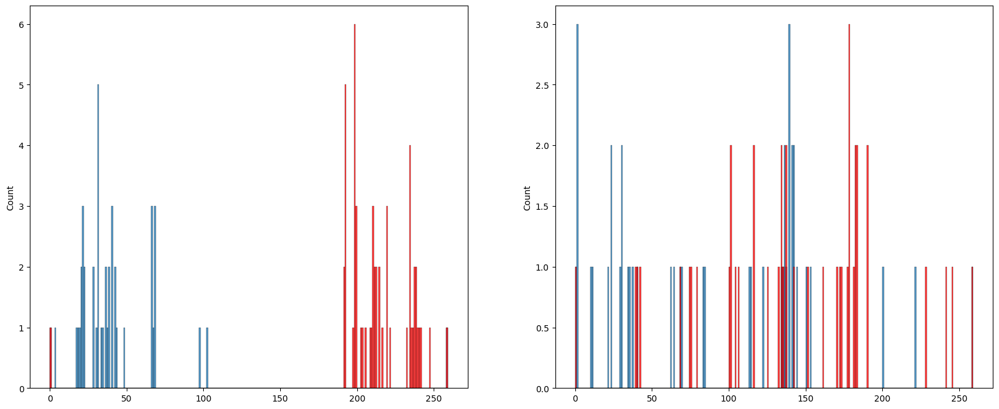

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 133, 12, 134, 14, 15, 16, 145, 21, 22, 24, 26, 28, 29, 31, 162, 36, 37, 42, 43, 57, 60, 189, 61, 64, 195, 68, 80, 113, 114, 118, 124}
{0, 130, 11, 13, 19, 23, 153, 155, 157, 160, 35, 41, 44, 45, 49, 52, 53, 182, 56, 186, 63, 75, 77, 79, 87, 92, 93, 95, 96, 104, 105, 111, 115, 122}
{128, 97, 33, 163, 100, 167, 74, 51, 181}
{40, 123, 112, 50, 83, 20, 148, 59, 62, 127}
{32, 71, 175, 146, 150, 30}
{70, 72, 47, 88, 25}
{66, 78, 178, 121, 125}


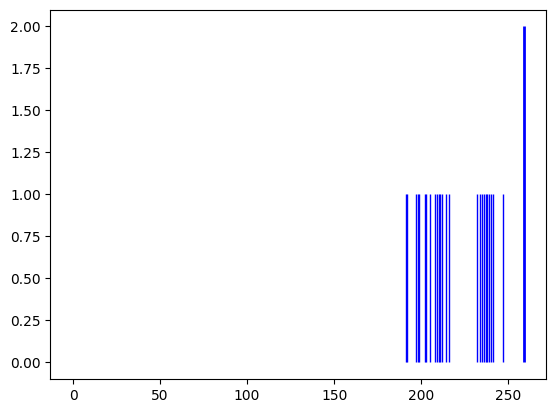

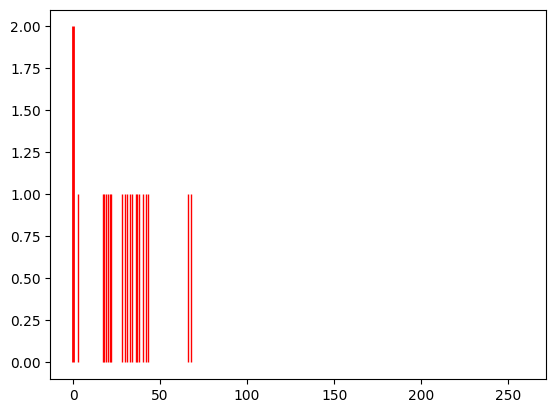

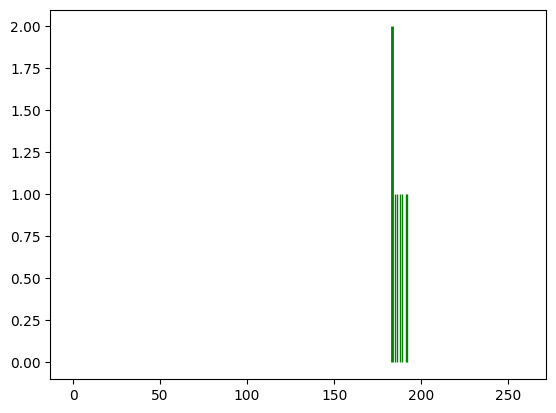

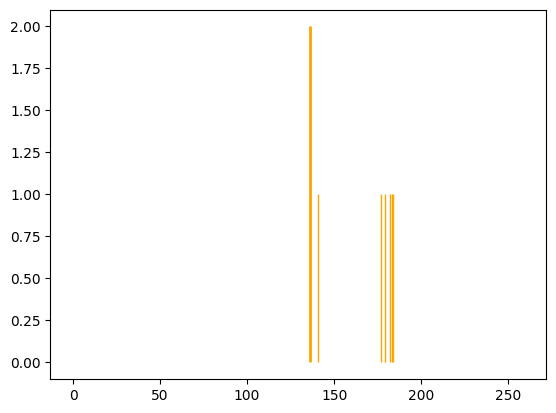

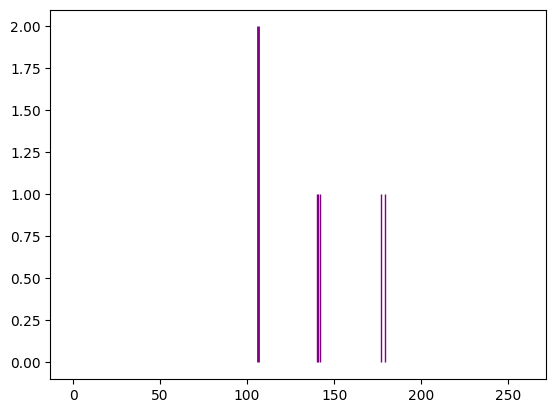

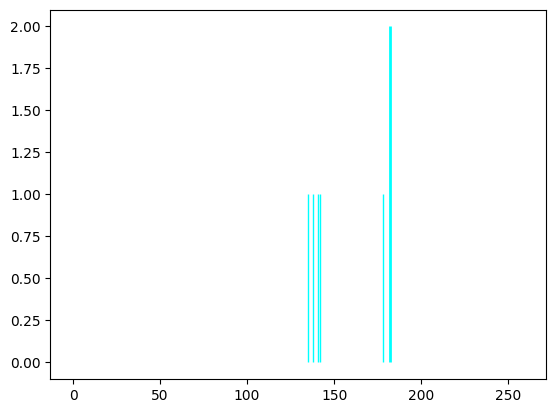

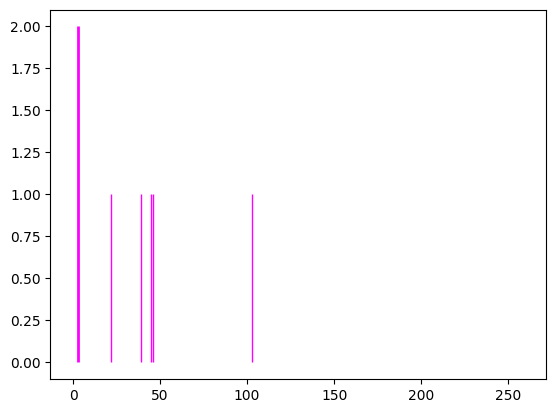

Spectrum num=2458, size=126, matched=47, frac=0.373015873015873
Spectrum num=2458, size=126, matched=18, frac=0.14285714285714285


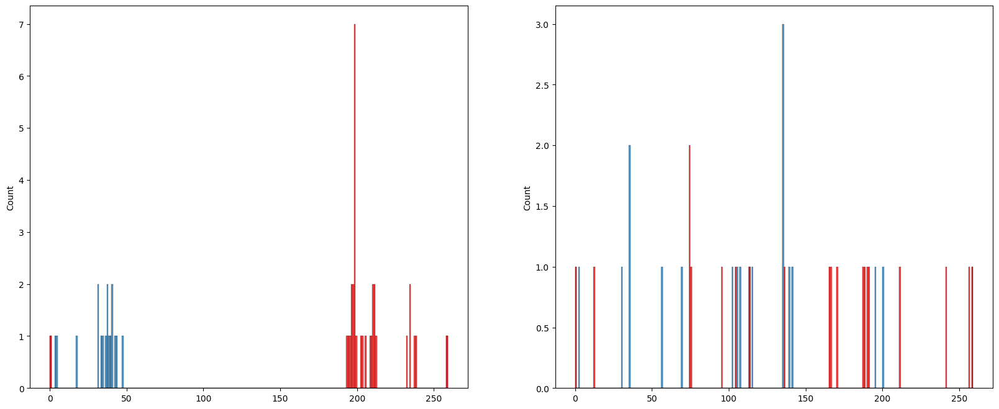

<Figure size 1200x800 with 0 Axes>

{0, 1, 34, 32, 5, 71, 13, 46, 15, 48, 81, 21, 53, 95, 61, 62, 31}
{2, 98, 4, 72, 105, 77, 16, 118, 56, 25, 92, 125, 24}
{35, 37, 38, 40, 9, 19, 115, 20, 55, 26, 30}
{69, 6, 39, 8, 10, 82, 18, 52, 58}
{96, 67, 41, 42, 110, 111, 124, 94}


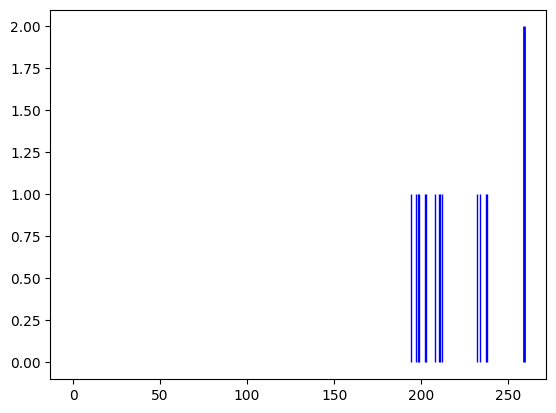

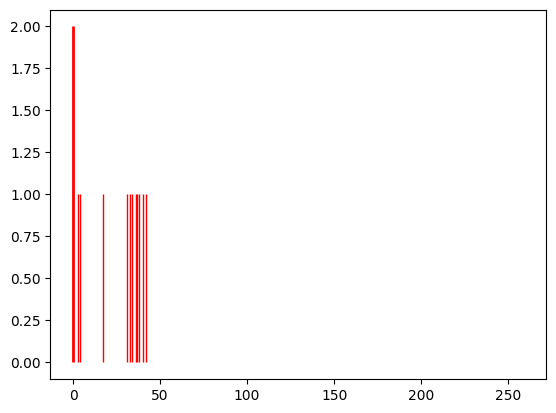

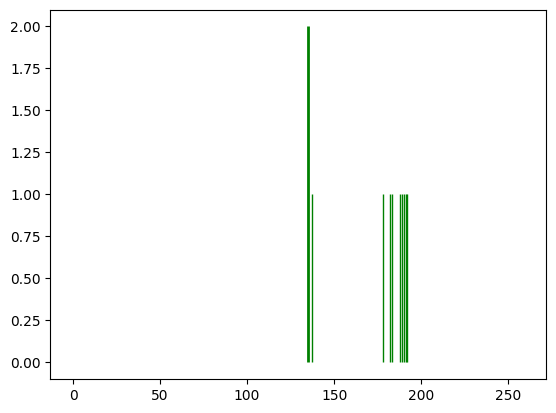

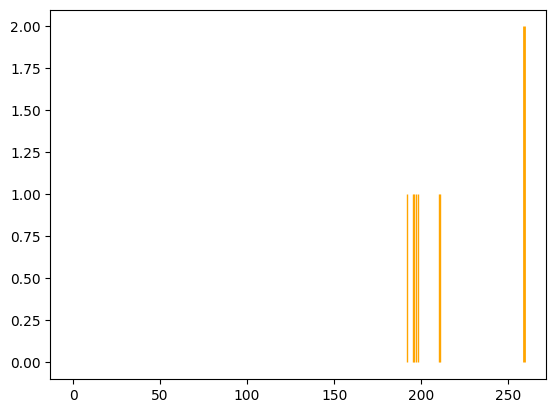

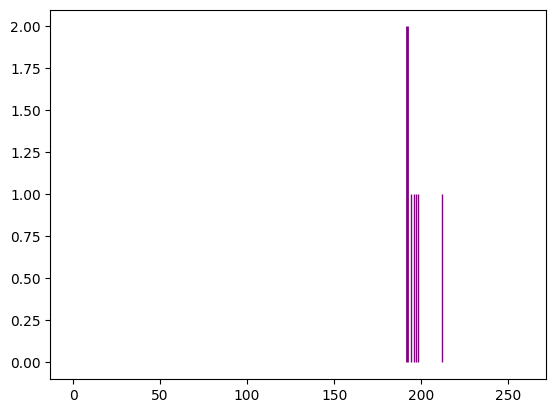

Spectrum num=2462, size=92, matched=16, frac=0.17391304347826086
Spectrum num=2462, size=92, matched=18, frac=0.1956521739130435


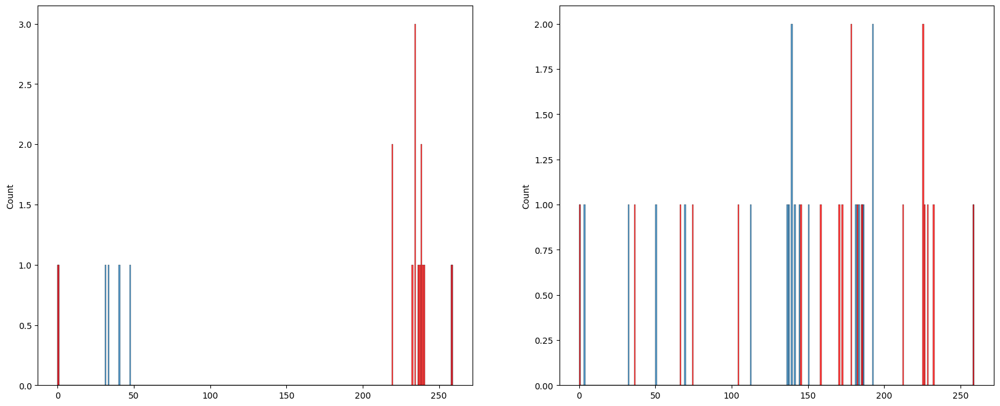

<Figure size 1200x800 with 0 Axes>

{33, 6, 8, 41, 10, 78, 15, 81, 51, 85, 22, 23, 88, 56}
{1, 2, 3, 5, 11, 16, 53, 27, 29}
{4, 42, 74, 48, 19, 61}


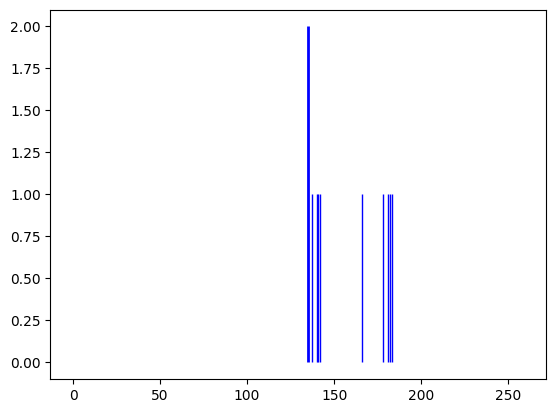

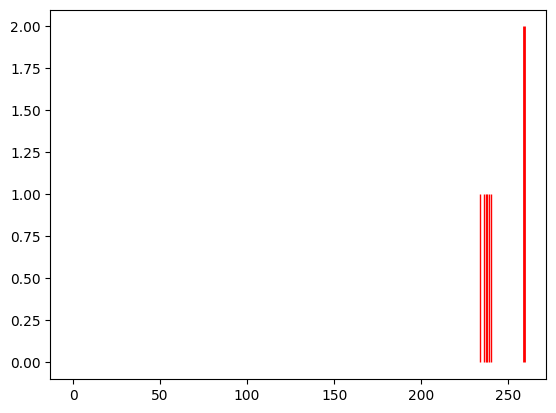

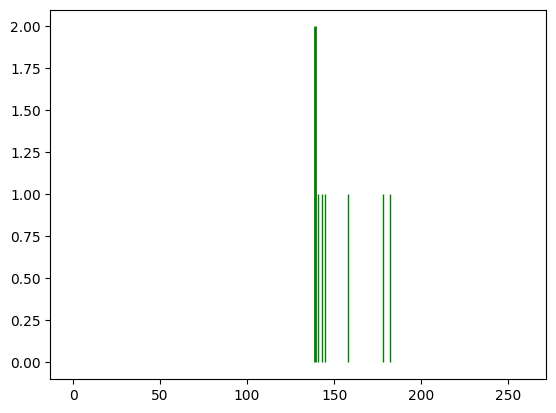

Spectrum num=2464, size=512, matched=111, frac=0.216796875
Spectrum num=2464, size=512, matched=87, frac=0.169921875


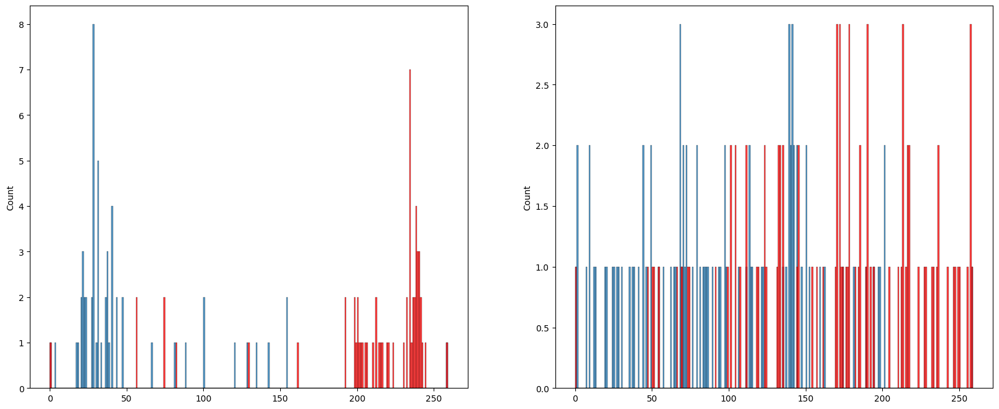

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 6, 7, 9, 266, 10, 14, 15, 402, 19, 23, 408, 24, 280, 31, 162, 37, 49, 177, 52, 59, 61, 317, 198, 200, 73, 214, 86, 89, 91, 223, 99, 380}
{0, 8, 11, 148, 21, 22, 279, 25, 28, 286, 32, 289, 419, 36, 38, 39, 168, 42, 44, 46, 179, 180, 51, 54, 56, 68, 69, 337, 82, 87, 101, 236, 110, 114, 249, 123}
{35, 70, 17, 339, 84, 53, 57, 26, 126}
{163, 355, 105, 137, 106, 366, 190}
{424, 378, 346, 27, 444, 93}
{97, 102, 174, 112, 283, 181, 411}
{231, 169, 12, 45, 185, 510}
{142, 212, 404, 150, 441, 221}
{326, 136, 43, 13, 468, 405, 246, 478}
{230, 334, 306, 307, 210, 377}
{226, 503, 133, 202, 439, 251}
{131, 332, 47, 81, 146, 88}
{34, 454, 265, 267, 506, 350}
{130, 41, 77, 18, 316, 29}
{480, 388, 465, 472, 124}
{67, 172, 140, 498, 243}
{71, 75, 398, 499, 500}
{64, 277, 248, 153, 442}
{290, 134, 328, 107, 287}
{416, 361, 463, 406, 314}
{194, 450, 261, 244, 281}
{357, 396, 78, 504, 347}
{195, 74, 397, 473, 415}
{228, 360, 113, 156, 351}


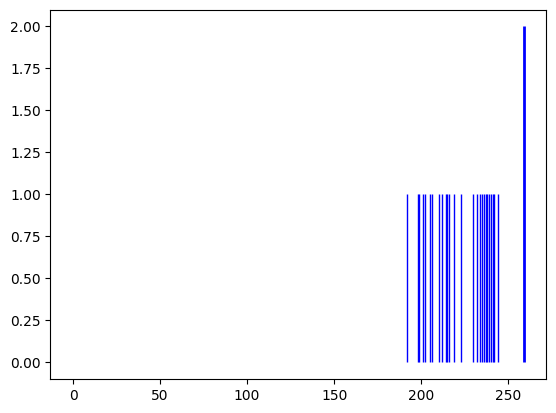

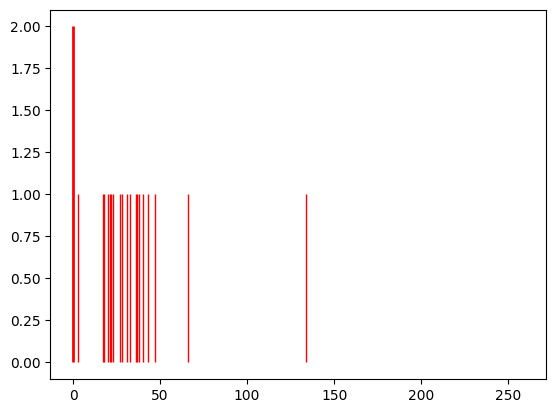

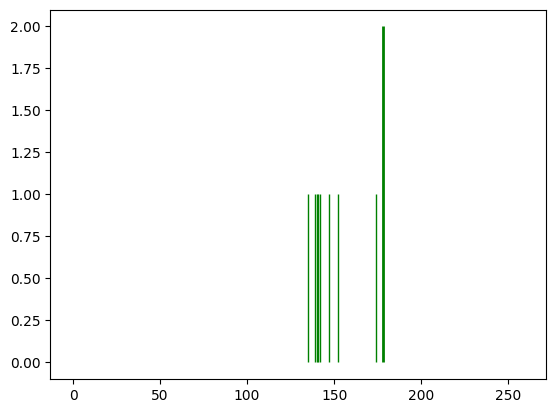

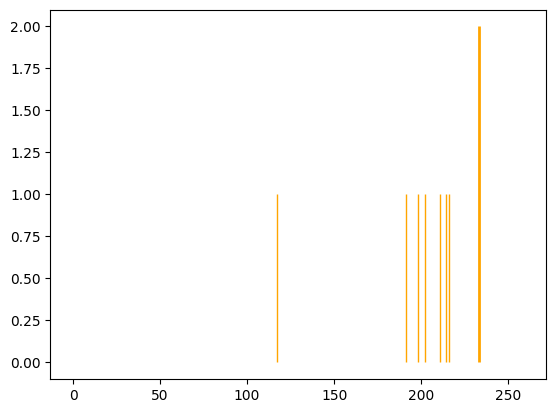

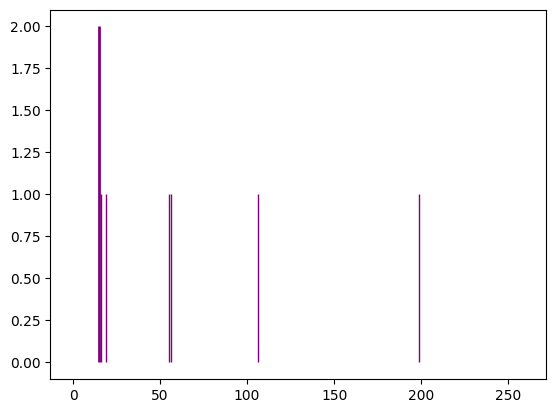

...

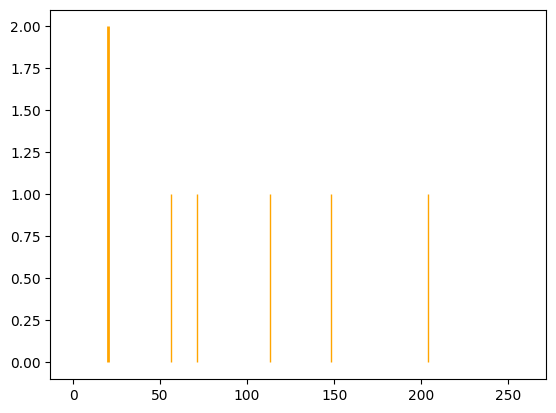

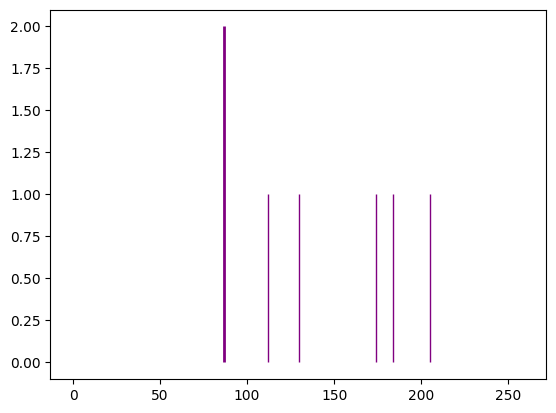

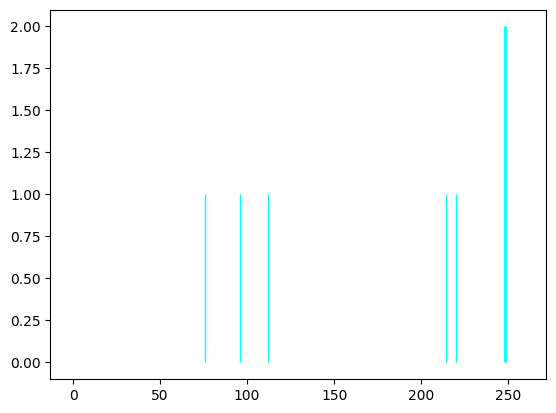

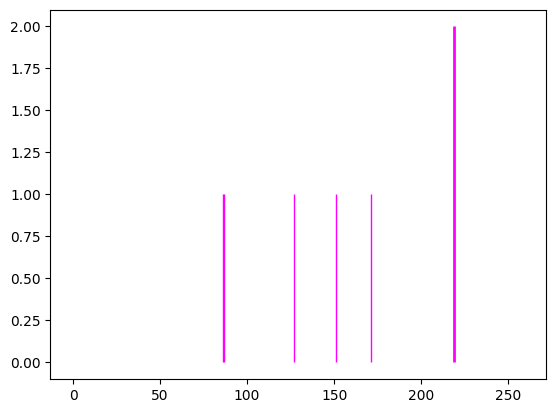

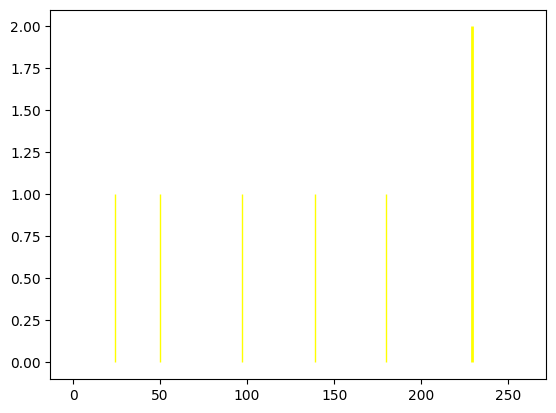

Spectrum num=2466, size=483, matched=146, frac=0.3022774327122153
Spectrum num=2466, size=483, matched=97, frac=0.20082815734989648


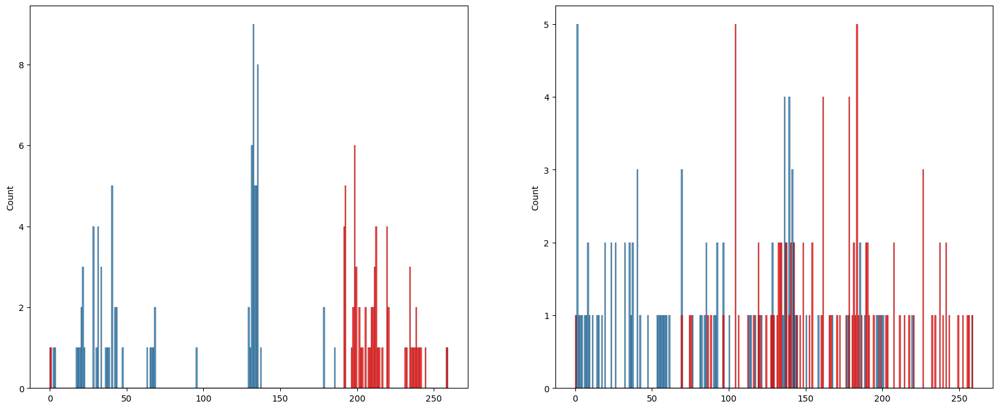

<Figure size 1200x800 with 0 Axes>

{0, 1, 130, 3, 4, 5, 6, 8, 9, 137, 11, 15, 144, 22, 23, 24, 27, 28, 156, 33, 36, 164, 38, 42, 299, 430, 46, 177, 53, 54, 448, 70, 74, 330, 80, 81, 92, 98, 372, 124, 255}
{2, 7, 266, 139, 13, 14, 273, 17, 148, 21, 20, 25, 412, 29, 290, 165, 294, 424, 170, 51, 52, 309, 56, 441, 191, 64, 449, 322, 324, 199, 204, 335, 82, 85, 86, 87, 470, 217, 223, 480, 99, 231, 359, 121, 122}
{193, 414, 68, 453, 100, 141, 50, 30, 94}
{230, 200, 41, 234, 105, 140, 145, 275, 116, 219, 220}
{160, 32, 66, 35, 67, 358, 39, 71, 10, 112, 214, 26, 284}
{416, 135, 428, 436, 182, 57}
{232, 43, 302, 344, 58, 316, 126}
{101, 389, 297, 44, 48, 368, 446}
{34, 267, 211, 437, 248, 31}
{258, 356, 271, 151, 408, 60}
{450, 228, 108, 207, 317}
{171, 77, 239, 243, 158}
{298, 399, 276, 315, 444}
{110, 303, 47, 18, 152, 125}
{353, 73, 202, 55, 215, 188, 351}
{355, 229, 203, 339, 310}
{387, 270, 277, 89, 190}
{136, 394, 468, 254, 287}


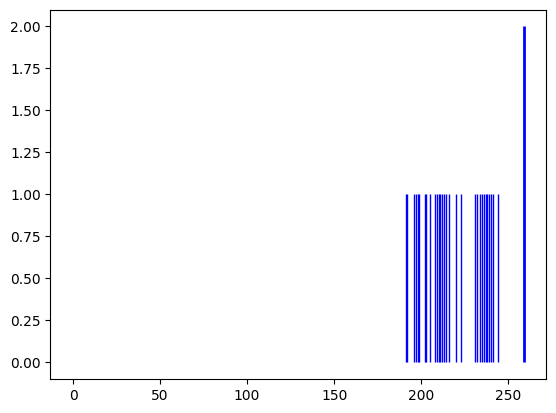

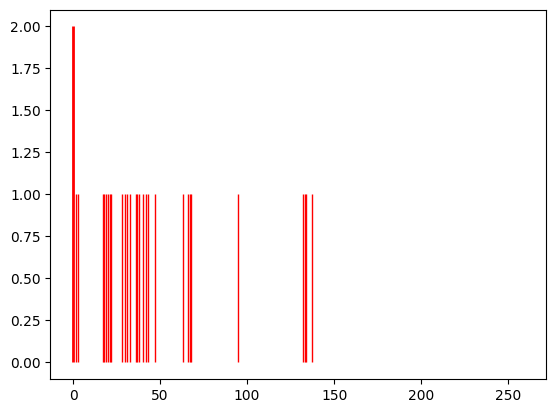

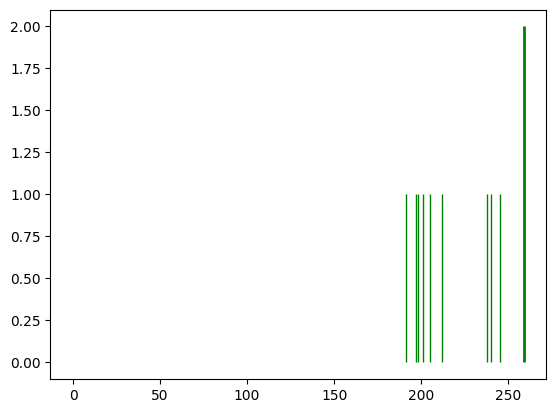

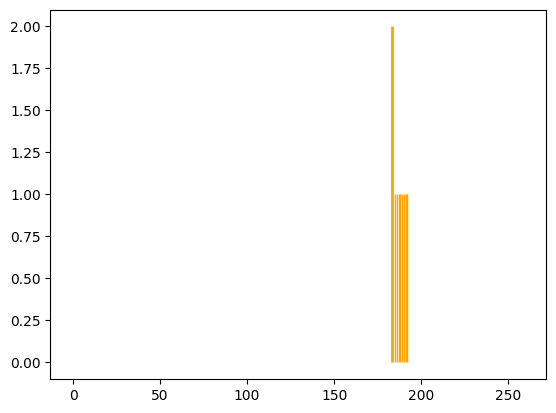

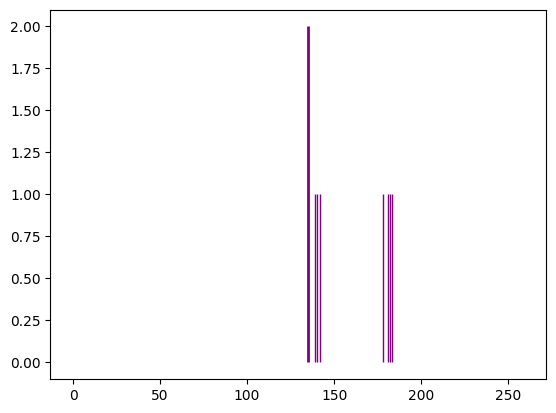

...

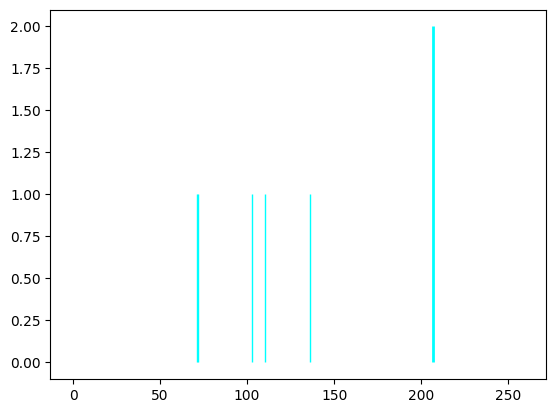

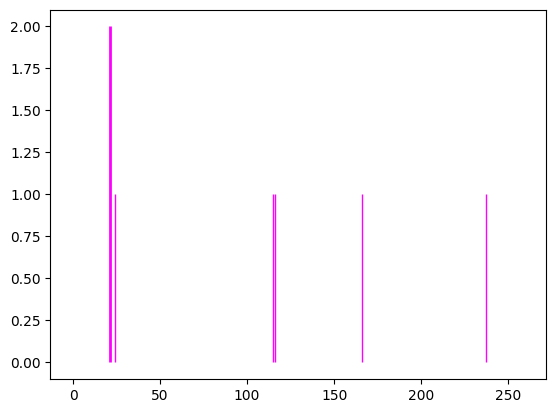

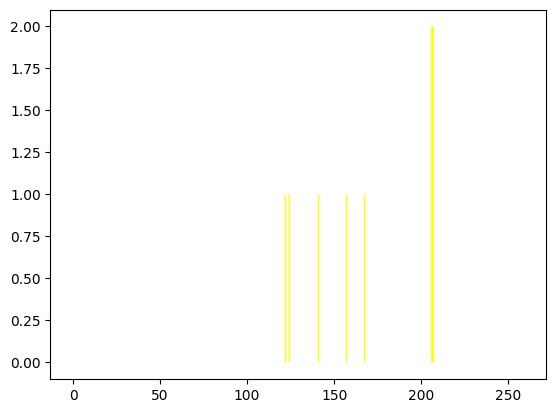

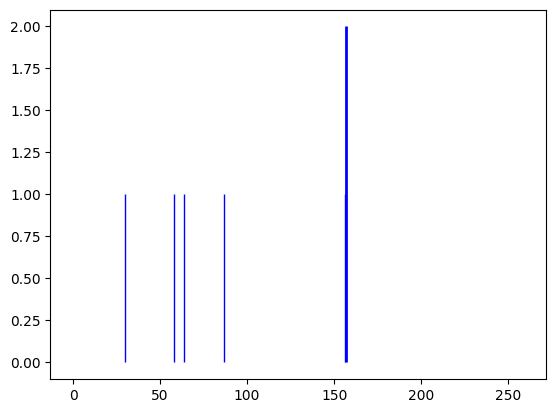

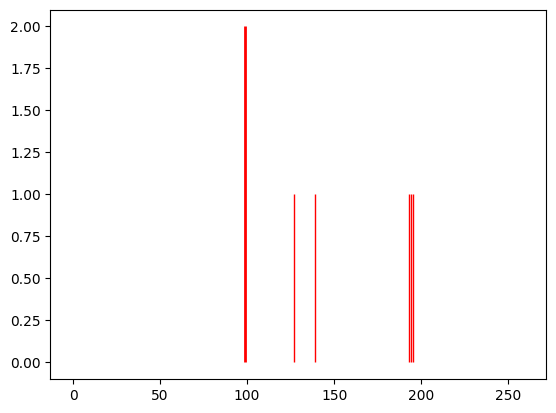

Spectrum num=2467, size=249, matched=105, frac=0.42168674698795183
Spectrum num=2467, size=249, matched=57, frac=0.2289156626506024


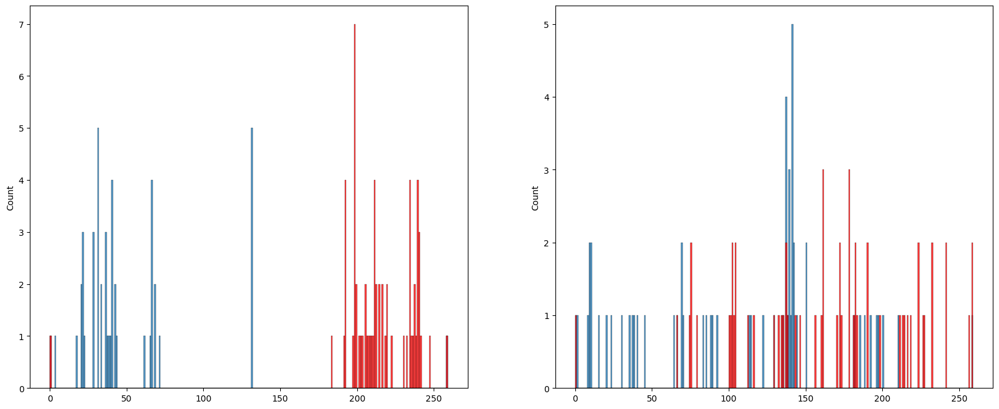

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 6, 7, 8, 10, 139, 12, 11, 15, 144, 17, 145, 19, 20, 23, 26, 27, 28, 32, 33, 172, 48, 57, 58, 188, 71, 212, 89, 218, 91, 97, 228, 103, 233, 107, 111, 118, 120, 122, 126, 127}
{0, 135, 9, 13, 148, 21, 152, 24, 167, 44, 45, 51, 53, 59, 61, 64, 201, 203, 204, 75, 81, 90, 102, 231, 106, 114}
{36, 40, 42, 138, 18, 157, 31}
{128, 104, 76, 141, 50, 95, 191}
{35, 166, 230, 199, 72, 74, 115, 84, 121}
{65, 98, 143, 112, 49, 82, 83, 25}
{37, 200, 110, 80, 60}
{67, 131, 105, 137, 14, 113}
{160, 227, 79, 150, 56, 185, 29}
{34, 78, 175, 242, 216, 88}


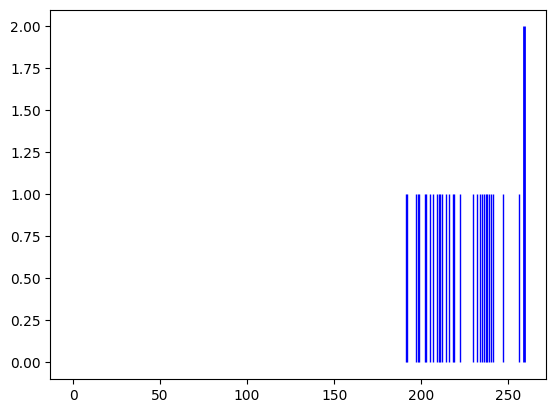

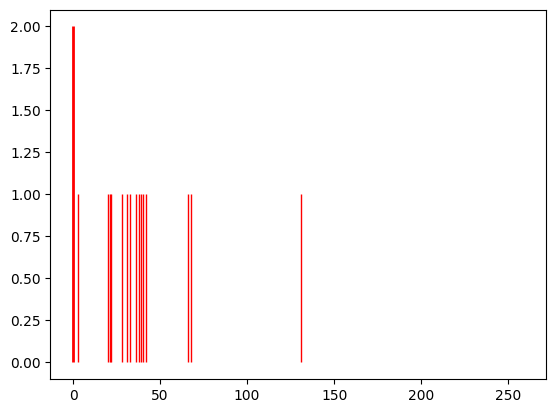

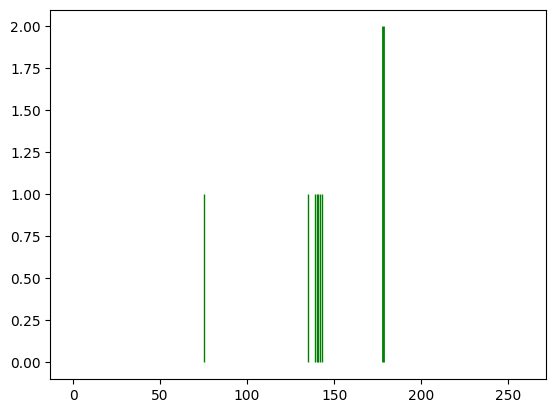

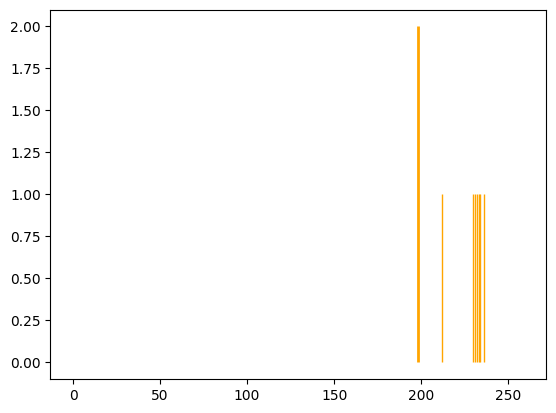

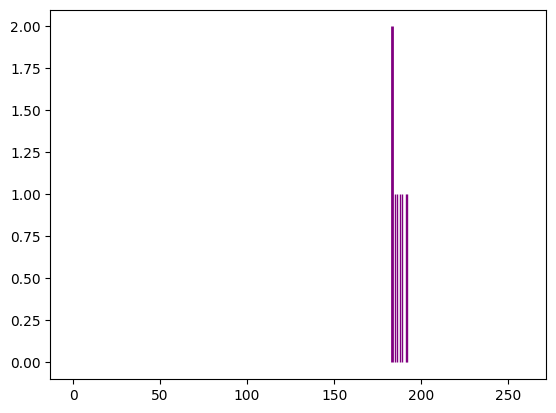

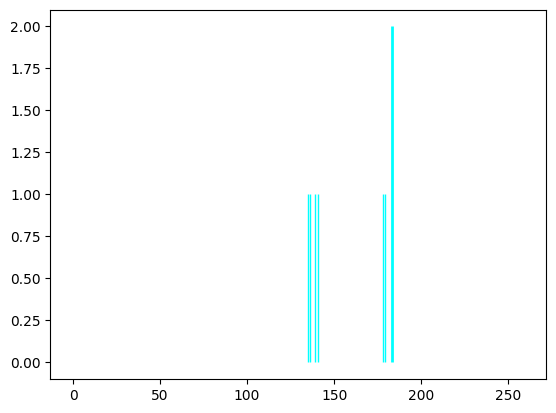

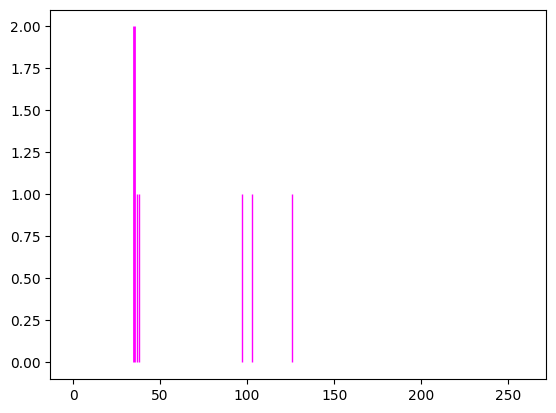

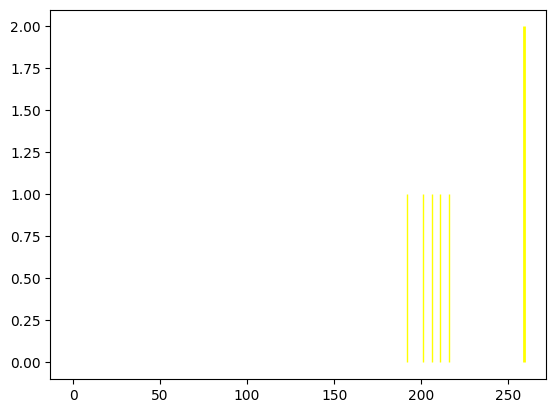

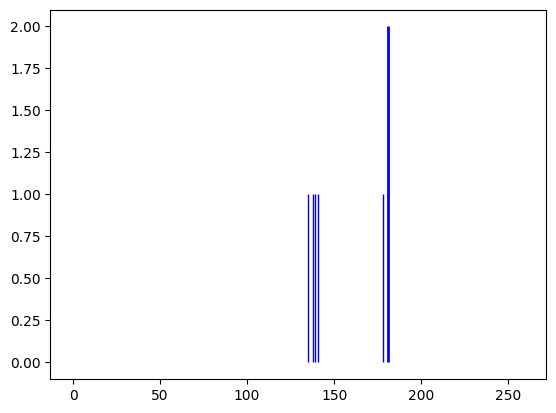

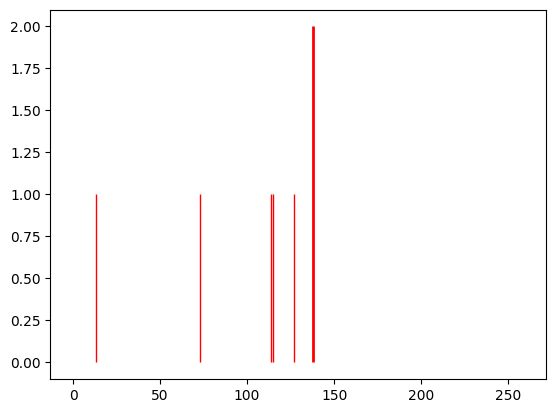

Spectrum num=2468, size=634, matched=137, frac=0.21608832807570977
Spectrum num=2468, size=634, matched=101, frac=0.15930599369085174


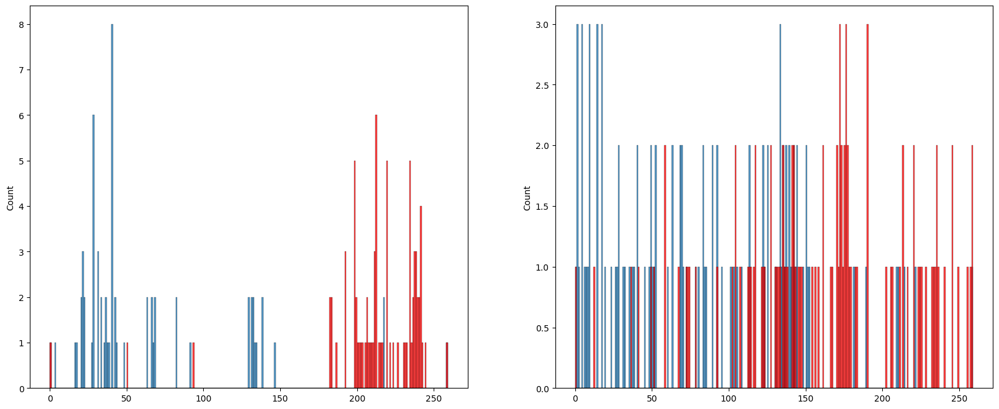

<Figure size 1200x800 with 0 Axes>

{128, 1, 2, 3, 4, 5, 6, 7, 133, 9, 10, 139, 11, 12, 398, 16, 17, 22, 23, 25, 410, 28, 30, 295, 41, 42, 53, 570, 59, 58, 61, 192, 324, 74, 332, 81, 88, 90, 226, 116, 120, 377}
{0, 387, 391, 8, 145, 18, 20, 21, 26, 27, 539, 33, 164, 37, 296, 44, 46, 47, 49, 51, 181, 56, 60, 190, 71, 328, 457, 80, 110, 624, 499, 121, 251, 380}
{35, 38, 40, 265, 45, 92, 147, 339, 598, 278, 346, 156}
{97, 484, 230, 167, 134, 137, 390, 43, 82, 469, 186, 187, 29}
{482, 101, 395, 13, 112, 274, 148, 86}
{160, 32, 34, 99, 100, 104, 114, 409}
{521, 587, 175, 401, 529, 340, 153}
{449, 72, 106, 75, 236, 77, 109, 91}
{96, 161, 67, 325, 518, 185, 223}
{260, 200, 397, 402, 284, 509, 415}
{583, 575, 494, 83, 599, 447}
{450, 232, 176, 89, 605, 318}
{616, 554, 619, 396, 474, 218}
{578, 502, 55, 249, 127, 414, 31}
{231, 299, 113, 210, 308, 629}
{481, 485, 268, 301, 505, 604}
{544, 227, 455, 302, 247}
{458, 202, 111, 400, 152, 283}
{297, 558, 336, 600, 444}
{329, 393, 428, 460, 493}
{550, 557, 48, 434, 310, 343}
{520, 303,

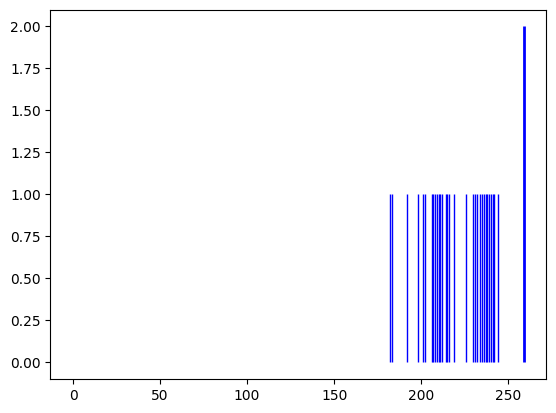

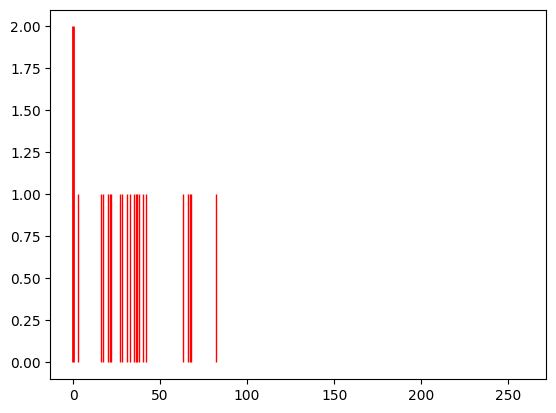

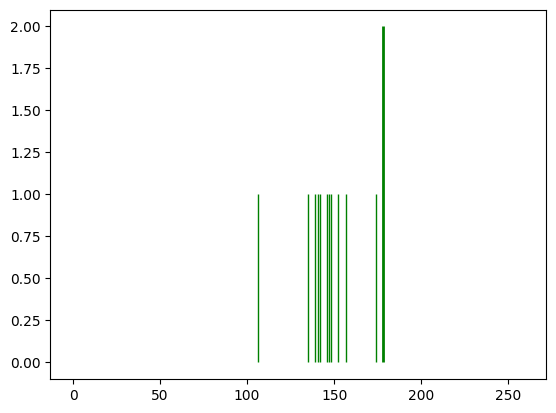

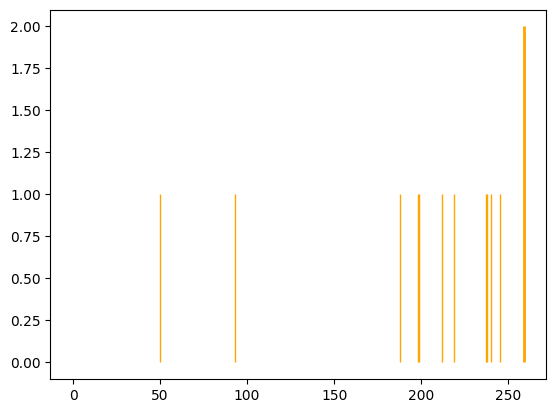

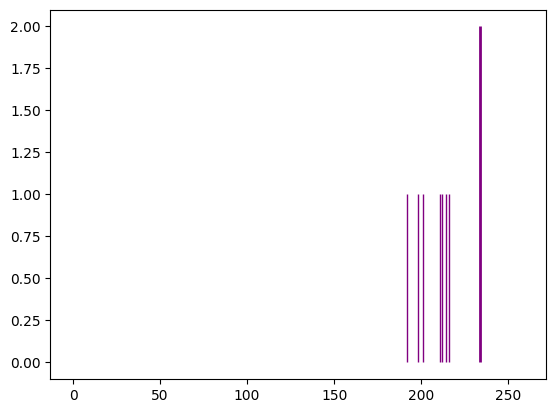

...

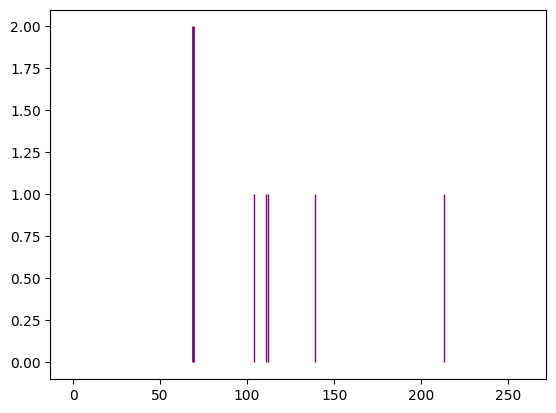

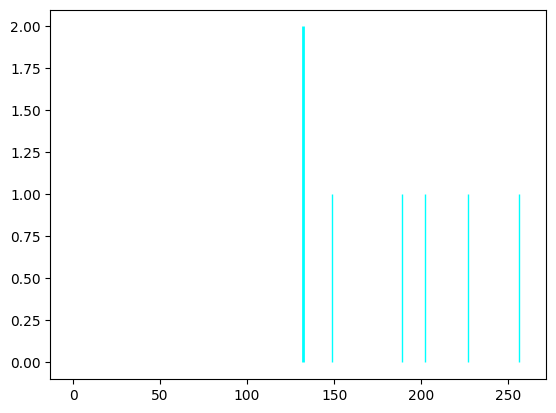

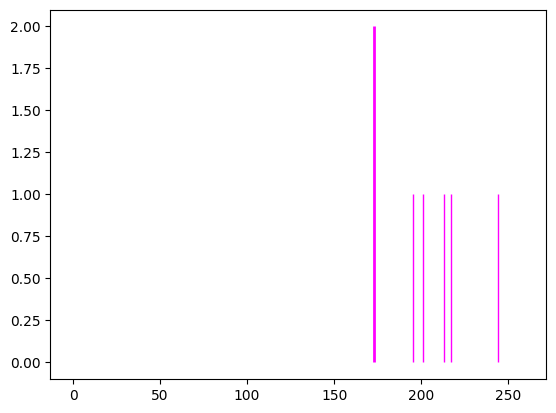

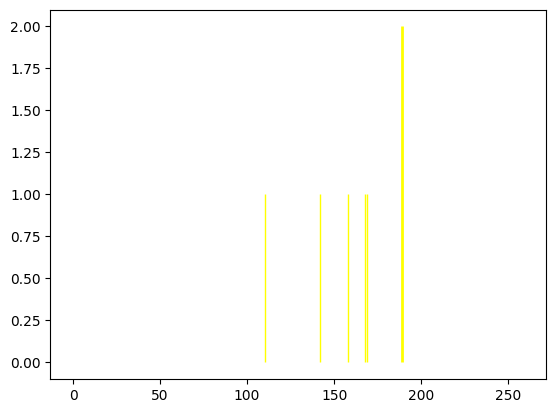

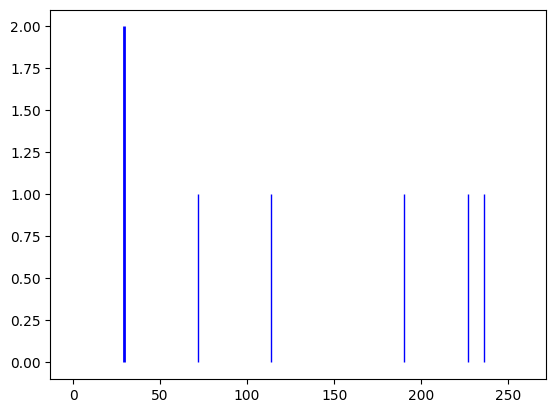

Spectrum num=2475, size=96, matched=32, frac=0.3333333333333333
Spectrum num=2475, size=96, matched=14, frac=0.14583333333333334


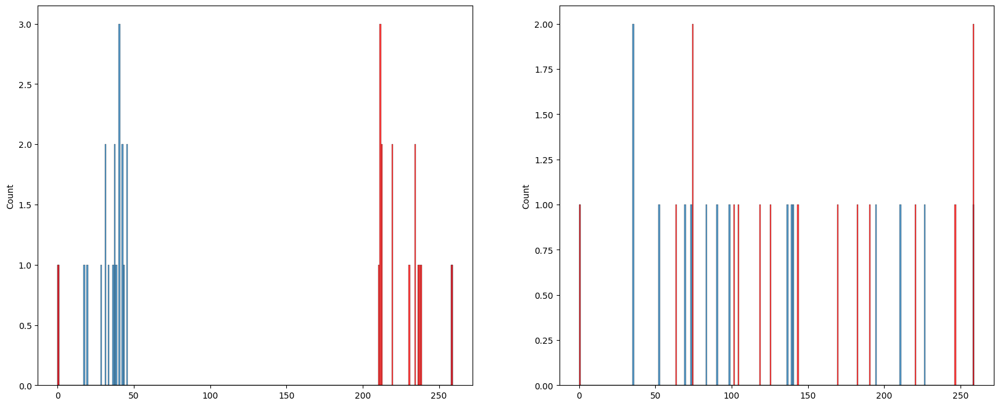

<Figure size 1200x800 with 0 Axes>

{0, 33, 37, 38, 5, 72, 9, 42, 10, 77, 17, 57, 30, 31}
{73, 78, 81, 84, 23, 89, 90, 92, 62}
{4, 6, 39, 8, 14, 48, 18, 50, 56, 26, 60}
{40, 74, 11, 52, 29}


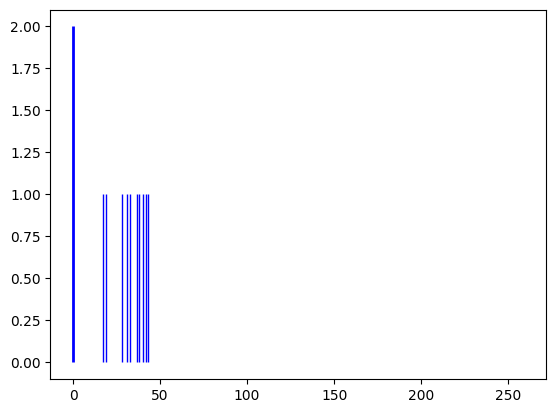

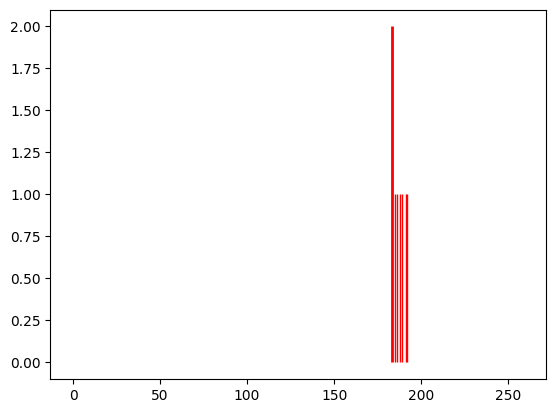

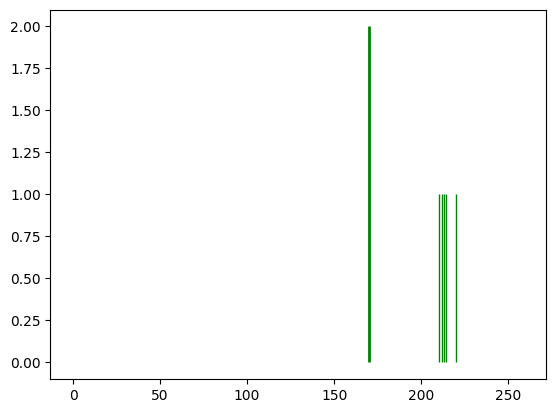

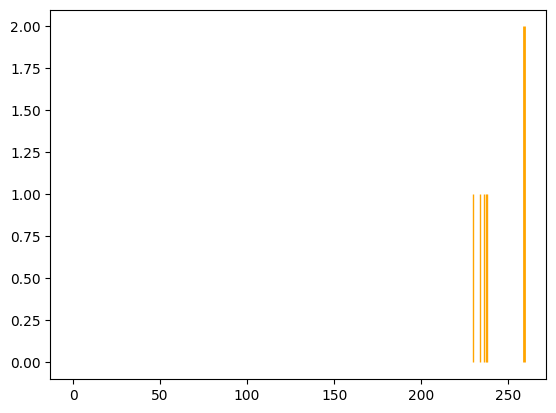

Spectrum num=2479, size=241, matched=52, frac=0.2157676348547718
Spectrum num=2479, size=241, matched=40, frac=0.16597510373443983


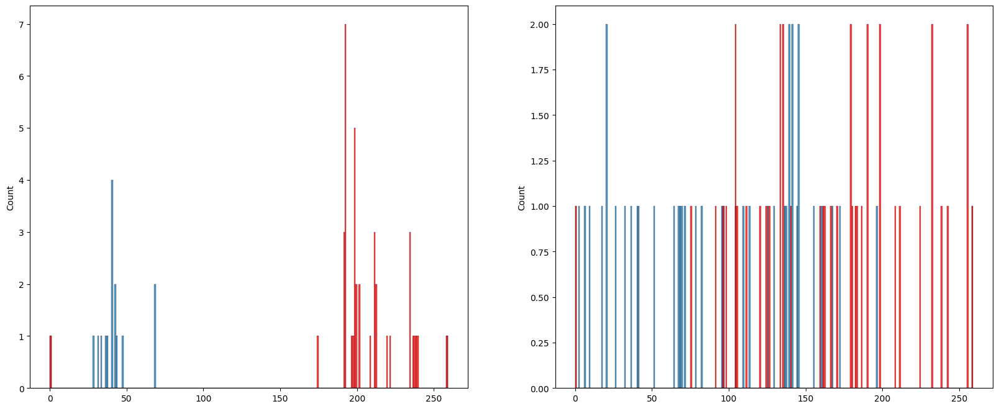

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 5, 6, 11, 13, 14, 16, 17, 18, 21, 22, 24, 31, 32, 35, 41, 51, 56, 61, 70, 79}
{34, 133, 7, 15, 175, 113, 84, 213}
{3, 40, 8, 170, 86, 157}
{68, 12, 46, 48, 117}
{162, 37, 237, 110, 143}
{164, 39, 201, 122, 187}


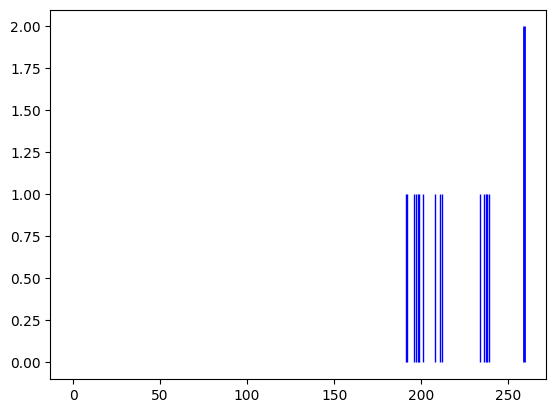

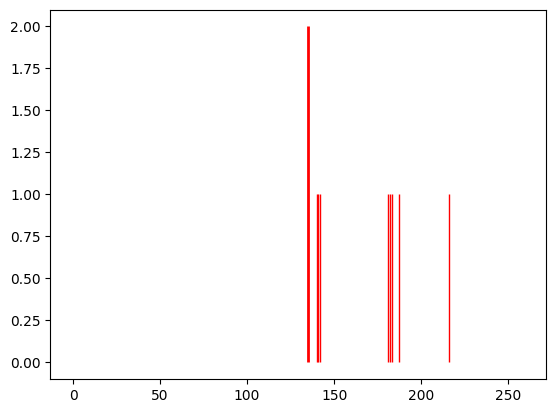

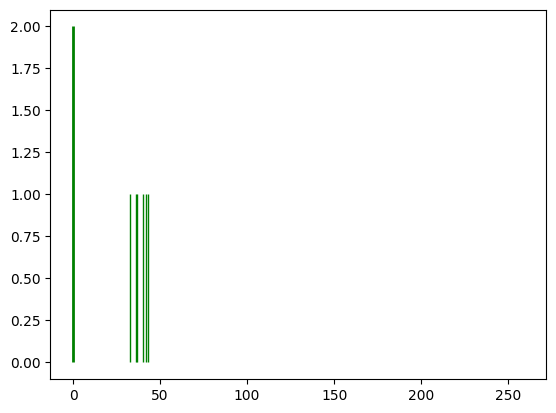

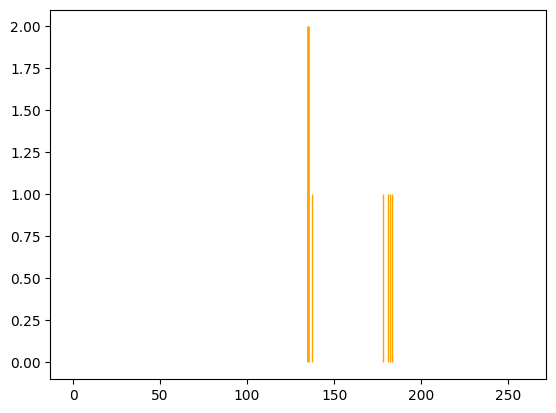

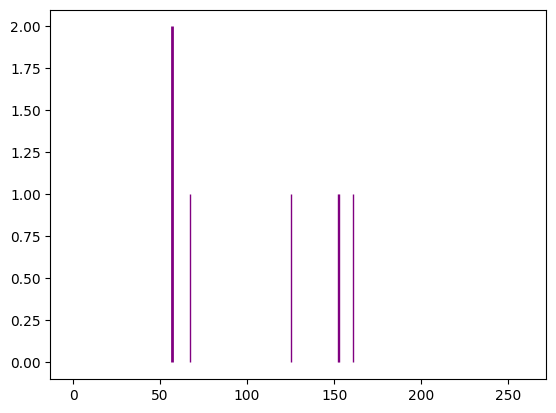

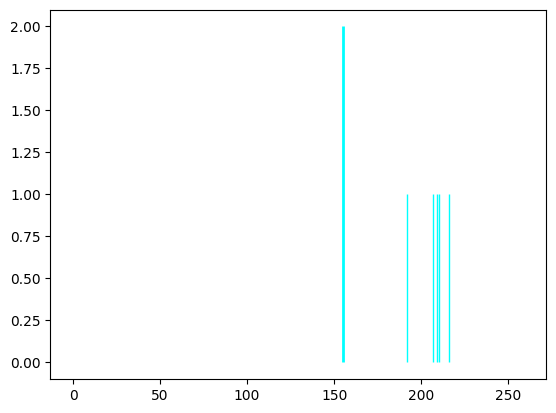

Spectrum num=2482, size=480, matched=100, frac=0.20833333333333334
Spectrum num=2482, size=480, matched=79, frac=0.16458333333333333


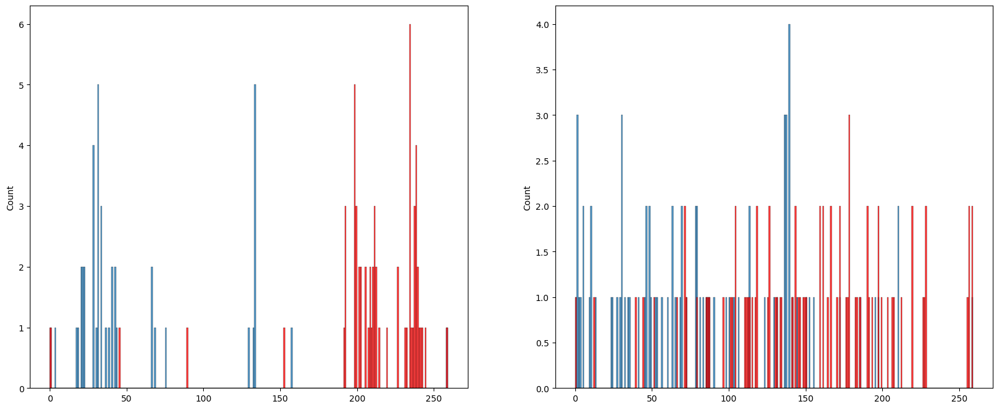

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 131, 4, 5, 6, 7, 8, 9, 11, 13, 14, 16, 20, 149, 26, 32, 35, 41, 50, 51, 54, 55, 56, 60, 61, 63, 193, 196, 69, 327, 86, 95, 96, 101, 102, 104, 113, 117, 119, 249}
{257, 3, 265, 10, 394, 12, 142, 25, 31, 33, 38, 297, 48, 307, 184, 64, 65, 71, 199, 335, 83, 221, 239, 116, 123}
{321, 98, 230, 39, 232, 43, 205, 207, 401, 114, 22, 87, 29}
{36, 42, 459, 268, 398, 309, 152}
{129, 46, 79, 18, 211, 374, 408, 189}
{130, 359, 103, 145, 244, 118, 24, 153}
{450, 420, 428, 76, 377, 159}
{224, 68, 358, 361, 400, 84}
{169, 80, 49, 210, 402, 58}
{228, 241, 341, 214, 311, 378}
{44, 303, 178, 314, 443, 188}
{166, 365, 462, 274, 151, 252}
{192, 430, 270, 466, 245, 246}
{37, 15, 21, 120, 28}
{73, 266, 308, 217, 126}
{40, 329, 299, 435, 411}
{391, 233, 463, 247, 122}
{259, 278, 57, 380, 383}
{448, 237, 121, 157, 350}
{417, 458, 78, 343, 62}
{261, 373, 346, 251, 156}
{195, 260, 392, 432, 447}


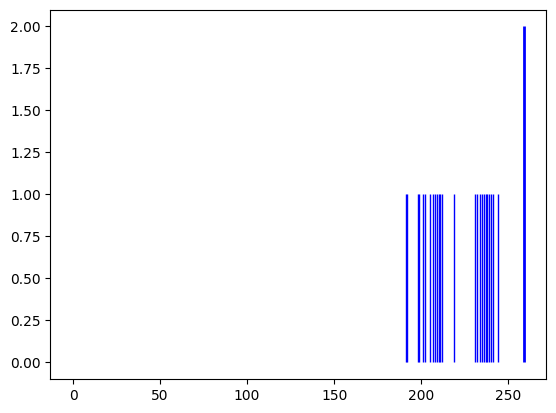

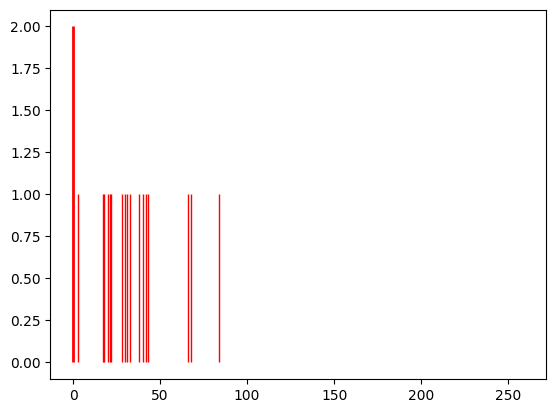

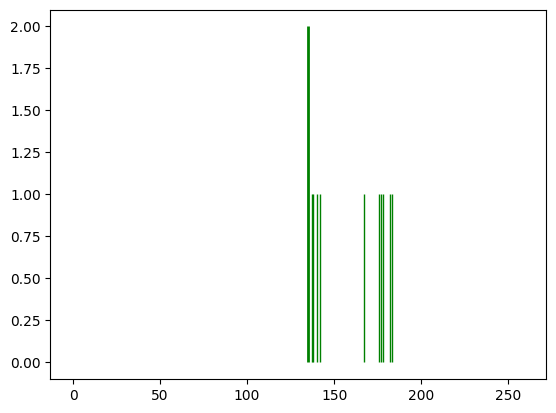

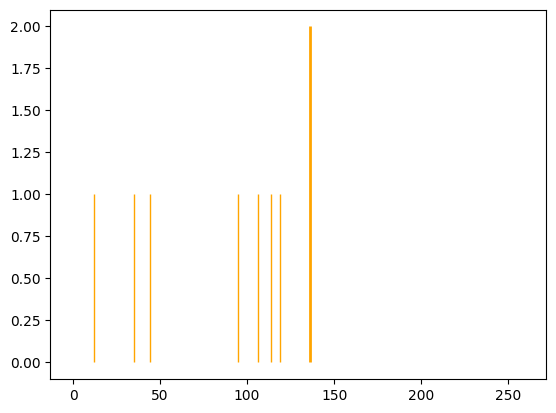

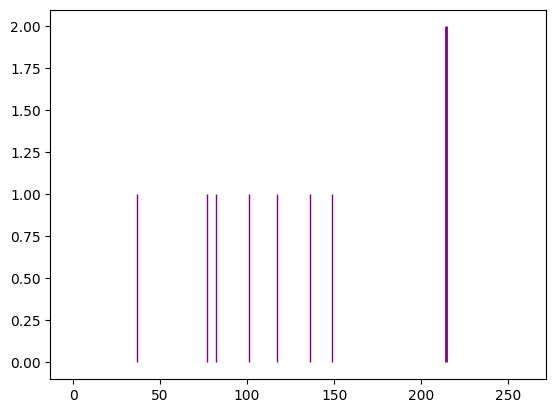

...

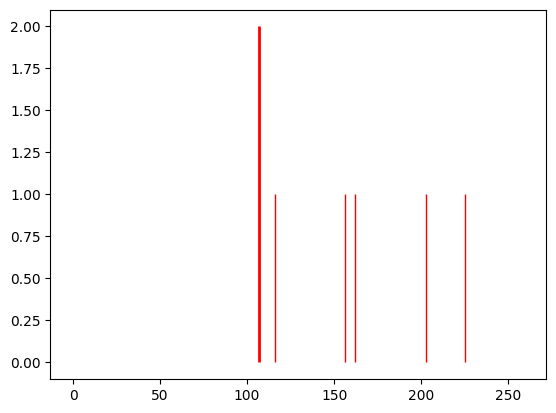

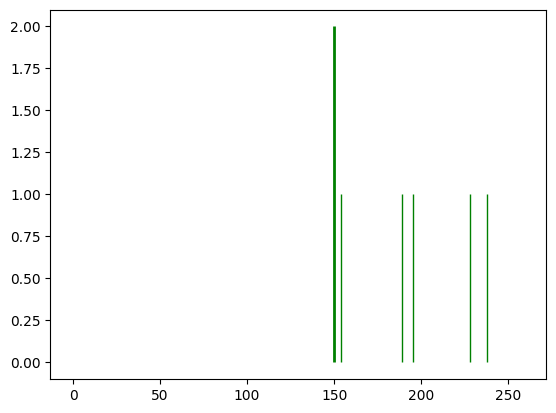

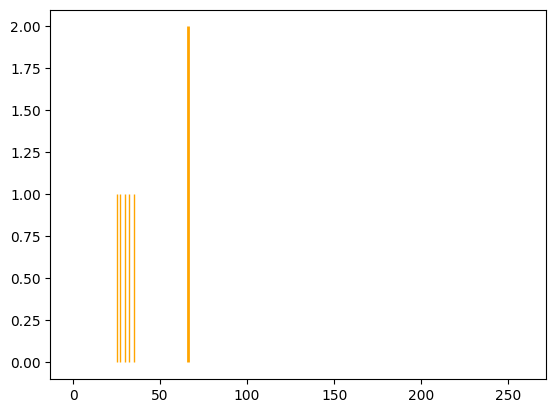

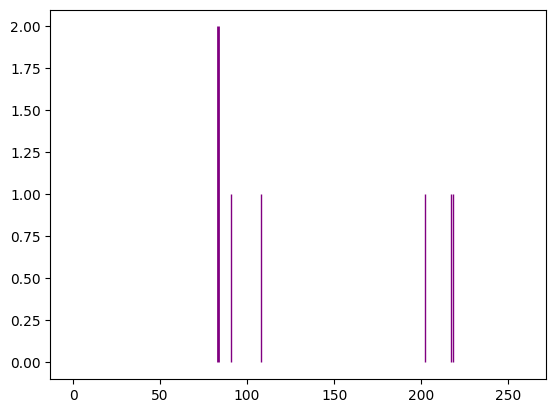

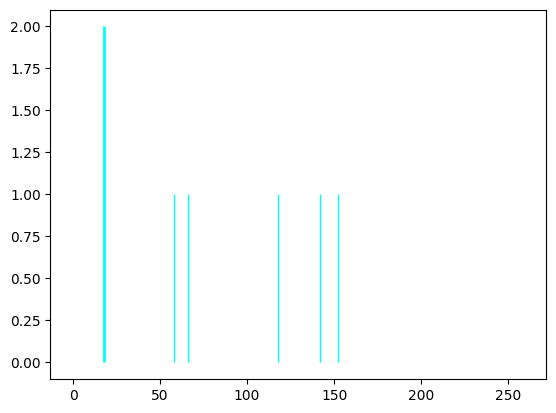

Spectrum num=2490, size=161, matched=75, frac=0.4658385093167702
Spectrum num=2490, size=161, matched=23, frac=0.14285714285714285


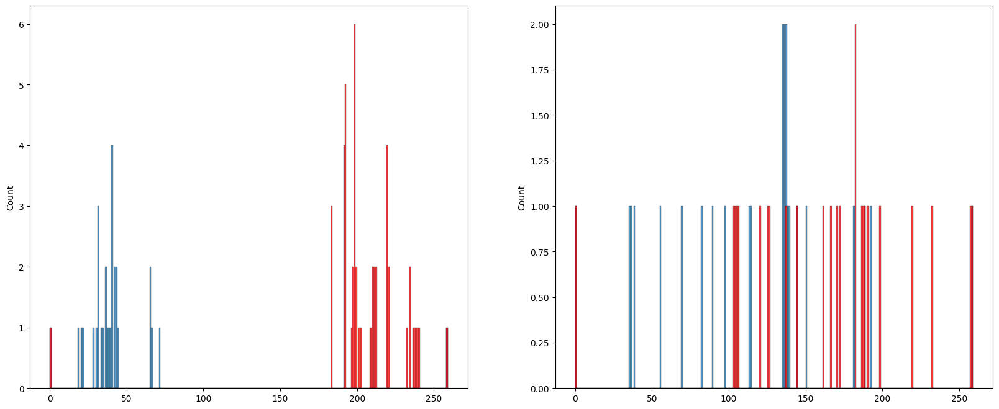

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 4, 5, 134, 7, 9, 12, 14, 15, 17, 18, 20, 22, 24, 25, 26, 30, 31, 32, 35, 38, 43, 45, 48, 50, 51, 57, 58, 63, 75, 90, 105, 107, 118, 121}
{129, 3, 136, 10, 13, 16, 144, 40, 53, 60, 73, 82, 85, 86, 101, 103, 104, 106, 115, 123}
{6, 8, 11, 145, 153, 28, 156, 33, 34, 39, 41, 52, 54, 66, 69, 77, 81, 92, 94, 95, 109}
{132, 88, 155, 119, 87, 152, 151, 27, 157, 158}
{100, 42, 113, 21, 127}


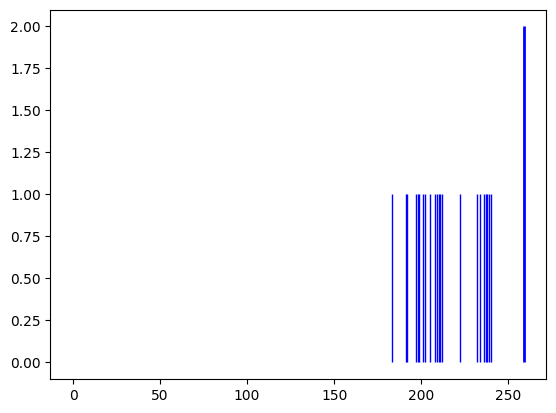

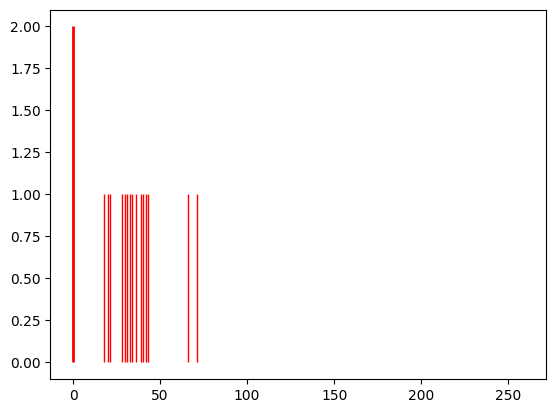

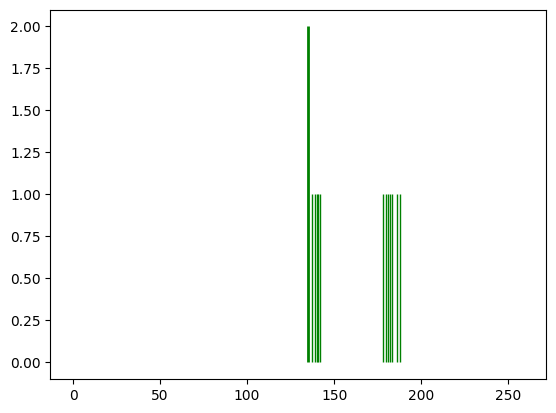

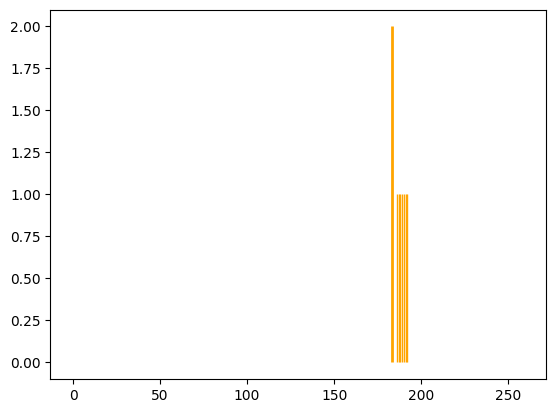

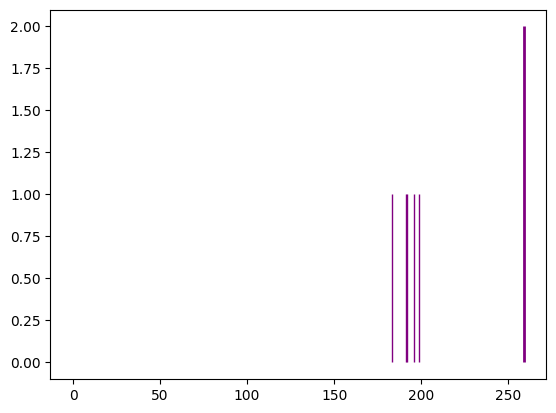

Spectrum num=2502, size=212, matched=6, frac=0.02830188679245283
Spectrum num=2502, size=212, matched=43, frac=0.2028301886792453


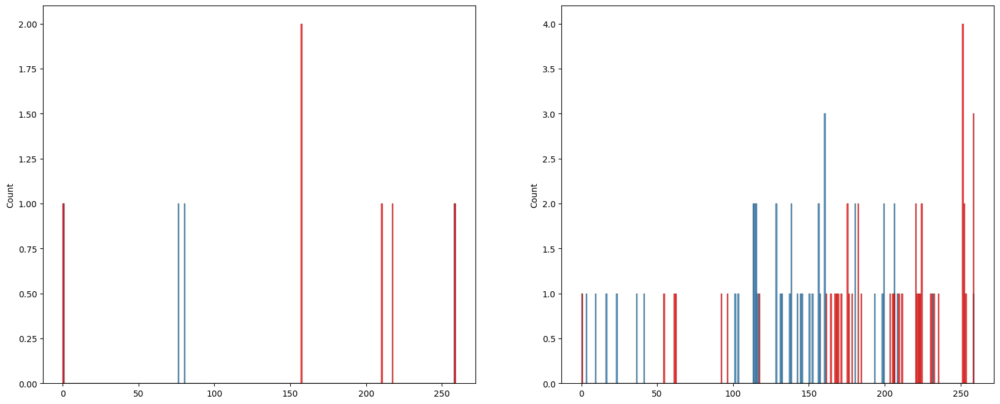

<Figure size 1200x800 with 0 Axes>

{196, 68, 4, 74, 76, 13, 113, 18, 85, 22, 56, 58, 155, 94, 159}
{33, 121, 195, 67, 90, 133, 72, 46, 16, 81, 54, 88, 25, 154}
{96, 64, 1, 3, 45, 14, 15, 80, 178, 57, 31}
{34, 99, 36, 70, 39, 112, 49, 51, 20, 124, 62}
{35, 131, 165, 69, 167, 10, 204, 175}
{38, 102, 106, 140, 205, 47, 120}
{65, 40, 105, 108, 142, 19, 53, 158}
{129, 130, 136, 207, 176}
{166, 114, 83, 181, 95}
{32, 103, 41, 27, 157}


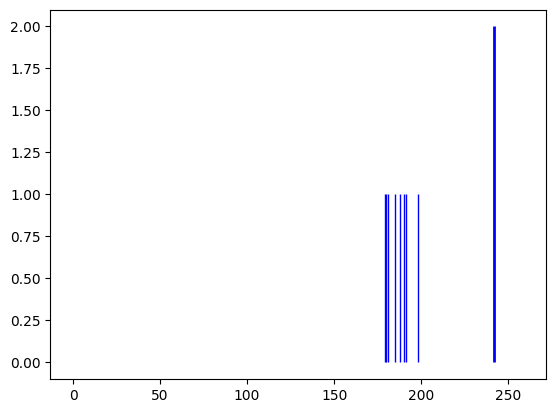

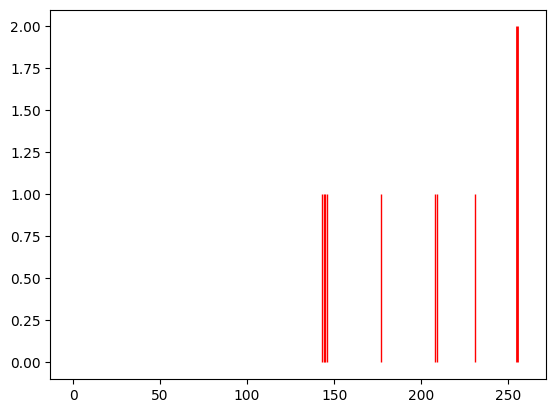

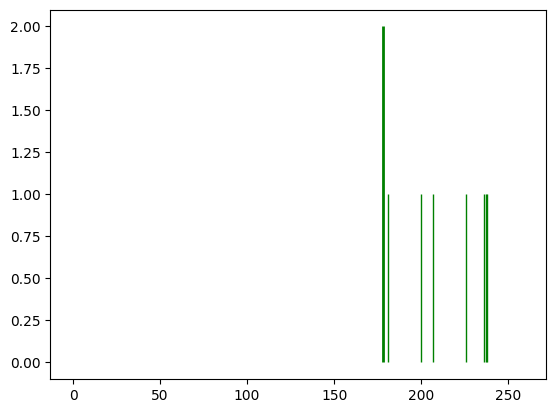

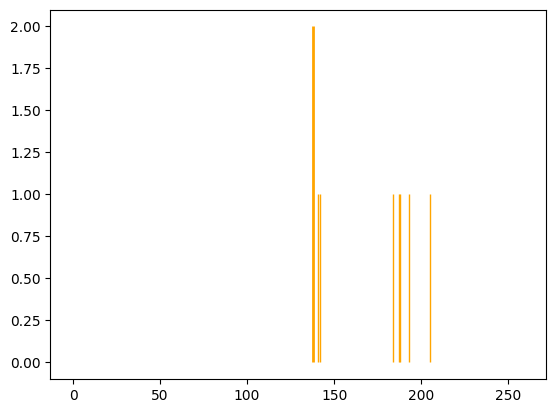

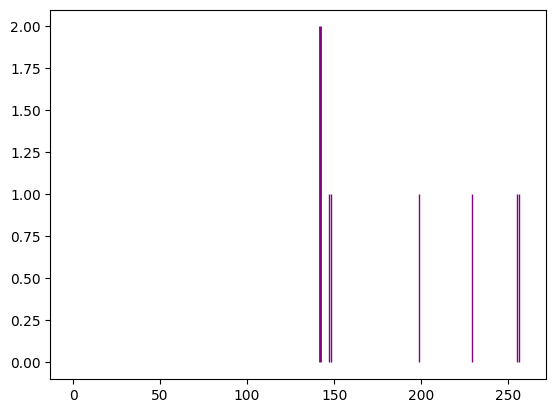

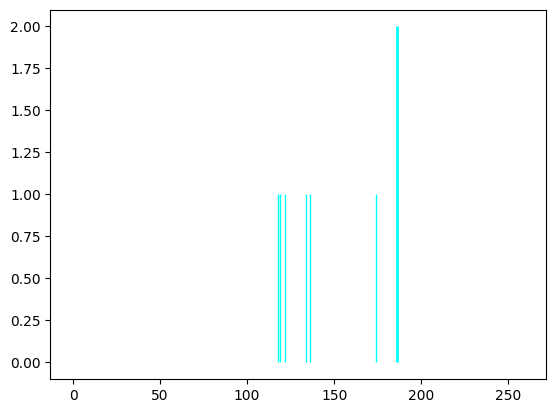

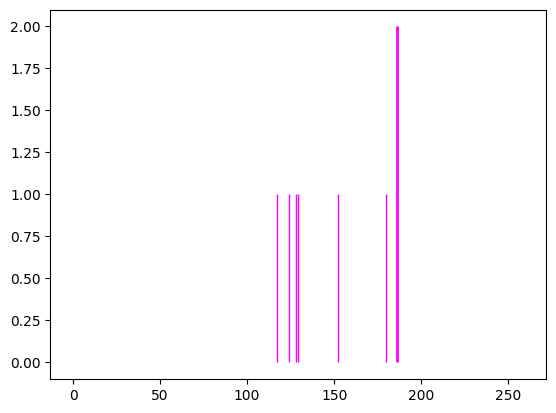

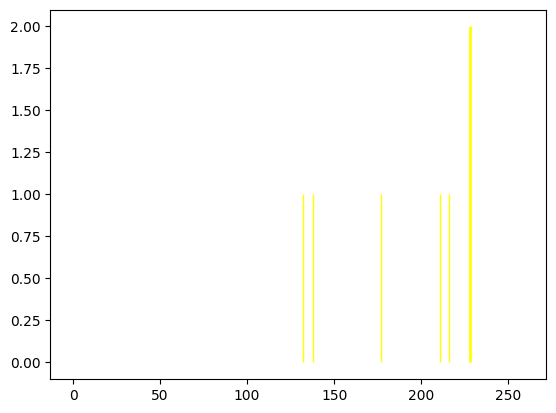

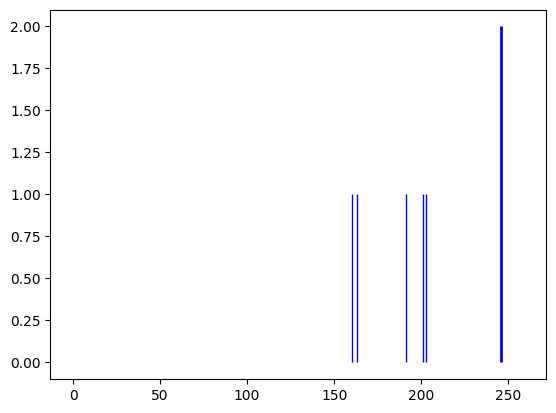

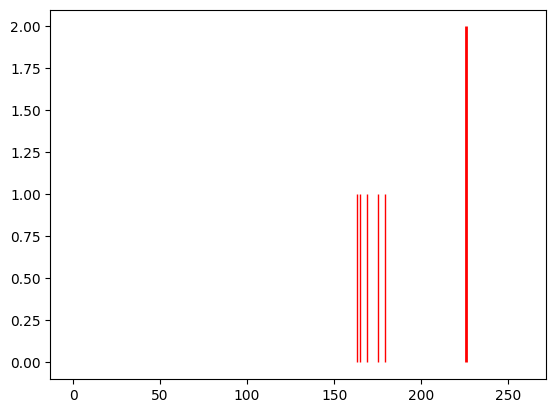

Spectrum num=2505, size=169, matched=66, frac=0.3905325443786982
Spectrum num=2505, size=169, matched=29, frac=0.17159763313609466


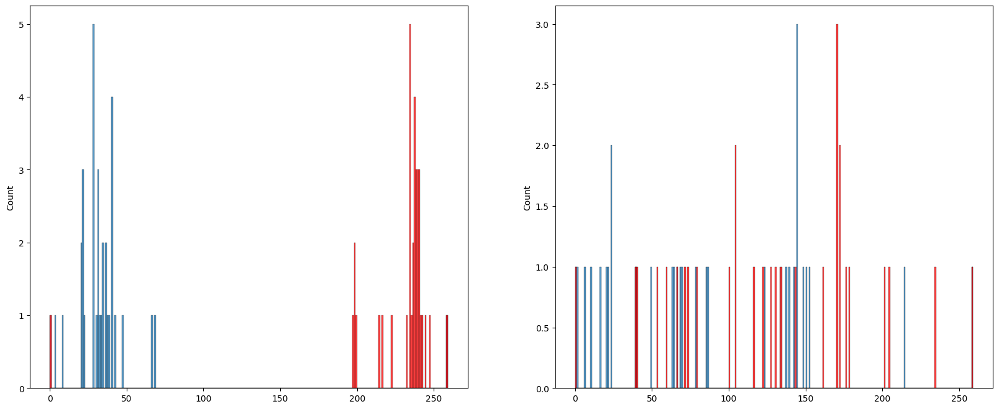

<Figure size 1200x800 with 0 Axes>

{0, 1, 2, 3, 4, 5, 6, 8, 13, 14, 16, 19, 152, 33, 34, 40, 45, 47, 50, 51, 56, 72, 77, 82, 95, 103}
{7, 9, 12, 20, 25, 27, 28, 35, 38, 41, 46, 48, 49, 52, 57, 61, 62, 63, 66, 78, 85, 87, 126}
{32, 90, 101, 43, 26}
{70, 10, 17, 18, 116, 89}
{36, 134, 39, 44, 120}
{105, 108, 22, 24, 153, 122}


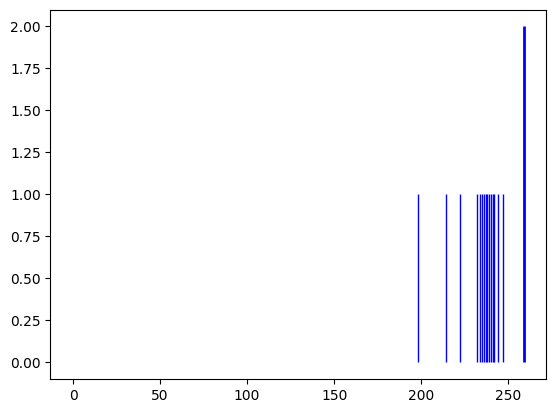

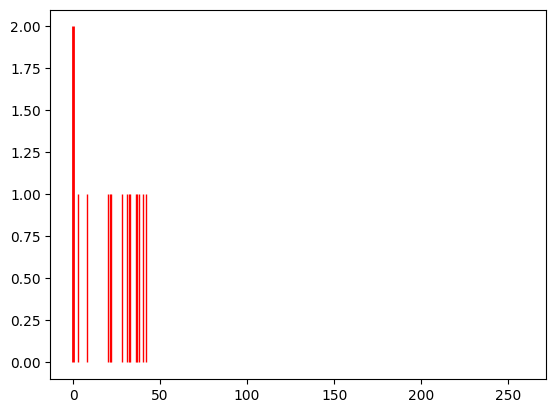

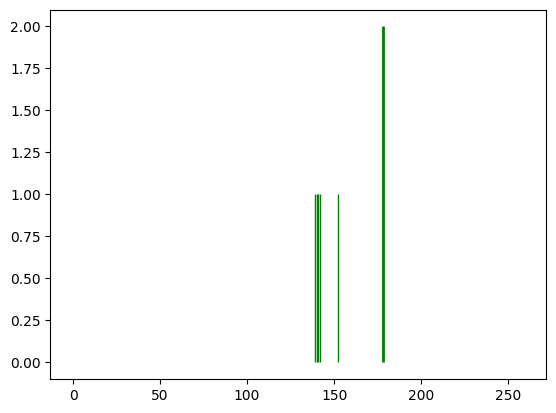

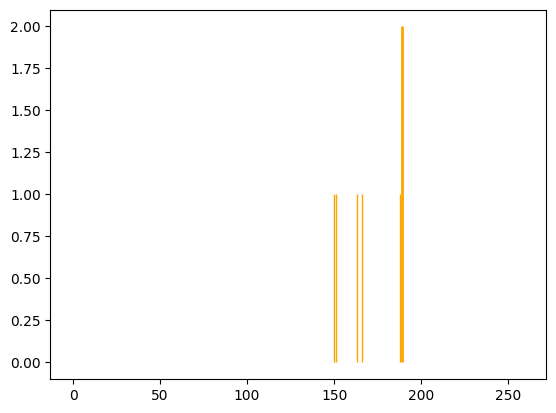

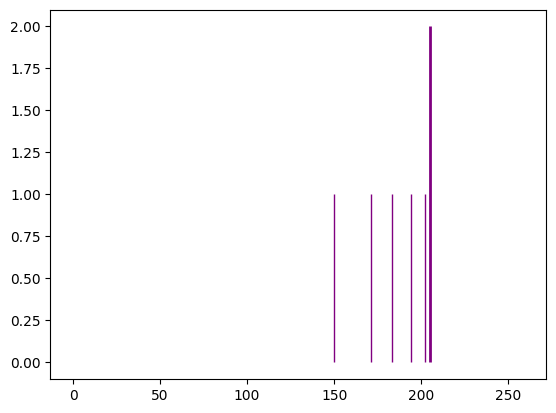

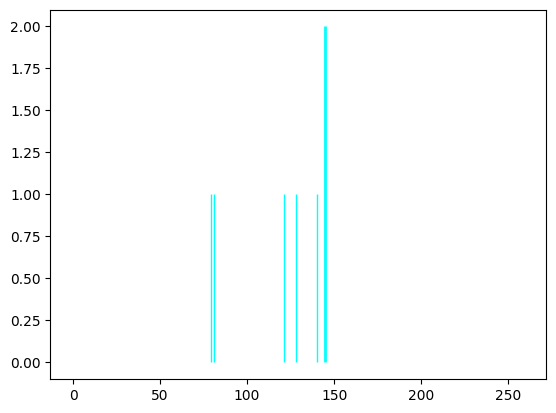

Spectrum num=2508, size=610, matched=126, frac=0.20655737704918034
Spectrum num=2508, size=610, matched=111, frac=0.1819672131147541


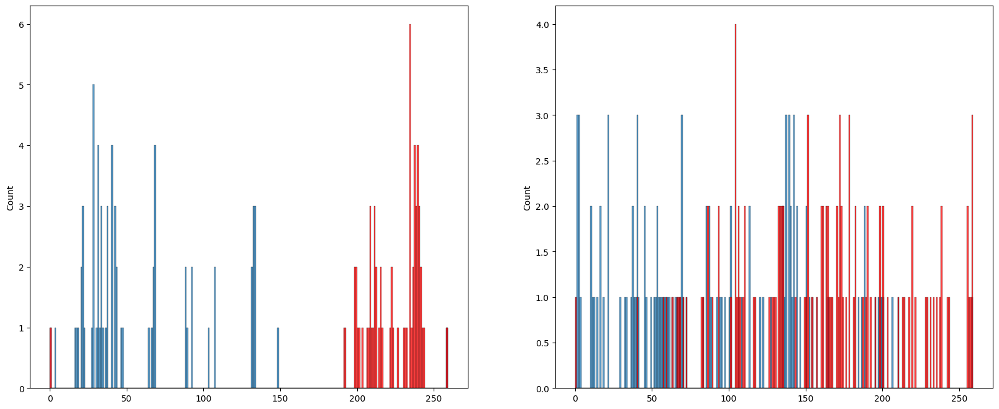

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 6, 7, 8, 9, 131, 19, 22, 24, 25, 27, 31, 37, 43, 47, 439, 185, 57, 60, 63, 64, 66, 324, 71, 73, 203, 75, 79, 84, 89, 475, 100, 236, 113, 372, 246, 255}
{0, 10, 12, 269, 15, 275, 26, 160, 33, 34, 35, 421, 38, 40, 42, 45, 174, 432, 306, 52, 58, 189, 62, 190, 77, 82, 596, 479, 227, 102, 105, 116, 126}
{226, 137, 49, 242, 53, 88, 123, 541, 30, 191}
{386, 106, 139, 81, 506, 124, 478, 127}
{132, 266, 490, 144, 180, 277, 443, 92}
{11, 179, 438, 87, 472, 86, 29, 542}
{482, 133, 550, 551, 359, 429, 142, 348, 28}
{32, 548, 328, 136, 304, 119, 410, 95}
{68, 103, 13, 239, 112, 406, 543}
{129, 420, 70, 41, 17, 468, 188}
{481, 36, 488, 138, 16, 530, 314}
{353, 426, 111, 595, 471, 383}
{264, 495, 80, 405, 347, 221}
{323, 108, 178, 341, 310, 312}
{165, 301, 589, 496, 606, 159}
{449, 390, 51, 276, 408, 379}
{234, 460, 368, 592, 407, 477}
{39, 201, 21, 182, 280}
{162, 259, 333, 14, 186}
{480, 514, 295, 143, 281}
{451, 593, 211, 117, 216}
{419, 298, 526, 118, 94}
{67, 293, 591, 305, 253}


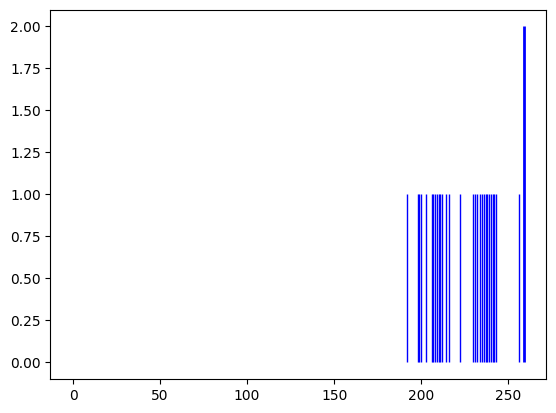

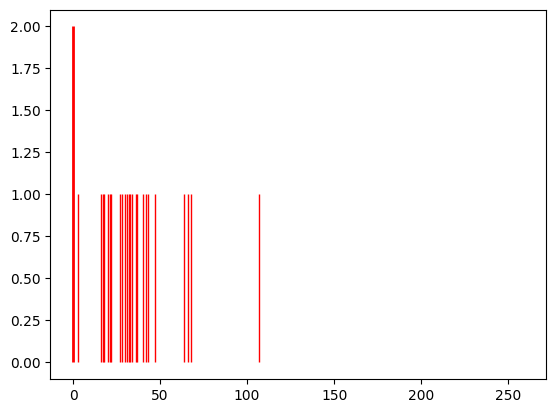

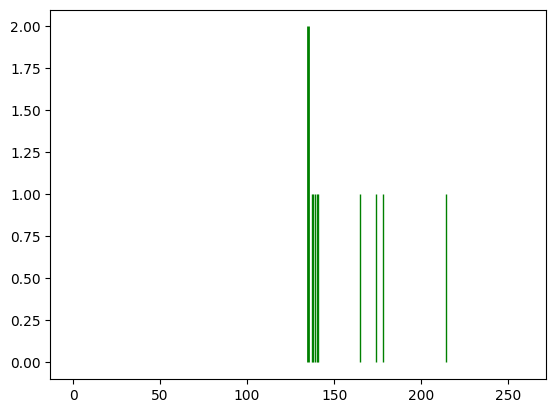

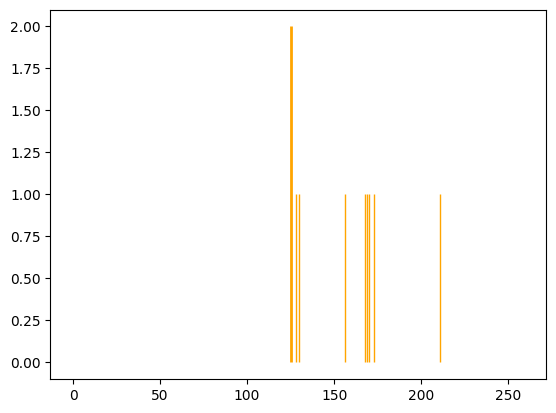

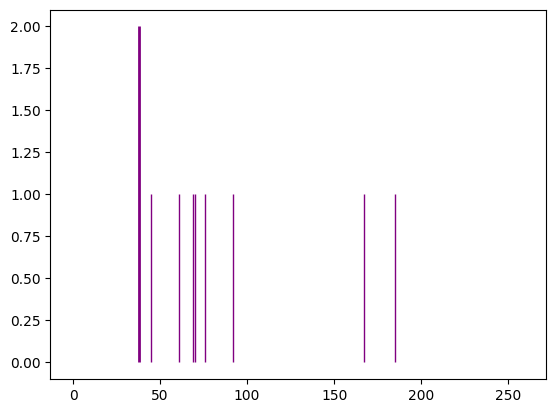

...

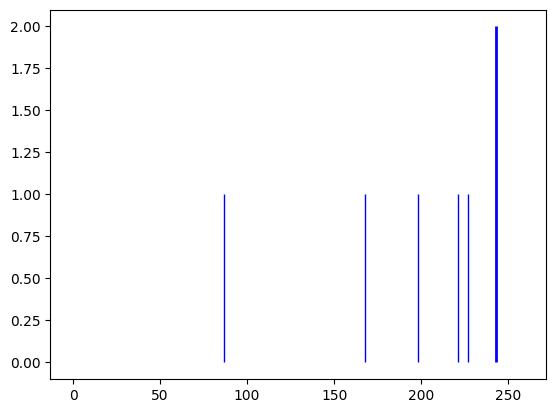

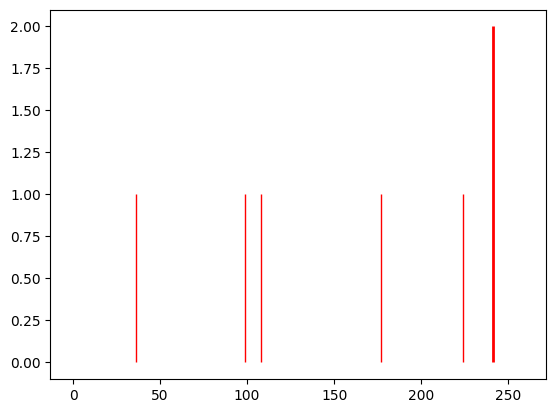

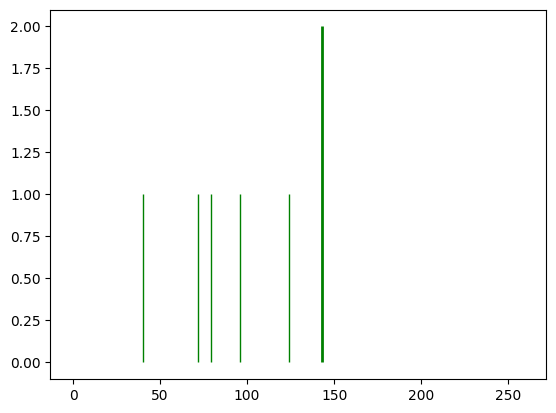

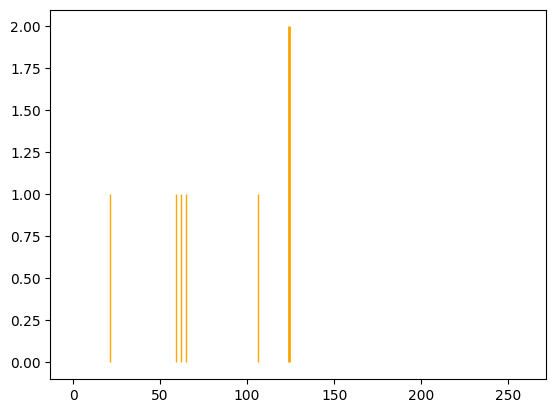

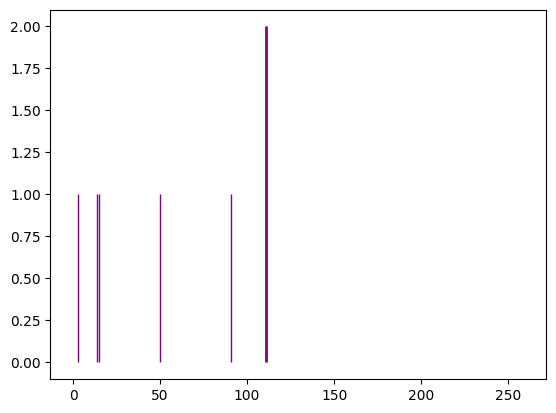

Spectrum num=2515, size=211, matched=97, frac=0.4597156398104265
Spectrum num=2515, size=211, matched=50, frac=0.23696682464454977


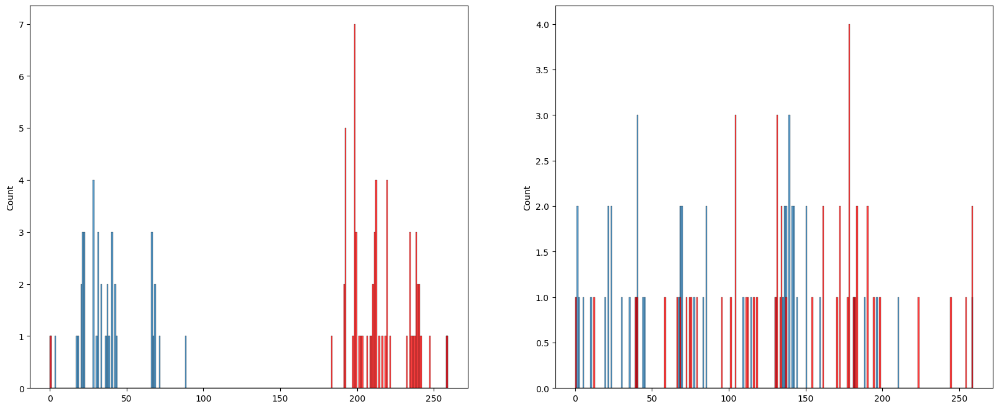

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 133, 7, 8, 9, 138, 10, 12, 13, 142, 15, 14, 17, 18, 143, 21, 24, 154, 28, 157, 163, 37, 40, 50, 54, 61, 66, 68, 75, 80, 208, 83, 84, 92, 96, 115, 117, 123}
{0, 6, 11, 25, 30, 31, 34, 35, 38, 171, 44, 47, 176, 178, 51, 52, 181, 62, 192, 65, 70, 72, 76, 77, 205, 207, 82, 85, 110, 120, 121, 124}
{160, 33, 100, 39, 71, 73, 41, 43, 103, 109, 177, 116, 53, 58, 94, 63}
{200, 137, 104, 16, 144, 180}
{42, 91, 81, 152, 155, 188, 95}
{67, 107, 141, 79, 179, 23, 159}
{161, 145, 119, 187, 60, 191}


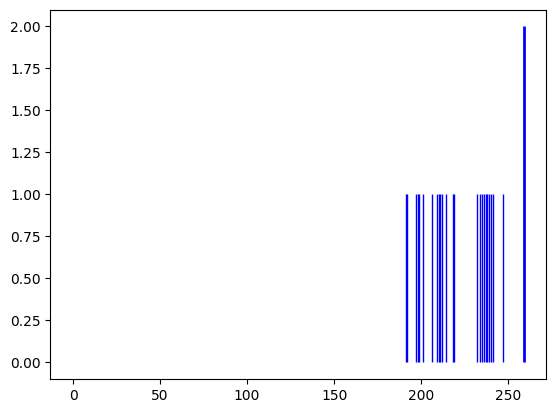

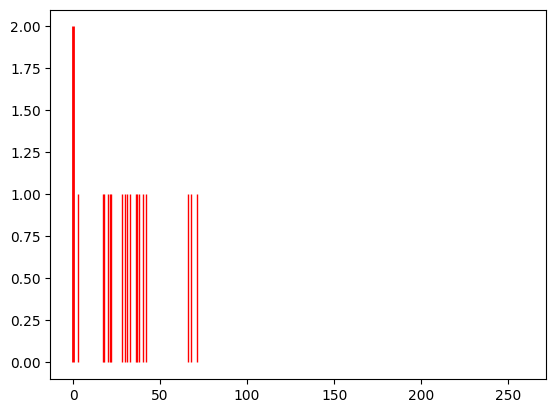

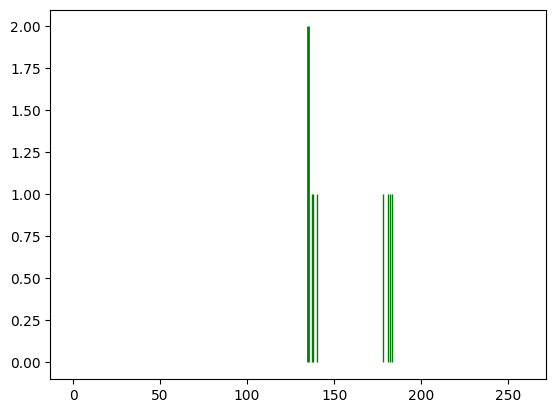

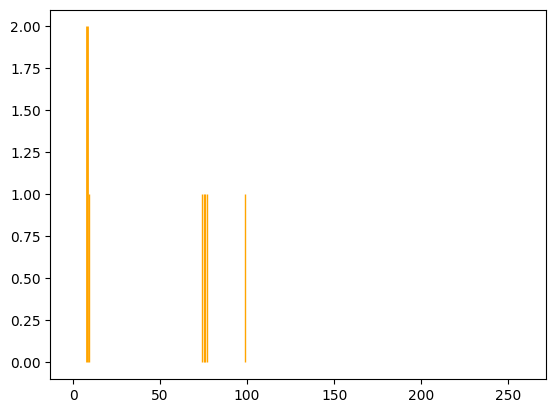

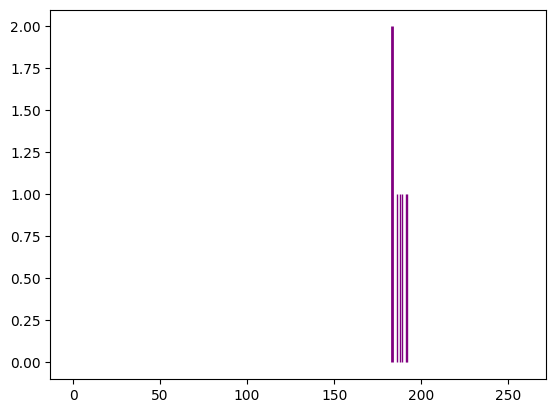

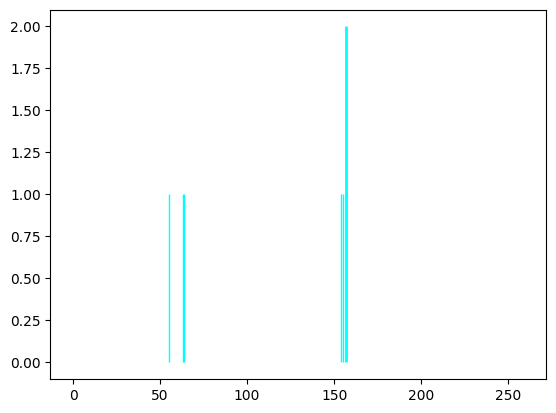

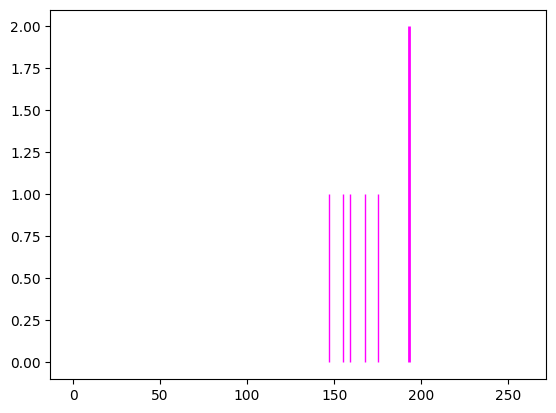

Spectrum num=2527, size=255, matched=89, frac=0.34901960784313724
Spectrum num=2527, size=255, matched=57, frac=0.2235294117647059


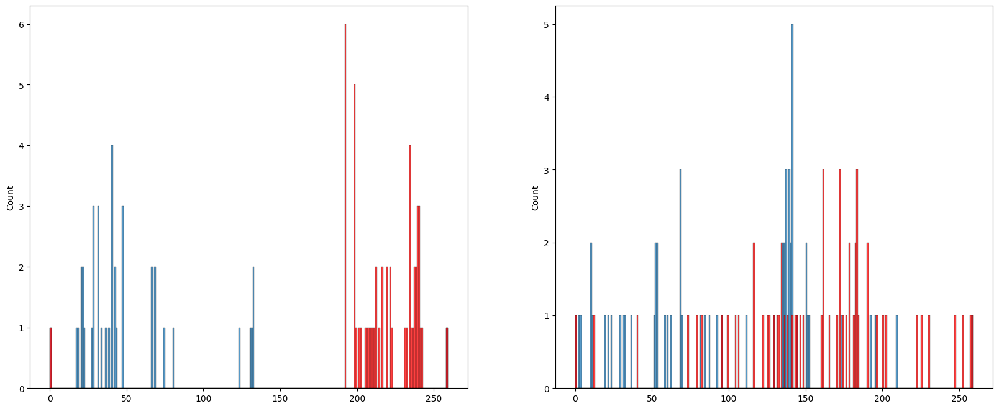

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 7, 8, 9, 10, 13, 142, 15, 16, 18, 24, 28, 158, 34, 36, 41, 170, 43, 45, 46, 49, 55, 183, 58, 62, 63, 78, 207, 80, 83, 88, 92, 96, 242, 117}
{0, 14, 17, 19, 148, 152, 30, 35, 40, 42, 44, 48, 50, 178, 56, 68, 81, 87, 218, 221, 226, 99, 229, 107, 236, 109, 108, 119}
{129, 130, 69, 102, 38, 233, 112, 240, 21, 86, 122}
{128, 234, 155, 47, 93, 219, 29}
{199, 73, 77, 254, 126, 31}
{193, 230, 203, 53, 214}
{6, 71, 137, 143, 216}
{32, 11, 175, 51, 215, 124}


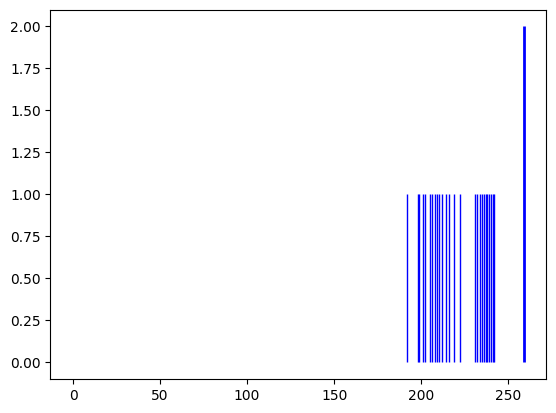

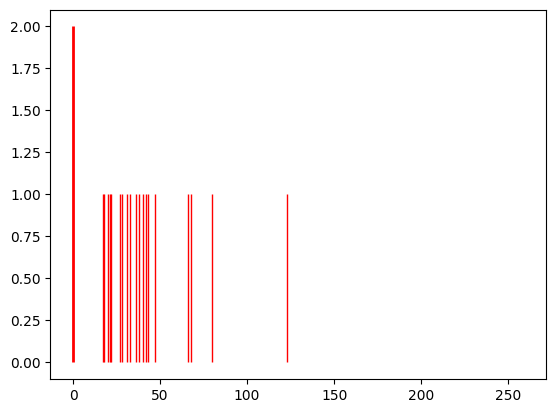

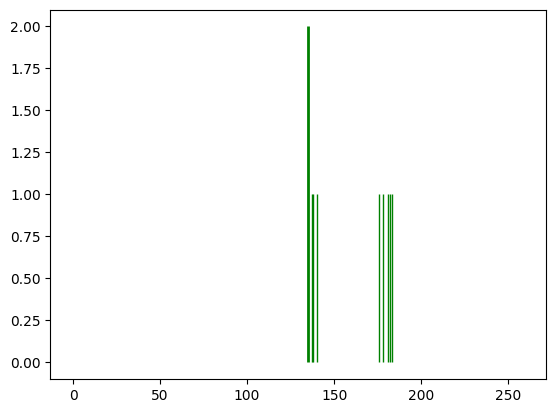

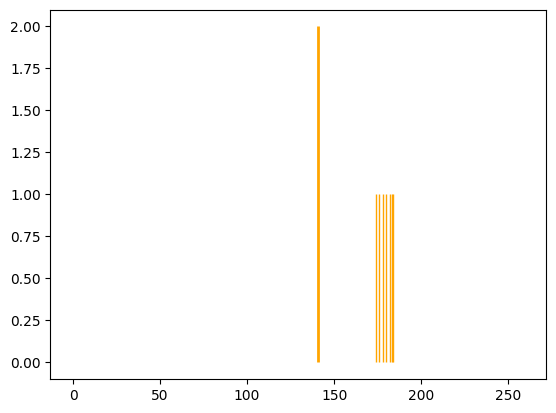

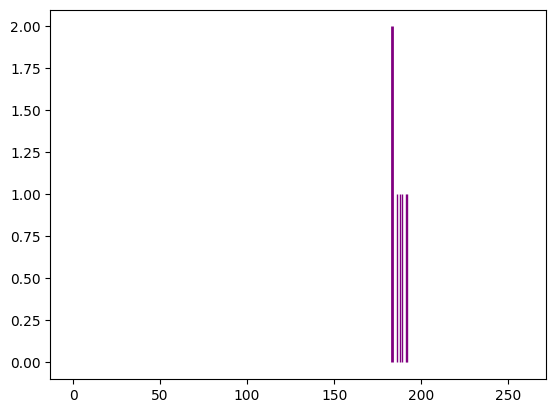

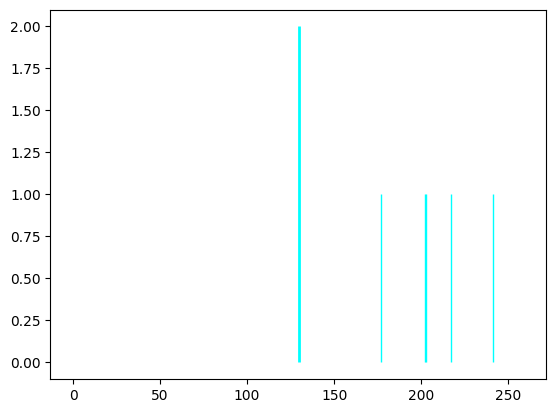

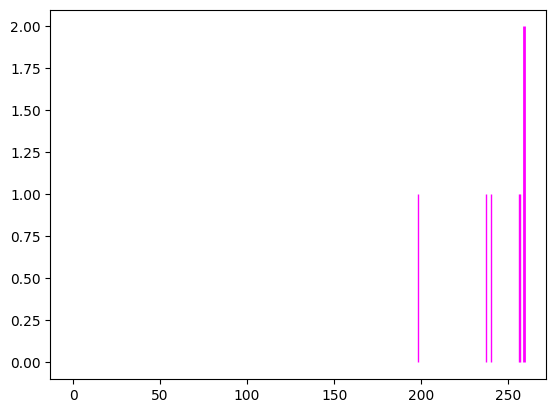

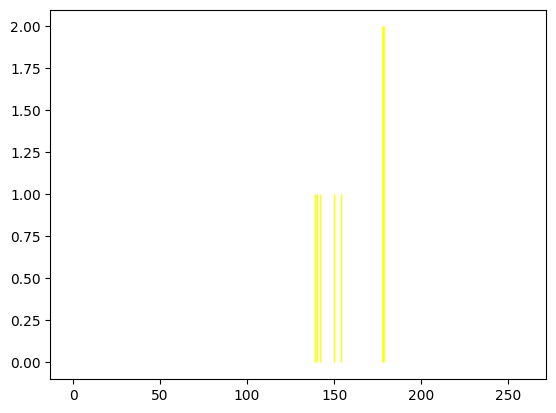

Spectrum num=2535, size=111, matched=41, frac=0.36936936936936937
Spectrum num=2535, size=111, matched=13, frac=0.11711711711711711


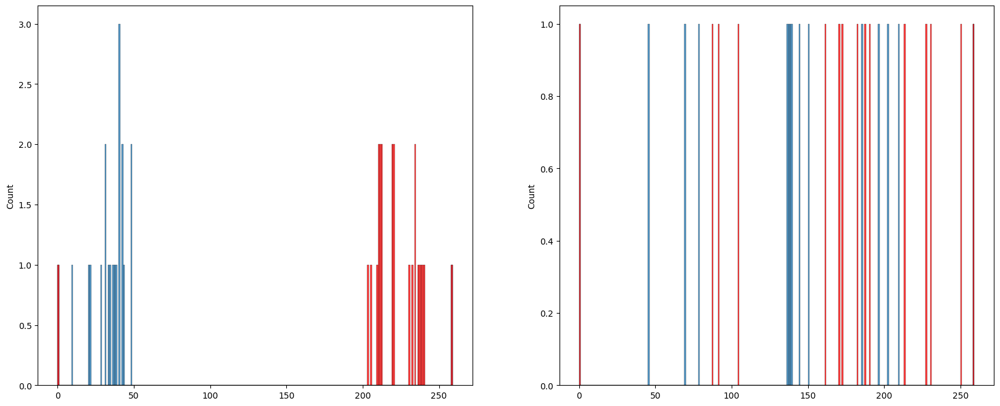

<Figure size 1200x800 with 0 Axes>

{64, 1, 33, 39, 9, 13, 15, 81, 18, 19, 84, 20, 22, 23, 27, 28}
{0, 34, 68, 5, 36, 7, 72, 10, 77, 49, 50, 51, 92, 62}
{67, 99, 100, 104, 47, 17, 56}
{73, 42, 24, 25, 95}


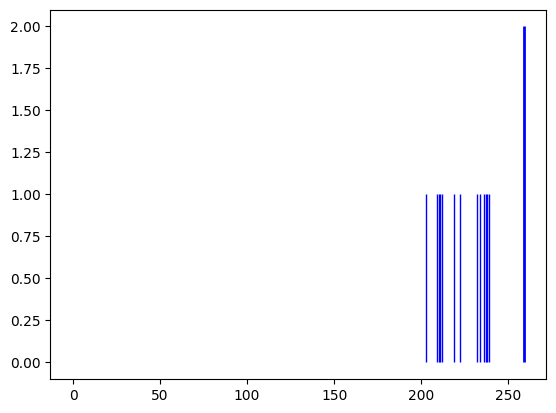

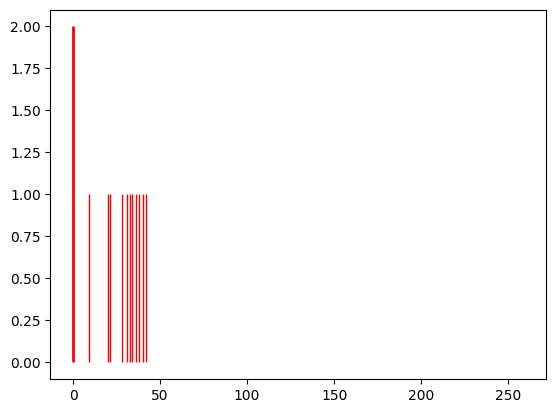

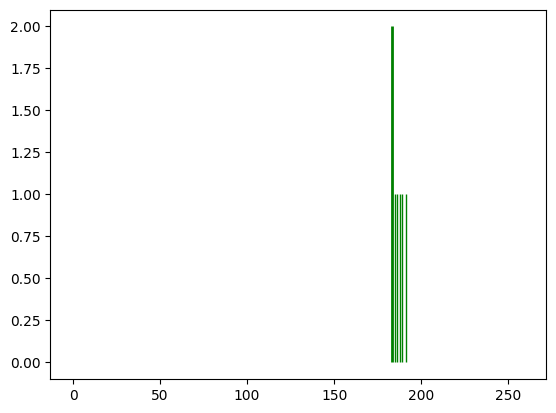

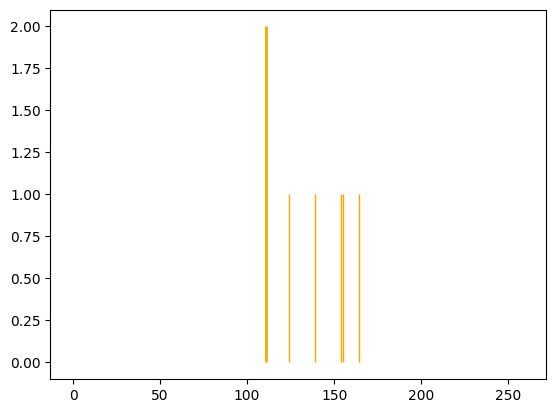

Spectrum num=2544, size=264, matched=99, frac=0.375
Spectrum num=2544, size=264, matched=63, frac=0.23863636363636365


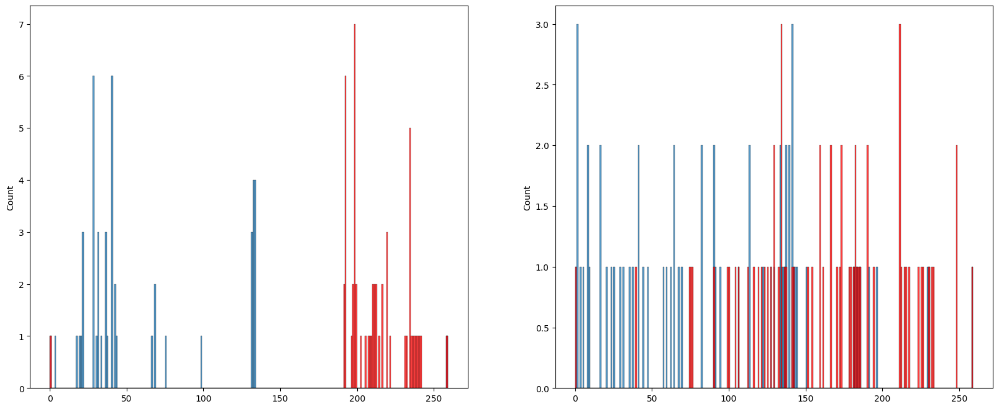

<Figure size 1200x800 with 0 Axes>

{0, 2, 3, 4, 5, 6, 7, 8, 10, 11, 13, 142, 15, 14, 18, 19, 21, 26, 27, 29, 30, 35, 169, 43, 45, 174, 49, 180, 54, 55, 75, 76, 77, 91, 97, 100, 102, 113}
{1, 132, 133, 263, 136, 9, 140, 12, 144, 150, 31, 36, 38, 39, 172, 48, 56, 60, 190, 72, 74, 81, 212, 93, 221, 103, 118, 120, 127}
{256, 129, 175, 47, 145, 111, 147, 20, 244, 23, 25}
{32, 33, 66, 257, 37, 70, 40, 234, 17, 114, 178, 52, 51, 24}
{195, 67, 138, 44, 237, 86, 157}
{224, 68, 173, 241, 250, 61}
{225, 186, 176, 85, 122}
{104, 171, 78, 88, 219}
{166, 262, 106, 203, 210}


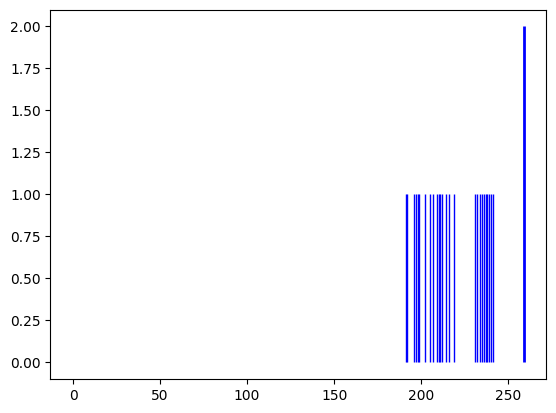

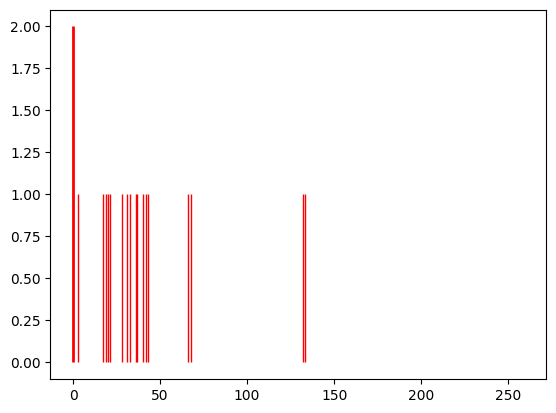

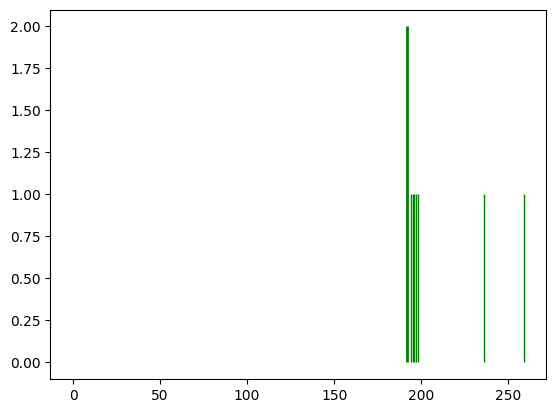

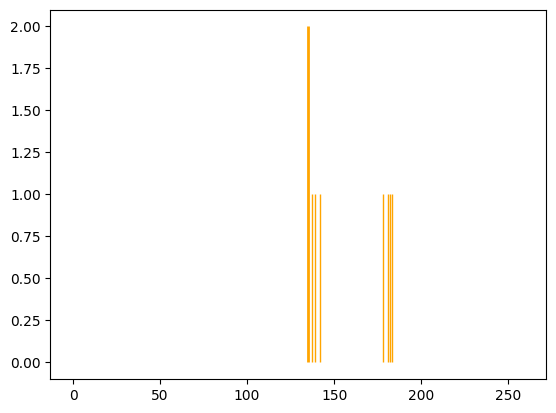

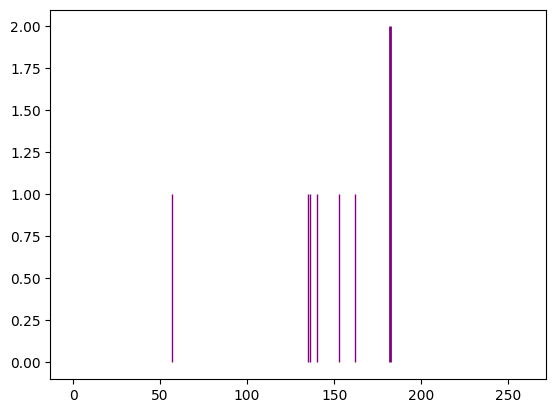

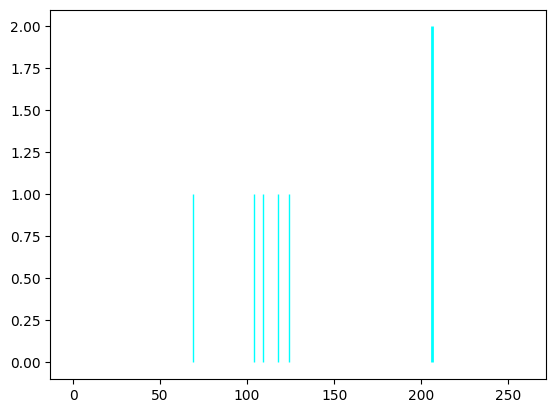

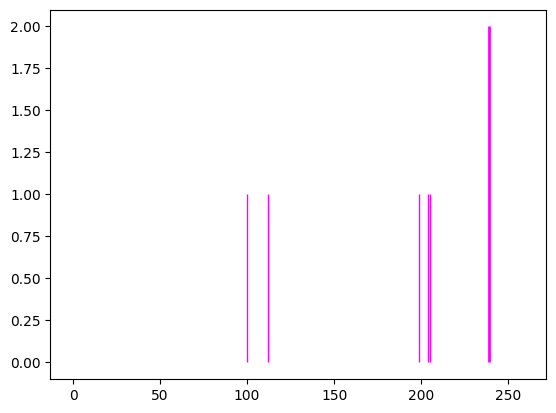

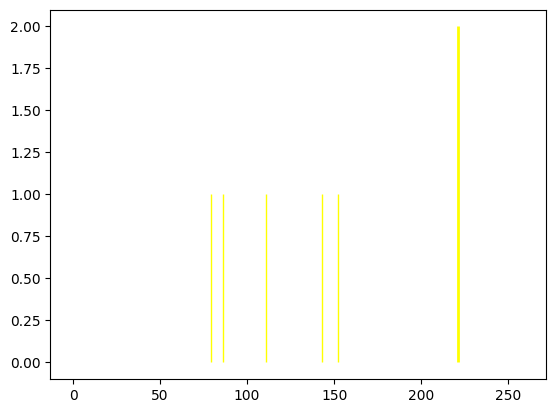

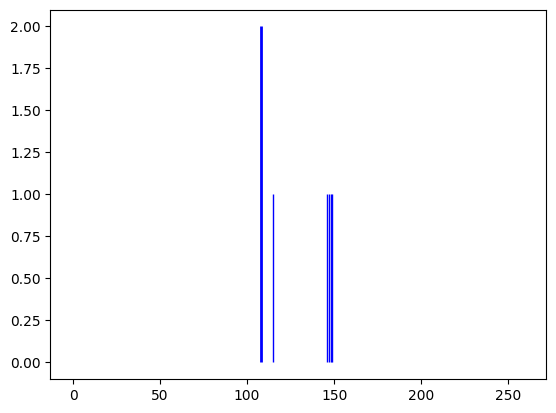

Spectrum num=2575, size=416, matched=140, frac=0.33653846153846156
Spectrum num=2575, size=416, matched=71, frac=0.17067307692307693


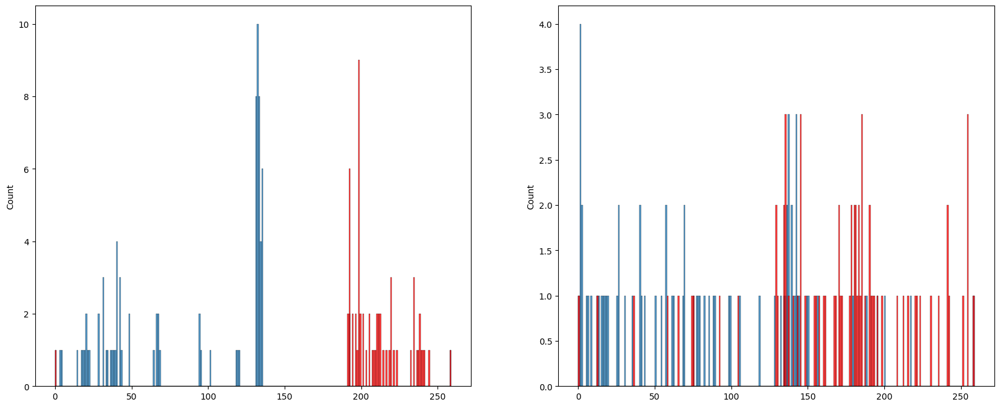

<Figure size 1200x800 with 0 Axes>

{1, 258, 131, 134, 6, 136, 10, 11, 144, 17, 22, 29, 30, 159, 415, 297, 299, 301, 175, 50, 182, 59, 63, 69, 71, 201, 206, 336, 81, 94, 229, 357, 362, 110, 239, 241, 250}
{0, 128, 2, 3, 4, 5, 7, 8, 9, 13, 269, 16, 401, 20, 23, 24, 26, 27, 411, 160, 34, 298, 43, 44, 46, 47, 58, 60, 328, 73, 77, 339, 84, 89, 349, 223, 105, 116, 119, 121}
{64, 32, 193, 35, 323, 395, 14, 403, 62}
{312, 103, 296, 40, 177, 181, 280, 125, 254}
{320, 167, 145, 370, 117, 54, 86, 152, 25}
{122, 273, 310, 87, 90, 91}
{353, 98, 42, 45, 114, 190}
{359, 168, 267, 337, 178, 248}
{290, 141, 19, 247, 253}
{203, 302, 207, 278, 55}
{101, 12, 48, 307, 345}
{293, 268, 399, 157, 285}
{38, 142, 238, 340, 277}
{197, 199, 143, 82, 409}
{391, 327, 333, 348, 95}
{385, 194, 264, 170, 191}
{332, 78, 398, 413, 31}
{321, 15, 209, 284, 124}


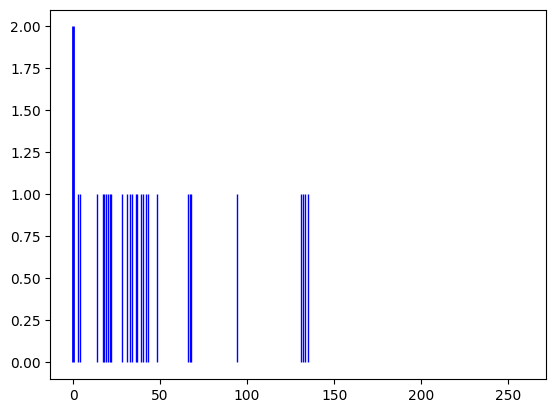

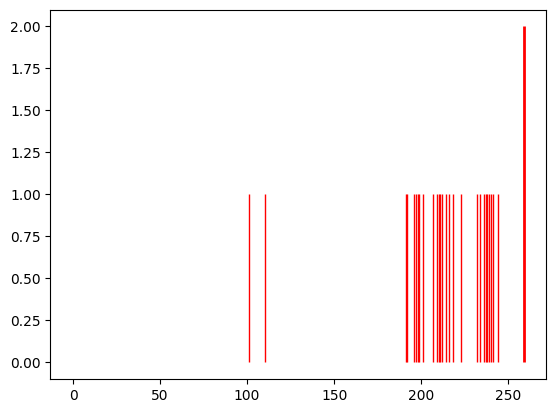

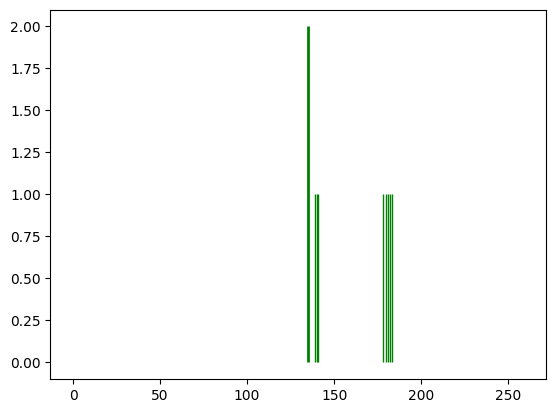

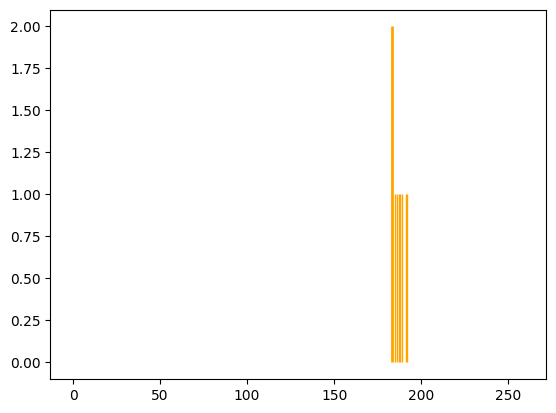

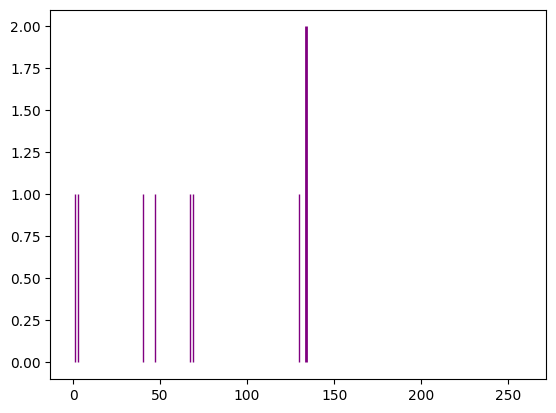

...

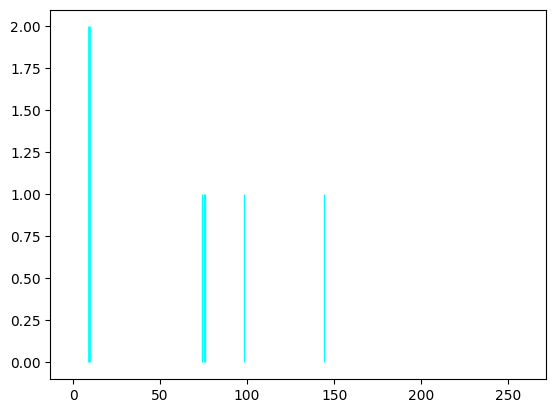

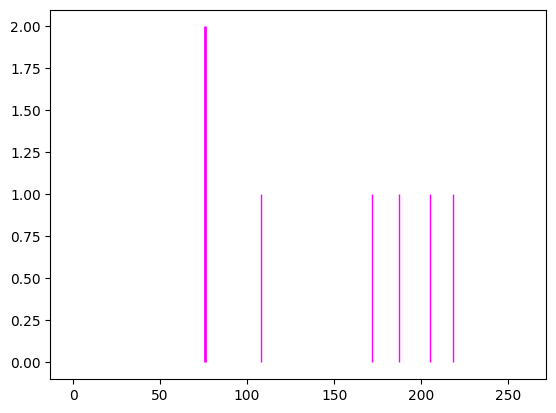

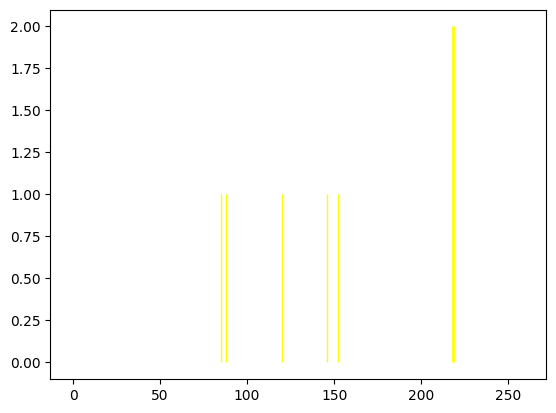

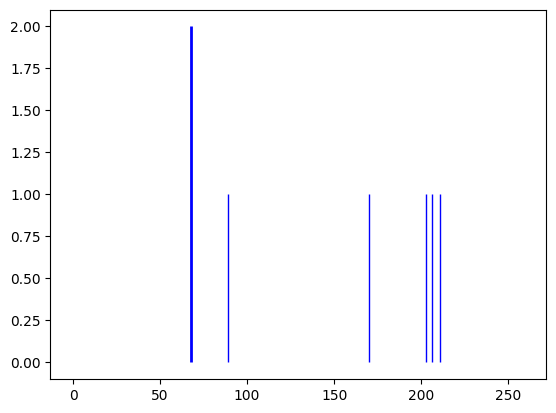

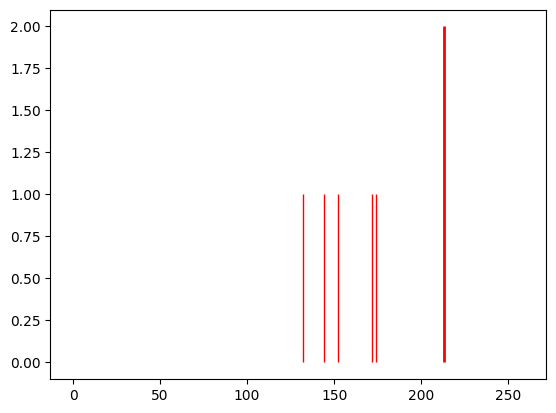

Spectrum num=2577, size=69, matched=24, frac=0.34782608695652173
Spectrum num=2577, size=69, matched=13, frac=0.18840579710144928


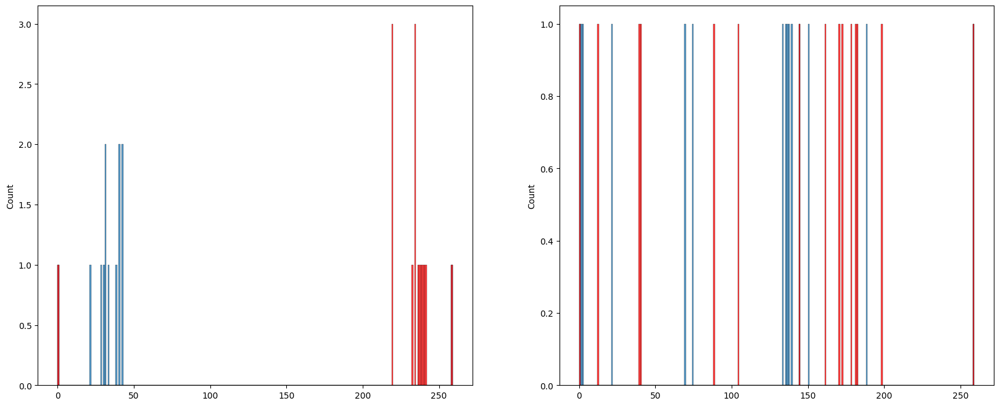

<Figure size 1200x800 with 0 Axes>

{1, 3, 4, 7, 8, 42, 14, 47, 15, 17}
{0, 36, 5, 6, 9, 11, 43, 25, 29, 31}
{34, 37, 19, 52, 53, 54, 55}


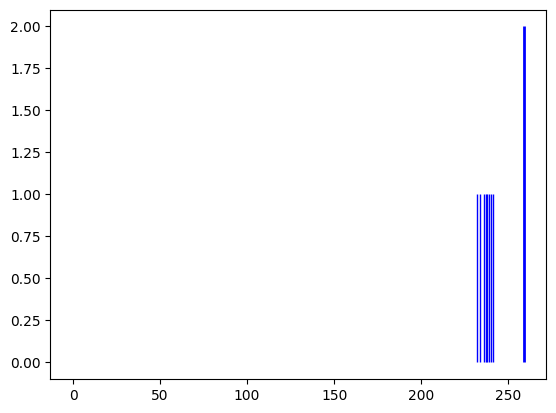

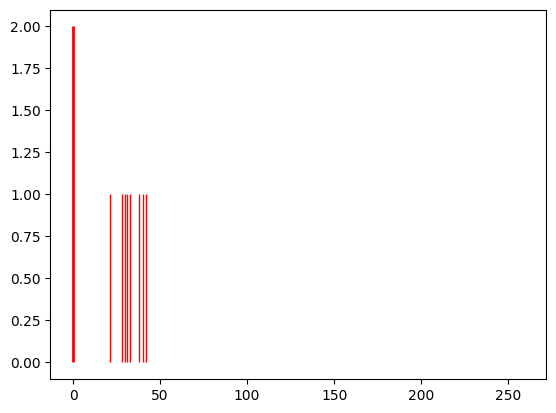

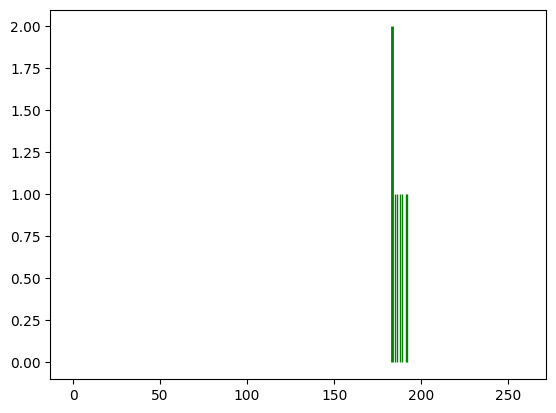

Spectrum num=2603, size=584, matched=114, frac=0.1952054794520548
Spectrum num=2603, size=584, matched=102, frac=0.17465753424657535


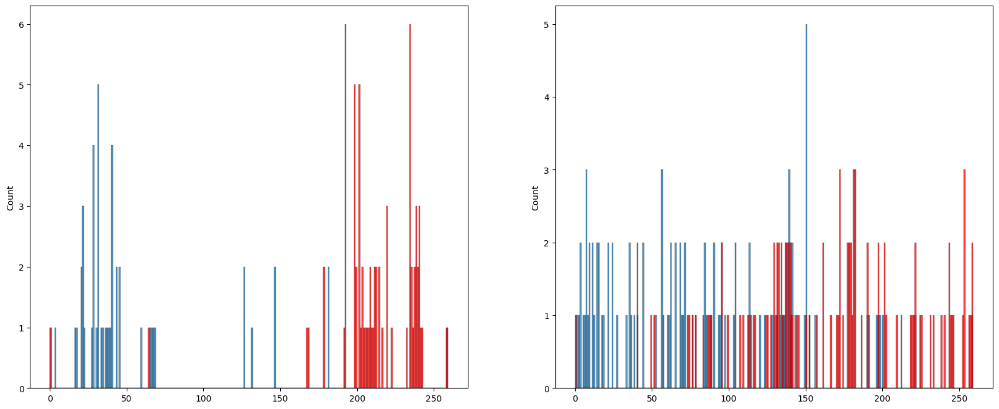

<Figure size 1200x800 with 0 Axes>

{1, 2, 3, 4, 5, 390, 7, 8, 9, 10, 6, 12, 13, 15, 18, 530, 149, 21, 24, 281, 27, 29, 30, 157, 33, 163, 548, 295, 40, 430, 46, 174, 569, 67, 198, 70, 203, 76, 207, 209, 470, 87, 107, 109, 382}
{0, 14, 144, 16, 19, 23, 32, 549, 427, 44, 45, 304, 178, 50, 311, 57, 60, 197, 71, 201, 206, 81, 82, 215, 92, 104}
{544, 34, 36, 37, 75, 172, 173, 80, 49, 400, 179, 56, 26, 94}
{420, 134, 424, 232, 208, 244, 148, 350}
{325, 42, 77, 156, 181, 373, 444, 61}
{394, 434, 86, 55, 151, 381}
{334, 111, 367, 241, 404, 437}
{73, 561, 466, 372, 343, 152}
{226, 131, 169, 137, 425, 533}
{193, 168, 41, 330, 83, 475, 348, 255}
{322, 491, 302, 48, 245, 251}
{267, 140, 429, 433, 314, 446}
{384, 422, 521, 22, 507, 124}
{229, 43, 269, 276, 279, 189}
{258, 135, 141, 145, 190, 383}
{545, 165, 143, 567, 93}
{546, 136, 106, 558, 180}
{256, 452, 554, 183, 154}
{480, 261, 435, 280, 155}
{550, 368, 498, 313, 31}
{321, 289, 518, 200, 271}
{291, 327, 526, 219, 318}
{161, 74, 332, 237, 440}
{421, 456, 297, 298, 240}
{35, 358, 

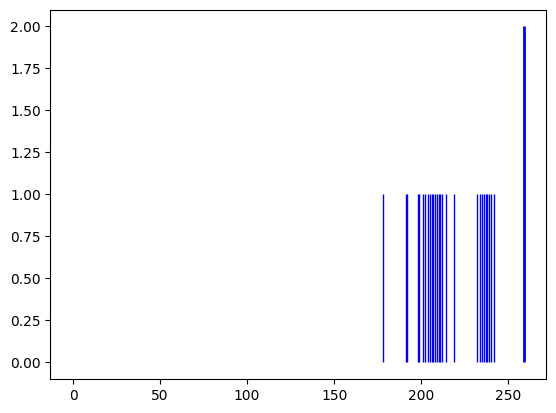

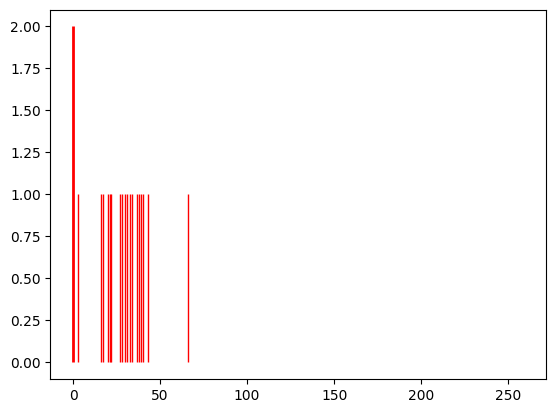

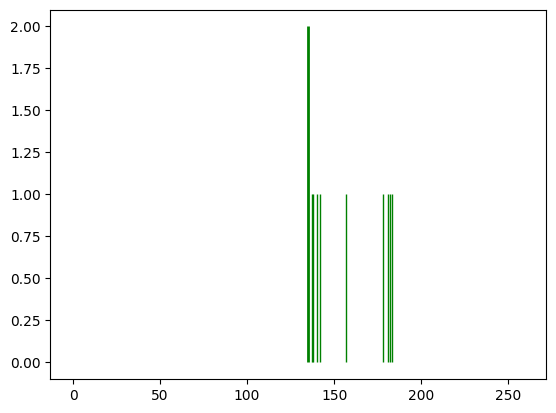

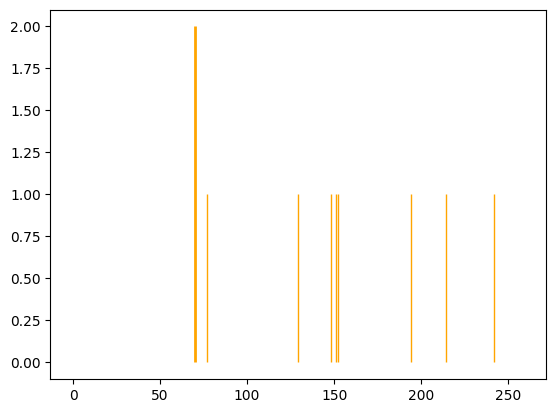

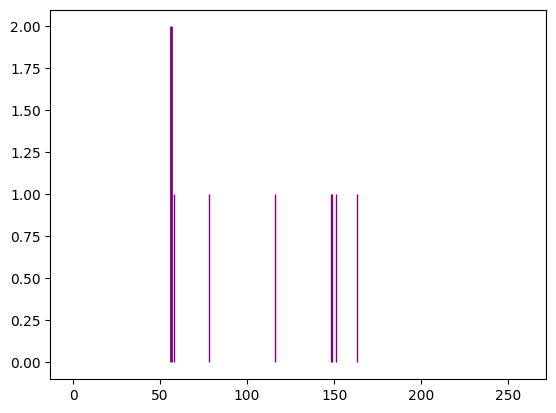

...

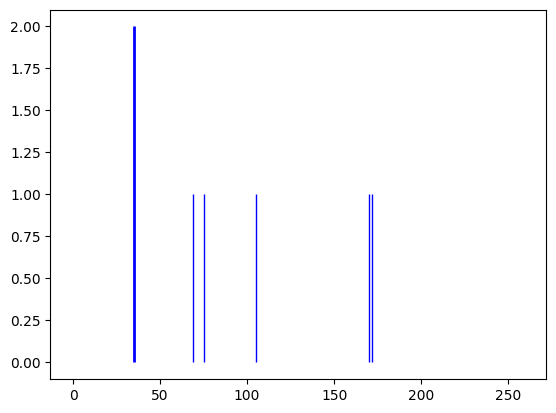

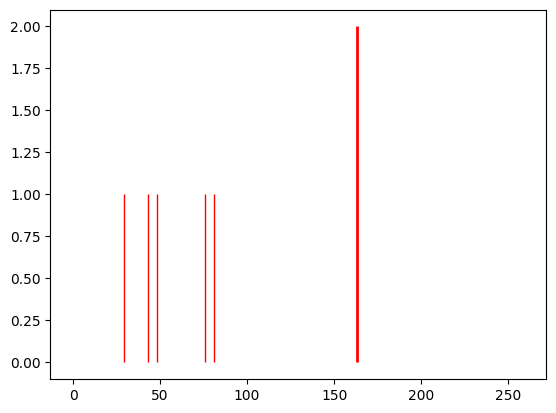

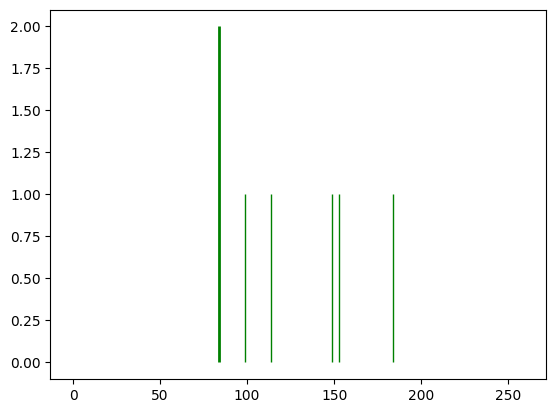

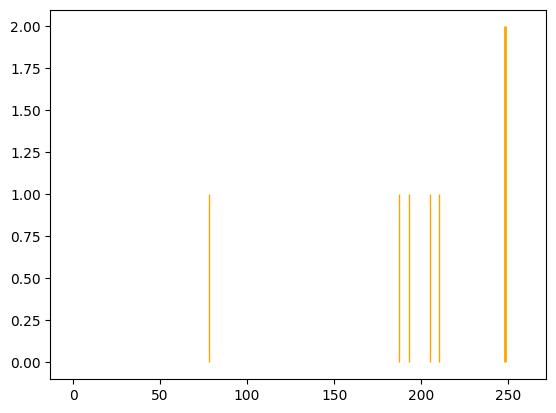

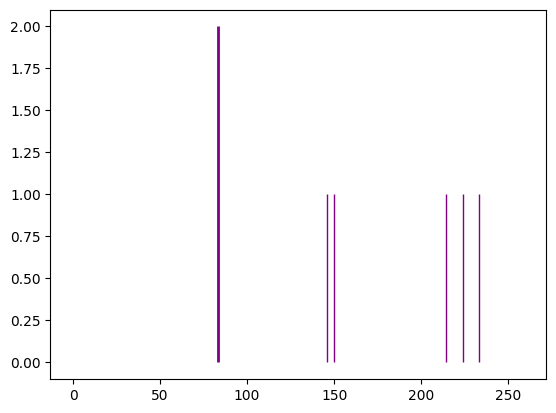

Spectrum num=2608, size=86, matched=26, frac=0.3023255813953488
Spectrum num=2608, size=86, matched=12, frac=0.13953488372093023


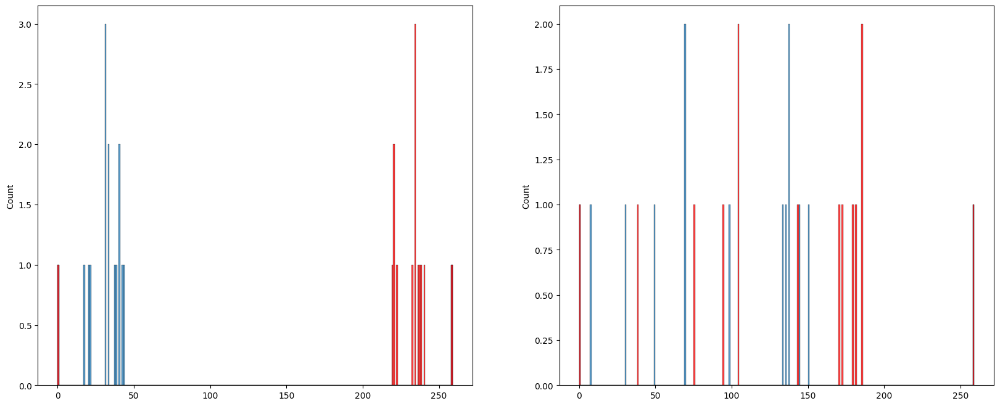

<Figure size 1200x800 with 0 Axes>

{0, 2, 67, 4, 34, 13, 46, 47, 49, 52, 56, 57}
{3, 5, 39, 8, 75, 45, 15, 79, 51, 24, 27, 31}
{6, 9, 10, 42, 11, 18, 21, 25, 26}
{69, 70, 12, 76, 48, 83, 84, 85}


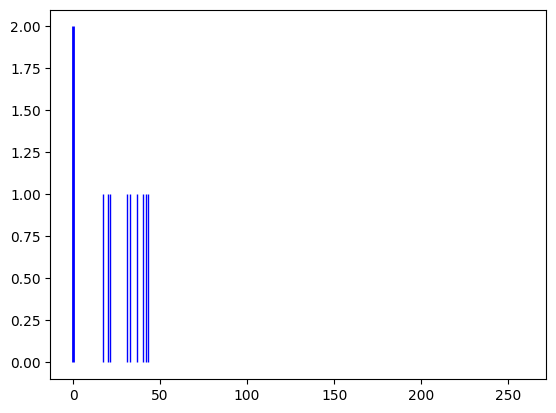

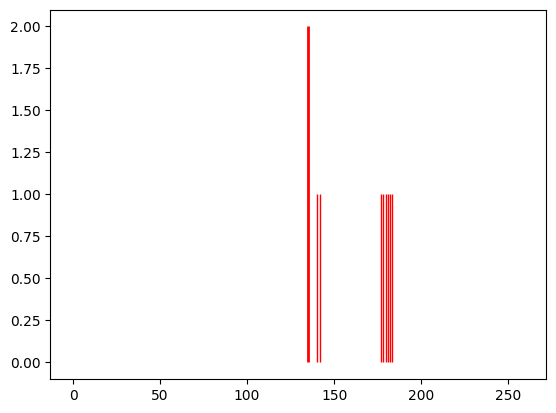

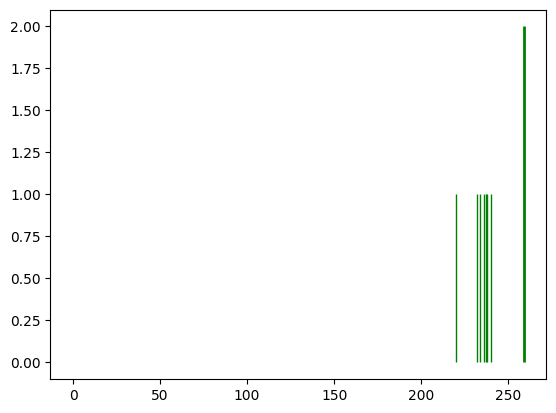

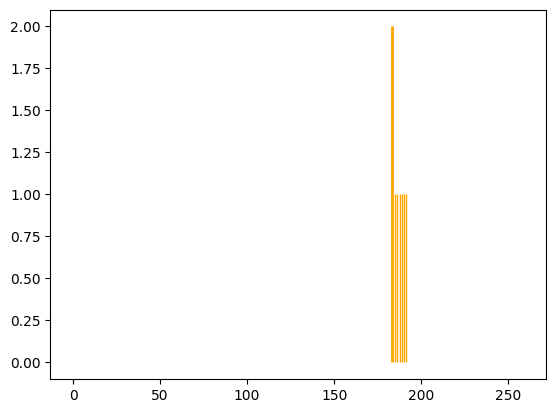

Spectrum num=2614, size=84, matched=9, frac=0.10714285714285714
Spectrum num=2614, size=84, matched=10, frac=0.11904761904761904


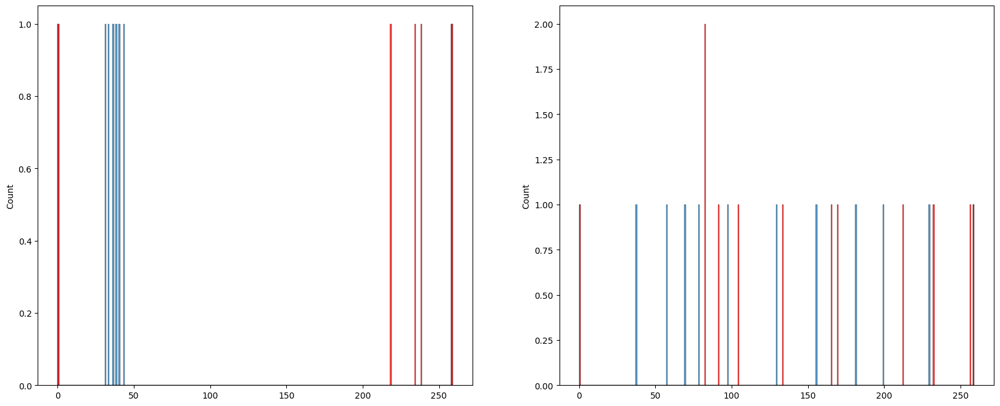

<Figure size 1200x800 with 0 Axes>

Spectrum num=2651, size=255, matched=33, frac=0.12941176470588237
Spectrum num=2651, size=255, matched=45, frac=0.17647058823529413


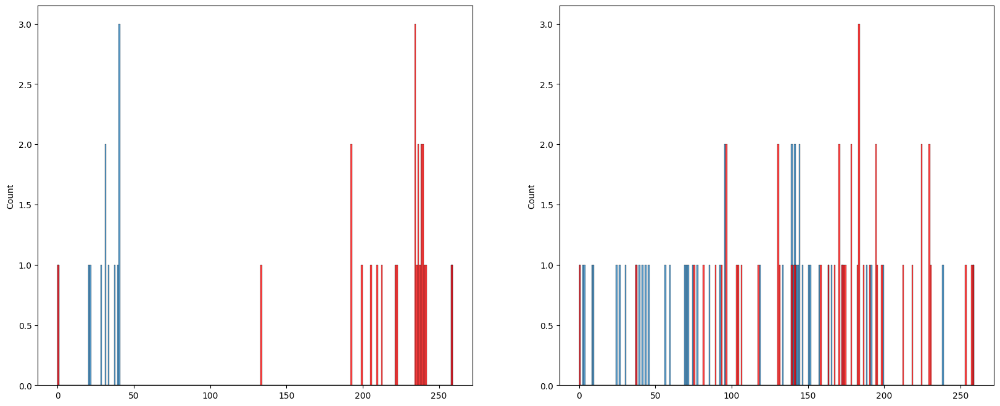

<Figure size 1200x800 with 0 Axes>

{33, 1, 3, 2, 5, 6, 7, 8, 41, 15, 47, 209, 50, 213, 28, 189, 31}
{0, 9, 42, 16, 49, 53, 61}
{99, 52, 23, 184, 183, 27}
{128, 162, 230, 238, 95}
{194, 234, 20, 149, 157}
{225, 35, 56, 188, 221}
{45, 18, 83, 55, 30}
{66, 4, 204, 181, 62}
{32, 244, 214, 127, 191}


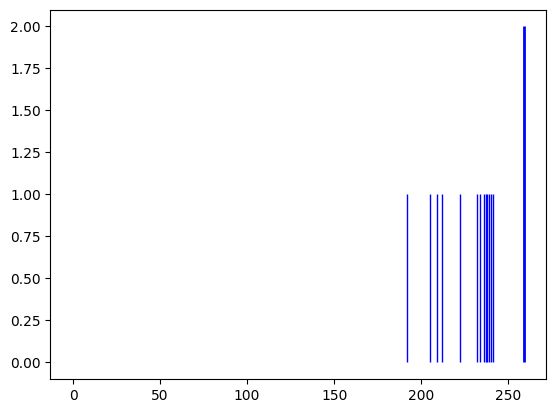

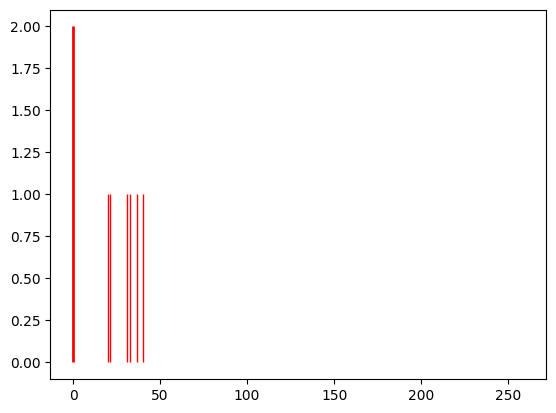

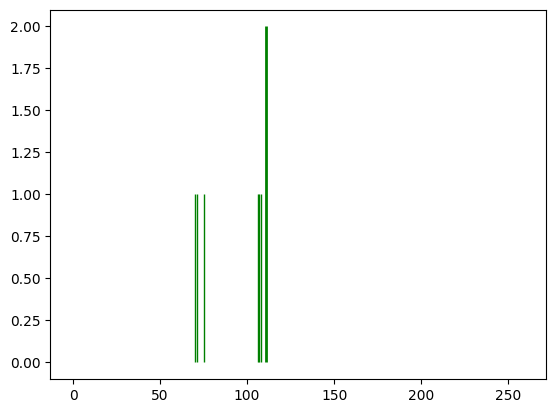

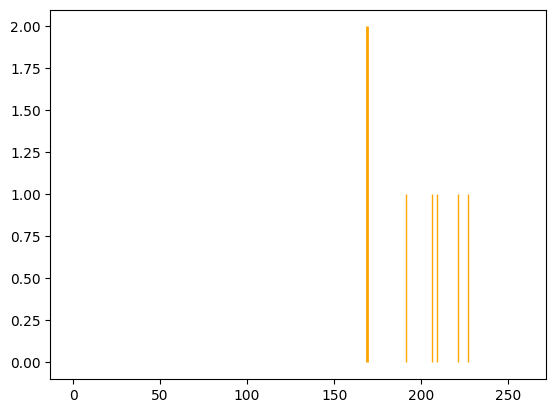

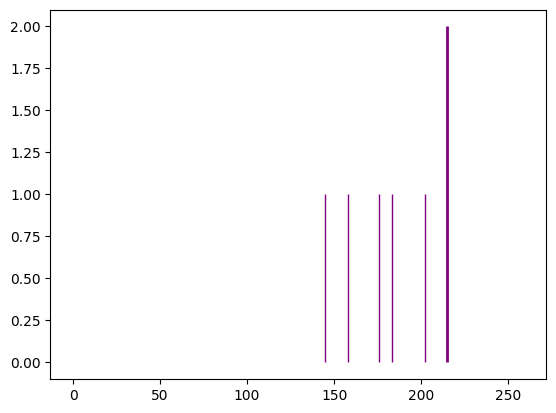

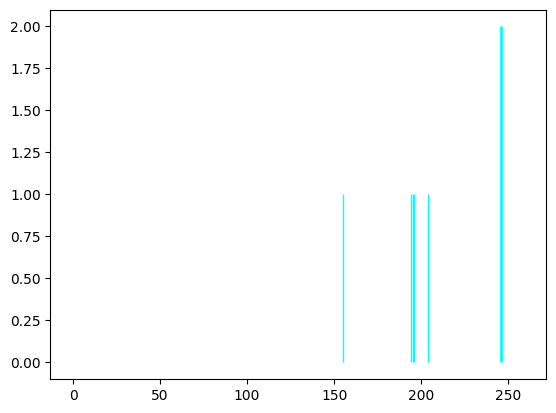

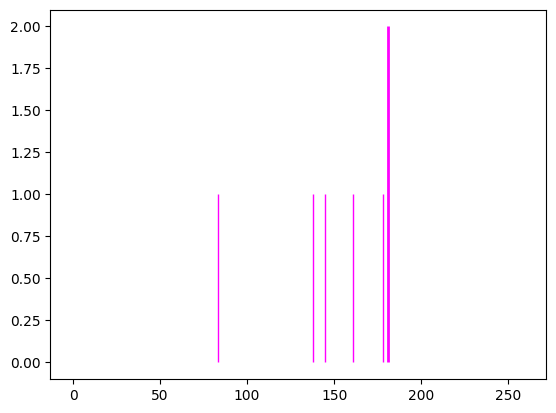

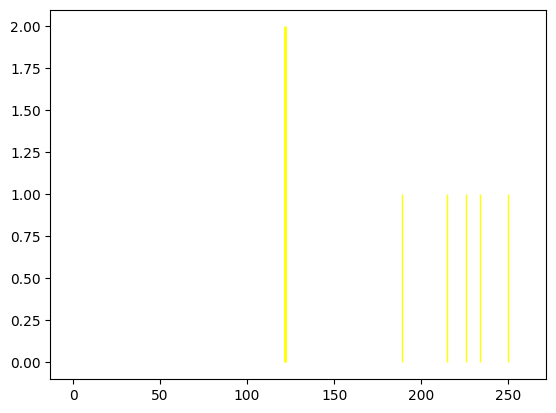

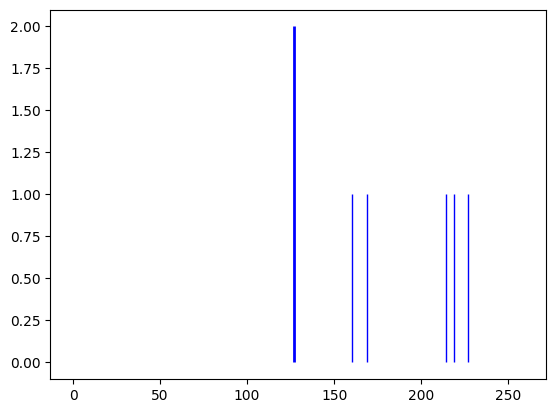

Spectrum num=2682, size=243, matched=65, frac=0.2674897119341564
Spectrum num=2682, size=243, matched=51, frac=0.20987654320987653


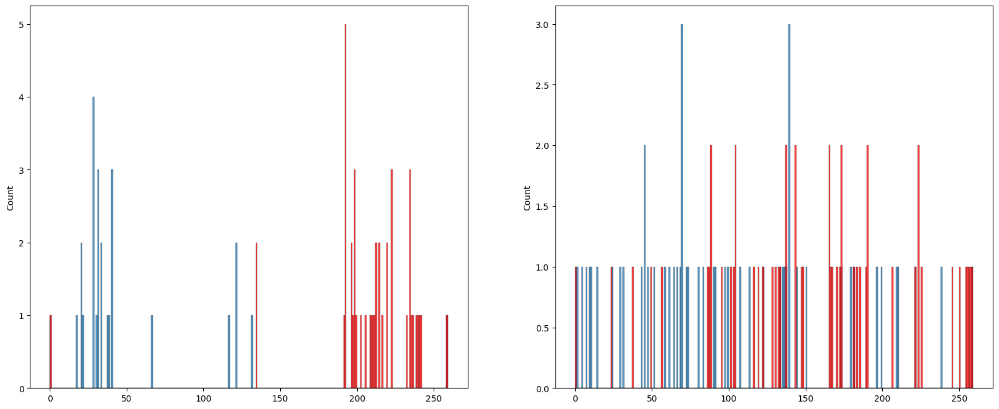

<Figure size 1200x800 with 0 Axes>

{0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 137, 13, 18, 21, 22, 27, 31, 32, 168, 41, 48, 54, 78, 89, 91, 118}
{97, 162, 194, 1, 69, 42, 11, 12, 19, 86, 23, 92, 94}
{164, 75, 14, 47, 17, 126}
{130, 50, 88, 29, 159}
{68, 167, 232, 114, 95}
{225, 39, 15, 211, 181}


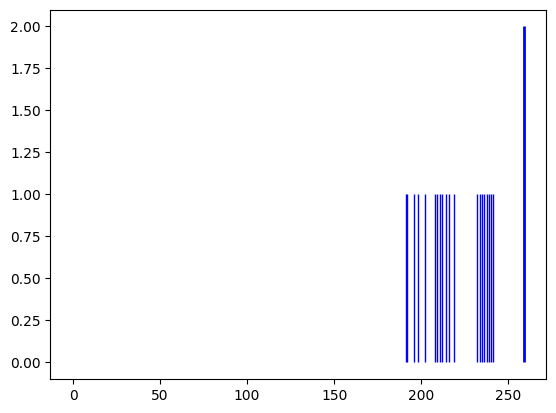

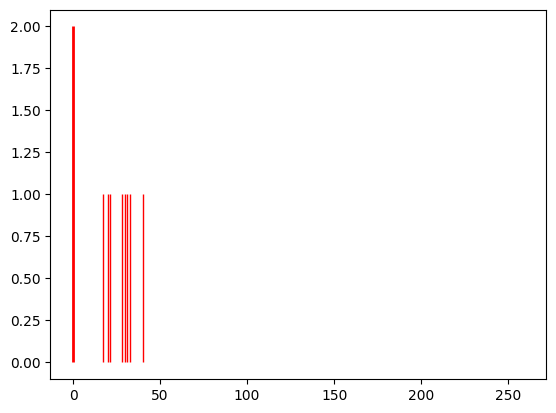

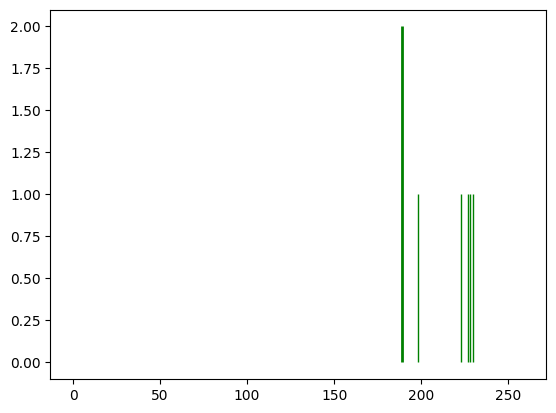

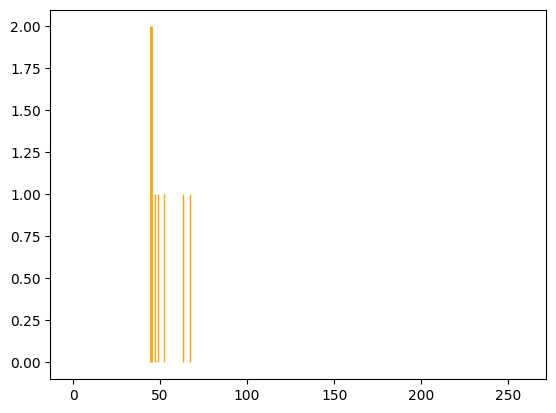

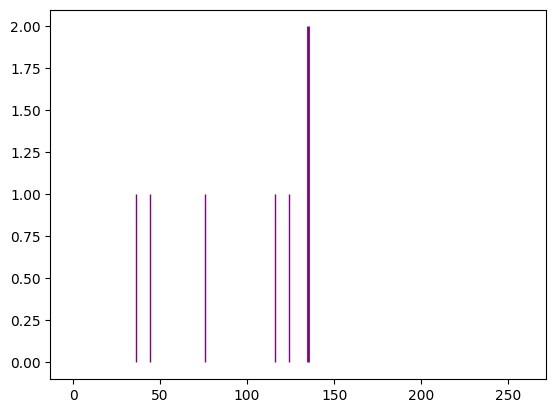

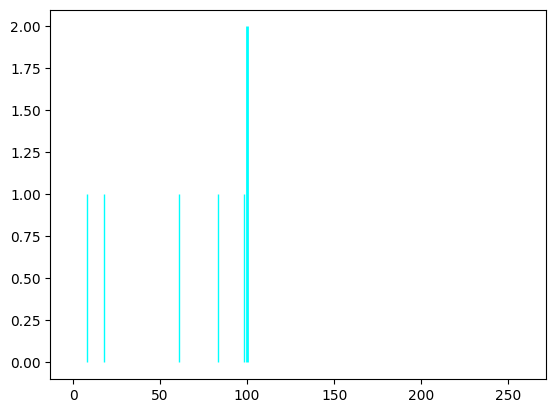

Spectrum num=2693, size=70, matched=19, frac=0.2714285714285714
Spectrum num=2693, size=70, matched=10, frac=0.14285714285714285


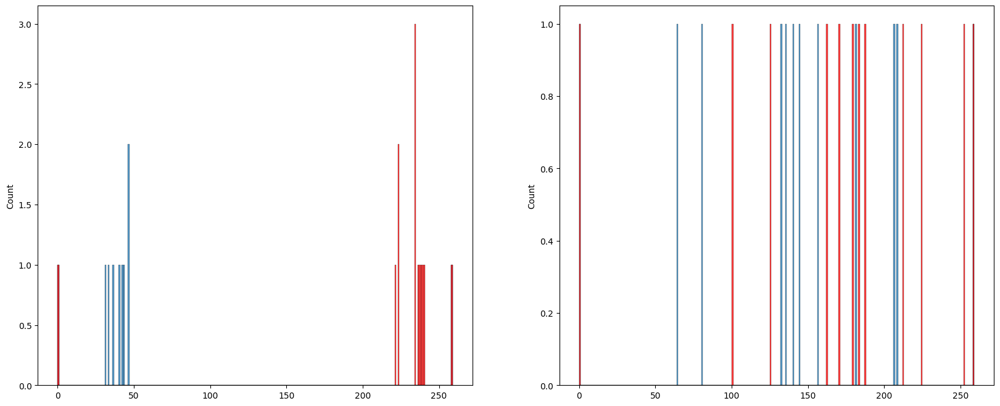

<Figure size 1200x800 with 0 Axes>

{1, 3, 4, 6, 8, 10, 18, 52, 26}


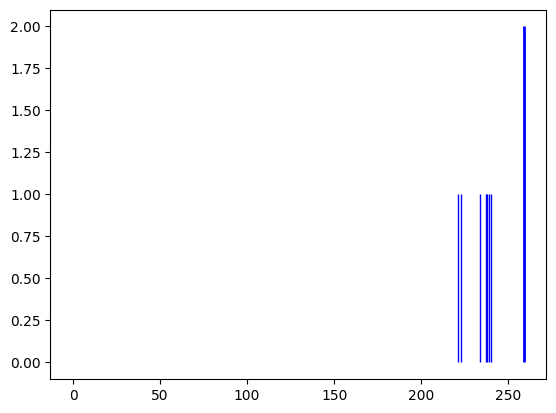

Spectrum num=2848, size=162, matched=4, frac=0.024691358024691357
Spectrum num=2848, size=162, matched=43, frac=0.2654320987654321


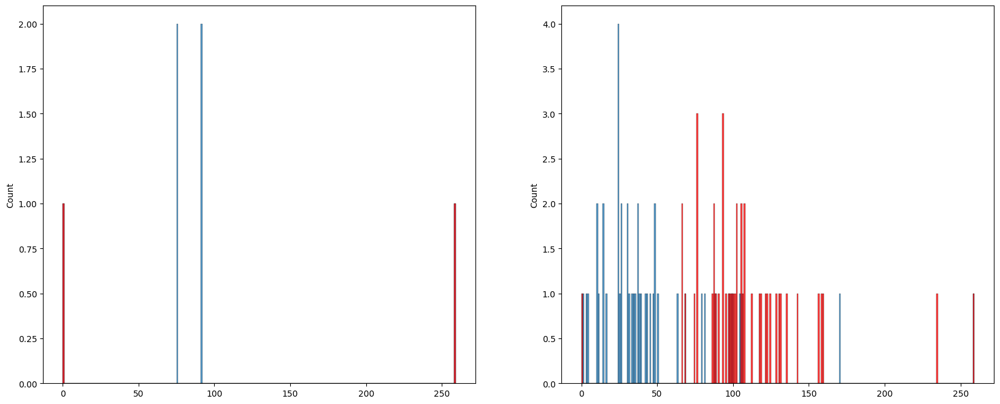

<Figure size 1200x800 with 0 Axes>

{99, 68, 17, 119, 59, 125, 62}
{161, 76, 12, 19, 84, 149, 27, 60}
{7, 8, 20, 22, 151, 28, 30}
{114, 52, 23, 89, 58}
{69, 103, 41, 48, 115, 120}
{32, 6, 11, 79, 51}
{74, 142, 83, 29, 63}


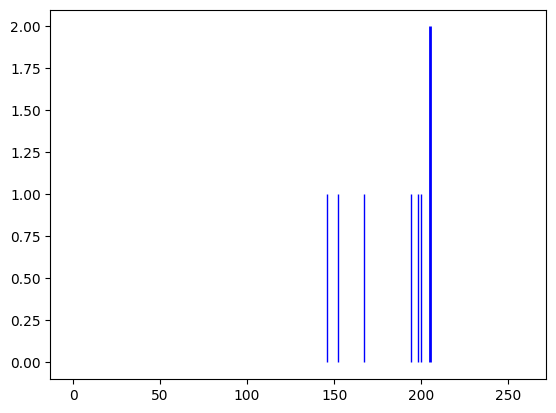

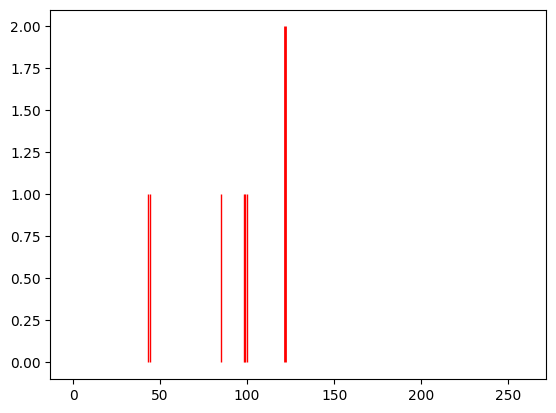

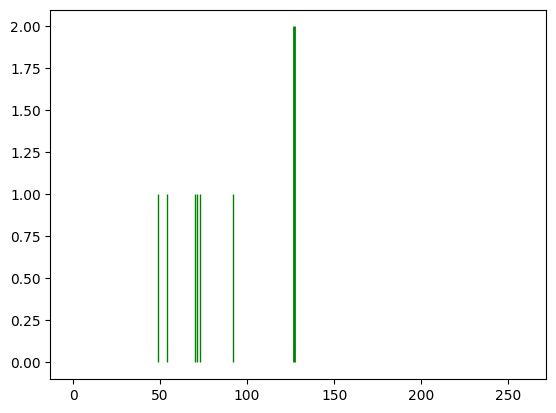

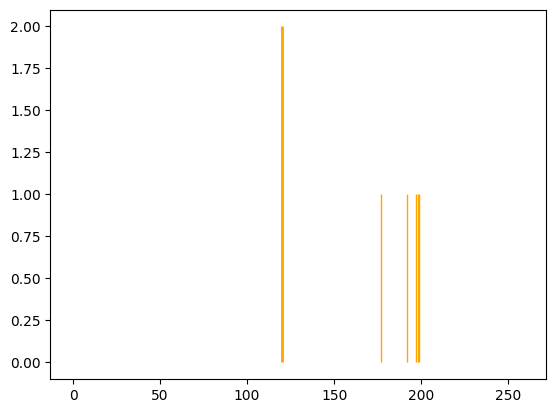

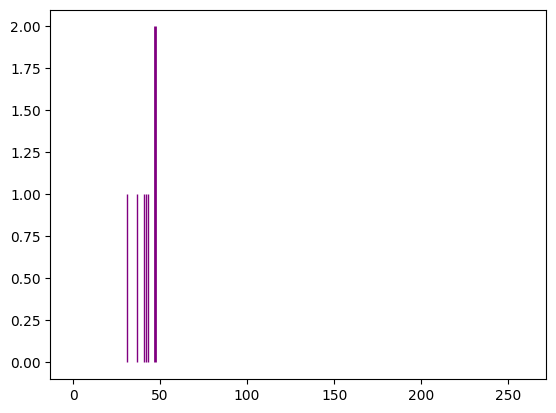

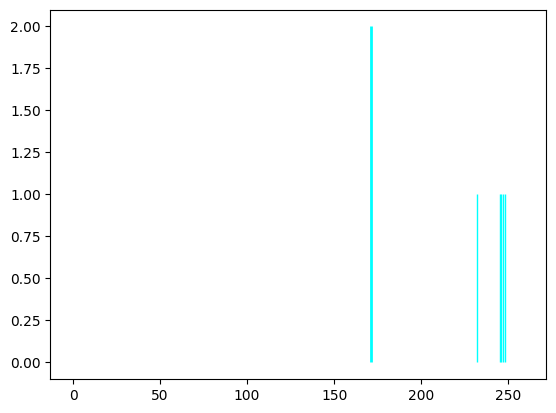

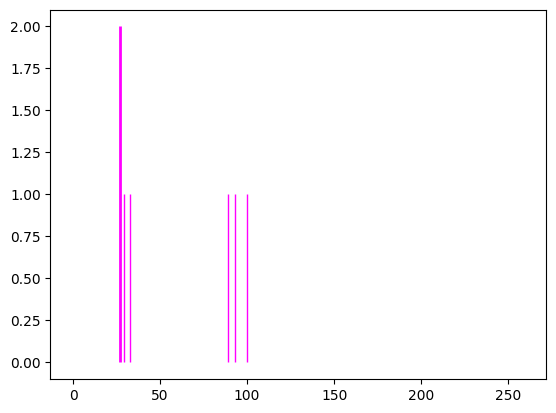

Spectrum num=2849, size=81, matched=4, frac=0.04938271604938271
Spectrum num=2849, size=81, matched=17, frac=0.20987654320987653


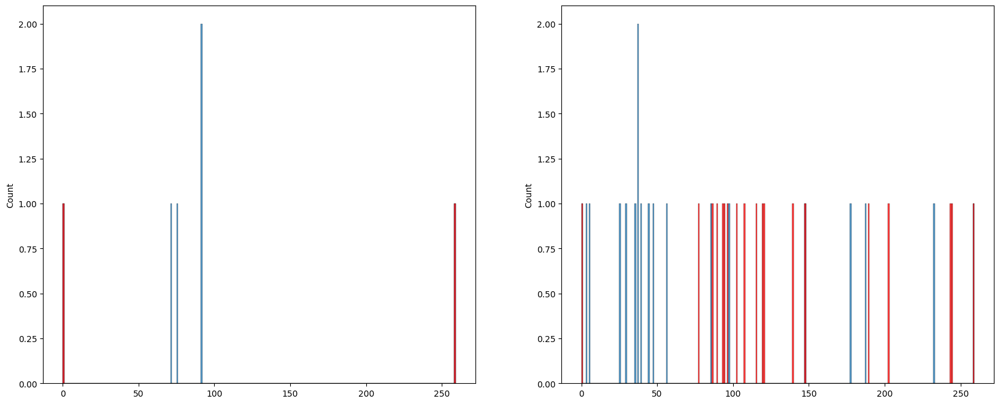

<Figure size 1200x800 with 0 Axes>

{0, 2, 3, 44, 79, 52}


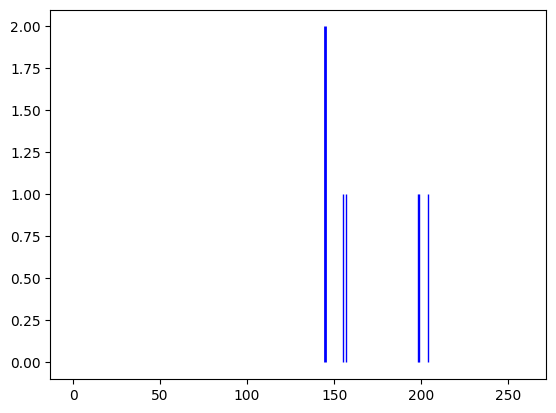

Spectrum num=2851, size=104, matched=3, frac=0.028846153846153848
Spectrum num=2851, size=104, matched=28, frac=0.2692307692307692


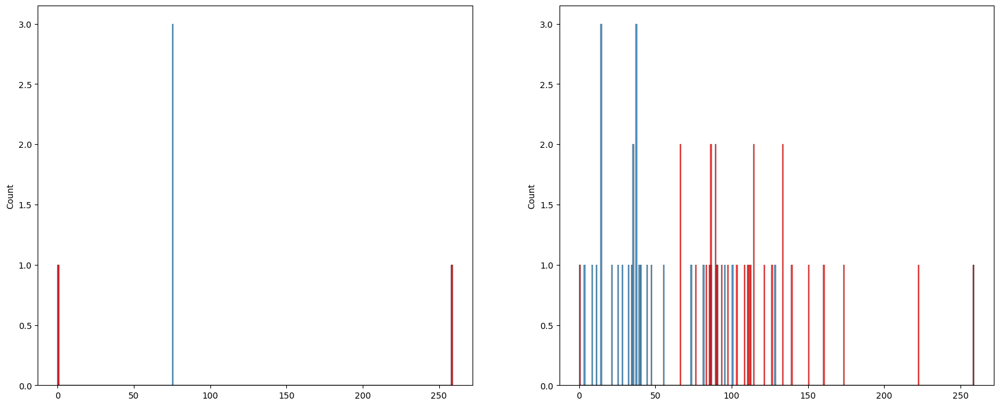

<Figure size 1200x800 with 0 Axes>

{72, 85, 54, 90, 60, 94}
{0, 3, 4, 7, 77, 20}


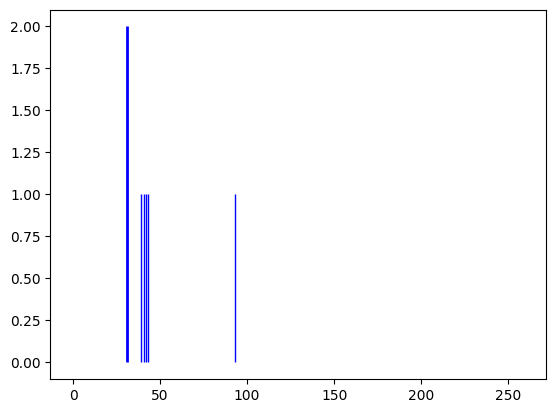

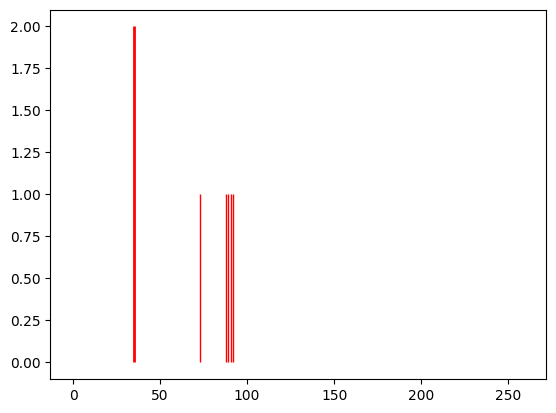

In [403]:
from random import randint
import re


def filter_repeating_matches(matches):
    result = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            
            is_bad = False
            for match1 in matched:
                if (match1['item2'] == match['item2']) and (match1['item1'] != match['item1']):
                    is_bad = True
                    break
            if not is_bad:
                result.append(match)
        else:
            result.append(match)
    return result


# all_nums = [x['num'] for x in msalign_specs if len(x['m_array']) >= 50]

ions_pr_su = get_ions(sequence,
                prefix=True,
                suffix=True,
                middle=False,
                min_length=1,
                include_loose_molecules=True,
                max_deconv_err=2
               )

ions_middle = get_ions(sequence,
                prefix=False,
                suffix=False,
                middle=True,
                min_length=10,
                include_loose_molecules=True,
                max_deconv_err=0
               )

ions = get_ions(
    sequence,
#     gen_random_protein(len(sequence)),
    prefix=True,
    suffix=True,
    middle=False,
    min_length=None,
    include_loose_molecules=False,
    max_deconv_err=0
)

for num in interesting_nums:
    item = get_msalign_spec(num)
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))
    
    matched = match_items(ions_pr_su, 'mass_0', item['m_array'], None, err=5)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    b_pos = [x['item1']['len'] for x in matched if x['item1']['type'] == 'b']
    y_pos = [len(sequence) - x['item1']['len'] for x in matched if x['item1']['type'] == 'y']
          
    plt.figure(figsize=(12, 8))
    sns.histplot(b_pos + [0, len(sequence)], bins=len(sequence), ax=axs[0])
    sns.histplot(y_pos + [0, len(sequence)], bins=len(sequence), color='r', ax=axs[0])

    matched = match_items(ions_middle, 'mass_0', item['m_array'], None, err=5)
    matched = filter_repeating_matches(matched)
    print(f'Spectrum num={num}, size={len(item["m_array"])}, matched={len(matched)}, frac={len(matched) / len(item["m_array"])}')

    l_pos = []
    r_pos = []
    for match in matched:
        if match['item1']['type'] == 'm':
            gr = re.match(r'''^m(\d+)_(\d+)\D*''', match['item1']['name'], re.DOTALL)
            l = int(gr.group(1)); r = int(gr.group(2))
            l_pos.append(l)
            r_pos.append(r)
              
    sns.histplot(l_pos + [0, len(sequence)], bins=len(sequence), ax=axs[1])
    sns.histplot(r_pos + [0, len(sequence)], bins=len(sequence), color='r', ax=axs[1])
    plt.show()
    
    m_array = item['m_array']
    m_array = add_ids_to_masses(m_array)
    
    all_segments = generate_all_ladders(m_array, ions)
    draw_all_ladders(all_segments)
    